# Task 1: Introduction

---

For this project, we are going to work on evaluating price of houses given the following features:

1. Year of sale of the house
2. The age of the house at the time of sale
3. Distance from city center
4. Number of stores in the locality
5. The latitude
6. The longitude

![Regression](images/regression.png)

Note: This notebook uses `python 3` and these packages: `tensorflow`, `pandas`, `matplotlib`, `scikit-learn`.

## 1.1: Importing Libraries & Helper Functions

First of all, we will need to import some libraries and helper functions. This includes TensorFlow and some utility functions that I've written to save time.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
from utils import *
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, ThresholdedReLU
from tensorflow.keras.callbacks import EarlyStopping, LambdaCallback
from sklearn import preprocessing

%matplotlib inline
#tf.logging.set_verbosity(tf.logging.ERROR)

print('Libraries imported.')

Libraries imported.


In [2]:
column_names = ['FIPS', 'No. of cases','case/pop','Avg Daily Min Air Temperature (F)','Mortality','total_mean_diabetes','Percentage_diabetes','Employed','Unemployed','emp/unemp','Per capita Income','without high school diploma(%)','POP','TB_mortality','LifeExpectancy','Black or African American alone percent 2013','American Indian and Alaska Native alone percent 2013','Asian alone percent 2013','Native Hawaiian and Other Pacific Islander alone percent','Two or More Races percent 2013','Hispanic or Latino percent 2013','White alone not Hispanic or Latino percent 2013','TABLE 3 US BORN']

# Task 2: Importing the Data

## 2.1: Importing the Data

The dataset is saved in a `data.csv` file. We will use `pandas` to take a look at some of the rows.

In [3]:
df_06 = pd.read_csv('data_2006.csv')
df_07 = pd.read_csv('data_2007.csv')
df_08 = pd.read_csv('data_2008.csv')
df_09 = pd.read_csv('data_2009.csv')
#df.to_csv('data_new.csv', index = False)

In [4]:
df_train = pd.concat([df_06,df_07,df_08], sort=False)
df_test = df_09
df_train = df_train.iloc[:,:56]
print(df_train.shape)

(9427, 56)


## 2.2: Check Missing Data

It's a good practice to check if the data has any missing values. In real world data, this is quite common and must be taken care of before any data pre-processing or model training.

In [5]:
df_test.isna().sum()

State Abbreviation                                                                                   0
FIPS                                                                                                 0
County                                                                                               0
State                                                                                                0
No. of cases                                                                                        84
Avg Daily Max Air Temperature (F)                                                                    0
Avg Daily Min Air Temperature (F)                                                                    0
Avg Daily Max Heat Index (F)                                                                         0
Mortality                                                                                            0
total_mean_smoking                                                       

In [6]:
df_train = df_train.drop(['State Abbreviation', 'County', 'State', 'Avg Daily Max Air Temperature (F)', 'Avg Daily Max Heat Index (F)', 'Unemployed', 'Adult smoking raw value', 'Air pollution-particulate matter days raw value'], axis = 1)
df_test = df_test.drop(['State Abbreviation', 'County', 'State', 'Avg Daily Max Air Temperature (F)', 'Avg Daily Max Heat Index (F)', 'Unemployed', 'Adult smoking raw value', 'Air pollution-particulate matter days raw value'], axis = 1)

In [7]:
df_train = df_train.fillna(df_train.mean())
df_test = df_test.fillna(df_test.mean())

In [8]:
print(df_train.shape)
print(df_test.shape)

(9427, 48)
(3142, 48)


In [9]:
df_train = df_train.iloc[:,:].astype(float)
df_test = df_test.iloc[:,:].astype(float)

In [10]:
column_names = df_train.columns[:]

# Task 3: Data Normalization

## 3.1: Data Normalization

We can make it easier for optimization algorithms to find minimas by normalizing the data before training a model.

In [11]:
scaler = preprocessing.StandardScaler()
df_norm = scaler.fit_transform(df_train)
#df_norm = (df_train - df_train.mean()) / df_train.std()
df_norm = pd.DataFrame(df_norm, columns = column_names)
df_norm.shape

(9427, 48)

In [12]:
df_norm1 = scaler.fit_transform(df_test)
#df_norm = (df_train - df_train.mean()) / df_train.std()
df_norm1 = pd.DataFrame(df_norm1, columns = column_names)
#df_norm1 = (df_test - df_test.mean()) / df_test.std()
df_norm1.shape

(3142, 48)

## 3.2: Convert Label Value

Because we are using normalized values for the labels, we will get the predictions back from a trained model in the same distribution. So, we need to convert the predicted values back to the original distribution if we want predicted prices.

In [13]:
y_mean = df_test['No. of cases'].mean()
y_std = df_test['No. of cases'].std()

def convert_label_value(pred):
    if pred==0:
        return int(pred)
    
    return int(pred * y_std + y_mean)

print((0-y_mean)/y_std)

-0.18840640547738222


# Task 4: Create Training and Test Sets

## 4.1: Select Features

Make sure to remove the column __price__ from the list of features as it is the label and should not be used as a feature.

In [14]:
X_train = df_norm.drop(['No. of cases'], axis = 1)
print(X_train.shape)
X_test = df_norm1.drop(['No. of cases'], axis = 1)
print(X_test.shape)

(9427, 47)
(3142, 47)


## 4.2: Select Labels

In [15]:
y_train = df_norm.iloc[:, 1]
print(y_train.shape)
y_test = df_norm1.iloc[:, 1]
print(y_test.head())
print(min(y_train))

(9427,)
0   -0.142363
1   -0.050217
2   -0.142363
3   -0.096290
4   -0.188436
Name: No. of cases, dtype: float64
-0.19097879032585133


## 4.3: Feature and Label Values

We will need to extract just the numeric values for the features and labels as the TensorFlow model will expect just numeric values as input.

## 4.4: Train and Test Split

We will keep some part of the data aside as a __test__ set. The model will not use this set during training and it will be used only for checking the performance of the model in trained and un-trained states. This way, we can make sure that we are going in the right direction with our model training.

In [16]:
#X_train, X_test, y_train, y_test = train_test_split(X_arr, Y_arr, test_size = 0.05, shuffle = True, random_state=0)
print('X_train shape: ', X_train.shape)
print('y_train shape: ', y_train.shape)
print('X_test shape: ', X_test.shape)
print('y_test shape: ', y_test.shape)

X_train shape:  (9427, 47)
y_train shape:  (9427,)
X_test shape:  (3142, 47)
y_test shape:  (3142,)


In [17]:
column_names = X_train.columns[:]

# Task 5: Create the Model

## 5.1: Create the Model

Let's write a function that returns an untrained model of a certain architecture.

In [19]:
from sklearn.ensemble import RandomForestRegressor
regressor = RandomForestRegressor(n_estimators = 1024, random_state = 0)
regressor.fit(X_train, y_train)

KeyboardInterrupt: 

In [51]:
from keras import backend
 
def rmse(y_true, y_pred):
    return backend.sqrt(backend.mean(backend.square(y_pred - y_true), axis=-1))

In [80]:
def get_model_0():
    
    model = Sequential([
        Dense(47, input_shape = (47,), activation = 'relu'),
        Dense(1),
        ThresholdedReLU(theta=-0.18)
    ])
    
    opt = tf.keras.optimizers.Adam(lr=0.00001)

    model.compile(
        loss='mean_squared_error',
        optimizer=opt
    )
    
    return model
weights=2601
model = get_model_0()
model.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18 (Dense)             (None, 50)                2400      
_________________________________________________________________
dense_19 (Dense)             (None, 1)                 51        
Total params: 2,451
Trainable params: 2,451
Non-trainable params: 0
_________________________________________________________________


In [179]:
def get_model_1():
    
    model = Sequential([
        Dense(47, input_shape = (X_train.shape[1],), activation = 'relu',use_bias=False),
        Dense(50, activation = 'relu'),
        Dense(1, activation = 'relu'),
        
        
    ])
    
    opt = tf.keras.optimizers.Adam(lr=0.00001)

    model.compile(
        loss='mean_squared_error',
        optimizer=opt
    )
    
    return model
weights=3441
model = get_model_1()
model.summary()

Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_38 (Dense)             (None, 47)                2209      
_________________________________________________________________
dense_39 (Dense)             (None, 50)                2400      
_________________________________________________________________
dense_40 (Dense)             (None, 1)                 51        
Total params: 4,660
Trainable params: 4,660
Non-trainable params: 0
_________________________________________________________________


In [1]:
def get_model_2():
    
    model = Sequential([
        Dense(47, input_shape = (X_train.shape[1],), activation = 'relu'),
        Dense(30, activation = 'relu'),
        Dense(10, activation = 'relu'),
        Dense(1),
        ThresholdedReLU(theta=-0.18)
    ])
    
    opt = tf.keras.optimizers.Adam(lr=0.00001)

    model.compile(
        loss='mean_squared_error',
        optimizer=opt
    )
    
    return model
weights=4017
model = get_model_2()
model.summary()

NameError: name 'Sequential' is not defined

In [ ]:
#Gen alg
def cal_pop_fitness_mod0(w):
    # Calculating the fitness value of each solution in the current population.
    # The fitness function caulcuates the sum of products between each input and its corresponding weight.
    w2=np.transpose(w)
    op=np.dot(X_train,w2)
    op[op<0]*=0
    y_t=y_train.to_numpy()
    y_t=np.repeat(y_t,80)
    y_t=np.reshape(y_t,(-1,80))
    
    fitness=op-y_t
    fitness=np.square(fitness)
    fitness=np.sum(fitness,axis=0)
    return fitness*-1

#Gen alg
#Gen alg

def select_mating_pool(pop, fitness, num_parents):
    parents = np.empty((num_parents, pop.shape[1]))
    for parent_num in range(num_parents):
        max_fitness_idx = np.argmax(fitness)
        parents[parent_num, :] = pop[max_fitness_idx, :]
        fitness[max_fitness_idx] = -99999999999
    return parents

def crossover(parents, offspring_size):
    offspring = np.empty(offspring_size)
    # The point at which crossover takes place between two parents. Usually it is at the center.
    crossover_point = np.uint8(offspring_size[1]/2)
    for k in range(offspring_size[0]-2):
        # Index of the first parent to mate.
        parent1_idx = np.random.randint(0,4)
        #print('dsfda')
        #print(parent1_idx)
        # Index of the second parent to mate.
        parent2_idx = np.random.randint(0,4)
        # The new offspring will have its first half of its genes taken from the first parent.
        offspring[k, 0:crossover_point] = parents[parent1_idx, 0:crossover_point]
        # The new offspring will have its second half of its genes taken from the second parent.
        offspring[k, crossover_point:] = parents[parent2_idx, crossover_point:]
        offspring[-2]=parents[1]
        offspring[-1]=parents[0]
    return offspring

def mutation(offspring_crossover):
    # Mutation changes a single gene in each offspring randomly.
    for idx in range(offspring_crossover.shape[0]-1):
        # The random value to be added to the gene.
        random_value = np.random.uniform(-1.0, 1.0, 1)
        offspring_crossover[idx, np.random.randint(0,960)] = offspring_crossover[idx, np.random.randint(0,960)] + random_value
    return offspring_crossover


def cal_pop_fitness_mod1(w):
    # Calculating the fitness value of each solution in the current population.
    # The fitness function caulcuates the sum of products between each input and its corresponding weight.
    w2=np.transpose(w)
    w3=w2[:940]
    #print(w3.shape)
    #print(w3[:49,0])
    w3=np.reshape(w3,[-1,20,10],order='F')
    #print(w3.shape)
    #print(w3[:,0,0])
    #return 0
    #X_t=X_train.to_numpy()
    #X_t=np.repeat(X_t,20,axis=0)
    #X_t=np.reshape(X_t,(-1,940))
    op=np.zeros(shape=[10,9427,20])
    for i in range(10):    
        op[i,:,:]=np.dot(X_train,w3[:,:,i])
    #print(np.max(op))
    #print(np.min(op))
    #print(np.max(op))
    #print(op.shape)
    #op=np.dot(op,w2[940:])
    op=np.sum(op,axis=2)
    
    #print(np.max(op))
    #print(np.min(op)) 
    op[op<-0.19]=-0.19
    print(np.max(op))
    print(np.min(op))
    #print(op.shape)
    #print(np.max(op))
    #print(np.min(op))
    op=np.transpose(op)
    y_t=y_train.to_numpy()
    #print(np.max(y_t))
    #print(np.min(y_t))
    y_t=np.repeat(y_t,10)
    y_t=np.reshape(y_t,(-1,10))
    #print('af')   
    fitness=op-y_t
    #fitness=np.square(fitness)
    fitness=np.sum(fitness,axis=0)
    fitness/=9427
    return fitness*-1



num_weights = 960
sol_per_pop = 10
num_parents_mating = 4
pop_size = (sol_per_pop,num_weights)
new_population = np.random.uniform(low=-4.0, high=4.0, size=pop_size)
new_population=popado
#print(new_population)
num_generations = 200000
for generation in range(num_generations):
    print("Generation : ", generation)
    fitness = cal_pop_fitness_mod1(new_population)
    parents = select_mating_pool(new_population, fitness, 
                                      num_parents_mating)
    offspring_crossover = crossover(parents,
                                       offspring_size=(pop_size[0]-parents.shape[0], num_weights))
    offspring_mutation = mutation(offspring_crossover)
    new_population[0:parents.shape[0], :] = parents
    new_population[parents.shape[0]:, :] = offspring_mutation
    fitness = cal_pop_fitness_mod1(new_population)
#print(fitness.shape)
best_match_idx = np.argmax(fitness)
w=new_population[best_match_idx,:]
#print("Best solution : ", new_population[best_match_idx, :])
print("Best solution fitness : ", fitness[best_match_idx])

Generation :  0
16.349848495613124
-0.19
100.05216563755684
-0.19
Generation :  1
100.05216563755684
-0.19
40.6399215788102
-0.19
Generation :  2
40.6399215788102
-0.19
26.340884590320982
-0.19
Generation :  3
26.340884590320982
-0.19
32.450176001407854
-0.19
Generation :  4
32.450176001407854
-0.19
58.59828337942168
-0.19
Generation :  5
58.59828337942168
-0.19
118.85672331845068
-0.19
Generation :  6
118.85672331845068
-0.19
35.08729007100449
-0.19
Generation :  7
35.08729007100449
-0.19
22.19533927530478
-0.19
Generation :  8
22.19533927530478
-0.19
55.687244820469715
-0.19
Generation :  9
55.687244820469715
-0.19
22.124701705034525
-0.19
Generation :  10
22.124701705034525
-0.19
71.92991691735838
-0.19
Generation :  11
71.92991691735838
-0.19
12.78884341428474
-0.19
Generation :  12
12.78884341428474
-0.19
46.02763273739242
-0.19
Generation :  13
46.02763273739242
-0.19
46.60697559360167
-0.19
Generation :  14
46.60697559360167
-0.19
26.38898397269022
-0.19
Generation :  15
26.3889

19.301990783810766
-0.19
Generation :  129
19.301990783810766
-0.19
129.85228386684918
-0.19
Generation :  130
129.85228386684918
-0.19
42.39669356403071
-0.19
Generation :  131
42.39669356403071
-0.19
59.90243686519196
-0.19
Generation :  132
59.90243686519196
-0.19
40.89083056415556
-0.19
Generation :  133
40.89083056415556
-0.19
30.248384481909092
-0.19
Generation :  134
30.248384481909092
-0.19
63.933967388026474
-0.19
Generation :  135
63.933967388026474
-0.19
49.194508343492004
-0.19
Generation :  136
49.194508343492004
-0.19
90.73440667711687
-0.19
Generation :  137
90.73440667711687
-0.19
33.88406658259721
-0.19
Generation :  138
33.88406658259721
-0.19
74.01877289989551
-0.19
Generation :  139
74.01877289989551
-0.19
27.877872491681227
-0.19
Generation :  140
27.877872491681227
-0.19
10.397760785298757
-0.19
Generation :  141
10.397760785298757
-0.19
56.26838833767286
-0.19
Generation :  142
56.26838833767286
-0.19
32.46742998798552
-0.19
Generation :  143
32.46742998798552
-0

16.9232288069353
-0.19
135.02341303285002
-0.19
Generation :  253
135.02341303285002
-0.19
41.201523160005394
-0.19
Generation :  254
41.201523160005394
-0.19
18.648183171630592
-0.19
Generation :  255
18.648183171630592
-0.19
12.579311762658815
-0.19
Generation :  256
12.579311762658815
-0.19
154.2645451296923
-0.19
Generation :  257
154.2645451296923
-0.19
217.88142437693344
-0.19
Generation :  258
217.88142437693344
-0.19
29.534475554812893
-0.19
Generation :  259
29.534475554812893
-0.19
53.87253479562423
-0.19
Generation :  260
53.87253479562423
-0.19
135.220430905001
-0.19
Generation :  261
135.220430905001
-0.19
23.61660722746042
-0.19
Generation :  262
23.61660722746042
-0.19
26.041040419449875
-0.19
Generation :  263
26.041040419449875
-0.19
16.384187280489684
-0.19
Generation :  264
16.384187280489684
-0.19
25.711580211528393
-0.19
Generation :  265
25.711580211528393
-0.19
25.735214709019907
-0.19
Generation :  266
25.735214709019907
-0.19
56.02503773933056
-0.19
Generation 

12.733709987386423
-0.19
Generation :  378
12.733709987386423
-0.19
17.019549921133155
-0.19
Generation :  379
17.019549921133155
-0.19
21.681717542237713
-0.19
Generation :  380
21.681717542237713
-0.19
60.80823278129441
-0.19
Generation :  381
60.80823278129441
-0.19
39.242116791057576
-0.19
Generation :  382
39.242116791057576
-0.19
16.691444034047933
-0.19
Generation :  383
16.691444034047933
-0.19
53.74886638652917
-0.19
Generation :  384
53.74886638652917
-0.19
20.674436971988662
-0.19
Generation :  385
20.674436971988662
-0.19
61.489674393420785
-0.19
Generation :  386
61.489674393420785
-0.19
159.87051689564117
-0.19
Generation :  387
159.87051689564117
-0.19
56.19394329105124
-0.19
Generation :  388
56.19394329105124
-0.19
44.75386624839387
-0.19
Generation :  389
44.75386624839387
-0.19
91.88812688037049
-0.19
Generation :  390
91.88812688037049
-0.19
34.81187096677117
-0.19
Generation :  391
34.81187096677117
-0.19
14.874259512897918
-0.19
Generation :  392
14.87425951289791

124.66566607014565
-0.19
Generation :  506
124.66566607014565
-0.19
15.316812204164819
-0.19
Generation :  507
15.316812204164819
-0.19
80.0500406795512
-0.19
Generation :  508
80.0500406795512
-0.19
19.28956940635809
-0.19
Generation :  509
19.28956940635809
-0.19
23.63572149644345
-0.19
Generation :  510
23.63572149644345
-0.19
227.097194000069
-0.19
Generation :  511
227.097194000069
-0.19
26.890059706885665
-0.19
Generation :  512
26.890059706885665
-0.19
21.62519061472905
-0.19
Generation :  513
21.62519061472905
-0.19
122.72471632304857
-0.19
Generation :  514
122.72471632304857
-0.19
7.023817472130762
-0.19
Generation :  515
7.023817472130762
-0.19
74.94883422576027
-0.19
Generation :  516
74.94883422576027
-0.19
92.45752038959061
-0.19
Generation :  517
92.45752038959061
-0.19
29.447937871255792
-0.19
Generation :  518
29.447937871255792
-0.19
106.21890107238934
-0.19
Generation :  519
106.21890107238934
-0.19
132.7420800273146
-0.19
Generation :  520
132.7420800273146
-0.19
68

16.079458465657627
-0.19
8.276857364274065
-0.19
Generation :  631
8.276857364274065
-0.19
33.295186448780704
-0.19
Generation :  632
33.295186448780704
-0.19
11.983583596220097
-0.19
Generation :  633
11.983583596220097
-0.19
97.37399471634328
-0.19
Generation :  634
97.37399471634328
-0.19
26.138639536449567
-0.19
Generation :  635
26.138639536449567
-0.19
67.65183882893328
-0.19
Generation :  636
67.65183882893328
-0.19
14.690742220122843
-0.19
Generation :  637
14.690742220122843
-0.19
31.50479032769053
-0.19
Generation :  638
31.50479032769053
-0.19
56.68114676659654
-0.19
Generation :  639
56.68114676659654
-0.19
103.90032074791884
-0.19
Generation :  640
103.90032074791884
-0.19
13.027384103339553
-0.19
Generation :  641
13.027384103339553
-0.19
14.271130054437013
-0.19
Generation :  642
14.271130054437013
-0.19
31.897313135352505
-0.19
Generation :  643
31.897313135352505
-0.19
76.40143201493663
-0.19
Generation :  644
76.40143201493663
-0.19
51.10198963200044
-0.19
Generation 

17.104133600441138
-0.19
Generation :  759
17.104133600441138
-0.19
17.17533957176329
-0.19
Generation :  760
17.17533957176329
-0.19
83.2495995635841
-0.19
Generation :  761
83.2495995635841
-0.19
9.068766158054352
-0.19
Generation :  762
9.068766158054352
-0.19
29.81226444297134
-0.19
Generation :  763
29.81226444297134
-0.19
20.360462227139166
-0.19
Generation :  764
20.360462227139166
-0.19
8.876533096499728
-0.19
Generation :  765
8.876533096499728
-0.19
91.22266444384613
-0.19
Generation :  766
91.22266444384613
-0.19
17.005475810448125
-0.19
Generation :  767
17.005475810448125
-0.19
174.2704530329624
-0.19
Generation :  768
174.2704530329624
-0.19
25.283081941523136
-0.19
Generation :  769
25.283081941523136
-0.19
31.727835324327888
-0.19
Generation :  770
31.727835324327888
-0.19
20.64289601846056
-0.19
Generation :  771
20.64289601846056
-0.19
25.520930714999906
-0.19
Generation :  772
25.520930714999906
-0.19
25.01526363442738
-0.19
Generation :  773
25.01526363442738
-0.19


70.82142046104694
-0.19
11.927434952184552
-0.19
Generation :  886
11.927434952184552
-0.19
140.9691381043454
-0.19
Generation :  887
140.9691381043454
-0.19
26.861951805669953
-0.19
Generation :  888
26.861951805669953
-0.19
15.851391888990008
-0.19
Generation :  889
15.851391888990008
-0.19
20.712042616353457
-0.19
Generation :  890
20.712042616353457
-0.19
44.49451587704464
-0.19
Generation :  891
44.49451587704464
-0.19
107.36569355607807
-0.19
Generation :  892
107.36569355607807
-0.19
22.586172183739514
-0.19
Generation :  893
22.586172183739514
-0.19
84.10304253866153
-0.19
Generation :  894
84.10304253866153
-0.19
214.93819893707573
-0.19
Generation :  895
214.93819893707573
-0.19
9.394091443921521
-0.19
Generation :  896
9.394091443921521
-0.19
18.73602399015617
-0.19
Generation :  897
18.73602399015617
-0.19
56.587677949569624
-0.19
Generation :  898
56.587677949569624
-0.19
105.78220318674101
-0.19
Generation :  899
105.78220318674101
-0.19
33.337168766203796
-0.19
Generatio

14.274362046531472
-0.19
73.89313046429828
-0.19
Generation :  1014
73.89313046429828
-0.19
58.035107224628575
-0.19
Generation :  1015
58.035107224628575
-0.19
15.897271031663667
-0.19
Generation :  1016
15.897271031663667
-0.19
31.827621874055215
-0.19
Generation :  1017
31.827621874055215
-0.19
93.13327455467001
-0.19
Generation :  1018
93.13327455467001
-0.19
82.50556443473525
-0.19
Generation :  1019
82.50556443473525
-0.19
15.193541360861381
-0.19
Generation :  1020
15.193541360861381
-0.19
82.51485515151185
-0.19
Generation :  1021
82.51485515151185
-0.19
208.75819943940164
-0.19
Generation :  1022
208.75819943940164
-0.19
16.516366091858206
-0.19
Generation :  1023
16.516366091858206
-0.19
23.20295284932887
-0.19
Generation :  1024
23.20295284932887
-0.19
17.486871637453547
-0.19
Generation :  1025
17.486871637453547
-0.19
98.16235115650446
-0.19
Generation :  1026
98.16235115650446
-0.19
13.928181766289644
-0.19
Generation :  1027
13.928181766289644
-0.19
77.49933436559624
-0.

13.22635205538452
-0.19
25.371143094594505
-0.19
Generation :  1137
25.371143094594505
-0.19
118.48523983473575
-0.19
Generation :  1138
118.48523983473575
-0.19
19.425385182766075
-0.19
Generation :  1139
19.425385182766075
-0.19
53.55969729532438
-0.19
Generation :  1140
53.55969729532438
-0.19
217.0038867694891
-0.19
Generation :  1141
217.0038867694891
-0.19
216.20546310903146
-0.19
Generation :  1142
216.20546310903146
-0.19
110.09923427091294
-0.19
Generation :  1143
110.09923427091294
-0.19
14.068515912962788
-0.19
Generation :  1144
14.068515912962788
-0.19
17.284425389015475
-0.19
Generation :  1145
17.284425389015475
-0.19
39.31427120306504
-0.19
Generation :  1146
39.31427120306504
-0.19
10.513337805417706
-0.19
Generation :  1147
10.513337805417706
-0.19
7.450558656364205
-0.19
Generation :  1148
7.450558656364205
-0.19
31.694541130235404
-0.19
Generation :  1149
31.694541130235404
-0.19
37.814984225190955
-0.19
Generation :  1150
37.814984225190955
-0.19
84.37040161930389


40.11529349810178
-0.19
25.513403120492278
-0.19
Generation :  1259
25.513403120492278
-0.19
54.90638664917
-0.19
Generation :  1260
54.90638664917
-0.19
52.53271165956579
-0.19
Generation :  1261
52.53271165956579
-0.19
8.429215451236011
-0.19
Generation :  1262
8.429215451236011
-0.19
23.258009476133537
-0.19
Generation :  1263
23.258009476133537
-0.19
25.804061888455564
-0.19
Generation :  1264
25.804061888455564
-0.19
147.2928906815764
-0.19
Generation :  1265
147.2928906815764
-0.19
165.15414086433682
-0.19
Generation :  1266
165.15414086433682
-0.19
72.34576127207853
-0.19
Generation :  1267
72.34576127207853
-0.19
66.57380900678393
-0.19
Generation :  1268
66.57380900678393
-0.19
18.367726389524968
-0.19
Generation :  1269
18.367726389524968
-0.19
62.63794700590131
-0.19
Generation :  1270
62.63794700590131
-0.19
40.1872606705474
-0.19
Generation :  1271
40.1872606705474
-0.19
53.26418716338276
-0.19
Generation :  1272
53.26418716338276
-0.19
31.017566732093965
-0.19
Generation 

72.80915065459985
-0.19
Generation :  1381
72.80915065459985
-0.19
24.038132562321277
-0.19
Generation :  1382
24.038132562321277
-0.19
35.21802631977819
-0.19
Generation :  1383
35.21802631977819
-0.19
21.016794790327637
-0.19
Generation :  1384
21.016794790327637
-0.19
38.40536842253386
-0.19
Generation :  1385
38.40536842253386
-0.19
56.73584367007787
-0.19
Generation :  1386
56.73584367007787
-0.19
18.744329141645338
-0.19
Generation :  1387
18.744329141645338
-0.19
34.574245048924645
-0.19
Generation :  1388
34.574245048924645
-0.19
15.983174752451859
-0.19
Generation :  1389
15.983174752451859
-0.19
22.969520837779868
-0.19
Generation :  1390
22.969520837779868
-0.19
311.41336478132166
-0.19
Generation :  1391
311.41336478132166
-0.19
12.43271755688453
-0.19
Generation :  1392
12.43271755688453
-0.19
22.96559294410328
-0.19
Generation :  1393
22.96559294410328
-0.19
20.219820385338295
-0.19
Generation :  1394
20.219820385338295
-0.19
31.331701595251097
-0.19
Generation :  1395
31

77.61907156350895
-0.19
Generation :  1505
77.61907156350895
-0.19
116.62691311668891
-0.19
Generation :  1506
116.62691311668891
-0.19
72.97539620050144
-0.19
Generation :  1507
72.97539620050144
-0.19
87.73566930317119
-0.19
Generation :  1508
87.73566930317119
-0.19
70.2018030247964
-0.19
Generation :  1509
70.2018030247964
-0.19
10.837972631400385
-0.19
Generation :  1510
10.837972631400385
-0.19
81.6138600937209
-0.19
Generation :  1511
81.6138600937209
-0.19
92.47682644901026
-0.19
Generation :  1512
92.47682644901026
-0.19
32.25041066703682
-0.19
Generation :  1513
32.25041066703682
-0.19
31.58427443573788
-0.19
Generation :  1514
31.58427443573788
-0.19
13.459097918001506
-0.19
Generation :  1515
13.459097918001506
-0.19
42.923299929699766
-0.19
Generation :  1516
42.923299929699766
-0.19
33.34927988530255
-0.19
Generation :  1517
33.34927988530255
-0.19
41.477283138155485
-0.19
Generation :  1518
41.477283138155485
-0.19
79.11472871627294
-0.19
Generation :  1519
79.1147287162

76.55841382583597
-0.19
Generation :  1628
76.55841382583597
-0.19
8.356805917630894
-0.19
Generation :  1629
8.356805917630894
-0.19
227.9624958431744
-0.19
Generation :  1630
227.9624958431744
-0.19
25.902471478017404
-0.19
Generation :  1631
25.902471478017404
-0.19
41.24002428537281
-0.19
Generation :  1632
41.24002428537281
-0.19
84.22508701693607
-0.19
Generation :  1633
84.22508701693607
-0.19
47.95702222531605
-0.19
Generation :  1634
47.95702222531605
-0.19
39.336478729576974
-0.19
Generation :  1635
39.336478729576974
-0.19
83.22131606666113
-0.19
Generation :  1636
83.22131606666113
-0.19
30.081233598483333
-0.19
Generation :  1637
30.081233598483333
-0.19
146.3959442688658
-0.19
Generation :  1638
146.3959442688658
-0.19
26.00202310322498
-0.19
Generation :  1639
26.00202310322498
-0.19
33.91958650591732
-0.19
Generation :  1640
33.91958650591732
-0.19
49.80115265701389
-0.19
Generation :  1641
49.80115265701389
-0.19
55.93173669742783
-0.19
Generation :  1642
55.9317366974

29.44697526891843
-0.19
Generation :  1752
29.44697526891843
-0.19
15.313054372964245
-0.19
Generation :  1753
15.313054372964245
-0.19
10.93726971421637
-0.19
Generation :  1754
10.93726971421637
-0.19
55.11532985913138
-0.19
Generation :  1755
55.11532985913138
-0.19
8.254280604225531
-0.19
Generation :  1756
8.254280604225531
-0.19
54.93108802422568
-0.19
Generation :  1757
54.93108802422568
-0.19
64.01864666606397
-0.19
Generation :  1758
64.01864666606397
-0.19
185.4572802895174
-0.19
Generation :  1759
185.4572802895174
-0.19
8.960897997781078
-0.19
Generation :  1760
8.960897997781078
-0.19
160.10492105945912
-0.19
Generation :  1761
160.10492105945912
-0.19
68.19906050224266
-0.19
Generation :  1762
68.19906050224266
-0.19
35.06005813270656
-0.19
Generation :  1763
35.06005813270656
-0.19
7.6882335412628215
-0.19
Generation :  1764
7.6882335412628215
-0.19
13.686752535902777
-0.19
Generation :  1765
13.686752535902777
-0.19
48.66104362496873
-0.19
Generation :  1766
48.66104362

-0.19
87.56782516073505
-0.19
Generation :  1878
87.56782516073505
-0.19
33.98992212854628
-0.19
Generation :  1879
33.98992212854628
-0.19
34.11533616505349
-0.19
Generation :  1880
34.11533616505349
-0.19
14.02491294487514
-0.19
Generation :  1881
14.02491294487514
-0.19
41.27634733495904
-0.19
Generation :  1882
41.27634733495904
-0.19
73.29545246317038
-0.19
Generation :  1883
73.29545246317038
-0.19
22.435051446221514
-0.19
Generation :  1884
22.435051446221514
-0.19
19.678026866464734
-0.19
Generation :  1885
19.678026866464734
-0.19
15.231192207757747
-0.19
Generation :  1886
15.231192207757747
-0.19
36.54255582537613
-0.19
Generation :  1887
36.54255582537613
-0.19
16.62913830407321
-0.19
Generation :  1888
16.62913830407321
-0.19
17.46658622936178
-0.19
Generation :  1889
17.46658622936178
-0.19
68.78413035274569
-0.19
Generation :  1890
68.78413035274569
-0.19
87.40417421479859
-0.19
Generation :  1891
87.40417421479859
-0.19
31.86479898122878
-0.19
Generation :  1892
31.8647

37.6864775345066
-0.19
Generation :  1999
37.6864775345066
-0.19
34.45049913504786
-0.19
Generation :  2000
34.45049913504786
-0.19
40.606897834335186
-0.19
Generation :  2001
40.606897834335186
-0.19
88.57485021778172
-0.19
Generation :  2002
88.57485021778172
-0.19
81.1407291146559
-0.19
Generation :  2003
81.1407291146559
-0.19
47.06231901042136
-0.19
Generation :  2004
47.06231901042136
-0.19
14.041075679881345
-0.19
Generation :  2005
14.041075679881345
-0.19
37.73542588759569
-0.19
Generation :  2006
37.73542588759569
-0.19
30.400909033839536
-0.19
Generation :  2007
30.400909033839536
-0.19
50.29949221941963
-0.19
Generation :  2008
50.29949221941963
-0.19
63.46102387440649
-0.19
Generation :  2009
63.46102387440649
-0.19
38.953971237938866
-0.19
Generation :  2010
38.953971237938866
-0.19
17.247728919412864
-0.19
Generation :  2011
17.247728919412864
-0.19
33.83329122484014
-0.19
Generation :  2012
33.83329122484014
-0.19
92.10288973129904
-0.19
Generation :  2013
92.1028897312

24.189538277871144
-0.19
Generation :  2122
24.189538277871144
-0.19
176.840844984279
-0.19
Generation :  2123
176.840844984279
-0.19
114.27346067601042
-0.19
Generation :  2124
114.27346067601042
-0.19
19.675991023964283
-0.19
Generation :  2125
19.675991023964283
-0.19
6.6510034181085125
-0.19
Generation :  2126
6.6510034181085125
-0.19
16.581436191217904
-0.19
Generation :  2127
16.581436191217904
-0.19
42.061225726494044
-0.19
Generation :  2128
42.061225726494044
-0.19
62.55249532774286
-0.19
Generation :  2129
62.55249532774286
-0.19
154.68364226201106
-0.19
Generation :  2130
154.68364226201106
-0.19
18.44266833137982
-0.19
Generation :  2131
18.44266833137982
-0.19
90.83293114352887
-0.19
Generation :  2132
90.83293114352887
-0.19
119.07668275420212
-0.19
Generation :  2133
119.07668275420212
-0.19
50.73805258806698
-0.19
Generation :  2134
50.73805258806698
-0.19
58.76145096492039
-0.19
Generation :  2135
58.76145096492039
-0.19
24.97419337436159
-0.19
Generation :  2136
24.97

58.27696818947568
-0.19
Generation :  2245
58.27696818947568
-0.19
33.55594206082637
-0.19
Generation :  2246
33.55594206082637
-0.19
78.17196553781793
-0.19
Generation :  2247
78.17196553781793
-0.19
32.9726178625165
-0.19
Generation :  2248
32.9726178625165
-0.19
8.265696893274207
-0.19
Generation :  2249
8.265696893274207
-0.19
40.959950816306495
-0.19
Generation :  2250
40.959950816306495
-0.19
46.704142277558276
-0.19
Generation :  2251
46.704142277558276
-0.19
38.23405317851613
-0.19
Generation :  2252
38.23405317851613
-0.19
55.47881351677728
-0.19
Generation :  2253
55.47881351677728
-0.19
65.55685040640103
-0.19
Generation :  2254
65.55685040640103
-0.19
214.2990568142502
-0.19
Generation :  2255
214.2990568142502
-0.19
29.202474364459103
-0.19
Generation :  2256
29.202474364459103
-0.19
24.20001442844662
-0.19
Generation :  2257
24.20001442844662
-0.19
89.76266979584474
-0.19
Generation :  2258
89.76266979584474
-0.19
21.30916331109463
-0.19
Generation :  2259
21.309163311094

29.162146178878487
-0.19
14.628174357405928
-0.19
Generation :  2367
14.628174357405928
-0.19
52.010454481929386
-0.19
Generation :  2368
52.010454481929386
-0.19
36.05449584354332
-0.19
Generation :  2369
36.05449584354332
-0.19
31.696882692717622
-0.19
Generation :  2370
31.696882692717622
-0.19
46.43261495833285
-0.19
Generation :  2371
46.43261495833285
-0.19
13.154826386265547
-0.19
Generation :  2372
13.154826386265547
-0.19
14.58846184108694
-0.19
Generation :  2373
14.58846184108694
-0.19
32.2948990222678
-0.19
Generation :  2374
32.2948990222678
-0.19
31.69089462863701
-0.19
Generation :  2375
31.69089462863701
-0.19
62.06547748626839
-0.19
Generation :  2376
62.06547748626839
-0.19
32.81656540874349
-0.19
Generation :  2377
32.81656540874349
-0.19
147.59578556229536
-0.19
Generation :  2378
147.59578556229536
-0.19
185.07158319151588
-0.19
Generation :  2379
185.07158319151588
-0.19
20.573189132458126
-0.19
Generation :  2380
20.573189132458126
-0.19
76.50886235216299
-0.19
G

13.525921542217887
-0.19
Generation :  2490
13.525921542217887
-0.19
167.4063071136768
-0.19
Generation :  2491
167.4063071136768
-0.19
21.720438191010658
-0.19
Generation :  2492
21.720438191010658
-0.19
23.12034355651797
-0.19
Generation :  2493
23.12034355651797
-0.19
14.80907423309798
-0.19
Generation :  2494
14.80907423309798
-0.19
32.49275579707143
-0.19
Generation :  2495
32.49275579707143
-0.19
23.565347886918104
-0.19
Generation :  2496
23.565347886918104
-0.19
43.48912635892404
-0.19
Generation :  2497
43.48912635892404
-0.19
63.35276770208969
-0.19
Generation :  2498
63.35276770208969
-0.19
161.49307826870714
-0.19
Generation :  2499
161.49307826870714
-0.19
177.63788835474088
-0.19
Generation :  2500
177.63788835474088
-0.19
16.61945870964518
-0.19
Generation :  2501
16.61945870964518
-0.19
141.0891781349057
-0.19
Generation :  2502
141.0891781349057
-0.19
23.789083896548068
-0.19
Generation :  2503
23.789083896548068
-0.19
30.73662452316671
-0.19
Generation :  2504
30.7366

16.397225240384905
-0.19
Generation :  2616
16.397225240384905
-0.19
24.219873363719515
-0.19
Generation :  2617
24.219873363719515
-0.19
170.9424302677261
-0.19
Generation :  2618
170.9424302677261
-0.19
9.394195016168418
-0.19
Generation :  2619
9.394195016168418
-0.19
45.23408508633722
-0.19
Generation :  2620
45.23408508633722
-0.19
81.22031296275635
-0.19
Generation :  2621
81.22031296275635
-0.19
113.12275592723525
-0.19
Generation :  2622
113.12275592723525
-0.19
113.52836792875397
-0.19
Generation :  2623
113.52836792875397
-0.19
61.75896053307787
-0.19
Generation :  2624
61.75896053307787
-0.19
37.6575556718807
-0.19
Generation :  2625
37.6575556718807
-0.19
10.665385348099804
-0.19
Generation :  2626
10.665385348099804
-0.19
17.863434692630122
-0.19
Generation :  2627
17.863434692630122
-0.19
158.24649964048953
-0.19
Generation :  2628
158.24649964048953
-0.19
42.618148275900424
-0.19
Generation :  2629
42.618148275900424
-0.19
88.62091029716075
-0.19
Generation :  2630
88.62

15.984169813541918
-0.19
Generation :  2742
15.984169813541918
-0.19
15.711063126827945
-0.19
Generation :  2743
15.711063126827945
-0.19
65.14957255965612
-0.19
Generation :  2744
65.14957255965612
-0.19
32.03845378374097
-0.19
Generation :  2745
32.03845378374097
-0.19
53.28042727584773
-0.19
Generation :  2746
53.28042727584773
-0.19
35.3978193587227
-0.19
Generation :  2747
35.3978193587227
-0.19
63.865406128000586
-0.19
Generation :  2748
63.865406128000586
-0.19
52.008265583118984
-0.19
Generation :  2749
52.008265583118984
-0.19
80.0472327054828
-0.19
Generation :  2750
80.0472327054828
-0.19
48.12059789549555
-0.19
Generation :  2751
48.12059789549555
-0.19
67.24628187987571
-0.19
Generation :  2752
67.24628187987571
-0.19
95.11554062381676
-0.19
Generation :  2753
95.11554062381676
-0.19
87.45549662818733
-0.19
Generation :  2754
87.45549662818733
-0.19
39.078208202266794
-0.19
Generation :  2755
39.078208202266794
-0.19
205.39202193158187
-0.19
Generation :  2756
205.39202193

18.077493748201462
-0.19
33.265081642105024
-0.19
Generation :  2867
33.265081642105024
-0.19
17.093389495421164
-0.19
Generation :  2868
17.093389495421164
-0.19
106.13203982723851
-0.19
Generation :  2869
106.13203982723851
-0.19
106.53085405725255
-0.19
Generation :  2870
106.53085405725255
-0.19
15.505940197530009
-0.19
Generation :  2871
15.505940197530009
-0.19
17.463605306596214
-0.19
Generation :  2872
17.463605306596214
-0.19
22.46214057526701
-0.19
Generation :  2873
22.46214057526701
-0.19
18.401149828878573
-0.19
Generation :  2874
18.401149828878573
-0.19
41.50158556142741
-0.19
Generation :  2875
41.50158556142741
-0.19
42.729064862464526
-0.19
Generation :  2876
42.729064862464526
-0.19
28.123471994485268
-0.19
Generation :  2877
28.123471994485268
-0.19
25.076506725829717
-0.19
Generation :  2878
25.076506725829717
-0.19
128.4941076966088
-0.19
Generation :  2879
128.4941076966088
-0.19
6.95086828689303
-0.19
Generation :  2880
6.95086828689303
-0.19
51.01912708830036
-

29.027284668260815
-0.19
Generation :  2988
29.027284668260815
-0.19
23.71884608740376
-0.19
Generation :  2989
23.71884608740376
-0.19
105.40367761655965
-0.19
Generation :  2990
105.40367761655965
-0.19
40.985433402220224
-0.19
Generation :  2991
40.985433402220224
-0.19
70.6912754043729
-0.19
Generation :  2992
70.6912754043729
-0.19
62.6658710168188
-0.19
Generation :  2993
62.6658710168188
-0.19
32.80945606915232
-0.19
Generation :  2994
32.80945606915232
-0.19
9.077361452438186
-0.19
Generation :  2995
9.077361452438186
-0.19
43.0235841613802
-0.19
Generation :  2996
43.0235841613802
-0.19
88.63041188577276
-0.19
Generation :  2997
88.63041188577276
-0.19
23.469234454996922
-0.19
Generation :  2998
23.469234454996922
-0.19
24.787272295350533
-0.19
Generation :  2999
24.787272295350533
-0.19
8.419145541933847
-0.19
Generation :  3000
8.419145541933847
-0.19
21.23315511415024
-0.19
Generation :  3001
21.23315511415024
-0.19
73.13322660481893
-0.19
Generation :  3002
73.133226604818

13.41764731675459
-0.19
10.152601247357353
-0.19
Generation :  3111
10.152601247357353
-0.19
14.668855493810337
-0.19
Generation :  3112
14.668855493810337
-0.19
58.141582587959334
-0.19
Generation :  3113
58.141582587959334
-0.19
195.25128737850363
-0.19
Generation :  3114
195.25128737850363
-0.19
122.25330151334381
-0.19
Generation :  3115
122.25330151334381
-0.19
121.86489603000894
-0.19
Generation :  3116
121.86489603000894
-0.19
55.82893210501433
-0.19
Generation :  3117
55.82893210501433
-0.19
65.32980384619626
-0.19
Generation :  3118
65.32980384619626
-0.19
12.334420731984324
-0.19
Generation :  3119
12.334420731984324
-0.19
35.91296310545785
-0.19
Generation :  3120
35.91296310545785
-0.19
184.18568658347257
-0.19
Generation :  3121
184.18568658347257
-0.19
35.2240017837345
-0.19
Generation :  3122
35.2240017837345
-0.19
48.73039088547671
-0.19
Generation :  3123
48.73039088547671
-0.19
17.322642460021925
-0.19
Generation :  3124
17.322642460021925
-0.19
38.54193952485083
-0.1

54.190981370025106
-0.19
Generation :  3232
54.190981370025106
-0.19
36.48153423296525
-0.19
Generation :  3233
36.48153423296525
-0.19
12.495962186790102
-0.19
Generation :  3234
12.495962186790102
-0.19
152.83855146922025
-0.19
Generation :  3235
152.83855146922025
-0.19
84.74269560138839
-0.19
Generation :  3236
84.74269560138839
-0.19
50.54216906341409
-0.19
Generation :  3237
50.54216906341409
-0.19
15.524629804369212
-0.19
Generation :  3238
15.524629804369212
-0.19
36.26046678600025
-0.19
Generation :  3239
36.26046678600025
-0.19
27.91512939255076
-0.19
Generation :  3240
27.91512939255076
-0.19
45.96301154422366
-0.19
Generation :  3241
45.96301154422366
-0.19
13.639183891975211
-0.19
Generation :  3242
13.639183891975211
-0.19
22.62049416025046
-0.19
Generation :  3243
22.62049416025046
-0.19
59.76202437786871
-0.19
Generation :  3244
59.76202437786871
-0.19
182.6276224309531
-0.19
Generation :  3245
182.6276224309531
-0.19
12.784315238156406
-0.19
Generation :  3246
12.78431

48.869175933487284
-0.19
Generation :  3354
48.869175933487284
-0.19
34.53348417099535
-0.19
Generation :  3355
34.53348417099535
-0.19
17.52804109165851
-0.19
Generation :  3356
17.52804109165851
-0.19
13.205991471215043
-0.19
Generation :  3357
13.205991471215043
-0.19
57.98738111898989
-0.19
Generation :  3358
57.98738111898989
-0.19
30.670346465921686
-0.19
Generation :  3359
30.670346465921686
-0.19
75.093395725536
-0.19
Generation :  3360
75.093395725536
-0.19
27.959231798243614
-0.19
Generation :  3361
27.959231798243614
-0.19
17.094347570348628
-0.19
Generation :  3362
17.094347570348628
-0.19
75.80775827404071
-0.19
Generation :  3363
75.80775827404071
-0.19
90.02180332672748
-0.19
Generation :  3364
90.02180332672748
-0.19
22.28723363304522
-0.19
Generation :  3365
22.28723363304522
-0.19
22.481157586646727
-0.19
Generation :  3366
22.481157586646727
-0.19
143.8468026797035
-0.19
Generation :  3367
143.8468026797035
-0.19
65.80624227182761
-0.19
Generation :  3368
65.80624227

22.379275753115554
-0.19
Generation :  3477
22.379275753115554
-0.19
95.59036721089569
-0.19
Generation :  3478
95.59036721089569
-0.19
79.90789727908447
-0.19
Generation :  3479
79.90789727908447
-0.19
20.8759783367867
-0.19
Generation :  3480
20.8759783367867
-0.19
131.8467301516268
-0.19
Generation :  3481
131.8467301516268
-0.19
10.124255704664474
-0.19
Generation :  3482
10.124255704664474
-0.19
79.34788579006667
-0.19
Generation :  3483
79.34788579006667
-0.19
28.236257560434268
-0.19
Generation :  3484
28.236257560434268
-0.19
16.019045894583343
-0.19
Generation :  3485
16.019045894583343
-0.19
48.74726077240477
-0.19
Generation :  3486
48.74726077240477
-0.19
87.35329855428733
-0.19
Generation :  3487
87.35329855428733
-0.19
22.32676160957672
-0.19
Generation :  3488
22.32676160957672
-0.19
18.547484032696843
-0.19
Generation :  3489
18.547484032696843
-0.19
64.44391781093297
-0.19
Generation :  3490
64.44391781093297
-0.19
185.04928585897366
-0.19
Generation :  3491
185.049285

Generation :  3600
20.336570010449755
-0.19
53.392190262976584
-0.19
Generation :  3601
53.392190262976584
-0.19
35.583411800711104
-0.19
Generation :  3602
35.583411800711104
-0.19
231.9048413028159
-0.19
Generation :  3603
231.9048413028159
-0.19
46.10167454003522
-0.19
Generation :  3604
46.10167454003522
-0.19
15.016699486471197
-0.19
Generation :  3605
15.016699486471197
-0.19
11.889608299014327
-0.19
Generation :  3606
11.889608299014327
-0.19
33.40146332214394
-0.19
Generation :  3607
33.40146332214394
-0.19
56.388128260371325
-0.19
Generation :  3608
56.388128260371325
-0.19
12.34288658239322
-0.19
Generation :  3609
12.34288658239322
-0.19
49.46613348770424
-0.19
Generation :  3610
49.46613348770424
-0.19
15.190697650876238
-0.19
Generation :  3611
15.190697650876238
-0.19
29.554577500104717
-0.19
Generation :  3612
29.554577500104717
-0.19
27.632992568811694
-0.19
Generation :  3613
27.632992568811694
-0.19
20.34064084952787
-0.19
Generation :  3614
20.34064084952787
-0.19
31

Generation :  3726
49.44069380706617
-0.19
75.72406612059683
-0.19
Generation :  3727
75.72406612059683
-0.19
16.85123071540562
-0.19
Generation :  3728
16.85123071540562
-0.19
54.07999615837517
-0.19
Generation :  3729
54.07999615837517
-0.19
60.17703825265406
-0.19
Generation :  3730
60.17703825265406
-0.19
19.623316022904653
-0.19
Generation :  3731
19.623316022904653
-0.19
14.018132424138681
-0.19
Generation :  3732
14.018132424138681
-0.19
38.16269896147459
-0.19
Generation :  3733
38.16269896147459
-0.19
9.054495926974806
-0.19
Generation :  3734
9.054495926974806
-0.19
24.485069383843335
-0.19
Generation :  3735
24.485069383843335
-0.19
42.59899294467036
-0.19
Generation :  3736
42.59899294467036
-0.19
99.3495931781888
-0.19
Generation :  3737
99.3495931781888
-0.19
123.61186272558996
-0.19
Generation :  3738
123.61186272558996
-0.19
51.79133855887061
-0.19
Generation :  3739
51.79133855887061
-0.19
14.121106223438302
-0.19
Generation :  3740
14.121106223438302
-0.19
56.73022331

13.89773545471595
-0.19
Generation :  3850
13.89773545471595
-0.19
24.844864436635245
-0.19
Generation :  3851
24.844864436635245
-0.19
38.77588295003373
-0.19
Generation :  3852
38.77588295003373
-0.19
33.01983077607961
-0.19
Generation :  3853
33.01983077607961
-0.19
14.464348913378116
-0.19
Generation :  3854
14.464348913378116
-0.19
7.507873646377629
-0.19
Generation :  3855
7.507873646377629
-0.19
35.828803137138436
-0.19
Generation :  3856
35.828803137138436
-0.19
68.64380022701081
-0.19
Generation :  3857
68.64380022701081
-0.19
43.06171688120596
-0.19
Generation :  3858
43.06171688120596
-0.19
12.11056657504198
-0.19
Generation :  3859
12.11056657504198
-0.19
114.46069071900615
-0.19
Generation :  3860
114.46069071900615
-0.19
18.30692081259239
-0.19
Generation :  3861
18.30692081259239
-0.19
40.03807933084136
-0.19
Generation :  3862
40.03807933084136
-0.19
48.264371101645246
-0.19
Generation :  3863
48.264371101645246
-0.19
114.6250365433429
-0.19
Generation :  3864
114.62503

72.38313451657712
-0.19
Generation :  3972
72.38313451657712
-0.19
16.871474696136193
-0.19
Generation :  3973
16.871474696136193
-0.19
21.054850575922565
-0.19
Generation :  3974
21.054850575922565
-0.19
43.81505052668577
-0.19
Generation :  3975
43.81505052668577
-0.19
14.938011619052865
-0.19
Generation :  3976
14.938011619052865
-0.19
45.546880153114515
-0.19
Generation :  3977
45.546880153114515
-0.19
12.048951054739048
-0.19
Generation :  3978
12.048951054739048
-0.19
14.359693543112106
-0.19
Generation :  3979
14.359693543112106
-0.19
17.90706669997924
-0.19
Generation :  3980
17.90706669997924
-0.19
31.43706639119094
-0.19
Generation :  3981
31.43706639119094
-0.19
40.0133174228281
-0.19
Generation :  3982
40.0133174228281
-0.19
43.92270613801584
-0.19
Generation :  3983
43.92270613801584
-0.19
27.030729931638405
-0.19
Generation :  3984
27.030729931638405
-0.19
60.111932920134905
-0.19
Generation :  3985
60.111932920134905
-0.19
71.74123657982992
-0.19
Generation :  3986
71.74

38.92390935886785
-0.19
56.47181790774235
-0.19
Generation :  4097
56.47181790774235
-0.19
102.82725035186729
-0.19
Generation :  4098
102.82725035186729
-0.19
30.604002506049227
-0.19
Generation :  4099
30.604002506049227
-0.19
18.35378095435584
-0.19
Generation :  4100
18.35378095435584
-0.19
37.211430991601034
-0.19
Generation :  4101
37.211430991601034
-0.19
39.49490400893748
-0.19
Generation :  4102
39.49490400893748
-0.19
42.273206365134456
-0.19
Generation :  4103
42.273206365134456
-0.19
156.54392435319866
-0.19
Generation :  4104
156.54392435319866
-0.19
77.02570865249797
-0.19
Generation :  4105
77.02570865249797
-0.19
23.51449300951859
-0.19
Generation :  4106
23.51449300951859
-0.19
13.476211426171677
-0.19
Generation :  4107
13.476211426171677
-0.19
58.66303733739174
-0.19
Generation :  4108
58.66303733739174
-0.19
88.12903483237008
-0.19
Generation :  4109
88.12903483237008
-0.19
25.960492571712194
-0.19
Generation :  4110
25.960492571712194
-0.19
278.6586424643241
-0.19


20.745523209195937
-0.19
13.74845356390069
-0.19
Generation :  4223
13.74845356390069
-0.19
30.20384365972834
-0.19
Generation :  4224
30.20384365972834
-0.19
20.880617965679157
-0.19
Generation :  4225
20.880617965679157
-0.19
60.53629162845043
-0.19
Generation :  4226
60.53629162845043
-0.19
70.30405518784036
-0.19
Generation :  4227
70.30405518784036
-0.19
100.72250849780264
-0.19
Generation :  4228
100.72250849780264
-0.19
95.38999459546642
-0.19
Generation :  4229
95.38999459546642
-0.19
15.750868467424631
-0.19
Generation :  4230
15.750868467424631
-0.19
21.74623404588953
-0.19
Generation :  4231
21.74623404588953
-0.19
173.27743793856334
-0.19
Generation :  4232
173.27743793856334
-0.19
19.288260017710925
-0.19
Generation :  4233
19.288260017710925
-0.19
113.86225929750319
-0.19
Generation :  4234
113.86225929750319
-0.19
153.50179949612019
-0.19
Generation :  4235
153.50179949612019
-0.19
15.717314932584443
-0.19
Generation :  4236
15.717314932584443
-0.19
45.091632110143735
-0

93.23375927305827
-0.19
Generation :  4345
93.23375927305827
-0.19
68.93697107369387
-0.19
Generation :  4346
68.93697107369387
-0.19
9.139025468718339
-0.19
Generation :  4347
9.139025468718339
-0.19
23.135342450519573
-0.19
Generation :  4348
23.135342450519573
-0.19
52.27165245501598
-0.19
Generation :  4349
52.27165245501598
-0.19
23.258561148408283
-0.19
Generation :  4350
23.258561148408283
-0.19
81.0621144914875
-0.19
Generation :  4351
81.0621144914875
-0.19
175.17782280521035
-0.19
Generation :  4352
175.17782280521035
-0.19
82.03036847548395
-0.19
Generation :  4353
82.03036847548395
-0.19
164.9582651010135
-0.19
Generation :  4354
164.9582651010135
-0.19
21.90436408091427
-0.19
Generation :  4355
21.90436408091427
-0.19
19.175140597628335
-0.19
Generation :  4356
19.175140597628335
-0.19
26.619235063605288
-0.19
Generation :  4357
26.619235063605288
-0.19
22.523036623177504
-0.19
Generation :  4358
22.523036623177504
-0.19
12.480078608857884
-0.19
Generation :  4359
12.48007

33.309619916632485
-0.19
Generation :  4467
33.309619916632485
-0.19
27.010585737003083
-0.19
Generation :  4468
27.010585737003083
-0.19
37.530939634846725
-0.19
Generation :  4469
37.530939634846725
-0.19
52.72850518076089
-0.19
Generation :  4470
52.72850518076089
-0.19
27.95614176053823
-0.19
Generation :  4471
27.95614176053823
-0.19
9.862458167947215
-0.19
Generation :  4472
9.862458167947215
-0.19
121.97052612392906
-0.19
Generation :  4473
121.97052612392906
-0.19
31.30982691829196
-0.19
Generation :  4474
31.30982691829196
-0.19
168.50926222107176
-0.19
Generation :  4475
168.50926222107176
-0.19
91.72569707812607
-0.19
Generation :  4476
91.72569707812607
-0.19
10.384906863378939
-0.19
Generation :  4477
10.384906863378939
-0.19
33.32821960058921
-0.19
Generation :  4478
33.32821960058921
-0.19
48.73428899917357
-0.19
Generation :  4479
48.73428899917357
-0.19
61.420974369423035
-0.19
Generation :  4480
61.420974369423035
-0.19
40.49783270427537
-0.19
Generation :  4481
40.49

81.73945257569557
-0.19
30.20039059129646
-0.19
Generation :  4589
30.20039059129646
-0.19
31.951559818351072
-0.19
Generation :  4590
31.951559818351072
-0.19
15.656788713906892
-0.19
Generation :  4591
15.656788713906892
-0.19
11.58709475966014
-0.19
Generation :  4592
11.58709475966014
-0.19
31.68965803051793
-0.19
Generation :  4593
31.68965803051793
-0.19
38.52537679539094
-0.19
Generation :  4594
38.52537679539094
-0.19
20.417240133663142
-0.19
Generation :  4595
20.417240133663142
-0.19
15.135352889591088
-0.19
Generation :  4596
15.135352889591088
-0.19
9.963910780060147
-0.19
Generation :  4597
9.963910780060147
-0.19
25.966956590197327
-0.19
Generation :  4598
25.966956590197327
-0.19
23.39938343287856
-0.19
Generation :  4599
23.39938343287856
-0.19
12.302849343519878
-0.19
Generation :  4600
12.302849343519878
-0.19
87.7085758970695
-0.19
Generation :  4601
87.7085758970695
-0.19
16.49562321551117
-0.19
Generation :  4602
16.49562321551117
-0.19
20.356283067695088
-0.19
Gen

29.38035118781865
-0.19
Generation :  4714
29.38035118781865
-0.19
89.93792056542011
-0.19
Generation :  4715
89.93792056542011
-0.19
73.24745067881807
-0.19
Generation :  4716
73.24745067881807
-0.19
11.328054131302164
-0.19
Generation :  4717
11.328054131302164
-0.19
35.05649140366003
-0.19
Generation :  4718
35.05649140366003
-0.19
50.71955806156225
-0.19
Generation :  4719
50.71955806156225
-0.19
16.20103394607468
-0.19
Generation :  4720
16.20103394607468
-0.19
18.729671523528808
-0.19
Generation :  4721
18.729671523528808
-0.19
10.066763753712227
-0.19
Generation :  4722
10.066763753712227
-0.19
266.3182539429448
-0.19
Generation :  4723
266.3182539429448
-0.19
30.35351625686633
-0.19
Generation :  4724
30.35351625686633
-0.19
44.07512684471203
-0.19
Generation :  4725
44.07512684471203
-0.19
164.15314338819584
-0.19
Generation :  4726
164.15314338819584
-0.19
18.90844650024804
-0.19
Generation :  4727
18.90844650024804
-0.19
18.11664463753199
-0.19
Generation :  4728
18.11664463

31.36516219520962
-0.19
Generation :  4840
31.36516219520962
-0.19
43.26819861193269
-0.19
Generation :  4841
43.26819861193269
-0.19
149.19414486805758
-0.19
Generation :  4842
149.19414486805758
-0.19
119.83823689417429
-0.19
Generation :  4843
119.83823689417429
-0.19
253.94734073284616
-0.19
Generation :  4844
253.94734073284616
-0.19
132.2279214604141
-0.19
Generation :  4845
132.2279214604141
-0.19
11.929216212901984
-0.19
Generation :  4846
11.929216212901984
-0.19
15.568463937420319
-0.19
Generation :  4847
15.568463937420319
-0.19
44.481440433618474
-0.19
Generation :  4848
44.481440433618474
-0.19
30.402004479716545
-0.19
Generation :  4849
30.402004479716545
-0.19
16.760321246146447
-0.19
Generation :  4850
16.760321246146447
-0.19
20.29669882969493
-0.19
Generation :  4851
20.29669882969493
-0.19
27.655179939907512
-0.19
Generation :  4852
27.655179939907512
-0.19
46.52001860362651
-0.19
Generation :  4853
46.52001860362651
-0.19
220.20856284679954
-0.19
Generation :  4854


16.146996847053778
-0.19
Generation :  4966
16.146996847053778
-0.19
186.51702171059216
-0.19
Generation :  4967
186.51702171059216
-0.19
155.45083259532765
-0.19
Generation :  4968
155.45083259532765
-0.19
47.22371896255001
-0.19
Generation :  4969
47.22371896255001
-0.19
41.02441857941295
-0.19
Generation :  4970
41.02441857941295
-0.19
65.09278657754571
-0.19
Generation :  4971
65.09278657754571
-0.19
42.870231538443534
-0.19
Generation :  4972
42.870231538443534
-0.19
27.500875375495056
-0.19
Generation :  4973
27.500875375495056
-0.19
77.25612281666804
-0.19
Generation :  4974
77.25612281666804
-0.19
219.94810707225923
-0.19
Generation :  4975
219.94810707225923
-0.19
70.08469602604146
-0.19
Generation :  4976
70.08469602604146
-0.19
76.99964377661868
-0.19
Generation :  4977
76.99964377661868
-0.19
13.152676341250256
-0.19
Generation :  4978
13.152676341250256
-0.19
28.753409702978473
-0.19
Generation :  4979
28.753409702978473
-0.19
67.6732257671031
-0.19
Generation :  4980
67.6

17.3469049006268
-0.19
61.8281780669451
-0.19
Generation :  5090
61.8281780669451
-0.19
21.799899068759856
-0.19
Generation :  5091
21.799899068759856
-0.19
17.14425959553896
-0.19
Generation :  5092
17.14425959553896
-0.19
60.88378446596663
-0.19
Generation :  5093
60.88378446596663
-0.19
15.758395730891284
-0.19
Generation :  5094
15.758395730891284
-0.19
28.16696920547566
-0.19
Generation :  5095
28.16696920547566
-0.19
25.842676493696406
-0.19
Generation :  5096
25.842676493696406
-0.19
11.779230384892088
-0.19
Generation :  5097
11.779230384892088
-0.19
28.152672109702436
-0.19
Generation :  5098
28.152672109702436
-0.19
13.226448218046945
-0.19
Generation :  5099
13.226448218046945
-0.19
16.025168893529518
-0.19
Generation :  5100
16.025168893529518
-0.19
83.0491535543413
-0.19
Generation :  5101
83.0491535543413
-0.19
125.14087362060172
-0.19
Generation :  5102
125.14087362060172
-0.19
25.732211998313133
-0.19
Generation :  5103
25.732211998313133
-0.19
29.68313850440559
-0.19
G

-0.19
13.701425348215775
-0.19
Generation :  5215
13.701425348215775
-0.19
63.302362580011135
-0.19
Generation :  5216
63.302362580011135
-0.19
26.785824771113028
-0.19
Generation :  5217
26.785824771113028
-0.19
99.42241805028755
-0.19
Generation :  5218
99.42241805028755
-0.19
9.18576452554041
-0.19
Generation :  5219
9.18576452554041
-0.19
46.394877270485324
-0.19
Generation :  5220
46.394877270485324
-0.19
8.035537748678653
-0.19
Generation :  5221
8.035537748678653
-0.19
99.34706761580925
-0.19
Generation :  5222
99.34706761580925
-0.19
136.45667637288338
-0.19
Generation :  5223
136.45667637288338
-0.19
21.96637774387877
-0.19
Generation :  5224
21.96637774387877
-0.19
50.139253124750496
-0.19
Generation :  5225
50.139253124750496
-0.19
32.5094839490289
-0.19
Generation :  5226
32.5094839490289
-0.19
27.934735867430447
-0.19
Generation :  5227
27.934735867430447
-0.19
175.7568511697381
-0.19
Generation :  5228
175.7568511697381
-0.19
41.087948497708666
-0.19
Generation :  5229
41

15.874397913826026
-0.19
149.6905034352694
-0.19
Generation :  5337
149.6905034352694
-0.19
62.06840953044597
-0.19
Generation :  5338
62.06840953044597
-0.19
46.61249198747299
-0.19
Generation :  5339
46.61249198747299
-0.19
15.893742799788331
-0.19
Generation :  5340
15.893742799788331
-0.19
50.82773000461957
-0.19
Generation :  5341
50.82773000461957
-0.19
9.673624304264028
-0.19
Generation :  5342
9.673624304264028
-0.19
18.717212093459707
-0.19
Generation :  5343
18.717212093459707
-0.19
17.811682301300266
-0.19
Generation :  5344
17.811682301300266
-0.19
7.251981080532321
-0.19
Generation :  5345
7.251981080532321
-0.19
16.677805236912107
-0.19
Generation :  5346
16.677805236912107
-0.19
53.54568105322306
-0.19
Generation :  5347
53.54568105322306
-0.19
62.90983352522454
-0.19
Generation :  5348
62.90983352522454
-0.19
94.8668883863119
-0.19
Generation :  5349
94.8668883863119
-0.19
30.453183948395406
-0.19
Generation :  5350
30.453183948395406
-0.19
20.093083015643117
-0.19
Gene

145.2587978120773
-0.19
Generation :  5458
145.2587978120773
-0.19
22.28339580787991
-0.19
Generation :  5459
22.28339580787991
-0.19
15.23682590245582
-0.19
Generation :  5460
15.23682590245582
-0.19
261.1801806732876
-0.19
Generation :  5461
261.1801806732876
-0.19
15.859754579226806
-0.19
Generation :  5462
15.859754579226806
-0.19
49.09159748420693
-0.19
Generation :  5463
49.09159748420693
-0.19
69.2161274821872
-0.19
Generation :  5464
69.2161274821872
-0.19
19.156345765000477
-0.19
Generation :  5465
19.156345765000477
-0.19
13.651764688754803
-0.19
Generation :  5466
13.651764688754803
-0.19
62.57902695453519
-0.19
Generation :  5467
62.57902695453519
-0.19
80.85185825454482
-0.19
Generation :  5468
80.85185825454482
-0.19
63.45262265821691
-0.19
Generation :  5469
63.45262265821691
-0.19
33.984881091021585
-0.19
Generation :  5470
33.984881091021585
-0.19
29.43428472588337
-0.19
Generation :  5471
29.43428472588337
-0.19
24.450209708778907
-0.19
Generation :  5472
24.450209708

71.77423739349561
-0.19
Generation :  5584
71.77423739349561
-0.19
36.88822545094408
-0.19
Generation :  5585
36.88822545094408
-0.19
15.028448123219004
-0.19
Generation :  5586
15.028448123219004
-0.19
27.22307572823558
-0.19
Generation :  5587
27.22307572823558
-0.19
17.260801994392356
-0.19
Generation :  5588
17.260801994392356
-0.19
43.12133401659802
-0.19
Generation :  5589
43.12133401659802
-0.19
48.558797328536095
-0.19
Generation :  5590
48.558797328536095
-0.19
39.02323465911411
-0.19
Generation :  5591
39.02323465911411
-0.19
15.693361661996633
-0.19
Generation :  5592
15.693361661996633
-0.19
23.205343870567646
-0.19
Generation :  5593
23.205343870567646
-0.19
67.83924070726482
-0.19
Generation :  5594
67.83924070726482
-0.19
28.551984895770637
-0.19
Generation :  5595
28.551984895770637
-0.19
58.005828909617684
-0.19
Generation :  5596
58.005828909617684
-0.19
43.14703893061005
-0.19
Generation :  5597
43.14703893061005
-0.19
24.31749204146283
-0.19
Generation :  5598
24.31

144.6986407454861
-0.19
48.677659874741636
-0.19
Generation :  5706
48.677659874741636
-0.19
100.11250769223986
-0.19
Generation :  5707
100.11250769223986
-0.19
24.030795735518126
-0.19
Generation :  5708
24.030795735518126
-0.19
75.49013688318885
-0.19
Generation :  5709
75.49013688318885
-0.19
52.16980040250502
-0.19
Generation :  5710
52.16980040250502
-0.19
32.563255362444124
-0.19
Generation :  5711
32.563255362444124
-0.19
10.800958406959694
-0.19
Generation :  5712
10.800958406959694
-0.19
23.27482690713005
-0.19
Generation :  5713
23.27482690713005
-0.19
17.383353897101408
-0.19
Generation :  5714
17.383353897101408
-0.19
95.08537439660324
-0.19
Generation :  5715
95.08537439660324
-0.19
54.29030501191514
-0.19
Generation :  5716
54.29030501191514
-0.19
15.605007346162715
-0.19
Generation :  5717
15.605007346162715
-0.19
221.1501228405788
-0.19
Generation :  5718
221.1501228405788
-0.19
24.13604835387727
-0.19
Generation :  5719
24.13604835387727
-0.19
22.489939333877146
-0.19

51.01216066688147
-0.19
Generation :  5829
51.01216066688147
-0.19
13.19324028074496
-0.19
Generation :  5830
13.19324028074496
-0.19
115.68846992279379
-0.19
Generation :  5831
115.68846992279379
-0.19
102.61777490044773
-0.19
Generation :  5832
102.61777490044773
-0.19
65.90313508378935
-0.19
Generation :  5833
65.90313508378935
-0.19
31.247169603601122
-0.19
Generation :  5834
31.247169603601122
-0.19
13.049681814156314
-0.19
Generation :  5835
13.049681814156314
-0.19
12.921883417311273
-0.19
Generation :  5836
12.921883417311273
-0.19
71.89654927990352
-0.19
Generation :  5837
71.89654927990352
-0.19
60.8821534566612
-0.19
Generation :  5838
60.8821534566612
-0.19
38.2411526354978
-0.19
Generation :  5839
38.2411526354978
-0.19
59.88687918811105
-0.19
Generation :  5840
59.88687918811105
-0.19
139.28580055347098
-0.19
Generation :  5841
139.28580055347098
-0.19
63.18468305057334
-0.19
Generation :  5842
63.18468305057334
-0.19
18.23939953757369
-0.19
Generation :  5843
18.23939953

39.02059793172438
-0.19
Generation :  5954
39.02059793172438
-0.19
56.28492961780418
-0.19
Generation :  5955
56.28492961780418
-0.19
34.169337006762234
-0.19
Generation :  5956
34.169337006762234
-0.19
96.222938581042
-0.19
Generation :  5957
96.222938581042
-0.19
47.30955272392154
-0.19
Generation :  5958
47.30955272392154
-0.19
40.45687728314574
-0.19
Generation :  5959
40.45687728314574
-0.19
31.74662966379813
-0.19
Generation :  5960
31.74662966379813
-0.19
38.759625733582915
-0.19
Generation :  5961
38.759625733582915
-0.19
66.58562146047123
-0.19
Generation :  5962
66.58562146047123
-0.19
19.82622621340184
-0.19
Generation :  5963
19.82622621340184
-0.19
89.19555599543379
-0.19
Generation :  5964
89.19555599543379
-0.19
67.63055781277902
-0.19
Generation :  5965
67.63055781277902
-0.19
50.662564145383826
-0.19
Generation :  5966
50.662564145383826
-0.19
19.754834388494043
-0.19
Generation :  5967
19.754834388494043
-0.19
39.161344563228255
-0.19
Generation :  5968
39.16134456322

54.82660871097147
-0.19
Generation :  6076
54.82660871097147
-0.19
22.256661598606012
-0.19
Generation :  6077
22.256661598606012
-0.19
57.42565822341638
-0.19
Generation :  6078
57.42565822341638
-0.19
16.675121166320395
-0.19
Generation :  6079
16.675121166320395
-0.19
136.88061508911838
-0.19
Generation :  6080
136.88061508911838
-0.19
22.2731935748003
-0.19
Generation :  6081
22.2731935748003
-0.19
7.204007601768016
-0.19
Generation :  6082
7.204007601768016
-0.19
27.33666051818761
-0.19
Generation :  6083
27.33666051818761
-0.19
256.1931177678339
-0.19
Generation :  6084
256.1931177678339
-0.19
38.46515533553795
-0.19
Generation :  6085
38.46515533553795
-0.19
7.21816157706488
-0.19
Generation :  6086
7.21816157706488
-0.19
11.92897730146126
-0.19
Generation :  6087
11.92897730146126
-0.19
65.07037744890759
-0.19
Generation :  6088
65.07037744890759
-0.19
45.77908449317886
-0.19
Generation :  6089
45.77908449317886
-0.19
26.548186334468973
-0.19
Generation :  6090
26.5481863344689

9.043850866608192
-0.19
Generation :  6201
9.043850866608192
-0.19
14.639745230318237
-0.19
Generation :  6202
14.639745230318237
-0.19
132.3178291341918
-0.19
Generation :  6203
132.3178291341918
-0.19
41.533737047058935
-0.19
Generation :  6204
41.533737047058935
-0.19
61.15056959712909
-0.19
Generation :  6205
61.15056959712909
-0.19
11.571492537121337
-0.19
Generation :  6206
11.571492537121337
-0.19
55.14810703095763
-0.19
Generation :  6207
55.14810703095763
-0.19
51.614753721911285
-0.19
Generation :  6208
51.614753721911285
-0.19
56.07928479876253
-0.19
Generation :  6209
56.07928479876253
-0.19
37.6660196328341
-0.19
Generation :  6210
37.6660196328341
-0.19
14.334453895738982
-0.19
Generation :  6211
14.334453895738982
-0.19
18.121715515538344
-0.19
Generation :  6212
18.121715515538344
-0.19
113.53933193445599
-0.19
Generation :  6213
113.53933193445599
-0.19
56.820799483995614
-0.19
Generation :  6214
56.820799483995614
-0.19
18.962236153326813
-0.19
Generation :  6215
18.9

32.74540805916578
-0.19
Generation :  6324
32.74540805916578
-0.19
26.841909483623795
-0.19
Generation :  6325
26.841909483623795
-0.19
26.550053998172444
-0.19
Generation :  6326
26.550053998172444
-0.19
81.87334770028627
-0.19
Generation :  6327
81.87334770028627
-0.19
17.18342852874045
-0.19
Generation :  6328
17.18342852874045
-0.19
17.70615514848422
-0.19
Generation :  6329
17.70615514848422
-0.19
9.156929730078996
-0.19
Generation :  6330
9.156929730078996
-0.19
264.85411421156255
-0.19
Generation :  6331
264.85411421156255
-0.19
196.75055564720805
-0.19
Generation :  6332
196.75055564720805
-0.19
100.25535224141865
-0.19
Generation :  6333
100.25535224141865
-0.19
22.471999372903014
-0.19
Generation :  6334
22.471999372903014
-0.19
77.51435899422091
-0.19
Generation :  6335
77.51435899422091
-0.19
25.87010319835836
-0.19
Generation :  6336
25.87010319835836
-0.19
24.350461048545572
-0.19
Generation :  6337
24.350461048545572
-0.19
38.08568718247736
-0.19
Generation :  6338
38.08

83.96934371262566
-0.19
183.50572377657693
-0.19
Generation :  6450
183.50572377657693
-0.19
6.971079194004648
-0.19
Generation :  6451
6.971079194004648
-0.19
87.2291089352908
-0.19
Generation :  6452
87.2291089352908
-0.19
41.78014281170242
-0.19
Generation :  6453
41.78014281170242
-0.19
60.783012573479596
-0.19
Generation :  6454
60.783012573479596
-0.19
31.293299523169097
-0.19
Generation :  6455
31.293299523169097
-0.19
22.551664091151594
-0.19
Generation :  6456
22.551664091151594
-0.19
13.886934220733878
-0.19
Generation :  6457
13.886934220733878
-0.19
24.114378582006253
-0.19
Generation :  6458
24.114378582006253
-0.19
124.74444719102397
-0.19
Generation :  6459
124.74444719102397
-0.19
24.958465514023846
-0.19
Generation :  6460
24.958465514023846
-0.19
41.3739679955784
-0.19
Generation :  6461
41.3739679955784
-0.19
36.72957981374586
-0.19
Generation :  6462
36.72957981374586
-0.19
251.14012525450278
-0.19
Generation :  6463
251.14012525450278
-0.19
23.870685800786415
-0.19

23.351243234617826
-0.19
38.12724981901171
-0.19
Generation :  6576
38.12724981901171
-0.19
9.011627134774795
-0.19
Generation :  6577
9.011627134774795
-0.19
30.77430668639642
-0.19
Generation :  6578
30.77430668639642
-0.19
153.6960062476681
-0.19
Generation :  6579
153.6960062476681
-0.19
36.78535371306352
-0.19
Generation :  6580
36.78535371306352
-0.19
92.13585596546739
-0.19
Generation :  6581
92.13585596546739
-0.19
23.980932806919103
-0.19
Generation :  6582
23.980932806919103
-0.19
8.190071019460277
-0.19
Generation :  6583
8.190071019460277
-0.19
70.10219898933131
-0.19
Generation :  6584
70.10219898933131
-0.19
68.25451463932191
-0.19
Generation :  6585
68.25451463932191
-0.19
53.962760493450645
-0.19
Generation :  6586
53.962760493450645
-0.19
20.376622566395277
-0.19
Generation :  6587
20.376622566395277
-0.19
25.933147521682052
-0.19
Generation :  6588
25.933147521682052
-0.19
29.424881396297096
-0.19
Generation :  6589
29.424881396297096
-0.19
17.351277218578502
-0.19
Ge

204.82048763727138
-0.19
16.586482825276406
-0.19
Generation :  6699
16.586482825276406
-0.19
82.78368086978307
-0.19
Generation :  6700
82.78368086978307
-0.19
142.85769816188588
-0.19
Generation :  6701
142.85769816188588
-0.19
324.8749418017486
-0.19
Generation :  6702
324.8749418017486
-0.19
24.692296260597473
-0.19
Generation :  6703
24.692296260597473
-0.19
16.03022187334102
-0.19
Generation :  6704
16.03022187334102
-0.19
37.35965926943973
-0.19
Generation :  6705
37.35965926943973
-0.19
113.5893128218573
-0.19
Generation :  6706
113.5893128218573
-0.19
65.3369210316014
-0.19
Generation :  6707
65.3369210316014
-0.19
19.11686099475192
-0.19
Generation :  6708
19.11686099475192
-0.19
39.592535169040644
-0.19
Generation :  6709
39.592535169040644
-0.19
26.82518196332984
-0.19
Generation :  6710
26.82518196332984
-0.19
109.25053887697855
-0.19
Generation :  6711
109.25053887697855
-0.19
39.45929187376075
-0.19
Generation :  6712
39.45929187376075
-0.19
14.36632654851745
-0.19
Gener

Generation :  6821
29.999002548377746
-0.19
66.13396710525986
-0.19
Generation :  6822
66.13396710525986
-0.19
27.15425585190505
-0.19
Generation :  6823
27.15425585190505
-0.19
78.96522007913424
-0.19
Generation :  6824
78.96522007913424
-0.19
39.67120521267172
-0.19
Generation :  6825
39.67120521267172
-0.19
85.29126391543066
-0.19
Generation :  6826
85.29126391543066
-0.19
6.908789524459937
-0.19
Generation :  6827
6.908789524459937
-0.19
33.6462960672386
-0.19
Generation :  6828
33.6462960672386
-0.19
26.63968491652384
-0.19
Generation :  6829
26.63968491652384
-0.19
29.42899526845005
-0.19
Generation :  6830
29.42899526845005
-0.19
44.12413295623817
-0.19
Generation :  6831
44.12413295623817
-0.19
51.10818941049884
-0.19
Generation :  6832
51.10818941049884
-0.19
25.01758044129096
-0.19
Generation :  6833
25.01758044129096
-0.19
13.306926305452233
-0.19
Generation :  6834
13.306926305452233
-0.19
72.45791091851638
-0.19
Generation :  6835
72.45791091851638
-0.19
155.37096815504356

31.05254532627797
-0.19
Generation :  6946
31.05254532627797
-0.19
42.85731047566222
-0.19
Generation :  6947
42.85731047566222
-0.19
26.8816695065967
-0.19
Generation :  6948
26.8816695065967
-0.19
26.71702898853379
-0.19
Generation :  6949
26.71702898853379
-0.19
19.630350709848937
-0.19
Generation :  6950
19.630350709848937
-0.19
20.550137995126576
-0.19
Generation :  6951
20.550137995126576
-0.19
53.024103756635924
-0.19
Generation :  6952
53.024103756635924
-0.19
336.992649716712
-0.19
Generation :  6953
336.992649716712
-0.19
27.880634033906038
-0.19
Generation :  6954
27.880634033906038
-0.19
214.44612121337002
-0.19
Generation :  6955
214.44612121337002
-0.19
66.47274663812502
-0.19
Generation :  6956
66.47274663812502
-0.19
157.19328971903656
-0.19
Generation :  6957
157.19328971903656
-0.19
26.456133384392473
-0.19
Generation :  6958
26.456133384392473
-0.19
25.238644001782788
-0.19
Generation :  6959
25.238644001782788
-0.19
17.49217252764702
-0.19
Generation :  6960
17.4921

Generation :  7068
32.21605175920091
-0.19
30.632576814398742
-0.19
Generation :  7069
30.632576814398742
-0.19
47.61193020844968
-0.19
Generation :  7070
47.61193020844968
-0.19
12.814766901720086
-0.19
Generation :  7071
12.814766901720086
-0.19
27.06460769704236
-0.19
Generation :  7072
27.06460769704236
-0.19
41.01432688166254
-0.19
Generation :  7073
41.01432688166254
-0.19
39.25519701757267
-0.19
Generation :  7074
39.25519701757267
-0.19
77.19629491170107
-0.19
Generation :  7075
77.19629491170107
-0.19
28.97028427104258
-0.19
Generation :  7076
28.97028427104258
-0.19
19.701835450374823
-0.19
Generation :  7077
19.701835450374823
-0.19
7.626404072644608
-0.19
Generation :  7078
7.626404072644608
-0.19
51.34184469943537
-0.19
Generation :  7079
51.34184469943537
-0.19
38.20881497410282
-0.19
Generation :  7080
38.20881497410282
-0.19
54.925177091156
-0.19
Generation :  7081
54.925177091156
-0.19
55.06190327233695
-0.19
Generation :  7082
55.06190327233695
-0.19
26.36494408279370

39.65984030937395
-0.19
Generation :  7190
39.65984030937395
-0.19
36.076174680972024
-0.19
Generation :  7191
36.076174680972024
-0.19
33.79041543910003
-0.19
Generation :  7192
33.79041543910003
-0.19
90.01957586740735
-0.19
Generation :  7193
90.01957586740735
-0.19
120.36949355471728
-0.19
Generation :  7194
120.36949355471728
-0.19
21.69044291882986
-0.19
Generation :  7195
21.69044291882986
-0.19
89.7096380037311
-0.19
Generation :  7196
89.7096380037311
-0.19
22.675161655369045
-0.19
Generation :  7197
22.675161655369045
-0.19
27.537731441922347
-0.19
Generation :  7198
27.537731441922347
-0.19
15.435418625861534
-0.19
Generation :  7199
15.435418625861534
-0.19
28.946222698644853
-0.19
Generation :  7200
28.946222698644853
-0.19
48.32730730919407
-0.19
Generation :  7201
48.32730730919407
-0.19
50.02539472266605
-0.19
Generation :  7202
50.02539472266605
-0.19
53.31624615561789
-0.19
Generation :  7203
53.31624615561789
-0.19
53.93548341067205
-0.19
Generation :  7204
53.935483

106.72532528677442
-0.19
Generation :  7317
106.72532528677442
-0.19
8.442934617507834
-0.19
Generation :  7318
8.442934617507834
-0.19
7.251413843511674
-0.19
Generation :  7319
7.251413843511674
-0.19
88.79425978595158
-0.19
Generation :  7320
88.79425978595158
-0.19
86.24898602578654
-0.19
Generation :  7321
86.24898602578654
-0.19
41.65388478973452
-0.19
Generation :  7322
41.65388478973452
-0.19
29.56772114459214
-0.19
Generation :  7323
29.56772114459214
-0.19
31.176008822815277
-0.19
Generation :  7324
31.176008822815277
-0.19
21.763006997787045
-0.19
Generation :  7325
21.763006997787045
-0.19
19.787617458585217
-0.19
Generation :  7326
19.787617458585217
-0.19
10.763606781665004
-0.19
Generation :  7327
10.763606781665004
-0.19
13.425177989484794
-0.19
Generation :  7328
13.425177989484794
-0.19
22.573774017441046
-0.19
Generation :  7329
22.573774017441046
-0.19
291.4358688574198
-0.19
Generation :  7330
291.4358688574198
-0.19
133.68728406910606
-0.19
Generation :  7331
133.

16.742495336622454
-0.19
Generation :  7443
16.742495336622454
-0.19
15.513768453223761
-0.19
Generation :  7444
15.513768453223761
-0.19
11.2886746907013
-0.19
Generation :  7445
11.2886746907013
-0.19
66.525013709756
-0.19
Generation :  7446
66.525013709756
-0.19
18.721843023151195
-0.19
Generation :  7447
18.721843023151195
-0.19
28.990253042737017
-0.19
Generation :  7448
28.990253042737017
-0.19
112.00122843824244
-0.19
Generation :  7449
112.00122843824244
-0.19
45.41073941129099
-0.19
Generation :  7450
45.41073941129099
-0.19
24.74579144330764
-0.19
Generation :  7451
24.74579144330764
-0.19
86.8271712426658
-0.19
Generation :  7452
86.8271712426658
-0.19
10.897277472053215
-0.19
Generation :  7453
10.897277472053215
-0.19
10.784782894498836
-0.19
Generation :  7454
10.784782894498836
-0.19
35.54149812363739
-0.19
Generation :  7455
35.54149812363739
-0.19
99.62147706634494
-0.19
Generation :  7456
99.62147706634494
-0.19
52.57402496041361
-0.19
Generation :  7457
52.5740249604

39.75840280236102
-0.19
9.949043605862087
-0.19
Generation :  7566
9.949043605862087
-0.19
15.851413861132322
-0.19
Generation :  7567
15.851413861132322
-0.19
12.882739909161238
-0.19
Generation :  7568
12.882739909161238
-0.19
40.630845389300106
-0.19
Generation :  7569
40.630845389300106
-0.19
33.03226620693731
-0.19
Generation :  7570
33.03226620693731
-0.19
49.380084301439894
-0.19
Generation :  7571
49.380084301439894
-0.19
32.72279130244422
-0.19
Generation :  7572
32.72279130244422
-0.19
39.65199821388052
-0.19
Generation :  7573
39.65199821388052
-0.19
96.52606087369492
-0.19
Generation :  7574
96.52606087369492
-0.19
14.181798678606697
-0.19
Generation :  7575
14.181798678606697
-0.19
15.57427725121454
-0.19
Generation :  7576
15.57427725121454
-0.19
19.00388500945465
-0.19
Generation :  7577
19.00388500945465
-0.19
85.40776305023647
-0.19
Generation :  7578
85.40776305023647
-0.19
59.75249995991409
-0.19
Generation :  7579
59.75249995991409
-0.19
198.35421569819374
-0.19
Gen

62.235806615089075
-0.19
Generation :  7691
62.235806615089075
-0.19
231.39018021883487
-0.19
Generation :  7692
231.39018021883487
-0.19
11.173724441927856
-0.19
Generation :  7693
11.173724441927856
-0.19
9.351983859398132
-0.19
Generation :  7694
9.351983859398132
-0.19
32.521987649683766
-0.19
Generation :  7695
32.521987649683766
-0.19
322.25646461616543
-0.19
Generation :  7696
322.25646461616543
-0.19
42.37435313863597
-0.19
Generation :  7697
42.37435313863597
-0.19
42.17233203880915
-0.19
Generation :  7698
42.17233203880915
-0.19
24.539333792034085
-0.19
Generation :  7699
24.539333792034085
-0.19
48.05874318369559
-0.19
Generation :  7700
48.05874318369559
-0.19
22.49759545013532
-0.19
Generation :  7701
22.49759545013532
-0.19
65.11230213999283
-0.19
Generation :  7702
65.11230213999283
-0.19
52.874457330124834
-0.19
Generation :  7703
52.874457330124834
-0.19
41.39013465684437
-0.19
Generation :  7704
41.39013465684437
-0.19
40.503819388021185
-0.19
Generation :  7705
40.5

35.22049751723284
-0.19
50.611630686280336
-0.19
Generation :  7816
50.611630686280336
-0.19
13.047444957290622
-0.19
Generation :  7817
13.047444957290622
-0.19
38.57933521321942
-0.19
Generation :  7818
38.57933521321942
-0.19
19.01120542232644
-0.19
Generation :  7819
19.01120542232644
-0.19
47.03991320715099
-0.19
Generation :  7820
47.03991320715099
-0.19
15.343683398447865
-0.19
Generation :  7821
15.343683398447865
-0.19
222.62650495321984
-0.19
Generation :  7822
222.62650495321984
-0.19
16.510105209167563
-0.19
Generation :  7823
16.510105209167563
-0.19
28.6227709641351
-0.19
Generation :  7824
28.6227709641351
-0.19
28.541037116002922
-0.19
Generation :  7825
28.541037116002922
-0.19
68.57960465687657
-0.19
Generation :  7826
68.57960465687657
-0.19
42.66058394367915
-0.19
Generation :  7827
42.66058394367915
-0.19
30.798605306426197
-0.19
Generation :  7828
30.798605306426197
-0.19
46.01723020061894
-0.19
Generation :  7829
46.01723020061894
-0.19
18.94449786142289
-0.19
Ge

12.801618302032455
-0.19
46.041849377998034
-0.19
Generation :  7938
46.041849377998034
-0.19
9.188177510443136
-0.19
Generation :  7939
9.188177510443136
-0.19
140.5492988665034
-0.19
Generation :  7940
140.5492988665034
-0.19
51.4864601465175
-0.19
Generation :  7941
51.4864601465175
-0.19
12.659966248189527
-0.19
Generation :  7942
12.659966248189527
-0.19
62.020674395092925
-0.19
Generation :  7943
62.020674395092925
-0.19
80.27556842279304
-0.19
Generation :  7944
80.27556842279304
-0.19
196.89562927162945
-0.19
Generation :  7945
196.89562927162945
-0.19
94.69848678317152
-0.19
Generation :  7946
94.69848678317152
-0.19
14.406152010889016
-0.19
Generation :  7947
14.406152010889016
-0.19
26.79995561277255
-0.19
Generation :  7948
26.79995561277255
-0.19
30.42871503072095
-0.19
Generation :  7949
30.42871503072095
-0.19
44.55513311124018
-0.19
Generation :  7950
44.55513311124018
-0.19
32.262614591703226
-0.19
Generation :  7951
32.262614591703226
-0.19
10.522726890298369
-0.19
Ge

11.825721203703106
-0.19
Generation :  8062
11.825721203703106
-0.19
25.033201147898332
-0.19
Generation :  8063
25.033201147898332
-0.19
354.631455006661
-0.19
Generation :  8064
354.631455006661
-0.19
7.835514088141707
-0.19
Generation :  8065
7.835514088141707
-0.19
14.23212752619009
-0.19
Generation :  8066
14.23212752619009
-0.19
54.00217061724083
-0.19
Generation :  8067
54.00217061724083
-0.19
52.59829240887839
-0.19
Generation :  8068
52.59829240887839
-0.19
83.06234944955804
-0.19
Generation :  8069
83.06234944955804
-0.19
17.83283285995037
-0.19
Generation :  8070
17.83283285995037
-0.19
40.43815407139459
-0.19
Generation :  8071
40.43815407139459
-0.19
23.359651711225208
-0.19
Generation :  8072
23.359651711225208
-0.19
64.28517283877203
-0.19
Generation :  8073
64.28517283877203
-0.19
12.830913883281603
-0.19
Generation :  8074
12.830913883281603
-0.19
29.508700816132258
-0.19
Generation :  8075
29.508700816132258
-0.19
101.32021149259475
-0.19
Generation :  8076
101.320211

15.604989855066528
-0.19
16.14596727969655
-0.19
Generation :  8187
16.14596727969655
-0.19
33.93606657072573
-0.19
Generation :  8188
33.93606657072573
-0.19
66.76610323545849
-0.19
Generation :  8189
66.76610323545849
-0.19
73.44057618103892
-0.19
Generation :  8190
73.44057618103892
-0.19
46.11167820914295
-0.19
Generation :  8191
46.11167820914295
-0.19
42.04454029116738
-0.19
Generation :  8192
42.04454029116738
-0.19
36.249607712740186
-0.19
Generation :  8193
36.249607712740186
-0.19
19.091248207096097
-0.19
Generation :  8194
19.091248207096097
-0.19
7.039466638083038
-0.19
Generation :  8195
7.039466638083038
-0.19
20.651153684470103
-0.19
Generation :  8196
20.651153684470103
-0.19
30.697466121172628
-0.19
Generation :  8197
30.697466121172628
-0.19
15.043511029139022
-0.19
Generation :  8198
15.043511029139022
-0.19
10.852195175930326
-0.19
Generation :  8199
10.852195175930326
-0.19
6.859861721307425
-0.19
Generation :  8200
6.859861721307425
-0.19
12.974695872727814
-0.19


52.339769900698236
-0.19
Generation :  8310
52.339769900698236
-0.19
162.5837952434476
-0.19
Generation :  8311
162.5837952434476
-0.19
40.05860786749728
-0.19
Generation :  8312
40.05860786749728
-0.19
35.11388298785704
-0.19
Generation :  8313
35.11388298785704
-0.19
9.432485750840716
-0.19
Generation :  8314
9.432485750840716
-0.19
113.07820381235729
-0.19
Generation :  8315
113.07820381235729
-0.19
73.06725463678256
-0.19
Generation :  8316
73.06725463678256
-0.19
36.307332524245695
-0.19
Generation :  8317
36.307332524245695
-0.19
30.79782061063956
-0.19
Generation :  8318
30.79782061063956
-0.19
28.55555086475501
-0.19
Generation :  8319
28.55555086475501
-0.19
14.82529921015815
-0.19
Generation :  8320
14.82529921015815
-0.19
23.794811971481153
-0.19
Generation :  8321
23.794811971481153
-0.19
146.8707587330502
-0.19
Generation :  8322
146.8707587330502
-0.19
204.14094345041204
-0.19
Generation :  8323
204.14094345041204
-0.19
22.345154057535666
-0.19
Generation :  8324
22.34515

47.69206948961852
-0.19
37.829272993459696
-0.19
Generation :  8433
37.829272993459696
-0.19
51.977712895775454
-0.19
Generation :  8434
51.977712895775454
-0.19
43.08129544045275
-0.19
Generation :  8435
43.08129544045275
-0.19
268.56416967139427
-0.19
Generation :  8436
268.56416967139427
-0.19
58.334757774753115
-0.19
Generation :  8437
58.334757774753115
-0.19
54.447905614316696
-0.19
Generation :  8438
54.447905614316696
-0.19
172.8797695137052
-0.19
Generation :  8439
172.8797695137052
-0.19
36.055226780008745
-0.19
Generation :  8440
36.055226780008745
-0.19
47.16985893950172
-0.19
Generation :  8441
47.16985893950172
-0.19
85.46386660612897
-0.19
Generation :  8442
85.46386660612897
-0.19
25.60289338701422
-0.19
Generation :  8443
25.60289338701422
-0.19
36.65652148809667
-0.19
Generation :  8444
36.65652148809667
-0.19
29.211888112499224
-0.19
Generation :  8445
29.211888112499224
-0.19
16.46754607159454
-0.19
Generation :  8446
16.46754607159454
-0.19
157.98377402692063
-0.19

7.912806154841103
-0.19
Generation :  8556
7.912806154841103
-0.19
32.3308760666563
-0.19
Generation :  8557
32.3308760666563
-0.19
113.44063879177733
-0.19
Generation :  8558
113.44063879177733
-0.19
121.0927171534791
-0.19
Generation :  8559
121.0927171534791
-0.19
49.78647558671732
-0.19
Generation :  8560
49.78647558671732
-0.19
16.622144818032794
-0.19
Generation :  8561
16.622144818032794
-0.19
10.469506390686867
-0.19
Generation :  8562
10.469506390686867
-0.19
16.403249824993015
-0.19
Generation :  8563
16.403249824993015
-0.19
79.29589237503356
-0.19
Generation :  8564
79.29589237503356
-0.19
11.120920970701391
-0.19
Generation :  8565
11.120920970701391
-0.19
46.410336475323234
-0.19
Generation :  8566
46.410336475323234
-0.19
46.45611813398317
-0.19
Generation :  8567
46.45611813398317
-0.19
22.550848944542963
-0.19
Generation :  8568
22.550848944542963
-0.19
16.853018176391494
-0.19
Generation :  8569
16.853018176391494
-0.19
11.045997040861671
-0.19
Generation :  8570
11.0

86.77643179866601
-0.19
Generation :  8680
86.77643179866601
-0.19
15.142345705138368
-0.19
Generation :  8681
15.142345705138368
-0.19
32.2810545395984
-0.19
Generation :  8682
32.2810545395984
-0.19
51.3090961241608
-0.19
Generation :  8683
51.3090961241608
-0.19
23.92049726979234
-0.19
Generation :  8684
23.92049726979234
-0.19
35.52071338468747
-0.19
Generation :  8685
35.52071338468747
-0.19
22.92569743926165
-0.19
Generation :  8686
22.92569743926165
-0.19
74.02320745295347
-0.19
Generation :  8687
74.02320745295347
-0.19
18.185822238224397
-0.19
Generation :  8688
18.185822238224397
-0.19
69.41300350419807
-0.19
Generation :  8689
69.41300350419807
-0.19
107.25789888943709
-0.19
Generation :  8690
107.25789888943709
-0.19
18.527417831739456
-0.19
Generation :  8691
18.527417831739456
-0.19
12.170799809188438
-0.19
Generation :  8692
12.170799809188438
-0.19
17.7256409084585
-0.19
Generation :  8693
17.7256409084585
-0.19
202.48308089441116
-0.19
Generation :  8694
202.4830808944

124.36835549941813
-0.19
Generation :  8806
124.36835549941813
-0.19
33.69553857113961
-0.19
Generation :  8807
33.69553857113961
-0.19
49.029089263162945
-0.19
Generation :  8808
49.029089263162945
-0.19
51.3716934442958
-0.19
Generation :  8809
51.3716934442958
-0.19
79.53771752707806
-0.19
Generation :  8810
79.53771752707806
-0.19
25.337814193129994
-0.19
Generation :  8811
25.337814193129994
-0.19
71.33778864938071
-0.19
Generation :  8812
71.33778864938071
-0.19
112.61357523752176
-0.19
Generation :  8813
112.61357523752176
-0.19
23.84233274379085
-0.19
Generation :  8814
23.84233274379085
-0.19
16.492171618854563
-0.19
Generation :  8815
16.492171618854563
-0.19
37.66919545949425
-0.19
Generation :  8816
37.66919545949425
-0.19
25.62380180518812
-0.19
Generation :  8817
25.62380180518812
-0.19
101.38004432200884
-0.19
Generation :  8818
101.38004432200884
-0.19
45.55022496314102
-0.19
Generation :  8819
45.55022496314102
-0.19
25.143999314911923
-0.19
Generation :  8820
25.14399

12.024231617907148
-0.19
Generation :  8928
12.024231617907148
-0.19
98.80517254396848
-0.19
Generation :  8929
98.80517254396848
-0.19
14.70540893287913
-0.19
Generation :  8930
14.70540893287913
-0.19
58.07802653156202
-0.19
Generation :  8931
58.07802653156202
-0.19
189.470620009884
-0.19
Generation :  8932
189.470620009884
-0.19
24.545420054606357
-0.19
Generation :  8933
24.545420054606357
-0.19
23.150900226801145
-0.19
Generation :  8934
23.150900226801145
-0.19
12.568398896837834
-0.19
Generation :  8935
12.568398896837834
-0.19
80.65879666539476
-0.19
Generation :  8936
80.65879666539476
-0.19
18.258734685076142
-0.19
Generation :  8937
18.258734685076142
-0.19
55.96892221589144
-0.19
Generation :  8938
55.96892221589144
-0.19
56.786301637167426
-0.19
Generation :  8939
56.786301637167426
-0.19
198.17920885613552
-0.19
Generation :  8940
198.17920885613552
-0.19
13.443574380777875
-0.19
Generation :  8941
13.443574380777875
-0.19
29.78902295473722
-0.19
Generation :  8942
29.78

25.867890634654884
-0.19
Generation :  9054
25.867890634654884
-0.19
47.409567711569025
-0.19
Generation :  9055
47.409567711569025
-0.19
64.56367699185105
-0.19
Generation :  9056
64.56367699185105
-0.19
49.66314600259686
-0.19
Generation :  9057
49.66314600259686
-0.19
82.98532691706271
-0.19
Generation :  9058
82.98532691706271
-0.19
36.62868801908954
-0.19
Generation :  9059
36.62868801908954
-0.19
170.39926446971268
-0.19
Generation :  9060
170.39926446971268
-0.19
55.1552274314984
-0.19
Generation :  9061
55.1552274314984
-0.19
119.93000119450494
-0.19
Generation :  9062
119.93000119450494
-0.19
33.93525612858205
-0.19
Generation :  9063
33.93525612858205
-0.19
10.932371785078821
-0.19
Generation :  9064
10.932371785078821
-0.19
170.41244281953936
-0.19
Generation :  9065
170.41244281953936
-0.19
59.2878143613527
-0.19
Generation :  9066
59.2878143613527
-0.19
24.337964924633262
-0.19
Generation :  9067
24.337964924633262
-0.19
19.89350687338301
-0.19
Generation :  9068
19.893506

19.62453779450946
-0.19
Generation :  9178
19.62453779450946
-0.19
150.8910729079178
-0.19
Generation :  9179
150.8910729079178
-0.19
30.083957147807805
-0.19
Generation :  9180
30.083957147807805
-0.19
99.43640433300496
-0.19
Generation :  9181
99.43640433300496
-0.19
25.418842816128887
-0.19
Generation :  9182
25.418842816128887
-0.19
18.576413847095125
-0.19
Generation :  9183
18.576413847095125
-0.19
9.284933634214134
-0.19
Generation :  9184
9.284933634214134
-0.19
27.72008910097432
-0.19
Generation :  9185
27.72008910097432
-0.19
91.32247986628269
-0.19
Generation :  9186
91.32247986628269
-0.19
124.9816326652494
-0.19
Generation :  9187
124.9816326652494
-0.19
31.935760657590777
-0.19
Generation :  9188
31.935760657590777
-0.19
34.377125541193635
-0.19
Generation :  9189
34.377125541193635
-0.19
53.0728790669003
-0.19
Generation :  9190
53.0728790669003
-0.19
11.870538021276943
-0.19
Generation :  9191
11.870538021276943
-0.19
39.90279615152156
-0.19
Generation :  9192
39.902796

Generation :  9302
46.33156121746413
-0.19
126.56826716266772
-0.19
Generation :  9303
126.56826716266772
-0.19
156.14778651687402
-0.19
Generation :  9304
156.14778651687402
-0.19
14.890597909834
-0.19
Generation :  9305
14.890597909834
-0.19
66.44595873382048
-0.19
Generation :  9306
66.44595873382048
-0.19
27.676440738873566
-0.19
Generation :  9307
27.676440738873566
-0.19
88.39191899190565
-0.19
Generation :  9308
88.39191899190565
-0.19
16.999934256570914
-0.19
Generation :  9309
16.999934256570914
-0.19
16.27659624054571
-0.19
Generation :  9310
16.27659624054571
-0.19
42.166344632876985
-0.19
Generation :  9311
42.166344632876985
-0.19
16.807846870648458
-0.19
Generation :  9312
16.807846870648458
-0.19
9.485274140416866
-0.19
Generation :  9313
9.485274140416866
-0.19
25.8840799003044
-0.19
Generation :  9314
25.8840799003044
-0.19
28.328169223716436
-0.19
Generation :  9315
28.328169223716436
-0.19
64.63989360569424
-0.19
Generation :  9316
64.63989360569424
-0.19
42.03081212

116.3584718921565
-0.19
22.309584404587117
-0.19
Generation :  9427
22.309584404587117
-0.19
121.61388844817691
-0.19
Generation :  9428
121.61388844817691
-0.19
18.31757999446726
-0.19
Generation :  9429
18.31757999446726
-0.19
56.94127298439173
-0.19
Generation :  9430
56.94127298439173
-0.19
15.720085406937262
-0.19
Generation :  9431
15.720085406937262
-0.19
47.07982581401649
-0.19
Generation :  9432
47.07982581401649
-0.19
22.361518750927587
-0.19
Generation :  9433
22.361518750927587
-0.19
19.33732330620657
-0.19
Generation :  9434
19.33732330620657
-0.19
33.13756185365495
-0.19
Generation :  9435
33.13756185365495
-0.19
141.6947404447446
-0.19
Generation :  9436
141.6947404447446
-0.19
19.347580452300996
-0.19
Generation :  9437
19.347580452300996
-0.19
40.029448261774576
-0.19
Generation :  9438
40.029448261774576
-0.19
94.38885027288521
-0.19
Generation :  9439
94.38885027288521
-0.19
62.7558964835123
-0.19
Generation :  9440
62.7558964835123
-0.19
75.08789866574455
-0.19
Gene

163.41713550542298
-0.19
Generation :  9552
163.41713550542298
-0.19
18.5001467212203
-0.19
Generation :  9553
18.5001467212203
-0.19
155.44460864728384
-0.19
Generation :  9554
155.44460864728384
-0.19
88.88952964966343
-0.19
Generation :  9555
88.88952964966343
-0.19
107.33009313120633
-0.19
Generation :  9556
107.33009313120633
-0.19
15.081604994335626
-0.19
Generation :  9557
15.081604994335626
-0.19
40.44049065460413
-0.19
Generation :  9558
40.44049065460413
-0.19
24.559780933839107
-0.19
Generation :  9559
24.559780933839107
-0.19
36.053112330981776
-0.19
Generation :  9560
36.053112330981776
-0.19
126.01292063296756
-0.19
Generation :  9561
126.01292063296756
-0.19
16.366066949728268
-0.19
Generation :  9562
16.366066949728268
-0.19
38.766101803961476
-0.19
Generation :  9563
38.766101803961476
-0.19
34.899345960652454
-0.19
Generation :  9564
34.899345960652454
-0.19
150.34029810657253
-0.19
Generation :  9565
150.34029810657253
-0.19
75.74751929437656
-0.19
Generation :  9566

159.85557004774125
-0.19
Generation :  9675
159.85557004774125
-0.19
44.80350984337886
-0.19
Generation :  9676
44.80350984337886
-0.19
63.23752991471463
-0.19
Generation :  9677
63.23752991471463
-0.19
29.454216213499738
-0.19
Generation :  9678
29.454216213499738
-0.19
20.227869225578928
-0.19
Generation :  9679
20.227869225578928
-0.19
45.66234731651358
-0.19
Generation :  9680
45.66234731651358
-0.19
28.269774903763167
-0.19
Generation :  9681
28.269774903763167
-0.19
79.0854212732674
-0.19
Generation :  9682
79.0854212732674
-0.19
25.742927414821672
-0.19
Generation :  9683
25.742927414821672
-0.19
68.28466343622577
-0.19
Generation :  9684
68.28466343622577
-0.19
54.4509343097083
-0.19
Generation :  9685
54.4509343097083
-0.19
126.79427060690705
-0.19
Generation :  9686
126.79427060690705
-0.19
12.441206426773665
-0.19
Generation :  9687
12.441206426773665
-0.19
20.794168633959554
-0.19
Generation :  9688
20.794168633959554
-0.19
15.189215246294175
-0.19
Generation :  9689
15.189

98.33068944742081
-0.19
Generation :  9799
98.33068944742081
-0.19
14.032155565905
-0.19
Generation :  9800
14.032155565905
-0.19
70.54877848260881
-0.19
Generation :  9801
70.54877848260881
-0.19
16.369287678249208
-0.19
Generation :  9802
16.369287678249208
-0.19
18.523670737600998
-0.19
Generation :  9803
18.523670737600998
-0.19
27.475509605494437
-0.19
Generation :  9804
27.475509605494437
-0.19
15.661541663171889
-0.19
Generation :  9805
15.661541663171889
-0.19
64.424250108373
-0.19
Generation :  9806
64.424250108373
-0.19
6.976185440896085
-0.19
Generation :  9807
6.976185440896085
-0.19
30.537977482676567
-0.19
Generation :  9808
30.537977482676567
-0.19
130.08137590707184
-0.19
Generation :  9809
130.08137590707184
-0.19
6.651005585016126
-0.19
Generation :  9810
6.651005585016126
-0.19
9.450994577599289
-0.19
Generation :  9811
9.450994577599289
-0.19
55.39935055187148
-0.19
Generation :  9812
55.39935055187148
-0.19
37.46057563476039
-0.19
Generation :  9813
37.460575634760

13.772705376380623
-0.19
Generation :  9922
13.772705376380623
-0.19
97.61583009361186
-0.19
Generation :  9923
97.61583009361186
-0.19
8.910306912306822
-0.19
Generation :  9924
8.910306912306822
-0.19
64.11983179980069
-0.19
Generation :  9925
64.11983179980069
-0.19
313.87516016690796
-0.19
Generation :  9926
313.87516016690796
-0.19
18.551485275622774
-0.19
Generation :  9927
18.551485275622774
-0.19
54.94963487492021
-0.19
Generation :  9928
54.94963487492021
-0.19
173.745563048506
-0.19
Generation :  9929
173.745563048506
-0.19
16.766912720123415
-0.19
Generation :  9930
16.766912720123415
-0.19
145.64648357986036
-0.19
Generation :  9931
145.64648357986036
-0.19
25.78439342749769
-0.19
Generation :  9932
25.78439342749769
-0.19
22.466894019352214
-0.19
Generation :  9933
22.466894019352214
-0.19
42.89160623902315
-0.19
Generation :  9934
42.89160623902315
-0.19
183.1817194272977
-0.19
Generation :  9935
183.1817194272977
-0.19
21.38053634865167
-0.19
Generation :  9936
21.380536

27.010686698213902
-0.19
Generation :  10042
27.010686698213902
-0.19
87.73768225049939
-0.19
Generation :  10043
87.73768225049939
-0.19
41.15851990752346
-0.19
Generation :  10044
41.15851990752346
-0.19
23.11755756288613
-0.19
Generation :  10045
23.11755756288613
-0.19
27.780386985745494
-0.19
Generation :  10046
27.780386985745494
-0.19
60.39130839517148
-0.19
Generation :  10047
60.39130839517148
-0.19
232.8958708533428
-0.19
Generation :  10048
232.8958708533428
-0.19
107.76504941194062
-0.19
Generation :  10049
107.76504941194062
-0.19
18.60649556715458
-0.19
Generation :  10050
18.60649556715458
-0.19
19.04836604430229
-0.19
Generation :  10051
19.04836604430229
-0.19
20.88482959722336
-0.19
Generation :  10052
20.88482959722336
-0.19
19.75958717313916
-0.19
Generation :  10053
19.75958717313916
-0.19
47.87409343728538
-0.19
Generation :  10054
47.87409343728538
-0.19
15.95353783424347
-0.19
Generation :  10055
15.95353783424347
-0.19
36.64591814393643
-0.19
Generation :  1005

22.492641790132303
-0.19
Generation :  10167
22.492641790132303
-0.19
13.482640980111336
-0.19
Generation :  10168
13.482640980111336
-0.19
86.36386859818512
-0.19
Generation :  10169
86.36386859818512
-0.19
25.642990988620106
-0.19
Generation :  10170
25.642990988620106
-0.19
47.76519840195901
-0.19
Generation :  10171
47.76519840195901
-0.19
60.01979740174269
-0.19
Generation :  10172
60.01979740174269
-0.19
75.86756620185363
-0.19
Generation :  10173
75.86756620185363
-0.19
33.1921980401214
-0.19
Generation :  10174
33.1921980401214
-0.19
37.56389283304799
-0.19
Generation :  10175
37.56389283304799
-0.19
81.6117143615852
-0.19
Generation :  10176
81.6117143615852
-0.19
42.284437337337124
-0.19
Generation :  10177
42.284437337337124
-0.19
161.8098574533966
-0.19
Generation :  10178
161.8098574533966
-0.19
299.2445615785441
-0.19
Generation :  10179
299.2445615785441
-0.19
31.404459051351907
-0.19
Generation :  10180
31.404459051351907
-0.19
35.89833619610553
-0.19
Generation :  1018

51.61012301120758
-0.19
Generation :  10287
51.61012301120758
-0.19
57.06896457206501
-0.19
Generation :  10288
57.06896457206501
-0.19
48.44150558758025
-0.19
Generation :  10289
48.44150558758025
-0.19
26.569444458171304
-0.19
Generation :  10290
26.569444458171304
-0.19
39.26347429656281
-0.19
Generation :  10291
39.26347429656281
-0.19
139.37951116515958
-0.19
Generation :  10292
139.37951116515958
-0.19
14.75951764200369
-0.19
Generation :  10293
14.75951764200369
-0.19
24.871696840382935
-0.19
Generation :  10294
24.871696840382935
-0.19
41.583539147350514
-0.19
Generation :  10295
41.583539147350514
-0.19
45.070018829351014
-0.19
Generation :  10296
45.070018829351014
-0.19
29.019705842234238
-0.19
Generation :  10297
29.019705842234238
-0.19
95.82691949543548
-0.19
Generation :  10298
95.82691949543548
-0.19
81.61510730034934
-0.19
Generation :  10299
81.61510730034934
-0.19
39.69003859630363
-0.19
Generation :  10300
39.69003859630363
-0.19
40.79892742613663
-0.19
Generation :

109.25544872221892
-0.19
57.283869847386185
-0.19
Generation :  10407
57.283869847386185
-0.19
21.410066161343863
-0.19
Generation :  10408
21.410066161343863
-0.19
24.553078014158217
-0.19
Generation :  10409
24.553078014158217
-0.19
56.11856383095804
-0.19
Generation :  10410
56.11856383095804
-0.19
74.81963463422474
-0.19
Generation :  10411
74.81963463422474
-0.19
7.5368348826540235
-0.19
Generation :  10412
7.5368348826540235
-0.19
14.78408317239564
-0.19
Generation :  10413
14.78408317239564
-0.19
10.779960025428668
-0.19
Generation :  10414
10.779960025428668
-0.19
81.95810908635673
-0.19
Generation :  10415
81.95810908635673
-0.19
228.19415774017142
-0.19
Generation :  10416
228.19415774017142
-0.19
74.50012272537349
-0.19
Generation :  10417
74.50012272537349
-0.19
186.42821605866078
-0.19
Generation :  10418
186.42821605866078
-0.19
30.50526820902682
-0.19
Generation :  10419
30.50526820902682
-0.19
54.301791624847986
-0.19
Generation :  10420
54.301791624847986
-0.19
25.7380

104.8212323645148
-0.19
Generation :  10531
104.8212323645148
-0.19
47.53028047774475
-0.19
Generation :  10532
47.53028047774475
-0.19
12.096279803201114
-0.19
Generation :  10533
12.096279803201114
-0.19
15.053347606024225
-0.19
Generation :  10534
15.053347606024225
-0.19
24.845339046416168
-0.19
Generation :  10535
24.845339046416168
-0.19
17.636617978784294
-0.19
Generation :  10536
17.636617978784294
-0.19
103.74588540636228
-0.19
Generation :  10537
103.74588540636228
-0.19
33.28201119753058
-0.19
Generation :  10538
33.28201119753058
-0.19
43.54417826188464
-0.19
Generation :  10539
43.54417826188464
-0.19
12.47061264148865
-0.19
Generation :  10540
12.47061264148865
-0.19
30.240256817783155
-0.19
Generation :  10541
30.240256817783155
-0.19
28.978050319690464
-0.19
Generation :  10542
28.978050319690464
-0.19
34.706121830138876
-0.19
Generation :  10543
34.706121830138876
-0.19
79.95772564286858
-0.19
Generation :  10544
79.95772564286858
-0.19
50.2774308887758
-0.19
Generatio

13.613597716427108
-0.19
Generation :  10651
13.613597716427108
-0.19
16.473639435278166
-0.19
Generation :  10652
16.473639435278166
-0.19
41.74889602582427
-0.19
Generation :  10653
41.74889602582427
-0.19
38.68946908436769
-0.19
Generation :  10654
38.68946908436769
-0.19
152.73933200928454
-0.19
Generation :  10655
152.73933200928454
-0.19
20.529828575635804
-0.19
Generation :  10656
20.529828575635804
-0.19
12.180800970079929
-0.19
Generation :  10657
12.180800970079929
-0.19
41.35674498759843
-0.19
Generation :  10658
41.35674498759843
-0.19
23.51596216495614
-0.19
Generation :  10659
23.51596216495614
-0.19
72.06824893623327
-0.19
Generation :  10660
72.06824893623327
-0.19
27.974035968982363
-0.19
Generation :  10661
27.974035968982363
-0.19
38.0276426324885
-0.19
Generation :  10662
38.0276426324885
-0.19
8.87180341622799
-0.19
Generation :  10663
8.87180341622799
-0.19
120.65112248664548
-0.19
Generation :  10664
120.65112248664548
-0.19
40.847539899893405
-0.19
Generation : 

260.01518702612543
-0.19
43.550148361239366
-0.19
Generation :  10774
43.550148361239366
-0.19
261.88623903496807
-0.19
Generation :  10775
261.88623903496807
-0.19
17.388849865468966
-0.19
Generation :  10776
17.388849865468966
-0.19
40.174062460792044
-0.19
Generation :  10777
40.174062460792044
-0.19
12.352436780484226
-0.19
Generation :  10778
12.352436780484226
-0.19
53.38670579997529
-0.19
Generation :  10779
53.38670579997529
-0.19
53.691441178580874
-0.19
Generation :  10780
53.691441178580874
-0.19
71.68885571406119
-0.19
Generation :  10781
71.68885571406119
-0.19
174.13845139042698
-0.19
Generation :  10782
174.13845139042698
-0.19
96.9490067900073
-0.19
Generation :  10783
96.9490067900073
-0.19
117.29212995088818
-0.19
Generation :  10784
117.29212995088818
-0.19
31.295854480727456
-0.19
Generation :  10785
31.295854480727456
-0.19
32.42116319199201
-0.19
Generation :  10786
32.42116319199201
-0.19
37.484181748822515
-0.19
Generation :  10787
37.484181748822515
-0.19
151.5

208.31433108525428
-0.19
Generation :  10895
208.31433108525428
-0.19
142.01352384150493
-0.19
Generation :  10896
142.01352384150493
-0.19
54.02654022033343
-0.19
Generation :  10897
54.02654022033343
-0.19
39.72289545006751
-0.19
Generation :  10898
39.72289545006751
-0.19
37.015189478248075
-0.19
Generation :  10899
37.015189478248075
-0.19
15.905442160587763
-0.19
Generation :  10900
15.905442160587763
-0.19
22.52376608682497
-0.19
Generation :  10901
22.52376608682497
-0.19
21.04444059250241
-0.19
Generation :  10902
21.04444059250241
-0.19
52.884560596126704
-0.19
Generation :  10903
52.884560596126704
-0.19
13.142781976116527
-0.19
Generation :  10904
13.142781976116527
-0.19
50.79336899964065
-0.19
Generation :  10905
50.79336899964065
-0.19
42.109823005326916
-0.19
Generation :  10906
42.109823005326916
-0.19
27.804013448957818
-0.19
Generation :  10907
27.804013448957818
-0.19
29.254009330677967
-0.19
Generation :  10908
29.254009330677967
-0.19
65.4220203207465
-0.19
Generat

27.35867186504547
-0.19
Generation :  11017
27.35867186504547
-0.19
26.274144529788998
-0.19
Generation :  11018
26.274144529788998
-0.19
54.47130397560073
-0.19
Generation :  11019
54.47130397560073
-0.19
40.38036589984037
-0.19
Generation :  11020
40.38036589984037
-0.19
17.276797587102855
-0.19
Generation :  11021
17.276797587102855
-0.19
60.98384588635072
-0.19
Generation :  11022
60.98384588635072
-0.19
7.743649691408766
-0.19
Generation :  11023
7.743649691408766
-0.19
67.11474039000856
-0.19
Generation :  11024
67.11474039000856
-0.19
12.529720179239291
-0.19
Generation :  11025
12.529720179239291
-0.19
30.89462868646085
-0.19
Generation :  11026
30.89462868646085
-0.19
191.76994222147627
-0.19
Generation :  11027
191.76994222147627
-0.19
15.63956863459699
-0.19
Generation :  11028
15.63956863459699
-0.19
20.08577863078067
-0.19
Generation :  11029
20.08577863078067
-0.19
12.589814125932373
-0.19
Generation :  11030
12.589814125932373
-0.19
75.49376660295302
-0.19
Generation :  

67.87128488519951
-0.19
57.85579854220153
-0.19
Generation :  11142
57.85579854220153
-0.19
33.42564479946961
-0.19
Generation :  11143
33.42564479946961
-0.19
12.210241190949866
-0.19
Generation :  11144
12.210241190949866
-0.19
59.0589201776374
-0.19
Generation :  11145
59.0589201776374
-0.19
24.878151387226083
-0.19
Generation :  11146
24.878151387226083
-0.19
23.168832796962313
-0.19
Generation :  11147
23.168832796962313
-0.19
91.98565428729091
-0.19
Generation :  11148
91.98565428729091
-0.19
15.88380151099458
-0.19
Generation :  11149
15.88380151099458
-0.19
71.45660423222671
-0.19
Generation :  11150
71.45660423222671
-0.19
79.02597299487522
-0.19
Generation :  11151
79.02597299487522
-0.19
43.77002887371859
-0.19
Generation :  11152
43.77002887371859
-0.19
175.2614641878801
-0.19
Generation :  11153
175.2614641878801
-0.19
64.92526641393262
-0.19
Generation :  11154
64.92526641393262
-0.19
10.584734621742797
-0.19
Generation :  11155
10.584734621742797
-0.19
19.062697593627348

103.94891952098362
-0.19
Generation :  11262
103.94891952098362
-0.19
10.549113125309361
-0.19
Generation :  11263
10.549113125309361
-0.19
15.939624427540645
-0.19
Generation :  11264
15.939624427540645
-0.19
11.66630938892754
-0.19
Generation :  11265
11.66630938892754
-0.19
194.00395777539097
-0.19
Generation :  11266
194.00395777539097
-0.19
79.94613449775508
-0.19
Generation :  11267
79.94613449775508
-0.19
29.981145942691118
-0.19
Generation :  11268
29.981145942691118
-0.19
57.05029911235184
-0.19
Generation :  11269
57.05029911235184
-0.19
83.65849956508586
-0.19
Generation :  11270
83.65849956508586
-0.19
64.62867081225201
-0.19
Generation :  11271
64.62867081225201
-0.19
24.610692380504865
-0.19
Generation :  11272
24.610692380504865
-0.19
28.63510674395795
-0.19
Generation :  11273
28.63510674395795
-0.19
17.16583633310842
-0.19
Generation :  11274
17.16583633310842
-0.19
46.82696773031386
-0.19
Generation :  11275
46.82696773031386
-0.19
159.6454137727473
-0.19
Generation :

64.64359191049013
-0.19
Generation :  11385
64.64359191049013
-0.19
65.4127483540407
-0.19
Generation :  11386
65.4127483540407
-0.19
25.06238686437895
-0.19
Generation :  11387
25.06238686437895
-0.19
44.492402375743524
-0.19
Generation :  11388
44.492402375743524
-0.19
40.64348251534396
-0.19
Generation :  11389
40.64348251534396
-0.19
62.14421292285605
-0.19
Generation :  11390
62.14421292285605
-0.19
26.466978122324303
-0.19
Generation :  11391
26.466978122324303
-0.19
10.10339496518722
-0.19
Generation :  11392
10.10339496518722
-0.19
10.579908136522263
-0.19
Generation :  11393
10.579908136522263
-0.19
41.081487702370055
-0.19
Generation :  11394
41.081487702370055
-0.19
28.69536591622594
-0.19
Generation :  11395
28.69536591622594
-0.19
8.272267074253836
-0.19
Generation :  11396
8.272267074253836
-0.19
198.8281880394335
-0.19
Generation :  11397
198.8281880394335
-0.19
20.081287640881637
-0.19
Generation :  11398
20.081287640881637
-0.19
49.11311275215312
-0.19
Generation :  11

30.288336449962816
-0.19
90.54129237123465
-0.19
Generation :  11509
90.54129237123465
-0.19
89.87228482641717
-0.19
Generation :  11510
89.87228482641717
-0.19
28.06666954116642
-0.19
Generation :  11511
28.06666954116642
-0.19
26.365812306884166
-0.19
Generation :  11512
26.365812306884166
-0.19
12.780331664754744
-0.19
Generation :  11513
12.780331664754744
-0.19
129.98297135311876
-0.19
Generation :  11514
129.98297135311876
-0.19
52.83683301089627
-0.19
Generation :  11515
52.83683301089627
-0.19
28.82936016753459
-0.19
Generation :  11516
28.82936016753459
-0.19
7.786270951177784
-0.19
Generation :  11517
7.786270951177784
-0.19
281.5506720069093
-0.19
Generation :  11518
281.5506720069093
-0.19
21.31184227608776
-0.19
Generation :  11519
21.31184227608776
-0.19
64.08918730242524
-0.19
Generation :  11520
64.08918730242524
-0.19
24.091677951551794
-0.19
Generation :  11521
24.091677951551794
-0.19
68.9465289393143
-0.19
Generation :  11522
68.9465289393143
-0.19
23.42359285885128

53.668646413076374
-0.19
Generation :  11632
53.668646413076374
-0.19
31.27593533081124
-0.19
Generation :  11633
31.27593533081124
-0.19
125.21511835569754
-0.19
Generation :  11634
125.21511835569754
-0.19
33.44580462005298
-0.19
Generation :  11635
33.44580462005298
-0.19
27.78482124780463
-0.19
Generation :  11636
27.78482124780463
-0.19
17.580216826543964
-0.19
Generation :  11637
17.580216826543964
-0.19
16.490400866133342
-0.19
Generation :  11638
16.490400866133342
-0.19
15.817630676530413
-0.19
Generation :  11639
15.817630676530413
-0.19
49.44737749855377
-0.19
Generation :  11640
49.44737749855377
-0.19
52.58679679546084
-0.19
Generation :  11641
52.58679679546084
-0.19
57.90239956200013
-0.19
Generation :  11642
57.90239956200013
-0.19
34.08232064527541
-0.19
Generation :  11643
34.08232064527541
-0.19
28.937057951092598
-0.19
Generation :  11644
28.937057951092598
-0.19
211.25229304393386
-0.19
Generation :  11645
211.25229304393386
-0.19
7.286308397800969
-0.19
Generation

168.53063702322194
-0.19
Generation :  11755
168.53063702322194
-0.19
30.989579343402
-0.19
Generation :  11756
30.989579343402
-0.19
15.203824859171243
-0.19
Generation :  11757
15.203824859171243
-0.19
19.143507632602347
-0.19
Generation :  11758
19.143507632602347
-0.19
65.06978076668784
-0.19
Generation :  11759
65.06978076668784
-0.19
84.36030776640152
-0.19
Generation :  11760
84.36030776640152
-0.19
16.22409801049901
-0.19
Generation :  11761
16.22409801049901
-0.19
21.895907676844917
-0.19
Generation :  11762
21.895907676844917
-0.19
13.560039150309283
-0.19
Generation :  11763
13.560039150309283
-0.19
89.67988392900972
-0.19
Generation :  11764
89.67988392900972
-0.19
17.392240501779668
-0.19
Generation :  11765
17.392240501779668
-0.19
28.524082282730728
-0.19
Generation :  11766
28.524082282730728
-0.19
119.13978967042735
-0.19
Generation :  11767
119.13978967042735
-0.19
30.2202410645556
-0.19
Generation :  11768
30.2202410645556
-0.19
15.600405172656963
-0.19
Generation : 

22.851836500107247
-0.19
Generation :  11878
22.851836500107247
-0.19
22.986248951603407
-0.19
Generation :  11879
22.986248951603407
-0.19
24.75219160276778
-0.19
Generation :  11880
24.75219160276778
-0.19
229.07031190896308
-0.19
Generation :  11881
229.07031190896308
-0.19
105.78257828090995
-0.19
Generation :  11882
105.78257828090995
-0.19
31.695554671917687
-0.19
Generation :  11883
31.695554671917687
-0.19
63.04059032310933
-0.19
Generation :  11884
63.04059032310933
-0.19
42.372249237891964
-0.19
Generation :  11885
42.372249237891964
-0.19
195.0850881656331
-0.19
Generation :  11886
195.0850881656331
-0.19
73.89709067399156
-0.19
Generation :  11887
73.89709067399156
-0.19
21.146804789375647
-0.19
Generation :  11888
21.146804789375647
-0.19
16.794824071109684
-0.19
Generation :  11889
16.794824071109684
-0.19
23.687222958792038
-0.19
Generation :  11890
23.687222958792038
-0.19
14.362703860996932
-0.19
Generation :  11891
14.362703860996932
-0.19
26.722717735034877
-0.19
Gen

42.785541077524414
-0.19
Generation :  12000
42.785541077524414
-0.19
14.316424807671723
-0.19
Generation :  12001
14.316424807671723
-0.19
105.07385138463121
-0.19
Generation :  12002
105.07385138463121
-0.19
21.28625355214921
-0.19
Generation :  12003
21.28625355214921
-0.19
30.230793732559704
-0.19
Generation :  12004
30.230793732559704
-0.19
18.767319144213815
-0.19
Generation :  12005
18.767319144213815
-0.19
9.325867067462816
-0.19
Generation :  12006
9.325867067462816
-0.19
42.141758029579975
-0.19
Generation :  12007
42.141758029579975
-0.19
49.56876065975487
-0.19
Generation :  12008
49.56876065975487
-0.19
71.57665168458502
-0.19
Generation :  12009
71.57665168458502
-0.19
56.73862700655528
-0.19
Generation :  12010
56.73862700655528
-0.19
38.1841212415977
-0.19
Generation :  12011
38.1841212415977
-0.19
15.464628361036937
-0.19
Generation :  12012
15.464628361036937
-0.19
47.83164341952116
-0.19
Generation :  12013
47.83164341952116
-0.19
19.35189999212859
-0.19
Generation :

9.33523779981384
-0.19
Generation :  12122
9.33523779981384
-0.19
142.27229780235504
-0.19
Generation :  12123
142.27229780235504
-0.19
33.20125504323579
-0.19
Generation :  12124
33.20125504323579
-0.19
69.59935517715368
-0.19
Generation :  12125
69.59935517715368
-0.19
70.97538336037098
-0.19
Generation :  12126
70.97538336037098
-0.19
59.47100512920403
-0.19
Generation :  12127
59.47100512920403
-0.19
34.94434322109092
-0.19
Generation :  12128
34.94434322109092
-0.19
33.39411997356538
-0.19
Generation :  12129
33.39411997356538
-0.19
13.019812148458229
-0.19
Generation :  12130
13.019812148458229
-0.19
16.26653351744681
-0.19
Generation :  12131
16.26653351744681
-0.19
14.065962377763864
-0.19
Generation :  12132
14.065962377763864
-0.19
115.12042674962692
-0.19
Generation :  12133
115.12042674962692
-0.19
10.448070042289064
-0.19
Generation :  12134
10.448070042289064
-0.19
67.20798855359936
-0.19
Generation :  12135
67.20798855359936
-0.19
35.20334858307917
-0.19
Generation :  12

53.93343962556045
-0.19
Generation :  12244
53.93343962556045
-0.19
12.657206870828258
-0.19
Generation :  12245
12.657206870828258
-0.19
15.615085633794898
-0.19
Generation :  12246
15.615085633794898
-0.19
124.8861548163934
-0.19
Generation :  12247
124.8861548163934
-0.19
56.08990086054825
-0.19
Generation :  12248
56.08990086054825
-0.19
51.22696442076162
-0.19
Generation :  12249
51.22696442076162
-0.19
67.20563355500464
-0.19
Generation :  12250
67.20563355500464
-0.19
19.562277720809895
-0.19
Generation :  12251
19.562277720809895
-0.19
30.083814083922068
-0.19
Generation :  12252
30.083814083922068
-0.19
61.83665487406195
-0.19
Generation :  12253
61.83665487406195
-0.19
19.558002525026854
-0.19
Generation :  12254
19.558002525026854
-0.19
28.092905011469355
-0.19
Generation :  12255
28.092905011469355
-0.19
13.456598173565958
-0.19
Generation :  12256
13.456598173565958
-0.19
79.72949346695793
-0.19
Generation :  12257
79.72949346695793
-0.19
63.169311503233104
-0.19
Generatio

239.70160164917218
-0.19
Generation :  12367
239.70160164917218
-0.19
42.55036666690893
-0.19
Generation :  12368
42.55036666690893
-0.19
168.26846088142108
-0.19
Generation :  12369
168.26846088142108
-0.19
12.76508698877899
-0.19
Generation :  12370
12.76508698877899
-0.19
41.81572282474844
-0.19
Generation :  12371
41.81572282474844
-0.19
36.71518132105119
-0.19
Generation :  12372
36.71518132105119
-0.19
25.261625300705276
-0.19
Generation :  12373
25.261625300705276
-0.19
50.39637454535857
-0.19
Generation :  12374
50.39637454535857
-0.19
19.138226215946844
-0.19
Generation :  12375
19.138226215946844
-0.19
13.089522524125437
-0.19
Generation :  12376
13.089522524125437
-0.19
48.0054916388444
-0.19
Generation :  12377
48.0054916388444
-0.19
61.661990595157306
-0.19
Generation :  12378
61.661990595157306
-0.19
145.6659662301977
-0.19
Generation :  12379
145.6659662301977
-0.19
154.02307622851194
-0.19
Generation :  12380
154.02307622851194
-0.19
63.289632781565814
-0.19
Generation 

58.49548677523455
-0.19
Generation :  12490
58.49548677523455
-0.19
16.960761575008817
-0.19
Generation :  12491
16.960761575008817
-0.19
12.95900184021393
-0.19
Generation :  12492
12.95900184021393
-0.19
33.72997063683335
-0.19
Generation :  12493
33.72997063683335
-0.19
11.000299770274138
-0.19
Generation :  12494
11.000299770274138
-0.19
38.924750585524066
-0.19
Generation :  12495
38.924750585524066
-0.19
98.26098939064974
-0.19
Generation :  12496
98.26098939064974
-0.19
28.259558865574597
-0.19
Generation :  12497
28.259558865574597
-0.19
35.68116127342106
-0.19
Generation :  12498
35.68116127342106
-0.19
9.9417001718068
-0.19
Generation :  12499
9.9417001718068
-0.19
44.75195536969267
-0.19
Generation :  12500
44.75195536969267
-0.19
29.366090574377072
-0.19
Generation :  12501
29.366090574377072
-0.19
14.605407298580957
-0.19
Generation :  12502
14.605407298580957
-0.19
13.08732130756718
-0.19
Generation :  12503
13.08732130756718
-0.19
43.12528509199069
-0.19
Generation :  12

8.075224333652397
-0.19
14.269257159249577
-0.19
Generation :  12613
14.269257159249577
-0.19
39.652818452506295
-0.19
Generation :  12614
39.652818452506295
-0.19
96.82633938758491
-0.19
Generation :  12615
96.82633938758491
-0.19
15.60800724917592
-0.19
Generation :  12616
15.60800724917592
-0.19
11.829345665501474
-0.19
Generation :  12617
11.829345665501474
-0.19
11.354450747078026
-0.19
Generation :  12618
11.354450747078026
-0.19
191.63988829709092
-0.19
Generation :  12619
191.63988829709092
-0.19
17.5009689774933
-0.19
Generation :  12620
17.5009689774933
-0.19
42.79941897835846
-0.19
Generation :  12621
42.79941897835846
-0.19
17.359476776571743
-0.19
Generation :  12622
17.359476776571743
-0.19
55.09411155411054
-0.19
Generation :  12623
55.09411155411054
-0.19
144.44349671439974
-0.19
Generation :  12624
144.44349671439974
-0.19
41.32936035405993
-0.19
Generation :  12625
41.32936035405993
-0.19
57.391838924834275
-0.19
Generation :  12626
57.391838924834275
-0.19
128.740909

45.68267362116583
-0.19
Generation :  12732
45.68267362116583
-0.19
62.340836187023115
-0.19
Generation :  12733
62.340836187023115
-0.19
47.00093708614341
-0.19
Generation :  12734
47.00093708614341
-0.19
63.17121573344761
-0.19
Generation :  12735
63.17121573344761
-0.19
65.2755761112272
-0.19
Generation :  12736
65.2755761112272
-0.19
117.53646380497159
-0.19
Generation :  12737
117.53646380497159
-0.19
127.52933602835395
-0.19
Generation :  12738
127.52933602835395
-0.19
116.2753762728122
-0.19
Generation :  12739
116.2753762728122
-0.19
13.10333490367601
-0.19
Generation :  12740
13.10333490367601
-0.19
28.08107710415416
-0.19
Generation :  12741
28.08107710415416
-0.19
35.26509497535392
-0.19
Generation :  12742
35.26509497535392
-0.19
10.733554898976116
-0.19
Generation :  12743
10.733554898976116
-0.19
201.30533281330665
-0.19
Generation :  12744
201.30533281330665
-0.19
190.32723288219245
-0.19
Generation :  12745
190.32723288219245
-0.19
116.26475510215286
-0.19
Generation : 

24.98302221817269
-0.19
Generation :  12856
24.98302221817269
-0.19
18.21482904590667
-0.19
Generation :  12857
18.21482904590667
-0.19
28.151175459630508
-0.19
Generation :  12858
28.151175459630508
-0.19
18.553836367266825
-0.19
Generation :  12859
18.553836367266825
-0.19
23.84170451613626
-0.19
Generation :  12860
23.84170451613626
-0.19
59.09464217598483
-0.19
Generation :  12861
59.09464217598483
-0.19
128.44908054447546
-0.19
Generation :  12862
128.44908054447546
-0.19
13.219028003271655
-0.19
Generation :  12863
13.219028003271655
-0.19
12.552977207739406
-0.19
Generation :  12864
12.552977207739406
-0.19
46.749186204780216
-0.19
Generation :  12865
46.749186204780216
-0.19
108.82157089302018
-0.19
Generation :  12866
108.82157089302018
-0.19
73.94993438289697
-0.19
Generation :  12867
73.94993438289697
-0.19
141.39898876931082
-0.19
Generation :  12868
141.39898876931082
-0.19
98.72891993047935
-0.19
Generation :  12869
98.72891993047935
-0.19
40.42224797894989
-0.19
Generati

15.002134328808264
-0.19
Generation :  12976
15.002134328808264
-0.19
6.85587581220414
-0.19
Generation :  12977
6.85587581220414
-0.19
33.24251026464018
-0.19
Generation :  12978
33.24251026464018
-0.19
81.04750873671858
-0.19
Generation :  12979
81.04750873671858
-0.19
26.05397780383538
-0.19
Generation :  12980
26.05397780383538
-0.19
24.166238270376642
-0.19
Generation :  12981
24.166238270376642
-0.19
179.09903645338736
-0.19
Generation :  12982
179.09903645338736
-0.19
87.35270847213928
-0.19
Generation :  12983
87.35270847213928
-0.19
24.426063658445994
-0.19
Generation :  12984
24.426063658445994
-0.19
20.997047670324406
-0.19
Generation :  12985
20.997047670324406
-0.19
17.66688920719016
-0.19
Generation :  12986
17.66688920719016
-0.19
21.98631818523181
-0.19
Generation :  12987
21.98631818523181
-0.19
34.334006361685354
-0.19
Generation :  12988
34.334006361685354
-0.19
47.460765689637185
-0.19
Generation :  12989
47.460765689637185
-0.19
19.47350876213473
-0.19
Generation :

141.46883534784013
-0.19
122.40760391923934
-0.19
Generation :  13096
122.40760391923934
-0.19
29.003937468716877
-0.19
Generation :  13097
29.003937468716877
-0.19
78.67542528788593
-0.19
Generation :  13098
78.67542528788593
-0.19
93.64101409332795
-0.19
Generation :  13099
93.64101409332795
-0.19
75.61757002738076
-0.19
Generation :  13100
75.61757002738076
-0.19
47.000024005651134
-0.19
Generation :  13101
47.000024005651134
-0.19
45.11908392167956
-0.19
Generation :  13102
45.11908392167956
-0.19
59.84746614394706
-0.19
Generation :  13103
59.84746614394706
-0.19
21.131128148156073
-0.19
Generation :  13104
21.131128148156073
-0.19
27.13832720943256
-0.19
Generation :  13105
27.13832720943256
-0.19
14.122313375377164
-0.19
Generation :  13106
14.122313375377164
-0.19
19.73065443128874
-0.19
Generation :  13107
19.73065443128874
-0.19
20.893099311506305
-0.19
Generation :  13108
20.893099311506305
-0.19
10.970586776210787
-0.19
Generation :  13109
10.970586776210787
-0.19
71.467500

27.507299000616598
-0.19
Generation :  13217
27.507299000616598
-0.19
30.48567665421463
-0.19
Generation :  13218
30.48567665421463
-0.19
41.65284020821892
-0.19
Generation :  13219
41.65284020821892
-0.19
24.032179005757026
-0.19
Generation :  13220
24.032179005757026
-0.19
164.35571997846998
-0.19
Generation :  13221
164.35571997846998
-0.19
11.24525987968116
-0.19
Generation :  13222
11.24525987968116
-0.19
84.34187825514417
-0.19
Generation :  13223
84.34187825514417
-0.19
38.974311737241315
-0.19
Generation :  13224
38.974311737241315
-0.19
19.235785339541334
-0.19
Generation :  13225
19.235785339541334
-0.19
167.84085389288342
-0.19
Generation :  13226
167.84085389288342
-0.19
11.168407062215493
-0.19
Generation :  13227
11.168407062215493
-0.19
53.58143286579488
-0.19
Generation :  13228
53.58143286579488
-0.19
78.05001946557186
-0.19
Generation :  13229
78.05001946557186
-0.19
14.001078666569251
-0.19
Generation :  13230
14.001078666569251
-0.19
91.76525671545498
-0.19
Generati

-0.19
9.730979686832129
-0.19
Generation :  13339
9.730979686832129
-0.19
31.712927429872057
-0.19
Generation :  13340
31.712927429872057
-0.19
12.005963977481787
-0.19
Generation :  13341
12.005963977481787
-0.19
54.69517655815248
-0.19
Generation :  13342
54.69517655815248
-0.19
21.54113832821568
-0.19
Generation :  13343
21.54113832821568
-0.19
93.30515302438849
-0.19
Generation :  13344
93.30515302438849
-0.19
89.91103129111671
-0.19
Generation :  13345
89.91103129111671
-0.19
21.80446455114735
-0.19
Generation :  13346
21.80446455114735
-0.19
14.349886441686465
-0.19
Generation :  13347
14.349886441686465
-0.19
41.37904687489722
-0.19
Generation :  13348
41.37904687489722
-0.19
14.5791308614521
-0.19
Generation :  13349
14.5791308614521
-0.19
66.72912367941234
-0.19
Generation :  13350
66.72912367941234
-0.19
26.153972912253927
-0.19
Generation :  13351
26.153972912253927
-0.19
16.303900090415844
-0.19
Generation :  13352
16.303900090415844
-0.19
23.360410953039096
-0.19
Generatio

53.04905657718194
-0.19
Generation :  13459
53.04905657718194
-0.19
90.62746457328018
-0.19
Generation :  13460
90.62746457328018
-0.19
154.78863724676455
-0.19
Generation :  13461
154.78863724676455
-0.19
36.74279355640698
-0.19
Generation :  13462
36.74279355640698
-0.19
19.366011169683738
-0.19
Generation :  13463
19.366011169683738
-0.19
59.71010335198761
-0.19
Generation :  13464
59.71010335198761
-0.19
24.525618006247498
-0.19
Generation :  13465
24.525618006247498
-0.19
61.046965753652046
-0.19
Generation :  13466
61.046965753652046
-0.19
16.815406542383037
-0.19
Generation :  13467
16.815406542383037
-0.19
63.946871377769256
-0.19
Generation :  13468
63.946871377769256
-0.19
11.659486348293328
-0.19
Generation :  13469
11.659486348293328
-0.19
43.78244617455162
-0.19
Generation :  13470
43.78244617455162
-0.19
53.97621033941384
-0.19
Generation :  13471
53.97621033941384
-0.19
19.2732256953187
-0.19
Generation :  13472
19.2732256953187
-0.19
62.1783303693461
-0.19
Generation : 

Generation :  13580
6.762264680772493
-0.19
42.62387003760914
-0.19
Generation :  13581
42.62387003760914
-0.19
17.332400281455186
-0.19
Generation :  13582
17.332400281455186
-0.19
20.582250449721712
-0.19
Generation :  13583
20.582250449721712
-0.19
110.51866155392744
-0.19
Generation :  13584
110.51866155392744
-0.19
37.544536854451636
-0.19
Generation :  13585
37.544536854451636
-0.19
132.8217244121495
-0.19
Generation :  13586
132.8217244121495
-0.19
20.259304267988817
-0.19
Generation :  13587
20.259304267988817
-0.19
90.02442717671988
-0.19
Generation :  13588
90.02442717671988
-0.19
50.89792616669375
-0.19
Generation :  13589
50.89792616669375
-0.19
17.639622201541716
-0.19
Generation :  13590
17.639622201541716
-0.19
25.797023426282834
-0.19
Generation :  13591
25.797023426282834
-0.19
44.745470657713454
-0.19
Generation :  13592
44.745470657713454
-0.19
25.244866638275838
-0.19
Generation :  13593
25.244866638275838
-0.19
19.922022600060217
-0.19
Generation :  13594
19.922022

42.59824459089998
-0.19
Generation :  13704
42.59824459089998
-0.19
16.677001998087018
-0.19
Generation :  13705
16.677001998087018
-0.19
96.11757057349922
-0.19
Generation :  13706
96.11757057349922
-0.19
130.61666145535162
-0.19
Generation :  13707
130.61666145535162
-0.19
17.49327372396857
-0.19
Generation :  13708
17.49327372396857
-0.19
63.52597658595848
-0.19
Generation :  13709
63.52597658595848
-0.19
73.7608344895506
-0.19
Generation :  13710
73.7608344895506
-0.19
20.655721566776997
-0.19
Generation :  13711
20.655721566776997
-0.19
115.86743108460578
-0.19
Generation :  13712
115.86743108460578
-0.19
15.245384233271984
-0.19
Generation :  13713
15.245384233271984
-0.19
82.31024083559964
-0.19
Generation :  13714
82.31024083559964
-0.19
42.657621364723525
-0.19
Generation :  13715
42.657621364723525
-0.19
28.261179052643655
-0.19
Generation :  13716
28.261179052643655
-0.19
44.944065030010194
-0.19
Generation :  13717
44.944065030010194
-0.19
28.396875815785293
-0.19
Generatio

21.64719026224544
-0.19
21.560141255788153
-0.19
Generation :  13824
21.560141255788153
-0.19
25.82877945128709
-0.19
Generation :  13825
25.82877945128709
-0.19
49.74256202499245
-0.19
Generation :  13826
49.74256202499245
-0.19
20.492909596562725
-0.19
Generation :  13827
20.492909596562725
-0.19
37.532126211583424
-0.19
Generation :  13828
37.532126211583424
-0.19
79.51572448066935
-0.19
Generation :  13829
79.51572448066935
-0.19
14.10471350735929
-0.19
Generation :  13830
14.10471350735929
-0.19
16.618759216513638
-0.19
Generation :  13831
16.618759216513638
-0.19
107.1053753599966
-0.19
Generation :  13832
107.1053753599966
-0.19
25.620684636552117
-0.19
Generation :  13833
25.620684636552117
-0.19
12.907600255714678
-0.19
Generation :  13834
12.907600255714678
-0.19
73.9201597644643
-0.19
Generation :  13835
73.9201597644643
-0.19
18.85801640715842
-0.19
Generation :  13836
18.85801640715842
-0.19
135.46031083952695
-0.19
Generation :  13837
135.46031083952695
-0.19
35.923983628

30.043775225912725
-0.19
Generation :  13947
30.043775225912725
-0.19
29.078493604177254
-0.19
Generation :  13948
29.078493604177254
-0.19
170.58842084558475
-0.19
Generation :  13949
170.58842084558475
-0.19
24.88927722850969
-0.19
Generation :  13950
24.88927722850969
-0.19
55.696534299400554
-0.19
Generation :  13951
55.696534299400554
-0.19
49.00235973005424
-0.19
Generation :  13952
49.00235973005424
-0.19
42.64157606450131
-0.19
Generation :  13953
42.64157606450131
-0.19
24.08993677447978
-0.19
Generation :  13954
24.08993677447978
-0.19
48.06301175986219
-0.19
Generation :  13955
48.06301175986219
-0.19
23.53324281988242
-0.19
Generation :  13956
23.53324281988242
-0.19
28.1522187171565
-0.19
Generation :  13957
28.1522187171565
-0.19
43.96747902836858
-0.19
Generation :  13958
43.96747902836858
-0.19
35.62344369719939
-0.19
Generation :  13959
35.62344369719939
-0.19
19.238446374743535
-0.19
Generation :  13960
19.238446374743535
-0.19
54.864537762418735
-0.19
Generation :  1

95.85260242302616
-0.19
Generation :  14071
95.85260242302616
-0.19
25.833246479068144
-0.19
Generation :  14072
25.833246479068144
-0.19
34.13261091858429
-0.19
Generation :  14073
34.13261091858429
-0.19
35.7005533050183
-0.19
Generation :  14074
35.7005533050183
-0.19
41.106331838613514
-0.19
Generation :  14075
41.106331838613514
-0.19
37.58703903405881
-0.19
Generation :  14076
37.58703903405881
-0.19
39.62408480878929
-0.19
Generation :  14077
39.62408480878929
-0.19
234.5670042497476
-0.19
Generation :  14078
234.5670042497476
-0.19
121.62008290716867
-0.19
Generation :  14079
121.62008290716867
-0.19
54.96505743277663
-0.19
Generation :  14080
54.96505743277663
-0.19
21.54230835904852
-0.19
Generation :  14081
21.54230835904852
-0.19
10.942597739745835
-0.19
Generation :  14082
10.942597739745835
-0.19
24.44052033066353
-0.19
Generation :  14083
24.44052033066353
-0.19
159.80623631204395
-0.19
Generation :  14084
159.80623631204395
-0.19
59.57318661373142
-0.19
Generation :  14

43.35827605760243
-0.19
Generation :  14193
43.35827605760243
-0.19
96.06436303697598
-0.19
Generation :  14194
96.06436303697598
-0.19
333.9968383132013
-0.19
Generation :  14195
333.9968383132013
-0.19
30.401256468812083
-0.19
Generation :  14196
30.401256468812083
-0.19
160.01980268223815
-0.19
Generation :  14197
160.01980268223815
-0.19
24.545660109174406
-0.19
Generation :  14198
24.545660109174406
-0.19
79.59560904663672
-0.19
Generation :  14199
79.59560904663672
-0.19
61.12006961751069
-0.19
Generation :  14200
61.12006961751069
-0.19
25.54151175204364
-0.19
Generation :  14201
25.54151175204364
-0.19
26.71940431778006
-0.19
Generation :  14202
26.71940431778006
-0.19
36.79655536574273
-0.19
Generation :  14203
36.79655536574273
-0.19
114.51638535217114
-0.19
Generation :  14204
114.51638535217114
-0.19
42.29623791554592
-0.19
Generation :  14205
42.29623791554592
-0.19
59.31506491105287
-0.19
Generation :  14206
59.31506491105287
-0.19
93.66256386733943
-0.19
Generation :  14

172.4297205473622
-0.19
Generation :  14313
172.4297205473622
-0.19
47.71361066789338
-0.19
Generation :  14314
47.71361066789338
-0.19
80.45154511741922
-0.19
Generation :  14315
80.45154511741922
-0.19
32.44866343085633
-0.19
Generation :  14316
32.44866343085633
-0.19
27.30458605003109
-0.19
Generation :  14317
27.30458605003109
-0.19
75.05958789436923
-0.19
Generation :  14318
75.05958789436923
-0.19
101.21622029982154
-0.19
Generation :  14319
101.21622029982154
-0.19
39.61914820051409
-0.19
Generation :  14320
39.61914820051409
-0.19
151.9373142211051
-0.19
Generation :  14321
151.9373142211051
-0.19
35.179294641660135
-0.19
Generation :  14322
35.179294641660135
-0.19
30.224040122793014
-0.19
Generation :  14323
30.224040122793014
-0.19
29.46787095841193
-0.19
Generation :  14324
29.46787095841193
-0.19
30.31624364446514
-0.19
Generation :  14325
30.31624364446514
-0.19
48.37513183189556
-0.19
Generation :  14326
48.37513183189556
-0.19
11.186137427985528
-0.19
Generation :  143

151.17149754076883
-0.19
Generation :  14433
151.17149754076883
-0.19
38.63285739834935
-0.19
Generation :  14434
38.63285739834935
-0.19
178.15292368975497
-0.19
Generation :  14435
178.15292368975497
-0.19
22.248168352231374
-0.19
Generation :  14436
22.248168352231374
-0.19
49.4306253054481
-0.19
Generation :  14437
49.4306253054481
-0.19
17.8996550082322
-0.19
Generation :  14438
17.8996550082322
-0.19
102.87098127698269
-0.19
Generation :  14439
102.87098127698269
-0.19
23.0666498134942
-0.19
Generation :  14440
23.0666498134942
-0.19
83.18913808737881
-0.19
Generation :  14441
83.18913808737881
-0.19
15.843659463051118
-0.19
Generation :  14442
15.843659463051118
-0.19
50.257828529807895
-0.19
Generation :  14443
50.257828529807895
-0.19
31.748707602262584
-0.19
Generation :  14444
31.748707602262584
-0.19
41.93172326512316
-0.19
Generation :  14445
41.93172326512316
-0.19
28.09554199833073
-0.19
Generation :  14446
28.09554199833073
-0.19
36.52251062272596
-0.19
Generation :  14

59.95365757891088
-0.19
Generation :  14553
59.95365757891088
-0.19
29.118941239369512
-0.19
Generation :  14554
29.118941239369512
-0.19
49.11644498651258
-0.19
Generation :  14555
49.11644498651258
-0.19
37.83321764997564
-0.19
Generation :  14556
37.83321764997564
-0.19
57.51930907658081
-0.19
Generation :  14557
57.51930907658081
-0.19
49.898152198386775
-0.19
Generation :  14558
49.898152198386775
-0.19
42.323236149221195
-0.19
Generation :  14559
42.323236149221195
-0.19
97.77157087493725
-0.19
Generation :  14560
97.77157087493725
-0.19
38.70672194576279
-0.19
Generation :  14561
38.70672194576279
-0.19
95.22896866870076
-0.19
Generation :  14562
95.22896866870076
-0.19
149.56624272592276
-0.19
Generation :  14563
149.56624272592276
-0.19
27.693582487144425
-0.19
Generation :  14564
27.693582487144425
-0.19
28.6026206967032
-0.19
Generation :  14565
28.6026206967032
-0.19
12.564965572117277
-0.19
Generation :  14566
12.564965572117277
-0.19
25.677019714243748
-0.19
Generation : 

281.5558096017775
-0.19
Generation :  14676
281.5558096017775
-0.19
42.36343852605556
-0.19
Generation :  14677
42.36343852605556
-0.19
47.02332787648589
-0.19
Generation :  14678
47.02332787648589
-0.19
100.36559845707566
-0.19
Generation :  14679
100.36559845707566
-0.19
73.24741963826636
-0.19
Generation :  14680
73.24741963826636
-0.19
194.4110907403277
-0.19
Generation :  14681
194.4110907403277
-0.19
14.050738232783218
-0.19
Generation :  14682
14.050738232783218
-0.19
88.27436243762415
-0.19
Generation :  14683
88.27436243762415
-0.19
101.0478609210227
-0.19
Generation :  14684
101.0478609210227
-0.19
154.0236065532393
-0.19
Generation :  14685
154.0236065532393
-0.19
38.204588577461806
-0.19
Generation :  14686
38.204588577461806
-0.19
21.2286165055123
-0.19
Generation :  14687
21.2286165055123
-0.19
26.2780464224981
-0.19
Generation :  14688
26.2780464224981
-0.19
62.7466936034271
-0.19
Generation :  14689
62.7466936034271
-0.19
77.55484274967716
-0.19
Generation :  14690
77.5

45.50422452948157
-0.19
Generation :  14796
45.50422452948157
-0.19
15.639674425112425
-0.19
Generation :  14797
15.639674425112425
-0.19
102.64049571880463
-0.19
Generation :  14798
102.64049571880463
-0.19
23.803127261054925
-0.19
Generation :  14799
23.803127261054925
-0.19
17.12194366165403
-0.19
Generation :  14800
17.12194366165403
-0.19
14.822563271785398
-0.19
Generation :  14801
14.822563271785398
-0.19
50.06205013245687
-0.19
Generation :  14802
50.06205013245687
-0.19
121.09730390492894
-0.19
Generation :  14803
121.09730390492894
-0.19
53.38569594954802
-0.19
Generation :  14804
53.38569594954802
-0.19
29.29334808061506
-0.19
Generation :  14805
29.29334808061506
-0.19
34.37344131165451
-0.19
Generation :  14806
34.37344131165451
-0.19
28.12778261308972
-0.19
Generation :  14807
28.12778261308972
-0.19
17.465371577435974
-0.19
Generation :  14808
17.465371577435974
-0.19
43.280950592122736
-0.19
Generation :  14809
43.280950592122736
-0.19
22.758543108123945
-0.19
Generatio

85.96624299335394
-0.19
Generation :  14917
85.96624299335394
-0.19
27.43388910259192
-0.19
Generation :  14918
27.43388910259192
-0.19
30.70428915615326
-0.19
Generation :  14919
30.70428915615326
-0.19
41.35406906287012
-0.19
Generation :  14920
41.35406906287012
-0.19
13.438336003875538
-0.19
Generation :  14921
13.438336003875538
-0.19
27.246295151015552
-0.19
Generation :  14922
27.246295151015552
-0.19
38.830011265478724
-0.19
Generation :  14923
38.830011265478724
-0.19
7.032801530825299
-0.19
Generation :  14924
7.032801530825299
-0.19
95.3631264941504
-0.19
Generation :  14925
95.3631264941504
-0.19
78.36916800185254
-0.19
Generation :  14926
78.36916800185254
-0.19
23.580930247515475
-0.19
Generation :  14927
23.580930247515475
-0.19
31.94543610710349
-0.19
Generation :  14928
31.94543610710349
-0.19
36.45397350865958
-0.19
Generation :  14929
36.45397350865958
-0.19
7.9775207603882485
-0.19
Generation :  14930
7.9775207603882485
-0.19
394.2926415279825
-0.19
Generation :  14

33.396413332099
-0.19
24.7030762856888
-0.19
Generation :  15038
24.7030762856888
-0.19
159.0482279102571
-0.19
Generation :  15039
159.0482279102571
-0.19
26.847349669495436
-0.19
Generation :  15040
26.847349669495436
-0.19
39.76791869618025
-0.19
Generation :  15041
39.76791869618025
-0.19
17.323842218450537
-0.19
Generation :  15042
17.323842218450537
-0.19
19.67518764988823
-0.19
Generation :  15043
19.67518764988823
-0.19
66.36815263203374
-0.19
Generation :  15044
66.36815263203374
-0.19
24.6031034650626
-0.19
Generation :  15045
24.6031034650626
-0.19
90.29199220445881
-0.19
Generation :  15046
90.29199220445881
-0.19
135.36035891485534
-0.19
Generation :  15047
135.36035891485534
-0.19
46.895090482486864
-0.19
Generation :  15048
46.895090482486864
-0.19
35.77419394285828
-0.19
Generation :  15049
35.77419394285828
-0.19
14.185745367926899
-0.19
Generation :  15050
14.185745367926899
-0.19
84.97372261651745
-0.19
Generation :  15051
84.97372261651745
-0.19
11.520787307593867
-

15.883046196270307
-0.19
66.79950114744756
-0.19
Generation :  15162
66.79950114744756
-0.19
178.36856406092343
-0.19
Generation :  15163
178.36856406092343
-0.19
112.70921957260106
-0.19
Generation :  15164
112.70921957260106
-0.19
36.32538887529172
-0.19
Generation :  15165
36.32538887529172
-0.19
46.81450471506166
-0.19
Generation :  15166
46.81450471506166
-0.19
21.790938513571
-0.19
Generation :  15167
21.790938513571
-0.19
14.433140884302494
-0.19
Generation :  15168
14.433140884302494
-0.19
85.76860921324476
-0.19
Generation :  15169
85.76860921324476
-0.19
31.762439617957668
-0.19
Generation :  15170
31.762439617957668
-0.19
39.45221536024701
-0.19
Generation :  15171
39.45221536024701
-0.19
75.81601811319348
-0.19
Generation :  15172
75.81601811319348
-0.19
94.67391406322952
-0.19
Generation :  15173
94.67391406322952
-0.19
169.24867956260994
-0.19
Generation :  15174
169.24867956260994
-0.19
72.4932862769671
-0.19
Generation :  15175
72.4932862769671
-0.19
7.869850226040917
-

120.98023390624189
-0.19
Generation :  15282
120.98023390624189
-0.19
82.7593272583424
-0.19
Generation :  15283
82.7593272583424
-0.19
23.30681271896031
-0.19
Generation :  15284
23.30681271896031
-0.19
29.883356771978747
-0.19
Generation :  15285
29.883356771978747
-0.19
66.69260709696135
-0.19
Generation :  15286
66.69260709696135
-0.19
57.83074780717911
-0.19
Generation :  15287
57.83074780717911
-0.19
73.03089433064173
-0.19
Generation :  15288
73.03089433064173
-0.19
87.04445564469893
-0.19
Generation :  15289
87.04445564469893
-0.19
21.583992120378916
-0.19
Generation :  15290
21.583992120378916
-0.19
132.99990081471498
-0.19
Generation :  15291
132.99990081471498
-0.19
7.862805919835264
-0.19
Generation :  15292
7.862805919835264
-0.19
260.87141652391324
-0.19
Generation :  15293
260.87141652391324
-0.19
69.15231520108784
-0.19
Generation :  15294
69.15231520108784
-0.19
12.192484629838479
-0.19
Generation :  15295
12.192484629838479
-0.19
30.856324325868542
-0.19
Generation : 

15.050747864869138
-0.19
11.974727850372854
-0.19
Generation :  15406
11.974727850372854
-0.19
69.79215485263654
-0.19
Generation :  15407
69.79215485263654
-0.19
27.099665226319722
-0.19
Generation :  15408
27.099665226319722
-0.19
51.977310247178195
-0.19
Generation :  15409
51.977310247178195
-0.19
22.54112959007804
-0.19
Generation :  15410
22.54112959007804
-0.19
28.001953276540966
-0.19
Generation :  15411
28.001953276540966
-0.19
75.15017321493079
-0.19
Generation :  15412
75.15017321493079
-0.19
18.875831130948896
-0.19
Generation :  15413
18.875831130948896
-0.19
23.51115363408362
-0.19
Generation :  15414
23.51115363408362
-0.19
15.549544609813424
-0.19
Generation :  15415
15.549544609813424
-0.19
28.92256630487071
-0.19
Generation :  15416
28.92256630487071
-0.19
11.85944933571248
-0.19
Generation :  15417
11.85944933571248
-0.19
6.637757821100397
-0.19
Generation :  15418
6.637757821100397
-0.19
137.54481735221782
-0.19
Generation :  15419
137.54481735221782
-0.19
38.423919

78.06718748397725
-0.19
Generation :  15528
78.06718748397725
-0.19
70.07299000545493
-0.19
Generation :  15529
70.07299000545493
-0.19
51.348651491882336
-0.19
Generation :  15530
51.348651491882336
-0.19
131.99873303873227
-0.19
Generation :  15531
131.99873303873227
-0.19
36.54113051340707
-0.19
Generation :  15532
36.54113051340707
-0.19
66.70693288619879
-0.19
Generation :  15533
66.70693288619879
-0.19
343.11295965764344
-0.19
Generation :  15534
343.11295965764344
-0.19
96.04651922952044
-0.19
Generation :  15535
96.04651922952044
-0.19
38.50888875876663
-0.19
Generation :  15536
38.50888875876663
-0.19
11.686642012325702
-0.19
Generation :  15537
11.686642012325702
-0.19
14.03579678319924
-0.19
Generation :  15538
14.03579678319924
-0.19
78.22920395134983
-0.19
Generation :  15539
78.22920395134983
-0.19
266.78922006059764
-0.19
Generation :  15540
266.78922006059764
-0.19
98.96652833314735
-0.19
Generation :  15541
98.96652833314735
-0.19
19.130411057164356
-0.19
Generation : 

26.8110561734538
-0.19
Generation :  15649
26.8110561734538
-0.19
21.969149471828732
-0.19
Generation :  15650
21.969149471828732
-0.19
7.995981786337065
-0.19
Generation :  15651
7.995981786337065
-0.19
32.617427551729335
-0.19
Generation :  15652
32.617427551729335
-0.19
31.00991421243247
-0.19
Generation :  15653
31.00991421243247
-0.19
10.68941034752612
-0.19
Generation :  15654
10.68941034752612
-0.19
22.277385624926715
-0.19
Generation :  15655
22.277385624926715
-0.19
40.005245526868826
-0.19
Generation :  15656
40.005245526868826
-0.19
72.68541922161523
-0.19
Generation :  15657
72.68541922161523
-0.19
267.76865122955076
-0.19
Generation :  15658
267.76865122955076
-0.19
12.957202451281514
-0.19
Generation :  15659
12.957202451281514
-0.19
14.690903015840892
-0.19
Generation :  15660
14.690903015840892
-0.19
40.4320545973193
-0.19
Generation :  15661
40.4320545973193
-0.19
71.72505310477834
-0.19
Generation :  15662
71.72505310477834
-0.19
49.17497080382546
-0.19
Generation :  

49.51004332556286
-0.19
Generation :  15772
49.51004332556286
-0.19
8.024317835659122
-0.19
Generation :  15773
8.024317835659122
-0.19
17.627917574060323
-0.19
Generation :  15774
17.627917574060323
-0.19
97.05526923842984
-0.19
Generation :  15775
97.05526923842984
-0.19
70.55772123611172
-0.19
Generation :  15776
70.55772123611172
-0.19
8.993474365155173
-0.19
Generation :  15777
8.993474365155173
-0.19
133.1014052816326
-0.19
Generation :  15778
133.1014052816326
-0.19
27.858024946384617
-0.19
Generation :  15779
27.858024946384617
-0.19
18.43889168715574
-0.19
Generation :  15780
18.43889168715574
-0.19
66.37032293987423
-0.19
Generation :  15781
66.37032293987423
-0.19
44.56432701511438
-0.19
Generation :  15782
44.56432701511438
-0.19
19.89961603753506
-0.19
Generation :  15783
19.89961603753506
-0.19
7.797929201293773
-0.19
Generation :  15784
7.797929201293773
-0.19
122.7581400569378
-0.19
Generation :  15785
122.7581400569378
-0.19
45.39374254481447
-0.19
Generation :  15786


41.61278015617107
-0.19
Generation :  15892
41.61278015617107
-0.19
69.82863679393131
-0.19
Generation :  15893
69.82863679393131
-0.19
21.829914446415586
-0.19
Generation :  15894
21.829914446415586
-0.19
11.952590020311145
-0.19
Generation :  15895
11.952590020311145
-0.19
23.845934679062957
-0.19
Generation :  15896
23.845934679062957
-0.19
24.533230400355706
-0.19
Generation :  15897
24.533230400355706
-0.19
17.69088665863524
-0.19
Generation :  15898
17.69088665863524
-0.19
44.44159893038022
-0.19
Generation :  15899
44.44159893038022
-0.19
14.341693309292076
-0.19
Generation :  15900
14.341693309292076
-0.19
70.86467035566
-0.19
Generation :  15901
70.86467035566
-0.19
52.83416921261767
-0.19
Generation :  15902
52.83416921261767
-0.19
16.68596850692564
-0.19
Generation :  15903
16.68596850692564
-0.19
36.8129148349297
-0.19
Generation :  15904
36.8129148349297
-0.19
31.604820340232664
-0.19
Generation :  15905
31.604820340232664
-0.19
25.88627062918833
-0.19
Generation :  15906


24.608887237209025
-0.19
Generation :  16012
24.608887237209025
-0.19
26.860603661069568
-0.19
Generation :  16013
26.860603661069568
-0.19
9.948662152619914
-0.19
Generation :  16014
9.948662152619914
-0.19
77.68915220467301
-0.19
Generation :  16015
77.68915220467301
-0.19
26.455122527736464
-0.19
Generation :  16016
26.455122527736464
-0.19
21.991672288214247
-0.19
Generation :  16017
21.991672288214247
-0.19
14.925910510967977
-0.19
Generation :  16018
14.925910510967977
-0.19
8.063373202578386
-0.19
Generation :  16019
8.063373202578386
-0.19
121.52511200241173
-0.19
Generation :  16020
121.52511200241173
-0.19
149.32437575932624
-0.19
Generation :  16021
149.32437575932624
-0.19
21.240959535052244
-0.19
Generation :  16022
21.240959535052244
-0.19
77.92514203978249
-0.19
Generation :  16023
77.92514203978249
-0.19
19.624723752450187
-0.19
Generation :  16024
19.624723752450187
-0.19
42.12269837304775
-0.19
Generation :  16025
42.12269837304775
-0.19
16.438411687041363
-0.19
Gener

158.9794548583991
-0.19
32.691243314630576
-0.19
Generation :  16135
32.691243314630576
-0.19
152.51896674333034
-0.19
Generation :  16136
152.51896674333034
-0.19
45.78738843249556
-0.19
Generation :  16137
45.78738843249556
-0.19
62.25905083215668
-0.19
Generation :  16138
62.25905083215668
-0.19
28.965825628514544
-0.19
Generation :  16139
28.965825628514544
-0.19
7.646553983105417
-0.19
Generation :  16140
7.646553983105417
-0.19
38.76373342205149
-0.19
Generation :  16141
38.76373342205149
-0.19
14.968948562320886
-0.19
Generation :  16142
14.968948562320886
-0.19
127.6356477539023
-0.19
Generation :  16143
127.6356477539023
-0.19
47.08103007371596
-0.19
Generation :  16144
47.08103007371596
-0.19
67.086994157053
-0.19
Generation :  16145
67.086994157053
-0.19
39.29511066627561
-0.19
Generation :  16146
39.29511066627561
-0.19
31.53209600722033
-0.19
Generation :  16147
31.53209600722033
-0.19
23.070427252929914
-0.19
Generation :  16148
23.070427252929914
-0.19
50.17271678047509


21.937241300355375
-0.19
Generation :  16255
21.937241300355375
-0.19
43.94044858043368
-0.19
Generation :  16256
43.94044858043368
-0.19
14.364528791278534
-0.19
Generation :  16257
14.364528791278534
-0.19
40.98631942164686
-0.19
Generation :  16258
40.98631942164686
-0.19
63.81597193804291
-0.19
Generation :  16259
63.81597193804291
-0.19
37.39393841269679
-0.19
Generation :  16260
37.39393841269679
-0.19
81.95124190001835
-0.19
Generation :  16261
81.95124190001835
-0.19
13.240271593171183
-0.19
Generation :  16262
13.240271593171183
-0.19
9.644975671736717
-0.19
Generation :  16263
9.644975671736717
-0.19
80.63941818564257
-0.19
Generation :  16264
80.63941818564257
-0.19
197.80466000716225
-0.19
Generation :  16265
197.80466000716225
-0.19
8.590060757867086
-0.19
Generation :  16266
8.590060757867086
-0.19
39.281202325709366
-0.19
Generation :  16267
39.281202325709366
-0.19
34.79013883798505
-0.19
Generation :  16268
34.79013883798505
-0.19
12.070800258478759
-0.19
Generation : 

Generation :  16376
9.32391632446274
-0.19
68.87634236560285
-0.19
Generation :  16377
68.87634236560285
-0.19
152.03370613920507
-0.19
Generation :  16378
152.03370613920507
-0.19
20.452028482628158
-0.19
Generation :  16379
20.452028482628158
-0.19
49.28440974590963
-0.19
Generation :  16380
49.28440974590963
-0.19
50.05367567942514
-0.19
Generation :  16381
50.05367567942514
-0.19
55.2589802925947
-0.19
Generation :  16382
55.2589802925947
-0.19
35.86368502221508
-0.19
Generation :  16383
35.86368502221508
-0.19
12.155430202610766
-0.19
Generation :  16384
12.155430202610766
-0.19
218.208333545181
-0.19
Generation :  16385
218.208333545181
-0.19
16.906727815348074
-0.19
Generation :  16386
16.906727815348074
-0.19
17.38985756774713
-0.19
Generation :  16387
17.38985756774713
-0.19
47.973025444881955
-0.19
Generation :  16388
47.973025444881955
-0.19
51.45277462688023
-0.19
Generation :  16389
51.45277462688023
-0.19
12.55751190046442
-0.19
Generation :  16390
12.55751190046442
-0.19

34.61748170420243
-0.19
Generation :  16497
34.61748170420243
-0.19
43.23169818031965
-0.19
Generation :  16498
43.23169818031965
-0.19
48.667962413577925
-0.19
Generation :  16499
48.667962413577925
-0.19
28.87477371871196
-0.19
Generation :  16500
28.87477371871196
-0.19
64.12418272068217
-0.19
Generation :  16501
64.12418272068217
-0.19
51.241193764668566
-0.19
Generation :  16502
51.241193764668566
-0.19
54.445960289385624
-0.19
Generation :  16503
54.445960289385624
-0.19
69.09803669024606
-0.19
Generation :  16504
69.09803669024606
-0.19
24.277826132933072
-0.19
Generation :  16505
24.277826132933072
-0.19
13.077716990908808
-0.19
Generation :  16506
13.077716990908808
-0.19
48.38953131919885
-0.19
Generation :  16507
48.38953131919885
-0.19
87.19586099224794
-0.19
Generation :  16508
87.19586099224794
-0.19
31.719165774103725
-0.19
Generation :  16509
31.719165774103725
-0.19
60.028301010678796
-0.19
Generation :  16510
60.028301010678796
-0.19
11.514438004976363
-0.19
Generatio

26.765480115473824
-0.19
Generation :  16619
26.765480115473824
-0.19
12.864929109598737
-0.19
Generation :  16620
12.864929109598737
-0.19
11.229829277960308
-0.19
Generation :  16621
11.229829277960308
-0.19
30.487525611460285
-0.19
Generation :  16622
30.487525611460285
-0.19
94.60075632622613
-0.19
Generation :  16623
94.60075632622613
-0.19
19.438520759534278
-0.19
Generation :  16624
19.438520759534278
-0.19
60.10004080600951
-0.19
Generation :  16625
60.10004080600951
-0.19
27.175071169798176
-0.19
Generation :  16626
27.175071169798176
-0.19
50.54035155476657
-0.19
Generation :  16627
50.54035155476657
-0.19
19.960619597122058
-0.19
Generation :  16628
19.960619597122058
-0.19
111.08459810274805
-0.19
Generation :  16629
111.08459810274805
-0.19
11.92891831360625
-0.19
Generation :  16630
11.92891831360625
-0.19
39.802947624470775
-0.19
Generation :  16631
39.802947624470775
-0.19
69.95121586903241
-0.19
Generation :  16632
69.95121586903241
-0.19
63.95650933823243
-0.19
Genera

17.880445905063603
-0.19
Generation :  16739
17.880445905063603
-0.19
10.130710506291418
-0.19
Generation :  16740
10.130710506291418
-0.19
124.41817224389014
-0.19
Generation :  16741
124.41817224389014
-0.19
17.654700570304446
-0.19
Generation :  16742
17.654700570304446
-0.19
18.1935256116254
-0.19
Generation :  16743
18.1935256116254
-0.19
20.702589747999884
-0.19
Generation :  16744
20.702589747999884
-0.19
24.374520793941223
-0.19
Generation :  16745
24.374520793941223
-0.19
61.24468805837128
-0.19
Generation :  16746
61.24468805837128
-0.19
57.62747432996818
-0.19
Generation :  16747
57.62747432996818
-0.19
20.46476272644344
-0.19
Generation :  16748
20.46476272644344
-0.19
24.22180342380953
-0.19
Generation :  16749
24.22180342380953
-0.19
21.785304675626907
-0.19
Generation :  16750
21.785304675626907
-0.19
72.0015615497754
-0.19
Generation :  16751
72.0015615497754
-0.19
12.949857554288204
-0.19
Generation :  16752
12.949857554288204
-0.19
56.61704776615299
-0.19
Generation :

16.016367505254347
-0.19
Generation :  16863
16.016367505254347
-0.19
20.58246548646537
-0.19
Generation :  16864
20.58246548646537
-0.19
31.140390479776798
-0.19
Generation :  16865
31.140390479776798
-0.19
10.01391378572687
-0.19
Generation :  16866
10.01391378572687
-0.19
92.2292990270607
-0.19
Generation :  16867
92.2292990270607
-0.19
25.61967885954293
-0.19
Generation :  16868
25.61967885954293
-0.19
24.04040119711121
-0.19
Generation :  16869
24.04040119711121
-0.19
8.439190091657949
-0.19
Generation :  16870
8.439190091657949
-0.19
21.622293425674318
-0.19
Generation :  16871
21.622293425674318
-0.19
119.25558470304858
-0.19
Generation :  16872
119.25558470304858
-0.19
14.906579884301504
-0.19
Generation :  16873
14.906579884301504
-0.19
13.785060760620201
-0.19
Generation :  16874
13.785060760620201
-0.19
74.04305170354392
-0.19
Generation :  16875
74.04305170354392
-0.19
69.81232701286258
-0.19
Generation :  16876
69.81232701286258
-0.19
73.40490464533181
-0.19
Generation :  

-0.19
80.78714368985929
-0.19
Generation :  16986
80.78714368985929
-0.19
7.5332758015842
-0.19
Generation :  16987
7.5332758015842
-0.19
348.63620414446166
-0.19
Generation :  16988
348.63620414446166
-0.19
26.41173428982951
-0.19
Generation :  16989
26.41173428982951
-0.19
48.579847084812165
-0.19
Generation :  16990
48.579847084812165
-0.19
107.7261028404578
-0.19
Generation :  16991
107.7261028404578
-0.19
14.881793109329655
-0.19
Generation :  16992
14.881793109329655
-0.19
29.33339078992075
-0.19
Generation :  16993
29.33339078992075
-0.19
15.804971821761143
-0.19
Generation :  16994
15.804971821761143
-0.19
70.88569142008177
-0.19
Generation :  16995
70.88569142008177
-0.19
33.6881756196003
-0.19
Generation :  16996
33.6881756196003
-0.19
108.67219743689635
-0.19
Generation :  16997
108.67219743689635
-0.19
221.2171415475385
-0.19
Generation :  16998
221.2171415475385
-0.19
31.712235961109783
-0.19
Generation :  16999
31.712235961109783
-0.19
12.24096284717072
-0.19
Generation :

30.779401012825588
-0.19
Generation :  17109
30.779401012825588
-0.19
124.71283417751422
-0.19
Generation :  17110
124.71283417751422
-0.19
127.59795109449296
-0.19
Generation :  17111
127.59795109449296
-0.19
6.95120986342511
-0.19
Generation :  17112
6.95120986342511
-0.19
19.22226459758882
-0.19
Generation :  17113
19.22226459758882
-0.19
26.212820973678724
-0.19
Generation :  17114
26.212820973678724
-0.19
47.62311583780474
-0.19
Generation :  17115
47.62311583780474
-0.19
74.37460020049978
-0.19
Generation :  17116
74.37460020049978
-0.19
31.280508508280278
-0.19
Generation :  17117
31.280508508280278
-0.19
39.85586142968932
-0.19
Generation :  17118
39.85586142968932
-0.19
27.26377603156461
-0.19
Generation :  17119
27.26377603156461
-0.19
10.60925194625143
-0.19
Generation :  17120
10.60925194625143
-0.19
98.14703275720505
-0.19
Generation :  17121
98.14703275720505
-0.19
16.914745767354063
-0.19
Generation :  17122
16.914745767354063
-0.19
21.98369251553639
-0.19
Generation :  

84.35495704127013
-0.19
Generation :  17231
84.35495704127013
-0.19
9.468916682624258
-0.19
Generation :  17232
9.468916682624258
-0.19
17.002731722689493
-0.19
Generation :  17233
17.002731722689493
-0.19
24.68475619479929
-0.19
Generation :  17234
24.68475619479929
-0.19
19.563972651339753
-0.19
Generation :  17235
19.563972651339753
-0.19
54.26245070275209
-0.19
Generation :  17236
54.26245070275209
-0.19
42.13591014598037
-0.19
Generation :  17237
42.13591014598037
-0.19
36.60285757176714
-0.19
Generation :  17238
36.60285757176714
-0.19
36.96606284562982
-0.19
Generation :  17239
36.96606284562982
-0.19
8.708859541630126
-0.19
Generation :  17240
8.708859541630126
-0.19
11.317505374210565
-0.19
Generation :  17241
11.317505374210565
-0.19
10.575108334261937
-0.19
Generation :  17242
10.575108334261937
-0.19
8.412266532011973
-0.19
Generation :  17243
8.412266532011973
-0.19
56.82103117854873
-0.19
Generation :  17244
56.82103117854873
-0.19
70.6159677313928
-0.19
Generation :  172

69.71720292532476
-0.19
Generation :  17355
69.71720292532476
-0.19
39.08074644039251
-0.19
Generation :  17356
39.08074644039251
-0.19
26.65312735485436
-0.19
Generation :  17357
26.65312735485436
-0.19
55.86376431193507
-0.19
Generation :  17358
55.86376431193507
-0.19
12.34506423232662
-0.19
Generation :  17359
12.34506423232662
-0.19
108.63449032939968
-0.19
Generation :  17360
108.63449032939968
-0.19
67.97087436831652
-0.19
Generation :  17361
67.97087436831652
-0.19
43.748677287923314
-0.19
Generation :  17362
43.748677287923314
-0.19
41.473895524875914
-0.19
Generation :  17363
41.473895524875914
-0.19
20.84571826333063
-0.19
Generation :  17364
20.84571826333063
-0.19
198.42742663181147
-0.19
Generation :  17365
198.42742663181147
-0.19
27.341200499512375
-0.19
Generation :  17366
27.341200499512375
-0.19
13.776823127017963
-0.19
Generation :  17367
13.776823127017963
-0.19
122.01869182297767
-0.19
Generation :  17368
122.01869182297767
-0.19
118.13408088903745
-0.19
Generatio

15.447830744290268
-0.19
21.56298053679121
-0.19
Generation :  17476
21.56298053679121
-0.19
186.37970746660582
-0.19
Generation :  17477
186.37970746660582
-0.19
46.1352530842608
-0.19
Generation :  17478
46.1352530842608
-0.19
12.31711165526826
-0.19
Generation :  17479
12.31711165526826
-0.19
43.718963664974424
-0.19
Generation :  17480
43.718963664974424
-0.19
52.40832361147102
-0.19
Generation :  17481
52.40832361147102
-0.19
30.90248828690568
-0.19
Generation :  17482
30.90248828690568
-0.19
18.525002896609458
-0.19
Generation :  17483
18.525002896609458
-0.19
20.288716193229885
-0.19
Generation :  17484
20.288716193229885
-0.19
34.120554970852254
-0.19
Generation :  17485
34.120554970852254
-0.19
32.98535709945712
-0.19
Generation :  17486
32.98535709945712
-0.19
92.38814672805695
-0.19
Generation :  17487
92.38814672805695
-0.19
259.32428588607695
-0.19
Generation :  17488
259.32428588607695
-0.19
32.97394798253682
-0.19
Generation :  17489
32.97394798253682
-0.19
15.4131429834

25.328539741059913
-0.19
114.0431775947903
-0.19
Generation :  17596
114.0431775947903
-0.19
92.10856725973521
-0.19
Generation :  17597
92.10856725973521
-0.19
10.552715790725273
-0.19
Generation :  17598
10.552715790725273
-0.19
19.24272715134583
-0.19
Generation :  17599
19.24272715134583
-0.19
93.3786773439212
-0.19
Generation :  17600
93.3786773439212
-0.19
22.92908335988401
-0.19
Generation :  17601
22.92908335988401
-0.19
35.749498270806406
-0.19
Generation :  17602
35.749498270806406
-0.19
148.5836331665478
-0.19
Generation :  17603
148.5836331665478
-0.19
23.197392969183056
-0.19
Generation :  17604
23.197392969183056
-0.19
27.656977091145954
-0.19
Generation :  17605
27.656977091145954
-0.19
45.888381647585106
-0.19
Generation :  17606
45.888381647585106
-0.19
41.79139033611382
-0.19
Generation :  17607
41.79139033611382
-0.19
85.03759295155487
-0.19
Generation :  17608
85.03759295155487
-0.19
12.743247195663258
-0.19
Generation :  17609
12.743247195663258
-0.19
115.996005738

42.985286589084666
-0.19
Generation :  17718
42.985286589084666
-0.19
24.333471532824937
-0.19
Generation :  17719
24.333471532824937
-0.19
13.770563696548383
-0.19
Generation :  17720
13.770563696548383
-0.19
31.03876736797673
-0.19
Generation :  17721
31.03876736797673
-0.19
31.23762718708873
-0.19
Generation :  17722
31.23762718708873
-0.19
39.580418628004765
-0.19
Generation :  17723
39.580418628004765
-0.19
38.932490969224425
-0.19
Generation :  17724
38.932490969224425
-0.19
50.39163194843583
-0.19
Generation :  17725
50.39163194843583
-0.19
77.22030871688969
-0.19
Generation :  17726
77.22030871688969
-0.19
40.510300035012634
-0.19
Generation :  17727
40.510300035012634
-0.19
37.63899861017318
-0.19
Generation :  17728
37.63899861017318
-0.19
56.71683991864987
-0.19
Generation :  17729
56.71683991864987
-0.19
32.39879596518639
-0.19
Generation :  17730
32.39879596518639
-0.19
26.477719605714583
-0.19
Generation :  17731
26.477719605714583
-0.19
38.615739836556514
-0.19
Generatio

132.43516683672533
-0.19
Generation :  17842
132.43516683672533
-0.19
41.59217928941847
-0.19
Generation :  17843
41.59217928941847
-0.19
14.67087013174531
-0.19
Generation :  17844
14.67087013174531
-0.19
35.81698252060955
-0.19
Generation :  17845
35.81698252060955
-0.19
69.4553459359608
-0.19
Generation :  17846
69.4553459359608
-0.19
57.206404074289225
-0.19
Generation :  17847
57.206404074289225
-0.19
73.28349747856527
-0.19
Generation :  17848
73.28349747856527
-0.19
241.11434856555343
-0.19
Generation :  17849
241.11434856555343
-0.19
43.1287157158589
-0.19
Generation :  17850
43.1287157158589
-0.19
20.581912250132007
-0.19
Generation :  17851
20.581912250132007
-0.19
36.45922210810364
-0.19
Generation :  17852
36.45922210810364
-0.19
20.041445961439102
-0.19
Generation :  17853
20.041445961439102
-0.19
112.66057075294609
-0.19
Generation :  17854
112.66057075294609
-0.19
101.84413281546996
-0.19
Generation :  17855
101.84413281546996
-0.19
36.34240247448889
-0.19
Generation :  

19.48248631152424
-0.19
Generation :  17964
19.48248631152424
-0.19
12.626438298052774
-0.19
Generation :  17965
12.626438298052774
-0.19
66.61498881310658
-0.19
Generation :  17966
66.61498881310658
-0.19
17.22239650984618
-0.19
Generation :  17967
17.22239650984618
-0.19
12.959521295170475
-0.19
Generation :  17968
12.959521295170475
-0.19
18.144002160878628
-0.19
Generation :  17969
18.144002160878628
-0.19
189.4328250494237
-0.19
Generation :  17970
189.4328250494237
-0.19
29.442296961873694
-0.19
Generation :  17971
29.442296961873694
-0.19
17.455061086308802
-0.19
Generation :  17972
17.455061086308802
-0.19
75.53099016497278
-0.19
Generation :  17973
75.53099016497278
-0.19
37.647385741199635
-0.19
Generation :  17974
37.647385741199635
-0.19
79.22496833731799
-0.19
Generation :  17975
79.22496833731799
-0.19
54.91644557565082
-0.19
Generation :  17976
54.91644557565082
-0.19
21.319923119222747
-0.19
Generation :  17977
21.319923119222747
-0.19
14.194522371538937
-0.19
Generatio

30.90104464370468
-0.19
Generation :  18084
30.90104464370468
-0.19
56.18274685949628
-0.19
Generation :  18085
56.18274685949628
-0.19
33.559884127557396
-0.19
Generation :  18086
33.559884127557396
-0.19
77.25184039555322
-0.19
Generation :  18087
77.25184039555322
-0.19
60.38194437225409
-0.19
Generation :  18088
60.38194437225409
-0.19
62.14217196950314
-0.19
Generation :  18089
62.14217196950314
-0.19
26.69425888916029
-0.19
Generation :  18090
26.69425888916029
-0.19
23.323263752159296
-0.19
Generation :  18091
23.323263752159296
-0.19
12.620325381483356
-0.19
Generation :  18092
12.620325381483356
-0.19
11.779473068516548
-0.19
Generation :  18093
11.779473068516548
-0.19
103.73005301921997
-0.19
Generation :  18094
103.73005301921997
-0.19
34.98902735809266
-0.19
Generation :  18095
34.98902735809266
-0.19
23.7187219479278
-0.19
Generation :  18096
23.7187219479278
-0.19
52.79979815955738
-0.19
Generation :  18097
52.79979815955738
-0.19
137.71270339192588
-0.19
Generation :  1

17.61643299751365
-0.19
15.064355013356774
-0.19
Generation :  18205
15.064355013356774
-0.19
6.873801897316174
-0.19
Generation :  18206
6.873801897316174
-0.19
65.74536757086267
-0.19
Generation :  18207
65.74536757086267
-0.19
78.4735066163971
-0.19
Generation :  18208
78.4735066163971
-0.19
28.286355609652702
-0.19
Generation :  18209
28.286355609652702
-0.19
24.77043335047631
-0.19
Generation :  18210
24.77043335047631
-0.19
47.974275232621935
-0.19
Generation :  18211
47.974275232621935
-0.19
12.654420779052984
-0.19
Generation :  18212
12.654420779052984
-0.19
61.990935452950026
-0.19
Generation :  18213
61.990935452950026
-0.19
67.6168610973727
-0.19
Generation :  18214
67.6168610973727
-0.19
6.686244485968896
-0.19
Generation :  18215
6.686244485968896
-0.19
98.38768008887651
-0.19
Generation :  18216
98.38768008887651
-0.19
13.937769060888002
-0.19
Generation :  18217
13.937769060888002
-0.19
318.6643670085429
-0.19
Generation :  18218
318.6643670085429
-0.19
70.9653524200551

17.52501468631614
-0.19
Generation :  18328
17.52501468631614
-0.19
87.76493007744766
-0.19
Generation :  18329
87.76493007744766
-0.19
20.30792126257778
-0.19
Generation :  18330
20.30792126257778
-0.19
92.38317651947264
-0.19
Generation :  18331
92.38317651947264
-0.19
45.27099741526113
-0.19
Generation :  18332
45.27099741526113
-0.19
41.94028132406552
-0.19
Generation :  18333
41.94028132406552
-0.19
46.49452963027561
-0.19
Generation :  18334
46.49452963027561
-0.19
26.92292334651349
-0.19
Generation :  18335
26.92292334651349
-0.19
26.238437384023058
-0.19
Generation :  18336
26.238437384023058
-0.19
36.18490063902718
-0.19
Generation :  18337
36.18490063902718
-0.19
46.594825855991715
-0.19
Generation :  18338
46.594825855991715
-0.19
48.345707650977914
-0.19
Generation :  18339
48.345707650977914
-0.19
11.714537237176529
-0.19
Generation :  18340
11.714537237176529
-0.19
11.844635472695558
-0.19
Generation :  18341
11.844635472695558
-0.19
60.279565224098796
-0.19
Generation : 

35.84376299712304
-0.19
Generation :  18449
35.84376299712304
-0.19
45.7927781362444
-0.19
Generation :  18450
45.7927781362444
-0.19
8.777944320625824
-0.19
Generation :  18451
8.777944320625824
-0.19
100.10463570685945
-0.19
Generation :  18452
100.10463570685945
-0.19
15.449377023773014
-0.19
Generation :  18453
15.449377023773014
-0.19
24.31394267485922
-0.19
Generation :  18454
24.31394267485922
-0.19
112.22683194109385
-0.19
Generation :  18455
112.22683194109385
-0.19
9.603501297588803
-0.19
Generation :  18456
9.603501297588803
-0.19
19.232632216510737
-0.19
Generation :  18457
19.232632216510737
-0.19
105.92221618439655
-0.19
Generation :  18458
105.92221618439655
-0.19
37.22863844129796
-0.19
Generation :  18459
37.22863844129796
-0.19
24.203555189581973
-0.19
Generation :  18460
24.203555189581973
-0.19
16.527092329982157
-0.19
Generation :  18461
16.527092329982157
-0.19
122.9759859028162
-0.19
Generation :  18462
122.9759859028162
-0.19
104.18704509314998
-0.19
Generation 

18.76426909354467
-0.19
Generation :  18569
18.76426909354467
-0.19
15.391530733121627
-0.19
Generation :  18570
15.391530733121627
-0.19
26.62998599715951
-0.19
Generation :  18571
26.62998599715951
-0.19
12.029114614996189
-0.19
Generation :  18572
12.029114614996189
-0.19
10.361042556874821
-0.19
Generation :  18573
10.361042556874821
-0.19
19.36030835404712
-0.19
Generation :  18574
19.36030835404712
-0.19
30.59398129404111
-0.19
Generation :  18575
30.59398129404111
-0.19
26.519985361726857
-0.19
Generation :  18576
26.519985361726857
-0.19
56.20769608788861
-0.19
Generation :  18577
56.20769608788861
-0.19
122.07327245764245
-0.19
Generation :  18578
122.07327245764245
-0.19
59.15095456893664
-0.19
Generation :  18579
59.15095456893664
-0.19
50.72089345553641
-0.19
Generation :  18580
50.72089345553641
-0.19
15.113082573074795
-0.19
Generation :  18581
15.113082573074795
-0.19
36.377175837303284
-0.19
Generation :  18582
36.377175837303284
-0.19
18.048106111365957
-0.19
Generatio

10.97851726236437
-0.19
32.06746782319948
-0.19
Generation :  18691
32.06746782319948
-0.19
104.67699112437313
-0.19
Generation :  18692
104.67699112437313
-0.19
12.920825615328681
-0.19
Generation :  18693
12.920825615328681
-0.19
24.562838957292147
-0.19
Generation :  18694
24.562838957292147
-0.19
40.860389920124526
-0.19
Generation :  18695
40.860389920124526
-0.19
108.80001329930562
-0.19
Generation :  18696
108.80001329930562
-0.19
272.49747348875974
-0.19
Generation :  18697
272.49747348875974
-0.19
122.4811570669169
-0.19
Generation :  18698
122.4811570669169
-0.19
31.40251490375516
-0.19
Generation :  18699
31.40251490375516
-0.19
30.013367287849412
-0.19
Generation :  18700
30.013367287849412
-0.19
74.25006746303862
-0.19
Generation :  18701
74.25006746303862
-0.19
49.705145944262796
-0.19
Generation :  18702
49.705145944262796
-0.19
43.64876352132771
-0.19
Generation :  18703
43.64876352132771
-0.19
236.39617947340275
-0.19
Generation :  18704
236.39617947340275
-0.19
78.114

54.28877200945438
-0.19
Generation :  18814
54.28877200945438
-0.19
24.054352030834707
-0.19
Generation :  18815
24.054352030834707
-0.19
32.50678299533848
-0.19
Generation :  18816
32.50678299533848
-0.19
22.424656493789023
-0.19
Generation :  18817
22.424656493789023
-0.19
33.06672411640761
-0.19
Generation :  18818
33.06672411640761
-0.19
19.502081206246203
-0.19
Generation :  18819
19.502081206246203
-0.19
30.80741486135642
-0.19
Generation :  18820
30.80741486135642
-0.19
19.961916930926506
-0.19
Generation :  18821
19.961916930926506
-0.19
68.0011182159585
-0.19
Generation :  18822
68.0011182159585
-0.19
16.411366603072388
-0.19
Generation :  18823
16.411366603072388
-0.19
13.923764761727227
-0.19
Generation :  18824
13.923764761727227
-0.19
56.98943331818627
-0.19
Generation :  18825
56.98943331818627
-0.19
12.00367720548465
-0.19
Generation :  18826
12.00367720548465
-0.19
11.197756315266147
-0.19
Generation :  18827
11.197756315266147
-0.19
69.65208282291229
-0.19
Generation :

38.51589706838821
-0.19
76.70916829545087
-0.19
Generation :  18936
76.70916829545087
-0.19
253.7117775186663
-0.19
Generation :  18937
253.7117775186663
-0.19
19.37555578483574
-0.19
Generation :  18938
19.37555578483574
-0.19
66.29876101769003
-0.19
Generation :  18939
66.29876101769003
-0.19
8.16904252578968
-0.19
Generation :  18940
8.16904252578968
-0.19
33.70503838199711
-0.19
Generation :  18941
33.70503838199711
-0.19
63.223127126397
-0.19
Generation :  18942
63.223127126397
-0.19
102.06261440097123
-0.19
Generation :  18943
102.06261440097123
-0.19
40.429600554699675
-0.19
Generation :  18944
40.429600554699675
-0.19
43.34836361614735
-0.19
Generation :  18945
43.34836361614735
-0.19
187.49837063054665
-0.19
Generation :  18946
187.49837063054665
-0.19
25.154508949749285
-0.19
Generation :  18947
25.154508949749285
-0.19
26.377251608075966
-0.19
Generation :  18948
26.377251608075966
-0.19
71.98103650495646
-0.19
Generation :  18949
71.98103650495646
-0.19
32.75160166974841
-0

39.252355574955715
-0.19
Generation :  19055
39.252355574955715
-0.19
32.871195391125475
-0.19
Generation :  19056
32.871195391125475
-0.19
39.399507076100264
-0.19
Generation :  19057
39.399507076100264
-0.19
17.553221570214305
-0.19
Generation :  19058
17.553221570214305
-0.19
13.349953784249081
-0.19
Generation :  19059
13.349953784249081
-0.19
26.401225023324997
-0.19
Generation :  19060
26.401225023324997
-0.19
15.887097595553692
-0.19
Generation :  19061
15.887097595553692
-0.19
6.556566714412689
-0.19
Generation :  19062
6.556566714412689
-0.19
14.390049489818383
-0.19
Generation :  19063
14.390049489818383
-0.19
89.73118824389368
-0.19
Generation :  19064
89.73118824389368
-0.19
48.58943317850819
-0.19
Generation :  19065
48.58943317850819
-0.19
119.20197907557176
-0.19
Generation :  19066
119.20197907557176
-0.19
13.636343539871852
-0.19
Generation :  19067
13.636343539871852
-0.19
65.53459738299958
-0.19
Generation :  19068
65.53459738299958
-0.19
47.972572205176476
-0.19
Gen

72.01882278340821
-0.19
108.975444829617
-0.19
Generation :  19177
108.975444829617
-0.19
67.03072787972106
-0.19
Generation :  19178
67.03072787972106
-0.19
17.023748594679716
-0.19
Generation :  19179
17.023748594679716
-0.19
60.14748912329597
-0.19
Generation :  19180
60.14748912329597
-0.19
12.625884781698005
-0.19
Generation :  19181
12.625884781698005
-0.19
22.57380575393057
-0.19
Generation :  19182
22.57380575393057
-0.19
13.366009192645283
-0.19
Generation :  19183
13.366009192645283
-0.19
65.2024026778593
-0.19
Generation :  19184
65.2024026778593
-0.19
109.6220574967829
-0.19
Generation :  19185
109.6220574967829
-0.19
41.21333037311538
-0.19
Generation :  19186
41.21333037311538
-0.19
62.18011677656719
-0.19
Generation :  19187
62.18011677656719
-0.19
21.040162699900893
-0.19
Generation :  19188
21.040162699900893
-0.19
30.431638358410684
-0.19
Generation :  19189
30.431638358410684
-0.19
27.642350319573637
-0.19
Generation :  19190
27.642350319573637
-0.19
133.363925921701

60.00302024866883
-0.19
Generation :  19300
60.00302024866883
-0.19
81.31737763813194
-0.19
Generation :  19301
81.31737763813194
-0.19
18.934920314446224
-0.19
Generation :  19302
18.934920314446224
-0.19
9.82759725625122
-0.19
Generation :  19303
9.82759725625122
-0.19
31.750529302760462
-0.19
Generation :  19304
31.750529302760462
-0.19
67.28799770925261
-0.19
Generation :  19305
67.28799770925261
-0.19
9.651992350368708
-0.19
Generation :  19306
9.651992350368708
-0.19
43.7153654382366
-0.19
Generation :  19307
43.7153654382366
-0.19
8.317566202937648
-0.19
Generation :  19308
8.317566202937648
-0.19
17.416301608547155
-0.19
Generation :  19309
17.416301608547155
-0.19
24.04348322461992
-0.19
Generation :  19310
24.04348322461992
-0.19
26.97182912573751
-0.19
Generation :  19311
26.97182912573751
-0.19
36.6352749685783
-0.19
Generation :  19312
36.6352749685783
-0.19
64.47748788581698
-0.19
Generation :  19313
64.47748788581698
-0.19
49.034221165385574
-0.19
Generation :  19314
49.

47.25147219550806
-0.19
30.245179745478055
-0.19
Generation :  19423
30.245179745478055
-0.19
50.2217708919527
-0.19
Generation :  19424
50.2217708919527
-0.19
24.140506348095386
-0.19
Generation :  19425
24.140506348095386
-0.19
34.17471776795191
-0.19
Generation :  19426
34.17471776795191
-0.19
91.80102734908532
-0.19
Generation :  19427
91.80102734908532
-0.19
13.854981342407036
-0.19
Generation :  19428
13.854981342407036
-0.19
102.87504326274461
-0.19
Generation :  19429
102.87504326274461
-0.19
62.320990075444485
-0.19
Generation :  19430
62.320990075444485
-0.19
81.72069857612965
-0.19
Generation :  19431
81.72069857612965
-0.19
12.670307124831762
-0.19
Generation :  19432
12.670307124831762
-0.19
279.8700102078299
-0.19
Generation :  19433
279.8700102078299
-0.19
106.82404389249274
-0.19
Generation :  19434
106.82404389249274
-0.19
91.60953428025465
-0.19
Generation :  19435
91.60953428025465
-0.19
55.93474574464317
-0.19
Generation :  19436
55.93474574464317
-0.19
29.564493452

-0.19
16.24468361897535
-0.19
Generation :  19547
16.24468361897535
-0.19
29.914490317758293
-0.19
Generation :  19548
29.914490317758293
-0.19
8.492756151464238
-0.19
Generation :  19549
8.492756151464238
-0.19
46.80483314028976
-0.19
Generation :  19550
46.80483314028976
-0.19
12.969127702919636
-0.19
Generation :  19551
12.969127702919636
-0.19
108.74248879705763
-0.19
Generation :  19552
108.74248879705763
-0.19
69.29255459378763
-0.19
Generation :  19553
69.29255459378763
-0.19
31.595769130868376
-0.19
Generation :  19554
31.595769130868376
-0.19
158.20006298646823
-0.19
Generation :  19555
158.20006298646823
-0.19
25.951640023274113
-0.19
Generation :  19556
25.951640023274113
-0.19
81.09617200761355
-0.19
Generation :  19557
81.09617200761355
-0.19
250.98827853924192
-0.19
Generation :  19558
250.98827853924192
-0.19
50.312022030502604
-0.19
Generation :  19559
50.312022030502604
-0.19
48.01875950775619
-0.19
Generation :  19560
48.01875950775619
-0.19
18.52033864186142
-0.19
Ge

59.67972027751503
-0.19
Generation :  19669
59.67972027751503
-0.19
26.483207404675927
-0.19
Generation :  19670
26.483207404675927
-0.19
102.07164232662737
-0.19
Generation :  19671
102.07164232662737
-0.19
36.05386819863698
-0.19
Generation :  19672
36.05386819863698
-0.19
39.67560434456527
-0.19
Generation :  19673
39.67560434456527
-0.19
13.472886880187893
-0.19
Generation :  19674
13.472886880187893
-0.19
13.208592112290425
-0.19
Generation :  19675
13.208592112290425
-0.19
224.34031743029223
-0.19
Generation :  19676
224.34031743029223
-0.19
19.91833150953956
-0.19
Generation :  19677
19.91833150953956
-0.19
17.47664134897731
-0.19
Generation :  19678
17.47664134897731
-0.19
45.590598419005474
-0.19
Generation :  19679
45.590598419005474
-0.19
43.79409460944609
-0.19
Generation :  19680
43.79409460944609
-0.19
13.424301995551637
-0.19
Generation :  19681
13.424301995551637
-0.19
148.88204936664258
-0.19
Generation :  19682
148.88204936664258
-0.19
101.71818421644278
-0.19
Generat

66.80505172357587
-0.19
Generation :  19790
66.80505172357587
-0.19
20.19857229191959
-0.19
Generation :  19791
20.19857229191959
-0.19
28.369783670250655
-0.19
Generation :  19792
28.369783670250655
-0.19
77.37864536840709
-0.19
Generation :  19793
77.37864536840709
-0.19
14.108687086703064
-0.19
Generation :  19794
14.108687086703064
-0.19
35.98529296658367
-0.19
Generation :  19795
35.98529296658367
-0.19
31.157565429789617
-0.19
Generation :  19796
31.157565429789617
-0.19
41.4665212237848
-0.19
Generation :  19797
41.4665212237848
-0.19
32.310536386642724
-0.19
Generation :  19798
32.310536386642724
-0.19
31.93632011065097
-0.19
Generation :  19799
31.93632011065097
-0.19
37.161072642511066
-0.19
Generation :  19800
37.161072642511066
-0.19
47.84813430370888
-0.19
Generation :  19801
47.84813430370888
-0.19
42.57358971949478
-0.19
Generation :  19802
42.57358971949478
-0.19
50.8698714264398
-0.19
Generation :  19803
50.8698714264398
-0.19
98.47931236337735
-0.19
Generation :  1980

32.83745839305399
-0.19
28.419994654947658
-0.19
Generation :  19913
28.419994654947658
-0.19
28.711981086863382
-0.19
Generation :  19914
28.711981086863382
-0.19
65.66366626055512
-0.19
Generation :  19915
65.66366626055512
-0.19
83.38963455246771
-0.19
Generation :  19916
83.38963455246771
-0.19
29.05249930931312
-0.19
Generation :  19917
29.05249930931312
-0.19
220.6271296034285
-0.19
Generation :  19918
220.6271296034285
-0.19
30.86922938932417
-0.19
Generation :  19919
30.86922938932417
-0.19
26.30398052963511
-0.19
Generation :  19920
26.30398052963511
-0.19
43.57519203203218
-0.19
Generation :  19921
43.57519203203218
-0.19
16.65049651701121
-0.19
Generation :  19922
16.65049651701121
-0.19
119.20619956544434
-0.19
Generation :  19923
119.20619956544434
-0.19
208.32027331323923
-0.19
Generation :  19924
208.32027331323923
-0.19
10.344523678318573
-0.19
Generation :  19925
10.344523678318573
-0.19
38.650661484319166
-0.19
Generation :  19926
38.650661484319166
-0.19
65.436149995

17.85370081223624
-0.19
25.399372842772255
-0.19
Generation :  20035
25.399372842772255
-0.19
118.72254583507552
-0.19
Generation :  20036
118.72254583507552
-0.19
19.48323912021937
-0.19
Generation :  20037
19.48323912021937
-0.19
29.25784782089633
-0.19
Generation :  20038
29.25784782089633
-0.19
36.43960735038082
-0.19
Generation :  20039
36.43960735038082
-0.19
35.10386572337297
-0.19
Generation :  20040
35.10386572337297
-0.19
178.98092034794578
-0.19
Generation :  20041
178.98092034794578
-0.19
7.922863099709932
-0.19
Generation :  20042
7.922863099709932
-0.19
18.464339001158994
-0.19
Generation :  20043
18.464339001158994
-0.19
51.426384532174154
-0.19
Generation :  20044
51.426384532174154
-0.19
8.956942347498778
-0.19
Generation :  20045
8.956942347498778
-0.19
11.235133161798709
-0.19
Generation :  20046
11.235133161798709
-0.19
49.32595626571289
-0.19
Generation :  20047
49.32595626571289
-0.19
53.20375922758248
-0.19
Generation :  20048
53.20375922758248
-0.19
63.051921012

35.160337812079646
-0.19
Generation :  20154
35.160337812079646
-0.19
8.925308304160916
-0.19
Generation :  20155
8.925308304160916
-0.19
34.52197557973368
-0.19
Generation :  20156
34.52197557973368
-0.19
41.977422658106136
-0.19
Generation :  20157
41.977422658106136
-0.19
55.68263212815831
-0.19
Generation :  20158
55.68263212815831
-0.19
15.720864900560738
-0.19
Generation :  20159
15.720864900560738
-0.19
54.15397000191666
-0.19
Generation :  20160
54.15397000191666
-0.19
319.58626718097946
-0.19
Generation :  20161
319.58626718097946
-0.19
14.171034425914137
-0.19
Generation :  20162
14.171034425914137
-0.19
70.25692161801464
-0.19
Generation :  20163
70.25692161801464
-0.19
53.134461718447014
-0.19
Generation :  20164
53.134461718447014
-0.19
21.390568379542973
-0.19
Generation :  20165
21.390568379542973
-0.19
72.25866196326078
-0.19
Generation :  20166
72.25866196326078
-0.19
13.254110846007286
-0.19
Generation :  20167
13.254110846007286
-0.19
89.92037181168143
-0.19
Generati

10.32378749051744
-0.19
Generation :  20277
10.32378749051744
-0.19
7.675268131068499
-0.19
Generation :  20278
7.675268131068499
-0.19
27.395603417587978
-0.19
Generation :  20279
27.395603417587978
-0.19
79.56568832685903
-0.19
Generation :  20280
79.56568832685903
-0.19
44.08730777407493
-0.19
Generation :  20281
44.08730777407493
-0.19
28.06132452082467
-0.19
Generation :  20282
28.06132452082467
-0.19
67.54665548405796
-0.19
Generation :  20283
67.54665548405796
-0.19
12.619822849115298
-0.19
Generation :  20284
12.619822849115298
-0.19
81.97019314659363
-0.19
Generation :  20285
81.97019314659363
-0.19
31.88742703016181
-0.19
Generation :  20286
31.88742703016181
-0.19
49.417359967201065
-0.19
Generation :  20287
49.417359967201065
-0.19
38.049420220789116
-0.19
Generation :  20288
38.049420220789116
-0.19
139.02520983234967
-0.19
Generation :  20289
139.02520983234967
-0.19
71.87687911571905
-0.19
Generation :  20290
71.87687911571905
-0.19
35.24800519643013
-0.19
Generation :  

6.497562896028914
-0.19
Generation :  20400
6.497562896028914
-0.19
17.548911378563538
-0.19
Generation :  20401
17.548911378563538
-0.19
12.52140287602083
-0.19
Generation :  20402
12.52140287602083
-0.19
138.77740558332954
-0.19
Generation :  20403
138.77740558332954
-0.19
72.26610665745572
-0.19
Generation :  20404
72.26610665745572
-0.19
72.6696614503717
-0.19
Generation :  20405
72.6696614503717
-0.19
32.17881018316624
-0.19
Generation :  20406
32.17881018316624
-0.19
18.1642865173691
-0.19
Generation :  20407
18.1642865173691
-0.19
11.398702915876342
-0.19
Generation :  20408
11.398702915876342
-0.19
35.23402443725914
-0.19
Generation :  20409
35.23402443725914
-0.19
40.861921787397705
-0.19
Generation :  20410
40.861921787397705
-0.19
66.3862589746358
-0.19
Generation :  20411
66.3862589746358
-0.19
59.48393528624592
-0.19
Generation :  20412
59.48393528624592
-0.19
20.014612679198496
-0.19
Generation :  20413
20.014612679198496
-0.19
23.119873586788287
-0.19
Generation :  20414

45.57221455521512
-0.19
Generation :  20523
45.57221455521512
-0.19
25.21610359045313
-0.19
Generation :  20524
25.21610359045313
-0.19
18.886389014086546
-0.19
Generation :  20525
18.886389014086546
-0.19
26.698558787474347
-0.19
Generation :  20526
26.698558787474347
-0.19
39.44337190436819
-0.19
Generation :  20527
39.44337190436819
-0.19
62.15678817495946
-0.19
Generation :  20528
62.15678817495946
-0.19
46.19924358218911
-0.19
Generation :  20529
46.19924358218911
-0.19
385.04656280520913
-0.19
Generation :  20530
385.04656280520913
-0.19
193.27978863974096
-0.19
Generation :  20531
193.27978863974096
-0.19
22.437125304365075
-0.19
Generation :  20532
22.437125304365075
-0.19
35.76861405430793
-0.19
Generation :  20533
35.76861405430793
-0.19
43.30849149111182
-0.19
Generation :  20534
43.30849149111182
-0.19
69.68980738395217
-0.19
Generation :  20535
69.68980738395217
-0.19
75.69593068983046
-0.19
Generation :  20536
75.69593068983046
-0.19
75.59557672118129
-0.19
Generation :  

156.47481428638716
-0.19
34.74430989938422
-0.19
Generation :  20644
34.74430989938422
-0.19
33.304701968670464
-0.19
Generation :  20645
33.304701968670464
-0.19
17.312811536297193
-0.19
Generation :  20646
17.312811536297193
-0.19
57.45425140753286
-0.19
Generation :  20647
57.45425140753286
-0.19
54.55646856123792
-0.19
Generation :  20648
54.55646856123792
-0.19
20.40401813591452
-0.19
Generation :  20649
20.40401813591452
-0.19
66.34005239110319
-0.19
Generation :  20650
66.34005239110319
-0.19
94.38170496652626
-0.19
Generation :  20651
94.38170496652626
-0.19
16.35917357605695
-0.19
Generation :  20652
16.35917357605695
-0.19
50.20164242389973
-0.19
Generation :  20653
50.20164242389973
-0.19
20.224551168581986
-0.19
Generation :  20654
20.224551168581986
-0.19
32.80874766035787
-0.19
Generation :  20655
32.80874766035787
-0.19
23.273067725987147
-0.19
Generation :  20656
23.273067725987147
-0.19
24.969774976475907
-0.19
Generation :  20657
24.969774976475907
-0.19
183.244524984

139.4793824277366
-0.19
71.3913404484247
-0.19
Generation :  20767
71.3913404484247
-0.19
90.87750336331138
-0.19
Generation :  20768
90.87750336331138
-0.19
37.4421520723221
-0.19
Generation :  20769
37.4421520723221
-0.19
71.81870046841573
-0.19
Generation :  20770
71.81870046841573
-0.19
48.5367760026929
-0.19
Generation :  20771
48.5367760026929
-0.19
37.35758786208906
-0.19
Generation :  20772
37.35758786208906
-0.19
35.44143757041434
-0.19
Generation :  20773
35.44143757041434
-0.19
13.329629808822943
-0.19
Generation :  20774
13.329629808822943
-0.19
151.01850522300091
-0.19
Generation :  20775
151.01850522300091
-0.19
55.16094500812697
-0.19
Generation :  20776
55.16094500812697
-0.19
157.30258407595645
-0.19
Generation :  20777
157.30258407595645
-0.19
20.30873202620587
-0.19
Generation :  20778
20.30873202620587
-0.19
13.440459515930485
-0.19
Generation :  20779
13.440459515930485
-0.19
18.06906232001098
-0.19
Generation :  20780
18.06906232001098
-0.19
17.830342985735026
-0.

115.31545186349481
-0.19
37.94771582529853
-0.19
Generation :  20891
37.94771582529853
-0.19
88.22039529949389
-0.19
Generation :  20892
88.22039529949389
-0.19
57.71745370078102
-0.19
Generation :  20893
57.71745370078102
-0.19
16.567780165002713
-0.19
Generation :  20894
16.567780165002713
-0.19
47.80857828531862
-0.19
Generation :  20895
47.80857828531862
-0.19
48.417315895804194
-0.19
Generation :  20896
48.417315895804194
-0.19
26.393930961929897
-0.19
Generation :  20897
26.393930961929897
-0.19
27.880086036603124
-0.19
Generation :  20898
27.880086036603124
-0.19
162.70186198121903
-0.19
Generation :  20899
162.70186198121903
-0.19
134.35178793696141
-0.19
Generation :  20900
134.35178793696141
-0.19
185.7751569948739
-0.19
Generation :  20901
185.7751569948739
-0.19
7.095828083288488
-0.19
Generation :  20902
7.095828083288488
-0.19
17.3000832902593
-0.19
Generation :  20903
17.3000832902593
-0.19
53.78952000415994
-0.19
Generation :  20904
53.78952000415994
-0.19
53.1530189748

26.463633133389116
-0.19
17.356048668617845
-0.19
Generation :  21013
17.356048668617845
-0.19
74.45619866789637
-0.19
Generation :  21014
74.45619866789637
-0.19
11.87952131443615
-0.19
Generation :  21015
11.87952131443615
-0.19
17.253356206174495
-0.19
Generation :  21016
17.253356206174495
-0.19
68.38227182081414
-0.19
Generation :  21017
68.38227182081414
-0.19
29.036576181932475
-0.19
Generation :  21018
29.036576181932475
-0.19
74.8855396099834
-0.19
Generation :  21019
74.8855396099834
-0.19
41.76126643101823
-0.19
Generation :  21020
41.76126643101823
-0.19
13.712149866360086
-0.19
Generation :  21021
13.712149866360086
-0.19
89.42531483407014
-0.19
Generation :  21022
89.42531483407014
-0.19
295.6611753332376
-0.19
Generation :  21023
295.6611753332376
-0.19
30.947203187307565
-0.19
Generation :  21024
30.947203187307565
-0.19
85.11907377301911
-0.19
Generation :  21025
85.11907377301911
-0.19
29.01077545247346
-0.19
Generation :  21026
29.01077545247346
-0.19
147.12099238142

100.87151371650027
-0.19
66.30064580033967
-0.19
Generation :  21133
66.30064580033967
-0.19
87.56836392189618
-0.19
Generation :  21134
87.56836392189618
-0.19
28.040149017387428
-0.19
Generation :  21135
28.040149017387428
-0.19
87.61223288567754
-0.19
Generation :  21136
87.61223288567754
-0.19
19.126970515672042
-0.19
Generation :  21137
19.126970515672042
-0.19
41.94564864962673
-0.19
Generation :  21138
41.94564864962673
-0.19
25.410196257232954
-0.19
Generation :  21139
25.410196257232954
-0.19
46.22345350051887
-0.19
Generation :  21140
46.22345350051887
-0.19
23.206992372216284
-0.19
Generation :  21141
23.206992372216284
-0.19
67.24390460933495
-0.19
Generation :  21142
67.24390460933495
-0.19
23.13303642791503
-0.19
Generation :  21143
23.13303642791503
-0.19
125.78820408668864
-0.19
Generation :  21144
125.78820408668864
-0.19
72.59474692617916
-0.19
Generation :  21145
72.59474692617916
-0.19
77.89294457118818
-0.19
Generation :  21146
77.89294457118818
-0.19
118.101817669

55.23184168138856
-0.19
16.14039714452624
-0.19
Generation :  21253
16.14039714452624
-0.19
11.575362533393232
-0.19
Generation :  21254
11.575362533393232
-0.19
40.0706584458989
-0.19
Generation :  21255
40.0706584458989
-0.19
70.03203136951703
-0.19
Generation :  21256
70.03203136951703
-0.19
33.58056375617869
-0.19
Generation :  21257
33.58056375617869
-0.19
84.52333564794407
-0.19
Generation :  21258
84.52333564794407
-0.19
46.93335195653788
-0.19
Generation :  21259
46.93335195653788
-0.19
19.424800109611486
-0.19
Generation :  21260
19.424800109611486
-0.19
31.624170834402154
-0.19
Generation :  21261
31.624170834402154
-0.19
31.265336083123174
-0.19
Generation :  21262
31.265336083123174
-0.19
65.25774331676436
-0.19
Generation :  21263
65.25774331676436
-0.19
226.946116309101
-0.19
Generation :  21264
226.946116309101
-0.19
168.69204840878774
-0.19
Generation :  21265
168.69204840878774
-0.19
52.4528519754184
-0.19
Generation :  21266
52.4528519754184
-0.19
11.02100139908351
-0

156.00774880772073
-0.19
Generation :  21372
156.00774880772073
-0.19
7.592161695635522
-0.19
Generation :  21373
7.592161695635522
-0.19
131.51259948742316
-0.19
Generation :  21374
131.51259948742316
-0.19
55.71308526309461
-0.19
Generation :  21375
55.71308526309461
-0.19
47.58145390784456
-0.19
Generation :  21376
47.58145390784456
-0.19
80.89911282585575
-0.19
Generation :  21377
80.89911282585575
-0.19
50.15659369327852
-0.19
Generation :  21378
50.15659369327852
-0.19
17.888804409826644
-0.19
Generation :  21379
17.888804409826644
-0.19
22.78100767084179
-0.19
Generation :  21380
22.78100767084179
-0.19
13.066758113771849
-0.19
Generation :  21381
13.066758113771849
-0.19
25.04543648281735
-0.19
Generation :  21382
25.04543648281735
-0.19
21.05918549089008
-0.19
Generation :  21383
21.05918549089008
-0.19
40.669361989314396
-0.19
Generation :  21384
40.669361989314396
-0.19
12.773567006798885
-0.19
Generation :  21385
12.773567006798885
-0.19
123.19337375104428
-0.19
Generation 

36.92187378339413
-0.19
50.41275014118682
-0.19
Generation :  21492
50.41275014118682
-0.19
55.12214840189062
-0.19
Generation :  21493
55.12214840189062
-0.19
20.677820137508707
-0.19
Generation :  21494
20.677820137508707
-0.19
112.99875364421436
-0.19
Generation :  21495
112.99875364421436
-0.19
75.3114379889236
-0.19
Generation :  21496
75.3114379889236
-0.19
19.949282511827185
-0.19
Generation :  21497
19.949282511827185
-0.19
19.27166614189928
-0.19
Generation :  21498
19.27166614189928
-0.19
17.170636049892778
-0.19
Generation :  21499
17.170636049892778
-0.19
30.52934493767783
-0.19
Generation :  21500
30.52934493767783
-0.19
18.831966764301008
-0.19
Generation :  21501
18.831966764301008
-0.19
146.15500292722524
-0.19
Generation :  21502
146.15500292722524
-0.19
7.5947701065627555
-0.19
Generation :  21503
7.5947701065627555
-0.19
18.34068808056699
-0.19
Generation :  21504
18.34068808056699
-0.19
36.50869618598172
-0.19
Generation :  21505
36.50869618598172
-0.19
160.74206038

-0.19
Generation :  21611
153.33095480070094
-0.19
23.55640852802155
-0.19
Generation :  21612
23.55640852802155
-0.19
21.11764405500311
-0.19
Generation :  21613
21.11764405500311
-0.19
66.76329452395242
-0.19
Generation :  21614
66.76329452395242
-0.19
19.57547827129776
-0.19
Generation :  21615
19.57547827129776
-0.19
28.51153150086863
-0.19
Generation :  21616
28.51153150086863
-0.19
18.359631813181984
-0.19
Generation :  21617
18.359631813181984
-0.19
14.42595148823159
-0.19
Generation :  21618
14.42595148823159
-0.19
26.69499680415126
-0.19
Generation :  21619
26.69499680415126
-0.19
74.98023024617841
-0.19
Generation :  21620
74.98023024617841
-0.19
86.02492293164764
-0.19
Generation :  21621
86.02492293164764
-0.19
167.029942246345
-0.19
Generation :  21622
167.029942246345
-0.19
18.00799245218121
-0.19
Generation :  21623
18.00799245218121
-0.19
117.81513906801376
-0.19
Generation :  21624
117.81513906801376
-0.19
23.629242154832642
-0.19
Generation :  21625
23.629242154832642

149.68771868470165
-0.19
Generation :  21732
149.68771868470165
-0.19
8.027420888273223
-0.19
Generation :  21733
8.027420888273223
-0.19
23.947784890116587
-0.19
Generation :  21734
23.947784890116587
-0.19
23.334521785238934
-0.19
Generation :  21735
23.334521785238934
-0.19
61.40425492152113
-0.19
Generation :  21736
61.40425492152113
-0.19
46.03479623313579
-0.19
Generation :  21737
46.03479623313579
-0.19
20.11686572847184
-0.19
Generation :  21738
20.11686572847184
-0.19
30.456663892859765
-0.19
Generation :  21739
30.456663892859765
-0.19
73.10632344550478
-0.19
Generation :  21740
73.10632344550478
-0.19
59.83033110881078
-0.19
Generation :  21741
59.83033110881078
-0.19
17.04675261557626
-0.19
Generation :  21742
17.04675261557626
-0.19
8.109685792669648
-0.19
Generation :  21743
8.109685792669648
-0.19
41.28042964184922
-0.19
Generation :  21744
41.28042964184922
-0.19
18.316493831687588
-0.19
Generation :  21745
18.316493831687588
-0.19
73.65596259227578
-0.19
Generation :  

54.923111726786104
-0.19
Generation :  21855
54.923111726786104
-0.19
116.86184369692813
-0.19
Generation :  21856
116.86184369692813
-0.19
8.159316404153039
-0.19
Generation :  21857
8.159316404153039
-0.19
65.24273990964166
-0.19
Generation :  21858
65.24273990964166
-0.19
53.11587793415859
-0.19
Generation :  21859
53.11587793415859
-0.19
26.49133206929865
-0.19
Generation :  21860
26.49133206929865
-0.19
49.30598226442791
-0.19
Generation :  21861
49.30598226442791
-0.19
10.417932926655453
-0.19
Generation :  21862
10.417932926655453
-0.19
110.72885550987854
-0.19
Generation :  21863
110.72885550987854
-0.19
43.20993840872417
-0.19
Generation :  21864
43.20993840872417
-0.19
23.55573772747296
-0.19
Generation :  21865
23.55573772747296
-0.19
26.00591027801872
-0.19
Generation :  21866
26.00591027801872
-0.19
19.807039139670103
-0.19
Generation :  21867
19.807039139670103
-0.19
32.507085913179864
-0.19
Generation :  21868
32.507085913179864
-0.19
31.936742009000387
-0.19
Generation 

12.839150136466897
-0.19
10.101384019579658
-0.19
Generation :  21979
10.101384019579658
-0.19
47.159508413083
-0.19
Generation :  21980
47.159508413083
-0.19
38.16581851718186
-0.19
Generation :  21981
38.16581851718186
-0.19
62.028528699693354
-0.19
Generation :  21982
62.028528699693354
-0.19
43.08869100566499
-0.19
Generation :  21983
43.08869100566499
-0.19
29.845287769088003
-0.19
Generation :  21984
29.845287769088003
-0.19
44.2792900574122
-0.19
Generation :  21985
44.2792900574122
-0.19
15.223920252814416
-0.19
Generation :  21986
15.223920252814416
-0.19
41.64644717044558
-0.19
Generation :  21987
41.64644717044558
-0.19
16.226548177033067
-0.19
Generation :  21988
16.226548177033067
-0.19
174.5374265755207
-0.19
Generation :  21989
174.5374265755207
-0.19
30.699022487375714
-0.19
Generation :  21990
30.699022487375714
-0.19
99.67725894947927
-0.19
Generation :  21991
99.67725894947927
-0.19
41.9058336214387
-0.19
Generation :  21992
41.9058336214387
-0.19
25.569061031874636


8.719075934315395
-0.19
Generation :  22101
8.719075934315395
-0.19
47.338153803501086
-0.19
Generation :  22102
47.338153803501086
-0.19
36.59955708331786
-0.19
Generation :  22103
36.59955708331786
-0.19
34.32226884860856
-0.19
Generation :  22104
34.32226884860856
-0.19
123.31560744401756
-0.19
Generation :  22105
123.31560744401756
-0.19
11.265832695301937
-0.19
Generation :  22106
11.265832695301937
-0.19
35.08198865845449
-0.19
Generation :  22107
35.08198865845449
-0.19
9.459925582017263
-0.19
Generation :  22108
9.459925582017263
-0.19
165.14500429759312
-0.19
Generation :  22109
165.14500429759312
-0.19
77.03552359981128
-0.19
Generation :  22110
77.03552359981128
-0.19
14.969508639839155
-0.19
Generation :  22111
14.969508639839155
-0.19
219.64133120665102
-0.19
Generation :  22112
219.64133120665102
-0.19
25.846764575015754
-0.19
Generation :  22113
25.846764575015754
-0.19
27.79823890345162
-0.19
Generation :  22114
27.79823890345162
-0.19
40.27855280280508
-0.19
Generation

111.26193208650349
-0.19
56.4140857559029
-0.19
Generation :  22224
56.4140857559029
-0.19
93.21913864774339
-0.19
Generation :  22225
93.21913864774339
-0.19
24.81155073531009
-0.19
Generation :  22226
24.81155073531009
-0.19
48.59471828845776
-0.19
Generation :  22227
48.59471828845776
-0.19
139.0440241967042
-0.19
Generation :  22228
139.0440241967042
-0.19
30.521338682298865
-0.19
Generation :  22229
30.521338682298865
-0.19
78.03391335010078
-0.19
Generation :  22230
78.03391335010078
-0.19
94.09903193970607
-0.19
Generation :  22231
94.09903193970607
-0.19
50.664790857508294
-0.19
Generation :  22232
50.664790857508294
-0.19
24.324432484231817
-0.19
Generation :  22233
24.324432484231817
-0.19
308.96404892519433
-0.19
Generation :  22234
308.96404892519433
-0.19
59.1792764323538
-0.19
Generation :  22235
59.1792764323538
-0.19
105.47444509845147
-0.19
Generation :  22236
105.47444509845147
-0.19
7.797071903490824
-0.19
Generation :  22237
7.797071903490824
-0.19
17.41419021945358

178.22638990112424
-0.19
166.53095366829044
-0.19
Generation :  22345
166.53095366829044
-0.19
12.765953713187507
-0.19
Generation :  22346
12.765953713187507
-0.19
13.396575468286063
-0.19
Generation :  22347
13.396575468286063
-0.19
29.526044963852296
-0.19
Generation :  22348
29.526044963852296
-0.19
29.418090796119685
-0.19
Generation :  22349
29.418090796119685
-0.19
51.412549918379874
-0.19
Generation :  22350
51.412549918379874
-0.19
22.554203757065686
-0.19
Generation :  22351
22.554203757065686
-0.19
81.75553446960794
-0.19
Generation :  22352
81.75553446960794
-0.19
68.41482758437894
-0.19
Generation :  22353
68.41482758437894
-0.19
234.39386884992513
-0.19
Generation :  22354
234.39386884992513
-0.19
27.212002332926904
-0.19
Generation :  22355
27.212002332926904
-0.19
91.06730814670021
-0.19
Generation :  22356
91.06730814670021
-0.19
56.452160946679555
-0.19
Generation :  22357
56.452160946679555
-0.19
34.972235245487695
-0.19
Generation :  22358
34.972235245487695
-0.19
4

30.470731227378053
-0.19
Generation :  22465
30.470731227378053
-0.19
36.25945924505243
-0.19
Generation :  22466
36.25945924505243
-0.19
21.455422048225667
-0.19
Generation :  22467
21.455422048225667
-0.19
33.079606896493054
-0.19
Generation :  22468
33.079606896493054
-0.19
25.139296522947397
-0.19
Generation :  22469
25.139296522947397
-0.19
25.59797245469177
-0.19
Generation :  22470
25.59797245469177
-0.19
75.75883763521105
-0.19
Generation :  22471
75.75883763521105
-0.19
57.52007681948494
-0.19
Generation :  22472
57.52007681948494
-0.19
191.77361796624174
-0.19
Generation :  22473
191.77361796624174
-0.19
46.36476869820664
-0.19
Generation :  22474
46.36476869820664
-0.19
48.12483541546362
-0.19
Generation :  22475
48.12483541546362
-0.19
34.462009435085655
-0.19
Generation :  22476
34.462009435085655
-0.19
13.292087831661807
-0.19
Generation :  22477
13.292087831661807
-0.19
15.344524734370703
-0.19
Generation :  22478
15.344524734370703
-0.19
13.759900142060957
-0.19
Generat

131.83740524083515
-0.19
Generation :  22590
131.83740524083515
-0.19
44.67233078184383
-0.19
Generation :  22591
44.67233078184383
-0.19
28.601542387562162
-0.19
Generation :  22592
28.601542387562162
-0.19
41.26857546900024
-0.19
Generation :  22593
41.26857546900024
-0.19
142.53686186472922
-0.19
Generation :  22594
142.53686186472922
-0.19
125.02861629122282
-0.19
Generation :  22595
125.02861629122282
-0.19
21.422126667642598
-0.19
Generation :  22596
21.422126667642598
-0.19
250.4432013603149
-0.19
Generation :  22597
250.4432013603149
-0.19
80.13775990787556
-0.19
Generation :  22598
80.13775990787556
-0.19
16.529734691804947
-0.19
Generation :  22599
16.529734691804947
-0.19
33.33452354867572
-0.19
Generation :  22600
33.33452354867572
-0.19
67.52684036984279
-0.19
Generation :  22601
67.52684036984279
-0.19
47.60449598960324
-0.19
Generation :  22602
47.60449598960324
-0.19
18.10069986038816
-0.19
Generation :  22603
18.10069986038816
-0.19
10.073864195852249
-0.19
Generation 

37.935119618316975
-0.19
Generation :  22714
37.935119618316975
-0.19
28.223891613941603
-0.19
Generation :  22715
28.223891613941603
-0.19
30.124139724581738
-0.19
Generation :  22716
30.124139724581738
-0.19
9.038939978733914
-0.19
Generation :  22717
9.038939978733914
-0.19
41.80789088072169
-0.19
Generation :  22718
41.80789088072169
-0.19
154.7149279386953
-0.19
Generation :  22719
154.7149279386953
-0.19
12.161489753653488
-0.19
Generation :  22720
12.161489753653488
-0.19
15.377432639715023
-0.19
Generation :  22721
15.377432639715023
-0.19
81.11126675585152
-0.19
Generation :  22722
81.11126675585152
-0.19
7.339383665455859
-0.19
Generation :  22723
7.339383665455859
-0.19
136.6989967069244
-0.19
Generation :  22724
136.6989967069244
-0.19
73.08864066721603
-0.19
Generation :  22725
73.08864066721603
-0.19
85.32714268439159
-0.19
Generation :  22726
85.32714268439159
-0.19
18.716993104898393
-0.19
Generation :  22727
18.716993104898393
-0.19
47.81383492018021
-0.19
Generation :

16.508226365827216
-0.19
Generation :  22834
16.508226365827216
-0.19
19.58091874700728
-0.19
Generation :  22835
19.58091874700728
-0.19
28.067710920835907
-0.19
Generation :  22836
28.067710920835907
-0.19
205.6124746071748
-0.19
Generation :  22837
205.6124746071748
-0.19
9.943203708328845
-0.19
Generation :  22838
9.943203708328845
-0.19
10.823786996161797
-0.19
Generation :  22839
10.823786996161797
-0.19
36.793397539502976
-0.19
Generation :  22840
36.793397539502976
-0.19
64.90441954397812
-0.19
Generation :  22841
64.90441954397812
-0.19
31.805712632840027
-0.19
Generation :  22842
31.805712632840027
-0.19
31.855213830432124
-0.19
Generation :  22843
31.855213830432124
-0.19
20.439199841298347
-0.19
Generation :  22844
20.439199841298347
-0.19
28.77589615421445
-0.19
Generation :  22845
28.77589615421445
-0.19
40.30361642264937
-0.19
Generation :  22846
40.30361642264937
-0.19
96.81623114538291
-0.19
Generation :  22847
96.81623114538291
-0.19
89.13190754930258
-0.19
Generation

28.02630193759565
-0.19
10.30464816372179
-0.19
Generation :  22955
10.30464816372179
-0.19
77.18766669887523
-0.19
Generation :  22956
77.18766669887523
-0.19
8.11787177764992
-0.19
Generation :  22957
8.11787177764992
-0.19
54.476338872339674
-0.19
Generation :  22958
54.476338872339674
-0.19
36.24753851682954
-0.19
Generation :  22959
36.24753851682954
-0.19
62.156834942339486
-0.19
Generation :  22960
62.156834942339486
-0.19
49.77918601136864
-0.19
Generation :  22961
49.77918601136864
-0.19
20.078587047446057
-0.19
Generation :  22962
20.078587047446057
-0.19
22.17043853035031
-0.19
Generation :  22963
22.17043853035031
-0.19
69.40041351163336
-0.19
Generation :  22964
69.40041351163336
-0.19
16.314515789528045
-0.19
Generation :  22965
16.314515789528045
-0.19
86.66586775278239
-0.19
Generation :  22966
86.66586775278239
-0.19
115.72083635366425
-0.19
Generation :  22967
115.72083635366425
-0.19
27.477509489205197
-0.19
Generation :  22968
27.477509489205197
-0.19
8.745126229642

104.32171917899637
-0.19
Generation :  23077
104.32171917899637
-0.19
33.98453701774176
-0.19
Generation :  23078
33.98453701774176
-0.19
48.11783444014824
-0.19
Generation :  23079
48.11783444014824
-0.19
19.605283921182718
-0.19
Generation :  23080
19.605283921182718
-0.19
145.00033463523272
-0.19
Generation :  23081
145.00033463523272
-0.19
145.87849788865546
-0.19
Generation :  23082
145.87849788865546
-0.19
13.453133761269413
-0.19
Generation :  23083
13.453133761269413
-0.19
16.778034320542787
-0.19
Generation :  23084
16.778034320542787
-0.19
41.09195419043644
-0.19
Generation :  23085
41.09195419043644
-0.19
15.638191835319617
-0.19
Generation :  23086
15.638191835319617
-0.19
36.18565525840336
-0.19
Generation :  23087
36.18565525840336
-0.19
269.3132172277268
-0.19
Generation :  23088
269.3132172277268
-0.19
80.59929920642031
-0.19
Generation :  23089
80.59929920642031
-0.19
29.48808271501977
-0.19
Generation :  23090
29.48808271501977
-0.19
10.993648814944747
-0.19
Generatio

6.496685519885784
-0.19
Generation :  23199
6.496685519885784
-0.19
48.557544517084125
-0.19
Generation :  23200
48.557544517084125
-0.19
33.46572873179497
-0.19
Generation :  23201
33.46572873179497
-0.19
26.56688725319679
-0.19
Generation :  23202
26.56688725319679
-0.19
23.223779908301047
-0.19
Generation :  23203
23.223779908301047
-0.19
22.39813945181414
-0.19
Generation :  23204
22.39813945181414
-0.19
34.47431132551303
-0.19
Generation :  23205
34.47431132551303
-0.19
30.461488289624324
-0.19
Generation :  23206
30.461488289624324
-0.19
18.223281125471296
-0.19
Generation :  23207
18.223281125471296
-0.19
18.194674586839664
-0.19
Generation :  23208
18.194674586839664
-0.19
13.892492483406322
-0.19
Generation :  23209
13.892492483406322
-0.19
288.60854346543067
-0.19
Generation :  23210
288.60854346543067
-0.19
111.3298731854247
-0.19
Generation :  23211
111.3298731854247
-0.19
13.138616902013736
-0.19
Generation :  23212
13.138616902013736
-0.19
34.7250374441802
-0.19
Generatio

Generation :  23323
27.757104718348227
-0.19
29.256701443840868
-0.19
Generation :  23324
29.256701443840868
-0.19
15.78070835672846
-0.19
Generation :  23325
15.78070835672846
-0.19
7.998451852630666
-0.19
Generation :  23326
7.998451852630666
-0.19
31.108274307294785
-0.19
Generation :  23327
31.108274307294785
-0.19
13.447414722082689
-0.19
Generation :  23328
13.447414722082689
-0.19
64.77787982371413
-0.19
Generation :  23329
64.77787982371413
-0.19
46.36071272766124
-0.19
Generation :  23330
46.36071272766124
-0.19
9.600548062122272
-0.19
Generation :  23331
9.600548062122272
-0.19
69.20445824222597
-0.19
Generation :  23332
69.20445824222597
-0.19
29.02263446044202
-0.19
Generation :  23333
29.02263446044202
-0.19
25.63674584630264
-0.19
Generation :  23334
25.63674584630264
-0.19
22.612917444672178
-0.19
Generation :  23335
22.612917444672178
-0.19
63.64169475599094
-0.19
Generation :  23336
63.64169475599094
-0.19
33.772343374343635
-0.19
Generation :  23337
33.772343374343635

12.727295656691961
-0.19
191.0772861705913
-0.19
Generation :  23448
191.0772861705913
-0.19
19.926648209314124
-0.19
Generation :  23449
19.926648209314124
-0.19
212.46003385442438
-0.19
Generation :  23450
212.46003385442438
-0.19
13.86032582008167
-0.19
Generation :  23451
13.86032582008167
-0.19
50.97273072800374
-0.19
Generation :  23452
50.97273072800374
-0.19
43.73484641853963
-0.19
Generation :  23453
43.73484641853963
-0.19
8.977708537122453
-0.19
Generation :  23454
8.977708537122453
-0.19
42.16809693337582
-0.19
Generation :  23455
42.16809693337582
-0.19
12.460132436994115
-0.19
Generation :  23456
12.460132436994115
-0.19
24.815029455849782
-0.19
Generation :  23457
24.815029455849782
-0.19
15.307792043834748
-0.19
Generation :  23458
15.307792043834748
-0.19
14.552495757966774
-0.19
Generation :  23459
14.552495757966774
-0.19
27.045053461146857
-0.19
Generation :  23460
27.045053461146857
-0.19
27.149258501483065
-0.19
Generation :  23461
27.149258501483065
-0.19
32.6412

88.06560203900014
-0.19
Generation :  23568
88.06560203900014
-0.19
35.72277545482109
-0.19
Generation :  23569
35.72277545482109
-0.19
71.395164065423
-0.19
Generation :  23570
71.395164065423
-0.19
14.303915109017911
-0.19
Generation :  23571
14.303915109017911
-0.19
27.80148663454684
-0.19
Generation :  23572
27.80148663454684
-0.19
17.210100534824278
-0.19
Generation :  23573
17.210100534824278
-0.19
73.44261577154658
-0.19
Generation :  23574
73.44261577154658
-0.19
55.67666811473003
-0.19
Generation :  23575
55.67666811473003
-0.19
158.53673303261354
-0.19
Generation :  23576
158.53673303261354
-0.19
66.86268399588405
-0.19
Generation :  23577
66.86268399588405
-0.19
92.65147329253065
-0.19
Generation :  23578
92.65147329253065
-0.19
29.623980511893418
-0.19
Generation :  23579
29.623980511893418
-0.19
38.690056410537586
-0.19
Generation :  23580
38.690056410537586
-0.19
40.13498450077964
-0.19
Generation :  23581
40.13498450077964
-0.19
32.605918298016796
-0.19
Generation :  235

110.43931620952668
-0.19
Generation :  23688
110.43931620952668
-0.19
10.9318102895019
-0.19
Generation :  23689
10.9318102895019
-0.19
23.70391153800457
-0.19
Generation :  23690
23.70391153800457
-0.19
62.23384650493152
-0.19
Generation :  23691
62.23384650493152
-0.19
16.906642645194346
-0.19
Generation :  23692
16.906642645194346
-0.19
35.954861781090166
-0.19
Generation :  23693
35.954861781090166
-0.19
18.50425455410883
-0.19
Generation :  23694
18.50425455410883
-0.19
12.351321597056142
-0.19
Generation :  23695
12.351321597056142
-0.19
15.336706788672274
-0.19
Generation :  23696
15.336706788672274
-0.19
34.29257513321015
-0.19
Generation :  23697
34.29257513321015
-0.19
22.503607062041418
-0.19
Generation :  23698
22.503607062041418
-0.19
34.33258154558129
-0.19
Generation :  23699
34.33258154558129
-0.19
19.76263100967111
-0.19
Generation :  23700
19.76263100967111
-0.19
56.67644943442144
-0.19
Generation :  23701
56.67644943442144
-0.19
35.72716756627558
-0.19
Generation :  

43.60814360609177
-0.19
150.35245879562507
-0.19
Generation :  23812
150.35245879562507
-0.19
45.708721995011445
-0.19
Generation :  23813
45.708721995011445
-0.19
9.111254729028303
-0.19
Generation :  23814
9.111254729028303
-0.19
17.730080599418486
-0.19
Generation :  23815
17.730080599418486
-0.19
29.77844659641225
-0.19
Generation :  23816
29.77844659641225
-0.19
17.23367737386785
-0.19
Generation :  23817
17.23367737386785
-0.19
41.14996081099072
-0.19
Generation :  23818
41.14996081099072
-0.19
24.93630522925143
-0.19
Generation :  23819
24.93630522925143
-0.19
132.1630535512717
-0.19
Generation :  23820
132.1630535512717
-0.19
69.13436770181684
-0.19
Generation :  23821
69.13436770181684
-0.19
174.79265202792016
-0.19
Generation :  23822
174.79265202792016
-0.19
112.78016358597321
-0.19
Generation :  23823
112.78016358597321
-0.19
22.07140708345962
-0.19
Generation :  23824
22.07140708345962
-0.19
51.18972585294537
-0.19
Generation :  23825
51.18972585294537
-0.19
119.4293412316

29.24231888102389
-0.19
37.57259062960585
-0.19
Generation :  23935
37.57259062960585
-0.19
143.4120617390684
-0.19
Generation :  23936
143.4120617390684
-0.19
14.868203119825974
-0.19
Generation :  23937
14.868203119825974
-0.19
66.99807659361323
-0.19
Generation :  23938
66.99807659361323
-0.19
20.380391229837798
-0.19
Generation :  23939
20.380391229837798
-0.19
36.51562924517458
-0.19
Generation :  23940
36.51562924517458
-0.19
78.50111359251525
-0.19
Generation :  23941
78.50111359251525
-0.19
47.482244247097384
-0.19
Generation :  23942
47.482244247097384
-0.19
84.62177657087042
-0.19
Generation :  23943
84.62177657087042
-0.19
39.54139237024123
-0.19
Generation :  23944
39.54139237024123
-0.19
231.6866665335386
-0.19
Generation :  23945
231.6866665335386
-0.19
28.422607062808023
-0.19
Generation :  23946
28.422607062808023
-0.19
69.27053415685444
-0.19
Generation :  23947
69.27053415685444
-0.19
21.997253401933445
-0.19
Generation :  23948
21.997253401933445
-0.19
103.6461488636

32.52374336708358
-0.19
Generation :  24055
32.52374336708358
-0.19
40.63543020587285
-0.19
Generation :  24056
40.63543020587285
-0.19
23.142154944821133
-0.19
Generation :  24057
23.142154944821133
-0.19
100.28416873343934
-0.19
Generation :  24058
100.28416873343934
-0.19
170.4509197017633
-0.19
Generation :  24059
170.4509197017633
-0.19
165.59669818103688
-0.19
Generation :  24060
165.59669818103688
-0.19
24.856772933327807
-0.19
Generation :  24061
24.856772933327807
-0.19
16.355555794584568
-0.19
Generation :  24062
16.355555794584568
-0.19
18.75594048455397
-0.19
Generation :  24063
18.75594048455397
-0.19
39.486085325655424
-0.19
Generation :  24064
39.486085325655424
-0.19
39.809927547851686
-0.19
Generation :  24065
39.809927547851686
-0.19
50.839187363457256
-0.19
Generation :  24066
50.839187363457256
-0.19
70.40965976175568
-0.19
Generation :  24067
70.40965976175568
-0.19
60.033346382367796
-0.19
Generation :  24068
60.033346382367796
-0.19
27.338150462772205
-0.19
Gener

42.213145441934216
-0.19
9.968053341311105
-0.19
Generation :  24176
9.968053341311105
-0.19
46.838954448736075
-0.19
Generation :  24177
46.838954448736075
-0.19
49.48004601794355
-0.19
Generation :  24178
49.48004601794355
-0.19
21.545723532749523
-0.19
Generation :  24179
21.545723532749523
-0.19
15.403303375651689
-0.19
Generation :  24180
15.403303375651689
-0.19
9.558064590406474
-0.19
Generation :  24181
9.558064590406474
-0.19
188.04446356090858
-0.19
Generation :  24182
188.04446356090858
-0.19
15.016157953966644
-0.19
Generation :  24183
15.016157953966644
-0.19
113.52141032579908
-0.19
Generation :  24184
113.52141032579908
-0.19
35.066476157438046
-0.19
Generation :  24185
35.066476157438046
-0.19
21.235349246874595
-0.19
Generation :  24186
21.235349246874595
-0.19
109.33375620921979
-0.19
Generation :  24187
109.33375620921979
-0.19
27.995006541714
-0.19
Generation :  24188
27.995006541714
-0.19
88.00042772760645
-0.19
Generation :  24189
88.00042772760645
-0.19
19.031288

10.810999055883954
-0.19
Generation :  24299
10.810999055883954
-0.19
16.649903622049646
-0.19
Generation :  24300
16.649903622049646
-0.19
21.63315922772516
-0.19
Generation :  24301
21.63315922772516
-0.19
13.815317702293509
-0.19
Generation :  24302
13.815317702293509
-0.19
80.08384564445535
-0.19
Generation :  24303
80.08384564445535
-0.19
19.488523548317307
-0.19
Generation :  24304
19.488523548317307
-0.19
44.12982493163756
-0.19
Generation :  24305
44.12982493163756
-0.19
9.059157489675725
-0.19
Generation :  24306
9.059157489675725
-0.19
44.226124465048336
-0.19
Generation :  24307
44.226124465048336
-0.19
18.289061388912472
-0.19
Generation :  24308
18.289061388912472
-0.19
45.93646091354873
-0.19
Generation :  24309
45.93646091354873
-0.19
45.98863572804406
-0.19
Generation :  24310
45.98863572804406
-0.19
18.425054120578068
-0.19
Generation :  24311
18.425054120578068
-0.19
114.04614418533092
-0.19
Generation :  24312
114.04614418533092
-0.19
54.479331445782606
-0.19
Generat

99.15709718201117
-0.19
197.2275724976441
-0.19
Generation :  24423
197.2275724976441
-0.19
7.7280930853171235
-0.19
Generation :  24424
7.7280930853171235
-0.19
18.590437000173424
-0.19
Generation :  24425
18.590437000173424
-0.19
16.686600248214404
-0.19
Generation :  24426
16.686600248214404
-0.19
44.18463041092458
-0.19
Generation :  24427
44.18463041092458
-0.19
61.706687022181384
-0.19
Generation :  24428
61.706687022181384
-0.19
29.59071238856731
-0.19
Generation :  24429
29.59071238856731
-0.19
96.01766723766784
-0.19
Generation :  24430
96.01766723766784
-0.19
41.285888526916196
-0.19
Generation :  24431
41.285888526916196
-0.19
110.42455226473336
-0.19
Generation :  24432
110.42455226473336
-0.19
122.7825747720969
-0.19
Generation :  24433
122.7825747720969
-0.19
43.70304593035179
-0.19
Generation :  24434
43.70304593035179
-0.19
22.014843050188283
-0.19
Generation :  24435
22.014843050188283
-0.19
21.261570090423135
-0.19
Generation :  24436
21.261570090423135
-0.19
42.65937

88.54145827991894
-0.19
Generation :  24542
88.54145827991894
-0.19
120.24334817869911
-0.19
Generation :  24543
120.24334817869911
-0.19
16.78717214675902
-0.19
Generation :  24544
16.78717214675902
-0.19
11.589210255526467
-0.19
Generation :  24545
11.589210255526467
-0.19
13.960071278010982
-0.19
Generation :  24546
13.960071278010982
-0.19
89.28893494836198
-0.19
Generation :  24547
89.28893494836198
-0.19
29.892599728771785
-0.19
Generation :  24548
29.892599728771785
-0.19
13.246692985047144
-0.19
Generation :  24549
13.246692985047144
-0.19
42.08802349023022
-0.19
Generation :  24550
42.08802349023022
-0.19
230.2503625647846
-0.19
Generation :  24551
230.2503625647846
-0.19
25.683525746313176
-0.19
Generation :  24552
25.683525746313176
-0.19
13.085026074152509
-0.19
Generation :  24553
13.085026074152509
-0.19
139.2549946266823
-0.19
Generation :  24554
139.2549946266823
-0.19
110.20363221906806
-0.19
Generation :  24555
110.20363221906806
-0.19
115.71571399471591
-0.19
Generat

15.941611733728493
-0.19
233.70917034814656
-0.19
Generation :  24664
233.70917034814656
-0.19
239.76053167478995
-0.19
Generation :  24665
239.76053167478995
-0.19
36.35623935816213
-0.19
Generation :  24666
36.35623935816213
-0.19
37.46907833028118
-0.19
Generation :  24667
37.46907833028118
-0.19
13.927414852641668
-0.19
Generation :  24668
13.927414852641668
-0.19
11.001059381007863
-0.19
Generation :  24669
11.001059381007863
-0.19
15.425391566654778
-0.19
Generation :  24670
15.425391566654778
-0.19
13.135002526013764
-0.19
Generation :  24671
13.135002526013764
-0.19
143.81329278172544
-0.19
Generation :  24672
143.81329278172544
-0.19
32.63136585209149
-0.19
Generation :  24673
32.63136585209149
-0.19
117.32717839223568
-0.19
Generation :  24674
117.32717839223568
-0.19
38.651264547524725
-0.19
Generation :  24675
38.651264547524725
-0.19
7.325585135186255
-0.19
Generation :  24676
7.325585135186255
-0.19
11.97147442075834
-0.19
Generation :  24677
11.97147442075834
-0.19
31.72

19.91862978865086
-0.19
Generation :  24785
19.91862978865086
-0.19
24.30096593337828
-0.19
Generation :  24786
24.30096593337828
-0.19
50.85201108280447
-0.19
Generation :  24787
50.85201108280447
-0.19
125.85639527843135
-0.19
Generation :  24788
125.85639527843135
-0.19
21.454067469619957
-0.19
Generation :  24789
21.454067469619957
-0.19
45.51358995121011
-0.19
Generation :  24790
45.51358995121011
-0.19
34.58675315516433
-0.19
Generation :  24791
34.58675315516433
-0.19
8.702198174658847
-0.19
Generation :  24792
8.702198174658847
-0.19
34.28332046220579
-0.19
Generation :  24793
34.28332046220579
-0.19
29.055426792756457
-0.19
Generation :  24794
29.055426792756457
-0.19
42.986286130849585
-0.19
Generation :  24795
42.986286130849585
-0.19
187.34763990370698
-0.19
Generation :  24796
187.34763990370698
-0.19
29.341749588951455
-0.19
Generation :  24797
29.341749588951455
-0.19
37.82254569305477
-0.19
Generation :  24798
37.82254569305477
-0.19
22.945706496411105
-0.19
Generation 

57.79063877387884
-0.19
Generation :  24909
57.79063877387884
-0.19
22.82824953896435
-0.19
Generation :  24910
22.82824953896435
-0.19
70.2484721442352
-0.19
Generation :  24911
70.2484721442352
-0.19
47.014495205065984
-0.19
Generation :  24912
47.014495205065984
-0.19
167.08345982897308
-0.19
Generation :  24913
167.08345982897308
-0.19
44.245088091270276
-0.19
Generation :  24914
44.245088091270276
-0.19
42.8498827895327
-0.19
Generation :  24915
42.8498827895327
-0.19
22.05165191015402
-0.19
Generation :  24916
22.05165191015402
-0.19
29.62301736012421
-0.19
Generation :  24917
29.62301736012421
-0.19
25.341523332921135
-0.19
Generation :  24918
25.341523332921135
-0.19
88.99441454693164
-0.19
Generation :  24919
88.99441454693164
-0.19
116.16527045766921
-0.19
Generation :  24920
116.16527045766921
-0.19
11.492515969397962
-0.19
Generation :  24921
11.492515969397962
-0.19
270.0868585908361
-0.19
Generation :  24922
270.0868585908361
-0.19
12.763492570619901
-0.19
Generation :  2

33.80485968126169
-0.19
14.334995693947633
-0.19
Generation :  25029
14.334995693947633
-0.19
94.92096007035713
-0.19
Generation :  25030
94.92096007035713
-0.19
23.029366789994175
-0.19
Generation :  25031
23.029366789994175
-0.19
18.158141752181177
-0.19
Generation :  25032
18.158141752181177
-0.19
21.203882666168546
-0.19
Generation :  25033
21.203882666168546
-0.19
12.025351071519392
-0.19
Generation :  25034
12.025351071519392
-0.19
35.957444504117674
-0.19
Generation :  25035
35.957444504117674
-0.19
33.207481241690715
-0.19
Generation :  25036
33.207481241690715
-0.19
28.087033606633945
-0.19
Generation :  25037
28.087033606633945
-0.19
43.48315164527503
-0.19
Generation :  25038
43.48315164527503
-0.19
11.801741942262282
-0.19
Generation :  25039
11.801741942262282
-0.19
14.197390390953867
-0.19
Generation :  25040
14.197390390953867
-0.19
22.51095032407231
-0.19
Generation :  25041
22.51095032407231
-0.19
67.4673818777423
-0.19
Generation :  25042
67.4673818777423
-0.19
17.506

38.69508193628961
-0.19
Generation :  25152
38.69508193628961
-0.19
31.61642322145073
-0.19
Generation :  25153
31.61642322145073
-0.19
58.190192455943006
-0.19
Generation :  25154
58.190192455943006
-0.19
14.288115807362672
-0.19
Generation :  25155
14.288115807362672
-0.19
7.787094849454899
-0.19
Generation :  25156
7.787094849454899
-0.19
145.91870955192357
-0.19
Generation :  25157
145.91870955192357
-0.19
10.89163625129876
-0.19
Generation :  25158
10.89163625129876
-0.19
54.01324820934446
-0.19
Generation :  25159
54.01324820934446
-0.19
15.398503124412358
-0.19
Generation :  25160
15.398503124412358
-0.19
17.070756067548572
-0.19
Generation :  25161
17.070756067548572
-0.19
50.39015728440492
-0.19
Generation :  25162
50.39015728440492
-0.19
17.565563685206328
-0.19
Generation :  25163
17.565563685206328
-0.19
49.27935933469914
-0.19
Generation :  25164
49.27935933469914
-0.19
37.38012698606849
-0.19
Generation :  25165
37.38012698606849
-0.19
47.428102417737975
-0.19
Generation 

38.08081472523651
-0.19
86.96414001339832
-0.19
Generation :  25274
86.96414001339832
-0.19
103.2606460151944
-0.19
Generation :  25275
103.2606460151944
-0.19
236.45173870151925
-0.19
Generation :  25276
236.45173870151925
-0.19
72.22739492113307
-0.19
Generation :  25277
72.22739492113307
-0.19
49.61438675645394
-0.19
Generation :  25278
49.61438675645394
-0.19
55.80295933023791
-0.19
Generation :  25279
55.80295933023791
-0.19
129.88588208298927
-0.19
Generation :  25280
129.88588208298927
-0.19
10.570606686071173
-0.19
Generation :  25281
10.570606686071173
-0.19
71.73913450322395
-0.19
Generation :  25282
71.73913450322395
-0.19
24.763423973909205
-0.19
Generation :  25283
24.763423973909205
-0.19
113.07613784928117
-0.19
Generation :  25284
113.07613784928117
-0.19
30.247902808228993
-0.19
Generation :  25285
30.247902808228993
-0.19
116.28390486352046
-0.19
Generation :  25286
116.28390486352046
-0.19
150.75400045641655
-0.19
Generation :  25287
150.75400045641655
-0.19
28.50719

157.98424412362857
-0.19
Generation :  25395
157.98424412362857
-0.19
61.930998911213294
-0.19
Generation :  25396
61.930998911213294
-0.19
12.295344780445689
-0.19
Generation :  25397
12.295344780445689
-0.19
19.07331318277192
-0.19
Generation :  25398
19.07331318277192
-0.19
114.96453979012288
-0.19
Generation :  25399
114.96453979012288
-0.19
45.220698601018206
-0.19
Generation :  25400
45.220698601018206
-0.19
22.204704298218925
-0.19
Generation :  25401
22.204704298218925
-0.19
9.141180954784854
-0.19
Generation :  25402
9.141180954784854
-0.19
94.88480949504637
-0.19
Generation :  25403
94.88480949504637
-0.19
33.2666755923604
-0.19
Generation :  25404
33.2666755923604
-0.19
23.599887525616914
-0.19
Generation :  25405
23.599887525616914
-0.19
18.012551598140245
-0.19
Generation :  25406
18.012551598140245
-0.19
39.479958079285595
-0.19
Generation :  25407
39.479958079285595
-0.19
14.221377073600486
-0.19
Generation :  25408
14.221377073600486
-0.19
60.305854090426365
-0.19
Gener

9.860271038240615
-0.19
17.55176011494345
-0.19
Generation :  25520
17.55176011494345
-0.19
10.334751647913787
-0.19
Generation :  25521
10.334751647913787
-0.19
47.81351209463541
-0.19
Generation :  25522
47.81351209463541
-0.19
39.59044340203717
-0.19
Generation :  25523
39.59044340203717
-0.19
20.0950421973927
-0.19
Generation :  25524
20.0950421973927
-0.19
14.332262050463864
-0.19
Generation :  25525
14.332262050463864
-0.19
72.42133722702721
-0.19
Generation :  25526
72.42133722702721
-0.19
46.21432682660638
-0.19
Generation :  25527
46.21432682660638
-0.19
23.884358404503164
-0.19
Generation :  25528
23.884358404503164
-0.19
14.476088940505122
-0.19
Generation :  25529
14.476088940505122
-0.19
92.5127363499589
-0.19
Generation :  25530
92.5127363499589
-0.19
21.871929144812917
-0.19
Generation :  25531
21.871929144812917
-0.19
32.23247180321964
-0.19
Generation :  25532
32.23247180321964
-0.19
74.25255821801998
-0.19
Generation :  25533
74.25255821801998
-0.19
29.632092697845394

59.281390147691425
-0.19
140.42693080781066
-0.19
Generation :  25640
140.42693080781066
-0.19
55.80981684506279
-0.19
Generation :  25641
55.80981684506279
-0.19
13.959148057124462
-0.19
Generation :  25642
13.959148057124462
-0.19
71.1667031472675
-0.19
Generation :  25643
71.1667031472675
-0.19
30.087776560640833
-0.19
Generation :  25644
30.087776560640833
-0.19
23.84584833459928
-0.19
Generation :  25645
23.84584833459928
-0.19
10.279595566437507
-0.19
Generation :  25646
10.279595566437507
-0.19
190.3686765565585
-0.19
Generation :  25647
190.3686765565585
-0.19
67.42075573185238
-0.19
Generation :  25648
67.42075573185238
-0.19
96.90824915129718
-0.19
Generation :  25649
96.90824915129718
-0.19
61.752194225228294
-0.19
Generation :  25650
61.752194225228294
-0.19
14.233150249570578
-0.19
Generation :  25651
14.233150249570578
-0.19
26.66643112806402
-0.19
Generation :  25652
26.66643112806402
-0.19
16.426988439359498
-0.19
Generation :  25653
16.426988439359498
-0.19
106.5158787

95.09845568008595
-0.19
Generation :  25760
95.09845568008595
-0.19
19.3611264637172
-0.19
Generation :  25761
19.3611264637172
-0.19
199.8085439303916
-0.19
Generation :  25762
199.8085439303916
-0.19
14.293538179298238
-0.19
Generation :  25763
14.293538179298238
-0.19
32.3208797675787
-0.19
Generation :  25764
32.3208797675787
-0.19
33.496303826316925
-0.19
Generation :  25765
33.496303826316925
-0.19
24.970225098439485
-0.19
Generation :  25766
24.970225098439485
-0.19
88.30488594889465
-0.19
Generation :  25767
88.30488594889465
-0.19
17.829120291266968
-0.19
Generation :  25768
17.829120291266968
-0.19
54.39542833007583
-0.19
Generation :  25769
54.39542833007583
-0.19
40.76454431478922
-0.19
Generation :  25770
40.76454431478922
-0.19
40.450648408616814
-0.19
Generation :  25771
40.450648408616814
-0.19
135.88685916191903
-0.19
Generation :  25772
135.88685916191903
-0.19
93.56920902560236
-0.19
Generation :  25773
93.56920902560236
-0.19
99.60813662541543
-0.19
Generation :  25

19.806339824716485
-0.19
Generation :  25882
19.806339824716485
-0.19
12.760048417199837
-0.19
Generation :  25883
12.760048417199837
-0.19
48.8741373756763
-0.19
Generation :  25884
48.8741373756763
-0.19
22.2133109874305
-0.19
Generation :  25885
22.2133109874305
-0.19
71.19447288767297
-0.19
Generation :  25886
71.19447288767297
-0.19
63.04799488553047
-0.19
Generation :  25887
63.04799488553047
-0.19
15.78501588241829
-0.19
Generation :  25888
15.78501588241829
-0.19
103.64519102760582
-0.19
Generation :  25889
103.64519102760582
-0.19
70.79149124548792
-0.19
Generation :  25890
70.79149124548792
-0.19
30.630927307274064
-0.19
Generation :  25891
30.630927307274064
-0.19
32.45995905261498
-0.19
Generation :  25892
32.45995905261498
-0.19
102.04495940788883
-0.19
Generation :  25893
102.04495940788883
-0.19
65.24241727751854
-0.19
Generation :  25894
65.24241727751854
-0.19
188.43355863593771
-0.19
Generation :  25895
188.43355863593771
-0.19
151.61360327747727
-0.19
Generation :  2

53.65239597175969
-0.19
7.159489017822921
-0.19
Generation :  26007
7.159489017822921
-0.19
99.64643000693496
-0.19
Generation :  26008
99.64643000693496
-0.19
10.626408964054203
-0.19
Generation :  26009
10.626408964054203
-0.19
19.96654198226466
-0.19
Generation :  26010
19.96654198226466
-0.19
45.70975928675611
-0.19
Generation :  26011
45.70975928675611
-0.19
18.753713380027076
-0.19
Generation :  26012
18.753713380027076
-0.19
24.1402822786404
-0.19
Generation :  26013
24.1402822786404
-0.19
16.628634061763346
-0.19
Generation :  26014
16.628634061763346
-0.19
56.47642255858085
-0.19
Generation :  26015
56.47642255858085
-0.19
16.441432360283304
-0.19
Generation :  26016
16.441432360283304
-0.19
133.4150563453293
-0.19
Generation :  26017
133.4150563453293
-0.19
80.72610559364209
-0.19
Generation :  26018
80.72610559364209
-0.19
16.025179930785526
-0.19
Generation :  26019
16.025179930785526
-0.19
56.40841394927358
-0.19
Generation :  26020
56.40841394927358
-0.19
112.491994878756

64.83800723289721
-0.19
Generation :  26129
64.83800723289721
-0.19
15.701950161558921
-0.19
Generation :  26130
15.701950161558921
-0.19
35.016084665270675
-0.19
Generation :  26131
35.016084665270675
-0.19
42.132571767925924
-0.19
Generation :  26132
42.132571767925924
-0.19
29.536433480543355
-0.19
Generation :  26133
29.536433480543355
-0.19
20.52443366503339
-0.19
Generation :  26134
20.52443366503339
-0.19
77.46327870117966
-0.19
Generation :  26135
77.46327870117966
-0.19
45.476159696530544
-0.19
Generation :  26136
45.476159696530544
-0.19
94.91678953467981
-0.19
Generation :  26137
94.91678953467981
-0.19
43.090139209957755
-0.19
Generation :  26138
43.090139209957755
-0.19
25.902682422246045
-0.19
Generation :  26139
25.902682422246045
-0.19
18.761285502965432
-0.19
Generation :  26140
18.761285502965432
-0.19
21.619190226383157
-0.19
Generation :  26141
21.619190226383157
-0.19
26.806184121349702
-0.19
Generation :  26142
26.806184121349702
-0.19
22.616776743102733
-0.19
Gen

24.813603798593146
-0.19
38.656846205881145
-0.19
Generation :  26249
38.656846205881145
-0.19
57.6800095304861
-0.19
Generation :  26250
57.6800095304861
-0.19
14.306334285130003
-0.19
Generation :  26251
14.306334285130003
-0.19
11.264476196181915
-0.19
Generation :  26252
11.264476196181915
-0.19
81.16788197789982
-0.19
Generation :  26253
81.16788197789982
-0.19
21.385072930219394
-0.19
Generation :  26254
21.385072930219394
-0.19
79.54248880317937
-0.19
Generation :  26255
79.54248880317937
-0.19
18.307784698624396
-0.19
Generation :  26256
18.307784698624396
-0.19
28.426748090201375
-0.19
Generation :  26257
28.426748090201375
-0.19
20.22689340841573
-0.19
Generation :  26258
20.22689340841573
-0.19
33.260692931270505
-0.19
Generation :  26259
33.260692931270505
-0.19
37.52175814719284
-0.19
Generation :  26260
37.52175814719284
-0.19
55.113816611297
-0.19
Generation :  26261
55.113816611297
-0.19
13.466670815423807
-0.19
Generation :  26262
13.466670815423807
-0.19
29.3303133298

32.75102941072613
-0.19
27.96328661889042
-0.19
Generation :  26372
27.96328661889042
-0.19
44.874752630374104
-0.19
Generation :  26373
44.874752630374104
-0.19
20.729219814255913
-0.19
Generation :  26374
20.729219814255913
-0.19
35.81784541552635
-0.19
Generation :  26375
35.81784541552635
-0.19
25.759422568037635
-0.19
Generation :  26376
25.759422568037635
-0.19
97.21315040737915
-0.19
Generation :  26377
97.21315040737915
-0.19
36.077388371976326
-0.19
Generation :  26378
36.077388371976326
-0.19
73.62595111378872
-0.19
Generation :  26379
73.62595111378872
-0.19
33.77545132836903
-0.19
Generation :  26380
33.77545132836903
-0.19
101.44222044125596
-0.19
Generation :  26381
101.44222044125596
-0.19
15.7397190730766
-0.19
Generation :  26382
15.7397190730766
-0.19
9.278781972648929
-0.19
Generation :  26383
9.278781972648929
-0.19
52.148661735991936
-0.19
Generation :  26384
52.148661735991936
-0.19
92.58354446952896
-0.19
Generation :  26385
92.58354446952896
-0.19
47.56273265909

49.15526155425242
-0.19
50.101371110538025
-0.19
Generation :  26493
50.101371110538025
-0.19
28.803258167896246
-0.19
Generation :  26494
28.803258167896246
-0.19
17.44276319556741
-0.19
Generation :  26495
17.44276319556741
-0.19
56.36091709808048
-0.19
Generation :  26496
56.36091709808048
-0.19
186.03368762775392
-0.19
Generation :  26497
186.03368762775392
-0.19
12.654325012356335
-0.19
Generation :  26498
12.654325012356335
-0.19
19.707007758696985
-0.19
Generation :  26499
19.707007758696985
-0.19
171.40478308603053
-0.19
Generation :  26500
171.40478308603053
-0.19
79.7099583914997
-0.19
Generation :  26501
79.7099583914997
-0.19
99.2589714877524
-0.19
Generation :  26502
99.2589714877524
-0.19
20.03009636624253
-0.19
Generation :  26503
20.03009636624253
-0.19
31.86106308736327
-0.19
Generation :  26504
31.86106308736327
-0.19
11.4786915113587
-0.19
Generation :  26505
11.4786915113587
-0.19
38.6096165691645
-0.19
Generation :  26506
38.6096165691645
-0.19
20.46616749882179
-0

52.45752231779635
-0.19
Generation :  26615
52.45752231779635
-0.19
14.086727985676134
-0.19
Generation :  26616
14.086727985676134
-0.19
15.088696122732628
-0.19
Generation :  26617
15.088696122732628
-0.19
60.46738032683544
-0.19
Generation :  26618
60.46738032683544
-0.19
33.26429659438668
-0.19
Generation :  26619
33.26429659438668
-0.19
69.86300735744476
-0.19
Generation :  26620
69.86300735744476
-0.19
42.04541740890016
-0.19
Generation :  26621
42.04541740890016
-0.19
14.96346064508571
-0.19
Generation :  26622
14.96346064508571
-0.19
54.30945073491117
-0.19
Generation :  26623
54.30945073491117
-0.19
10.408715314993145
-0.19
Generation :  26624
10.408715314993145
-0.19
39.34419785964665
-0.19
Generation :  26625
39.34419785964665
-0.19
174.96061013647605
-0.19
Generation :  26626
174.96061013647605
-0.19
16.99755673500625
-0.19
Generation :  26627
16.99755673500625
-0.19
31.10639367220064
-0.19
Generation :  26628
31.10639367220064
-0.19
59.53987710083463
-0.19
Generation :  26

24.552944783208805
-0.19
39.76401271937371
-0.19
Generation :  26735
39.76401271937371
-0.19
32.75116706625515
-0.19
Generation :  26736
32.75116706625515
-0.19
53.55621274525646
-0.19
Generation :  26737
53.55621274525646
-0.19
26.320526066710855
-0.19
Generation :  26738
26.320526066710855
-0.19
20.854981570600568
-0.19
Generation :  26739
20.854981570600568
-0.19
11.14008797865645
-0.19
Generation :  26740
11.14008797865645
-0.19
22.50432051169594
-0.19
Generation :  26741
22.50432051169594
-0.19
225.57517517240234
-0.19
Generation :  26742
225.57517517240234
-0.19
25.62263710767836
-0.19
Generation :  26743
25.62263710767836
-0.19
56.452512268212786
-0.19
Generation :  26744
56.452512268212786
-0.19
18.876931215160266
-0.19
Generation :  26745
18.876931215160266
-0.19
17.57970533477905
-0.19
Generation :  26746
17.57970533477905
-0.19
24.9395500508096
-0.19
Generation :  26747
24.9395500508096
-0.19
176.6558915127106
-0.19
Generation :  26748
176.6558915127106
-0.19
8.7644134489157

62.85613360898577
-0.19
85.38272627786102
-0.19
Generation :  26856
85.38272627786102
-0.19
185.97706364296178
-0.19
Generation :  26857
185.97706364296178
-0.19
69.16654053239344
-0.19
Generation :  26858
69.16654053239344
-0.19
81.82703771115628
-0.19
Generation :  26859
81.82703771115628
-0.19
8.619272442983487
-0.19
Generation :  26860
8.619272442983487
-0.19
50.00114366668832
-0.19
Generation :  26861
50.00114366668832
-0.19
108.92706126775393
-0.19
Generation :  26862
108.92706126775393
-0.19
58.97793154802572
-0.19
Generation :  26863
58.97793154802572
-0.19
20.889803491582093
-0.19
Generation :  26864
20.889803491582093
-0.19
25.175779279555
-0.19
Generation :  26865
25.175779279555
-0.19
12.228901275939734
-0.19
Generation :  26866
12.228901275939734
-0.19
38.82656089450802
-0.19
Generation :  26867
38.82656089450802
-0.19
217.36776762957038
-0.19
Generation :  26868
217.36776762957038
-0.19
21.972935403976887
-0.19
Generation :  26869
21.972935403976887
-0.19
20.8851812228644

11.03602689046216
-0.19
Generation :  26979
11.03602689046216
-0.19
83.25402987181958
-0.19
Generation :  26980
83.25402987181958
-0.19
35.13072807786682
-0.19
Generation :  26981
35.13072807786682
-0.19
31.019715914552304
-0.19
Generation :  26982
31.019715914552304
-0.19
111.17654878632243
-0.19
Generation :  26983
111.17654878632243
-0.19
80.34687218178348
-0.19
Generation :  26984
80.34687218178348
-0.19
55.60139289152026
-0.19
Generation :  26985
55.60139289152026
-0.19
11.283957225307208
-0.19
Generation :  26986
11.283957225307208
-0.19
10.277001344990566
-0.19
Generation :  26987
10.277001344990566
-0.19
115.6178246362165
-0.19
Generation :  26988
115.6178246362165
-0.19
7.2957033362819
-0.19
Generation :  26989
7.2957033362819
-0.19
30.264579449940896
-0.19
Generation :  26990
30.264579449940896
-0.19
33.01946011286238
-0.19
Generation :  26991
33.01946011286238
-0.19
20.151665260087565
-0.19
Generation :  26992
20.151665260087565
-0.19
12.221250380920068
-0.19
Generation :  2

40.7288626301646
-0.19
137.16052674904606
-0.19
Generation :  27100
137.16052674904606
-0.19
72.35314400434588
-0.19
Generation :  27101
72.35314400434588
-0.19
67.81122911944905
-0.19
Generation :  27102
67.81122911944905
-0.19
30.971594498614923
-0.19
Generation :  27103
30.971594498614923
-0.19
184.83307245926238
-0.19
Generation :  27104
184.83307245926238
-0.19
58.958393432238886
-0.19
Generation :  27105
58.958393432238886
-0.19
43.015392304365875
-0.19
Generation :  27106
43.015392304365875
-0.19
33.077886057841894
-0.19
Generation :  27107
33.077886057841894
-0.19
98.79392840292442
-0.19
Generation :  27108
98.79392840292442
-0.19
21.06017284445069
-0.19
Generation :  27109
21.06017284445069
-0.19
22.399870054825804
-0.19
Generation :  27110
22.399870054825804
-0.19
61.39051045739134
-0.19
Generation :  27111
61.39051045739134
-0.19
19.81992835061729
-0.19
Generation :  27112
19.81992835061729
-0.19
25.631219630805056
-0.19
Generation :  27113
25.631219630805056
-0.19
12.295950

14.91253307272478
-0.19
Generation :  27220
14.91253307272478
-0.19
21.38559406188493
-0.19
Generation :  27221
21.38559406188493
-0.19
73.62031676372324
-0.19
Generation :  27222
73.62031676372324
-0.19
24.227338184733206
-0.19
Generation :  27223
24.227338184733206
-0.19
22.881196587952726
-0.19
Generation :  27224
22.881196587952726
-0.19
83.92802991663771
-0.19
Generation :  27225
83.92802991663771
-0.19
15.596412968941888
-0.19
Generation :  27226
15.596412968941888
-0.19
55.14236497730778
-0.19
Generation :  27227
55.14236497730778
-0.19
63.091112810348946
-0.19
Generation :  27228
63.091112810348946
-0.19
10.077700458366504
-0.19
Generation :  27229
10.077700458366504
-0.19
24.810780150374086
-0.19
Generation :  27230
24.810780150374086
-0.19
48.84170825254681
-0.19
Generation :  27231
48.84170825254681
-0.19
11.09896222364301
-0.19
Generation :  27232
11.09896222364301
-0.19
69.86586922564538
-0.19
Generation :  27233
69.86586922564538
-0.19
31.097088073473977
-0.19
Generation 

13.623377551088126
-0.19
14.81252850381242
-0.19
Generation :  27343
14.81252850381242
-0.19
324.54000471607355
-0.19
Generation :  27344
324.54000471607355
-0.19
29.48621194655328
-0.19
Generation :  27345
29.48621194655328
-0.19
37.71440175123465
-0.19
Generation :  27346
37.71440175123465
-0.19
60.83347083401709
-0.19
Generation :  27347
60.83347083401709
-0.19
37.965623605428945
-0.19
Generation :  27348
37.965623605428945
-0.19
211.82865849207076
-0.19
Generation :  27349
211.82865849207076
-0.19
49.784746808440744
-0.19
Generation :  27350
49.784746808440744
-0.19
94.84722548921647
-0.19
Generation :  27351
94.84722548921647
-0.19
70.55375527864429
-0.19
Generation :  27352
70.55375527864429
-0.19
28.906861825428756
-0.19
Generation :  27353
28.906861825428756
-0.19
8.370246656524714
-0.19
Generation :  27354
8.370246656524714
-0.19
13.904688070646358
-0.19
Generation :  27355
13.904688070646358
-0.19
32.254722331728345
-0.19
Generation :  27356
32.254722331728345
-0.19
19.072866

14.581364262891821
-0.19
Generation :  27464
14.581364262891821
-0.19
32.17096731991282
-0.19
Generation :  27465
32.17096731991282
-0.19
33.49743239076133
-0.19
Generation :  27466
33.49743239076133
-0.19
37.40138835608185
-0.19
Generation :  27467
37.40138835608185
-0.19
145.8885651570334
-0.19
Generation :  27468
145.8885651570334
-0.19
29.933132372679808
-0.19
Generation :  27469
29.933132372679808
-0.19
22.038622380288466
-0.19
Generation :  27470
22.038622380288466
-0.19
30.422009306900073
-0.19
Generation :  27471
30.422009306900073
-0.19
8.06074351599727
-0.19
Generation :  27472
8.06074351599727
-0.19
84.06818399104907
-0.19
Generation :  27473
84.06818399104907
-0.19
33.751457544694055
-0.19
Generation :  27474
33.751457544694055
-0.19
30.2980667267135
-0.19
Generation :  27475
30.2980667267135
-0.19
43.38613382869258
-0.19
Generation :  27476
43.38613382869258
-0.19
68.99043465822092
-0.19
Generation :  27477
68.99043465822092
-0.19
36.02972023162717
-0.19
Generation :  2747

Generation :  27584
243.40268337999527
-0.19
70.88809317134613
-0.19
Generation :  27585
70.88809317134613
-0.19
69.52362042237712
-0.19
Generation :  27586
69.52362042237712
-0.19
28.44502777791979
-0.19
Generation :  27587
28.44502777791979
-0.19
14.888772292968387
-0.19
Generation :  27588
14.888772292968387
-0.19
63.38383153173892
-0.19
Generation :  27589
63.38383153173892
-0.19
32.99941543879629
-0.19
Generation :  27590
32.99941543879629
-0.19
9.82989660335923
-0.19
Generation :  27591
9.82989660335923
-0.19
22.150139315198953
-0.19
Generation :  27592
22.150139315198953
-0.19
53.87575028015561
-0.19
Generation :  27593
53.87575028015561
-0.19
16.575457837655676
-0.19
Generation :  27594
16.575457837655676
-0.19
16.333849153521534
-0.19
Generation :  27595
16.333849153521534
-0.19
9.781378613832686
-0.19
Generation :  27596
9.781378613832686
-0.19
22.866160120314493
-0.19
Generation :  27597
22.866160120314493
-0.19
37.617858279328274
-0.19
Generation :  27598
37.617858279328274

79.2199472989584
-0.19
39.68211184184058
-0.19
Generation :  27704
39.68211184184058
-0.19
16.273929909160685
-0.19
Generation :  27705
16.273929909160685
-0.19
15.731219024603718
-0.19
Generation :  27706
15.731219024603718
-0.19
36.94187807434031
-0.19
Generation :  27707
36.94187807434031
-0.19
222.42944112273963
-0.19
Generation :  27708
222.42944112273963
-0.19
94.67018979166232
-0.19
Generation :  27709
94.67018979166232
-0.19
65.97486735802076
-0.19
Generation :  27710
65.97486735802076
-0.19
19.09180374668092
-0.19
Generation :  27711
19.09180374668092
-0.19
19.428548235465684
-0.19
Generation :  27712
19.428548235465684
-0.19
41.21923036282604
-0.19
Generation :  27713
41.21923036282604
-0.19
22.928066035475254
-0.19
Generation :  27714
22.928066035475254
-0.19
120.01457580344092
-0.19
Generation :  27715
120.01457580344092
-0.19
59.29804166724073
-0.19
Generation :  27716
59.29804166724073
-0.19
15.161414181122879
-0.19
Generation :  27717
15.161414181122879
-0.19
145.8107209

41.37635381763769
-0.19
Generation :  27824
41.37635381763769
-0.19
27.973898838687603
-0.19
Generation :  27825
27.973898838687603
-0.19
18.602714183728576
-0.19
Generation :  27826
18.602714183728576
-0.19
23.650416295700516
-0.19
Generation :  27827
23.650416295700516
-0.19
72.90671415918769
-0.19
Generation :  27828
72.90671415918769
-0.19
132.1641929754452
-0.19
Generation :  27829
132.1641929754452
-0.19
32.10359032975444
-0.19
Generation :  27830
32.10359032975444
-0.19
65.92517607376413
-0.19
Generation :  27831
65.92517607376413
-0.19
30.27320296669398
-0.19
Generation :  27832
30.27320296669398
-0.19
68.29342503689459
-0.19
Generation :  27833
68.29342503689459
-0.19
31.112440252259205
-0.19
Generation :  27834
31.112440252259205
-0.19
66.21262090225969
-0.19
Generation :  27835
66.21262090225969
-0.19
80.75734603090316
-0.19
Generation :  27836
80.75734603090316
-0.19
20.492582948003292
-0.19
Generation :  27837
20.492582948003292
-0.19
47.85614265375119
-0.19
Generation :  

21.466864095057865
-0.19
Generation :  27944
21.466864095057865
-0.19
14.53198019404491
-0.19
Generation :  27945
14.53198019404491
-0.19
13.719266805762583
-0.19
Generation :  27946
13.719266805762583
-0.19
64.7104273267042
-0.19
Generation :  27947
64.7104273267042
-0.19
21.66034912349285
-0.19
Generation :  27948
21.66034912349285
-0.19
18.42122916870696
-0.19
Generation :  27949
18.42122916870696
-0.19
24.25844284297068
-0.19
Generation :  27950
24.25844284297068
-0.19
43.668023711441855
-0.19
Generation :  27951
43.668023711441855
-0.19
91.10722129875515
-0.19
Generation :  27952
91.10722129875515
-0.19
11.617788569834087
-0.19
Generation :  27953
11.617788569834087
-0.19
32.96604280862144
-0.19
Generation :  27954
32.96604280862144
-0.19
90.7399344748745
-0.19
Generation :  27955
90.7399344748745
-0.19
14.036335533093613
-0.19
Generation :  27956
14.036335533093613
-0.19
40.55359713279685
-0.19
Generation :  27957
40.55359713279685
-0.19
14.158736897341058
-0.19
Generation :  279

137.01733224547027
-0.19
56.72384944870667
-0.19
Generation :  28064
56.72384944870667
-0.19
36.8618773207168
-0.19
Generation :  28065
36.8618773207168
-0.19
7.69390418501661
-0.19
Generation :  28066
7.69390418501661
-0.19
12.835647652331659
-0.19
Generation :  28067
12.835647652331659
-0.19
28.3414513347555
-0.19
Generation :  28068
28.3414513347555
-0.19
39.558203425484955
-0.19
Generation :  28069
39.558203425484955
-0.19
23.398558902611825
-0.19
Generation :  28070
23.398558902611825
-0.19
134.1143615391839
-0.19
Generation :  28071
134.1143615391839
-0.19
12.27717938962057
-0.19
Generation :  28072
12.27717938962057
-0.19
80.88978232745134
-0.19
Generation :  28073
80.88978232745134
-0.19
39.613701718128624
-0.19
Generation :  28074
39.613701718128624
-0.19
32.396803683388114
-0.19
Generation :  28075
32.396803683388114
-0.19
26.997202477073373
-0.19
Generation :  28076
26.997202477073373
-0.19
48.68721367237657
-0.19
Generation :  28077
48.68721367237657
-0.19
10.74199546974160

171.15243084644553
-0.19
30.84091421061165
-0.19
Generation :  28186
30.84091421061165
-0.19
61.685578333740175
-0.19
Generation :  28187
61.685578333740175
-0.19
20.062081179993882
-0.19
Generation :  28188
20.062081179993882
-0.19
10.140135860454865
-0.19
Generation :  28189
10.140135860454865
-0.19
78.1227744254887
-0.19
Generation :  28190
78.1227744254887
-0.19
42.32702469513174
-0.19
Generation :  28191
42.32702469513174
-0.19
18.85280017704926
-0.19
Generation :  28192
18.85280017704926
-0.19
31.182020781623173
-0.19
Generation :  28193
31.182020781623173
-0.19
16.840604999017778
-0.19
Generation :  28194
16.840604999017778
-0.19
39.32248190654515
-0.19
Generation :  28195
39.32248190654515
-0.19
34.93337075661074
-0.19
Generation :  28196
34.93337075661074
-0.19
29.70214763640122
-0.19
Generation :  28197
29.70214763640122
-0.19
20.81124668838965
-0.19
Generation :  28198
20.81124668838965
-0.19
20.079854380933075
-0.19
Generation :  28199
20.079854380933075
-0.19
110.344645682

174.40606654323233
-0.19
41.6117289767152
-0.19
Generation :  28306
41.6117289767152
-0.19
156.85557676481378
-0.19
Generation :  28307
156.85557676481378
-0.19
97.26098872197096
-0.19
Generation :  28308
97.26098872197096
-0.19
16.71275355577914
-0.19
Generation :  28309
16.71275355577914
-0.19
73.567423122204
-0.19
Generation :  28310
73.567423122204
-0.19
54.05301219008184
-0.19
Generation :  28311
54.05301219008184
-0.19
21.1073405707288
-0.19
Generation :  28312
21.1073405707288
-0.19
10.547393499477256
-0.19
Generation :  28313
10.547393499477256
-0.19
11.748584450233416
-0.19
Generation :  28314
11.748584450233416
-0.19
22.95953773545675
-0.19
Generation :  28315
22.95953773545675
-0.19
53.97124332414731
-0.19
Generation :  28316
53.97124332414731
-0.19
119.44115911365463
-0.19
Generation :  28317
119.44115911365463
-0.19
14.515631166359867
-0.19
Generation :  28318
14.515631166359867
-0.19
16.391610767895614
-0.19
Generation :  28319
16.391610767895614
-0.19
39.517644638710735


159.81680106235834
-0.19
Generation :  28425
159.81680106235834
-0.19
36.6652403600428
-0.19
Generation :  28426
36.6652403600428
-0.19
18.149396505817297
-0.19
Generation :  28427
18.149396505817297
-0.19
18.754302985466627
-0.19
Generation :  28428
18.754302985466627
-0.19
36.1942457353623
-0.19
Generation :  28429
36.1942457353623
-0.19
25.45500448482438
-0.19
Generation :  28430
25.45500448482438
-0.19
49.25726196998107
-0.19
Generation :  28431
49.25726196998107
-0.19
162.06955039940325
-0.19
Generation :  28432
162.06955039940325
-0.19
24.66032701555548
-0.19
Generation :  28433
24.66032701555548
-0.19
8.05286381923959
-0.19
Generation :  28434
8.05286381923959
-0.19
25.858499100908183
-0.19
Generation :  28435
25.858499100908183
-0.19
54.40409671205657
-0.19
Generation :  28436
54.40409671205657
-0.19
63.68274235380312
-0.19
Generation :  28437
63.68274235380312
-0.19
12.517133615743699
-0.19
Generation :  28438
12.517133615743699
-0.19
16.434819772303705
-0.19
Generation :  284

29.55475252406481
-0.19
Generation :  28548
29.55475252406481
-0.19
59.83950829522382
-0.19
Generation :  28549
59.83950829522382
-0.19
28.686095644679938
-0.19
Generation :  28550
28.686095644679938
-0.19
39.57488933084291
-0.19
Generation :  28551
39.57488933084291
-0.19
141.39489778378126
-0.19
Generation :  28552
141.39489778378126
-0.19
18.046583446265405
-0.19
Generation :  28553
18.046583446265405
-0.19
91.26268562137432
-0.19
Generation :  28554
91.26268562137432
-0.19
136.34188383326833
-0.19
Generation :  28555
136.34188383326833
-0.19
8.727280980425718
-0.19
Generation :  28556
8.727280980425718
-0.19
75.31876817069323
-0.19
Generation :  28557
75.31876817069323
-0.19
34.724127832284935
-0.19
Generation :  28558
34.724127832284935
-0.19
136.8232941234716
-0.19
Generation :  28559
136.8232941234716
-0.19
85.92544178371145
-0.19
Generation :  28560
85.92544178371145
-0.19
27.20585971966107
-0.19
Generation :  28561
27.20585971966107
-0.19
81.50057465604849
-0.19
Generation :  

36.45519432163104
-0.19
18.985675496935595
-0.19
Generation :  28673
18.985675496935595
-0.19
50.25486787264134
-0.19
Generation :  28674
50.25486787264134
-0.19
12.457392546589602
-0.19
Generation :  28675
12.457392546589602
-0.19
54.7915798008886
-0.19
Generation :  28676
54.7915798008886
-0.19
94.6164527693108
-0.19
Generation :  28677
94.6164527693108
-0.19
202.360201611465
-0.19
Generation :  28678
202.360201611465
-0.19
14.762484461048977
-0.19
Generation :  28679
14.762484461048977
-0.19
68.98786453093898
-0.19
Generation :  28680
68.98786453093898
-0.19
21.19775668448569
-0.19
Generation :  28681
21.19775668448569
-0.19
81.13536707860527
-0.19
Generation :  28682
81.13536707860527
-0.19
18.52470157110129
-0.19
Generation :  28683
18.52470157110129
-0.19
185.33709841197728
-0.19
Generation :  28684
185.33709841197728
-0.19
13.562369544231952
-0.19
Generation :  28685
13.562369544231952
-0.19
109.91329983826648
-0.19
Generation :  28686
109.91329983826648
-0.19
30.66197976482944


29.879639138674094
-0.19
Generation :  28792
29.879639138674094
-0.19
15.177593903605697
-0.19
Generation :  28793
15.177593903605697
-0.19
21.23221990728828
-0.19
Generation :  28794
21.23221990728828
-0.19
46.3144366719376
-0.19
Generation :  28795
46.3144366719376
-0.19
92.10473889177877
-0.19
Generation :  28796
92.10473889177877
-0.19
34.74237523018232
-0.19
Generation :  28797
34.74237523018232
-0.19
41.71534264100683
-0.19
Generation :  28798
41.71534264100683
-0.19
18.853229704266653
-0.19
Generation :  28799
18.853229704266653
-0.19
21.920321426795738
-0.19
Generation :  28800
21.920321426795738
-0.19
63.83160509088792
-0.19
Generation :  28801
63.83160509088792
-0.19
131.1886250790538
-0.19
Generation :  28802
131.1886250790538
-0.19
26.718876154750603
-0.19
Generation :  28803
26.718876154750603
-0.19
28.10235273938414
-0.19
Generation :  28804
28.10235273938414
-0.19
6.456824138321441
-0.19
Generation :  28805
6.456824138321441
-0.19
12.019731360996232
-0.19
Generation :  2

53.090561615877036
-0.19
219.44352882768493
-0.19
Generation :  28914
219.44352882768493
-0.19
9.277114386612936
-0.19
Generation :  28915
9.277114386612936
-0.19
36.99581046724532
-0.19
Generation :  28916
36.99581046724532
-0.19
108.55283681211907
-0.19
Generation :  28917
108.55283681211907
-0.19
34.14105752324315
-0.19
Generation :  28918
34.14105752324315
-0.19
17.439264952339595
-0.19
Generation :  28919
17.439264952339595
-0.19
267.7430008552286
-0.19
Generation :  28920
267.7430008552286
-0.19
12.657605646312984
-0.19
Generation :  28921
12.657605646312984
-0.19
70.81441444269977
-0.19
Generation :  28922
70.81441444269977
-0.19
98.02525409623733
-0.19
Generation :  28923
98.02525409623733
-0.19
47.8386852929103
-0.19
Generation :  28924
47.8386852929103
-0.19
35.315580105476464
-0.19
Generation :  28925
35.315580105476464
-0.19
39.09172483704273
-0.19
Generation :  28926
39.09172483704273
-0.19
132.45449616746993
-0.19
Generation :  28927
132.45449616746993
-0.19
27.5696820147

149.5097734024484
-0.19
70.21845454113023
-0.19
Generation :  29037
70.21845454113023
-0.19
14.00586658176303
-0.19
Generation :  29038
14.00586658176303
-0.19
44.242576242973314
-0.19
Generation :  29039
44.242576242973314
-0.19
11.843805673311493
-0.19
Generation :  29040
11.843805673311493
-0.19
17.00873829209874
-0.19
Generation :  29041
17.00873829209874
-0.19
84.90745648785906
-0.19
Generation :  29042
84.90745648785906
-0.19
81.97466851682091
-0.19
Generation :  29043
81.97466851682091
-0.19
37.4801825958792
-0.19
Generation :  29044
37.4801825958792
-0.19
206.75037713304263
-0.19
Generation :  29045
206.75037713304263
-0.19
30.255463180542364
-0.19
Generation :  29046
30.255463180542364
-0.19
59.43086404901172
-0.19
Generation :  29047
59.43086404901172
-0.19
19.656353506270516
-0.19
Generation :  29048
19.656353506270516
-0.19
43.808182167904974
-0.19
Generation :  29049
43.808182167904974
-0.19
153.65793166993438
-0.19
Generation :  29050
153.65793166993438
-0.19
14.355960145

9.87279823147282
-0.19
Generation :  29161
9.87279823147282
-0.19
84.81673016334253
-0.19
Generation :  29162
84.81673016334253
-0.19
19.43818609344602
-0.19
Generation :  29163
19.43818609344602
-0.19
46.86061036176461
-0.19
Generation :  29164
46.86061036176461
-0.19
8.372192740037772
-0.19
Generation :  29165
8.372192740037772
-0.19
36.31952677777929
-0.19
Generation :  29166
36.31952677777929
-0.19
11.655924228317886
-0.19
Generation :  29167
11.655924228317886
-0.19
129.87825361584385
-0.19
Generation :  29168
129.87825361584385
-0.19
68.24500784592944
-0.19
Generation :  29169
68.24500784592944
-0.19
34.11089792794446
-0.19
Generation :  29170
34.11089792794446
-0.19
41.14632783188473
-0.19
Generation :  29171
41.14632783188473
-0.19
85.27560593592202
-0.19
Generation :  29172
85.27560593592202
-0.19
46.611329559476985
-0.19
Generation :  29173
46.611329559476985
-0.19
108.44068988636829
-0.19
Generation :  29174
108.44068988636829
-0.19
15.43558345358386
-0.19
Generation :  2917

103.57726668996233
-0.19
14.822522899032553
-0.19
Generation :  29282
14.822522899032553
-0.19
48.15270669568917
-0.19
Generation :  29283
48.15270669568917
-0.19
146.4246863963443
-0.19
Generation :  29284
146.4246863963443
-0.19
42.35590283963366
-0.19
Generation :  29285
42.35590283963366
-0.19
107.72651147908252
-0.19
Generation :  29286
107.72651147908252
-0.19
61.84439017894569
-0.19
Generation :  29287
61.84439017894569
-0.19
14.755310557717689
-0.19
Generation :  29288
14.755310557717689
-0.19
14.287657234851043
-0.19
Generation :  29289
14.287657234851043
-0.19
26.541599832137383
-0.19
Generation :  29290
26.541599832137383
-0.19
45.84299051781298
-0.19
Generation :  29291
45.84299051781298
-0.19
18.652585425152406
-0.19
Generation :  29292
18.652585425152406
-0.19
13.684136434352975
-0.19
Generation :  29293
13.684136434352975
-0.19
21.70302172881648
-0.19
Generation :  29294
21.70302172881648
-0.19
99.81826055286979
-0.19
Generation :  29295
99.81826055286979
-0.19
55.753643

271.5738232413472
-0.19
40.47336279820854
-0.19
Generation :  29403
40.47336279820854
-0.19
22.757545539000965
-0.19
Generation :  29404
22.757545539000965
-0.19
10.045359051649879
-0.19
Generation :  29405
10.045359051649879
-0.19
10.432140317603077
-0.19
Generation :  29406
10.432140317603077
-0.19
7.78721344735683
-0.19
Generation :  29407
7.78721344735683
-0.19
12.504202417618416
-0.19
Generation :  29408
12.504202417618416
-0.19
17.546272552570347
-0.19
Generation :  29409
17.546272552570347
-0.19
28.832011096933215
-0.19
Generation :  29410
28.832011096933215
-0.19
6.82800582708013
-0.19
Generation :  29411
6.82800582708013
-0.19
96.53677440900586
-0.19
Generation :  29412
96.53677440900586
-0.19
34.23143483821303
-0.19
Generation :  29413
34.23143483821303
-0.19
188.76644675466417
-0.19
Generation :  29414
188.76644675466417
-0.19
18.95415558425896
-0.19
Generation :  29415
18.95415558425896
-0.19
50.31693078329748
-0.19
Generation :  29416
50.31693078329748
-0.19
22.06668001062

18.41121649030181
-0.19
11.42998315533262
-0.19
Generation :  29523
11.42998315533262
-0.19
51.75640159282318
-0.19
Generation :  29524
51.75640159282318
-0.19
15.886892470776981
-0.19
Generation :  29525
15.886892470776981
-0.19
17.24536133333111
-0.19
Generation :  29526
17.24536133333111
-0.19
28.3477601577952
-0.19
Generation :  29527
28.3477601577952
-0.19
56.71081795833935
-0.19
Generation :  29528
56.71081795833935
-0.19
66.07621292587949
-0.19
Generation :  29529
66.07621292587949
-0.19
23.998668889654297
-0.19
Generation :  29530
23.998668889654297
-0.19
103.37660731302668
-0.19
Generation :  29531
103.37660731302668
-0.19
33.29628628024081
-0.19
Generation :  29532
33.29628628024081
-0.19
19.599326766291597
-0.19
Generation :  29533
19.599326766291597
-0.19
63.120031582309
-0.19
Generation :  29534
63.120031582309
-0.19
173.43049627407126
-0.19
Generation :  29535
173.43049627407126
-0.19
19.531474008719513
-0.19
Generation :  29536
19.531474008719513
-0.19
101.75215317273044

63.764103925088605
-0.19
Generation :  29646
63.764103925088605
-0.19
81.21808257566099
-0.19
Generation :  29647
81.21808257566099
-0.19
48.601715449032014
-0.19
Generation :  29648
48.601715449032014
-0.19
9.839929261002862
-0.19
Generation :  29649
9.839929261002862
-0.19
13.775472369639486
-0.19
Generation :  29650
13.775472369639486
-0.19
48.82657470313697
-0.19
Generation :  29651
48.82657470313697
-0.19
15.335695962462282
-0.19
Generation :  29652
15.335695962462282
-0.19
9.521263747623035
-0.19
Generation :  29653
9.521263747623035
-0.19
90.43155656097741
-0.19
Generation :  29654
90.43155656097741
-0.19
240.03037898298214
-0.19
Generation :  29655
240.03037898298214
-0.19
39.24920627829624
-0.19
Generation :  29656
39.24920627829624
-0.19
29.992155769041347
-0.19
Generation :  29657
29.992155769041347
-0.19
35.627498803140384
-0.19
Generation :  29658
35.627498803140384
-0.19
163.07205619494547
-0.19
Generation :  29659
163.07205619494547
-0.19
60.85706784934689
-0.19
Generati

9.394439097941287
-0.19
Generation :  29769
9.394439097941287
-0.19
23.559341492968855
-0.19
Generation :  29770
23.559341492968855
-0.19
27.279536458490725
-0.19
Generation :  29771
27.279536458490725
-0.19
15.178320799370518
-0.19
Generation :  29772
15.178320799370518
-0.19
10.573754369277442
-0.19
Generation :  29773
10.573754369277442
-0.19
53.99095419600506
-0.19
Generation :  29774
53.99095419600506
-0.19
27.550750813797222
-0.19
Generation :  29775
27.550750813797222
-0.19
27.672527545759998
-0.19
Generation :  29776
27.672527545759998
-0.19
7.208295616379932
-0.19
Generation :  29777
7.208295616379932
-0.19
255.83223527326277
-0.19
Generation :  29778
255.83223527326277
-0.19
20.243829933686598
-0.19
Generation :  29779
20.243829933686598
-0.19
19.113669414125127
-0.19
Generation :  29780
19.113669414125127
-0.19
61.9045437610768
-0.19
Generation :  29781
61.9045437610768
-0.19
58.19788687040749
-0.19
Generation :  29782
58.19788687040749
-0.19
48.34951593320332
-0.19
Generati

26.62308924549503
-0.19
63.84595786728993
-0.19
Generation :  29892
63.84595786728993
-0.19
13.132681101552269
-0.19
Generation :  29893
13.132681101552269
-0.19
82.10538296291384
-0.19
Generation :  29894
82.10538296291384
-0.19
26.48678664111347
-0.19
Generation :  29895
26.48678664111347
-0.19
33.943260822855706
-0.19
Generation :  29896
33.943260822855706
-0.19
8.023680145576234
-0.19
Generation :  29897
8.023680145576234
-0.19
28.367850567948636
-0.19
Generation :  29898
28.367850567948636
-0.19
17.434552734155
-0.19
Generation :  29899
17.434552734155
-0.19
88.86099635861231
-0.19
Generation :  29900
88.86099635861231
-0.19
17.851875981076585
-0.19
Generation :  29901
17.851875981076585
-0.19
47.91332968702616
-0.19
Generation :  29902
47.91332968702616
-0.19
36.43610099878563
-0.19
Generation :  29903
36.43610099878563
-0.19
15.657406919935621
-0.19
Generation :  29904
15.657406919935621
-0.19
18.071856181762765
-0.19
Generation :  29905
18.071856181762765
-0.19
27.1448407554302

196.9098034311844
-0.19
131.29195251919276
-0.19
Generation :  30014
131.29195251919276
-0.19
41.36800171378836
-0.19
Generation :  30015
41.36800171378836
-0.19
60.68978707023225
-0.19
Generation :  30016
60.68978707023225
-0.19
23.13704830329514
-0.19
Generation :  30017
23.13704830329514
-0.19
18.62415085773285
-0.19
Generation :  30018
18.62415085773285
-0.19
34.84006555512866
-0.19
Generation :  30019
34.84006555512866
-0.19
34.40896464509383
-0.19
Generation :  30020
34.40896464509383
-0.19
15.920114672354899
-0.19
Generation :  30021
15.920114672354899
-0.19
16.014266568923727
-0.19
Generation :  30022
16.014266568923727
-0.19
40.363792297065416
-0.19
Generation :  30023
40.363792297065416
-0.19
32.07910090613821
-0.19
Generation :  30024
32.07910090613821
-0.19
138.45211695295745
-0.19
Generation :  30025
138.45211695295745
-0.19
148.90983128027622
-0.19
Generation :  30026
148.90983128027622
-0.19
18.682545530525147
-0.19
Generation :  30027
18.682545530525147
-0.19
15.5587906

-0.19
33.43300350370839
-0.19
Generation :  30137
33.43300350370839
-0.19
29.09694761246521
-0.19
Generation :  30138
29.09694761246521
-0.19
77.33353619289564
-0.19
Generation :  30139
77.33353619289564
-0.19
12.365209845859688
-0.19
Generation :  30140
12.365209845859688
-0.19
27.69630773393311
-0.19
Generation :  30141
27.69630773393311
-0.19
45.339961432537024
-0.19
Generation :  30142
45.339961432537024
-0.19
18.50948674592936
-0.19
Generation :  30143
18.50948674592936
-0.19
22.713995583378704
-0.19
Generation :  30144
22.713995583378704
-0.19
44.1482651901498
-0.19
Generation :  30145
44.1482651901498
-0.19
9.23088326274214
-0.19
Generation :  30146
9.23088326274214
-0.19
27.718413159828714
-0.19
Generation :  30147
27.718413159828714
-0.19
25.380535860320993
-0.19
Generation :  30148
25.380535860320993
-0.19
58.2754027156889
-0.19
Generation :  30149
58.2754027156889
-0.19
8.348142276545566
-0.19
Generation :  30150
8.348142276545566
-0.19
76.09747908246487
-0.19
Generation :  

117.04282941114803
-0.19
14.712707771824249
-0.19
Generation :  30259
14.712707771824249
-0.19
71.4347790541662
-0.19
Generation :  30260
71.4347790541662
-0.19
280.96098305247324
-0.19
Generation :  30261
280.96098305247324
-0.19
31.062268604378588
-0.19
Generation :  30262
31.062268604378588
-0.19
54.823665955452896
-0.19
Generation :  30263
54.823665955452896
-0.19
49.54957957968809
-0.19
Generation :  30264
49.54957957968809
-0.19
23.16208800370672
-0.19
Generation :  30265
23.16208800370672
-0.19
26.894956477242282
-0.19
Generation :  30266
26.894956477242282
-0.19
49.81133647762459
-0.19
Generation :  30267
49.81133647762459
-0.19
33.23315688608977
-0.19
Generation :  30268
33.23315688608977
-0.19
125.67340116671
-0.19
Generation :  30269
125.67340116671
-0.19
108.12453580691277
-0.19
Generation :  30270
108.12453580691277
-0.19
202.3259405925741
-0.19
Generation :  30271
202.3259405925741
-0.19
79.68107729851637
-0.19
Generation :  30272
79.68107729851637
-0.19
85.22767089341339

38.36990001634951
-0.19
Generation :  30382
38.36990001634951
-0.19
130.33405306181538
-0.19
Generation :  30383
130.33405306181538
-0.19
8.843255870222109
-0.19
Generation :  30384
8.843255870222109
-0.19
75.33366601683886
-0.19
Generation :  30385
75.33366601683886
-0.19
44.41977282825562
-0.19
Generation :  30386
44.41977282825562
-0.19
80.86905817418435
-0.19
Generation :  30387
80.86905817418435
-0.19
81.62739468566593
-0.19
Generation :  30388
81.62739468566593
-0.19
10.819204416567871
-0.19
Generation :  30389
10.819204416567871
-0.19
55.70515355148598
-0.19
Generation :  30390
55.70515355148598
-0.19
14.213617883999913
-0.19
Generation :  30391
14.213617883999913
-0.19
49.82411340307098
-0.19
Generation :  30392
49.82411340307098
-0.19
208.3391631939357
-0.19
Generation :  30393
208.3391631939357
-0.19
34.6966052691747
-0.19
Generation :  30394
34.6966052691747
-0.19
16.7711004611816
-0.19
Generation :  30395
16.7711004611816
-0.19
49.74224119545627
-0.19
Generation :  30396
49

Generation :  30503
90.18590728883404
-0.19
44.147035096780414
-0.19
Generation :  30504
44.147035096780414
-0.19
38.54653164324313
-0.19
Generation :  30505
38.54653164324313
-0.19
12.596443188467411
-0.19
Generation :  30506
12.596443188467411
-0.19
151.92239625211013
-0.19
Generation :  30507
151.92239625211013
-0.19
35.56864226348698
-0.19
Generation :  30508
35.56864226348698
-0.19
36.406937578122296
-0.19
Generation :  30509
36.406937578122296
-0.19
7.509897479228176
-0.19
Generation :  30510
7.509897479228176
-0.19
9.64099571692222
-0.19
Generation :  30511
9.64099571692222
-0.19
22.697791620437414
-0.19
Generation :  30512
22.697791620437414
-0.19
15.438719339538295
-0.19
Generation :  30513
15.438719339538295
-0.19
89.0187435417978
-0.19
Generation :  30514
89.0187435417978
-0.19
49.1766287548125
-0.19
Generation :  30515
49.1766287548125
-0.19
36.96171920812239
-0.19
Generation :  30516
36.96171920812239
-0.19
22.081188678016698
-0.19
Generation :  30517
22.081188678016698
-0

19.36200759265464
-0.19
153.1122099427473
-0.19
Generation :  30625
153.1122099427473
-0.19
34.52350711831393
-0.19
Generation :  30626
34.52350711831393
-0.19
10.444095080597865
-0.19
Generation :  30627
10.444095080597865
-0.19
21.141716289175086
-0.19
Generation :  30628
21.141716289175086
-0.19
25.954026629928137
-0.19
Generation :  30629
25.954026629928137
-0.19
91.66602360688162
-0.19
Generation :  30630
91.66602360688162
-0.19
12.227636812743825
-0.19
Generation :  30631
12.227636812743825
-0.19
24.3563299621122
-0.19
Generation :  30632
24.3563299621122
-0.19
31.451371183970522
-0.19
Generation :  30633
31.451371183970522
-0.19
14.564648024652623
-0.19
Generation :  30634
14.564648024652623
-0.19
90.13987257719515
-0.19
Generation :  30635
90.13987257719515
-0.19
75.66474581321036
-0.19
Generation :  30636
75.66474581321036
-0.19
31.314899177036786
-0.19
Generation :  30637
31.314899177036786
-0.19
8.71553270964122
-0.19
Generation :  30638
8.71553270964122
-0.19
12.39631041480

70.79122657060836
-0.19
23.046482576927858
-0.19
Generation :  30746
23.046482576927858
-0.19
17.43143379573216
-0.19
Generation :  30747
17.43143379573216
-0.19
45.977843406825144
-0.19
Generation :  30748
45.977843406825144
-0.19
51.37368014843658
-0.19
Generation :  30749
51.37368014843658
-0.19
27.115265141136305
-0.19
Generation :  30750
27.115265141136305
-0.19
29.388672280054152
-0.19
Generation :  30751
29.388672280054152
-0.19
22.87293665181837
-0.19
Generation :  30752
22.87293665181837
-0.19
43.80375962482128
-0.19
Generation :  30753
43.80375962482128
-0.19
57.5510787703174
-0.19
Generation :  30754
57.5510787703174
-0.19
37.88606072736086
-0.19
Generation :  30755
37.88606072736086
-0.19
30.58073771722787
-0.19
Generation :  30756
30.58073771722787
-0.19
113.35143315368649
-0.19
Generation :  30757
113.35143315368649
-0.19
47.41224781111346
-0.19
Generation :  30758
47.41224781111346
-0.19
31.020486281085354
-0.19
Generation :  30759
31.020486281085354
-0.19
84.42056137091

141.66410943300096
-0.19
Generation :  30870
141.66410943300096
-0.19
6.856649687580326
-0.19
Generation :  30871
6.856649687580326
-0.19
226.13487160015882
-0.19
Generation :  30872
226.13487160015882
-0.19
26.353426274906948
-0.19
Generation :  30873
26.353426274906948
-0.19
14.41387800618865
-0.19
Generation :  30874
14.41387800618865
-0.19
107.32071817811641
-0.19
Generation :  30875
107.32071817811641
-0.19
15.225152911700405
-0.19
Generation :  30876
15.225152911700405
-0.19
91.21773970940714
-0.19
Generation :  30877
91.21773970940714
-0.19
29.98432459468549
-0.19
Generation :  30878
29.98432459468549
-0.19
29.028916982432982
-0.19
Generation :  30879
29.028916982432982
-0.19
19.08680443842661
-0.19
Generation :  30880
19.08680443842661
-0.19
224.70167424813062
-0.19
Generation :  30881
224.70167424813062
-0.19
26.643848462894077
-0.19
Generation :  30882
26.643848462894077
-0.19
10.495984713671536
-0.19
Generation :  30883
10.495984713671536
-0.19
7.881359022486219
-0.19
Genera

50.35861863256011
-0.19
34.80328729155818
-0.19
Generation :  30991
34.80328729155818
-0.19
11.499305198168399
-0.19
Generation :  30992
11.499305198168399
-0.19
35.34954813655466
-0.19
Generation :  30993
35.34954813655466
-0.19
71.95459329952035
-0.19
Generation :  30994
71.95459329952035
-0.19
30.557215762780988
-0.19
Generation :  30995
30.557215762780988
-0.19
176.08721416103393
-0.19
Generation :  30996
176.08721416103393
-0.19
27.458654090002284
-0.19
Generation :  30997
27.458654090002284
-0.19
22.589775908926594
-0.19
Generation :  30998
22.589775908926594
-0.19
38.61893349286899
-0.19
Generation :  30999
38.61893349286899
-0.19
17.670023147754815
-0.19
Generation :  31000
17.670023147754815
-0.19
12.183240252482987
-0.19
Generation :  31001
12.183240252482987
-0.19
117.58380094571356
-0.19
Generation :  31002
117.58380094571356
-0.19
56.481438494928994
-0.19
Generation :  31003
56.481438494928994
-0.19
95.71228998651695
-0.19
Generation :  31004
95.71228998651695
-0.19
159.04

135.50152303437125
-0.19
8.09064829399567
-0.19
Generation :  31111
8.09064829399567
-0.19
52.50373515385876
-0.19
Generation :  31112
52.50373515385876
-0.19
36.777447051077374
-0.19
Generation :  31113
36.777447051077374
-0.19
151.85052758406223
-0.19
Generation :  31114
151.85052758406223
-0.19
15.781379891132442
-0.19
Generation :  31115
15.781379891132442
-0.19
9.67910679194307
-0.19
Generation :  31116
9.67910679194307
-0.19
136.28528767005483
-0.19
Generation :  31117
136.28528767005483
-0.19
23.394545840797377
-0.19
Generation :  31118
23.394545840797377
-0.19
103.6338414837459
-0.19
Generation :  31119
103.6338414837459
-0.19
39.89726399851082
-0.19
Generation :  31120
39.89726399851082
-0.19
11.234667140456505
-0.19
Generation :  31121
11.234667140456505
-0.19
25.944806055332485
-0.19
Generation :  31122
25.944806055332485
-0.19
15.516688132037382
-0.19
Generation :  31123
15.516688132037382
-0.19
53.748402823706066
-0.19
Generation :  31124
53.748402823706066
-0.19
18.860426

73.2053440025725
-0.19
8.721677829540406
-0.19
Generation :  31230
8.721677829540406
-0.19
9.347377728256713
-0.19
Generation :  31231
9.347377728256713
-0.19
9.053420671699248
-0.19
Generation :  31232
9.053420671699248
-0.19
279.8741267104551
-0.19
Generation :  31233
279.8741267104551
-0.19
103.13096534205371
-0.19
Generation :  31234
103.13096534205371
-0.19
45.37221307606893
-0.19
Generation :  31235
45.37221307606893
-0.19
10.37594444220207
-0.19
Generation :  31236
10.37594444220207
-0.19
145.00771504835606
-0.19
Generation :  31237
145.00771504835606
-0.19
34.036699974887966
-0.19
Generation :  31238
34.036699974887966
-0.19
56.91978547349708
-0.19
Generation :  31239
56.91978547349708
-0.19
8.807513536928205
-0.19
Generation :  31240
8.807513536928205
-0.19
21.69791357333257
-0.19
Generation :  31241
21.69791357333257
-0.19
27.52266061851565
-0.19
Generation :  31242
27.52266061851565
-0.19
20.455735840613208
-0.19
Generation :  31243
20.455735840613208
-0.19
99.00596301255709

27.223528045417066
-0.19
Generation :  31353
27.223528045417066
-0.19
8.83275300365744
-0.19
Generation :  31354
8.83275300365744
-0.19
56.69029397223715
-0.19
Generation :  31355
56.69029397223715
-0.19
107.3099518887237
-0.19
Generation :  31356
107.3099518887237
-0.19
25.949287228372427
-0.19
Generation :  31357
25.949287228372427
-0.19
63.804138776092024
-0.19
Generation :  31358
63.804138776092024
-0.19
14.48677189907886
-0.19
Generation :  31359
14.48677189907886
-0.19
45.05576901982815
-0.19
Generation :  31360
45.05576901982815
-0.19
101.37083625488967
-0.19
Generation :  31361
101.37083625488967
-0.19
103.34883394637336
-0.19
Generation :  31362
103.34883394637336
-0.19
14.202200311030195
-0.19
Generation :  31363
14.202200311030195
-0.19
39.94383459238867
-0.19
Generation :  31364
39.94383459238867
-0.19
56.17032470151773
-0.19
Generation :  31365
56.17032470151773
-0.19
9.36397215237875
-0.19
Generation :  31366
9.36397215237875
-0.19
54.519650904358585
-0.19
Generation :  3

59.289242957331766
-0.19
38.99257026984179
-0.19
Generation :  31475
38.99257026984179
-0.19
11.238338652966444
-0.19
Generation :  31476
11.238338652966444
-0.19
53.45697048701875
-0.19
Generation :  31477
53.45697048701875
-0.19
124.57621121488663
-0.19
Generation :  31478
124.57621121488663
-0.19
25.771184095141997
-0.19
Generation :  31479
25.771184095141997
-0.19
25.559915276200982
-0.19
Generation :  31480
25.559915276200982
-0.19
26.0701029876385
-0.19
Generation :  31481
26.0701029876385
-0.19
13.822137826456398
-0.19
Generation :  31482
13.822137826456398
-0.19
52.573483425322806
-0.19
Generation :  31483
52.573483425322806
-0.19
84.94748187034436
-0.19
Generation :  31484
84.94748187034436
-0.19
61.509146901667975
-0.19
Generation :  31485
61.509146901667975
-0.19
21.306647441179297
-0.19
Generation :  31486
21.306647441179297
-0.19
12.991322154786054
-0.19
Generation :  31487
12.991322154786054
-0.19
58.49987808823756
-0.19
Generation :  31488
58.49987808823756
-0.19
13.7789

19.234590222857776
-0.19
11.876986341683123
-0.19
Generation :  31596
11.876986341683123
-0.19
48.88632755734324
-0.19
Generation :  31597
48.88632755734324
-0.19
28.098957788286597
-0.19
Generation :  31598
28.098957788286597
-0.19
70.65632915653661
-0.19
Generation :  31599
70.65632915653661
-0.19
59.583860253340646
-0.19
Generation :  31600
59.583860253340646
-0.19
16.14012870704967
-0.19
Generation :  31601
16.14012870704967
-0.19
23.039691452330366
-0.19
Generation :  31602
23.039691452330366
-0.19
185.6382473951357
-0.19
Generation :  31603
185.6382473951357
-0.19
22.212869535920042
-0.19
Generation :  31604
22.212869535920042
-0.19
47.17979035860298
-0.19
Generation :  31605
47.17979035860298
-0.19
16.454300355528552
-0.19
Generation :  31606
16.454300355528552
-0.19
24.10282072808458
-0.19
Generation :  31607
24.10282072808458
-0.19
8.43970621028059
-0.19
Generation :  31608
8.43970621028059
-0.19
89.99606506022664
-0.19
Generation :  31609
89.99606506022664
-0.19
30.8363883395

177.8774713347507
-0.19
Generation :  31717
177.8774713347507
-0.19
112.814612479853
-0.19
Generation :  31718
112.814612479853
-0.19
69.73054442944323
-0.19
Generation :  31719
69.73054442944323
-0.19
36.144553523387245
-0.19
Generation :  31720
36.144553523387245
-0.19
44.58337269960023
-0.19
Generation :  31721
44.58337269960023
-0.19
61.219921707029556
-0.19
Generation :  31722
61.219921707029556
-0.19
101.67381371469219
-0.19
Generation :  31723
101.67381371469219
-0.19
115.86448762995545
-0.19
Generation :  31724
115.86448762995545
-0.19
69.39094097873672
-0.19
Generation :  31725
69.39094097873672
-0.19
19.96555580853684
-0.19
Generation :  31726
19.96555580853684
-0.19
193.38287080727386
-0.19
Generation :  31727
193.38287080727386
-0.19
19.467426835480524
-0.19
Generation :  31728
19.467426835480524
-0.19
85.32033049159058
-0.19
Generation :  31729
85.32033049159058
-0.19
64.023242544174
-0.19
Generation :  31730
64.023242544174
-0.19
29.02894279506389
-0.19
Generation :  3173

Generation :  31838
112.13713029348764
-0.19
77.008679758829
-0.19
Generation :  31839
77.008679758829
-0.19
12.917656247635454
-0.19
Generation :  31840
12.917656247635454
-0.19
22.191801045907823
-0.19
Generation :  31841
22.191801045907823
-0.19
53.981689586104665
-0.19
Generation :  31842
53.981689586104665
-0.19
14.882507165038607
-0.19
Generation :  31843
14.882507165038607
-0.19
14.164781135727393
-0.19
Generation :  31844
14.164781135727393
-0.19
37.79883570519999
-0.19
Generation :  31845
37.79883570519999
-0.19
18.42875032731983
-0.19
Generation :  31846
18.42875032731983
-0.19
28.1694966721875
-0.19
Generation :  31847
28.1694966721875
-0.19
48.80742932357167
-0.19
Generation :  31848
48.80742932357167
-0.19
184.22309019130068
-0.19
Generation :  31849
184.22309019130068
-0.19
50.09771410940273
-0.19
Generation :  31850
50.09771410940273
-0.19
150.5290951747748
-0.19
Generation :  31851
150.5290951747748
-0.19
94.05912092595854
-0.19
Generation :  31852
94.05912092595854
-0.

46.26674588612957
-0.19
13.491102456022759
-0.19
Generation :  31961
13.491102456022759
-0.19
31.137910742148573
-0.19
Generation :  31962
31.137910742148573
-0.19
17.381953494448613
-0.19
Generation :  31963
17.381953494448613
-0.19
21.383124658000455
-0.19
Generation :  31964
21.383124658000455
-0.19
29.441022774300315
-0.19
Generation :  31965
29.441022774300315
-0.19
9.305096648870677
-0.19
Generation :  31966
9.305096648870677
-0.19
42.78529535052161
-0.19
Generation :  31967
42.78529535052161
-0.19
240.38843279675854
-0.19
Generation :  31968
240.38843279675854
-0.19
18.50271835162782
-0.19
Generation :  31969
18.50271835162782
-0.19
61.800021707542506
-0.19
Generation :  31970
61.800021707542506
-0.19
129.48056272216158
-0.19
Generation :  31971
129.48056272216158
-0.19
17.767320676818052
-0.19
Generation :  31972
17.767320676818052
-0.19
58.2853972337292
-0.19
Generation :  31973
58.2853972337292
-0.19
16.197351204561052
-0.19
Generation :  31974
16.197351204561052
-0.19
24.889

197.1981293598307
-0.19
Generation :  32083
197.1981293598307
-0.19
75.46421098193275
-0.19
Generation :  32084
75.46421098193275
-0.19
22.986696114946586
-0.19
Generation :  32085
22.986696114946586
-0.19
25.550636921418732
-0.19
Generation :  32086
25.550636921418732
-0.19
57.74537400027046
-0.19
Generation :  32087
57.74537400027046
-0.19
28.675719130543314
-0.19
Generation :  32088
28.675719130543314
-0.19
14.277372870766449
-0.19
Generation :  32089
14.277372870766449
-0.19
37.06833241871187
-0.19
Generation :  32090
37.06833241871187
-0.19
49.84533545934081
-0.19
Generation :  32091
49.84533545934081
-0.19
16.74824006066943
-0.19
Generation :  32092
16.74824006066943
-0.19
45.55814479613724
-0.19
Generation :  32093
45.55814479613724
-0.19
35.912832977238246
-0.19
Generation :  32094
35.912832977238246
-0.19
18.799328008210885
-0.19
Generation :  32095
18.799328008210885
-0.19
7.050702224340096
-0.19
Generation :  32096
7.050702224340096
-0.19
65.74690000383706
-0.19
Generation :

19.42994136493725
-0.19
Generation :  32206
19.42994136493725
-0.19
40.924017751693604
-0.19
Generation :  32207
40.924017751693604
-0.19
50.40510548139801
-0.19
Generation :  32208
50.40510548139801
-0.19
69.8967274579465
-0.19
Generation :  32209
69.8967274579465
-0.19
201.30484302289557
-0.19
Generation :  32210
201.30484302289557
-0.19
122.29536515505978
-0.19
Generation :  32211
122.29536515505978
-0.19
22.291611859668187
-0.19
Generation :  32212
22.291611859668187
-0.19
51.42918315639761
-0.19
Generation :  32213
51.42918315639761
-0.19
42.69045178217972
-0.19
Generation :  32214
42.69045178217972
-0.19
84.59893550849591
-0.19
Generation :  32215
84.59893550849591
-0.19
209.45755746431274
-0.19
Generation :  32216
209.45755746431274
-0.19
20.720678884748725
-0.19
Generation :  32217
20.720678884748725
-0.19
36.13063482644275
-0.19
Generation :  32218
36.13063482644275
-0.19
14.976959839954645
-0.19
Generation :  32219
14.976959839954645
-0.19
38.63866980270215
-0.19
Generation :

67.5829733813746
-0.19
65.71926200157392
-0.19
Generation :  32326
65.71926200157392
-0.19
55.10675475302301
-0.19
Generation :  32327
55.10675475302301
-0.19
75.90921831895179
-0.19
Generation :  32328
75.90921831895179
-0.19
8.42199460013082
-0.19
Generation :  32329
8.42199460013082
-0.19
26.26302118216998
-0.19
Generation :  32330
26.26302118216998
-0.19
8.303112473359668
-0.19
Generation :  32331
8.303112473359668
-0.19
114.673968249435
-0.19
Generation :  32332
114.673968249435
-0.19
26.659194682775155
-0.19
Generation :  32333
26.659194682775155
-0.19
22.187184102336637
-0.19
Generation :  32334
22.187184102336637
-0.19
31.701970375827145
-0.19
Generation :  32335
31.701970375827145
-0.19
9.55377654882711
-0.19
Generation :  32336
9.55377654882711
-0.19
42.279130307300704
-0.19
Generation :  32337
42.279130307300704
-0.19
15.709170639917428
-0.19
Generation :  32338
15.709170639917428
-0.19
46.77860493528638
-0.19
Generation :  32339
46.77860493528638
-0.19
19.678432129984905
-0

9.067725584439007
-0.19
Generation :  32448
9.067725584439007
-0.19
48.25612926489304
-0.19
Generation :  32449
48.25612926489304
-0.19
49.56451108431206
-0.19
Generation :  32450
49.56451108431206
-0.19
49.95946491696685
-0.19
Generation :  32451
49.95946491696685
-0.19
57.020731770008176
-0.19
Generation :  32452
57.020731770008176
-0.19
33.70894055047395
-0.19
Generation :  32453
33.70894055047395
-0.19
27.641372295170232
-0.19
Generation :  32454
27.641372295170232
-0.19
23.67912609451657
-0.19
Generation :  32455
23.67912609451657
-0.19
80.50446943363406
-0.19
Generation :  32456
80.50446943363406
-0.19
9.25918345581848
-0.19
Generation :  32457
9.25918345581848
-0.19
46.81726933662152
-0.19
Generation :  32458
46.81726933662152
-0.19
127.91856399703616
-0.19
Generation :  32459
127.91856399703616
-0.19
15.758464156056467
-0.19
Generation :  32460
15.758464156056467
-0.19
26.62785217727273
-0.19
Generation :  32461
26.62785217727273
-0.19
46.671898262856956
-0.19
Generation :  324

18.4774176385476
-0.19
Generation :  32568
18.4774176385476
-0.19
25.439760710093424
-0.19
Generation :  32569
25.439760710093424
-0.19
73.96120962683526
-0.19
Generation :  32570
73.96120962683526
-0.19
32.713210038881265
-0.19
Generation :  32571
32.713210038881265
-0.19
62.56932119227979
-0.19
Generation :  32572
62.56932119227979
-0.19
44.781029527206734
-0.19
Generation :  32573
44.781029527206734
-0.19
45.697495146898454
-0.19
Generation :  32574
45.697495146898454
-0.19
19.365149845311013
-0.19
Generation :  32575
19.365149845311013
-0.19
383.6258134406857
-0.19
Generation :  32576
383.6258134406857
-0.19
107.00705537321363
-0.19
Generation :  32577
107.00705537321363
-0.19
14.670542928666762
-0.19
Generation :  32578
14.670542928666762
-0.19
59.25456333017802
-0.19
Generation :  32579
59.25456333017802
-0.19
17.46680766953205
-0.19
Generation :  32580
17.46680766953205
-0.19
153.4575225602556
-0.19
Generation :  32581
153.4575225602556
-0.19
47.163615432738226
-0.19
Generation 

27.58954870016411
-0.19
20.314808860876838
-0.19
Generation :  32690
20.314808860876838
-0.19
22.940731987068723
-0.19
Generation :  32691
22.940731987068723
-0.19
25.322889127314284
-0.19
Generation :  32692
25.322889127314284
-0.19
17.165241324281446
-0.19
Generation :  32693
17.165241324281446
-0.19
40.14096149488185
-0.19
Generation :  32694
40.14096149488185
-0.19
84.80655273721804
-0.19
Generation :  32695
84.80655273721804
-0.19
44.277301691236076
-0.19
Generation :  32696
44.277301691236076
-0.19
53.77881517146774
-0.19
Generation :  32697
53.77881517146774
-0.19
65.31524512890172
-0.19
Generation :  32698
65.31524512890172
-0.19
7.282921485857788
-0.19
Generation :  32699
7.282921485857788
-0.19
68.75102357088434
-0.19
Generation :  32700
68.75102357088434
-0.19
87.744095163781
-0.19
Generation :  32701
87.744095163781
-0.19
31.20960611915767
-0.19
Generation :  32702
31.20960611915767
-0.19
74.75938517706889
-0.19
Generation :  32703
74.75938517706889
-0.19
12.264779688573753

41.64110993530849
-0.19
99.31493395328943
-0.19
Generation :  32811
99.31493395328943
-0.19
6.956007548935251
-0.19
Generation :  32812
6.956007548935251
-0.19
45.272083745193385
-0.19
Generation :  32813
45.272083745193385
-0.19
12.182021991036525
-0.19
Generation :  32814
12.182021991036525
-0.19
35.13073021732625
-0.19
Generation :  32815
35.13073021732625
-0.19
8.32315610237595
-0.19
Generation :  32816
8.32315610237595
-0.19
21.60122670983656
-0.19
Generation :  32817
21.60122670983656
-0.19
12.757940502708749
-0.19
Generation :  32818
12.757940502708749
-0.19
70.97631559503442
-0.19
Generation :  32819
70.97631559503442
-0.19
28.18763267501608
-0.19
Generation :  32820
28.18763267501608
-0.19
49.60913735476312
-0.19
Generation :  32821
49.60913735476312
-0.19
18.47198201390603
-0.19
Generation :  32822
18.47198201390603
-0.19
33.46199843248374
-0.19
Generation :  32823
33.46199843248374
-0.19
57.7561805706693
-0.19
Generation :  32824
57.7561805706693
-0.19
22.444520295999567
-0.

48.659010965880086
-0.19
Generation :  32932
48.659010965880086
-0.19
149.8411449834343
-0.19
Generation :  32933
149.8411449834343
-0.19
33.64536002432166
-0.19
Generation :  32934
33.64536002432166
-0.19
30.977798774317563
-0.19
Generation :  32935
30.977798774317563
-0.19
109.47972926031707
-0.19
Generation :  32936
109.47972926031707
-0.19
35.875545816317924
-0.19
Generation :  32937
35.875545816317924
-0.19
28.15583327476402
-0.19
Generation :  32938
28.15583327476402
-0.19
22.221216481332906
-0.19
Generation :  32939
22.221216481332906
-0.19
99.94524447666166
-0.19
Generation :  32940
99.94524447666166
-0.19
64.04597578520173
-0.19
Generation :  32941
64.04597578520173
-0.19
49.62138418077603
-0.19
Generation :  32942
49.62138418077603
-0.19
23.46393190669341
-0.19
Generation :  32943
23.46393190669341
-0.19
12.901546236182323
-0.19
Generation :  32944
12.901546236182323
-0.19
115.35517515993561
-0.19
Generation :  32945
115.35517515993561
-0.19
37.56707749836347
-0.19
Generation

20.805286603176434
-0.19
57.80929105621965
-0.19
Generation :  33052
57.80929105621965
-0.19
26.23775420652031
-0.19
Generation :  33053
26.23775420652031
-0.19
44.97409557390134
-0.19
Generation :  33054
44.97409557390134
-0.19
17.117518834560535
-0.19
Generation :  33055
17.117518834560535
-0.19
10.631190895667608
-0.19
Generation :  33056
10.631190895667608
-0.19
72.24376849128247
-0.19
Generation :  33057
72.24376849128247
-0.19
70.19090210935465
-0.19
Generation :  33058
70.19090210935465
-0.19
13.521057689427458
-0.19
Generation :  33059
13.521057689427458
-0.19
22.11181495576075
-0.19
Generation :  33060
22.11181495576075
-0.19
47.45101518218277
-0.19
Generation :  33061
47.45101518218277
-0.19
18.178910030404836
-0.19
Generation :  33062
18.178910030404836
-0.19
23.243246054004985
-0.19
Generation :  33063
23.243246054004985
-0.19
47.783167001312144
-0.19
Generation :  33064
47.783167001312144
-0.19
22.536386938470564
-0.19
Generation :  33065
22.536386938470564
-0.19
27.885067

34.98117752915305
-0.19
9.82729806784668
-0.19
Generation :  33174
9.82729806784668
-0.19
54.17652861752456
-0.19
Generation :  33175
54.17652861752456
-0.19
18.84702005231821
-0.19
Generation :  33176
18.84702005231821
-0.19
97.75275174246244
-0.19
Generation :  33177
97.75275174246244
-0.19
122.40053106620525
-0.19
Generation :  33178
122.40053106620525
-0.19
9.701480405304157
-0.19
Generation :  33179
9.701480405304157
-0.19
29.04443977033816
-0.19
Generation :  33180
29.04443977033816
-0.19
16.83199659689894
-0.19
Generation :  33181
16.83199659689894
-0.19
10.013449714600227
-0.19
Generation :  33182
10.013449714600227
-0.19
12.716769547145606
-0.19
Generation :  33183
12.716769547145606
-0.19
18.62380427407396
-0.19
Generation :  33184
18.62380427407396
-0.19
25.879278861749615
-0.19
Generation :  33185
25.879278861749615
-0.19
24.76200411610492
-0.19
Generation :  33186
24.76200411610492
-0.19
40.704531734529155
-0.19
Generation :  33187
40.704531734529155
-0.19
50.7212763960441

27.569801566434887
-0.19
18.022768374611193
-0.19
Generation :  33297
18.022768374611193
-0.19
18.42759924768986
-0.19
Generation :  33298
18.42759924768986
-0.19
9.488088857077532
-0.19
Generation :  33299
9.488088857077532
-0.19
10.753358854148676
-0.19
Generation :  33300
10.753358854148676
-0.19
17.535995441689995
-0.19
Generation :  33301
17.535995441689995
-0.19
29.81348387377988
-0.19
Generation :  33302
29.81348387377988
-0.19
16.273184901046854
-0.19
Generation :  33303
16.273184901046854
-0.19
47.036385687308865
-0.19
Generation :  33304
47.036385687308865
-0.19
127.41701337361559
-0.19
Generation :  33305
127.41701337361559
-0.19
113.34907593859273
-0.19
Generation :  33306
113.34907593859273
-0.19
324.599549060821
-0.19
Generation :  33307
324.599549060821
-0.19
15.26105874986256
-0.19
Generation :  33308
15.26105874986256
-0.19
146.82005391883624
-0.19
Generation :  33309
146.82005391883624
-0.19
68.72039746345797
-0.19
Generation :  33310
68.72039746345797
-0.19
94.207965

108.19088732506708
-0.19
9.149597697527003
-0.19
Generation :  33420
9.149597697527003
-0.19
32.3823619864053
-0.19
Generation :  33421
32.3823619864053
-0.19
32.37621727669444
-0.19
Generation :  33422
32.37621727669444
-0.19
33.82091417777091
-0.19
Generation :  33423
33.82091417777091
-0.19
60.505067041453216
-0.19
Generation :  33424
60.505067041453216
-0.19
88.8155386764395
-0.19
Generation :  33425
88.8155386764395
-0.19
86.69110043093053
-0.19
Generation :  33426
86.69110043093053
-0.19
36.069325230207674
-0.19
Generation :  33427
36.069325230207674
-0.19
19.2739974387234
-0.19
Generation :  33428
19.2739974387234
-0.19
107.51353985906624
-0.19
Generation :  33429
107.51353985906624
-0.19
43.88744515791208
-0.19
Generation :  33430
43.88744515791208
-0.19
9.025237500527055
-0.19
Generation :  33431
9.025237500527055
-0.19
30.343733559592163
-0.19
Generation :  33432
30.343733559592163
-0.19
62.616377635117374
-0.19
Generation :  33433
62.616377635117374
-0.19
18.919641948013012


8.169207344125343
-0.19
23.18498969036248
-0.19
Generation :  33540
23.18498969036248
-0.19
16.516333710719746
-0.19
Generation :  33541
16.516333710719746
-0.19
13.083783985375083
-0.19
Generation :  33542
13.083783985375083
-0.19
197.7043416311007
-0.19
Generation :  33543
197.7043416311007
-0.19
37.32915038806723
-0.19
Generation :  33544
37.32915038806723
-0.19
42.09889784696921
-0.19
Generation :  33545
42.09889784696921
-0.19
28.795485523578584
-0.19
Generation :  33546
28.795485523578584
-0.19
37.88524553270567
-0.19
Generation :  33547
37.88524553270567
-0.19
27.224675627258573
-0.19
Generation :  33548
27.224675627258573
-0.19
81.34398804054436
-0.19
Generation :  33549
81.34398804054436
-0.19
17.202668962899708
-0.19
Generation :  33550
17.202668962899708
-0.19
29.600341193370912
-0.19
Generation :  33551
29.600341193370912
-0.19
76.24599671471941
-0.19
Generation :  33552
76.24599671471941
-0.19
34.32315098854295
-0.19
Generation :  33553
34.32315098854295
-0.19
47.606873917

15.659498036310765
-0.19
Generation :  33661
15.659498036310765
-0.19
19.561696338754757
-0.19
Generation :  33662
19.561696338754757
-0.19
42.43484982128092
-0.19
Generation :  33663
42.43484982128092
-0.19
37.84542644316007
-0.19
Generation :  33664
37.84542644316007
-0.19
30.881949471739716
-0.19
Generation :  33665
30.881949471739716
-0.19
11.71705708884662
-0.19
Generation :  33666
11.71705708884662
-0.19
60.723046966633916
-0.19
Generation :  33667
60.723046966633916
-0.19
53.99540179400999
-0.19
Generation :  33668
53.99540179400999
-0.19
181.15715932808837
-0.19
Generation :  33669
181.15715932808837
-0.19
24.643991691052417
-0.19
Generation :  33670
24.643991691052417
-0.19
85.27452651025146
-0.19
Generation :  33671
85.27452651025146
-0.19
20.326475992045136
-0.19
Generation :  33672
20.326475992045136
-0.19
77.0572379783026
-0.19
Generation :  33673
77.0572379783026
-0.19
15.487948672750965
-0.19
Generation :  33674
15.487948672750965
-0.19
200.99852359316873
-0.19
Generatio

20.199809105062215
-0.19
Generation :  33782
20.199809105062215
-0.19
33.6405730495251
-0.19
Generation :  33783
33.6405730495251
-0.19
24.782309331544162
-0.19
Generation :  33784
24.782309331544162
-0.19
33.712050880169315
-0.19
Generation :  33785
33.712050880169315
-0.19
32.23310269149637
-0.19
Generation :  33786
32.23310269149637
-0.19
63.698673432546684
-0.19
Generation :  33787
63.698673432546684
-0.19
17.6207957087083
-0.19
Generation :  33788
17.6207957087083
-0.19
13.559400483720939
-0.19
Generation :  33789
13.559400483720939
-0.19
54.96778524316451
-0.19
Generation :  33790
54.96778524316451
-0.19
24.454356999054333
-0.19
Generation :  33791
24.454356999054333
-0.19
26.977874606612744
-0.19
Generation :  33792
26.977874606612744
-0.19
14.707252538435156
-0.19
Generation :  33793
14.707252538435156
-0.19
147.82615831939862
-0.19
Generation :  33794
147.82615831939862
-0.19
45.47364343576176
-0.19
Generation :  33795
45.47364343576176
-0.19
56.13779391048533
-0.19
Generation

Generation :  33902
27.178189902592823
-0.19
35.3748382979135
-0.19
Generation :  33903
35.3748382979135
-0.19
33.58468985598912
-0.19
Generation :  33904
33.58468985598912
-0.19
25.18161511186401
-0.19
Generation :  33905
25.18161511186401
-0.19
52.0577771847389
-0.19
Generation :  33906
52.0577771847389
-0.19
18.362820799834203
-0.19
Generation :  33907
18.362820799834203
-0.19
43.20779324568507
-0.19
Generation :  33908
43.20779324568507
-0.19
32.898461351406695
-0.19
Generation :  33909
32.898461351406695
-0.19
80.09628153422682
-0.19
Generation :  33910
80.09628153422682
-0.19
10.769774000986619
-0.19
Generation :  33911
10.769774000986619
-0.19
32.38911858623305
-0.19
Generation :  33912
32.38911858623305
-0.19
83.79421567931847
-0.19
Generation :  33913
83.79421567931847
-0.19
11.09170529078554
-0.19
Generation :  33914
11.09170529078554
-0.19
44.07654698140409
-0.19
Generation :  33915
44.07654698140409
-0.19
15.975311810050734
-0.19
Generation :  33916
15.975311810050734
-0.19

40.82807858029338
-0.19
Generation :  34025
40.82807858029338
-0.19
10.754754644360641
-0.19
Generation :  34026
10.754754644360641
-0.19
58.916145226054724
-0.19
Generation :  34027
58.916145226054724
-0.19
173.67639340852398
-0.19
Generation :  34028
173.67639340852398
-0.19
19.721294514871126
-0.19
Generation :  34029
19.721294514871126
-0.19
71.51865817253153
-0.19
Generation :  34030
71.51865817253153
-0.19
37.88415661178837
-0.19
Generation :  34031
37.88415661178837
-0.19
61.86353711232729
-0.19
Generation :  34032
61.86353711232729
-0.19
19.441182336417384
-0.19
Generation :  34033
19.441182336417384
-0.19
18.54178339270129
-0.19
Generation :  34034
18.54178339270129
-0.19
16.641571200137854
-0.19
Generation :  34035
16.641571200137854
-0.19
9.925584606319834
-0.19
Generation :  34036
9.925584606319834
-0.19
30.099276313059846
-0.19
Generation :  34037
30.099276313059846
-0.19
103.80861855703469
-0.19
Generation :  34038
103.80861855703469
-0.19
21.521421419130686
-0.19
Generat

21.603327491321966
-0.19
Generation :  34146
21.603327491321966
-0.19
23.783507133451185
-0.19
Generation :  34147
23.783507133451185
-0.19
74.47897024618115
-0.19
Generation :  34148
74.47897024618115
-0.19
21.74949022974288
-0.19
Generation :  34149
21.74949022974288
-0.19
146.73263995275835
-0.19
Generation :  34150
146.73263995275835
-0.19
21.667172819162605
-0.19
Generation :  34151
21.667172819162605
-0.19
77.78321782330778
-0.19
Generation :  34152
77.78321782330778
-0.19
16.173961483148354
-0.19
Generation :  34153
16.173961483148354
-0.19
18.053378837492154
-0.19
Generation :  34154
18.053378837492154
-0.19
22.314847825827776
-0.19
Generation :  34155
22.314847825827776
-0.19
12.306435893735618
-0.19
Generation :  34156
12.306435893735618
-0.19
33.89258641975969
-0.19
Generation :  34157
33.89258641975969
-0.19
31.081736704344628
-0.19
Generation :  34158
31.081736704344628
-0.19
58.25019828947237
-0.19
Generation :  34159
58.25019828947237
-0.19
23.010330797897296
-0.19
Gener

25.64749300430918
-0.19
Generation :  34270
25.64749300430918
-0.19
159.51526391244573
-0.19
Generation :  34271
159.51526391244573
-0.19
50.95759513147049
-0.19
Generation :  34272
50.95759513147049
-0.19
16.33625316651314
-0.19
Generation :  34273
16.33625316651314
-0.19
44.08090329326106
-0.19
Generation :  34274
44.08090329326106
-0.19
48.82467169057021
-0.19
Generation :  34275
48.82467169057021
-0.19
14.181164546851889
-0.19
Generation :  34276
14.181164546851889
-0.19
26.625902607419256
-0.19
Generation :  34277
26.625902607419256
-0.19
192.88384755782778
-0.19
Generation :  34278
192.88384755782778
-0.19
31.271270423334734
-0.19
Generation :  34279
31.271270423334734
-0.19
148.28349933531467
-0.19
Generation :  34280
148.28349933531467
-0.19
17.27247614497508
-0.19
Generation :  34281
17.27247614497508
-0.19
77.00290737682158
-0.19
Generation :  34282
77.00290737682158
-0.19
179.20982407274107
-0.19
Generation :  34283
179.20982407274107
-0.19
79.2773547997719
-0.19
Generation 

107.74734997311035
-0.19
Generation :  34393
107.74734997311035
-0.19
48.75476901363844
-0.19
Generation :  34394
48.75476901363844
-0.19
46.60120646377023
-0.19
Generation :  34395
46.60120646377023
-0.19
113.86759023734103
-0.19
Generation :  34396
113.86759023734103
-0.19
10.183730970635267
-0.19
Generation :  34397
10.183730970635267
-0.19
53.775653408603944
-0.19
Generation :  34398
53.775653408603944
-0.19
36.3970894354612
-0.19
Generation :  34399
36.3970894354612
-0.19
54.862067574489366
-0.19
Generation :  34400
54.862067574489366
-0.19
39.99024190940642
-0.19
Generation :  34401
39.99024190940642
-0.19
23.24755636058711
-0.19
Generation :  34402
23.24755636058711
-0.19
23.708491437724916
-0.19
Generation :  34403
23.708491437724916
-0.19
35.75019736822156
-0.19
Generation :  34404
35.75019736822156
-0.19
48.68959310645806
-0.19
Generation :  34405
48.68959310645806
-0.19
219.87892728686626
-0.19
Generation :  34406
219.87892728686626
-0.19
65.59569017287109
-0.19
Generation :

28.387795908529995
-0.19
78.44290259131411
-0.19
Generation :  34513
78.44290259131411
-0.19
16.827065845998128
-0.19
Generation :  34514
16.827065845998128
-0.19
195.15274056516685
-0.19
Generation :  34515
195.15274056516685
-0.19
16.372550785804698
-0.19
Generation :  34516
16.372550785804698
-0.19
17.45772837985216
-0.19
Generation :  34517
17.45772837985216
-0.19
22.430227182609023
-0.19
Generation :  34518
22.430227182609023
-0.19
12.323645620325326
-0.19
Generation :  34519
12.323645620325326
-0.19
27.618060182109154
-0.19
Generation :  34520
27.618060182109154
-0.19
42.003618342925876
-0.19
Generation :  34521
42.003618342925876
-0.19
121.06581184308575
-0.19
Generation :  34522
121.06581184308575
-0.19
22.24914589996063
-0.19
Generation :  34523
22.24914589996063
-0.19
97.50556367501926
-0.19
Generation :  34524
97.50556367501926
-0.19
25.888761178591764
-0.19
Generation :  34525
25.888761178591764
-0.19
18.24314670418204
-0.19
Generation :  34526
18.24314670418204
-0.19
86.91

12.049831885277005
-0.19
Generation :  34635
12.049831885277005
-0.19
25.12916189602761
-0.19
Generation :  34636
25.12916189602761
-0.19
110.46922216610221
-0.19
Generation :  34637
110.46922216610221
-0.19
65.39309507165082
-0.19
Generation :  34638
65.39309507165082
-0.19
115.14718746018926
-0.19
Generation :  34639
115.14718746018926
-0.19
55.08241439101482
-0.19
Generation :  34640
55.08241439101482
-0.19
22.25503978259389
-0.19
Generation :  34641
22.25503978259389
-0.19
20.770773996642912
-0.19
Generation :  34642
20.770773996642912
-0.19
79.64570342017635
-0.19
Generation :  34643
79.64570342017635
-0.19
22.95670799805705
-0.19
Generation :  34644
22.95670799805705
-0.19
57.90054511689439
-0.19
Generation :  34645
57.90054511689439
-0.19
153.4112708549055
-0.19
Generation :  34646
153.4112708549055
-0.19
105.90964697937741
-0.19
Generation :  34647
105.90964697937741
-0.19
189.64820906222425
-0.19
Generation :  34648
189.64820906222425
-0.19
117.87661288797338
-0.19
Generation 

27.03576900439915
-0.19
52.75674858066269
-0.19
Generation :  34758
52.75674858066269
-0.19
22.90677743650762
-0.19
Generation :  34759
22.90677743650762
-0.19
19.65632530152666
-0.19
Generation :  34760
19.65632530152666
-0.19
61.74034154932926
-0.19
Generation :  34761
61.74034154932926
-0.19
47.66375999671699
-0.19
Generation :  34762
47.66375999671699
-0.19
96.21390360667058
-0.19
Generation :  34763
96.21390360667058
-0.19
8.729256792856088
-0.19
Generation :  34764
8.729256792856088
-0.19
22.975270263662566
-0.19
Generation :  34765
22.975270263662566
-0.19
49.147351981167404
-0.19
Generation :  34766
49.147351981167404
-0.19
100.93166241985844
-0.19
Generation :  34767
100.93166241985844
-0.19
19.63187351300906
-0.19
Generation :  34768
19.63187351300906
-0.19
41.430194350671876
-0.19
Generation :  34769
41.430194350671876
-0.19
41.3398788112452
-0.19
Generation :  34770
41.3398788112452
-0.19
55.07152190159921
-0.19
Generation :  34771
55.07152190159921
-0.19
7.063067225076072


44.57811228060406
-0.19
Generation :  34880
44.57811228060406
-0.19
246.20381381819033
-0.19
Generation :  34881
246.20381381819033
-0.19
63.68424875057872
-0.19
Generation :  34882
63.68424875057872
-0.19
11.805618521796944
-0.19
Generation :  34883
11.805618521796944
-0.19
88.84683135231094
-0.19
Generation :  34884
88.84683135231094
-0.19
97.92908939765243
-0.19
Generation :  34885
97.92908939765243
-0.19
29.613589286164988
-0.19
Generation :  34886
29.613589286164988
-0.19
9.988852759877904
-0.19
Generation :  34887
9.988852759877904
-0.19
146.5055691621458
-0.19
Generation :  34888
146.5055691621458
-0.19
15.918977576259728
-0.19
Generation :  34889
15.918977576259728
-0.19
65.10049927950487
-0.19
Generation :  34890
65.10049927950487
-0.19
40.06280311235936
-0.19
Generation :  34891
40.06280311235936
-0.19
185.4152438949647
-0.19
Generation :  34892
185.4152438949647
-0.19
150.23662958053941
-0.19
Generation :  34893
150.23662958053941
-0.19
51.78660684863423
-0.19
Generation :  

50.20914747427392
-0.19
Generation :  35001
50.20914747427392
-0.19
70.04990787269284
-0.19
Generation :  35002
70.04990787269284
-0.19
170.1178358757759
-0.19
Generation :  35003
170.1178358757759
-0.19
46.54155737802366
-0.19
Generation :  35004
46.54155737802366
-0.19
66.79522596675012
-0.19
Generation :  35005
66.79522596675012
-0.19
29.78563351399543
-0.19
Generation :  35006
29.78563351399543
-0.19
93.93509768158847
-0.19
Generation :  35007
93.93509768158847
-0.19
46.5572292744627
-0.19
Generation :  35008
46.5572292744627
-0.19
133.2390683653282
-0.19
Generation :  35009
133.2390683653282
-0.19
21.09428162866792
-0.19
Generation :  35010
21.09428162866792
-0.19
126.1183096083056
-0.19
Generation :  35011
126.1183096083056
-0.19
70.77001634399485
-0.19
Generation :  35012
70.77001634399485
-0.19
13.708172050762048
-0.19
Generation :  35013
13.708172050762048
-0.19
32.01993586313562
-0.19
Generation :  35014
32.01993586313562
-0.19
27.147498299231252
-0.19
Generation :  35015
27.

15.07824692182108
-0.19
Generation :  35120
15.07824692182108
-0.19
61.00424965888148
-0.19
Generation :  35121
61.00424965888148
-0.19
22.258496822279653
-0.19
Generation :  35122
22.258496822279653
-0.19
40.925882063523204
-0.19
Generation :  35123
40.925882063523204
-0.19
66.60510130643917
-0.19
Generation :  35124
66.60510130643917
-0.19
87.4207891761908
-0.19
Generation :  35125
87.4207891761908
-0.19
124.15026772167965
-0.19
Generation :  35126
124.15026772167965
-0.19
11.457885408416956
-0.19
Generation :  35127
11.457885408416956
-0.19
38.93339311685389
-0.19
Generation :  35128
38.93339311685389
-0.19
53.681922206713516
-0.19
Generation :  35129
53.681922206713516
-0.19
20.915063995706802
-0.19
Generation :  35130
20.915063995706802
-0.19
14.237279351123385
-0.19
Generation :  35131
14.237279351123385
-0.19
57.14721453654647
-0.19
Generation :  35132
57.14721453654647
-0.19
8.009193292280266
-0.19
Generation :  35133
8.009193292280266
-0.19
86.57525120175497
-0.19
Generation :

10.598903593177354
-0.19
7.584805314313517
-0.19
Generation :  35240
7.584805314313517
-0.19
41.6150703758579
-0.19
Generation :  35241
41.6150703758579
-0.19
9.358173160522455
-0.19
Generation :  35242
9.358173160522455
-0.19
45.38903888148721
-0.19
Generation :  35243
45.38903888148721
-0.19
23.72881977614168
-0.19
Generation :  35244
23.72881977614168
-0.19
12.005370891976405
-0.19
Generation :  35245
12.005370891976405
-0.19
50.024804533478054
-0.19
Generation :  35246
50.024804533478054
-0.19
126.6643780211254
-0.19
Generation :  35247
126.6643780211254
-0.19
13.023797744914749
-0.19
Generation :  35248
13.023797744914749
-0.19
70.28948173800369
-0.19
Generation :  35249
70.28948173800369
-0.19
17.00476874936366
-0.19
Generation :  35250
17.00476874936366
-0.19
37.51841306610642
-0.19
Generation :  35251
37.51841306610642
-0.19
81.6055020430286
-0.19
Generation :  35252
81.6055020430286
-0.19
37.69235249598063
-0.19
Generation :  35253
37.69235249598063
-0.19
11.885041273262354
-0

45.952734875697786
-0.19
Generation :  35359
45.952734875697786
-0.19
66.63522965216319
-0.19
Generation :  35360
66.63522965216319
-0.19
14.851219738459214
-0.19
Generation :  35361
14.851219738459214
-0.19
37.90561376985038
-0.19
Generation :  35362
37.90561376985038
-0.19
62.95806656243036
-0.19
Generation :  35363
62.95806656243036
-0.19
7.129058259159098
-0.19
Generation :  35364
7.129058259159098
-0.19
12.294610804220323
-0.19
Generation :  35365
12.294610804220323
-0.19
20.639890292868245
-0.19
Generation :  35366
20.639890292868245
-0.19
20.63988907341243
-0.19
Generation :  35367
20.63988907341243
-0.19
30.23713456544043
-0.19
Generation :  35368
30.23713456544043
-0.19
23.599478450869455
-0.19
Generation :  35369
23.599478450869455
-0.19
20.377369583112454
-0.19
Generation :  35370
20.377369583112454
-0.19
94.13394970852517
-0.19
Generation :  35371
94.13394970852517
-0.19
71.23477156838683
-0.19
Generation :  35372
71.23477156838683
-0.19
22.359239700910067
-0.19
Generation 

22.973498985199374
-0.19
76.76061315435405
-0.19
Generation :  35481
76.76061315435405
-0.19
14.057237942234163
-0.19
Generation :  35482
14.057237942234163
-0.19
36.29287862733689
-0.19
Generation :  35483
36.29287862733689
-0.19
162.87852584076253
-0.19
Generation :  35484
162.87852584076253
-0.19
43.265206251595544
-0.19
Generation :  35485
43.265206251595544
-0.19
19.93046810477781
-0.19
Generation :  35486
19.93046810477781
-0.19
22.165872147645718
-0.19
Generation :  35487
22.165872147645718
-0.19
44.50098414200811
-0.19
Generation :  35488
44.50098414200811
-0.19
11.885005246428136
-0.19
Generation :  35489
11.885005246428136
-0.19
73.50166346978227
-0.19
Generation :  35490
73.50166346978227
-0.19
209.11385506936466
-0.19
Generation :  35491
209.11385506936466
-0.19
18.423407311171342
-0.19
Generation :  35492
18.423407311171342
-0.19
12.698884297315434
-0.19
Generation :  35493
12.698884297315434
-0.19
150.13172592838637
-0.19
Generation :  35494
150.13172592838637
-0.19
8.792

22.107192152398397
-0.19
19.551045172063482
-0.19
Generation :  35604
19.551045172063482
-0.19
48.40828155814952
-0.19
Generation :  35605
48.40828155814952
-0.19
56.903542114542944
-0.19
Generation :  35606
56.903542114542944
-0.19
91.8353128037123
-0.19
Generation :  35607
91.8353128037123
-0.19
12.27591779400375
-0.19
Generation :  35608
12.27591779400375
-0.19
24.763819604782345
-0.19
Generation :  35609
24.763819604782345
-0.19
12.987214295028142
-0.19
Generation :  35610
12.987214295028142
-0.19
17.006495352030665
-0.19
Generation :  35611
17.006495352030665
-0.19
7.2165498925467695
-0.19
Generation :  35612
7.2165498925467695
-0.19
45.73188452010113
-0.19
Generation :  35613
45.73188452010113
-0.19
29.55232688868775
-0.19
Generation :  35614
29.55232688868775
-0.19
92.7470298942911
-0.19
Generation :  35615
92.7470298942911
-0.19
43.165156019059964
-0.19
Generation :  35616
43.165156019059964
-0.19
351.2408706002412
-0.19
Generation :  35617
351.2408706002412
-0.19
222.178050599

19.19862355510123
-0.19
Generation :  35727
19.19862355510123
-0.19
16.33986851146914
-0.19
Generation :  35728
16.33986851146914
-0.19
80.61645291686628
-0.19
Generation :  35729
80.61645291686628
-0.19
22.215838695682258
-0.19
Generation :  35730
22.215838695682258
-0.19
9.457935988910126
-0.19
Generation :  35731
9.457935988910126
-0.19
12.442796862026398
-0.19
Generation :  35732
12.442796862026398
-0.19
64.07979709192658
-0.19
Generation :  35733
64.07979709192658
-0.19
15.51805249237946
-0.19
Generation :  35734
15.51805249237946
-0.19
134.41312339241787
-0.19
Generation :  35735
134.41312339241787
-0.19
45.51179643322271
-0.19
Generation :  35736
45.51179643322271
-0.19
50.2599061377466
-0.19
Generation :  35737
50.2599061377466
-0.19
102.65838936150095
-0.19
Generation :  35738
102.65838936150095
-0.19
14.331360753402627
-0.19
Generation :  35739
14.331360753402627
-0.19
61.67306833947625
-0.19
Generation :  35740
61.67306833947625
-0.19
74.32780408494332
-0.19
Generation :  35

119.73609022193347
-0.19
65.049873225381
-0.19
Generation :  35849
65.049873225381
-0.19
12.193836199070812
-0.19
Generation :  35850
12.193836199070812
-0.19
16.883745592949563
-0.19
Generation :  35851
16.883745592949563
-0.19
202.21452588461125
-0.19
Generation :  35852
202.21452588461125
-0.19
94.42835339891664
-0.19
Generation :  35853
94.42835339891664
-0.19
23.164727398366278
-0.19
Generation :  35854
23.164727398366278
-0.19
24.477864223142635
-0.19
Generation :  35855
24.477864223142635
-0.19
15.195843141501072
-0.19
Generation :  35856
15.195843141501072
-0.19
44.93954291628381
-0.19
Generation :  35857
44.93954291628381
-0.19
20.09256229645282
-0.19
Generation :  35858
20.09256229645282
-0.19
20.571517099657967
-0.19
Generation :  35859
20.571517099657967
-0.19
8.855451935425783
-0.19
Generation :  35860
8.855451935425783
-0.19
12.425564376881418
-0.19
Generation :  35861
12.425564376881418
-0.19
62.96878089080555
-0.19
Generation :  35862
62.96878089080555
-0.19
90.68618299

14.157633909027986
-0.19
26.113553243979386
-0.19
Generation :  35971
26.113553243979386
-0.19
18.806329281696552
-0.19
Generation :  35972
18.806329281696552
-0.19
63.90469520788423
-0.19
Generation :  35973
63.90469520788423
-0.19
55.67293106591754
-0.19
Generation :  35974
55.67293106591754
-0.19
127.5332162224406
-0.19
Generation :  35975
127.5332162224406
-0.19
21.30727367905881
-0.19
Generation :  35976
21.30727367905881
-0.19
73.90362622960023
-0.19
Generation :  35977
73.90362622960023
-0.19
339.4693480881083
-0.19
Generation :  35978
339.4693480881083
-0.19
90.06281166158396
-0.19
Generation :  35979
90.06281166158396
-0.19
83.75469660614513
-0.19
Generation :  35980
83.75469660614513
-0.19
70.63587677043135
-0.19
Generation :  35981
70.63587677043135
-0.19
32.52725885531683
-0.19
Generation :  35982
32.52725885531683
-0.19
32.4684813434325
-0.19
Generation :  35983
32.4684813434325
-0.19
39.550892694603434
-0.19
Generation :  35984
39.550892694603434
-0.19
53.65654526232568
-

54.11034445101873
-0.19
Generation :  36095
54.11034445101873
-0.19
205.62335560572416
-0.19
Generation :  36096
205.62335560572416
-0.19
100.7813596477568
-0.19
Generation :  36097
100.7813596477568
-0.19
21.304900369413907
-0.19
Generation :  36098
21.304900369413907
-0.19
69.92112298985072
-0.19
Generation :  36099
69.92112298985072
-0.19
24.693780390923223
-0.19
Generation :  36100
24.693780390923223
-0.19
16.313321940080087
-0.19
Generation :  36101
16.313321940080087
-0.19
36.327939902823566
-0.19
Generation :  36102
36.327939902823566
-0.19
11.042694257675262
-0.19
Generation :  36103
11.042694257675262
-0.19
42.105963179012704
-0.19
Generation :  36104
42.105963179012704
-0.19
59.98472101736837
-0.19
Generation :  36105
59.98472101736837
-0.19
38.679934868262265
-0.19
Generation :  36106
38.679934868262265
-0.19
30.4074841308099
-0.19
Generation :  36107
30.4074841308099
-0.19
60.3553705352991
-0.19
Generation :  36108
60.3553705352991
-0.19
12.801278972317792
-0.19
Generation 

69.84991586716392
-0.19
Generation :  36216
69.84991586716392
-0.19
75.55085646388966
-0.19
Generation :  36217
75.55085646388966
-0.19
14.986267584003421
-0.19
Generation :  36218
14.986267584003421
-0.19
28.461235818660818
-0.19
Generation :  36219
28.461235818660818
-0.19
176.50043595197536
-0.19
Generation :  36220
176.50043595197536
-0.19
74.96998515547853
-0.19
Generation :  36221
74.96998515547853
-0.19
323.85021240309857
-0.19
Generation :  36222
323.85021240309857
-0.19
15.657836913373895
-0.19
Generation :  36223
15.657836913373895
-0.19
28.297565473940693
-0.19
Generation :  36224
28.297565473940693
-0.19
61.543457344234874
-0.19
Generation :  36225
61.543457344234874
-0.19
25.394211742016758
-0.19
Generation :  36226
25.394211742016758
-0.19
127.16724735377909
-0.19
Generation :  36227
127.16724735377909
-0.19
29.24628232079769
-0.19
Generation :  36228
29.24628232079769
-0.19
17.291697839089743
-0.19
Generation :  36229
17.291697839089743
-0.19
22.388697830238833
-0.19
Gen

48.13709363068823
-0.19
75.94433929184191
-0.19
Generation :  36340
75.94433929184191
-0.19
25.424455959367492
-0.19
Generation :  36341
25.424455959367492
-0.19
178.68094524928142
-0.19
Generation :  36342
178.68094524928142
-0.19
157.7721881641083
-0.19
Generation :  36343
157.7721881641083
-0.19
21.580680146698178
-0.19
Generation :  36344
21.580680146698178
-0.19
105.61165627275153
-0.19
Generation :  36345
105.61165627275153
-0.19
135.02982401450174
-0.19
Generation :  36346
135.02982401450174
-0.19
43.85648051680437
-0.19
Generation :  36347
43.85648051680437
-0.19
19.606400693477628
-0.19
Generation :  36348
19.606400693477628
-0.19
23.08331324170989
-0.19
Generation :  36349
23.08331324170989
-0.19
34.68989117286541
-0.19
Generation :  36350
34.68989117286541
-0.19
26.771568097425092
-0.19
Generation :  36351
26.771568097425092
-0.19
71.83022242593617
-0.19
Generation :  36352
71.83022242593617
-0.19
34.13578114153753
-0.19
Generation :  36353
34.13578114153753
-0.19
84.4902363

36.301615458107094
-0.19
29.838280160990685
-0.19
Generation :  36460
29.838280160990685
-0.19
117.87600120229605
-0.19
Generation :  36461
117.87600120229605
-0.19
95.268390936047
-0.19
Generation :  36462
95.268390936047
-0.19
20.264293152882132
-0.19
Generation :  36463
20.264293152882132
-0.19
15.815844538863196
-0.19
Generation :  36464
15.815844538863196
-0.19
56.76535288330292
-0.19
Generation :  36465
56.76535288330292
-0.19
22.881955057575823
-0.19
Generation :  36466
22.881955057575823
-0.19
15.667524467986407
-0.19
Generation :  36467
15.667524467986407
-0.19
104.91711767641158
-0.19
Generation :  36468
104.91711767641158
-0.19
22.75786384427325
-0.19
Generation :  36469
22.75786384427325
-0.19
158.42463827750464
-0.19
Generation :  36470
158.42463827750464
-0.19
20.669096728721374
-0.19
Generation :  36471
20.669096728721374
-0.19
54.610759915407314
-0.19
Generation :  36472
54.610759915407314
-0.19
65.81421315254732
-0.19
Generation :  36473
65.81421315254732
-0.19
90.1374

186.27921030005118
-0.19
Generation :  36583
186.27921030005118
-0.19
13.842485301325288
-0.19
Generation :  36584
13.842485301325288
-0.19
47.136226597989236
-0.19
Generation :  36585
47.136226597989236
-0.19
20.404565715135078
-0.19
Generation :  36586
20.404565715135078
-0.19
48.590734274763776
-0.19
Generation :  36587
48.590734274763776
-0.19
74.53307110519582
-0.19
Generation :  36588
74.53307110519582
-0.19
238.84079684635026
-0.19
Generation :  36589
238.84079684635026
-0.19
18.26410374411188
-0.19
Generation :  36590
18.26410374411188
-0.19
45.2302226656293
-0.19
Generation :  36591
45.2302226656293
-0.19
77.71945860528939
-0.19
Generation :  36592
77.71945860528939
-0.19
50.05466510479718
-0.19
Generation :  36593
50.05466510479718
-0.19
47.16200714976385
-0.19
Generation :  36594
47.16200714976385
-0.19
21.72166227993876
-0.19
Generation :  36595
21.72166227993876
-0.19
13.143001552139125
-0.19
Generation :  36596
13.143001552139125
-0.19
23.676343233824962
-0.19
Generation 

108.33422467505619
-0.19
9.800638069088635
-0.19
Generation :  36705
9.800638069088635
-0.19
49.981010363460854
-0.19
Generation :  36706
49.981010363460854
-0.19
32.460719222132184
-0.19
Generation :  36707
32.460719222132184
-0.19
24.750112226535265
-0.19
Generation :  36708
24.750112226535265
-0.19
8.579213578872576
-0.19
Generation :  36709
8.579213578872576
-0.19
67.19602834735156
-0.19
Generation :  36710
67.19602834735156
-0.19
30.77869167619238
-0.19
Generation :  36711
30.77869167619238
-0.19
26.449315487939828
-0.19
Generation :  36712
26.449315487939828
-0.19
14.87678623272133
-0.19
Generation :  36713
14.87678623272133
-0.19
54.24523590681741
-0.19
Generation :  36714
54.24523590681741
-0.19
142.48592008903165
-0.19
Generation :  36715
142.48592008903165
-0.19
51.414310442326865
-0.19
Generation :  36716
51.414310442326865
-0.19
59.3274313368575
-0.19
Generation :  36717
59.3274313368575
-0.19
89.85244579795122
-0.19
Generation :  36718
89.85244579795122
-0.19
60.9387993605

17.756613547286435
-0.19
Generation :  36829
17.756613547286435
-0.19
49.83865576889785
-0.19
Generation :  36830
49.83865576889785
-0.19
168.5525304040935
-0.19
Generation :  36831
168.5525304040935
-0.19
22.09348692630377
-0.19
Generation :  36832
22.09348692630377
-0.19
257.8370877014046
-0.19
Generation :  36833
257.8370877014046
-0.19
22.692857153729467
-0.19
Generation :  36834
22.692857153729467
-0.19
209.66921991716896
-0.19
Generation :  36835
209.66921991716896
-0.19
29.28837502733196
-0.19
Generation :  36836
29.28837502733196
-0.19
84.25390696563944
-0.19
Generation :  36837
84.25390696563944
-0.19
9.685241687457626
-0.19
Generation :  36838
9.685241687457626
-0.19
7.990030232090703
-0.19
Generation :  36839
7.990030232090703
-0.19
23.091843032637545
-0.19
Generation :  36840
23.091843032637545
-0.19
188.73925604077544
-0.19
Generation :  36841
188.73925604077544
-0.19
49.404896239331265
-0.19
Generation :  36842
49.404896239331265
-0.19
56.81506393364627
-0.19
Generation :

13.996233486143494
-0.19
Generation :  36949
13.996233486143494
-0.19
117.12191538191183
-0.19
Generation :  36950
117.12191538191183
-0.19
24.011642544787716
-0.19
Generation :  36951
24.011642544787716
-0.19
31.764676969831754
-0.19
Generation :  36952
31.764676969831754
-0.19
229.23657019682776
-0.19
Generation :  36953
229.23657019682776
-0.19
40.20473072409507
-0.19
Generation :  36954
40.20473072409507
-0.19
11.704277238279246
-0.19
Generation :  36955
11.704277238279246
-0.19
7.369319369438891
-0.19
Generation :  36956
7.369319369438891
-0.19
38.17185226889262
-0.19
Generation :  36957
38.17185226889262
-0.19
17.57892667800028
-0.19
Generation :  36958
17.57892667800028
-0.19
63.05302361416984
-0.19
Generation :  36959
63.05302361416984
-0.19
10.535483859033196
-0.19
Generation :  36960
10.535483859033196
-0.19
28.05449176538203
-0.19
Generation :  36961
28.05449176538203
-0.19
28.197934757528962
-0.19
Generation :  36962
28.197934757528962
-0.19
40.83250650276101
-0.19
Generati

40.78658055185882
-0.19
19.012407200173875
-0.19
Generation :  37073
19.012407200173875
-0.19
13.285260712335983
-0.19
Generation :  37074
13.285260712335983
-0.19
15.463963729277026
-0.19
Generation :  37075
15.463963729277026
-0.19
66.02125257827534
-0.19
Generation :  37076
66.02125257827534
-0.19
30.418556955565933
-0.19
Generation :  37077
30.418556955565933
-0.19
15.21975367794998
-0.19
Generation :  37078
15.21975367794998
-0.19
91.63162961325096
-0.19
Generation :  37079
91.63162961325096
-0.19
24.29940664270206
-0.19
Generation :  37080
24.29940664270206
-0.19
17.1539772488597
-0.19
Generation :  37081
17.1539772488597
-0.19
33.12458583873729
-0.19
Generation :  37082
33.12458583873729
-0.19
10.128121055838697
-0.19
Generation :  37083
10.128121055838697
-0.19
39.25996878361802
-0.19
Generation :  37084
39.25996878361802
-0.19
112.41063705913633
-0.19
Generation :  37085
112.41063705913633
-0.19
80.23135927818846
-0.19
Generation :  37086
80.23135927818846
-0.19
35.53359311657

21.964236527500237
-0.19
Generation :  37195
21.964236527500237
-0.19
87.24472314325331
-0.19
Generation :  37196
87.24472314325331
-0.19
113.04214264445254
-0.19
Generation :  37197
113.04214264445254
-0.19
19.18999368688887
-0.19
Generation :  37198
19.18999368688887
-0.19
25.630125024353315
-0.19
Generation :  37199
25.630125024353315
-0.19
65.19405078480378
-0.19
Generation :  37200
65.19405078480378
-0.19
30.020210677819108
-0.19
Generation :  37201
30.020210677819108
-0.19
129.07890881243208
-0.19
Generation :  37202
129.07890881243208
-0.19
79.29860729394528
-0.19
Generation :  37203
79.29860729394528
-0.19
14.38432026628497
-0.19
Generation :  37204
14.38432026628497
-0.19
14.491724134383759
-0.19
Generation :  37205
14.491724134383759
-0.19
94.82431696976641
-0.19
Generation :  37206
94.82431696976641
-0.19
7.29732924190656
-0.19
Generation :  37207
7.29732924190656
-0.19
81.46222924504241
-0.19
Generation :  37208
81.46222924504241
-0.19
27.0950570975005
-0.19
Generation :  3

58.21423989418294
-0.19
Generation :  37317
58.21423989418294
-0.19
74.91038042401092
-0.19
Generation :  37318
74.91038042401092
-0.19
25.100136791613398
-0.19
Generation :  37319
25.100136791613398
-0.19
12.298731327231494
-0.19
Generation :  37320
12.298731327231494
-0.19
36.36834926858184
-0.19
Generation :  37321
36.36834926858184
-0.19
40.168278244691024
-0.19
Generation :  37322
40.168278244691024
-0.19
185.48752879650388
-0.19
Generation :  37323
185.48752879650388
-0.19
41.357557880820366
-0.19
Generation :  37324
41.357557880820366
-0.19
31.76101679830572
-0.19
Generation :  37325
31.76101679830572
-0.19
183.2827025669833
-0.19
Generation :  37326
183.2827025669833
-0.19
9.519474482681673
-0.19
Generation :  37327
9.519474482681673
-0.19
65.48719885022484
-0.19
Generation :  37328
65.48719885022484
-0.19
92.65422669879098
-0.19
Generation :  37329
92.65422669879098
-0.19
10.475213694746184
-0.19
Generation :  37330
10.475213694746184
-0.19
18.111599945928873
-0.19
Generation 

237.18230489114245
-0.19
29.752593222954207
-0.19
Generation :  37437
29.752593222954207
-0.19
36.04625138110593
-0.19
Generation :  37438
36.04625138110593
-0.19
161.75264212887902
-0.19
Generation :  37439
161.75264212887902
-0.19
20.171772663808277
-0.19
Generation :  37440
20.171772663808277
-0.19
20.718555811962517
-0.19
Generation :  37441
20.718555811962517
-0.19
37.196584005229354
-0.19
Generation :  37442
37.196584005229354
-0.19
16.40416223415439
-0.19
Generation :  37443
16.40416223415439
-0.19
31.8399432496453
-0.19
Generation :  37444
31.8399432496453
-0.19
167.27536281182375
-0.19
Generation :  37445
167.27536281182375
-0.19
11.88436918072351
-0.19
Generation :  37446
11.88436918072351
-0.19
137.47334957559724
-0.19
Generation :  37447
137.47334957559724
-0.19
18.00983108218301
-0.19
Generation :  37448
18.00983108218301
-0.19
26.40095249801882
-0.19
Generation :  37449
26.40095249801882
-0.19
161.31799642309403
-0.19
Generation :  37450
161.31799642309403
-0.19
81.584668

21.36203903904876
-0.19
19.660742355489468
-0.19
Generation :  37560
19.660742355489468
-0.19
46.08306354544836
-0.19
Generation :  37561
46.08306354544836
-0.19
10.802890653832407
-0.19
Generation :  37562
10.802890653832407
-0.19
75.04584343370061
-0.19
Generation :  37563
75.04584343370061
-0.19
27.676259741307963
-0.19
Generation :  37564
27.676259741307963
-0.19
56.066902508192584
-0.19
Generation :  37565
56.066902508192584
-0.19
72.86430643945391
-0.19
Generation :  37566
72.86430643945391
-0.19
34.904824359633665
-0.19
Generation :  37567
34.904824359633665
-0.19
54.601202862023115
-0.19
Generation :  37568
54.601202862023115
-0.19
57.50578395832656
-0.19
Generation :  37569
57.50578395832656
-0.19
12.70890726596471
-0.19
Generation :  37570
12.70890726596471
-0.19
45.91450815465419
-0.19
Generation :  37571
45.91450815465419
-0.19
195.8192323107718
-0.19
Generation :  37572
195.8192323107718
-0.19
39.644337998900056
-0.19
Generation :  37573
39.644337998900056
-0.19
169.556736

29.709799846979024
-0.19
Generation :  37680
29.709799846979024
-0.19
35.967674453394174
-0.19
Generation :  37681
35.967674453394174
-0.19
14.920572718042294
-0.19
Generation :  37682
14.920572718042294
-0.19
100.02016763900122
-0.19
Generation :  37683
100.02016763900122
-0.19
33.23980052596326
-0.19
Generation :  37684
33.23980052596326
-0.19
49.114032203589545
-0.19
Generation :  37685
49.114032203589545
-0.19
45.19632847620265
-0.19
Generation :  37686
45.19632847620265
-0.19
73.48412498967605
-0.19
Generation :  37687
73.48412498967605
-0.19
25.566854038480074
-0.19
Generation :  37688
25.566854038480074
-0.19
77.10915153653423
-0.19
Generation :  37689
77.10915153653423
-0.19
40.37209442329305
-0.19
Generation :  37690
40.37209442329305
-0.19
117.11061743982913
-0.19
Generation :  37691
117.11061743982913
-0.19
151.67251154870792
-0.19
Generation :  37692
151.67251154870792
-0.19
42.21259895592554
-0.19
Generation :  37693
42.21259895592554
-0.19
44.38345236444702
-0.19
Generati

13.954323895492163
-0.19
17.886043459658033
-0.19
Generation :  37802
17.886043459658033
-0.19
29.327009048630288
-0.19
Generation :  37803
29.327009048630288
-0.19
126.42663450662346
-0.19
Generation :  37804
126.42663450662346
-0.19
23.619377959088933
-0.19
Generation :  37805
23.619377959088933
-0.19
9.853132050917111
-0.19
Generation :  37806
9.853132050917111
-0.19
55.863499696853644
-0.19
Generation :  37807
55.863499696853644
-0.19
25.272103217257197
-0.19
Generation :  37808
25.272103217257197
-0.19
24.27403320531758
-0.19
Generation :  37809
24.27403320531758
-0.19
122.23089834965049
-0.19
Generation :  37810
122.23089834965049
-0.19
34.17001289674219
-0.19
Generation :  37811
34.17001289674219
-0.19
26.12280108345198
-0.19
Generation :  37812
26.12280108345198
-0.19
12.083596140059697
-0.19
Generation :  37813
12.083596140059697
-0.19
13.506212086433777
-0.19
Generation :  37814
13.506212086433777
-0.19
80.3395402874089
-0.19
Generation :  37815
80.3395402874089
-0.19
42.7630

125.75564045925552
-0.19
68.90223539962953
-0.19
Generation :  37925
68.90223539962953
-0.19
48.135150956082185
-0.19
Generation :  37926
48.135150956082185
-0.19
20.433726974046408
-0.19
Generation :  37927
20.433726974046408
-0.19
20.43800275913101
-0.19
Generation :  37928
20.43800275913101
-0.19
24.538819135234775
-0.19
Generation :  37929
24.538819135234775
-0.19
23.936183990232596
-0.19
Generation :  37930
23.936183990232596
-0.19
17.74943229439007
-0.19
Generation :  37931
17.74943229439007
-0.19
26.3746344290837
-0.19
Generation :  37932
26.3746344290837
-0.19
84.63404379721196
-0.19
Generation :  37933
84.63404379721196
-0.19
21.027147844346267
-0.19
Generation :  37934
21.027147844346267
-0.19
37.648126105214374
-0.19
Generation :  37935
37.648126105214374
-0.19
27.83872827982899
-0.19
Generation :  37936
27.83872827982899
-0.19
106.38652862529325
-0.19
Generation :  37937
106.38652862529325
-0.19
37.59191319479796
-0.19
Generation :  37938
37.59191319479796
-0.19
35.55430622

22.474593290358985
-0.19
227.93297456103966
-0.19
Generation :  38045
227.93297456103966
-0.19
32.885569302644015
-0.19
Generation :  38046
32.885569302644015
-0.19
39.54879224168502
-0.19
Generation :  38047
39.54879224168502
-0.19
58.44234996698323
-0.19
Generation :  38048
58.44234996698323
-0.19
19.269389188791983
-0.19
Generation :  38049
19.269389188791983
-0.19
155.85051708015385
-0.19
Generation :  38050
155.85051708015385
-0.19
10.358409139287112
-0.19
Generation :  38051
10.358409139287112
-0.19
118.94411107667293
-0.19
Generation :  38052
118.94411107667293
-0.19
67.16447281952492
-0.19
Generation :  38053
67.16447281952492
-0.19
18.735739133955633
-0.19
Generation :  38054
18.735739133955633
-0.19
34.33605640822648
-0.19
Generation :  38055
34.33605640822648
-0.19
36.83029299579559
-0.19
Generation :  38056
36.83029299579559
-0.19
26.61550481415153
-0.19
Generation :  38057
26.61550481415153
-0.19
34.40017878507297
-0.19
Generation :  38058
34.40017878507297
-0.19
58.136807

17.04546299450081
-0.19
10.25814140193291
-0.19
Generation :  38167
10.25814140193291
-0.19
167.09319427029698
-0.19
Generation :  38168
167.09319427029698
-0.19
44.34632263233841
-0.19
Generation :  38169
44.34632263233841
-0.19
52.21317821185495
-0.19
Generation :  38170
52.21317821185495
-0.19
22.31367313387999
-0.19
Generation :  38171
22.31367313387999
-0.19
153.8220309724059
-0.19
Generation :  38172
153.8220309724059
-0.19
11.913169593180333
-0.19
Generation :  38173
11.913169593180333
-0.19
25.193399979435842
-0.19
Generation :  38174
25.193399979435842
-0.19
28.41443913474602
-0.19
Generation :  38175
28.41443913474602
-0.19
6.461647773175663
-0.19
Generation :  38176
6.461647773175663
-0.19
62.0299791240507
-0.19
Generation :  38177
62.0299791240507
-0.19
40.446204730268306
-0.19
Generation :  38178
40.446204730268306
-0.19
20.223747155591525
-0.19
Generation :  38179
20.223747155591525
-0.19
105.28796411170265
-0.19
Generation :  38180
105.28796411170265
-0.19
48.01273742086

33.03663803930451
-0.19
Generation :  38287
33.03663803930451
-0.19
12.600886458921451
-0.19
Generation :  38288
12.600886458921451
-0.19
18.60778148947307
-0.19
Generation :  38289
18.60778148947307
-0.19
122.15284457908109
-0.19
Generation :  38290
122.15284457908109
-0.19
83.48837180154078
-0.19
Generation :  38291
83.48837180154078
-0.19
109.2762811499091
-0.19
Generation :  38292
109.2762811499091
-0.19
15.301273791090889
-0.19
Generation :  38293
15.301273791090889
-0.19
114.63483690342169
-0.19
Generation :  38294
114.63483690342169
-0.19
45.68645687286137
-0.19
Generation :  38295
45.68645687286137
-0.19
39.805477953330225
-0.19
Generation :  38296
39.805477953330225
-0.19
81.53067475950071
-0.19
Generation :  38297
81.53067475950071
-0.19
68.38887220729558
-0.19
Generation :  38298
68.38887220729558
-0.19
31.930466414101467
-0.19
Generation :  38299
31.930466414101467
-0.19
202.23079755140807
-0.19
Generation :  38300
202.23079755140807
-0.19
68.76410391509411
-0.19
Generation

107.94805524594281
-0.19
Generation :  38406
107.94805524594281
-0.19
42.11814367744452
-0.19
Generation :  38407
42.11814367744452
-0.19
9.52222981409999
-0.19
Generation :  38408
9.52222981409999
-0.19
49.99928111418595
-0.19
Generation :  38409
49.99928111418595
-0.19
20.473472534952343
-0.19
Generation :  38410
20.473472534952343
-0.19
18.497659048610817
-0.19
Generation :  38411
18.497659048610817
-0.19
55.0691496346212
-0.19
Generation :  38412
55.0691496346212
-0.19
125.80521432131133
-0.19
Generation :  38413
125.80521432131133
-0.19
61.09039258524986
-0.19
Generation :  38414
61.09039258524986
-0.19
225.03663023107427
-0.19
Generation :  38415
225.03663023107427
-0.19
9.163386037391472
-0.19
Generation :  38416
9.163386037391472
-0.19
45.50381454515879
-0.19
Generation :  38417
45.50381454515879
-0.19
90.43487594842418
-0.19
Generation :  38418
90.43487594842418
-0.19
26.504596719839412
-0.19
Generation :  38419
26.504596719839412
-0.19
59.49244396774681
-0.19
Generation :  38

18.771546021523733
-0.19
Generation :  38526
18.771546021523733
-0.19
45.2084196644489
-0.19
Generation :  38527
45.2084196644489
-0.19
276.29687289850386
-0.19
Generation :  38528
276.29687289850386
-0.19
13.010444987400913
-0.19
Generation :  38529
13.010444987400913
-0.19
11.681318999464963
-0.19
Generation :  38530
11.681318999464963
-0.19
48.15921238059887
-0.19
Generation :  38531
48.15921238059887
-0.19
17.53646504845162
-0.19
Generation :  38532
17.53646504845162
-0.19
83.20285962367491
-0.19
Generation :  38533
83.20285962367491
-0.19
16.88290790336592
-0.19
Generation :  38534
16.88290790336592
-0.19
110.8354652237251
-0.19
Generation :  38535
110.8354652237251
-0.19
12.033727337424367
-0.19
Generation :  38536
12.033727337424367
-0.19
91.94471177517133
-0.19
Generation :  38537
91.94471177517133
-0.19
301.882047575615
-0.19
Generation :  38538
301.882047575615
-0.19
12.090424089727676
-0.19
Generation :  38539
12.090424089727676
-0.19
66.4047865902283
-0.19
Generation :  385

33.47433545804453
-0.19
66.2868904681045
-0.19
Generation :  38647
66.2868904681045
-0.19
48.33505736901096
-0.19
Generation :  38648
48.33505736901096
-0.19
108.69404640521455
-0.19
Generation :  38649
108.69404640521455
-0.19
59.91026756477129
-0.19
Generation :  38650
59.91026756477129
-0.19
20.103674762616016
-0.19
Generation :  38651
20.103674762616016
-0.19
186.89470387841496
-0.19
Generation :  38652
186.89470387841496
-0.19
30.173084228137824
-0.19
Generation :  38653
30.173084228137824
-0.19
54.902598016305745
-0.19
Generation :  38654
54.902598016305745
-0.19
32.02407663479829
-0.19
Generation :  38655
32.02407663479829
-0.19
13.131257110109658
-0.19
Generation :  38656
13.131257110109658
-0.19
75.0156597198872
-0.19
Generation :  38657
75.0156597198872
-0.19
93.30041111468658
-0.19
Generation :  38658
93.30041111468658
-0.19
214.1163006659546
-0.19
Generation :  38659
214.1163006659546
-0.19
163.2819477623466
-0.19
Generation :  38660
163.2819477623466
-0.19
20.4254683673167

24.51840653026098
-0.19
30.21581240707084
-0.19
Generation :  38767
30.21581240707084
-0.19
22.75424374299317
-0.19
Generation :  38768
22.75424374299317
-0.19
28.996081731163123
-0.19
Generation :  38769
28.996081731163123
-0.19
262.1964011886984
-0.19
Generation :  38770
262.1964011886984
-0.19
16.710643673568832
-0.19
Generation :  38771
16.710643673568832
-0.19
11.005552738373943
-0.19
Generation :  38772
11.005552738373943
-0.19
32.423982610113356
-0.19
Generation :  38773
32.423982610113356
-0.19
58.66085435511087
-0.19
Generation :  38774
58.66085435511087
-0.19
111.4082187084688
-0.19
Generation :  38775
111.4082187084688
-0.19
28.247141099619487
-0.19
Generation :  38776
28.247141099619487
-0.19
16.745368026634186
-0.19
Generation :  38777
16.745368026634186
-0.19
24.05655068340372
-0.19
Generation :  38778
24.05655068340372
-0.19
37.55989509705904
-0.19
Generation :  38779
37.55989509705904
-0.19
117.01554154686892
-0.19
Generation :  38780
117.01554154686892
-0.19
124.517432

15.11882596795402
-0.19
19.676960551537555
-0.19
Generation :  38891
19.676960551537555
-0.19
23.62305968155269
-0.19
Generation :  38892
23.62305968155269
-0.19
54.16504741972747
-0.19
Generation :  38893
54.16504741972747
-0.19
76.07836275769291
-0.19
Generation :  38894
76.07836275769291
-0.19
37.4844953764609
-0.19
Generation :  38895
37.4844953764609
-0.19
31.118542490100033
-0.19
Generation :  38896
31.118542490100033
-0.19
222.76551112054824
-0.19
Generation :  38897
222.76551112054824
-0.19
62.67639836397143
-0.19
Generation :  38898
62.67639836397143
-0.19
34.5135985386496
-0.19
Generation :  38899
34.5135985386496
-0.19
108.8689625890603
-0.19
Generation :  38900
108.8689625890603
-0.19
39.99630892787586
-0.19
Generation :  38901
39.99630892787586
-0.19
16.95292437416069
-0.19
Generation :  38902
16.95292437416069
-0.19
103.60178894129392
-0.19
Generation :  38903
103.60178894129392
-0.19
10.077403539144925
-0.19
Generation :  38904
10.077403539144925
-0.19
49.82699274829871


28.18109973679141
-0.19
Generation :  39014
28.18109973679141
-0.19
57.57975760176319
-0.19
Generation :  39015
57.57975760176319
-0.19
149.72801922273982
-0.19
Generation :  39016
149.72801922273982
-0.19
41.663710003894806
-0.19
Generation :  39017
41.663710003894806
-0.19
19.168624550147843
-0.19
Generation :  39018
19.168624550147843
-0.19
25.925354134905263
-0.19
Generation :  39019
25.925354134905263
-0.19
23.458297360800106
-0.19
Generation :  39020
23.458297360800106
-0.19
25.031483784235522
-0.19
Generation :  39021
25.031483784235522
-0.19
31.409512221202164
-0.19
Generation :  39022
31.409512221202164
-0.19
86.3868468227721
-0.19
Generation :  39023
86.3868468227721
-0.19
11.254906360575585
-0.19
Generation :  39024
11.254906360575585
-0.19
7.453742096618981
-0.19
Generation :  39025
7.453742096618981
-0.19
12.492046240705307
-0.19
Generation :  39026
12.492046240705307
-0.19
34.79060560283847
-0.19
Generation :  39027
34.79060560283847
-0.19
10.967741094232245
-0.19
Generat

18.093048385391512
-0.19
Generation :  39134
18.093048385391512
-0.19
75.13279050178272
-0.19
Generation :  39135
75.13279050178272
-0.19
50.89950342851478
-0.19
Generation :  39136
50.89950342851478
-0.19
40.98688994901608
-0.19
Generation :  39137
40.98688994901608
-0.19
39.13118077046711
-0.19
Generation :  39138
39.13118077046711
-0.19
14.114874936973095
-0.19
Generation :  39139
14.114874936973095
-0.19
17.014670413727238
-0.19
Generation :  39140
17.014670413727238
-0.19
35.47857027803374
-0.19
Generation :  39141
35.47857027803374
-0.19
39.87515153087045
-0.19
Generation :  39142
39.87515153087045
-0.19
14.912124533880062
-0.19
Generation :  39143
14.912124533880062
-0.19
7.963315400475622
-0.19
Generation :  39144
7.963315400475622
-0.19
25.48931914684803
-0.19
Generation :  39145
25.48931914684803
-0.19
18.89655629304783
-0.19
Generation :  39146
18.89655629304783
-0.19
258.65083608760386
-0.19
Generation :  39147
258.65083608760386
-0.19
14.859612233740023
-0.19
Generation : 

32.939695521207824
-0.19
38.53129657463087
-0.19
Generation :  39258
38.53129657463087
-0.19
70.57545381741438
-0.19
Generation :  39259
70.57545381741438
-0.19
50.01844118980216
-0.19
Generation :  39260
50.01844118980216
-0.19
43.319404288849796
-0.19
Generation :  39261
43.319404288849796
-0.19
163.68427679353636
-0.19
Generation :  39262
163.68427679353636
-0.19
80.61643065944
-0.19
Generation :  39263
80.61643065944
-0.19
23.137900051900424
-0.19
Generation :  39264
23.137900051900424
-0.19
83.02753807210632
-0.19
Generation :  39265
83.02753807210632
-0.19
11.425812428967305
-0.19
Generation :  39266
11.425812428967305
-0.19
30.3573441781173
-0.19
Generation :  39267
30.3573441781173
-0.19
41.606688300236755
-0.19
Generation :  39268
41.606688300236755
-0.19
36.17647047511225
-0.19
Generation :  39269
36.17647047511225
-0.19
97.02869686755781
-0.19
Generation :  39270
97.02869686755781
-0.19
11.790830263327873
-0.19
Generation :  39271
11.790830263327873
-0.19
37.88323817830897
-

150.1722361000722
-0.19
14.38447807241699
-0.19
Generation :  39380
14.38447807241699
-0.19
107.60964946770332
-0.19
Generation :  39381
107.60964946770332
-0.19
15.847135077012439
-0.19
Generation :  39382
15.847135077012439
-0.19
32.32194395834967
-0.19
Generation :  39383
32.32194395834967
-0.19
12.566029120969944
-0.19
Generation :  39384
12.566029120969944
-0.19
12.9351031027648
-0.19
Generation :  39385
12.9351031027648
-0.19
6.5205927613037105
-0.19
Generation :  39386
6.5205927613037105
-0.19
11.015550295154789
-0.19
Generation :  39387
11.015550295154789
-0.19
14.563886007837962
-0.19
Generation :  39388
14.563886007837962
-0.19
16.709948839265053
-0.19
Generation :  39389
16.709948839265053
-0.19
13.27767081924037
-0.19
Generation :  39390
13.27767081924037
-0.19
36.07752032017669
-0.19
Generation :  39391
36.07752032017669
-0.19
31.346871540318062
-0.19
Generation :  39392
31.346871540318062
-0.19
26.06591278391167
-0.19
Generation :  39393
26.06591278391167
-0.19
64.3258893

24.612061145523917
-0.19
Generation :  39501
24.612061145523917
-0.19
30.32557802793172
-0.19
Generation :  39502
30.32557802793172
-0.19
164.93118653497402
-0.19
Generation :  39503
164.93118653497402
-0.19
14.241614725383378
-0.19
Generation :  39504
14.241614725383378
-0.19
47.0699260526883
-0.19
Generation :  39505
47.0699260526883
-0.19
16.128095683928994
-0.19
Generation :  39506
16.128095683928994
-0.19
57.02100656264594
-0.19
Generation :  39507
57.02100656264594
-0.19
53.14418909198153
-0.19
Generation :  39508
53.14418909198153
-0.19
49.54924463267933
-0.19
Generation :  39509
49.54924463267933
-0.19
23.79004978806956
-0.19
Generation :  39510
23.79004978806956
-0.19
111.71899684820552
-0.19
Generation :  39511
111.71899684820552
-0.19
24.50029781576697
-0.19
Generation :  39512
24.50029781576697
-0.19
94.84790109800613
-0.19
Generation :  39513
94.84790109800613
-0.19
15.224487295779028
-0.19
Generation :  39514
15.224487295779028
-0.19
19.551360673094752
-0.19
Generation : 

223.5673300399934
-0.19
Generation :  39623
223.5673300399934
-0.19
68.49312804380509
-0.19
Generation :  39624
68.49312804380509
-0.19
316.9903643365142
-0.19
Generation :  39625
316.9903643365142
-0.19
18.38334718231269
-0.19
Generation :  39626
18.38334718231269
-0.19
16.112227435382955
-0.19
Generation :  39627
16.112227435382955
-0.19
35.51246925071621
-0.19
Generation :  39628
35.51246925071621
-0.19
53.80026569856963
-0.19
Generation :  39629
53.80026569856963
-0.19
114.24584257918112
-0.19
Generation :  39630
114.24584257918112
-0.19
63.648496109674994
-0.19
Generation :  39631
63.648496109674994
-0.19
35.52328741656526
-0.19
Generation :  39632
35.52328741656526
-0.19
31.04514688282077
-0.19
Generation :  39633
31.04514688282077
-0.19
15.198999652121667
-0.19
Generation :  39634
15.198999652121667
-0.19
43.76046494657425
-0.19
Generation :  39635
43.76046494657425
-0.19
31.973085485764187
-0.19
Generation :  39636
31.973085485764187
-0.19
24.14107420396387
-0.19
Generation :  

137.6972053695337
-0.19
Generation :  39745
137.6972053695337
-0.19
21.62109696536871
-0.19
Generation :  39746
21.62109696536871
-0.19
79.98396470331957
-0.19
Generation :  39747
79.98396470331957
-0.19
224.48921223706236
-0.19
Generation :  39748
224.48921223706236
-0.19
46.41602999578345
-0.19
Generation :  39749
46.41602999578345
-0.19
29.55892853725627
-0.19
Generation :  39750
29.55892853725627
-0.19
31.125197599585416
-0.19
Generation :  39751
31.125197599585416
-0.19
12.244366641367693
-0.19
Generation :  39752
12.244366641367693
-0.19
174.58074399108898
-0.19
Generation :  39753
174.58074399108898
-0.19
66.33071627953564
-0.19
Generation :  39754
66.33071627953564
-0.19
23.492890436170303
-0.19
Generation :  39755
23.492890436170303
-0.19
12.210073530637167
-0.19
Generation :  39756
12.210073530637167
-0.19
250.53001962004134
-0.19
Generation :  39757
250.53001962004134
-0.19
17.91742359661589
-0.19
Generation :  39758
17.91742359661589
-0.19
66.8846523991736
-0.19
Generation 

80.56403323513136
-0.19
Generation :  39868
80.56403323513136
-0.19
23.911410542284372
-0.19
Generation :  39869
23.911410542284372
-0.19
17.9715944626939
-0.19
Generation :  39870
17.9715944626939
-0.19
93.48387679595074
-0.19
Generation :  39871
93.48387679595074
-0.19
81.67990010521932
-0.19
Generation :  39872
81.67990010521932
-0.19
41.23586483167319
-0.19
Generation :  39873
41.23586483167319
-0.19
81.4522150192559
-0.19
Generation :  39874
81.4522150192559
-0.19
83.25007731955066
-0.19
Generation :  39875
83.25007731955066
-0.19
9.940018772883146
-0.19
Generation :  39876
9.940018772883146
-0.19
24.780565762378174
-0.19
Generation :  39877
24.780565762378174
-0.19
8.750166338635307
-0.19
Generation :  39878
8.750166338635307
-0.19
76.19235026656189
-0.19
Generation :  39879
76.19235026656189
-0.19
19.393372363267858
-0.19
Generation :  39880
19.393372363267858
-0.19
81.94624763835277
-0.19
Generation :  39881
81.94624763835277
-0.19
9.448693253708228
-0.19
Generation :  39882
9.

134.6820759884194
-0.19
Generation :  39991
134.6820759884194
-0.19
24.47617602283141
-0.19
Generation :  39992
24.47617602283141
-0.19
82.40377877178582
-0.19
Generation :  39993
82.40377877178582
-0.19
17.81069790051708
-0.19
Generation :  39994
17.81069790051708
-0.19
24.88415787319033
-0.19
Generation :  39995
24.88415787319033
-0.19
25.168175873555214
-0.19
Generation :  39996
25.168175873555214
-0.19
63.647075084299914
-0.19
Generation :  39997
63.647075084299914
-0.19
13.124466327996139
-0.19
Generation :  39998
13.124466327996139
-0.19
12.825760234971511
-0.19
Generation :  39999
12.825760234971511
-0.19
137.95886942817611
-0.19
Generation :  40000
137.95886942817611
-0.19
65.20197834052601
-0.19
Generation :  40001
65.20197834052601
-0.19
20.589950182883033
-0.19
Generation :  40002
20.589950182883033
-0.19
188.51313651468473
-0.19
Generation :  40003
188.51313651468473
-0.19
21.635782868261103
-0.19
Generation :  40004
21.635782868261103
-0.19
158.8187886159817
-0.19
Generati

25.366391402167153
-0.19
Generation :  40112
25.366391402167153
-0.19
54.34940589491619
-0.19
Generation :  40113
54.34940589491619
-0.19
24.99855122006852
-0.19
Generation :  40114
24.99855122006852
-0.19
131.5662908772506
-0.19
Generation :  40115
131.5662908772506
-0.19
59.57335345089153
-0.19
Generation :  40116
59.57335345089153
-0.19
17.918940951214438
-0.19
Generation :  40117
17.918940951214438
-0.19
42.741646601564184
-0.19
Generation :  40118
42.741646601564184
-0.19
44.615435024652285
-0.19
Generation :  40119
44.615435024652285
-0.19
13.347333243084744
-0.19
Generation :  40120
13.347333243084744
-0.19
65.04411675190204
-0.19
Generation :  40121
65.04411675190204
-0.19
44.79674610389604
-0.19
Generation :  40122
44.79674610389604
-0.19
8.2034966473703
-0.19
Generation :  40123
8.2034966473703
-0.19
142.03989147626356
-0.19
Generation :  40124
142.03989147626356
-0.19
8.50072795312876
-0.19
Generation :  40125
8.50072795312876
-0.19
9.190868992234414
-0.19
Generation :  4012

70.62812718597606
-0.19
Generation :  40232
70.62812718597606
-0.19
19.90263229400004
-0.19
Generation :  40233
19.90263229400004
-0.19
36.348578330947575
-0.19
Generation :  40234
36.348578330947575
-0.19
50.89833519642004
-0.19
Generation :  40235
50.89833519642004
-0.19
13.213965593295924
-0.19
Generation :  40236
13.213965593295924
-0.19
44.266811832984295
-0.19
Generation :  40237
44.266811832984295
-0.19
29.297673838329615
-0.19
Generation :  40238
29.297673838329615
-0.19
40.213171470668485
-0.19
Generation :  40239
40.213171470668485
-0.19
51.18661481037554
-0.19
Generation :  40240
51.18661481037554
-0.19
38.72209647783936
-0.19
Generation :  40241
38.72209647783936
-0.19
15.690132813550882
-0.19
Generation :  40242
15.690132813550882
-0.19
13.721561163466266
-0.19
Generation :  40243
13.721561163466266
-0.19
83.59630944857872
-0.19
Generation :  40244
83.59630944857872
-0.19
17.052996148512847
-0.19
Generation :  40245
17.052996148512847
-0.19
40.417190902047345
-0.19
Generat

152.00837749531422
-0.19
70.6021345454298
-0.19
Generation :  40352
70.6021345454298
-0.19
116.75198585726253
-0.19
Generation :  40353
116.75198585726253
-0.19
21.648648118470323
-0.19
Generation :  40354
21.648648118470323
-0.19
48.38732937218179
-0.19
Generation :  40355
48.38732937218179
-0.19
40.56858471026115
-0.19
Generation :  40356
40.56858471026115
-0.19
17.512746260151566
-0.19
Generation :  40357
17.512746260151566
-0.19
192.16014509168963
-0.19
Generation :  40358
192.16014509168963
-0.19
14.560402272071897
-0.19
Generation :  40359
14.560402272071897
-0.19
54.185811603851405
-0.19
Generation :  40360
54.185811603851405
-0.19
130.02634749016806
-0.19
Generation :  40361
130.02634749016806
-0.19
17.698985185429382
-0.19
Generation :  40362
17.698985185429382
-0.19
87.76479181136608
-0.19
Generation :  40363
87.76479181136608
-0.19
20.42603800349751
-0.19
Generation :  40364
20.42603800349751
-0.19
21.953219552045383
-0.19
Generation :  40365
21.953219552045383
-0.19
39.2278

19.669435608637237
-0.19
25.81527394484367
-0.19
Generation :  40472
25.81527394484367
-0.19
67.54982229103854
-0.19
Generation :  40473
67.54982229103854
-0.19
75.33353654128346
-0.19
Generation :  40474
75.33353654128346
-0.19
17.88803191400745
-0.19
Generation :  40475
17.88803191400745
-0.19
19.866230046188743
-0.19
Generation :  40476
19.866230046188743
-0.19
103.22092754607706
-0.19
Generation :  40477
103.22092754607706
-0.19
44.39530385058971
-0.19
Generation :  40478
44.39530385058971
-0.19
49.17314649334297
-0.19
Generation :  40479
49.17314649334297
-0.19
92.03190363874634
-0.19
Generation :  40480
92.03190363874634
-0.19
27.343992038831903
-0.19
Generation :  40481
27.343992038831903
-0.19
14.511383060726658
-0.19
Generation :  40482
14.511383060726658
-0.19
42.18320943094852
-0.19
Generation :  40483
42.18320943094852
-0.19
224.7867777545571
-0.19
Generation :  40484
224.7867777545571
-0.19
28.910385091440872
-0.19
Generation :  40485
28.910385091440872
-0.19
42.5187357790

67.70315513236824
-0.19
106.2113025409111
-0.19
Generation :  40591
106.2113025409111
-0.19
17.723270554075427
-0.19
Generation :  40592
17.723270554075427
-0.19
31.83475640613785
-0.19
Generation :  40593
31.83475640613785
-0.19
92.06486243565422
-0.19
Generation :  40594
92.06486243565422
-0.19
10.29846674762987
-0.19
Generation :  40595
10.29846674762987
-0.19
18.166556144414535
-0.19
Generation :  40596
18.166556144414535
-0.19
89.87093611180299
-0.19
Generation :  40597
89.87093611180299
-0.19
30.920879447589925
-0.19
Generation :  40598
30.920879447589925
-0.19
23.100464114441287
-0.19
Generation :  40599
23.100464114441287
-0.19
12.705570281387168
-0.19
Generation :  40600
12.705570281387168
-0.19
105.90103974505078
-0.19
Generation :  40601
105.90103974505078
-0.19
18.63559576119511
-0.19
Generation :  40602
18.63559576119511
-0.19
23.53801160800861
-0.19
Generation :  40603
23.53801160800861
-0.19
22.18992988733361
-0.19
Generation :  40604
22.18992988733361
-0.19
43.971976712

186.41234434967686
-0.19
Generation :  40713
186.41234434967686
-0.19
226.5371383321532
-0.19
Generation :  40714
226.5371383321532
-0.19
16.38758503948182
-0.19
Generation :  40715
16.38758503948182
-0.19
195.98408580289953
-0.19
Generation :  40716
195.98408580289953
-0.19
178.47824752968182
-0.19
Generation :  40717
178.47824752968182
-0.19
62.17082649198379
-0.19
Generation :  40718
62.17082649198379
-0.19
25.58428078503881
-0.19
Generation :  40719
25.58428078503881
-0.19
50.133475375290615
-0.19
Generation :  40720
50.133475375290615
-0.19
72.64003501465169
-0.19
Generation :  40721
72.64003501465169
-0.19
20.143141660037656
-0.19
Generation :  40722
20.143141660037656
-0.19
56.44423315968697
-0.19
Generation :  40723
56.44423315968697
-0.19
66.14753808307016
-0.19
Generation :  40724
66.14753808307016
-0.19
123.87408846581081
-0.19
Generation :  40725
123.87408846581081
-0.19
240.0130623318782
-0.19
Generation :  40726
240.0130623318782
-0.19
27.150290835788617
-0.19
Generation 

14.51241130325161
-0.19
Generation :  40832
14.51241130325161
-0.19
55.85739025470637
-0.19
Generation :  40833
55.85739025470637
-0.19
23.896695283913125
-0.19
Generation :  40834
23.896695283913125
-0.19
26.27704519870366
-0.19
Generation :  40835
26.27704519870366
-0.19
29.689135588968387
-0.19
Generation :  40836
29.689135588968387
-0.19
26.602124362845405
-0.19
Generation :  40837
26.602124362845405
-0.19
13.041967992119648
-0.19
Generation :  40838
13.041967992119648
-0.19
23.995440191725038
-0.19
Generation :  40839
23.995440191725038
-0.19
36.62864540221051
-0.19
Generation :  40840
36.62864540221051
-0.19
55.17010201409187
-0.19
Generation :  40841
55.17010201409187
-0.19
35.07974658424584
-0.19
Generation :  40842
35.07974658424584
-0.19
8.148456126256669
-0.19
Generation :  40843
8.148456126256669
-0.19
10.02746294133025
-0.19
Generation :  40844
10.02746294133025
-0.19
28.65643576088578
-0.19
Generation :  40845
28.65643576088578
-0.19
43.42166256509313
-0.19
Generation :  

16.821028407819867
-0.19
25.031035873494417
-0.19
Generation :  40956
25.031035873494417
-0.19
13.837071633708916
-0.19
Generation :  40957
13.837071633708916
-0.19
47.25443085167551
-0.19
Generation :  40958
47.25443085167551
-0.19
24.088649766716287
-0.19
Generation :  40959
24.088649766716287
-0.19
52.98599081671341
-0.19
Generation :  40960
52.98599081671341
-0.19
186.64522194409003
-0.19
Generation :  40961
186.64522194409003
-0.19
13.557435035075084
-0.19
Generation :  40962
13.557435035075084
-0.19
18.561164819369424
-0.19
Generation :  40963
18.561164819369424
-0.19
171.6451496653208
-0.19
Generation :  40964
171.6451496653208
-0.19
92.5899219925972
-0.19
Generation :  40965
92.5899219925972
-0.19
16.435742430162023
-0.19
Generation :  40966
16.435742430162023
-0.19
197.93230143028075
-0.19
Generation :  40967
197.93230143028075
-0.19
11.020233026432965
-0.19
Generation :  40968
11.020233026432965
-0.19
83.16703112592711
-0.19
Generation :  40969
83.16703112592711
-0.19
124.681

26.60082335390425
-0.19
70.17413110980597
-0.19
Generation :  41078
70.17413110980597
-0.19
34.118706689978424
-0.19
Generation :  41079
34.118706689978424
-0.19
25.1782959618761
-0.19
Generation :  41080
25.1782959618761
-0.19
18.52236244127699
-0.19
Generation :  41081
18.52236244127699
-0.19
7.973835024558532
-0.19
Generation :  41082
7.973835024558532
-0.19
31.818671093650263
-0.19
Generation :  41083
31.818671093650263
-0.19
185.66068683193006
-0.19
Generation :  41084
185.66068683193006
-0.19
8.853486020987283
-0.19
Generation :  41085
8.853486020987283
-0.19
220.76493412507529
-0.19
Generation :  41086
220.76493412507529
-0.19
16.031826887516928
-0.19
Generation :  41087
16.031826887516928
-0.19
10.967691851615868
-0.19
Generation :  41088
10.967691851615868
-0.19
17.34080890665954
-0.19
Generation :  41089
17.34080890665954
-0.19
37.978158213217995
-0.19
Generation :  41090
37.978158213217995
-0.19
72.95532613767391
-0.19
Generation :  41091
72.95532613767391
-0.19
90.404784931

16.006322812114117
-0.19
25.087499280050498
-0.19
Generation :  41200
25.087499280050498
-0.19
11.581032964350273
-0.19
Generation :  41201
11.581032964350273
-0.19
10.510873262636807
-0.19
Generation :  41202
10.510873262636807
-0.19
44.451334939840265
-0.19
Generation :  41203
44.451334939840265
-0.19
68.9399914568862
-0.19
Generation :  41204
68.9399914568862
-0.19
29.726193326714828
-0.19
Generation :  41205
29.726193326714828
-0.19
13.336845752253137
-0.19
Generation :  41206
13.336845752253137
-0.19
34.60523304352171
-0.19
Generation :  41207
34.60523304352171
-0.19
24.452377484696218
-0.19
Generation :  41208
24.452377484696218
-0.19
12.297060672789275
-0.19
Generation :  41209
12.297060672789275
-0.19
130.0716979058795
-0.19
Generation :  41210
130.0716979058795
-0.19
278.68692190187704
-0.19
Generation :  41211
278.68692190187704
-0.19
28.646332161718618
-0.19
Generation :  41212
28.646332161718618
-0.19
20.85372441324239
-0.19
Generation :  41213
20.85372441324239
-0.19
29.49

65.22206671677094
-0.19
43.274218621544065
-0.19
Generation :  41321
43.274218621544065
-0.19
227.2605821553641
-0.19
Generation :  41322
227.2605821553641
-0.19
28.500827112767084
-0.19
Generation :  41323
28.500827112767084
-0.19
14.559211674612156
-0.19
Generation :  41324
14.559211674612156
-0.19
34.861606423501264
-0.19
Generation :  41325
34.861606423501264
-0.19
15.884046982951858
-0.19
Generation :  41326
15.884046982951858
-0.19
15.295219802825812
-0.19
Generation :  41327
15.295219802825812
-0.19
32.83555617778444
-0.19
Generation :  41328
32.83555617778444
-0.19
60.28575561475117
-0.19
Generation :  41329
60.28575561475117
-0.19
28.0722686965695
-0.19
Generation :  41330
28.0722686965695
-0.19
50.279271010766706
-0.19
Generation :  41331
50.279271010766706
-0.19
24.555457231163615
-0.19
Generation :  41332
24.555457231163615
-0.19
61.16830370826423
-0.19
Generation :  41333
61.16830370826423
-0.19
9.763065128462028
-0.19
Generation :  41334
9.763065128462028
-0.19
40.0570920

19.784008019367125
-0.19
Generation :  41441
19.784008019367125
-0.19
86.62109444196489
-0.19
Generation :  41442
86.62109444196489
-0.19
29.358901290971538
-0.19
Generation :  41443
29.358901290971538
-0.19
22.523278372009273
-0.19
Generation :  41444
22.523278372009273
-0.19
163.84484673338324
-0.19
Generation :  41445
163.84484673338324
-0.19
32.5841358248511
-0.19
Generation :  41446
32.5841358248511
-0.19
59.387545921400374
-0.19
Generation :  41447
59.387545921400374
-0.19
23.714644675873615
-0.19
Generation :  41448
23.714644675873615
-0.19
64.81158661685778
-0.19
Generation :  41449
64.81158661685778
-0.19
15.515996209922818
-0.19
Generation :  41450
15.515996209922818
-0.19
52.33006421949361
-0.19
Generation :  41451
52.33006421949361
-0.19
23.33496031404519
-0.19
Generation :  41452
23.33496031404519
-0.19
135.84169546321556
-0.19
Generation :  41453
135.84169546321556
-0.19
10.032531001126358
-0.19
Generation :  41454
10.032531001126358
-0.19
21.402722260744987
-0.19
Generat

43.83771138862545
-0.19
246.02472887993207
-0.19
Generation :  41562
246.02472887993207
-0.19
15.906195595076376
-0.19
Generation :  41563
15.906195595076376
-0.19
21.277519402305455
-0.19
Generation :  41564
21.277519402305455
-0.19
301.9179433307754
-0.19
Generation :  41565
301.9179433307754
-0.19
14.896352124061153
-0.19
Generation :  41566
14.896352124061153
-0.19
11.026659123425837
-0.19
Generation :  41567
11.026659123425837
-0.19
48.6083406658607
-0.19
Generation :  41568
48.6083406658607
-0.19
18.37398791409541
-0.19
Generation :  41569
18.37398791409541
-0.19
107.79378944419729
-0.19
Generation :  41570
107.79378944419729
-0.19
121.41164268133156
-0.19
Generation :  41571
121.41164268133156
-0.19
37.30712972952094
-0.19
Generation :  41572
37.30712972952094
-0.19
132.87298024473694
-0.19
Generation :  41573
132.87298024473694
-0.19
22.927275622931973
-0.19
Generation :  41574
22.927275622931973
-0.19
87.28953452937793
-0.19
Generation :  41575
87.28953452937793
-0.19
19.83173

119.51728871393163
-0.19
Generation :  41681
119.51728871393163
-0.19
26.883377977406802
-0.19
Generation :  41682
26.883377977406802
-0.19
49.93568446532669
-0.19
Generation :  41683
49.93568446532669
-0.19
16.88886934946848
-0.19
Generation :  41684
16.88886934946848
-0.19
86.31876785489021
-0.19
Generation :  41685
86.31876785489021
-0.19
33.38319131620447
-0.19
Generation :  41686
33.38319131620447
-0.19
40.1808517249662
-0.19
Generation :  41687
40.1808517249662
-0.19
44.57710824638568
-0.19
Generation :  41688
44.57710824638568
-0.19
214.7498913077173
-0.19
Generation :  41689
214.7498913077173
-0.19
16.249893717761623
-0.19
Generation :  41690
16.249893717761623
-0.19
19.2270845613668
-0.19
Generation :  41691
19.2270845613668
-0.19
23.510258660473088
-0.19
Generation :  41692
23.510258660473088
-0.19
9.454231480250485
-0.19
Generation :  41693
9.454231480250485
-0.19
51.374088415141436
-0.19
Generation :  41694
51.374088415141436
-0.19
64.60962481375407
-0.19
Generation :  4169

42.06055829698128
-0.19
Generation :  41802
42.06055829698128
-0.19
47.40011393390917
-0.19
Generation :  41803
47.40011393390917
-0.19
23.33105421910284
-0.19
Generation :  41804
23.33105421910284
-0.19
50.0647480504297
-0.19
Generation :  41805
50.0647480504297
-0.19
9.048561127640497
-0.19
Generation :  41806
9.048561127640497
-0.19
14.281976022310984
-0.19
Generation :  41807
14.281976022310984
-0.19
32.348880613591746
-0.19
Generation :  41808
32.348880613591746
-0.19
55.79478097499637
-0.19
Generation :  41809
55.79478097499637
-0.19
19.345467665561713
-0.19
Generation :  41810
19.345467665561713
-0.19
29.52737948693356
-0.19
Generation :  41811
29.52737948693356
-0.19
56.63400892704357
-0.19
Generation :  41812
56.63400892704357
-0.19
35.655766977791814
-0.19
Generation :  41813
35.655766977791814
-0.19
103.4736028708137
-0.19
Generation :  41814
103.4736028708137
-0.19
71.53582816463432
-0.19
Generation :  41815
71.53582816463432
-0.19
118.42752934275282
-0.19
Generation :  418

17.473989682517995
-0.19
36.31486260528701
-0.19
Generation :  41925
36.31486260528701
-0.19
59.51854807956008
-0.19
Generation :  41926
59.51854807956008
-0.19
12.108567483658433
-0.19
Generation :  41927
12.108567483658433
-0.19
57.390679735405854
-0.19
Generation :  41928
57.390679735405854
-0.19
47.66053244776705
-0.19
Generation :  41929
47.66053244776705
-0.19
35.164983175713004
-0.19
Generation :  41930
35.164983175713004
-0.19
37.822899302987736
-0.19
Generation :  41931
37.822899302987736
-0.19
28.21905167202332
-0.19
Generation :  41932
28.21905167202332
-0.19
33.390772112980116
-0.19
Generation :  41933
33.390772112980116
-0.19
15.962279479785646
-0.19
Generation :  41934
15.962279479785646
-0.19
138.92883771032785
-0.19
Generation :  41935
138.92883771032785
-0.19
128.49621456888644
-0.19
Generation :  41936
128.49621456888644
-0.19
23.230924691995135
-0.19
Generation :  41937
23.230924691995135
-0.19
20.81086903289162
-0.19
Generation :  41938
20.81086903289162
-0.19
13.66

17.002372548384425
-0.19
Generation :  42047
17.002372548384425
-0.19
76.99912154585417
-0.19
Generation :  42048
76.99912154585417
-0.19
14.853323065254845
-0.19
Generation :  42049
14.853323065254845
-0.19
30.57546252304619
-0.19
Generation :  42050
30.57546252304619
-0.19
15.765339977188773
-0.19
Generation :  42051
15.765339977188773
-0.19
19.575681216266776
-0.19
Generation :  42052
19.575681216266776
-0.19
30.71926028625401
-0.19
Generation :  42053
30.71926028625401
-0.19
51.567367533975414
-0.19
Generation :  42054
51.567367533975414
-0.19
39.04283326676767
-0.19
Generation :  42055
39.04283326676767
-0.19
32.70750363750578
-0.19
Generation :  42056
32.70750363750578
-0.19
13.878995107954449
-0.19
Generation :  42057
13.878995107954449
-0.19
61.55387303109453
-0.19
Generation :  42058
61.55387303109453
-0.19
45.394842866773644
-0.19
Generation :  42059
45.394842866773644
-0.19
14.89154156612502
-0.19
Generation :  42060
14.89154156612502
-0.19
154.73184842097993
-0.19
Generatio

54.176711614792254
-0.19
Generation :  42171
54.176711614792254
-0.19
31.025389405873113
-0.19
Generation :  42172
31.025389405873113
-0.19
27.641973195990083
-0.19
Generation :  42173
27.641973195990083
-0.19
11.099741571686323
-0.19
Generation :  42174
11.099741571686323
-0.19
35.23939168911246
-0.19
Generation :  42175
35.23939168911246
-0.19
40.59881694564916
-0.19
Generation :  42176
40.59881694564916
-0.19
18.620938049625366
-0.19
Generation :  42177
18.620938049625366
-0.19
79.56945053427285
-0.19
Generation :  42178
79.56945053427285
-0.19
13.603444140401738
-0.19
Generation :  42179
13.603444140401738
-0.19
19.099303094058456
-0.19
Generation :  42180
19.099303094058456
-0.19
57.774722391960964
-0.19
Generation :  42181
57.774722391960964
-0.19
8.79450695076455
-0.19
Generation :  42182
8.79450695076455
-0.19
20.539003327184965
-0.19
Generation :  42183
20.539003327184965
-0.19
33.798999117733956
-0.19
Generation :  42184
33.798999117733956
-0.19
21.508617441142214
-0.19
Gener

22.218596004842258
-0.19
45.33681909734236
-0.19
Generation :  42295
45.33681909734236
-0.19
232.37925613948988
-0.19
Generation :  42296
232.37925613948988
-0.19
98.51334127565352
-0.19
Generation :  42297
98.51334127565352
-0.19
40.45282595059994
-0.19
Generation :  42298
40.45282595059994
-0.19
77.82012831299846
-0.19
Generation :  42299
77.82012831299846
-0.19
20.797468805140774
-0.19
Generation :  42300
20.797468805140774
-0.19
93.15553834615912
-0.19
Generation :  42301
93.15553834615912
-0.19
64.65243430272648
-0.19
Generation :  42302
64.65243430272648
-0.19
23.933926391505093
-0.19
Generation :  42303
23.933926391505093
-0.19
38.73841761523629
-0.19
Generation :  42304
38.73841761523629
-0.19
35.72227680365666
-0.19
Generation :  42305
35.72227680365666
-0.19
76.95178920777104
-0.19
Generation :  42306
76.95178920777104
-0.19
27.904947854352095
-0.19
Generation :  42307
27.904947854352095
-0.19
18.996229647856154
-0.19
Generation :  42308
18.996229647856154
-0.19
147.351017886

131.62978352774434
-0.19
53.936281040610936
-0.19
Generation :  42414
53.936281040610936
-0.19
60.46642032740965
-0.19
Generation :  42415
60.46642032740965
-0.19
23.161889866929933
-0.19
Generation :  42416
23.161889866929933
-0.19
82.63705281668823
-0.19
Generation :  42417
82.63705281668823
-0.19
52.053910094588126
-0.19
Generation :  42418
52.053910094588126
-0.19
15.648538389842983
-0.19
Generation :  42419
15.648538389842983
-0.19
87.05380855453849
-0.19
Generation :  42420
87.05380855453849
-0.19
11.71784962972971
-0.19
Generation :  42421
11.71784962972971
-0.19
123.83404219304883
-0.19
Generation :  42422
123.83404219304883
-0.19
42.36626711305705
-0.19
Generation :  42423
42.36626711305705
-0.19
16.932301546429404
-0.19
Generation :  42424
16.932301546429404
-0.19
123.55985115749662
-0.19
Generation :  42425
123.55985115749662
-0.19
37.38105532873256
-0.19
Generation :  42426
37.38105532873256
-0.19
19.411232762958736
-0.19
Generation :  42427
19.411232762958736
-0.19
16.3353

26.18381790098107
-0.19
178.4482284856827
-0.19
Generation :  42533
178.4482284856827
-0.19
178.5636593963505
-0.19
Generation :  42534
178.5636593963505
-0.19
12.907676671354878
-0.19
Generation :  42535
12.907676671354878
-0.19
61.81967638905439
-0.19
Generation :  42536
61.81967638905439
-0.19
25.690401847637943
-0.19
Generation :  42537
25.690401847637943
-0.19
49.44626120514099
-0.19
Generation :  42538
49.44626120514099
-0.19
85.47522912686892
-0.19
Generation :  42539
85.47522912686892
-0.19
18.88579404552894
-0.19
Generation :  42540
18.88579404552894
-0.19
9.384546588001548
-0.19
Generation :  42541
9.384546588001548
-0.19
15.401879227393138
-0.19
Generation :  42542
15.401879227393138
-0.19
72.33696463273924
-0.19
Generation :  42543
72.33696463273924
-0.19
102.82264630621096
-0.19
Generation :  42544
102.82264630621096
-0.19
8.417551405030338
-0.19
Generation :  42545
8.417551405030338
-0.19
22.978133601699106
-0.19
Generation :  42546
22.978133601699106
-0.19
42.35140323840

21.60503061856457
-0.19
28.891304680339662
-0.19
Generation :  42653
28.891304680339662
-0.19
23.114628177771408
-0.19
Generation :  42654
23.114628177771408
-0.19
126.17815939315312
-0.19
Generation :  42655
126.17815939315312
-0.19
68.41679644108223
-0.19
Generation :  42656
68.41679644108223
-0.19
79.5723172725759
-0.19
Generation :  42657
79.5723172725759
-0.19
24.7738625819786
-0.19
Generation :  42658
24.7738625819786
-0.19
9.462283138539814
-0.19
Generation :  42659
9.462283138539814
-0.19
25.19658918643645
-0.19
Generation :  42660
25.19658918643645
-0.19
213.0770541736464
-0.19
Generation :  42661
213.0770541736464
-0.19
53.49961211407779
-0.19
Generation :  42662
53.49961211407779
-0.19
11.217022956333338
-0.19
Generation :  42663
11.217022956333338
-0.19
34.02845744247592
-0.19
Generation :  42664
34.02845744247592
-0.19
18.906495896250217
-0.19
Generation :  42665
18.906495896250217
-0.19
15.172887232623278
-0.19
Generation :  42666
15.172887232623278
-0.19
62.3998282898952

174.25431293564702
-0.19
47.8016872864199
-0.19
Generation :  42774
47.8016872864199
-0.19
45.30352611307999
-0.19
Generation :  42775
45.30352611307999
-0.19
15.434212511001924
-0.19
Generation :  42776
15.434212511001924
-0.19
26.8584201629825
-0.19
Generation :  42777
26.8584201629825
-0.19
7.664782945984598
-0.19
Generation :  42778
7.664782945984598
-0.19
24.555582824210173
-0.19
Generation :  42779
24.555582824210173
-0.19
10.5448062089467
-0.19
Generation :  42780
10.5448062089467
-0.19
41.37250847407387
-0.19
Generation :  42781
41.37250847407387
-0.19
39.6159756991073
-0.19
Generation :  42782
39.6159756991073
-0.19
9.535153737187741
-0.19
Generation :  42783
9.535153737187741
-0.19
42.51518482776963
-0.19
Generation :  42784
42.51518482776963
-0.19
39.957279357860216
-0.19
Generation :  42785
39.957279357860216
-0.19
64.21674338671818
-0.19
Generation :  42786
64.21674338671818
-0.19
21.93370604491934
-0.19
Generation :  42787
21.93370604491934
-0.19
58.692113924542156
-0.19


65.01954895436137
-0.19
10.39044944478217
-0.19
Generation :  42895
10.39044944478217
-0.19
48.115320297801034
-0.19
Generation :  42896
48.115320297801034
-0.19
92.27213690743227
-0.19
Generation :  42897
92.27213690743227
-0.19
43.40886968678116
-0.19
Generation :  42898
43.40886968678116
-0.19
27.68652397889538
-0.19
Generation :  42899
27.68652397889538
-0.19
88.58567572851547
-0.19
Generation :  42900
88.58567572851547
-0.19
11.21636486402214
-0.19
Generation :  42901
11.21636486402214
-0.19
16.19830802932252
-0.19
Generation :  42902
16.19830802932252
-0.19
21.69865682882282
-0.19
Generation :  42903
21.69865682882282
-0.19
16.910232284674677
-0.19
Generation :  42904
16.910232284674677
-0.19
26.299219517037038
-0.19
Generation :  42905
26.299219517037038
-0.19
41.512423000508676
-0.19
Generation :  42906
41.512423000508676
-0.19
19.08670578287901
-0.19
Generation :  42907
19.08670578287901
-0.19
40.39538008644717
-0.19
Generation :  42908
40.39538008644717
-0.19
30.3199653223768

129.40823644968583
-0.19
37.293238360990145
-0.19
Generation :  43017
37.293238360990145
-0.19
34.36419727157972
-0.19
Generation :  43018
34.36419727157972
-0.19
22.52299692091762
-0.19
Generation :  43019
22.52299692091762
-0.19
14.672843267648705
-0.19
Generation :  43020
14.672843267648705
-0.19
29.35385049175366
-0.19
Generation :  43021
29.35385049175366
-0.19
20.88420345401496
-0.19
Generation :  43022
20.88420345401496
-0.19
55.87242825113063
-0.19
Generation :  43023
55.87242825113063
-0.19
34.17799245742323
-0.19
Generation :  43024
34.17799245742323
-0.19
16.698282633056074
-0.19
Generation :  43025
16.698282633056074
-0.19
24.246898636658564
-0.19
Generation :  43026
24.246898636658564
-0.19
68.03484520460046
-0.19
Generation :  43027
68.03484520460046
-0.19
47.9819490824126
-0.19
Generation :  43028
47.9819490824126
-0.19
27.97385260708676
-0.19
Generation :  43029
27.97385260708676
-0.19
72.10524590525966
-0.19
Generation :  43030
72.10524590525966
-0.19
76.43888053121509

102.33253995431215
-0.19
Generation :  43141
102.33253995431215
-0.19
52.73312437546787
-0.19
Generation :  43142
52.73312437546787
-0.19
215.66451077067563
-0.19
Generation :  43143
215.66451077067563
-0.19
51.94449614499172
-0.19
Generation :  43144
51.94449614499172
-0.19
17.602001642658998
-0.19
Generation :  43145
17.602001642658998
-0.19
38.0449848883994
-0.19
Generation :  43146
38.0449848883994
-0.19
37.53465007736639
-0.19
Generation :  43147
37.53465007736639
-0.19
178.08446238486616
-0.19
Generation :  43148
178.08446238486616
-0.19
40.20960410191062
-0.19
Generation :  43149
40.20960410191062
-0.19
77.67815810637855
-0.19
Generation :  43150
77.67815810637855
-0.19
146.41422613833836
-0.19
Generation :  43151
146.41422613833836
-0.19
16.168165214135207
-0.19
Generation :  43152
16.168165214135207
-0.19
11.43460135248296
-0.19
Generation :  43153
11.43460135248296
-0.19
93.85167898872669
-0.19
Generation :  43154
93.85167898872669
-0.19
69.19773116094206
-0.19
Generation :  

179.6114432004294
-0.19
Generation :  43262
179.6114432004294
-0.19
15.828073248814782
-0.19
Generation :  43263
15.828073248814782
-0.19
10.627598813720029
-0.19
Generation :  43264
10.627598813720029
-0.19
121.33788516817845
-0.19
Generation :  43265
121.33788516817845
-0.19
86.86856360745105
-0.19
Generation :  43266
86.86856360745105
-0.19
24.47125722581187
-0.19
Generation :  43267
24.47125722581187
-0.19
19.5759269530857
-0.19
Generation :  43268
19.5759269530857
-0.19
13.998483858895064
-0.19
Generation :  43269
13.998483858895064
-0.19
7.312645038393022
-0.19
Generation :  43270
7.312645038393022
-0.19
37.81600096460274
-0.19
Generation :  43271
37.81600096460274
-0.19
31.92939496821835
-0.19
Generation :  43272
31.92939496821835
-0.19
31.81204375214032
-0.19
Generation :  43273
31.81204375214032
-0.19
40.42874736593453
-0.19
Generation :  43274
40.42874736593453
-0.19
27.341484669492356
-0.19
Generation :  43275
27.341484669492356
-0.19
60.35834522455224
-0.19
Generation :  43

12.85766079884526
-0.19
Generation :  43384
12.85766079884526
-0.19
14.030040632050142
-0.19
Generation :  43385
14.030040632050142
-0.19
63.23946434943395
-0.19
Generation :  43386
63.23946434943395
-0.19
17.00307196327965
-0.19
Generation :  43387
17.00307196327965
-0.19
29.171799912653405
-0.19
Generation :  43388
29.171799912653405
-0.19
170.42082657460446
-0.19
Generation :  43389
170.42082657460446
-0.19
43.73266792260836
-0.19
Generation :  43390
43.73266792260836
-0.19
93.1656150938058
-0.19
Generation :  43391
93.1656150938058
-0.19
21.973833253454174
-0.19
Generation :  43392
21.973833253454174
-0.19
7.72240070866723
-0.19
Generation :  43393
7.72240070866723
-0.19
45.248749519751186
-0.19
Generation :  43394
45.248749519751186
-0.19
35.779576909368245
-0.19
Generation :  43395
35.779576909368245
-0.19
49.92833320400439
-0.19
Generation :  43396
49.92833320400439
-0.19
31.946542952391944
-0.19
Generation :  43397
31.946542952391944
-0.19
79.98154143167291
-0.19
Generation :  

10.568960008086206
-0.19
Generation :  43506
10.568960008086206
-0.19
12.690596880833503
-0.19
Generation :  43507
12.690596880833503
-0.19
21.566978281164417
-0.19
Generation :  43508
21.566978281164417
-0.19
37.20138117272379
-0.19
Generation :  43509
37.20138117272379
-0.19
131.1468177141437
-0.19
Generation :  43510
131.1468177141437
-0.19
27.030882476726514
-0.19
Generation :  43511
27.030882476726514
-0.19
132.95146325627684
-0.19
Generation :  43512
132.95146325627684
-0.19
15.99971173415809
-0.19
Generation :  43513
15.99971173415809
-0.19
134.74996365250894
-0.19
Generation :  43514
134.74996365250894
-0.19
16.299796729275897
-0.19
Generation :  43515
16.299796729275897
-0.19
27.924804857761075
-0.19
Generation :  43516
27.924804857761075
-0.19
26.121858414807384
-0.19
Generation :  43517
26.121858414807384
-0.19
97.81538500572123
-0.19
Generation :  43518
97.81538500572123
-0.19
48.55152557570612
-0.19
Generation :  43519
48.55152557570612
-0.19
61.17388125298504
-0.19
Genera

108.31455647480064
-0.19
48.61273347077128
-0.19
Generation :  43628
48.61273347077128
-0.19
67.60344053337633
-0.19
Generation :  43629
67.60344053337633
-0.19
22.049128637663983
-0.19
Generation :  43630
22.049128637663983
-0.19
34.056813062242924
-0.19
Generation :  43631
34.056813062242924
-0.19
54.93860511786815
-0.19
Generation :  43632
54.93860511786815
-0.19
12.694881729124317
-0.19
Generation :  43633
12.694881729124317
-0.19
21.637933961405807
-0.19
Generation :  43634
21.637933961405807
-0.19
16.264675827984917
-0.19
Generation :  43635
16.264675827984917
-0.19
19.625392310771744
-0.19
Generation :  43636
19.625392310771744
-0.19
13.398586521309493
-0.19
Generation :  43637
13.398586521309493
-0.19
55.197476093691435
-0.19
Generation :  43638
55.197476093691435
-0.19
38.74746513392187
-0.19
Generation :  43639
38.74746513392187
-0.19
55.659721978803475
-0.19
Generation :  43640
55.659721978803475
-0.19
23.46216351055395
-0.19
Generation :  43641
23.46216351055395
-0.19
23.67

10.435155214832534
-0.19
31.95121407155288
-0.19
Generation :  43748
31.95121407155288
-0.19
39.59252306464635
-0.19
Generation :  43749
39.59252306464635
-0.19
22.77561847608634
-0.19
Generation :  43750
22.77561847608634
-0.19
73.76905656209499
-0.19
Generation :  43751
73.76905656209499
-0.19
30.12137523512845
-0.19
Generation :  43752
30.12137523512845
-0.19
115.49462839728444
-0.19
Generation :  43753
115.49462839728444
-0.19
38.81512897769213
-0.19
Generation :  43754
38.81512897769213
-0.19
45.84988225841883
-0.19
Generation :  43755
45.84988225841883
-0.19
13.11457252194587
-0.19
Generation :  43756
13.11457252194587
-0.19
19.62688093517063
-0.19
Generation :  43757
19.62688093517063
-0.19
55.19090056128266
-0.19
Generation :  43758
55.19090056128266
-0.19
163.55565470020505
-0.19
Generation :  43759
163.55565470020505
-0.19
32.34300414593076
-0.19
Generation :  43760
32.34300414593076
-0.19
42.76084411130451
-0.19
Generation :  43761
42.76084411130451
-0.19
13.885597639563507


108.84961467114019
-0.19
15.81715652677616
-0.19
Generation :  43871
15.81715652677616
-0.19
24.229898478820694
-0.19
Generation :  43872
24.229898478820694
-0.19
12.503849049310901
-0.19
Generation :  43873
12.503849049310901
-0.19
9.392192841810655
-0.19
Generation :  43874
9.392192841810655
-0.19
10.512442263712693
-0.19
Generation :  43875
10.512442263712693
-0.19
28.593847301437297
-0.19
Generation :  43876
28.593847301437297
-0.19
41.99906767856331
-0.19
Generation :  43877
41.99906767856331
-0.19
11.601915533995026
-0.19
Generation :  43878
11.601915533995026
-0.19
21.055567787080765
-0.19
Generation :  43879
21.055567787080765
-0.19
44.38676136060934
-0.19
Generation :  43880
44.38676136060934
-0.19
41.60385568362814
-0.19
Generation :  43881
41.60385568362814
-0.19
31.525419508607
-0.19
Generation :  43882
31.525419508607
-0.19
29.17878346982755
-0.19
Generation :  43883
29.17878346982755
-0.19
115.2904775879164
-0.19
Generation :  43884
115.2904775879164
-0.19
21.807339825202

97.33278445286501
-0.19
111.91468560668346
-0.19
Generation :  43992
111.91468560668346
-0.19
251.81425417968097
-0.19
Generation :  43993
251.81425417968097
-0.19
9.186988658494307
-0.19
Generation :  43994
9.186988658494307
-0.19
12.277954639454405
-0.19
Generation :  43995
12.277954639454405
-0.19
73.32682742585413
-0.19
Generation :  43996
73.32682742585413
-0.19
42.15476341012031
-0.19
Generation :  43997
42.15476341012031
-0.19
100.76130379711333
-0.19
Generation :  43998
100.76130379711333
-0.19
24.803688872276567
-0.19
Generation :  43999
24.803688872276567
-0.19
42.78028353584931
-0.19
Generation :  44000
42.78028353584931
-0.19
99.74586716720955
-0.19
Generation :  44001
99.74586716720955
-0.19
32.20959103130981
-0.19
Generation :  44002
32.20959103130981
-0.19
128.2944485203459
-0.19
Generation :  44003
128.2944485203459
-0.19
34.50781679800005
-0.19
Generation :  44004
34.50781679800005
-0.19
28.31525239844693
-0.19
Generation :  44005
28.31525239844693
-0.19
64.18724715494

65.11553062501565
-0.19
66.89421083881973
-0.19
Generation :  44113
66.89421083881973
-0.19
58.01738582836761
-0.19
Generation :  44114
58.01738582836761
-0.19
22.989361959996472
-0.19
Generation :  44115
22.989361959996472
-0.19
61.2284086768077
-0.19
Generation :  44116
61.2284086768077
-0.19
96.38836453277997
-0.19
Generation :  44117
96.38836453277997
-0.19
44.56744293256696
-0.19
Generation :  44118
44.56744293256696
-0.19
37.06195216274457
-0.19
Generation :  44119
37.06195216274457
-0.19
15.357853631230702
-0.19
Generation :  44120
15.357853631230702
-0.19
7.547535102258344
-0.19
Generation :  44121
7.547535102258344
-0.19
18.873689318112397
-0.19
Generation :  44122
18.873689318112397
-0.19
32.68317083821864
-0.19
Generation :  44123
32.68317083821864
-0.19
227.50285635552825
-0.19
Generation :  44124
227.50285635552825
-0.19
88.14725099443038
-0.19
Generation :  44125
88.14725099443038
-0.19
61.08333928879239
-0.19
Generation :  44126
61.08333928879239
-0.19
32.2488325397419
-

68.05780007951309
-0.19
Generation :  44232
68.05780007951309
-0.19
31.545976768654285
-0.19
Generation :  44233
31.545976768654285
-0.19
24.426998542625583
-0.19
Generation :  44234
24.426998542625583
-0.19
127.30180265660232
-0.19
Generation :  44235
127.30180265660232
-0.19
30.995254413725444
-0.19
Generation :  44236
30.995254413725444
-0.19
17.663849026122588
-0.19
Generation :  44237
17.663849026122588
-0.19
101.85590319352048
-0.19
Generation :  44238
101.85590319352048
-0.19
28.356499009742443
-0.19
Generation :  44239
28.356499009742443
-0.19
49.38758968206321
-0.19
Generation :  44240
49.38758968206321
-0.19
48.69143724376748
-0.19
Generation :  44241
48.69143724376748
-0.19
12.866696349137197
-0.19
Generation :  44242
12.866696349137197
-0.19
23.479231853742135
-0.19
Generation :  44243
23.479231853742135
-0.19
27.866437296303314
-0.19
Generation :  44244
27.866437296303314
-0.19
78.29419632690315
-0.19
Generation :  44245
78.29419632690315
-0.19
16.544224653046815
-0.19
Gen

29.570570336300346
-0.19
Generation :  44351
29.570570336300346
-0.19
51.872107593028
-0.19
Generation :  44352
51.872107593028
-0.19
19.360373456423286
-0.19
Generation :  44353
19.360373456423286
-0.19
110.34025008972037
-0.19
Generation :  44354
110.34025008972037
-0.19
169.27150135199918
-0.19
Generation :  44355
169.27150135199918
-0.19
27.315763828041383
-0.19
Generation :  44356
27.315763828041383
-0.19
242.22008731773025
-0.19
Generation :  44357
242.22008731773025
-0.19
13.72809020834714
-0.19
Generation :  44358
13.72809020834714
-0.19
26.09064020821792
-0.19
Generation :  44359
26.09064020821792
-0.19
42.296055245749635
-0.19
Generation :  44360
42.296055245749635
-0.19
7.666978656278424
-0.19
Generation :  44361
7.666978656278424
-0.19
131.6085995692094
-0.19
Generation :  44362
131.6085995692094
-0.19
7.21160482321766
-0.19
Generation :  44363
7.21160482321766
-0.19
63.86560074359494
-0.19
Generation :  44364
63.86560074359494
-0.19
65.05304539904584
-0.19
Generation :  44

28.011545201322928
-0.19
Generation :  44472
28.011545201322928
-0.19
26.87575524149574
-0.19
Generation :  44473
26.87575524149574
-0.19
76.73494684808374
-0.19
Generation :  44474
76.73494684808374
-0.19
29.678981171992774
-0.19
Generation :  44475
29.678981171992774
-0.19
154.04873506330227
-0.19
Generation :  44476
154.04873506330227
-0.19
58.18174416501472
-0.19
Generation :  44477
58.18174416501472
-0.19
20.478226863989068
-0.19
Generation :  44478
20.478226863989068
-0.19
18.906643616484956
-0.19
Generation :  44479
18.906643616484956
-0.19
37.714344232945884
-0.19
Generation :  44480
37.714344232945884
-0.19
13.085873721000683
-0.19
Generation :  44481
13.085873721000683
-0.19
42.705434789855374
-0.19
Generation :  44482
42.705434789855374
-0.19
62.510501603912076
-0.19
Generation :  44483
62.510501603912076
-0.19
11.029901332308256
-0.19
Generation :  44484
11.029901332308256
-0.19
13.734680526310772
-0.19
Generation :  44485
13.734680526310772
-0.19
86.75931075724087
-0.19
Ge

19.961673978926825
-0.19
Generation :  44597
19.961673978926825
-0.19
78.24380495179628
-0.19
Generation :  44598
78.24380495179628
-0.19
85.2437476683753
-0.19
Generation :  44599
85.2437476683753
-0.19
26.026562830799065
-0.19
Generation :  44600
26.026562830799065
-0.19
41.186900596971
-0.19
Generation :  44601
41.186900596971
-0.19
42.05864964165695
-0.19
Generation :  44602
42.05864964165695
-0.19
18.079288828985433
-0.19
Generation :  44603
18.079288828985433
-0.19
43.14325222593737
-0.19
Generation :  44604
43.14325222593737
-0.19
13.885131208137365
-0.19
Generation :  44605
13.885131208137365
-0.19
41.477118297091096
-0.19
Generation :  44606
41.477118297091096
-0.19
58.76029792960661
-0.19
Generation :  44607
58.76029792960661
-0.19
9.166130880247334
-0.19
Generation :  44608
9.166130880247334
-0.19
16.965714547609945
-0.19
Generation :  44609
16.965714547609945
-0.19
46.78670467884209
-0.19
Generation :  44610
46.78670467884209
-0.19
38.560859683741114
-0.19
Generation :  446

14.46797432154731
-0.19
Generation :  44720
14.46797432154731
-0.19
127.22456398989658
-0.19
Generation :  44721
127.22456398989658
-0.19
124.88106698679687
-0.19
Generation :  44722
124.88106698679687
-0.19
156.49705325759032
-0.19
Generation :  44723
156.49705325759032
-0.19
15.567935020291664
-0.19
Generation :  44724
15.567935020291664
-0.19
38.32327614248085
-0.19
Generation :  44725
38.32327614248085
-0.19
20.78612190384811
-0.19
Generation :  44726
20.78612190384811
-0.19
19.36363805139456
-0.19
Generation :  44727
19.36363805139456
-0.19
38.48429259660131
-0.19
Generation :  44728
38.48429259660131
-0.19
61.899207327900484
-0.19
Generation :  44729
61.899207327900484
-0.19
24.681108156066507
-0.19
Generation :  44730
24.681108156066507
-0.19
39.064793590567646
-0.19
Generation :  44731
39.064793590567646
-0.19
28.22411737051146
-0.19
Generation :  44732
28.22411737051146
-0.19
39.74559068093653
-0.19
Generation :  44733
39.74559068093653
-0.19
10.607049742275557
-0.19
Generatio

41.8478197310466
-0.19
Generation :  44842
41.8478197310466
-0.19
13.37926087201052
-0.19
Generation :  44843
13.37926087201052
-0.19
47.828963517792914
-0.19
Generation :  44844
47.828963517792914
-0.19
25.045639709074564
-0.19
Generation :  44845
25.045639709074564
-0.19
104.8023473014959
-0.19
Generation :  44846
104.8023473014959
-0.19
50.19453173950532
-0.19
Generation :  44847
50.19453173950532
-0.19
214.692428070812
-0.19
Generation :  44848
214.692428070812
-0.19
188.81723928405154
-0.19
Generation :  44849
188.81723928405154
-0.19
17.52694845046481
-0.19
Generation :  44850
17.52694845046481
-0.19
83.15238678494302
-0.19
Generation :  44851
83.15238678494302
-0.19
252.98140302179814
-0.19
Generation :  44852
252.98140302179814
-0.19
37.100278282720964
-0.19
Generation :  44853
37.100278282720964
-0.19
60.290210778929236
-0.19
Generation :  44854
60.290210778929236
-0.19
126.93654861500744
-0.19
Generation :  44855
126.93654861500744
-0.19
24.71918201219142
-0.19
Generation :  

35.31981565001294
-0.19
Generation :  44963
35.31981565001294
-0.19
22.4731804199173
-0.19
Generation :  44964
22.4731804199173
-0.19
18.828870111134087
-0.19
Generation :  44965
18.828870111134087
-0.19
153.55068369845412
-0.19
Generation :  44966
153.55068369845412
-0.19
57.52957659151139
-0.19
Generation :  44967
57.52957659151139
-0.19
63.47814490994739
-0.19
Generation :  44968
63.47814490994739
-0.19
153.16693190540792
-0.19
Generation :  44969
153.16693190540792
-0.19
27.713120340052757
-0.19
Generation :  44970
27.713120340052757
-0.19
17.7480756017532
-0.19
Generation :  44971
17.7480756017532
-0.19
37.37777743372688
-0.19
Generation :  44972
37.37777743372688
-0.19
48.52794816204672
-0.19
Generation :  44973
48.52794816204672
-0.19
7.148880249986696
-0.19
Generation :  44974
7.148880249986696
-0.19
65.89119904124709
-0.19
Generation :  44975
65.89119904124709
-0.19
98.58382971856116
-0.19
Generation :  44976
98.58382971856116
-0.19
22.41168711789564
-0.19
Generation :  44977


80.67870081184435
-0.19
Generation :  45083
80.67870081184435
-0.19
43.65955396127964
-0.19
Generation :  45084
43.65955396127964
-0.19
14.201058922969573
-0.19
Generation :  45085
14.201058922969573
-0.19
40.40503162750232
-0.19
Generation :  45086
40.40503162750232
-0.19
133.54379769492164
-0.19
Generation :  45087
133.54379769492164
-0.19
43.32537918589969
-0.19
Generation :  45088
43.32537918589969
-0.19
48.44677657758524
-0.19
Generation :  45089
48.44677657758524
-0.19
28.3932313097947
-0.19
Generation :  45090
28.3932313097947
-0.19
13.556989175003915
-0.19
Generation :  45091
13.556989175003915
-0.19
21.08019985494337
-0.19
Generation :  45092
21.08019985494337
-0.19
52.10499561665409
-0.19
Generation :  45093
52.10499561665409
-0.19
22.108878948183712
-0.19
Generation :  45094
22.108878948183712
-0.19
33.36733721464401
-0.19
Generation :  45095
33.36733721464401
-0.19
11.091676770849574
-0.19
Generation :  45096
11.091676770849574
-0.19
68.5596265441875
-0.19
Generation :  450

245.91495648971105
-0.19
Generation :  45203
245.91495648971105
-0.19
46.51305627766925
-0.19
Generation :  45204
46.51305627766925
-0.19
59.69922506805405
-0.19
Generation :  45205
59.69922506805405
-0.19
12.77282916164279
-0.19
Generation :  45206
12.77282916164279
-0.19
35.722768087842304
-0.19
Generation :  45207
35.722768087842304
-0.19
58.86532811857637
-0.19
Generation :  45208
58.86532811857637
-0.19
95.66835503211962
-0.19
Generation :  45209
95.66835503211962
-0.19
12.87806830308395
-0.19
Generation :  45210
12.87806830308395
-0.19
76.60359246416297
-0.19
Generation :  45211
76.60359246416297
-0.19
22.12333331654655
-0.19
Generation :  45212
22.12333331654655
-0.19
32.52703975461656
-0.19
Generation :  45213
32.52703975461656
-0.19
74.95086571003506
-0.19
Generation :  45214
74.95086571003506
-0.19
13.984237430780496
-0.19
Generation :  45215
13.984237430780496
-0.19
19.989604090572723
-0.19
Generation :  45216
19.989604090572723
-0.19
42.148543189182405
-0.19
Generation :  4

22.457719626707117
-0.19
48.448156463275936
-0.19
Generation :  45325
48.448156463275936
-0.19
95.67534077372434
-0.19
Generation :  45326
95.67534077372434
-0.19
55.34655089109023
-0.19
Generation :  45327
55.34655089109023
-0.19
70.15420968294487
-0.19
Generation :  45328
70.15420968294487
-0.19
58.62333025738303
-0.19
Generation :  45329
58.62333025738303
-0.19
64.98633541140994
-0.19
Generation :  45330
64.98633541140994
-0.19
13.187364920342372
-0.19
Generation :  45331
13.187364920342372
-0.19
11.469245817573285
-0.19
Generation :  45332
11.469245817573285
-0.19
35.455588755144376
-0.19
Generation :  45333
35.455588755144376
-0.19
215.48105551295632
-0.19
Generation :  45334
215.48105551295632
-0.19
73.89462711299777
-0.19
Generation :  45335
73.89462711299777
-0.19
65.37753456674943
-0.19
Generation :  45336
65.37753456674943
-0.19
34.18547629553714
-0.19
Generation :  45337
34.18547629553714
-0.19
84.60534223826757
-0.19
Generation :  45338
84.60534223826757
-0.19
88.9908168808

10.974280759645993
-0.19
Generation :  45447
10.974280759645993
-0.19
16.21802573690754
-0.19
Generation :  45448
16.21802573690754
-0.19
58.051182414846025
-0.19
Generation :  45449
58.051182414846025
-0.19
56.89678246177152
-0.19
Generation :  45450
56.89678246177152
-0.19
85.45126307089359
-0.19
Generation :  45451
85.45126307089359
-0.19
15.292023184930095
-0.19
Generation :  45452
15.292023184930095
-0.19
12.509383193948466
-0.19
Generation :  45453
12.509383193948466
-0.19
41.60132012107191
-0.19
Generation :  45454
41.60132012107191
-0.19
22.222962823114926
-0.19
Generation :  45455
22.222962823114926
-0.19
14.522244504726796
-0.19
Generation :  45456
14.522244504726796
-0.19
77.06129990203428
-0.19
Generation :  45457
77.06129990203428
-0.19
137.37651985071602
-0.19
Generation :  45458
137.37651985071602
-0.19
28.828910545714592
-0.19
Generation :  45459
28.828910545714592
-0.19
11.91100491910393
-0.19
Generation :  45460
11.91100491910393
-0.19
37.09039299393214
-0.19
Generati

82.48054599518824
-0.19
Generation :  45569
82.48054599518824
-0.19
231.27376869627727
-0.19
Generation :  45570
231.27376869627727
-0.19
29.25843462688627
-0.19
Generation :  45571
29.25843462688627
-0.19
78.96883697152165
-0.19
Generation :  45572
78.96883697152165
-0.19
59.176621245442405
-0.19
Generation :  45573
59.176621245442405
-0.19
10.309157801772795
-0.19
Generation :  45574
10.309157801772795
-0.19
19.882293595678384
-0.19
Generation :  45575
19.882293595678384
-0.19
64.67544191261192
-0.19
Generation :  45576
64.67544191261192
-0.19
7.123234113908822
-0.19
Generation :  45577
7.123234113908822
-0.19
33.0680493293175
-0.19
Generation :  45578
33.0680493293175
-0.19
19.40165700399688
-0.19
Generation :  45579
19.40165700399688
-0.19
48.64439574179981
-0.19
Generation :  45580
48.64439574179981
-0.19
59.482596030880885
-0.19
Generation :  45581
59.482596030880885
-0.19
19.212392673451816
-0.19
Generation :  45582
19.212392673451816
-0.19
103.95648810557215
-0.19
Generation : 

32.73615949163421
-0.19
Generation :  45691
32.73615949163421
-0.19
17.053169830093104
-0.19
Generation :  45692
17.053169830093104
-0.19
69.95107166294972
-0.19
Generation :  45693
69.95107166294972
-0.19
22.072229707413953
-0.19
Generation :  45694
22.072229707413953
-0.19
58.8960160593567
-0.19
Generation :  45695
58.8960160593567
-0.19
14.310388207723207
-0.19
Generation :  45696
14.310388207723207
-0.19
26.228373426808343
-0.19
Generation :  45697
26.228373426808343
-0.19
22.363703389014773
-0.19
Generation :  45698
22.363703389014773
-0.19
102.0643049086469
-0.19
Generation :  45699
102.0643049086469
-0.19
41.701493641199804
-0.19
Generation :  45700
41.701493641199804
-0.19
12.769568156416383
-0.19
Generation :  45701
12.769568156416383
-0.19
21.320034609196618
-0.19
Generation :  45702
21.320034609196618
-0.19
36.74931759994486
-0.19
Generation :  45703
36.74931759994486
-0.19
17.914304364117424
-0.19
Generation :  45704
17.914304364117424
-0.19
28.292552987057036
-0.19
Generat

Generation :  45811
43.157349512322114
-0.19
30.39125669697046
-0.19
Generation :  45812
30.39125669697046
-0.19
19.464370653851024
-0.19
Generation :  45813
19.464370653851024
-0.19
163.48480624260463
-0.19
Generation :  45814
163.48480624260463
-0.19
74.07569980381923
-0.19
Generation :  45815
74.07569980381923
-0.19
62.8418043411794
-0.19
Generation :  45816
62.8418043411794
-0.19
31.080504081925795
-0.19
Generation :  45817
31.080504081925795
-0.19
20.500178529215823
-0.19
Generation :  45818
20.500178529215823
-0.19
142.8952181224638
-0.19
Generation :  45819
142.8952181224638
-0.19
20.477498859774418
-0.19
Generation :  45820
20.477498859774418
-0.19
52.458122564133426
-0.19
Generation :  45821
52.458122564133426
-0.19
93.9460660745485
-0.19
Generation :  45822
93.9460660745485
-0.19
13.145901837239585
-0.19
Generation :  45823
13.145901837239585
-0.19
7.3808278362843645
-0.19
Generation :  45824
7.3808278362843645
-0.19
78.12121794791054
-0.19
Generation :  45825
78.121217947910

25.452573511047056
-0.19
44.115128443526515
-0.19
Generation :  45935
44.115128443526515
-0.19
105.8007306679261
-0.19
Generation :  45936
105.8007306679261
-0.19
133.4162396480098
-0.19
Generation :  45937
133.4162396480098
-0.19
37.942600121089484
-0.19
Generation :  45938
37.942600121089484
-0.19
8.943043336876087
-0.19
Generation :  45939
8.943043336876087
-0.19
212.81954487165015
-0.19
Generation :  45940
212.81954487165015
-0.19
57.55530374225309
-0.19
Generation :  45941
57.55530374225309
-0.19
9.942473943928889
-0.19
Generation :  45942
9.942473943928889
-0.19
19.09477509249146
-0.19
Generation :  45943
19.09477509249146
-0.19
81.14683790217705
-0.19
Generation :  45944
81.14683790217705
-0.19
60.78554803867884
-0.19
Generation :  45945
60.78554803867884
-0.19
37.73768787028004
-0.19
Generation :  45946
37.73768787028004
-0.19
61.9448522484436
-0.19
Generation :  45947
61.9448522484436
-0.19
74.67522967573962
-0.19
Generation :  45948
74.67522967573962
-0.19
62.76959170682889
-

75.35793676847837
-0.19
13.647608445536438
-0.19
Generation :  46059
13.647608445536438
-0.19
34.206039972102026
-0.19
Generation :  46060
34.206039972102026
-0.19
16.11535600155745
-0.19
Generation :  46061
16.11535600155745
-0.19
13.845164799831537
-0.19
Generation :  46062
13.845164799831537
-0.19
55.03050353543438
-0.19
Generation :  46063
55.03050353543438
-0.19
77.55902912178115
-0.19
Generation :  46064
77.55902912178115
-0.19
18.083587977700788
-0.19
Generation :  46065
18.083587977700788
-0.19
79.85698775818604
-0.19
Generation :  46066
79.85698775818604
-0.19
27.159315339715363
-0.19
Generation :  46067
27.159315339715363
-0.19
47.92398412954864
-0.19
Generation :  46068
47.92398412954864
-0.19
45.21296867066351
-0.19
Generation :  46069
45.21296867066351
-0.19
30.13798284663659
-0.19
Generation :  46070
30.13798284663659
-0.19
93.01771540268732
-0.19
Generation :  46071
93.01771540268732
-0.19
174.0987350351225
-0.19
Generation :  46072
174.0987350351225
-0.19
93.71952061596

54.176207154609074
-0.19
24.656854326619268
-0.19
Generation :  46181
24.656854326619268
-0.19
41.719033744683486
-0.19
Generation :  46182
41.719033744683486
-0.19
69.45791181413517
-0.19
Generation :  46183
69.45791181413517
-0.19
16.65296824254938
-0.19
Generation :  46184
16.65296824254938
-0.19
44.38076308488475
-0.19
Generation :  46185
44.38076308488475
-0.19
38.01827059758156
-0.19
Generation :  46186
38.01827059758156
-0.19
59.14642768797561
-0.19
Generation :  46187
59.14642768797561
-0.19
37.17423014199601
-0.19
Generation :  46188
37.17423014199601
-0.19
9.596331692311864
-0.19
Generation :  46189
9.596331692311864
-0.19
62.922533585720544
-0.19
Generation :  46190
62.922533585720544
-0.19
21.564149049609355
-0.19
Generation :  46191
21.564149049609355
-0.19
23.28924982734854
-0.19
Generation :  46192
23.28924982734854
-0.19
7.755843601019194
-0.19
Generation :  46193
7.755843601019194
-0.19
145.32305830039292
-0.19
Generation :  46194
145.32305830039292
-0.19
84.9154379455

66.66379046427329
-0.19
32.27071049982879
-0.19
Generation :  46300
32.27071049982879
-0.19
15.429730352564455
-0.19
Generation :  46301
15.429730352564455
-0.19
29.831776779916545
-0.19
Generation :  46302
29.831776779916545
-0.19
34.20187412376772
-0.19
Generation :  46303
34.20187412376772
-0.19
12.145616782643271
-0.19
Generation :  46304
12.145616782643271
-0.19
9.149135360243347
-0.19
Generation :  46305
9.149135360243347
-0.19
93.42997165209178
-0.19
Generation :  46306
93.42997165209178
-0.19
17.372234465313422
-0.19
Generation :  46307
17.372234465313422
-0.19
22.393178375457552
-0.19
Generation :  46308
22.393178375457552
-0.19
24.704470618895247
-0.19
Generation :  46309
24.704470618895247
-0.19
28.71305102116392
-0.19
Generation :  46310
28.71305102116392
-0.19
16.010942834624494
-0.19
Generation :  46311
16.010942834624494
-0.19
27.65806390414333
-0.19
Generation :  46312
27.65806390414333
-0.19
17.555774479115858
-0.19
Generation :  46313
17.555774479115858
-0.19
137.1265

68.9980436777935
-0.19
Generation :  46420
68.9980436777935
-0.19
23.732734587177802
-0.19
Generation :  46421
23.732734587177802
-0.19
145.63339880831785
-0.19
Generation :  46422
145.63339880831785
-0.19
50.263286225643725
-0.19
Generation :  46423
50.263286225643725
-0.19
21.271018683127025
-0.19
Generation :  46424
21.271018683127025
-0.19
19.75901312886295
-0.19
Generation :  46425
19.75901312886295
-0.19
118.63353625770318
-0.19
Generation :  46426
118.63353625770318
-0.19
22.115552982977945
-0.19
Generation :  46427
22.115552982977945
-0.19
8.119270207771748
-0.19
Generation :  46428
8.119270207771748
-0.19
16.81492723938009
-0.19
Generation :  46429
16.81492723938009
-0.19
35.11950332514922
-0.19
Generation :  46430
35.11950332514922
-0.19
21.641209460994155
-0.19
Generation :  46431
21.641209460994155
-0.19
57.78387901934096
-0.19
Generation :  46432
57.78387901934096
-0.19
53.44479598915535
-0.19
Generation :  46433
53.44479598915535
-0.19
23.707918866688534
-0.19
Generation 

52.521012357037506
-0.19
10.986591520142394
-0.19
Generation :  46541
10.986591520142394
-0.19
52.11687196238155
-0.19
Generation :  46542
52.11687196238155
-0.19
57.816243428641755
-0.19
Generation :  46543
57.816243428641755
-0.19
13.373955679802389
-0.19
Generation :  46544
13.373955679802389
-0.19
17.66805890422711
-0.19
Generation :  46545
17.66805890422711
-0.19
16.112959770979966
-0.19
Generation :  46546
16.112959770979966
-0.19
16.50464258116719
-0.19
Generation :  46547
16.50464258116719
-0.19
13.570039109678333
-0.19
Generation :  46548
13.570039109678333
-0.19
87.55482378903332
-0.19
Generation :  46549
87.55482378903332
-0.19
172.1746067390897
-0.19
Generation :  46550
172.1746067390897
-0.19
49.63696463077933
-0.19
Generation :  46551
49.63696463077933
-0.19
44.50507668359087
-0.19
Generation :  46552
44.50507668359087
-0.19
172.63271152682245
-0.19
Generation :  46553
172.63271152682245
-0.19
35.26930848123253
-0.19
Generation :  46554
35.26930848123253
-0.19
124.5478418

245.61767171882485
-0.19
Generation :  46661
245.61767171882485
-0.19
69.13329953011227
-0.19
Generation :  46662
69.13329953011227
-0.19
9.772928250234113
-0.19
Generation :  46663
9.772928250234113
-0.19
17.78573812404382
-0.19
Generation :  46664
17.78573812404382
-0.19
69.45764432858682
-0.19
Generation :  46665
69.45764432858682
-0.19
70.66993860083741
-0.19
Generation :  46666
70.66993860083741
-0.19
69.412077071568
-0.19
Generation :  46667
69.412077071568
-0.19
18.825370335196247
-0.19
Generation :  46668
18.825370335196247
-0.19
28.792369010802062
-0.19
Generation :  46669
28.792369010802062
-0.19
30.796569243423463
-0.19
Generation :  46670
30.796569243423463
-0.19
16.214742399760446
-0.19
Generation :  46671
16.214742399760446
-0.19
9.514903870909688
-0.19
Generation :  46672
9.514903870909688
-0.19
31.231364746424006
-0.19
Generation :  46673
31.231364746424006
-0.19
76.36914549385399
-0.19
Generation :  46674
76.36914549385399
-0.19
10.634587628029927
-0.19
Generation :  4

83.19020646011239
-0.19
Generation :  46783
83.19020646011239
-0.19
18.387453208352966
-0.19
Generation :  46784
18.387453208352966
-0.19
60.085040846972774
-0.19
Generation :  46785
60.085040846972774
-0.19
141.75719114331795
-0.19
Generation :  46786
141.75719114331795
-0.19
19.44585775883207
-0.19
Generation :  46787
19.44585775883207
-0.19
10.973049772402042
-0.19
Generation :  46788
10.973049772402042
-0.19
71.3763278508313
-0.19
Generation :  46789
71.3763278508313
-0.19
52.377428683176895
-0.19
Generation :  46790
52.377428683176895
-0.19
24.192340281892527
-0.19
Generation :  46791
24.192340281892527
-0.19
42.47902109301688
-0.19
Generation :  46792
42.47902109301688
-0.19
58.141360206328415
-0.19
Generation :  46793
58.141360206328415
-0.19
16.10887990277857
-0.19
Generation :  46794
16.10887990277857
-0.19
70.72711420899992
-0.19
Generation :  46795
70.72711420899992
-0.19
40.24499003351006
-0.19
Generation :  46796
40.24499003351006
-0.19
17.117698055252692
-0.19
Generation 

64.27406422182467
-0.19
29.309251265290932
-0.19
Generation :  46903
29.309251265290932
-0.19
61.071610391231474
-0.19
Generation :  46904
61.071610391231474
-0.19
186.22589165505235
-0.19
Generation :  46905
186.22589165505235
-0.19
93.61561656157991
-0.19
Generation :  46906
93.61561656157991
-0.19
16.642517893424873
-0.19
Generation :  46907
16.642517893424873
-0.19
23.933518922284605
-0.19
Generation :  46908
23.933518922284605
-0.19
13.474745131427774
-0.19
Generation :  46909
13.474745131427774
-0.19
28.793719481979377
-0.19
Generation :  46910
28.793719481979377
-0.19
134.36600994756236
-0.19
Generation :  46911
134.36600994756236
-0.19
10.151085368159691
-0.19
Generation :  46912
10.151085368159691
-0.19
17.735264809503544
-0.19
Generation :  46913
17.735264809503544
-0.19
18.233417392264418
-0.19
Generation :  46914
18.233417392264418
-0.19
7.301667069927596
-0.19
Generation :  46915
7.301667069927596
-0.19
11.409681455598811
-0.19
Generation :  46916
11.409681455598811
-0.19


8.938841081090498
-0.19
12.409517043285742
-0.19
Generation :  47025
12.409517043285742
-0.19
17.641083065336346
-0.19
Generation :  47026
17.641083065336346
-0.19
22.728270865882138
-0.19
Generation :  47027
22.728270865882138
-0.19
30.08245123911822
-0.19
Generation :  47028
30.08245123911822
-0.19
55.709600244807916
-0.19
Generation :  47029
55.709600244807916
-0.19
80.8966036645765
-0.19
Generation :  47030
80.8966036645765
-0.19
43.70650235729991
-0.19
Generation :  47031
43.70650235729991
-0.19
34.45490494261266
-0.19
Generation :  47032
34.45490494261266
-0.19
22.982570171570487
-0.19
Generation :  47033
22.982570171570487
-0.19
115.22018574540996
-0.19
Generation :  47034
115.22018574540996
-0.19
70.22879271661307
-0.19
Generation :  47035
70.22879271661307
-0.19
23.194104457928333
-0.19
Generation :  47036
23.194104457928333
-0.19
51.76697579893553
-0.19
Generation :  47037
51.76697579893553
-0.19
46.921505186963785
-0.19
Generation :  47038
46.921505186963785
-0.19
39.5316100

Generation :  47145
33.967045159658426
-0.19
19.752159863455887
-0.19
Generation :  47146
19.752159863455887
-0.19
107.46678513984884
-0.19
Generation :  47147
107.46678513984884
-0.19
9.977453339094195
-0.19
Generation :  47148
9.977453339094195
-0.19
126.67333659717309
-0.19
Generation :  47149
126.67333659717309
-0.19
20.53900035808568
-0.19
Generation :  47150
20.53900035808568
-0.19
25.35677042528667
-0.19
Generation :  47151
25.35677042528667
-0.19
13.348423536162628
-0.19
Generation :  47152
13.348423536162628
-0.19
9.100711066431284
-0.19
Generation :  47153
9.100711066431284
-0.19
147.10941310043412
-0.19
Generation :  47154
147.10941310043412
-0.19
7.4660490981841825
-0.19
Generation :  47155
7.4660490981841825
-0.19
75.13849705458654
-0.19
Generation :  47156
75.13849705458654
-0.19
16.402376209517314
-0.19
Generation :  47157
16.402376209517314
-0.19
58.76831648794342
-0.19
Generation :  47158
58.76831648794342
-0.19
37.68486441737405
-0.19
Generation :  47159
37.6848644173

28.48273598456995
-0.19
109.27883330092453
-0.19
Generation :  47267
109.27883330092453
-0.19
16.977710842118807
-0.19
Generation :  47268
16.977710842118807
-0.19
9.510909124316413
-0.19
Generation :  47269
9.510909124316413
-0.19
86.04055720409696
-0.19
Generation :  47270
86.04055720409696
-0.19
321.5491292803914
-0.19
Generation :  47271
321.5491292803914
-0.19
20.034100410056606
-0.19
Generation :  47272
20.034100410056606
-0.19
19.33556658666533
-0.19
Generation :  47273
19.33556658666533
-0.19
29.407105556985208
-0.19
Generation :  47274
29.407105556985208
-0.19
169.55653611522837
-0.19
Generation :  47275
169.55653611522837
-0.19
28.78241390623043
-0.19
Generation :  47276
28.78241390623043
-0.19
9.999045704215895
-0.19
Generation :  47277
9.999045704215895
-0.19
109.90301664320566
-0.19
Generation :  47278
109.90301664320566
-0.19
18.618420742223694
-0.19
Generation :  47279
18.618420742223694
-0.19
27.3712380391717
-0.19
Generation :  47280
27.3712380391717
-0.19
17.997758946

22.3588865826289
-0.19
Generation :  47388
22.3588865826289
-0.19
19.095285632201627
-0.19
Generation :  47389
19.095285632201627
-0.19
38.58071061090524
-0.19
Generation :  47390
38.58071061090524
-0.19
29.413915182532975
-0.19
Generation :  47391
29.413915182532975
-0.19
57.655254269444924
-0.19
Generation :  47392
57.655254269444924
-0.19
33.61561400251222
-0.19
Generation :  47393
33.61561400251222
-0.19
25.114553014614415
-0.19
Generation :  47394
25.114553014614415
-0.19
157.47371980464442
-0.19
Generation :  47395
157.47371980464442
-0.19
27.642438428179943
-0.19
Generation :  47396
27.642438428179943
-0.19
29.435814090924225
-0.19
Generation :  47397
29.435814090924225
-0.19
38.188112381081496
-0.19
Generation :  47398
38.188112381081496
-0.19
45.03700216890424
-0.19
Generation :  47399
45.03700216890424
-0.19
89.39296421580383
-0.19
Generation :  47400
89.39296421580383
-0.19
12.307561912419118
-0.19
Generation :  47401
12.307561912419118
-0.19
75.70129703784511
-0.19
Generati

108.49501662423702
-0.19
Generation :  47508
108.49501662423702
-0.19
65.68089524663293
-0.19
Generation :  47509
65.68089524663293
-0.19
29.116856366450833
-0.19
Generation :  47510
29.116856366450833
-0.19
30.230134249767822
-0.19
Generation :  47511
30.230134249767822
-0.19
17.740241208653543
-0.19
Generation :  47512
17.740241208653543
-0.19
30.4773922986436
-0.19
Generation :  47513
30.4773922986436
-0.19
12.021559024382036
-0.19
Generation :  47514
12.021559024382036
-0.19
92.57509373496646
-0.19
Generation :  47515
92.57509373496646
-0.19
85.8429980786286
-0.19
Generation :  47516
85.8429980786286
-0.19
9.90801213499401
-0.19
Generation :  47517
9.90801213499401
-0.19
30.735675867416752
-0.19
Generation :  47518
30.735675867416752
-0.19
16.511709874117635
-0.19
Generation :  47519
16.511709874117635
-0.19
55.7227281250413
-0.19
Generation :  47520
55.7227281250413
-0.19
42.76529872592786
-0.19
Generation :  47521
42.76529872592786
-0.19
161.5676180887711
-0.19
Generation :  4752

76.30313345515896
-0.19
Generation :  47629
76.30313345515896
-0.19
34.58132990091433
-0.19
Generation :  47630
34.58132990091433
-0.19
63.784200817660036
-0.19
Generation :  47631
63.784200817660036
-0.19
119.63488129892839
-0.19
Generation :  47632
119.63488129892839
-0.19
31.9987619342404
-0.19
Generation :  47633
31.9987619342404
-0.19
23.508290444688015
-0.19
Generation :  47634
23.508290444688015
-0.19
128.32298425040074
-0.19
Generation :  47635
128.32298425040074
-0.19
149.51284192782322
-0.19
Generation :  47636
149.51284192782322
-0.19
31.515391092248173
-0.19
Generation :  47637
31.515391092248173
-0.19
8.04254883606647
-0.19
Generation :  47638
8.04254883606647
-0.19
41.85084467792207
-0.19
Generation :  47639
41.85084467792207
-0.19
22.6364580159926
-0.19
Generation :  47640
22.6364580159926
-0.19
24.367959400282782
-0.19
Generation :  47641
24.367959400282782
-0.19
8.076955758788113
-0.19
Generation :  47642
8.076955758788113
-0.19
30.275966599266035
-0.19
Generation :  4

49.04552907033802
-0.19
Generation :  47750
49.04552907033802
-0.19
51.21676952047385
-0.19
Generation :  47751
51.21676952047385
-0.19
51.18073008126131
-0.19
Generation :  47752
51.18073008126131
-0.19
32.55907576474601
-0.19
Generation :  47753
32.55907576474601
-0.19
222.43634196039315
-0.19
Generation :  47754
222.43634196039315
-0.19
20.271881787136223
-0.19
Generation :  47755
20.271881787136223
-0.19
73.90091675496075
-0.19
Generation :  47756
73.90091675496075
-0.19
21.291734065445173
-0.19
Generation :  47757
21.291734065445173
-0.19
77.81747462415704
-0.19
Generation :  47758
77.81747462415704
-0.19
25.036899401589814
-0.19
Generation :  47759
25.036899401589814
-0.19
29.386230924607677
-0.19
Generation :  47760
29.386230924607677
-0.19
10.873892865067567
-0.19
Generation :  47761
10.873892865067567
-0.19
45.97097745934751
-0.19
Generation :  47762
45.97097745934751
-0.19
10.914160336325535
-0.19
Generation :  47763
10.914160336325535
-0.19
22.943899721805977
-0.19
Generatio

10.60282464588871
-0.19
Generation :  47873
10.60282464588871
-0.19
8.121095185783254
-0.19
Generation :  47874
8.121095185783254
-0.19
149.51893852074375
-0.19
Generation :  47875
149.51893852074375
-0.19
21.033951148792106
-0.19
Generation :  47876
21.033951148792106
-0.19
10.137565799154991
-0.19
Generation :  47877
10.137565799154991
-0.19
120.4903220499628
-0.19
Generation :  47878
120.4903220499628
-0.19
15.50693680782966
-0.19
Generation :  47879
15.50693680782966
-0.19
118.93063958704408
-0.19
Generation :  47880
118.93063958704408
-0.19
231.35778385943667
-0.19
Generation :  47881
231.35778385943667
-0.19
54.082867766610825
-0.19
Generation :  47882
54.082867766610825
-0.19
7.524740710382481
-0.19
Generation :  47883
7.524740710382481
-0.19
86.39563635235915
-0.19
Generation :  47884
86.39563635235915
-0.19
20.908887296672333
-0.19
Generation :  47885
20.908887296672333
-0.19
22.901600127896813
-0.19
Generation :  47886
22.901600127896813
-0.19
69.54165089925525
-0.19
Generati

73.04832947313507
-0.19
51.73797334347195
-0.19
Generation :  47995
51.73797334347195
-0.19
33.92147349547807
-0.19
Generation :  47996
33.92147349547807
-0.19
91.88740636662138
-0.19
Generation :  47997
91.88740636662138
-0.19
16.40302666820325
-0.19
Generation :  47998
16.40302666820325
-0.19
17.35554462464203
-0.19
Generation :  47999
17.35554462464203
-0.19
7.186384110678805
-0.19
Generation :  48000
7.186384110678805
-0.19
211.89968218495633
-0.19
Generation :  48001
211.89968218495633
-0.19
17.464265694419673
-0.19
Generation :  48002
17.464265694419673
-0.19
59.01622172182688
-0.19
Generation :  48003
59.01622172182688
-0.19
57.25131359333665
-0.19
Generation :  48004
57.25131359333665
-0.19
54.56618690770611
-0.19
Generation :  48005
54.56618690770611
-0.19
96.5828269713506
-0.19
Generation :  48006
96.5828269713506
-0.19
24.42946835765717
-0.19
Generation :  48007
24.42946835765717
-0.19
51.97435844905286
-0.19
Generation :  48008
51.97435844905286
-0.19
47.682713611433115
-0.

Generation :  48117
33.13280783557199
-0.19
22.2188773030678
-0.19
Generation :  48118
22.2188773030678
-0.19
52.83901233530857
-0.19
Generation :  48119
52.83901233530857
-0.19
57.95411139465715
-0.19
Generation :  48120
57.95411139465715
-0.19
58.94480489500634
-0.19
Generation :  48121
58.94480489500634
-0.19
105.54012735256595
-0.19
Generation :  48122
105.54012735256595
-0.19
10.677040234889603
-0.19
Generation :  48123
10.677040234889603
-0.19
32.7374471699838
-0.19
Generation :  48124
32.7374471699838
-0.19
48.56903778283989
-0.19
Generation :  48125
48.56903778283989
-0.19
87.29104781186231
-0.19
Generation :  48126
87.29104781186231
-0.19
51.15559969735007
-0.19
Generation :  48127
51.15559969735007
-0.19
9.626932887632961
-0.19
Generation :  48128
9.626932887632961
-0.19
259.7784378439475
-0.19
Generation :  48129
259.7784378439475
-0.19
22.84536544305907
-0.19
Generation :  48130
22.84536544305907
-0.19
23.617326747864077
-0.19
Generation :  48131
23.617326747864077
-0.19
17

28.47774310622188
-0.19
Generation :  48237
28.47774310622188
-0.19
60.05875255143708
-0.19
Generation :  48238
60.05875255143708
-0.19
20.55409408357527
-0.19
Generation :  48239
20.55409408357527
-0.19
101.34903627246439
-0.19
Generation :  48240
101.34903627246439
-0.19
12.088158324125688
-0.19
Generation :  48241
12.088158324125688
-0.19
30.382684759034227
-0.19
Generation :  48242
30.382684759034227
-0.19
7.509300971104029
-0.19
Generation :  48243
7.509300971104029
-0.19
10.572506419447834
-0.19
Generation :  48244
10.572506419447834
-0.19
32.87358483517204
-0.19
Generation :  48245
32.87358483517204
-0.19
103.38938617968452
-0.19
Generation :  48246
103.38938617968452
-0.19
36.44097964111572
-0.19
Generation :  48247
36.44097964111572
-0.19
225.18297426658833
-0.19
Generation :  48248
225.18297426658833
-0.19
28.38923868357732
-0.19
Generation :  48249
28.38923868357732
-0.19
44.47042192849657
-0.19
Generation :  48250
44.47042192849657
-0.19
15.928196499857753
-0.19
Generation 

9.574859117084536
-0.19
42.078572216934504
-0.19
Generation :  48358
42.078572216934504
-0.19
44.304730554191394
-0.19
Generation :  48359
44.304730554191394
-0.19
36.697761396153254
-0.19
Generation :  48360
36.697761396153254
-0.19
23.80651747389193
-0.19
Generation :  48361
23.80651747389193
-0.19
230.86595226461023
-0.19
Generation :  48362
230.86595226461023
-0.19
9.88109731086455
-0.19
Generation :  48363
9.88109731086455
-0.19
26.024960770235076
-0.19
Generation :  48364
26.024960770235076
-0.19
6.861037661944309
-0.19
Generation :  48365
6.861037661944309
-0.19
15.127811448159818
-0.19
Generation :  48366
15.127811448159818
-0.19
79.9356550340157
-0.19
Generation :  48367
79.9356550340157
-0.19
73.11563873184042
-0.19
Generation :  48368
73.11563873184042
-0.19
44.01748295864766
-0.19
Generation :  48369
44.01748295864766
-0.19
40.45300468310121
-0.19
Generation :  48370
40.45300468310121
-0.19
83.5645853426698
-0.19
Generation :  48371
83.5645853426698
-0.19
12.101193711124957

79.30575422197872
-0.19
117.89607549522965
-0.19
Generation :  48481
117.89607549522965
-0.19
49.40058016714049
-0.19
Generation :  48482
49.40058016714049
-0.19
21.598343437134282
-0.19
Generation :  48483
21.598343437134282
-0.19
93.78009568994722
-0.19
Generation :  48484
93.78009568994722
-0.19
20.87844170270357
-0.19
Generation :  48485
20.87844170270357
-0.19
13.423290742863115
-0.19
Generation :  48486
13.423290742863115
-0.19
27.446520920296535
-0.19
Generation :  48487
27.446520920296535
-0.19
76.94150272803242
-0.19
Generation :  48488
76.94150272803242
-0.19
13.580127048840982
-0.19
Generation :  48489
13.580127048840982
-0.19
224.7081801617964
-0.19
Generation :  48490
224.7081801617964
-0.19
6.929102377742641
-0.19
Generation :  48491
6.929102377742641
-0.19
153.86147040986606
-0.19
Generation :  48492
153.86147040986606
-0.19
43.7575810876659
-0.19
Generation :  48493
43.7575810876659
-0.19
26.522150105069578
-0.19
Generation :  48494
26.522150105069578
-0.19
136.58749419

74.8030098943814
-0.19
Generation :  48602
74.8030098943814
-0.19
86.90208886745097
-0.19
Generation :  48603
86.90208886745097
-0.19
29.29925007188836
-0.19
Generation :  48604
29.29925007188836
-0.19
43.437929736369895
-0.19
Generation :  48605
43.437929736369895
-0.19
10.054770503914852
-0.19
Generation :  48606
10.054770503914852
-0.19
73.41638483803197
-0.19
Generation :  48607
73.41638483803197
-0.19
43.04852078055279
-0.19
Generation :  48608
43.04852078055279
-0.19
27.95449530816117
-0.19
Generation :  48609
27.95449530816117
-0.19
47.733531685455304
-0.19
Generation :  48610
47.733531685455304
-0.19
34.3200604256908
-0.19
Generation :  48611
34.3200604256908
-0.19
139.50151203188415
-0.19
Generation :  48612
139.50151203188415
-0.19
18.125658574728874
-0.19
Generation :  48613
18.125658574728874
-0.19
23.490989214510137
-0.19
Generation :  48614
23.490989214510137
-0.19
57.3464248103392
-0.19
Generation :  48615
57.3464248103392
-0.19
17.536431963335072
-0.19
Generation :  486

39.37333217483285
-0.19
39.099902650722946
-0.19
Generation :  48725
39.099902650722946
-0.19
9.29440934660585
-0.19
Generation :  48726
9.29440934660585
-0.19
21.956766016324124
-0.19
Generation :  48727
21.956766016324124
-0.19
50.90324578480002
-0.19
Generation :  48728
50.90324578480002
-0.19
227.53696732784812
-0.19
Generation :  48729
227.53696732784812
-0.19
21.975411071144777
-0.19
Generation :  48730
21.975411071144777
-0.19
17.265347063267598
-0.19
Generation :  48731
17.265347063267598
-0.19
52.57982638713435
-0.19
Generation :  48732
52.57982638713435
-0.19
224.1954376237082
-0.19
Generation :  48733
224.1954376237082
-0.19
35.373955521213965
-0.19
Generation :  48734
35.373955521213965
-0.19
77.6397523219385
-0.19
Generation :  48735
77.6397523219385
-0.19
12.688327909634058
-0.19
Generation :  48736
12.688327909634058
-0.19
14.969807874776496
-0.19
Generation :  48737
14.969807874776496
-0.19
9.895568444447143
-0.19
Generation :  48738
9.895568444447143
-0.19
76.768594976

29.447281370589437
-0.19
Generation :  48847
29.447281370589437
-0.19
94.86293657376325
-0.19
Generation :  48848
94.86293657376325
-0.19
36.36348709762519
-0.19
Generation :  48849
36.36348709762519
-0.19
26.174149257032024
-0.19
Generation :  48850
26.174149257032024
-0.19
30.272797881900136
-0.19
Generation :  48851
30.272797881900136
-0.19
35.92133835159674
-0.19
Generation :  48852
35.92133835159674
-0.19
243.59958504779848
-0.19
Generation :  48853
243.59958504779848
-0.19
190.84762404529323
-0.19
Generation :  48854
190.84762404529323
-0.19
179.07997116939606
-0.19
Generation :  48855
179.07997116939606
-0.19
7.113917182406627
-0.19
Generation :  48856
7.113917182406627
-0.19
17.999949123780056
-0.19
Generation :  48857
17.999949123780056
-0.19
64.95129448637695
-0.19
Generation :  48858
64.95129448637695
-0.19
37.684109973210255
-0.19
Generation :  48859
37.684109973210255
-0.19
50.713475428858835
-0.19
Generation :  48860
50.713475428858835
-0.19
121.73275011157699
-0.19
Gener

11.798203777264401
-0.19
10.828494299144252
-0.19
Generation :  48970
10.828494299144252
-0.19
8.077998844091315
-0.19
Generation :  48971
8.077998844091315
-0.19
34.633498684778544
-0.19
Generation :  48972
34.633498684778544
-0.19
10.970914663966823
-0.19
Generation :  48973
10.970914663966823
-0.19
46.26605835176161
-0.19
Generation :  48974
46.26605835176161
-0.19
21.520084756413908
-0.19
Generation :  48975
21.520084756413908
-0.19
111.71496780066227
-0.19
Generation :  48976
111.71496780066227
-0.19
37.28391949920408
-0.19
Generation :  48977
37.28391949920408
-0.19
38.50083801474142
-0.19
Generation :  48978
38.50083801474142
-0.19
16.014329171352813
-0.19
Generation :  48979
16.014329171352813
-0.19
17.7381841802768
-0.19
Generation :  48980
17.7381841802768
-0.19
12.814372729995172
-0.19
Generation :  48981
12.814372729995172
-0.19
218.32488673184486
-0.19
Generation :  48982
218.32488673184486
-0.19
19.47729894556033
-0.19
Generation :  48983
19.47729894556033
-0.19
47.200300

18.79886907565647
-0.19
50.64945039323037
-0.19
Generation :  49092
50.64945039323037
-0.19
79.62651278237679
-0.19
Generation :  49093
79.62651278237679
-0.19
21.234115810563708
-0.19
Generation :  49094
21.234115810563708
-0.19
69.75472311991913
-0.19
Generation :  49095
69.75472311991913
-0.19
129.59011573291343
-0.19
Generation :  49096
129.59011573291343
-0.19
60.76048394015456
-0.19
Generation :  49097
60.76048394015456
-0.19
8.003370572692493
-0.19
Generation :  49098
8.003370572692493
-0.19
27.844977762838298
-0.19
Generation :  49099
27.844977762838298
-0.19
34.50733135479046
-0.19
Generation :  49100
34.50733135479046
-0.19
101.68072837808513
-0.19
Generation :  49101
101.68072837808513
-0.19
24.07659446955891
-0.19
Generation :  49102
24.07659446955891
-0.19
30.380993393947826
-0.19
Generation :  49103
30.380993393947826
-0.19
17.772632428854024
-0.19
Generation :  49104
17.772632428854024
-0.19
18.327018570489393
-0.19
Generation :  49105
18.327018570489393
-0.19
32.5200575

8.393192958472685
-0.19
Generation :  49214
8.393192958472685
-0.19
10.771013211167016
-0.19
Generation :  49215
10.771013211167016
-0.19
22.429207224226758
-0.19
Generation :  49216
22.429207224226758
-0.19
14.941195630707064
-0.19
Generation :  49217
14.941195630707064
-0.19
37.9329813031361
-0.19
Generation :  49218
37.9329813031361
-0.19
10.367490596981241
-0.19
Generation :  49219
10.367490596981241
-0.19
38.35984362513163
-0.19
Generation :  49220
38.35984362513163
-0.19
96.23573452648648
-0.19
Generation :  49221
96.23573452648648
-0.19
113.22055376397043
-0.19
Generation :  49222
113.22055376397043
-0.19
16.613197095650776
-0.19
Generation :  49223
16.613197095650776
-0.19
36.07346671150407
-0.19
Generation :  49224
36.07346671150407
-0.19
24.613380468539148
-0.19
Generation :  49225
24.613380468539148
-0.19
118.08788287942764
-0.19
Generation :  49226
118.08788287942764
-0.19
11.094441768850304
-0.19
Generation :  49227
11.094441768850304
-0.19
16.297704335819375
-0.19
Generat

156.61725333173973
-0.19
16.152121075490445
-0.19
Generation :  49336
16.152121075490445
-0.19
32.69593318039793
-0.19
Generation :  49337
32.69593318039793
-0.19
55.942040626165195
-0.19
Generation :  49338
55.942040626165195
-0.19
28.69604950707472
-0.19
Generation :  49339
28.69604950707472
-0.19
11.328178423596675
-0.19
Generation :  49340
11.328178423596675
-0.19
23.474613313992364
-0.19
Generation :  49341
23.474613313992364
-0.19
208.0542117631334
-0.19
Generation :  49342
208.0542117631334
-0.19
57.5752577010185
-0.19
Generation :  49343
57.5752577010185
-0.19
42.469276261620834
-0.19
Generation :  49344
42.469276261620834
-0.19
42.73545620798701
-0.19
Generation :  49345
42.73545620798701
-0.19
153.07669752169863
-0.19
Generation :  49346
153.07669752169863
-0.19
23.273583573919666
-0.19
Generation :  49347
23.273583573919666
-0.19
52.388071800613375
-0.19
Generation :  49348
52.388071800613375
-0.19
13.284883569472765
-0.19
Generation :  49349
13.284883569472765
-0.19
85.0050

34.63310017458596
-0.19
67.00610452317864
-0.19
Generation :  49458
67.00610452317864
-0.19
126.83109826282322
-0.19
Generation :  49459
126.83109826282322
-0.19
29.31576829525207
-0.19
Generation :  49460
29.31576829525207
-0.19
101.11058681060399
-0.19
Generation :  49461
101.11058681060399
-0.19
39.138150823567486
-0.19
Generation :  49462
39.138150823567486
-0.19
22.11158336853478
-0.19
Generation :  49463
22.11158336853478
-0.19
272.9816749930246
-0.19
Generation :  49464
272.9816749930246
-0.19
18.94712010470567
-0.19
Generation :  49465
18.94712010470567
-0.19
8.905170474192047
-0.19
Generation :  49466
8.905170474192047
-0.19
130.43512379990415
-0.19
Generation :  49467
130.43512379990415
-0.19
27.667657856994055
-0.19
Generation :  49468
27.667657856994055
-0.19
104.6334752475798
-0.19
Generation :  49469
104.6334752475798
-0.19
76.3065247592429
-0.19
Generation :  49470
76.3065247592429
-0.19
54.97000470462824
-0.19
Generation :  49471
54.97000470462824
-0.19
14.2349192639572

-0.19
13.753627541508525
-0.19
Generation :  49577
13.753627541508525
-0.19
43.96531870629528
-0.19
Generation :  49578
43.96531870629528
-0.19
25.503172548330262
-0.19
Generation :  49579
25.503172548330262
-0.19
64.60128072162428
-0.19
Generation :  49580
64.60128072162428
-0.19
50.79939490446202
-0.19
Generation :  49581
50.79939490446202
-0.19
16.50523781131494
-0.19
Generation :  49582
16.50523781131494
-0.19
193.70520289674175
-0.19
Generation :  49583
193.70520289674175
-0.19
60.219636930395794
-0.19
Generation :  49584
60.219636930395794
-0.19
15.449091483649044
-0.19
Generation :  49585
15.449091483649044
-0.19
25.568406170305877
-0.19
Generation :  49586
25.568406170305877
-0.19
152.3551906022094
-0.19
Generation :  49587
152.3551906022094
-0.19
23.309940562361
-0.19
Generation :  49588
23.309940562361
-0.19
81.81277017772314
-0.19
Generation :  49589
81.81277017772314
-0.19
8.486248445205675
-0.19
Generation :  49590
8.486248445205675
-0.19
22.34928462346511
-0.19
Generation

28.02298523305996
-0.19
Generation :  49697
28.02298523305996
-0.19
200.76758004851797
-0.19
Generation :  49698
200.76758004851797
-0.19
56.27077676661838
-0.19
Generation :  49699
56.27077676661838
-0.19
166.92019808118698
-0.19
Generation :  49700
166.92019808118698
-0.19
127.43770027943918
-0.19
Generation :  49701
127.43770027943918
-0.19
21.920981342509755
-0.19
Generation :  49702
21.920981342509755
-0.19
78.65040842314693
-0.19
Generation :  49703
78.65040842314693
-0.19
23.16906081895999
-0.19
Generation :  49704
23.16906081895999
-0.19
70.73950059870242
-0.19
Generation :  49705
70.73950059870242
-0.19
20.559598329512173
-0.19
Generation :  49706
20.559598329512173
-0.19
39.70365498591383
-0.19
Generation :  49707
39.70365498591383
-0.19
120.85627493718809
-0.19
Generation :  49708
120.85627493718809
-0.19
26.53302157917863
-0.19
Generation :  49709
26.53302157917863
-0.19
69.08014700861963
-0.19
Generation :  49710
69.08014700861963
-0.19
28.064490834862656
-0.19
Generation 

26.628082358099427
-0.19
65.44576898437472
-0.19
Generation :  49817
65.44576898437472
-0.19
15.078007504212678
-0.19
Generation :  49818
15.078007504212678
-0.19
63.37690035877435
-0.19
Generation :  49819
63.37690035877435
-0.19
22.690266149220875
-0.19
Generation :  49820
22.690266149220875
-0.19
8.6440486088351
-0.19
Generation :  49821
8.6440486088351
-0.19
8.609131682634569
-0.19
Generation :  49822
8.609131682634569
-0.19
12.21722758717959
-0.19
Generation :  49823
12.21722758717959
-0.19
18.05197202058594
-0.19
Generation :  49824
18.05197202058594
-0.19
89.94093949038185
-0.19
Generation :  49825
89.94093949038185
-0.19
135.0391375726863
-0.19
Generation :  49826
135.0391375726863
-0.19
49.95389776925174
-0.19
Generation :  49827
49.95389776925174
-0.19
42.253342682451574
-0.19
Generation :  49828
42.253342682451574
-0.19
41.241791072550676
-0.19
Generation :  49829
41.241791072550676
-0.19
24.52512270951307
-0.19
Generation :  49830
24.52512270951307
-0.19
26.251246401934953


26.17711282892492
-0.19
24.645812417572834
-0.19
Generation :  49939
24.645812417572834
-0.19
38.36960292019995
-0.19
Generation :  49940
38.36960292019995
-0.19
11.782525004260414
-0.19
Generation :  49941
11.782525004260414
-0.19
94.47567182884814
-0.19
Generation :  49942
94.47567182884814
-0.19
78.18486906851362
-0.19
Generation :  49943
78.18486906851362
-0.19
11.551414187120699
-0.19
Generation :  49944
11.551414187120699
-0.19
11.240123985973725
-0.19
Generation :  49945
11.240123985973725
-0.19
43.22551282165608
-0.19
Generation :  49946
43.22551282165608
-0.19
97.83763601806083
-0.19
Generation :  49947
97.83763601806083
-0.19
18.778540627412127
-0.19
Generation :  49948
18.778540627412127
-0.19
22.834662316721538
-0.19
Generation :  49949
22.834662316721538
-0.19
63.35789990871822
-0.19
Generation :  49950
63.35789990871822
-0.19
15.705591328824937
-0.19
Generation :  49951
15.705591328824937
-0.19
21.590055473688693
-0.19
Generation :  49952
21.590055473688693
-0.19
17.17317

45.04538989293743
-0.19
Generation :  50058
45.04538989293743
-0.19
40.4452259973167
-0.19
Generation :  50059
40.4452259973167
-0.19
18.86615252037395
-0.19
Generation :  50060
18.86615252037395
-0.19
60.70868030526442
-0.19
Generation :  50061
60.70868030526442
-0.19
23.394084049290157
-0.19
Generation :  50062
23.394084049290157
-0.19
46.21099270874121
-0.19
Generation :  50063
46.21099270874121
-0.19
16.592268851077534
-0.19
Generation :  50064
16.592268851077534
-0.19
28.452755551354247
-0.19
Generation :  50065
28.452755551354247
-0.19
33.95247305632335
-0.19
Generation :  50066
33.95247305632335
-0.19
51.25582955034801
-0.19
Generation :  50067
51.25582955034801
-0.19
31.03202438904424
-0.19
Generation :  50068
31.03202438904424
-0.19
242.14038406364637
-0.19
Generation :  50069
242.14038406364637
-0.19
37.22992555297541
-0.19
Generation :  50070
37.22992555297541
-0.19
16.119294540425248
-0.19
Generation :  50071
16.119294540425248
-0.19
60.22600887814596
-0.19
Generation :  50

20.421199931616428
-0.19
Generation :  50181
20.421199931616428
-0.19
18.993548827567928
-0.19
Generation :  50182
18.993548827567928
-0.19
33.77931897451721
-0.19
Generation :  50183
33.77931897451721
-0.19
27.600734583402982
-0.19
Generation :  50184
27.600734583402982
-0.19
47.21248444574785
-0.19
Generation :  50185
47.21248444574785
-0.19
44.14033854020974
-0.19
Generation :  50186
44.14033854020974
-0.19
51.42766796068979
-0.19
Generation :  50187
51.42766796068979
-0.19
9.00679196698681
-0.19
Generation :  50188
9.00679196698681
-0.19
26.28198567938874
-0.19
Generation :  50189
26.28198567938874
-0.19
19.466241637932654
-0.19
Generation :  50190
19.466241637932654
-0.19
19.15873594533346
-0.19
Generation :  50191
19.15873594533346
-0.19
31.454540245283795
-0.19
Generation :  50192
31.454540245283795
-0.19
69.27337769732861
-0.19
Generation :  50193
69.27337769732861
-0.19
79.04539505865017
-0.19
Generation :  50194
79.04539505865017
-0.19
32.635987099201756
-0.19
Generation :  5

70.72392301493873
-0.19
Generation :  50304
70.72392301493873
-0.19
8.506483368236307
-0.19
Generation :  50305
8.506483368236307
-0.19
149.63538502278374
-0.19
Generation :  50306
149.63538502278374
-0.19
46.21917963384547
-0.19
Generation :  50307
46.21917963384547
-0.19
20.64759273387691
-0.19
Generation :  50308
20.64759273387691
-0.19
51.020626528327625
-0.19
Generation :  50309
51.020626528327625
-0.19
14.839934713162275
-0.19
Generation :  50310
14.839934713162275
-0.19
42.59946973036554
-0.19
Generation :  50311
42.59946973036554
-0.19
184.58696352122453
-0.19
Generation :  50312
184.58696352122453
-0.19
63.39900509586863
-0.19
Generation :  50313
63.39900509586863
-0.19
59.08679652496248
-0.19
Generation :  50314
59.08679652496248
-0.19
77.11055531885913
-0.19
Generation :  50315
77.11055531885913
-0.19
58.95205914944202
-0.19
Generation :  50316
58.95205914944202
-0.19
11.261315158767012
-0.19
Generation :  50317
11.261315158767012
-0.19
46.746757388075125
-0.19
Generation : 

38.70189008722241
-0.19
Generation :  50425
38.70189008722241
-0.19
58.63474877981169
-0.19
Generation :  50426
58.63474877981169
-0.19
142.75951041039264
-0.19
Generation :  50427
142.75951041039264
-0.19
31.627132493430633
-0.19
Generation :  50428
31.627132493430633
-0.19
91.3901263491482
-0.19
Generation :  50429
91.3901263491482
-0.19
45.15118562218219
-0.19
Generation :  50430
45.15118562218219
-0.19
9.53581970692392
-0.19
Generation :  50431
9.53581970692392
-0.19
21.702642297426806
-0.19
Generation :  50432
21.702642297426806
-0.19
94.89192036873455
-0.19
Generation :  50433
94.89192036873455
-0.19
25.480903193966483
-0.19
Generation :  50434
25.480903193966483
-0.19
18.399718671916773
-0.19
Generation :  50435
18.399718671916773
-0.19
109.29444101362148
-0.19
Generation :  50436
109.29444101362148
-0.19
60.82003640704685
-0.19
Generation :  50437
60.82003640704685
-0.19
158.24294925169852
-0.19
Generation :  50438
158.24294925169852
-0.19
8.036569300082679
-0.19
Generation :  

Generation :  50544
17.239337338015318
-0.19
184.71570735014623
-0.19
Generation :  50545
184.71570735014623
-0.19
22.457300997982344
-0.19
Generation :  50546
22.457300997982344
-0.19
74.51605609061798
-0.19
Generation :  50547
74.51605609061798
-0.19
8.40984152489283
-0.19
Generation :  50548
8.40984152489283
-0.19
74.9824140162859
-0.19
Generation :  50549
74.9824140162859
-0.19
38.428579175848526
-0.19
Generation :  50550
38.428579175848526
-0.19
48.388532602591155
-0.19
Generation :  50551
48.388532602591155
-0.19
166.9018551494451
-0.19
Generation :  50552
166.9018551494451
-0.19
8.569155988228921
-0.19
Generation :  50553
8.569155988228921
-0.19
57.40121356613807
-0.19
Generation :  50554
57.40121356613807
-0.19
115.54884675469037
-0.19
Generation :  50555
115.54884675469037
-0.19
15.334701171404213
-0.19
Generation :  50556
15.334701171404213
-0.19
156.78550341005868
-0.19
Generation :  50557
156.78550341005868
-0.19
9.822779911019413
-0.19
Generation :  50558
9.822779911019413

21.461880652174926
-0.19
24.43463494577665
-0.19
Generation :  50665
24.43463494577665
-0.19
166.5242169516639
-0.19
Generation :  50666
166.5242169516639
-0.19
14.59637489187189
-0.19
Generation :  50667
14.59637489187189
-0.19
67.15772102489007
-0.19
Generation :  50668
67.15772102489007
-0.19
9.348014755523508
-0.19
Generation :  50669
9.348014755523508
-0.19
28.961407416111825
-0.19
Generation :  50670
28.961407416111825
-0.19
51.49066701122621
-0.19
Generation :  50671
51.49066701122621
-0.19
7.258979448397579
-0.19
Generation :  50672
7.258979448397579
-0.19
40.791860545005875
-0.19
Generation :  50673
40.791860545005875
-0.19
19.578030697701536
-0.19
Generation :  50674
19.578030697701536
-0.19
58.97981874704969
-0.19
Generation :  50675
58.97981874704969
-0.19
17.934382644396617
-0.19
Generation :  50676
17.934382644396617
-0.19
156.1228307785084
-0.19
Generation :  50677
156.1228307785084
-0.19
36.986792342941605
-0.19
Generation :  50678
36.986792342941605
-0.19
51.2063117050

28.612082481771417
-0.19
9.65055720100483
-0.19
Generation :  50788
9.65055720100483
-0.19
105.89161291547144
-0.19
Generation :  50789
105.89161291547144
-0.19
12.665238604637501
-0.19
Generation :  50790
12.665238604637501
-0.19
47.81421830377026
-0.19
Generation :  50791
47.81421830377026
-0.19
21.832610636424466
-0.19
Generation :  50792
21.832610636424466
-0.19
126.62643368007372
-0.19
Generation :  50793
126.62643368007372
-0.19
29.059713043547433
-0.19
Generation :  50794
29.059713043547433
-0.19
26.023113506061726
-0.19
Generation :  50795
26.023113506061726
-0.19
9.182218079081455
-0.19
Generation :  50796
9.182218079081455
-0.19
105.3520102384258
-0.19
Generation :  50797
105.3520102384258
-0.19
19.45864190983792
-0.19
Generation :  50798
19.45864190983792
-0.19
97.24041444311143
-0.19
Generation :  50799
97.24041444311143
-0.19
74.31407269912762
-0.19
Generation :  50800
74.31407269912762
-0.19
11.632129972295653
-0.19
Generation :  50801
11.632129972295653
-0.19
23.92030434

28.730543367578168
-0.19
9.228079687089092
-0.19
Generation :  50910
9.228079687089092
-0.19
102.42888528346279
-0.19
Generation :  50911
102.42888528346279
-0.19
13.681485599171197
-0.19
Generation :  50912
13.681485599171197
-0.19
11.016088240378934
-0.19
Generation :  50913
11.016088240378934
-0.19
44.93365965672051
-0.19
Generation :  50914
44.93365965672051
-0.19
74.47023358988571
-0.19
Generation :  50915
74.47023358988571
-0.19
19.84588257698867
-0.19
Generation :  50916
19.84588257698867
-0.19
98.47968991778902
-0.19
Generation :  50917
98.47968991778902
-0.19
25.843448677683444
-0.19
Generation :  50918
25.843448677683444
-0.19
18.1181479361678
-0.19
Generation :  50919
18.1181479361678
-0.19
19.352022299340835
-0.19
Generation :  50920
19.352022299340835
-0.19
94.42799151298101
-0.19
Generation :  50921
94.42799151298101
-0.19
29.524355320604812
-0.19
Generation :  50922
29.524355320604812
-0.19
78.78138090574126
-0.19
Generation :  50923
78.78138090574126
-0.19
16.5069867281

41.98933757057921
-0.19
Generation :  51033
41.98933757057921
-0.19
36.75708219438141
-0.19
Generation :  51034
36.75708219438141
-0.19
34.207108606947116
-0.19
Generation :  51035
34.207108606947116
-0.19
16.964109879109927
-0.19
Generation :  51036
16.964109879109927
-0.19
19.466666333378193
-0.19
Generation :  51037
19.466666333378193
-0.19
28.777440154613572
-0.19
Generation :  51038
28.777440154613572
-0.19
34.053705626749235
-0.19
Generation :  51039
34.053705626749235
-0.19
76.04581097923612
-0.19
Generation :  51040
76.04581097923612
-0.19
32.1539697115892
-0.19
Generation :  51041
32.1539697115892
-0.19
24.01757773479402
-0.19
Generation :  51042
24.01757773479402
-0.19
94.64746507579115
-0.19
Generation :  51043
94.64746507579115
-0.19
8.625768210792767
-0.19
Generation :  51044
8.625768210792767
-0.19
106.70411287359889
-0.19
Generation :  51045
106.70411287359889
-0.19
55.409890201950326
-0.19
Generation :  51046
55.409890201950326
-0.19
40.016412689696864
-0.19
Generation 

29.952106774346362
-0.19
22.965711415576727
-0.19
Generation :  51153
22.965711415576727
-0.19
23.752991572404838
-0.19
Generation :  51154
23.752991572404838
-0.19
98.84323645377458
-0.19
Generation :  51155
98.84323645377458
-0.19
268.85849718607983
-0.19
Generation :  51156
268.85849718607983
-0.19
7.198519078449795
-0.19
Generation :  51157
7.198519078449795
-0.19
24.29189148696164
-0.19
Generation :  51158
24.29189148696164
-0.19
113.88841660704452
-0.19
Generation :  51159
113.88841660704452
-0.19
73.002658914446
-0.19
Generation :  51160
73.002658914446
-0.19
26.46935819217476
-0.19
Generation :  51161
26.46935819217476
-0.19
203.36770234431648
-0.19
Generation :  51162
203.36770234431648
-0.19
27.23471485281677
-0.19
Generation :  51163
27.23471485281677
-0.19
22.929970142652955
-0.19
Generation :  51164
22.929970142652955
-0.19
13.001593426416612
-0.19
Generation :  51165
13.001593426416612
-0.19
39.394782778409194
-0.19
Generation :  51166
39.394782778409194
-0.19
12.77222715

11.29639552152155
-0.19
Generation :  51275
11.29639552152155
-0.19
24.0429698649016
-0.19
Generation :  51276
24.0429698649016
-0.19
34.64586840267995
-0.19
Generation :  51277
34.64586840267995
-0.19
15.142442964638214
-0.19
Generation :  51278
15.142442964638214
-0.19
29.511472327978087
-0.19
Generation :  51279
29.511472327978087
-0.19
23.166441682822978
-0.19
Generation :  51280
23.166441682822978
-0.19
63.67780315169739
-0.19
Generation :  51281
63.67780315169739
-0.19
81.66641765770285
-0.19
Generation :  51282
81.66641765770285
-0.19
11.836399242929918
-0.19
Generation :  51283
11.836399242929918
-0.19
34.262034287640944
-0.19
Generation :  51284
34.262034287640944
-0.19
25.18043264768388
-0.19
Generation :  51285
25.18043264768388
-0.19
98.69524950566446
-0.19
Generation :  51286
98.69524950566446
-0.19
23.726388939739067
-0.19
Generation :  51287
23.726388939739067
-0.19
50.8849632142724
-0.19
Generation :  51288
50.8849632142724
-0.19
36.72672748461321
-0.19
Generation :  51

74.00799111721524
-0.19
47.2610063941276
-0.19
Generation :  51396
47.2610063941276
-0.19
125.40691765067913
-0.19
Generation :  51397
125.40691765067913
-0.19
32.78693604157214
-0.19
Generation :  51398
32.78693604157214
-0.19
82.15322329979398
-0.19
Generation :  51399
82.15322329979398
-0.19
129.8477207093594
-0.19
Generation :  51400
129.8477207093594
-0.19
49.53014622656648
-0.19
Generation :  51401
49.53014622656648
-0.19
62.27145342013747
-0.19
Generation :  51402
62.27145342013747
-0.19
11.888974266021133
-0.19
Generation :  51403
11.888974266021133
-0.19
29.464118382191884
-0.19
Generation :  51404
29.464118382191884
-0.19
46.526734144230375
-0.19
Generation :  51405
46.526734144230375
-0.19
24.037266696928572
-0.19
Generation :  51406
24.037266696928572
-0.19
139.54222714574317
-0.19
Generation :  51407
139.54222714574317
-0.19
172.06231837639493
-0.19
Generation :  51408
172.06231837639493
-0.19
18.319498044537447
-0.19
Generation :  51409
18.319498044537447
-0.19
112.463279

38.780911077839036
-0.19
7.531991218350559
-0.19
Generation :  51520
7.531991218350559
-0.19
33.62231971252433
-0.19
Generation :  51521
33.62231971252433
-0.19
98.71001034090682
-0.19
Generation :  51522
98.71001034090682
-0.19
39.165926811949674
-0.19
Generation :  51523
39.165926811949674
-0.19
64.07985812296599
-0.19
Generation :  51524
64.07985812296599
-0.19
27.057686323073273
-0.19
Generation :  51525
27.057686323073273
-0.19
47.797374788688
-0.19
Generation :  51526
47.797374788688
-0.19
59.30916038112542
-0.19
Generation :  51527
59.30916038112542
-0.19
75.31804067448422
-0.19
Generation :  51528
75.31804067448422
-0.19
70.99842253105285
-0.19
Generation :  51529
70.99842253105285
-0.19
15.613526223697562
-0.19
Generation :  51530
15.613526223697562
-0.19
28.456018704270374
-0.19
Generation :  51531
28.456018704270374
-0.19
52.37099348833635
-0.19
Generation :  51532
52.37099348833635
-0.19
21.81730028836177
-0.19
Generation :  51533
21.81730028836177
-0.19
60.79918118299952
-

143.5042920996508
-0.19
35.984131077805095
-0.19
Generation :  51644
35.984131077805095
-0.19
64.64574170740565
-0.19
Generation :  51645
64.64574170740565
-0.19
70.18112151616023
-0.19
Generation :  51646
70.18112151616023
-0.19
56.9008727454243
-0.19
Generation :  51647
56.9008727454243
-0.19
129.82898334901546
-0.19
Generation :  51648
129.82898334901546
-0.19
56.724207322120286
-0.19
Generation :  51649
56.724207322120286
-0.19
26.813010179884092
-0.19
Generation :  51650
26.813010179884092
-0.19
45.892731992158204
-0.19
Generation :  51651
45.892731992158204
-0.19
18.98904988525074
-0.19
Generation :  51652
18.98904988525074
-0.19
11.559608311605295
-0.19
Generation :  51653
11.559608311605295
-0.19
30.542273909005353
-0.19
Generation :  51654
30.542273909005353
-0.19
15.909902992523307
-0.19
Generation :  51655
15.909902992523307
-0.19
21.016624395363348
-0.19
Generation :  51656
21.016624395363348
-0.19
18.859053122881864
-0.19
Generation :  51657
18.859053122881864
-0.19
27.459

26.28674607878136
-0.19
Generation :  51765
26.28674607878136
-0.19
35.280477366410736
-0.19
Generation :  51766
35.280477366410736
-0.19
40.314669429608614
-0.19
Generation :  51767
40.314669429608614
-0.19
75.17963294163272
-0.19
Generation :  51768
75.17963294163272
-0.19
83.60211609454157
-0.19
Generation :  51769
83.60211609454157
-0.19
14.219820800429126
-0.19
Generation :  51770
14.219820800429126
-0.19
32.4503775163419
-0.19
Generation :  51771
32.4503775163419
-0.19
228.89398548815882
-0.19
Generation :  51772
228.89398548815882
-0.19
36.27575472618583
-0.19
Generation :  51773
36.27575472618583
-0.19
13.064989016643633
-0.19
Generation :  51774
13.064989016643633
-0.19
22.628655084367093
-0.19
Generation :  51775
22.628655084367093
-0.19
20.886418003517427
-0.19
Generation :  51776
20.886418003517427
-0.19
25.042375094276654
-0.19
Generation :  51777
25.042375094276654
-0.19
35.10513093976035
-0.19
Generation :  51778
35.10513093976035
-0.19
75.3794591275073
-0.19
Generation 

59.50119780984056
-0.19
28.341800192689124
-0.19
Generation :  51885
28.341800192689124
-0.19
39.32937682298773
-0.19
Generation :  51886
39.32937682298773
-0.19
129.3404572143575
-0.19
Generation :  51887
129.3404572143575
-0.19
33.67490222016387
-0.19
Generation :  51888
33.67490222016387
-0.19
119.48529482599446
-0.19
Generation :  51889
119.48529482599446
-0.19
42.5322563288302
-0.19
Generation :  51890
42.5322563288302
-0.19
69.34131584314115
-0.19
Generation :  51891
69.34131584314115
-0.19
17.390446202657515
-0.19
Generation :  51892
17.390446202657515
-0.19
117.73306914158587
-0.19
Generation :  51893
117.73306914158587
-0.19
64.6374341932815
-0.19
Generation :  51894
64.6374341932815
-0.19
56.912947988778384
-0.19
Generation :  51895
56.912947988778384
-0.19
17.866469788936044
-0.19
Generation :  51896
17.866469788936044
-0.19
98.54655230208178
-0.19
Generation :  51897
98.54655230208178
-0.19
68.24266756277868
-0.19
Generation :  51898
68.24266756277868
-0.19
15.3815991001432

-0.19
Generation :  52007
46.446157627301204
-0.19
24.298731110412234
-0.19
Generation :  52008
24.298731110412234
-0.19
63.626243260627035
-0.19
Generation :  52009
63.626243260627035
-0.19
13.35561221351935
-0.19
Generation :  52010
13.35561221351935
-0.19
12.966233561615184
-0.19
Generation :  52011
12.966233561615184
-0.19
49.41653508276153
-0.19
Generation :  52012
49.41653508276153
-0.19
25.219847230606565
-0.19
Generation :  52013
25.219847230606565
-0.19
16.18727758708554
-0.19
Generation :  52014
16.18727758708554
-0.19
11.785257368362494
-0.19
Generation :  52015
11.785257368362494
-0.19
71.87435450197412
-0.19
Generation :  52016
71.87435450197412
-0.19
62.42469546399386
-0.19
Generation :  52017
62.42469546399386
-0.19
8.407930984084569
-0.19
Generation :  52018
8.407930984084569
-0.19
76.62748881095797
-0.19
Generation :  52019
76.62748881095797
-0.19
74.15946153548487
-0.19
Generation :  52020
74.15946153548487
-0.19
26.804073458271702
-0.19
Generation :  52021
26.8040734

18.43977420621497
-0.19
Generation :  52128
18.43977420621497
-0.19
79.90210685849662
-0.19
Generation :  52129
79.90210685849662
-0.19
53.86662024720752
-0.19
Generation :  52130
53.86662024720752
-0.19
22.959185463925113
-0.19
Generation :  52131
22.959185463925113
-0.19
52.69768779426812
-0.19
Generation :  52132
52.69768779426812
-0.19
6.877222152921693
-0.19
Generation :  52133
6.877222152921693
-0.19
38.54142168560409
-0.19
Generation :  52134
38.54142168560409
-0.19
10.618624356419557
-0.19
Generation :  52135
10.618624356419557
-0.19
13.208765507820008
-0.19
Generation :  52136
13.208765507820008
-0.19
31.013090868378896
-0.19
Generation :  52137
31.013090868378896
-0.19
15.683971769060655
-0.19
Generation :  52138
15.683971769060655
-0.19
43.43972761612441
-0.19
Generation :  52139
43.43972761612441
-0.19
19.89360812356759
-0.19
Generation :  52140
19.89360812356759
-0.19
32.99733794648898
-0.19
Generation :  52141
32.99733794648898
-0.19
7.681261815789373
-0.19
Generation :  

37.26416918714816
-0.19
16.21314711763889
-0.19
Generation :  52250
16.21314711763889
-0.19
11.565421339676277
-0.19
Generation :  52251
11.565421339676277
-0.19
79.78724994234281
-0.19
Generation :  52252
79.78724994234281
-0.19
23.955115565501963
-0.19
Generation :  52253
23.955115565501963
-0.19
19.527774192567765
-0.19
Generation :  52254
19.527774192567765
-0.19
52.92281801294199
-0.19
Generation :  52255
52.92281801294199
-0.19
78.91247490526996
-0.19
Generation :  52256
78.91247490526996
-0.19
108.62981376518812
-0.19
Generation :  52257
108.62981376518812
-0.19
13.924234995880017
-0.19
Generation :  52258
13.924234995880017
-0.19
42.510496377202664
-0.19
Generation :  52259
42.510496377202664
-0.19
15.90509956697636
-0.19
Generation :  52260
15.90509956697636
-0.19
20.004155733818607
-0.19
Generation :  52261
20.004155733818607
-0.19
72.12785310035497
-0.19
Generation :  52262
72.12785310035497
-0.19
7.830187415663886
-0.19
Generation :  52263
7.830187415663886
-0.19
40.9438483

13.36670608102346
-0.19
Generation :  52371
13.36670608102346
-0.19
18.14956534950073
-0.19
Generation :  52372
18.14956534950073
-0.19
100.15173612592736
-0.19
Generation :  52373
100.15173612592736
-0.19
43.73042513865906
-0.19
Generation :  52374
43.73042513865906
-0.19
69.14167946665246
-0.19
Generation :  52375
69.14167946665246
-0.19
51.817824441403616
-0.19
Generation :  52376
51.817824441403616
-0.19
15.538092283299783
-0.19
Generation :  52377
15.538092283299783
-0.19
20.547376209835296
-0.19
Generation :  52378
20.547376209835296
-0.19
37.09856515519893
-0.19
Generation :  52379
37.09856515519893
-0.19
60.116603848805795
-0.19
Generation :  52380
60.116603848805795
-0.19
13.300272862612935
-0.19
Generation :  52381
13.300272862612935
-0.19
17.19630479741886
-0.19
Generation :  52382
17.19630479741886
-0.19
63.28710109079728
-0.19
Generation :  52383
63.28710109079728
-0.19
66.24930037090553
-0.19
Generation :  52384
66.24930037090553
-0.19
27.72300460486685
-0.19
Generation :

300.2675233170844
-0.19
97.9868146655657
-0.19
Generation :  52494
97.9868146655657
-0.19
22.482956643617737
-0.19
Generation :  52495
22.482956643617737
-0.19
64.7183049428148
-0.19
Generation :  52496
64.7183049428148
-0.19
149.37078542877788
-0.19
Generation :  52497
149.37078542877788
-0.19
38.57912810156182
-0.19
Generation :  52498
38.57912810156182
-0.19
24.730826261815675
-0.19
Generation :  52499
24.730826261815675
-0.19
19.793108523597443
-0.19
Generation :  52500
19.793108523597443
-0.19
26.8130692232298
-0.19
Generation :  52501
26.8130692232298
-0.19
16.373143927606485
-0.19
Generation :  52502
16.373143927606485
-0.19
53.76499071682386
-0.19
Generation :  52503
53.76499071682386
-0.19
66.68598864089599
-0.19
Generation :  52504
66.68598864089599
-0.19
25.50331003285233
-0.19
Generation :  52505
25.50331003285233
-0.19
65.99973672448596
-0.19
Generation :  52506
65.99973672448596
-0.19
35.84303894234331
-0.19
Generation :  52507
35.84303894234331
-0.19
60.7686255066387
-0.

33.81402387133258
-0.19
Generation :  52614
33.81402387133258
-0.19
88.9811568899494
-0.19
Generation :  52615
88.9811568899494
-0.19
28.076562209447964
-0.19
Generation :  52616
28.076562209447964
-0.19
99.23795809831887
-0.19
Generation :  52617
99.23795809831887
-0.19
44.44408744251575
-0.19
Generation :  52618
44.44408744251575
-0.19
14.014138440534532
-0.19
Generation :  52619
14.014138440534532
-0.19
64.92357574568439
-0.19
Generation :  52620
64.92357574568439
-0.19
104.40858097684416
-0.19
Generation :  52621
104.40858097684416
-0.19
93.80369240884235
-0.19
Generation :  52622
93.80369240884235
-0.19
40.475890751648194
-0.19
Generation :  52623
40.475890751648194
-0.19
27.730108285028713
-0.19
Generation :  52624
27.730108285028713
-0.19
8.559618486163696
-0.19
Generation :  52625
8.559618486163696
-0.19
94.12259058790481
-0.19
Generation :  52626
94.12259058790481
-0.19
45.48889314180529
-0.19
Generation :  52627
45.48889314180529
-0.19
220.95600700024752
-0.19
Generation :  5

58.165065716803646
-0.19
Generation :  52736
58.165065716803646
-0.19
27.58023884717481
-0.19
Generation :  52737
27.58023884717481
-0.19
11.006744238219252
-0.19
Generation :  52738
11.006744238219252
-0.19
44.872383504070555
-0.19
Generation :  52739
44.872383504070555
-0.19
16.301041264839444
-0.19
Generation :  52740
16.301041264839444
-0.19
53.07895952847613
-0.19
Generation :  52741
53.07895952847613
-0.19
56.95338376494628
-0.19
Generation :  52742
56.95338376494628
-0.19
14.705683383251227
-0.19
Generation :  52743
14.705683383251227
-0.19
13.47191781482228
-0.19
Generation :  52744
13.47191781482228
-0.19
15.25313494047533
-0.19
Generation :  52745
15.25313494047533
-0.19
88.6023761492574
-0.19
Generation :  52746
88.6023761492574
-0.19
40.444764618512245
-0.19
Generation :  52747
40.444764618512245
-0.19
23.647047308601902
-0.19
Generation :  52748
23.647047308601902
-0.19
20.386808700384222
-0.19
Generation :  52749
20.386808700384222
-0.19
41.7538831041834
-0.19
Generation 

Generation :  52858
30.962540473145072
-0.19
23.36374021644201
-0.19
Generation :  52859
23.36374021644201
-0.19
23.86767128544712
-0.19
Generation :  52860
23.86767128544712
-0.19
121.06762441795973
-0.19
Generation :  52861
121.06762441795973
-0.19
30.04686009973892
-0.19
Generation :  52862
30.04686009973892
-0.19
30.267419806763336
-0.19
Generation :  52863
30.267419806763336
-0.19
28.747818417740696
-0.19
Generation :  52864
28.747818417740696
-0.19
88.37999354506951
-0.19
Generation :  52865
88.37999354506951
-0.19
233.59206120098128
-0.19
Generation :  52866
233.59206120098128
-0.19
44.347891830274534
-0.19
Generation :  52867
44.347891830274534
-0.19
22.7839999303645
-0.19
Generation :  52868
22.7839999303645
-0.19
38.22360694707988
-0.19
Generation :  52869
38.22360694707988
-0.19
37.349369891757746
-0.19
Generation :  52870
37.349369891757746
-0.19
74.32486526721458
-0.19
Generation :  52871
74.32486526721458
-0.19
20.02328646725787
-0.19
Generation :  52872
20.02328646725787

97.84712157956443
-0.19
Generation :  52981
97.84712157956443
-0.19
11.77889833869309
-0.19
Generation :  52982
11.77889833869309
-0.19
104.21777563297341
-0.19
Generation :  52983
104.21777563297341
-0.19
12.932422872568008
-0.19
Generation :  52984
12.932422872568008
-0.19
13.098389765746287
-0.19
Generation :  52985
13.098389765746287
-0.19
43.197500593950124
-0.19
Generation :  52986
43.197500593950124
-0.19
29.129849597277655
-0.19
Generation :  52987
29.129849597277655
-0.19
126.13776697078463
-0.19
Generation :  52988
126.13776697078463
-0.19
26.36279848936268
-0.19
Generation :  52989
26.36279848936268
-0.19
9.84230065180827
-0.19
Generation :  52990
9.84230065180827
-0.19
19.45920517858906
-0.19
Generation :  52991
19.45920517858906
-0.19
57.70343137859459
-0.19
Generation :  52992
57.70343137859459
-0.19
24.185445717282928
-0.19
Generation :  52993
24.185445717282928
-0.19
50.99102884298668
-0.19
Generation :  52994
50.99102884298668
-0.19
9.229385124866493
-0.19
Generation :

24.90915010504178
-0.19
58.76525497029925
-0.19
Generation :  53102
58.76525497029925
-0.19
54.01591593796378
-0.19
Generation :  53103
54.01591593796378
-0.19
16.74128281235593
-0.19
Generation :  53104
16.74128281235593
-0.19
54.47697079615595
-0.19
Generation :  53105
54.47697079615595
-0.19
14.739668516038106
-0.19
Generation :  53106
14.739668516038106
-0.19
8.253437197647791
-0.19
Generation :  53107
8.253437197647791
-0.19
74.94938508088123
-0.19
Generation :  53108
74.94938508088123
-0.19
66.37282222654315
-0.19
Generation :  53109
66.37282222654315
-0.19
8.413365595688528
-0.19
Generation :  53110
8.413365595688528
-0.19
45.8943868287113
-0.19
Generation :  53111
45.8943868287113
-0.19
333.3425359983413
-0.19
Generation :  53112
333.3425359983413
-0.19
31.143127350531483
-0.19
Generation :  53113
31.143127350531483
-0.19
24.19875572707486
-0.19
Generation :  53114
24.19875572707486
-0.19
27.659560800810464
-0.19
Generation :  53115
27.659560800810464
-0.19
11.085058819191286
-

148.84398831714486
-0.19
54.60813552528731
-0.19
Generation :  53223
54.60813552528731
-0.19
56.85160671053016
-0.19
Generation :  53224
56.85160671053016
-0.19
24.819518683181087
-0.19
Generation :  53225
24.819518683181087
-0.19
88.39318317665675
-0.19
Generation :  53226
88.39318317665675
-0.19
216.3654886195013
-0.19
Generation :  53227
216.3654886195013
-0.19
51.53901590017155
-0.19
Generation :  53228
51.53901590017155
-0.19
140.85264438625182
-0.19
Generation :  53229
140.85264438625182
-0.19
28.22889414106726
-0.19
Generation :  53230
28.22889414106726
-0.19
145.62300475322047
-0.19
Generation :  53231
145.62300475322047
-0.19
57.642715335128074
-0.19
Generation :  53232
57.642715335128074
-0.19
9.797370727330446
-0.19
Generation :  53233
9.797370727330446
-0.19
23.47364363508462
-0.19
Generation :  53234
23.47364363508462
-0.19
37.99166495434884
-0.19
Generation :  53235
37.99166495434884
-0.19
20.894188255069537
-0.19
Generation :  53236
20.894188255069537
-0.19
10.1517106301

21.366010649356312
-0.19
26.334423400624825
-0.19
Generation :  53343
26.334423400624825
-0.19
29.465337394876485
-0.19
Generation :  53344
29.465337394876485
-0.19
28.920628630093034
-0.19
Generation :  53345
28.920628630093034
-0.19
55.657706415742496
-0.19
Generation :  53346
55.657706415742496
-0.19
50.37705069885062
-0.19
Generation :  53347
50.37705069885062
-0.19
29.938866497011478
-0.19
Generation :  53348
29.938866497011478
-0.19
36.1940670321099
-0.19
Generation :  53349
36.1940670321099
-0.19
174.5172498285234
-0.19
Generation :  53350
174.5172498285234
-0.19
45.35074664274985
-0.19
Generation :  53351
45.35074664274985
-0.19
66.15804486114021
-0.19
Generation :  53352
66.15804486114021
-0.19
30.337100007303125
-0.19
Generation :  53353
30.337100007303125
-0.19
23.46733768284748
-0.19
Generation :  53354
23.46733768284748
-0.19
70.86863387114474
-0.19
Generation :  53355
70.86863387114474
-0.19
17.84641108732776
-0.19
Generation :  53356
17.84641108732776
-0.19
36.3808464914

114.96565627207713
-0.19
Generation :  53464
114.96565627207713
-0.19
20.49552883361754
-0.19
Generation :  53465
20.49552883361754
-0.19
15.910946803883007
-0.19
Generation :  53466
15.910946803883007
-0.19
72.08827459386667
-0.19
Generation :  53467
72.08827459386667
-0.19
12.53550221259021
-0.19
Generation :  53468
12.53550221259021
-0.19
39.12915650595723
-0.19
Generation :  53469
39.12915650595723
-0.19
22.85346714145563
-0.19
Generation :  53470
22.85346714145563
-0.19
15.273108172282623
-0.19
Generation :  53471
15.273108172282623
-0.19
43.34991273097506
-0.19
Generation :  53472
43.34991273097506
-0.19
38.71626906693719
-0.19
Generation :  53473
38.71626906693719
-0.19
44.83591543550105
-0.19
Generation :  53474
44.83591543550105
-0.19
63.3483878927554
-0.19
Generation :  53475
63.3483878927554
-0.19
37.056914173916255
-0.19
Generation :  53476
37.056914173916255
-0.19
23.84063136346994
-0.19
Generation :  53477
23.84063136346994
-0.19
134.61062545633325
-0.19
Generation :  534

76.39883499805136
-0.19
Generation :  53585
76.39883499805136
-0.19
29.96072548435341
-0.19
Generation :  53586
29.96072548435341
-0.19
7.8955595832589225
-0.19
Generation :  53587
7.8955595832589225
-0.19
44.50252759854868
-0.19
Generation :  53588
44.50252759854868
-0.19
158.57603133797406
-0.19
Generation :  53589
158.57603133797406
-0.19
18.394920268936904
-0.19
Generation :  53590
18.394920268936904
-0.19
23.93995609347226
-0.19
Generation :  53591
23.93995609347226
-0.19
37.530771900893185
-0.19
Generation :  53592
37.530771900893185
-0.19
17.892857566056932
-0.19
Generation :  53593
17.892857566056932
-0.19
200.5993565663909
-0.19
Generation :  53594
200.5993565663909
-0.19
83.14646482053566
-0.19
Generation :  53595
83.14646482053566
-0.19
74.88811600370875
-0.19
Generation :  53596
74.88811600370875
-0.19
91.21243515720343
-0.19
Generation :  53597
91.21243515720343
-0.19
43.56521203401591
-0.19
Generation :  53598
43.56521203401591
-0.19
43.17455715389433
-0.19
Generation :  

7.874797178718698
-0.19
Generation :  53708
7.874797178718698
-0.19
26.84973662248303
-0.19
Generation :  53709
26.84973662248303
-0.19
21.523304142419352
-0.19
Generation :  53710
21.523304142419352
-0.19
51.134732658297516
-0.19
Generation :  53711
51.134732658297516
-0.19
16.18263637428049
-0.19
Generation :  53712
16.18263637428049
-0.19
56.151155055731806
-0.19
Generation :  53713
56.151155055731806
-0.19
73.0628147595109
-0.19
Generation :  53714
73.0628147595109
-0.19
14.694975780036083
-0.19
Generation :  53715
14.694975780036083
-0.19
270.12352518765766
-0.19
Generation :  53716
270.12352518765766
-0.19
154.16627379271634
-0.19
Generation :  53717
154.16627379271634
-0.19
15.945160174431116
-0.19
Generation :  53718
15.945160174431116
-0.19
118.923643210757
-0.19
Generation :  53719
118.923643210757
-0.19
18.20239716278647
-0.19
Generation :  53720
18.20239716278647
-0.19
65.07882069641002
-0.19
Generation :  53721
65.07882069641002
-0.19
264.01065923133393
-0.19
Generation : 

24.874497173606215
-0.19
Generation :  53829
24.874497173606215
-0.19
104.64565721571199
-0.19
Generation :  53830
104.64565721571199
-0.19
9.887556117155796
-0.19
Generation :  53831
9.887556117155796
-0.19
112.73110282724264
-0.19
Generation :  53832
112.73110282724264
-0.19
48.81090372086848
-0.19
Generation :  53833
48.81090372086848
-0.19
57.523963399928405
-0.19
Generation :  53834
57.523963399928405
-0.19
14.428323716822227
-0.19
Generation :  53835
14.428323716822227
-0.19
17.792502590029837
-0.19
Generation :  53836
17.792502590029837
-0.19
18.000721474491826
-0.19
Generation :  53837
18.000721474491826
-0.19
29.732573046592677
-0.19
Generation :  53838
29.732573046592677
-0.19
33.08569689131167
-0.19
Generation :  53839
33.08569689131167
-0.19
233.62186204206273
-0.19
Generation :  53840
233.62186204206273
-0.19
47.34482628745634
-0.19
Generation :  53841
47.34482628745634
-0.19
9.446062981613345
-0.19
Generation :  53842
9.446062981613345
-0.19
128.59922908017072
-0.19
Gener

8.92877188015851
-0.19
Generation :  53950
8.92877188015851
-0.19
12.73574996452983
-0.19
Generation :  53951
12.73574996452983
-0.19
227.362688883638
-0.19
Generation :  53952
227.362688883638
-0.19
116.93579075284586
-0.19
Generation :  53953
116.93579075284586
-0.19
67.15827982481858
-0.19
Generation :  53954
67.15827982481858
-0.19
26.990988807042193
-0.19
Generation :  53955
26.990988807042193
-0.19
20.880330131892634
-0.19
Generation :  53956
20.880330131892634
-0.19
191.02808816390254
-0.19
Generation :  53957
191.02808816390254
-0.19
14.624570084625603
-0.19
Generation :  53958
14.624570084625603
-0.19
30.559045821229667
-0.19
Generation :  53959
30.559045821229667
-0.19
17.15980474181093
-0.19
Generation :  53960
17.15980474181093
-0.19
50.754118803699726
-0.19
Generation :  53961
50.754118803699726
-0.19
24.732400804884385
-0.19
Generation :  53962
24.732400804884385
-0.19
41.123732589282326
-0.19
Generation :  53963
41.123732589282326
-0.19
60.66165811121154
-0.19
Generation

13.306884319614134
-0.19
Generation :  54071
13.306884319614134
-0.19
26.11029267486886
-0.19
Generation :  54072
26.11029267486886
-0.19
172.8062297286791
-0.19
Generation :  54073
172.8062297286791
-0.19
24.558694162318716
-0.19
Generation :  54074
24.558694162318716
-0.19
30.31530306241383
-0.19
Generation :  54075
30.31530306241383
-0.19
39.324566613455005
-0.19
Generation :  54076
39.324566613455005
-0.19
77.95473466366498
-0.19
Generation :  54077
77.95473466366498
-0.19
46.383359271694815
-0.19
Generation :  54078
46.383359271694815
-0.19
19.81795596735789
-0.19
Generation :  54079
19.81795596735789
-0.19
34.35431161276742
-0.19
Generation :  54080
34.35431161276742
-0.19
38.015359020391685
-0.19
Generation :  54081
38.015359020391685
-0.19
22.102587788097765
-0.19
Generation :  54082
22.102587788097765
-0.19
20.231897274942668
-0.19
Generation :  54083
20.231897274942668
-0.19
118.82393807596753
-0.19
Generation :  54084
118.82393807596753
-0.19
25.512739791461343
-0.19
Generat

11.638370905342963
-0.19
Generation :  54192
11.638370905342963
-0.19
20.491096920439574
-0.19
Generation :  54193
20.491096920439574
-0.19
15.957993460748645
-0.19
Generation :  54194
15.957993460748645
-0.19
36.186117256991515
-0.19
Generation :  54195
36.186117256991515
-0.19
9.57779987716405
-0.19
Generation :  54196
9.57779987716405
-0.19
17.796251713042764
-0.19
Generation :  54197
17.796251713042764
-0.19
50.92871236378792
-0.19
Generation :  54198
50.92871236378792
-0.19
122.21176600780134
-0.19
Generation :  54199
122.21176600780134
-0.19
15.222538502001706
-0.19
Generation :  54200
15.222538502001706
-0.19
39.68810129849621
-0.19
Generation :  54201
39.68810129849621
-0.19
52.09117939699631
-0.19
Generation :  54202
52.09117939699631
-0.19
76.29268109135825
-0.19
Generation :  54203
76.29268109135825
-0.19
32.223330761487915
-0.19
Generation :  54204
32.223330761487915
-0.19
14.682832416114607
-0.19
Generation :  54205
14.682832416114607
-0.19
82.03964526594217
-0.19
Generati

34.155093572361295
-0.19
Generation :  54313
34.155093572361295
-0.19
41.49498063059721
-0.19
Generation :  54314
41.49498063059721
-0.19
13.707525966192987
-0.19
Generation :  54315
13.707525966192987
-0.19
48.46280102243884
-0.19
Generation :  54316
48.46280102243884
-0.19
27.901589561228864
-0.19
Generation :  54317
27.901589561228864
-0.19
21.952568461581386
-0.19
Generation :  54318
21.952568461581386
-0.19
93.20823777168636
-0.19
Generation :  54319
93.20823777168636
-0.19
195.7578940846966
-0.19
Generation :  54320
195.7578940846966
-0.19
20.06221012756122
-0.19
Generation :  54321
20.06221012756122
-0.19
55.48414166742637
-0.19
Generation :  54322
55.48414166742637
-0.19
199.1028196377283
-0.19
Generation :  54323
199.1028196377283
-0.19
31.967927454191617
-0.19
Generation :  54324
31.967927454191617
-0.19
23.556969987822924
-0.19
Generation :  54325
23.556969987822924
-0.19
23.401969936435435
-0.19
Generation :  54326
23.401969936435435
-0.19
8.474601169001637
-0.19
Generation

19.446835094161028
-0.19
Generation :  54433
19.446835094161028
-0.19
35.32987526043544
-0.19
Generation :  54434
35.32987526043544
-0.19
100.30296590068446
-0.19
Generation :  54435
100.30296590068446
-0.19
206.6999725207312
-0.19
Generation :  54436
206.6999725207312
-0.19
50.51575792844514
-0.19
Generation :  54437
50.51575792844514
-0.19
27.34076144931791
-0.19
Generation :  54438
27.34076144931791
-0.19
16.632546038299765
-0.19
Generation :  54439
16.632546038299765
-0.19
61.29516011379437
-0.19
Generation :  54440
61.29516011379437
-0.19
21.064649518406117
-0.19
Generation :  54441
21.064649518406117
-0.19
9.09584545244482
-0.19
Generation :  54442
9.09584545244482
-0.19
17.061656334470953
-0.19
Generation :  54443
17.061656334470953
-0.19
69.09397379650356
-0.19
Generation :  54444
69.09397379650356
-0.19
98.22682020476657
-0.19
Generation :  54445
98.22682020476657
-0.19
29.807518586988216
-0.19
Generation :  54446
29.807518586988216
-0.19
20.754615752247098
-0.19
Generation : 

15.216294648293925
-0.19
Generation :  54553
15.216294648293925
-0.19
7.2724724781011645
-0.19
Generation :  54554
7.2724724781011645
-0.19
30.09023797706589
-0.19
Generation :  54555
30.09023797706589
-0.19
70.76517869154932
-0.19
Generation :  54556
70.76517869154932
-0.19
72.8371561954038
-0.19
Generation :  54557
72.8371561954038
-0.19
18.352172507396524
-0.19
Generation :  54558
18.352172507396524
-0.19
15.686319008328226
-0.19
Generation :  54559
15.686319008328226
-0.19
25.259361943841917
-0.19
Generation :  54560
25.259361943841917
-0.19
23.48490758551643
-0.19
Generation :  54561
23.48490758551643
-0.19
15.580553189840273
-0.19
Generation :  54562
15.580553189840273
-0.19
78.45029226165438
-0.19
Generation :  54563
78.45029226165438
-0.19
24.06583480211654
-0.19
Generation :  54564
24.06583480211654
-0.19
117.02133593213908
-0.19
Generation :  54565
117.02133593213908
-0.19
39.83905064927893
-0.19
Generation :  54566
39.83905064927893
-0.19
27.107399694575182
-0.19
Generation 

54.82181509268024
-0.19
57.686731795530136
-0.19
Generation :  54673
57.686731795530136
-0.19
47.358925103533
-0.19
Generation :  54674
47.358925103533
-0.19
50.61231783749213
-0.19
Generation :  54675
50.61231783749213
-0.19
14.96788313756417
-0.19
Generation :  54676
14.96788313756417
-0.19
28.363281412338836
-0.19
Generation :  54677
28.363281412338836
-0.19
191.65033334519157
-0.19
Generation :  54678
191.65033334519157
-0.19
10.995130649097362
-0.19
Generation :  54679
10.995130649097362
-0.19
155.00654746306577
-0.19
Generation :  54680
155.00654746306577
-0.19
83.78940678003504
-0.19
Generation :  54681
83.78940678003504
-0.19
43.59720659775186
-0.19
Generation :  54682
43.59720659775186
-0.19
7.07917760347085
-0.19
Generation :  54683
7.07917760347085
-0.19
26.32911611157532
-0.19
Generation :  54684
26.32911611157532
-0.19
42.76929480303872
-0.19
Generation :  54685
42.76929480303872
-0.19
48.99051143483001
-0.19
Generation :  54686
48.99051143483001
-0.19
30.069039081699145
-

Generation :  54795
51.41944309301732
-0.19
15.136646325202825
-0.19
Generation :  54796
15.136646325202825
-0.19
28.41132551755142
-0.19
Generation :  54797
28.41132551755142
-0.19
12.390274032872604
-0.19
Generation :  54798
12.390274032872604
-0.19
55.30026841049433
-0.19
Generation :  54799
55.30026841049433
-0.19
47.234437775296925
-0.19
Generation :  54800
47.234437775296925
-0.19
55.584621910288064
-0.19
Generation :  54801
55.584621910288064
-0.19
78.93872950703809
-0.19
Generation :  54802
78.93872950703809
-0.19
15.908532925396518
-0.19
Generation :  54803
15.908532925396518
-0.19
45.111879243581654
-0.19
Generation :  54804
45.111879243581654
-0.19
26.560207338413996
-0.19
Generation :  54805
26.560207338413996
-0.19
45.25355697076486
-0.19
Generation :  54806
45.25355697076486
-0.19
67.10140476654612
-0.19
Generation :  54807
67.10140476654612
-0.19
36.567445318804516
-0.19
Generation :  54808
36.567445318804516
-0.19
160.64221374260111
-0.19
Generation :  54809
160.6422137

38.15404744939424
-0.19
26.244683470333484
-0.19
Generation :  54917
26.244683470333484
-0.19
31.077472011816017
-0.19
Generation :  54918
31.077472011816017
-0.19
101.1839278137389
-0.19
Generation :  54919
101.1839278137389
-0.19
21.680094514867278
-0.19
Generation :  54920
21.680094514867278
-0.19
116.02178617589865
-0.19
Generation :  54921
116.02178617589865
-0.19
44.29179186355149
-0.19
Generation :  54922
44.29179186355149
-0.19
45.2514176608232
-0.19
Generation :  54923
45.2514176608232
-0.19
23.994092569499998
-0.19
Generation :  54924
23.994092569499998
-0.19
103.13958397950611
-0.19
Generation :  54925
103.13958397950611
-0.19
247.2185038109516
-0.19
Generation :  54926
247.2185038109516
-0.19
16.82493806399388
-0.19
Generation :  54927
16.82493806399388
-0.19
25.62227235083108
-0.19
Generation :  54928
25.62227235083108
-0.19
16.78200079168969
-0.19
Generation :  54929
16.78200079168969
-0.19
27.79110487153936
-0.19
Generation :  54930
27.79110487153936
-0.19
12.82076225818

38.04564157022446
-0.19
Generation :  55039
38.04564157022446
-0.19
11.880485331649645
-0.19
Generation :  55040
11.880485331649645
-0.19
32.71674983345166
-0.19
Generation :  55041
32.71674983345166
-0.19
26.742706286284232
-0.19
Generation :  55042
26.742706286284232
-0.19
72.00229663965374
-0.19
Generation :  55043
72.00229663965374
-0.19
20.687234044770843
-0.19
Generation :  55044
20.687234044770843
-0.19
40.28780986446654
-0.19
Generation :  55045
40.28780986446654
-0.19
264.9507677435712
-0.19
Generation :  55046
264.9507677435712
-0.19
57.16770807763078
-0.19
Generation :  55047
57.16770807763078
-0.19
62.327764660887404
-0.19
Generation :  55048
62.327764660887404
-0.19
35.173563309172664
-0.19
Generation :  55049
35.173563309172664
-0.19
72.34014356610568
-0.19
Generation :  55050
72.34014356610568
-0.19
65.86706268761924
-0.19
Generation :  55051
65.86706268761924
-0.19
19.066071650858262
-0.19
Generation :  55052
19.066071650858262
-0.19
36.37077898730778
-0.19
Generation :

12.284309285609279
-0.19
Generation :  55161
12.284309285609279
-0.19
21.32970912940457
-0.19
Generation :  55162
21.32970912940457
-0.19
34.66689380320549
-0.19
Generation :  55163
34.66689380320549
-0.19
31.21647053697177
-0.19
Generation :  55164
31.21647053697177
-0.19
76.28682245223035
-0.19
Generation :  55165
76.28682245223035
-0.19
27.44461224738945
-0.19
Generation :  55166
27.44461224738945
-0.19
19.899090534331048
-0.19
Generation :  55167
19.899090534331048
-0.19
84.2132407398887
-0.19
Generation :  55168
84.2132407398887
-0.19
130.4709539726124
-0.19
Generation :  55169
130.4709539726124
-0.19
41.46601680855518
-0.19
Generation :  55170
41.46601680855518
-0.19
64.65705310686153
-0.19
Generation :  55171
64.65705310686153
-0.19
34.012223694037544
-0.19
Generation :  55172
34.012223694037544
-0.19
34.985377123835484
-0.19
Generation :  55173
34.985377123835484
-0.19
29.076566902459284
-0.19
Generation :  55174
29.076566902459284
-0.19
25.492265324079266
-0.19
Generation :  5

92.33640692952414
-0.19
185.78579221772034
-0.19
Generation :  55283
185.78579221772034
-0.19
72.52655375937148
-0.19
Generation :  55284
72.52655375937148
-0.19
64.2850246329569
-0.19
Generation :  55285
64.2850246329569
-0.19
111.37834802838617
-0.19
Generation :  55286
111.37834802838617
-0.19
92.90649387043035
-0.19
Generation :  55287
92.90649387043035
-0.19
128.89190495445632
-0.19
Generation :  55288
128.89190495445632
-0.19
27.400741785518942
-0.19
Generation :  55289
27.400741785518942
-0.19
7.821056866581049
-0.19
Generation :  55290
7.821056866581049
-0.19
21.826033135360213
-0.19
Generation :  55291
21.826033135360213
-0.19
44.50159170829194
-0.19
Generation :  55292
44.50159170829194
-0.19
18.69653971982354
-0.19
Generation :  55293
18.69653971982354
-0.19
16.982588856084305
-0.19
Generation :  55294
16.982588856084305
-0.19
23.54712500821453
-0.19
Generation :  55295
23.54712500821453
-0.19
108.57764348188778
-0.19
Generation :  55296
108.57764348188778
-0.19
234.45337961

60.486496251355874
-0.19
Generation :  55404
60.486496251355874
-0.19
23.432315842991216
-0.19
Generation :  55405
23.432315842991216
-0.19
37.30188468253463
-0.19
Generation :  55406
37.30188468253463
-0.19
56.66019497729813
-0.19
Generation :  55407
56.66019497729813
-0.19
12.333061651190619
-0.19
Generation :  55408
12.333061651190619
-0.19
17.681850573505685
-0.19
Generation :  55409
17.681850573505685
-0.19
19.29623972996651
-0.19
Generation :  55410
19.29623972996651
-0.19
15.03366032718803
-0.19
Generation :  55411
15.03366032718803
-0.19
145.73915153122056
-0.19
Generation :  55412
145.73915153122056
-0.19
72.73346694250148
-0.19
Generation :  55413
72.73346694250148
-0.19
34.5570395728262
-0.19
Generation :  55414
34.5570395728262
-0.19
31.450265505624103
-0.19
Generation :  55415
31.450265505624103
-0.19
129.1770253326887
-0.19
Generation :  55416
129.1770253326887
-0.19
40.42577725461385
-0.19
Generation :  55417
40.42577725461385
-0.19
220.37951790535487
-0.19
Generation : 

57.47817883366491
-0.19
20.153974583858336
-0.19
Generation :  55525
20.153974583858336
-0.19
52.35012775169878
-0.19
Generation :  55526
52.35012775169878
-0.19
105.39231699788235
-0.19
Generation :  55527
105.39231699788235
-0.19
8.599789637227168
-0.19
Generation :  55528
8.599789637227168
-0.19
27.15845522331134
-0.19
Generation :  55529
27.15845522331134
-0.19
45.25720845415316
-0.19
Generation :  55530
45.25720845415316
-0.19
27.480238761293727
-0.19
Generation :  55531
27.480238761293727
-0.19
53.644346700173855
-0.19
Generation :  55532
53.644346700173855
-0.19
33.163711059956825
-0.19
Generation :  55533
33.163711059956825
-0.19
13.336431929196507
-0.19
Generation :  55534
13.336431929196507
-0.19
57.788682692958496
-0.19
Generation :  55535
57.788682692958496
-0.19
23.459774899875416
-0.19
Generation :  55536
23.459774899875416
-0.19
10.564825793847122
-0.19
Generation :  55537
10.564825793847122
-0.19
28.001506183288782
-0.19
Generation :  55538
28.001506183288782
-0.19
22.5

83.10208568998502
-0.19
Generation :  55646
83.10208568998502
-0.19
141.0975979338393
-0.19
Generation :  55647
141.0975979338393
-0.19
96.79275742132015
-0.19
Generation :  55648
96.79275742132015
-0.19
40.92645970051207
-0.19
Generation :  55649
40.92645970051207
-0.19
168.35129585121592
-0.19
Generation :  55650
168.35129585121592
-0.19
14.398814357203157
-0.19
Generation :  55651
14.398814357203157
-0.19
17.167409956569514
-0.19
Generation :  55652
17.167409956569514
-0.19
77.38402321004014
-0.19
Generation :  55653
77.38402321004014
-0.19
22.575097459427273
-0.19
Generation :  55654
22.575097459427273
-0.19
91.63104071016089
-0.19
Generation :  55655
91.63104071016089
-0.19
172.71191259438314
-0.19
Generation :  55656
172.71191259438314
-0.19
69.62641699589275
-0.19
Generation :  55657
69.62641699589275
-0.19
80.45644642061646
-0.19
Generation :  55658
80.45644642061646
-0.19
105.4118198207899
-0.19
Generation :  55659
105.4118198207899
-0.19
37.80991374498536
-0.19
Generation :  

63.9697639939489
-0.19
109.05530551482369
-0.19
Generation :  55769
109.05530551482369
-0.19
24.167248123595513
-0.19
Generation :  55770
24.167248123595513
-0.19
17.828308015614994
-0.19
Generation :  55771
17.828308015614994
-0.19
63.47679904342992
-0.19
Generation :  55772
63.47679904342992
-0.19
49.93802893897249
-0.19
Generation :  55773
49.93802893897249
-0.19
12.738316830555803
-0.19
Generation :  55774
12.738316830555803
-0.19
30.55456405703935
-0.19
Generation :  55775
30.55456405703935
-0.19
14.086934796039836
-0.19
Generation :  55776
14.086934796039836
-0.19
14.868450592026917
-0.19
Generation :  55777
14.868450592026917
-0.19
166.62767075271398
-0.19
Generation :  55778
166.62767075271398
-0.19
15.327063283633152
-0.19
Generation :  55779
15.327063283633152
-0.19
17.67349368898389
-0.19
Generation :  55780
17.67349368898389
-0.19
17.399705882438464
-0.19
Generation :  55781
17.399705882438464
-0.19
73.73536011445744
-0.19
Generation :  55782
73.73536011445744
-0.19
24.5960

79.81362544287413
-0.19
65.34378889541607
-0.19
Generation :  55888
65.34378889541607
-0.19
19.12271011846115
-0.19
Generation :  55889
19.12271011846115
-0.19
21.722250374921735
-0.19
Generation :  55890
21.722250374921735
-0.19
34.33443125903773
-0.19
Generation :  55891
34.33443125903773
-0.19
18.893827040158442
-0.19
Generation :  55892
18.893827040158442
-0.19
13.684496432312933
-0.19
Generation :  55893
13.684496432312933
-0.19
51.42582618617922
-0.19
Generation :  55894
51.42582618617922
-0.19
84.0288660556391
-0.19
Generation :  55895
84.0288660556391
-0.19
37.18718357685191
-0.19
Generation :  55896
37.18718357685191
-0.19
23.881305317218633
-0.19
Generation :  55897
23.881305317218633
-0.19
43.99988631631578
-0.19
Generation :  55898
43.99988631631578
-0.19
22.9131080556776
-0.19
Generation :  55899
22.9131080556776
-0.19
86.00795283132183
-0.19
Generation :  55900
86.00795283132183
-0.19
61.208597517447416
-0.19
Generation :  55901
61.208597517447416
-0.19
90.86388766306192


24.322473326657388
-0.19
19.85527794401014
-0.19
Generation :  56009
19.85527794401014
-0.19
19.397305779006807
-0.19
Generation :  56010
19.397305779006807
-0.19
31.254654741012118
-0.19
Generation :  56011
31.254654741012118
-0.19
29.09307101660392
-0.19
Generation :  56012
29.09307101660392
-0.19
18.66886885939828
-0.19
Generation :  56013
18.66886885939828
-0.19
18.711141301434026
-0.19
Generation :  56014
18.711141301434026
-0.19
13.612802096747675
-0.19
Generation :  56015
13.612802096747675
-0.19
139.4868072374034
-0.19
Generation :  56016
139.4868072374034
-0.19
30.86076102465543
-0.19
Generation :  56017
30.86076102465543
-0.19
85.72778018915557
-0.19
Generation :  56018
85.72778018915557
-0.19
144.3040100780067
-0.19
Generation :  56019
144.3040100780067
-0.19
51.760176211019825
-0.19
Generation :  56020
51.760176211019825
-0.19
15.010676694448108
-0.19
Generation :  56021
15.010676694448108
-0.19
188.20516957722907
-0.19
Generation :  56022
188.20516957722907
-0.19
13.156177

157.059799615465
-0.19
Generation :  56130
157.059799615465
-0.19
193.61282784379193
-0.19
Generation :  56131
193.61282784379193
-0.19
30.32001520271092
-0.19
Generation :  56132
30.32001520271092
-0.19
36.09434206632043
-0.19
Generation :  56133
36.09434206632043
-0.19
74.00137324899816
-0.19
Generation :  56134
74.00137324899816
-0.19
11.132240190691856
-0.19
Generation :  56135
11.132240190691856
-0.19
124.91303670774467
-0.19
Generation :  56136
124.91303670774467
-0.19
36.87733729382888
-0.19
Generation :  56137
36.87733729382888
-0.19
35.135537387376765
-0.19
Generation :  56138
35.135537387376765
-0.19
30.384602556485557
-0.19
Generation :  56139
30.384602556485557
-0.19
150.48481355372596
-0.19
Generation :  56140
150.48481355372596
-0.19
21.285248282070746
-0.19
Generation :  56141
21.285248282070746
-0.19
19.35113491076457
-0.19
Generation :  56142
19.35113491076457
-0.19
35.97736436700727
-0.19
Generation :  56143
35.97736436700727
-0.19
38.076916620078144
-0.19
Generation 

57.003491757671874
-0.19
Generation :  56250
57.003491757671874
-0.19
14.769037588560508
-0.19
Generation :  56251
14.769037588560508
-0.19
173.2540289261558
-0.19
Generation :  56252
173.2540289261558
-0.19
9.356222565071032
-0.19
Generation :  56253
9.356222565071032
-0.19
86.2810595036068
-0.19
Generation :  56254
86.2810595036068
-0.19
20.494821493014705
-0.19
Generation :  56255
20.494821493014705
-0.19
43.080069212521686
-0.19
Generation :  56256
43.080069212521686
-0.19
17.174682444710665
-0.19
Generation :  56257
17.174682444710665
-0.19
148.2521622002277
-0.19
Generation :  56258
148.2521622002277
-0.19
19.346516190130842
-0.19
Generation :  56259
19.346516190130842
-0.19
30.847826000306668
-0.19
Generation :  56260
30.847826000306668
-0.19
24.649413766344743
-0.19
Generation :  56261
24.649413766344743
-0.19
94.17585473507415
-0.19
Generation :  56262
94.17585473507415
-0.19
143.97548143606866
-0.19
Generation :  56263
143.97548143606866
-0.19
20.492294130094663
-0.19
Generat

8.567316942080819
-0.19
Generation :  56372
8.567316942080819
-0.19
18.20120274570719
-0.19
Generation :  56373
18.20120274570719
-0.19
110.2762248089849
-0.19
Generation :  56374
110.2762248089849
-0.19
12.914828292460871
-0.19
Generation :  56375
12.914828292460871
-0.19
17.477345195577456
-0.19
Generation :  56376
17.477345195577456
-0.19
33.285085900289886
-0.19
Generation :  56377
33.285085900289886
-0.19
28.05236959527165
-0.19
Generation :  56378
28.05236959527165
-0.19
60.31102039656366
-0.19
Generation :  56379
60.31102039656366
-0.19
17.62043308215281
-0.19
Generation :  56380
17.62043308215281
-0.19
40.34686912076728
-0.19
Generation :  56381
40.34686912076728
-0.19
7.5390493938236185
-0.19
Generation :  56382
7.5390493938236185
-0.19
23.887808070345727
-0.19
Generation :  56383
23.887808070345727
-0.19
31.984430610334027
-0.19
Generation :  56384
31.984430610334027
-0.19
37.10245469211883
-0.19
Generation :  56385
37.10245469211883
-0.19
202.10216305099044
-0.19
Generation 

46.17254415079267
-0.19
30.804404115177476
-0.19
Generation :  56493
30.804404115177476
-0.19
11.203877539555856
-0.19
Generation :  56494
11.203877539555856
-0.19
117.52599710696268
-0.19
Generation :  56495
117.52599710696268
-0.19
35.73745309094643
-0.19
Generation :  56496
35.73745309094643
-0.19
44.97362698835485
-0.19
Generation :  56497
44.97362698835485
-0.19
35.12156220962837
-0.19
Generation :  56498
35.12156220962837
-0.19
34.64134755106586
-0.19
Generation :  56499
34.64134755106586
-0.19
137.94900800728948
-0.19
Generation :  56500
137.94900800728948
-0.19
156.13380443213504
-0.19
Generation :  56501
156.13380443213504
-0.19
64.75094173692108
-0.19
Generation :  56502
64.75094173692108
-0.19
105.58230868053488
-0.19
Generation :  56503
105.58230868053488
-0.19
14.710473800196752
-0.19
Generation :  56504
14.710473800196752
-0.19
39.11703659822416
-0.19
Generation :  56505
39.11703659822416
-0.19
32.88371116452353
-0.19
Generation :  56506
32.88371116452353
-0.19
260.244107

52.87789567226369
-0.19
Generation :  56613
52.87789567226369
-0.19
105.69162204594363
-0.19
Generation :  56614
105.69162204594363
-0.19
71.02582228009743
-0.19
Generation :  56615
71.02582228009743
-0.19
57.55196959918416
-0.19
Generation :  56616
57.55196959918416
-0.19
18.314257267280922
-0.19
Generation :  56617
18.314257267280922
-0.19
46.95200667947549
-0.19
Generation :  56618
46.95200667947549
-0.19
90.21060271646427
-0.19
Generation :  56619
90.21060271646427
-0.19
86.1168949974346
-0.19
Generation :  56620
86.1168949974346
-0.19
27.944879923339442
-0.19
Generation :  56621
27.944879923339442
-0.19
93.10248448824751
-0.19
Generation :  56622
93.10248448824751
-0.19
14.765887337258135
-0.19
Generation :  56623
14.765887337258135
-0.19
17.322822948750407
-0.19
Generation :  56624
17.322822948750407
-0.19
23.430423447749654
-0.19
Generation :  56625
23.430423447749654
-0.19
34.9055871687045
-0.19
Generation :  56626
34.9055871687045
-0.19
17.889493373346752
-0.19
Generation :  5

20.878292749955897
-0.19
60.07816208056602
-0.19
Generation :  56736
60.07816208056602
-0.19
117.30618081673032
-0.19
Generation :  56737
117.30618081673032
-0.19
36.199590579972266
-0.19
Generation :  56738
36.199590579972266
-0.19
49.752921247567876
-0.19
Generation :  56739
49.752921247567876
-0.19
102.47989079917477
-0.19
Generation :  56740
102.47989079917477
-0.19
38.96389719770361
-0.19
Generation :  56741
38.96389719770361
-0.19
57.94162184784505
-0.19
Generation :  56742
57.94162184784505
-0.19
18.226291721226403
-0.19
Generation :  56743
18.226291721226403
-0.19
60.35133469115186
-0.19
Generation :  56744
60.35133469115186
-0.19
25.85540535433803
-0.19
Generation :  56745
25.85540535433803
-0.19
82.88911742314335
-0.19
Generation :  56746
82.88911742314335
-0.19
47.17100115194064
-0.19
Generation :  56747
47.17100115194064
-0.19
19.70863268130688
-0.19
Generation :  56748
19.70863268130688
-0.19
28.447679590692534
-0.19
Generation :  56749
28.447679590692534
-0.19
39.89598538

18.399466063272804
-0.19
31.96443058390176
-0.19
Generation :  56860
31.96443058390176
-0.19
27.131189280242328
-0.19
Generation :  56861
27.131189280242328
-0.19
23.156541196737077
-0.19
Generation :  56862
23.156541196737077
-0.19
75.51031681852106
-0.19
Generation :  56863
75.51031681852106
-0.19
69.09107860372868
-0.19
Generation :  56864
69.09107860372868
-0.19
49.4498038070302
-0.19
Generation :  56865
49.4498038070302
-0.19
27.53970420873731
-0.19
Generation :  56866
27.53970420873731
-0.19
7.770360693441642
-0.19
Generation :  56867
7.770360693441642
-0.19
22.055227224097678
-0.19
Generation :  56868
22.055227224097678
-0.19
28.46908221688704
-0.19
Generation :  56869
28.46908221688704
-0.19
41.57181613669414
-0.19
Generation :  56870
41.57181613669414
-0.19
23.14894792687185
-0.19
Generation :  56871
23.14894792687185
-0.19
22.145567711417293
-0.19
Generation :  56872
22.145567711417293
-0.19
17.81637392439469
-0.19
Generation :  56873
17.81637392439469
-0.19
39.21699785522440

43.313479793688444
-0.19
29.64150432615343
-0.19
Generation :  56980
29.64150432615343
-0.19
18.593499023888143
-0.19
Generation :  56981
18.593499023888143
-0.19
25.898041464220626
-0.19
Generation :  56982
25.898041464220626
-0.19
75.91014395972047
-0.19
Generation :  56983
75.91014395972047
-0.19
116.25826000761946
-0.19
Generation :  56984
116.25826000761946
-0.19
37.91779380440425
-0.19
Generation :  56985
37.91779380440425
-0.19
28.553361761778646
-0.19
Generation :  56986
28.553361761778646
-0.19
25.58072715994897
-0.19
Generation :  56987
25.58072715994897
-0.19
15.066394454301971
-0.19
Generation :  56988
15.066394454301971
-0.19
92.39032145305605
-0.19
Generation :  56989
92.39032145305605
-0.19
153.81008293793826
-0.19
Generation :  56990
153.81008293793826
-0.19
66.29437833324758
-0.19
Generation :  56991
66.29437833324758
-0.19
26.231424050716104
-0.19
Generation :  56992
26.231424050716104
-0.19
25.661289173950426
-0.19
Generation :  56993
25.661289173950426
-0.19
26.0627

85.83678624195302
-0.19
Generation :  57101
85.83678624195302
-0.19
52.235496889438814
-0.19
Generation :  57102
52.235496889438814
-0.19
148.88532931245004
-0.19
Generation :  57103
148.88532931245004
-0.19
45.51222441486328
-0.19
Generation :  57104
45.51222441486328
-0.19
62.33889018282815
-0.19
Generation :  57105
62.33889018282815
-0.19
36.175591895696094
-0.19
Generation :  57106
36.175591895696094
-0.19
21.413881071708772
-0.19
Generation :  57107
21.413881071708772
-0.19
51.333155192241954
-0.19
Generation :  57108
51.333155192241954
-0.19
73.85914235910008
-0.19
Generation :  57109
73.85914235910008
-0.19
21.93402623096797
-0.19
Generation :  57110
21.93402623096797
-0.19
38.30021580775617
-0.19
Generation :  57111
38.30021580775617
-0.19
33.71717572609887
-0.19
Generation :  57112
33.71717572609887
-0.19
36.37211498906405
-0.19
Generation :  57113
36.37211498906405
-0.19
18.26850156185671
-0.19
Generation :  57114
18.26850156185671
-0.19
37.308644536134814
-0.19
Generation : 

11.927641102090815
-0.19
36.99777737942486
-0.19
Generation :  57224
36.99777737942486
-0.19
85.1443588142981
-0.19
Generation :  57225
85.1443588142981
-0.19
8.415631273457258
-0.19
Generation :  57226
8.415631273457258
-0.19
20.870960200771755
-0.19
Generation :  57227
20.870960200771755
-0.19
13.123656237550314
-0.19
Generation :  57228
13.123656237550314
-0.19
14.437141955238843
-0.19
Generation :  57229
14.437141955238843
-0.19
74.39415546002675
-0.19
Generation :  57230
74.39415546002675
-0.19
11.013288511316375
-0.19
Generation :  57231
11.013288511316375
-0.19
17.072888169705493
-0.19
Generation :  57232
17.072888169705493
-0.19
103.96036786134692
-0.19
Generation :  57233
103.96036786134692
-0.19
89.72239743736787
-0.19
Generation :  57234
89.72239743736787
-0.19
124.65719587823196
-0.19
Generation :  57235
124.65719587823196
-0.19
138.98761606087527
-0.19
Generation :  57236
138.98761606087527
-0.19
50.978351405619826
-0.19
Generation :  57237
50.978351405619826
-0.19
47.0644

29.530774384926353
-0.19
133.59770655512003
-0.19
Generation :  57346
133.59770655512003
-0.19
208.47945361572323
-0.19
Generation :  57347
208.47945361572323
-0.19
24.932309966441096
-0.19
Generation :  57348
24.932309966441096
-0.19
20.613595943140197
-0.19
Generation :  57349
20.613595943140197
-0.19
26.39466629216696
-0.19
Generation :  57350
26.39466629216696
-0.19
19.512485433909454
-0.19
Generation :  57351
19.512485433909454
-0.19
84.96350545207048
-0.19
Generation :  57352
84.96350545207048
-0.19
27.062735949470163
-0.19
Generation :  57353
27.062735949470163
-0.19
49.24527128583197
-0.19
Generation :  57354
49.24527128583197
-0.19
32.71972978096784
-0.19
Generation :  57355
32.71972978096784
-0.19
29.715350814775434
-0.19
Generation :  57356
29.715350814775434
-0.19
134.0321977677038
-0.19
Generation :  57357
134.0321977677038
-0.19
81.78137890511012
-0.19
Generation :  57358
81.78137890511012
-0.19
17.776855839582147
-0.19
Generation :  57359
17.776855839582147
-0.19
10.5890

9.422398363127233
-0.19
Generation :  57465
9.422398363127233
-0.19
12.228708794711055
-0.19
Generation :  57466
12.228708794711055
-0.19
11.02135769005248
-0.19
Generation :  57467
11.02135769005248
-0.19
76.26609454279925
-0.19
Generation :  57468
76.26609454279925
-0.19
34.74379217904907
-0.19
Generation :  57469
34.74379217904907
-0.19
10.59457572263399
-0.19
Generation :  57470
10.59457572263399
-0.19
24.527966601787206
-0.19
Generation :  57471
24.527966601787206
-0.19
19.70499314848638
-0.19
Generation :  57472
19.70499314848638
-0.19
11.187406448373721
-0.19
Generation :  57473
11.187406448373721
-0.19
23.880152768112076
-0.19
Generation :  57474
23.880152768112076
-0.19
338.6734747738234
-0.19
Generation :  57475
338.6734747738234
-0.19
24.839038635710217
-0.19
Generation :  57476
24.839038635710217
-0.19
20.214540550119168
-0.19
Generation :  57477
20.214540550119168
-0.19
12.924699193756542
-0.19
Generation :  57478
12.924699193756542
-0.19
37.073918917258005
-0.19
Generatio

104.36865640521012
-0.19
Generation :  57585
104.36865640521012
-0.19
44.14539302354194
-0.19
Generation :  57586
44.14539302354194
-0.19
82.89877558455856
-0.19
Generation :  57587
82.89877558455856
-0.19
57.62158475180769
-0.19
Generation :  57588
57.62158475180769
-0.19
235.95037756029336
-0.19
Generation :  57589
235.95037756029336
-0.19
15.389378179199605
-0.19
Generation :  57590
15.389378179199605
-0.19
131.25094135599204
-0.19
Generation :  57591
131.25094135599204
-0.19
87.25984856071173
-0.19
Generation :  57592
87.25984856071173
-0.19
19.880801513812294
-0.19
Generation :  57593
19.880801513812294
-0.19
94.41355287471731
-0.19
Generation :  57594
94.41355287471731
-0.19
9.623158493717055
-0.19
Generation :  57595
9.623158493717055
-0.19
57.87145879953484
-0.19
Generation :  57596
57.87145879953484
-0.19
44.45427660346419
-0.19
Generation :  57597
44.45427660346419
-0.19
78.52972173838695
-0.19
Generation :  57598
78.52972173838695
-0.19
18.02553376386417
-0.19
Generation :  

17.135787264902948
-0.19
49.70418096896334
-0.19
Generation :  57707
49.70418096896334
-0.19
40.874204423510626
-0.19
Generation :  57708
40.874204423510626
-0.19
14.068651937321793
-0.19
Generation :  57709
14.068651937321793
-0.19
17.83211004477359
-0.19
Generation :  57710
17.83211004477359
-0.19
16.601336890612792
-0.19
Generation :  57711
16.601336890612792
-0.19
36.56579310449433
-0.19
Generation :  57712
36.56579310449433
-0.19
21.056777050898077
-0.19
Generation :  57713
21.056777050898077
-0.19
49.66893342122204
-0.19
Generation :  57714
49.66893342122204
-0.19
17.148343848243055
-0.19
Generation :  57715
17.148343848243055
-0.19
45.65059491606209
-0.19
Generation :  57716
45.65059491606209
-0.19
28.578389026005294
-0.19
Generation :  57717
28.578389026005294
-0.19
16.17770228197793
-0.19
Generation :  57718
16.17770228197793
-0.19
57.96844878334784
-0.19
Generation :  57719
57.96844878334784
-0.19
68.92785088359797
-0.19
Generation :  57720
68.92785088359797
-0.19
174.9398666

148.10094752105567
-0.19
82.4762437626031
-0.19
Generation :  57831
82.4762437626031
-0.19
58.169220733799875
-0.19
Generation :  57832
58.169220733799875
-0.19
54.01217864743166
-0.19
Generation :  57833
54.01217864743166
-0.19
40.204784945364366
-0.19
Generation :  57834
40.204784945364366
-0.19
24.20001413611031
-0.19
Generation :  57835
24.20001413611031
-0.19
55.914327715471416
-0.19
Generation :  57836
55.914327715471416
-0.19
21.92271826099173
-0.19
Generation :  57837
21.92271826099173
-0.19
27.96337073937911
-0.19
Generation :  57838
27.96337073937911
-0.19
24.467533967008567
-0.19
Generation :  57839
24.467533967008567
-0.19
18.300008655396027
-0.19
Generation :  57840
18.300008655396027
-0.19
17.41273413613958
-0.19
Generation :  57841
17.41273413613958
-0.19
28.66517171882937
-0.19
Generation :  57842
28.66517171882937
-0.19
23.46472520137874
-0.19
Generation :  57843
23.46472520137874
-0.19
18.461635835010494
-0.19
Generation :  57844
18.461635835010494
-0.19
140.269840693

11.24299734691624
-0.19
Generation :  57953
11.24299734691624
-0.19
20.130052544429454
-0.19
Generation :  57954
20.130052544429454
-0.19
109.64484272856316
-0.19
Generation :  57955
109.64484272856316
-0.19
27.98344344516145
-0.19
Generation :  57956
27.98344344516145
-0.19
34.67175443027809
-0.19
Generation :  57957
34.67175443027809
-0.19
83.70833298611632
-0.19
Generation :  57958
83.70833298611632
-0.19
19.04132756464853
-0.19
Generation :  57959
19.04132756464853
-0.19
18.012291798306947
-0.19
Generation :  57960
18.012291798306947
-0.19
11.437992986425211
-0.19
Generation :  57961
11.437992986425211
-0.19
210.68440461400058
-0.19
Generation :  57962
210.68440461400058
-0.19
75.92934337937388
-0.19
Generation :  57963
75.92934337937388
-0.19
162.81716929686877
-0.19
Generation :  57964
162.81716929686877
-0.19
121.57262520644684
-0.19
Generation :  57965
121.57262520644684
-0.19
53.29551790334116
-0.19
Generation :  57966
53.29551790334116
-0.19
59.46061822685067
-0.19
Generation

16.73463921522105
-0.19
62.3562087650521
-0.19
Generation :  58073
62.3562087650521
-0.19
9.226326003130739
-0.19
Generation :  58074
9.226326003130739
-0.19
25.199570611840038
-0.19
Generation :  58075
25.199570611840038
-0.19
18.444280757224178
-0.19
Generation :  58076
18.444280757224178
-0.19
48.15695060950698
-0.19
Generation :  58077
48.15695060950698
-0.19
39.378104686865534
-0.19
Generation :  58078
39.378104686865534
-0.19
47.82180409490836
-0.19
Generation :  58079
47.82180409490836
-0.19
16.603113563262326
-0.19
Generation :  58080
16.603113563262326
-0.19
80.81966615734653
-0.19
Generation :  58081
80.81966615734653
-0.19
79.92766147037429
-0.19
Generation :  58082
79.92766147037429
-0.19
13.648937239479409
-0.19
Generation :  58083
13.648937239479409
-0.19
18.566539135882437
-0.19
Generation :  58084
18.566539135882437
-0.19
103.58420382809786
-0.19
Generation :  58085
103.58420382809786
-0.19
29.522472160706677
-0.19
Generation :  58086
29.522472160706677
-0.19
26.2138044

10.990100514210793
-0.19
17.62644621539601
-0.19
Generation :  58195
17.62644621539601
-0.19
228.45051418081192
-0.19
Generation :  58196
228.45051418081192
-0.19
30.394563488624037
-0.19
Generation :  58197
30.394563488624037
-0.19
16.735850929933534
-0.19
Generation :  58198
16.735850929933534
-0.19
42.91024697180518
-0.19
Generation :  58199
42.91024697180518
-0.19
149.82027485469223
-0.19
Generation :  58200
149.82027485469223
-0.19
86.93360192133485
-0.19
Generation :  58201
86.93360192133485
-0.19
170.7548001486074
-0.19
Generation :  58202
170.7548001486074
-0.19
34.42230646152514
-0.19
Generation :  58203
34.42230646152514
-0.19
18.488300540948366
-0.19
Generation :  58204
18.488300540948366
-0.19
191.4979554758536
-0.19
Generation :  58205
191.4979554758536
-0.19
133.85905789887448
-0.19
Generation :  58206
133.85905789887448
-0.19
15.586708287358093
-0.19
Generation :  58207
15.586708287358093
-0.19
26.522763182061993
-0.19
Generation :  58208
26.522763182061993
-0.19
24.4508

103.60937168609354
-0.19
17.95270038535385
-0.19
Generation :  58315
17.95270038535385
-0.19
111.64598298082875
-0.19
Generation :  58316
111.64598298082875
-0.19
31.858939667712946
-0.19
Generation :  58317
31.858939667712946
-0.19
25.30854197000894
-0.19
Generation :  58318
25.30854197000894
-0.19
19.337765897169277
-0.19
Generation :  58319
19.337765897169277
-0.19
33.227874881522666
-0.19
Generation :  58320
33.227874881522666
-0.19
107.24910082223346
-0.19
Generation :  58321
107.24910082223346
-0.19
106.07597635481008
-0.19
Generation :  58322
106.07597635481008
-0.19
40.06525272396645
-0.19
Generation :  58323
40.06525272396645
-0.19
122.32209317595914
-0.19
Generation :  58324
122.32209317595914
-0.19
81.95937826730423
-0.19
Generation :  58325
81.95937826730423
-0.19
14.254128105479591
-0.19
Generation :  58326
14.254128105479591
-0.19
49.928167514691964
-0.19
Generation :  58327
49.928167514691964
-0.19
37.93687690167986
-0.19
Generation :  58328
37.93687690167986
-0.19
75.75

124.98485326729593
-0.19
16.892132579974703
-0.19
Generation :  58437
16.892132579974703
-0.19
8.566768925840428
-0.19
Generation :  58438
8.566768925840428
-0.19
17.48214281134954
-0.19
Generation :  58439
17.48214281134954
-0.19
30.31701617021042
-0.19
Generation :  58440
30.31701617021042
-0.19
67.87423889555112
-0.19
Generation :  58441
67.87423889555112
-0.19
12.991328198825215
-0.19
Generation :  58442
12.991328198825215
-0.19
48.25797948548407
-0.19
Generation :  58443
48.25797948548407
-0.19
29.601654011866167
-0.19
Generation :  58444
29.601654011866167
-0.19
53.526109582767745
-0.19
Generation :  58445
53.526109582767745
-0.19
67.04249031152206
-0.19
Generation :  58446
67.04249031152206
-0.19
20.251223602531525
-0.19
Generation :  58447
20.251223602531525
-0.19
200.39248442875117
-0.19
Generation :  58448
200.39248442875117
-0.19
15.968847758892544
-0.19
Generation :  58449
15.968847758892544
-0.19
47.863221646821785
-0.19
Generation :  58450
47.863221646821785
-0.19
24.7423

51.436345259998234
-0.19
308.07133125109
-0.19
Generation :  58558
308.07133125109
-0.19
64.94241522069603
-0.19
Generation :  58559
64.94241522069603
-0.19
36.75883640560617
-0.19
Generation :  58560
36.75883640560617
-0.19
32.93305991174867
-0.19
Generation :  58561
32.93305991174867
-0.19
43.36663432486197
-0.19
Generation :  58562
43.36663432486197
-0.19
46.32769133842514
-0.19
Generation :  58563
46.32769133842514
-0.19
37.50798972673129
-0.19
Generation :  58564
37.50798972673129
-0.19
22.066785352509125
-0.19
Generation :  58565
22.066785352509125
-0.19
50.8074863532795
-0.19
Generation :  58566
50.8074863532795
-0.19
19.680486357625377
-0.19
Generation :  58567
19.680486357625377
-0.19
38.685397452827395
-0.19
Generation :  58568
38.685397452827395
-0.19
33.72734220889619
-0.19
Generation :  58569
33.72734220889619
-0.19
51.080000452516856
-0.19
Generation :  58570
51.080000452516856
-0.19
126.92083976876899
-0.19
Generation :  58571
126.92083976876899
-0.19
124.22751779495121


-0.19
12.297142432322602
-0.19
Generation :  58680
12.297142432322602
-0.19
164.80429397692507
-0.19
Generation :  58681
164.80429397692507
-0.19
91.16169288839889
-0.19
Generation :  58682
91.16169288839889
-0.19
48.134444364806086
-0.19
Generation :  58683
48.134444364806086
-0.19
102.29313474117122
-0.19
Generation :  58684
102.29313474117122
-0.19
35.13684817781234
-0.19
Generation :  58685
35.13684817781234
-0.19
39.94338768678647
-0.19
Generation :  58686
39.94338768678647
-0.19
11.741632958808633
-0.19
Generation :  58687
11.741632958808633
-0.19
115.12964140969649
-0.19
Generation :  58688
115.12964140969649
-0.19
20.84315269477308
-0.19
Generation :  58689
20.84315269477308
-0.19
24.523285039901943
-0.19
Generation :  58690
24.523285039901943
-0.19
229.19977730045449
-0.19
Generation :  58691
229.19977730045449
-0.19
24.615619028551404
-0.19
Generation :  58692
24.615619028551404
-0.19
14.864107750728763
-0.19
Generation :  58693
14.864107750728763
-0.19
59.24742666593558
-0.1

35.907378397075625
-0.19
Generation :  58800
35.907378397075625
-0.19
12.534885954989374
-0.19
Generation :  58801
12.534885954989374
-0.19
9.430865891271122
-0.19
Generation :  58802
9.430865891271122
-0.19
21.442007037893998
-0.19
Generation :  58803
21.442007037893998
-0.19
15.744544794081875
-0.19
Generation :  58804
15.744544794081875
-0.19
77.79957879447034
-0.19
Generation :  58805
77.79957879447034
-0.19
55.36118535976881
-0.19
Generation :  58806
55.36118535976881
-0.19
27.127243997856105
-0.19
Generation :  58807
27.127243997856105
-0.19
24.497523019416636
-0.19
Generation :  58808
24.497523019416636
-0.19
33.09301541054654
-0.19
Generation :  58809
33.09301541054654
-0.19
75.72717325797379
-0.19
Generation :  58810
75.72717325797379
-0.19
99.17325469904634
-0.19
Generation :  58811
99.17325469904634
-0.19
11.288398512560263
-0.19
Generation :  58812
11.288398512560263
-0.19
28.39462698313165
-0.19
Generation :  58813
28.39462698313165
-0.19
31.191668676752478
-0.19
Generatio

42.25000011698714
-0.19
60.71866963195214
-0.19
Generation :  58922
60.71866963195214
-0.19
17.03385144511797
-0.19
Generation :  58923
17.03385144511797
-0.19
35.43429847412233
-0.19
Generation :  58924
35.43429847412233
-0.19
64.32272458701206
-0.19
Generation :  58925
64.32272458701206
-0.19
96.28174835200497
-0.19
Generation :  58926
96.28174835200497
-0.19
12.089005371484145
-0.19
Generation :  58927
12.089005371484145
-0.19
10.114844239049035
-0.19
Generation :  58928
10.114844239049035
-0.19
27.97393030345819
-0.19
Generation :  58929
27.97393030345819
-0.19
29.550200418605147
-0.19
Generation :  58930
29.550200418605147
-0.19
104.19262063637686
-0.19
Generation :  58931
104.19262063637686
-0.19
19.11204309847554
-0.19
Generation :  58932
19.11204309847554
-0.19
16.685425454666916
-0.19
Generation :  58933
16.685425454666916
-0.19
8.775167182770955
-0.19
Generation :  58934
8.775167182770955
-0.19
9.788283424285012
-0.19
Generation :  58935
9.788283424285012
-0.19
157.3398953440

34.02973873649909
-0.19
Generation :  59043
34.02973873649909
-0.19
10.028694703231192
-0.19
Generation :  59044
10.028694703231192
-0.19
23.585549078161193
-0.19
Generation :  59045
23.585549078161193
-0.19
18.6069581109649
-0.19
Generation :  59046
18.6069581109649
-0.19
33.95862238689697
-0.19
Generation :  59047
33.95862238689697
-0.19
43.15985163896146
-0.19
Generation :  59048
43.15985163896146
-0.19
17.444610033073737
-0.19
Generation :  59049
17.444610033073737
-0.19
42.547148273395294
-0.19
Generation :  59050
42.547148273395294
-0.19
156.4664535185414
-0.19
Generation :  59051
156.4664535185414
-0.19
29.774443473646112
-0.19
Generation :  59052
29.774443473646112
-0.19
139.6119828630989
-0.19
Generation :  59053
139.6119828630989
-0.19
18.06051870767849
-0.19
Generation :  59054
18.06051870767849
-0.19
30.0504048955131
-0.19
Generation :  59055
30.0504048955131
-0.19
24.41495216870542
-0.19
Generation :  59056
24.41495216870542
-0.19
30.35699980897135
-0.19
Generation :  5905

198.773105155243
-0.19
Generation :  59166
198.773105155243
-0.19
29.30993853009167
-0.19
Generation :  59167
29.30993853009167
-0.19
47.5228256272656
-0.19
Generation :  59168
47.5228256272656
-0.19
41.45080179805895
-0.19
Generation :  59169
41.45080179805895
-0.19
49.45776548421182
-0.19
Generation :  59170
49.45776548421182
-0.19
28.944595214804743
-0.19
Generation :  59171
28.944595214804743
-0.19
81.96879913494979
-0.19
Generation :  59172
81.96879913494979
-0.19
29.880918902225318
-0.19
Generation :  59173
29.880918902225318
-0.19
18.308597142994977
-0.19
Generation :  59174
18.308597142994977
-0.19
188.7560991188223
-0.19
Generation :  59175
188.7560991188223
-0.19
40.944985612784876
-0.19
Generation :  59176
40.944985612784876
-0.19
62.42592402598501
-0.19
Generation :  59177
62.42592402598501
-0.19
30.334193234349463
-0.19
Generation :  59178
30.334193234349463
-0.19
9.629510375181464
-0.19
Generation :  59179
9.629510375181464
-0.19
147.99009634522548
-0.19
Generation :  591

53.508453121735755
-0.19
25.528243085686597
-0.19
Generation :  59288
25.528243085686597
-0.19
15.83657191974608
-0.19
Generation :  59289
15.83657191974608
-0.19
50.74051126133958
-0.19
Generation :  59290
50.74051126133958
-0.19
130.5585108861266
-0.19
Generation :  59291
130.5585108861266
-0.19
35.701068253524824
-0.19
Generation :  59292
35.701068253524824
-0.19
147.09194846252763
-0.19
Generation :  59293
147.09194846252763
-0.19
16.004311317814675
-0.19
Generation :  59294
16.004311317814675
-0.19
137.29438171240906
-0.19
Generation :  59295
137.29438171240906
-0.19
16.224680572014222
-0.19
Generation :  59296
16.224680572014222
-0.19
81.70907691938581
-0.19
Generation :  59297
81.70907691938581
-0.19
7.942458741462563
-0.19
Generation :  59298
7.942458741462563
-0.19
181.98065301569437
-0.19
Generation :  59299
181.98065301569437
-0.19
40.72659228317752
-0.19
Generation :  59300
40.72659228317752
-0.19
17.548458278920172
-0.19
Generation :  59301
17.548458278920172
-0.19
31.7378

58.75468251634993
-0.19
Generation :  59408
58.75468251634993
-0.19
14.718008361114393
-0.19
Generation :  59409
14.718008361114393
-0.19
17.17489534942058
-0.19
Generation :  59410
17.17489534942058
-0.19
30.68829010118339
-0.19
Generation :  59411
30.68829010118339
-0.19
35.4013986395787
-0.19
Generation :  59412
35.4013986395787
-0.19
78.71411672048939
-0.19
Generation :  59413
78.71411672048939
-0.19
58.04025976829442
-0.19
Generation :  59414
58.04025976829442
-0.19
107.92969301260788
-0.19
Generation :  59415
107.92969301260788
-0.19
23.116363440944898
-0.19
Generation :  59416
23.116363440944898
-0.19
29.879164278239465
-0.19
Generation :  59417
29.879164278239465
-0.19
8.015816430399944
-0.19
Generation :  59418
8.015816430399944
-0.19
28.214150050625825
-0.19
Generation :  59419
28.214150050625825
-0.19
17.759083892832685
-0.19
Generation :  59420
17.759083892832685
-0.19
9.105399904945934
-0.19
Generation :  59421
9.105399904945934
-0.19
32.75580963420488
-0.19
Generation :  

22.975858519850817
-0.19
Generation :  59529
22.975858519850817
-0.19
23.356652558240107
-0.19
Generation :  59530
23.356652558240107
-0.19
53.983208084298155
-0.19
Generation :  59531
53.983208084298155
-0.19
15.773951560323255
-0.19
Generation :  59532
15.773951560323255
-0.19
68.73359292893042
-0.19
Generation :  59533
68.73359292893042
-0.19
11.770900589366097
-0.19
Generation :  59534
11.770900589366097
-0.19
172.2790829493939
-0.19
Generation :  59535
172.2790829493939
-0.19
11.100960396803146
-0.19
Generation :  59536
11.100960396803146
-0.19
18.666475953220797
-0.19
Generation :  59537
18.666475953220797
-0.19
71.1023399114738
-0.19
Generation :  59538
71.1023399114738
-0.19
67.0648250463594
-0.19
Generation :  59539
67.0648250463594
-0.19
28.098146986364238
-0.19
Generation :  59540
28.098146986364238
-0.19
107.72247107632795
-0.19
Generation :  59541
107.72247107632795
-0.19
26.811544543083595
-0.19
Generation :  59542
26.811544543083595
-0.19
36.53618286070582
-0.19
Generati

95.65022294026816
-0.19
Generation :  59649
95.65022294026816
-0.19
22.086736462222973
-0.19
Generation :  59650
22.086736462222973
-0.19
15.103772418210962
-0.19
Generation :  59651
15.103772418210962
-0.19
23.680245995036156
-0.19
Generation :  59652
23.680245995036156
-0.19
37.78275710896201
-0.19
Generation :  59653
37.78275710896201
-0.19
15.773413736573264
-0.19
Generation :  59654
15.773413736573264
-0.19
23.158831075937492
-0.19
Generation :  59655
23.158831075937492
-0.19
27.9525380876735
-0.19
Generation :  59656
27.9525380876735
-0.19
59.66103137843514
-0.19
Generation :  59657
59.66103137843514
-0.19
29.757014472268846
-0.19
Generation :  59658
29.757014472268846
-0.19
46.2749242181211
-0.19
Generation :  59659
46.2749242181211
-0.19
292.34938082807736
-0.19
Generation :  59660
292.34938082807736
-0.19
14.041858039912839
-0.19
Generation :  59661
14.041858039912839
-0.19
50.38278896748898
-0.19
Generation :  59662
50.38278896748898
-0.19
155.15394609677406
-0.19
Generation 

11.639850437937804
-0.19
Generation :  59770
11.639850437937804
-0.19
42.641381639794005
-0.19
Generation :  59771
42.641381639794005
-0.19
33.33964979344606
-0.19
Generation :  59772
33.33964979344606
-0.19
58.340962685668
-0.19
Generation :  59773
58.340962685668
-0.19
26.953369157104408
-0.19
Generation :  59774
26.953369157104408
-0.19
46.06332147019704
-0.19
Generation :  59775
46.06332147019704
-0.19
59.642661323651424
-0.19
Generation :  59776
59.642661323651424
-0.19
35.026983071536975
-0.19
Generation :  59777
35.026983071536975
-0.19
115.81718964103771
-0.19
Generation :  59778
115.81718964103771
-0.19
44.748542493282514
-0.19
Generation :  59779
44.748542493282514
-0.19
32.04126779399895
-0.19
Generation :  59780
32.04126779399895
-0.19
17.49477977782176
-0.19
Generation :  59781
17.49477977782176
-0.19
19.021473439869972
-0.19
Generation :  59782
19.021473439869972
-0.19
204.5646892961882
-0.19
Generation :  59783
204.5646892961882
-0.19
73.29120033748049
-0.19
Generation :

36.08735177164199
-0.19
Generation :  59891
36.08735177164199
-0.19
13.982695800379997
-0.19
Generation :  59892
13.982695800379997
-0.19
12.496874249647416
-0.19
Generation :  59893
12.496874249647416
-0.19
133.7517015762151
-0.19
Generation :  59894
133.7517015762151
-0.19
59.77110136057519
-0.19
Generation :  59895
59.77110136057519
-0.19
34.327231967314376
-0.19
Generation :  59896
34.327231967314376
-0.19
72.37469310534937
-0.19
Generation :  59897
72.37469310534937
-0.19
7.418010408617615
-0.19
Generation :  59898
7.418010408617615
-0.19
89.3795221614316
-0.19
Generation :  59899
89.3795221614316
-0.19
19.53985690820091
-0.19
Generation :  59900
19.53985690820091
-0.19
32.81024406652841
-0.19
Generation :  59901
32.81024406652841
-0.19
14.13577084270467
-0.19
Generation :  59902
14.13577084270467
-0.19
58.303073469885646
-0.19
Generation :  59903
58.303073469885646
-0.19
15.339478593950645
-0.19
Generation :  59904
15.339478593950645
-0.19
178.34215501799406
-0.19
Generation :  5

24.626530420128244
-0.19
128.7918361571153
-0.19
Generation :  60012
128.7918361571153
-0.19
23.300115120016404
-0.19
Generation :  60013
23.300115120016404
-0.19
20.869412282461848
-0.19
Generation :  60014
20.869412282461848
-0.19
14.925229223003626
-0.19
Generation :  60015
14.925229223003626
-0.19
17.383880135051925
-0.19
Generation :  60016
17.383880135051925
-0.19
19.763876875137242
-0.19
Generation :  60017
19.763876875137242
-0.19
12.696517689976641
-0.19
Generation :  60018
12.696517689976641
-0.19
37.150366446176555
-0.19
Generation :  60019
37.150366446176555
-0.19
226.29089455470373
-0.19
Generation :  60020
226.29089455470373
-0.19
112.31171550309324
-0.19
Generation :  60021
112.31171550309324
-0.19
17.698986410788002
-0.19
Generation :  60022
17.698986410788002
-0.19
21.88670013081866
-0.19
Generation :  60023
21.88670013081866
-0.19
61.72221702116356
-0.19
Generation :  60024
61.72221702116356
-0.19
9.087037010119253
-0.19
Generation :  60025
9.087037010119253
-0.19
28.

31.73129735383432
-0.19
16.616675957938007
-0.19
Generation :  60132
16.616675957938007
-0.19
67.31371412594513
-0.19
Generation :  60133
67.31371412594513
-0.19
50.064271985292955
-0.19
Generation :  60134
50.064271985292955
-0.19
22.68218162350508
-0.19
Generation :  60135
22.68218162350508
-0.19
43.52361025524257
-0.19
Generation :  60136
43.52361025524257
-0.19
30.42522555785343
-0.19
Generation :  60137
30.42522555785343
-0.19
96.81615167095009
-0.19
Generation :  60138
96.81615167095009
-0.19
16.463085012061498
-0.19
Generation :  60139
16.463085012061498
-0.19
50.56270327251252
-0.19
Generation :  60140
50.56270327251252
-0.19
6.728815884298701
-0.19
Generation :  60141
6.728815884298701
-0.19
54.44159663420777
-0.19
Generation :  60142
54.44159663420777
-0.19
244.96796750506883
-0.19
Generation :  60143
244.96796750506883
-0.19
28.028398815537567
-0.19
Generation :  60144
28.028398815537567
-0.19
44.57744016393854
-0.19
Generation :  60145
44.57744016393854
-0.19
60.64659054623

18.19043403237708
-0.19
Generation :  60253
18.19043403237708
-0.19
39.31568140167643
-0.19
Generation :  60254
39.31568140167643
-0.19
11.754547868451684
-0.19
Generation :  60255
11.754547868451684
-0.19
42.80112284060333
-0.19
Generation :  60256
42.80112284060333
-0.19
154.68897516688986
-0.19
Generation :  60257
154.68897516688986
-0.19
232.67366848847263
-0.19
Generation :  60258
232.67366848847263
-0.19
23.486004103234166
-0.19
Generation :  60259
23.486004103234166
-0.19
41.29012224173218
-0.19
Generation :  60260
41.29012224173218
-0.19
54.362524152845424
-0.19
Generation :  60261
54.362524152845424
-0.19
19.16275062765932
-0.19
Generation :  60262
19.16275062765932
-0.19
13.295265506192308
-0.19
Generation :  60263
13.295265506192308
-0.19
41.82208944886985
-0.19
Generation :  60264
41.82208944886985
-0.19
15.846946111193803
-0.19
Generation :  60265
15.846946111193803
-0.19
46.44783181675811
-0.19
Generation :  60266
46.44783181675811
-0.19
16.942867744848172
-0.19
Generatio

22.986646255610808
-0.19
24.947044069003915
-0.19
Generation :  60375
24.947044069003915
-0.19
40.32103912081495
-0.19
Generation :  60376
40.32103912081495
-0.19
19.241574990410953
-0.19
Generation :  60377
19.241574990410953
-0.19
11.540309487805736
-0.19
Generation :  60378
11.540309487805736
-0.19
33.15925887681404
-0.19
Generation :  60379
33.15925887681404
-0.19
24.382185208441705
-0.19
Generation :  60380
24.382185208441705
-0.19
114.67586912075801
-0.19
Generation :  60381
114.67586912075801
-0.19
73.62764294350727
-0.19
Generation :  60382
73.62764294350727
-0.19
123.15006852018001
-0.19
Generation :  60383
123.15006852018001
-0.19
49.94767376919933
-0.19
Generation :  60384
49.94767376919933
-0.19
23.77462174328
-0.19
Generation :  60385
23.77462174328
-0.19
20.862625355410525
-0.19
Generation :  60386
20.862625355410525
-0.19
14.107092405602906
-0.19
Generation :  60387
14.107092405602906
-0.19
90.97195820238491
-0.19
Generation :  60388
90.97195820238491
-0.19
49.9045219574

38.27948070066773
-0.19
Generation :  60499
38.27948070066773
-0.19
8.75962107169837
-0.19
Generation :  60500
8.75962107169837
-0.19
121.17341231404515
-0.19
Generation :  60501
121.17341231404515
-0.19
23.33760423285475
-0.19
Generation :  60502
23.33760423285475
-0.19
102.8358824725762
-0.19
Generation :  60503
102.8358824725762
-0.19
47.812791588986165
-0.19
Generation :  60504
47.812791588986165
-0.19
45.506258407166726
-0.19
Generation :  60505
45.506258407166726
-0.19
35.893647482497926
-0.19
Generation :  60506
35.893647482497926
-0.19
25.783013481963362
-0.19
Generation :  60507
25.783013481963362
-0.19
50.438584434673515
-0.19
Generation :  60508
50.438584434673515
-0.19
10.51972048441229
-0.19
Generation :  60509
10.51972048441229
-0.19
71.43601970833794
-0.19
Generation :  60510
71.43601970833794
-0.19
18.29718520839993
-0.19
Generation :  60511
18.29718520839993
-0.19
11.810622883393538
-0.19
Generation :  60512
11.810622883393538
-0.19
20.886202957545358
-0.19
Generation 

70.4137744922974
-0.19
Generation :  60619
70.4137744922974
-0.19
24.22209364755506
-0.19
Generation :  60620
24.22209364755506
-0.19
36.76439376919457
-0.19
Generation :  60621
36.76439376919457
-0.19
45.774636548889475
-0.19
Generation :  60622
45.774636548889475
-0.19
21.179726219058665
-0.19
Generation :  60623
21.179726219058665
-0.19
47.346575850595855
-0.19
Generation :  60624
47.346575850595855
-0.19
23.077349398790673
-0.19
Generation :  60625
23.077349398790673
-0.19
41.05935273427867
-0.19
Generation :  60626
41.05935273427867
-0.19
150.52178310143336
-0.19
Generation :  60627
150.52178310143336
-0.19
104.36053162748821
-0.19
Generation :  60628
104.36053162748821
-0.19
21.948786895799884
-0.19
Generation :  60629
21.948786895799884
-0.19
174.65319369126883
-0.19
Generation :  60630
174.65319369126883
-0.19
8.975977067965022
-0.19
Generation :  60631
8.975977067965022
-0.19
31.768015395306428
-0.19
Generation :  60632
31.768015395306428
-0.19
44.24755926261375
-0.19
Generati

33.56378964211003
-0.19
Generation :  60742
33.56378964211003
-0.19
71.52451359675933
-0.19
Generation :  60743
71.52451359675933
-0.19
17.772890159245147
-0.19
Generation :  60744
17.772890159245147
-0.19
11.100927678689551
-0.19
Generation :  60745
11.100927678689551
-0.19
54.22967332939308
-0.19
Generation :  60746
54.22967332939308
-0.19
152.48350910867083
-0.19
Generation :  60747
152.48350910867083
-0.19
50.58510883163066
-0.19
Generation :  60748
50.58510883163066
-0.19
24.78373595048289
-0.19
Generation :  60749
24.78373595048289
-0.19
79.0438622165463
-0.19
Generation :  60750
79.0438622165463
-0.19
30.510642398486734
-0.19
Generation :  60751
30.510642398486734
-0.19
26.25453059595736
-0.19
Generation :  60752
26.25453059595736
-0.19
70.0041662473087
-0.19
Generation :  60753
70.0041662473087
-0.19
27.00223527756942
-0.19
Generation :  60754
27.00223527756942
-0.19
84.35082988913237
-0.19
Generation :  60755
84.35082988913237
-0.19
50.7602197674552
-0.19
Generation :  60756
5

Generation :  60863
25.054357873180823
-0.19
22.1168378171933
-0.19
Generation :  60864
22.1168378171933
-0.19
7.877903871685238
-0.19
Generation :  60865
7.877903871685238
-0.19
15.583512403223422
-0.19
Generation :  60866
15.583512403223422
-0.19
139.8366760069086
-0.19
Generation :  60867
139.8366760069086
-0.19
58.28107561396777
-0.19
Generation :  60868
58.28107561396777
-0.19
106.75013197735029
-0.19
Generation :  60869
106.75013197735029
-0.19
13.663679082440556
-0.19
Generation :  60870
13.663679082440556
-0.19
71.02207662350384
-0.19
Generation :  60871
71.02207662350384
-0.19
115.83664833176255
-0.19
Generation :  60872
115.83664833176255
-0.19
25.51333616926277
-0.19
Generation :  60873
25.51333616926277
-0.19
22.801475424043417
-0.19
Generation :  60874
22.801475424043417
-0.19
9.693067109165767
-0.19
Generation :  60875
9.693067109165767
-0.19
7.349996132859676
-0.19
Generation :  60876
7.349996132859676
-0.19
17.679750544750473
-0.19
Generation :  60877
17.679750544750473

25.675560297618485
-0.19
87.1939776319566
-0.19
Generation :  60986
87.1939776319566
-0.19
11.805539753838303
-0.19
Generation :  60987
11.805539753838303
-0.19
30.536517039545423
-0.19
Generation :  60988
30.536517039545423
-0.19
62.348256624043216
-0.19
Generation :  60989
62.348256624043216
-0.19
24.02013845509413
-0.19
Generation :  60990
24.02013845509413
-0.19
88.704975406297
-0.19
Generation :  60991
88.704975406297
-0.19
13.277074387462097
-0.19
Generation :  60992
13.277074387462097
-0.19
21.066857779547995
-0.19
Generation :  60993
21.066857779547995
-0.19
93.29821354678533
-0.19
Generation :  60994
93.29821354678533
-0.19
36.96184172386619
-0.19
Generation :  60995
36.96184172386619
-0.19
69.08220551554254
-0.19
Generation :  60996
69.08220551554254
-0.19
76.02442591744301
-0.19
Generation :  60997
76.02442591744301
-0.19
32.600467567294
-0.19
Generation :  60998
32.600467567294
-0.19
56.430516280774114
-0.19
Generation :  60999
56.430516280774114
-0.19
64.5731296417211
-0.1

49.02556152684009
-0.19
Generation :  61109
49.02556152684009
-0.19
121.53699301813754
-0.19
Generation :  61110
121.53699301813754
-0.19
16.739116597325364
-0.19
Generation :  61111
16.739116597325364
-0.19
37.98493333620592
-0.19
Generation :  61112
37.98493333620592
-0.19
75.43711174024448
-0.19
Generation :  61113
75.43711174024448
-0.19
34.351836926947016
-0.19
Generation :  61114
34.351836926947016
-0.19
21.611265466392194
-0.19
Generation :  61115
21.611265466392194
-0.19
33.377161045299644
-0.19
Generation :  61116
33.377161045299644
-0.19
78.32875038514554
-0.19
Generation :  61117
78.32875038514554
-0.19
43.17510241397342
-0.19
Generation :  61118
43.17510241397342
-0.19
8.324956733623608
-0.19
Generation :  61119
8.324956733623608
-0.19
46.883742153813756
-0.19
Generation :  61120
46.883742153813756
-0.19
26.335449537846735
-0.19
Generation :  61121
26.335449537846735
-0.19
31.57006739267558
-0.19
Generation :  61122
31.57006739267558
-0.19
70.8497878427664
-0.19
Generation 

47.98012891113558
-0.19
36.06292789322167
-0.19
Generation :  61233
36.06292789322167
-0.19
9.433054929741743
-0.19
Generation :  61234
9.433054929741743
-0.19
372.233659776748
-0.19
Generation :  61235
372.233659776748
-0.19
14.981509397511521
-0.19
Generation :  61236
14.981509397511521
-0.19
16.69115615819969
-0.19
Generation :  61237
16.69115615819969
-0.19
11.272665979790812
-0.19
Generation :  61238
11.272665979790812
-0.19
22.02189154729308
-0.19
Generation :  61239
22.02189154729308
-0.19
57.20052406201839
-0.19
Generation :  61240
57.20052406201839
-0.19
59.75047454281445
-0.19
Generation :  61241
59.75047454281445
-0.19
36.68775567137573
-0.19
Generation :  61242
36.68775567137573
-0.19
35.22080584917376
-0.19
Generation :  61243
35.22080584917376
-0.19
38.524292903095095
-0.19
Generation :  61244
38.524292903095095
-0.19
30.167948328784597
-0.19
Generation :  61245
30.167948328784597
-0.19
62.120448397327344
-0.19
Generation :  61246
62.120448397327344
-0.19
11.8403004211311

46.759776178139994
-0.19
106.7443184167453
-0.19
Generation :  61356
106.7443184167453
-0.19
48.93212616672869
-0.19
Generation :  61357
48.93212616672869
-0.19
69.13800817611607
-0.19
Generation :  61358
69.13800817611607
-0.19
29.757630429736114
-0.19
Generation :  61359
29.757630429736114
-0.19
21.445460012672527
-0.19
Generation :  61360
21.445460012672527
-0.19
201.31565822600032
-0.19
Generation :  61361
201.31565822600032
-0.19
51.692300455352466
-0.19
Generation :  61362
51.692300455352466
-0.19
8.359916400302286
-0.19
Generation :  61363
8.359916400302286
-0.19
17.04644118264173
-0.19
Generation :  61364
17.04644118264173
-0.19
28.449432575936637
-0.19
Generation :  61365
28.449432575936637
-0.19
19.931114120226702
-0.19
Generation :  61366
19.931114120226702
-0.19
16.98289420336215
-0.19
Generation :  61367
16.98289420336215
-0.19
43.618073414394566
-0.19
Generation :  61368
43.618073414394566
-0.19
64.05158099211545
-0.19
Generation :  61369
64.05158099211545
-0.19
217.69661

110.44045806902437
-0.19
Generation :  61479
110.44045806902437
-0.19
6.943899044645438
-0.19
Generation :  61480
6.943899044645438
-0.19
97.2823176240293
-0.19
Generation :  61481
97.2823176240293
-0.19
39.66953292624001
-0.19
Generation :  61482
39.66953292624001
-0.19
43.425249686850265
-0.19
Generation :  61483
43.425249686850265
-0.19
71.52182024740213
-0.19
Generation :  61484
71.52182024740213
-0.19
25.41451414724881
-0.19
Generation :  61485
25.41451414724881
-0.19
17.07862244577946
-0.19
Generation :  61486
17.07862244577946
-0.19
50.38552885265287
-0.19
Generation :  61487
50.38552885265287
-0.19
13.092297732792318
-0.19
Generation :  61488
13.092297732792318
-0.19
54.996192545819106
-0.19
Generation :  61489
54.996192545819106
-0.19
110.54717443882092
-0.19
Generation :  61490
110.54717443882092
-0.19
38.868269807257555
-0.19
Generation :  61491
38.868269807257555
-0.19
106.41222195891913
-0.19
Generation :  61492
106.41222195891913
-0.19
37.93615871779825
-0.19
Generation :

150.2254821285659
-0.19
Generation :  61600
150.2254821285659
-0.19
54.710212959902684
-0.19
Generation :  61601
54.710212959902684
-0.19
26.32642557506899
-0.19
Generation :  61602
26.32642557506899
-0.19
31.09719155434983
-0.19
Generation :  61603
31.09719155434983
-0.19
144.1727330517578
-0.19
Generation :  61604
144.1727330517578
-0.19
9.960553305011182
-0.19
Generation :  61605
9.960553305011182
-0.19
38.6189167349496
-0.19
Generation :  61606
38.6189167349496
-0.19
145.1401153421359
-0.19
Generation :  61607
145.1401153421359
-0.19
39.170656567038485
-0.19
Generation :  61608
39.170656567038485
-0.19
75.2860660206308
-0.19
Generation :  61609
75.2860660206308
-0.19
17.228519328996597
-0.19
Generation :  61610
17.228519328996597
-0.19
14.90870818220074
-0.19
Generation :  61611
14.90870818220074
-0.19
11.260076202922557
-0.19
Generation :  61612
11.260076202922557
-0.19
12.645435606931088
-0.19
Generation :  61613
12.645435606931088
-0.19
11.038993003879177
-0.19
Generation :  616

9.851002952244695
-0.19
155.22177444066176
-0.19
Generation :  61722
155.22177444066176
-0.19
14.292110729387867
-0.19
Generation :  61723
14.292110729387867
-0.19
22.15062221412427
-0.19
Generation :  61724
22.15062221412427
-0.19
121.13118920509977
-0.19
Generation :  61725
121.13118920509977
-0.19
33.526615921382835
-0.19
Generation :  61726
33.526615921382835
-0.19
69.34613580280852
-0.19
Generation :  61727
69.34613580280852
-0.19
81.40315586526935
-0.19
Generation :  61728
81.40315586526935
-0.19
133.2637111126208
-0.19
Generation :  61729
133.2637111126208
-0.19
100.78443204855283
-0.19
Generation :  61730
100.78443204855283
-0.19
32.40481526756236
-0.19
Generation :  61731
32.40481526756236
-0.19
78.63332842465528
-0.19
Generation :  61732
78.63332842465528
-0.19
13.016468522210499
-0.19
Generation :  61733
13.016468522210499
-0.19
13.093524321775533
-0.19
Generation :  61734
13.093524321775533
-0.19
45.28415142055984
-0.19
Generation :  61735
45.28415142055984
-0.19
19.6360745

58.78495930715539
-0.19
Generation :  61844
58.78495930715539
-0.19
49.44070745009572
-0.19
Generation :  61845
49.44070745009572
-0.19
33.01377137100735
-0.19
Generation :  61846
33.01377137100735
-0.19
25.42213843380475
-0.19
Generation :  61847
25.42213843380475
-0.19
36.7478982704015
-0.19
Generation :  61848
36.7478982704015
-0.19
27.572158455868845
-0.19
Generation :  61849
27.572158455868845
-0.19
21.412011512570203
-0.19
Generation :  61850
21.412011512570203
-0.19
30.794267362885037
-0.19
Generation :  61851
30.794267362885037
-0.19
111.00225275930751
-0.19
Generation :  61852
111.00225275930751
-0.19
35.5051131805095
-0.19
Generation :  61853
35.5051131805095
-0.19
10.798651314320146
-0.19
Generation :  61854
10.798651314320146
-0.19
14.859974512022703
-0.19
Generation :  61855
14.859974512022703
-0.19
63.15602684823673
-0.19
Generation :  61856
63.15602684823673
-0.19
29.690745990093262
-0.19
Generation :  61857
29.690745990093262
-0.19
20.744434077365888
-0.19
Generation : 

15.51866280827776
-0.19
138.57313401963052
-0.19
Generation :  61968
138.57313401963052
-0.19
23.636763927672554
-0.19
Generation :  61969
23.636763927672554
-0.19
18.117203890878475
-0.19
Generation :  61970
18.117203890878475
-0.19
15.102817535978716
-0.19
Generation :  61971
15.102817535978716
-0.19
228.8642931484655
-0.19
Generation :  61972
228.8642931484655
-0.19
10.903492994084264
-0.19
Generation :  61973
10.903492994084264
-0.19
73.19919260068006
-0.19
Generation :  61974
73.19919260068006
-0.19
69.62068158414455
-0.19
Generation :  61975
69.62068158414455
-0.19
37.30443854060889
-0.19
Generation :  61976
37.30443854060889
-0.19
97.8845775038709
-0.19
Generation :  61977
97.8845775038709
-0.19
30.77537307156874
-0.19
Generation :  61978
30.77537307156874
-0.19
13.605472530099643
-0.19
Generation :  61979
13.605472530099643
-0.19
33.027509569460285
-0.19
Generation :  61980
33.027509569460285
-0.19
15.781753407142816
-0.19
Generation :  61981
15.781753407142816
-0.19
14.1095075

17.83121490497791
-0.19
Generation :  62089
17.83121490497791
-0.19
60.441847007989125
-0.19
Generation :  62090
60.441847007989125
-0.19
27.278469187254196
-0.19
Generation :  62091
27.278469187254196
-0.19
19.954370983940326
-0.19
Generation :  62092
19.954370983940326
-0.19
27.734080844327533
-0.19
Generation :  62093
27.734080844327533
-0.19
22.866199522662775
-0.19
Generation :  62094
22.866199522662775
-0.19
16.642762335566317
-0.19
Generation :  62095
16.642762335566317
-0.19
14.441525433552538
-0.19
Generation :  62096
14.441525433552538
-0.19
7.716199062419216
-0.19
Generation :  62097
7.716199062419216
-0.19
11.756652300096132
-0.19
Generation :  62098
11.756652300096132
-0.19
35.07389427457915
-0.19
Generation :  62099
35.07389427457915
-0.19
163.09068957581837
-0.19
Generation :  62100
163.09068957581837
-0.19
69.56664404263239
-0.19
Generation :  62101
69.56664404263239
-0.19
14.677960490781658
-0.19
Generation :  62102
14.677960490781658
-0.19
36.14227641088256
-0.19
Gene

25.15655468519828
-0.19
Generation :  62208
25.15655468519828
-0.19
18.997665963725787
-0.19
Generation :  62209
18.997665963725787
-0.19
46.0075027940951
-0.19
Generation :  62210
46.0075027940951
-0.19
30.250564956361558
-0.19
Generation :  62211
30.250564956361558
-0.19
21.74856867492357
-0.19
Generation :  62212
21.74856867492357
-0.19
23.276928409758842
-0.19
Generation :  62213
23.276928409758842
-0.19
42.34531934615631
-0.19
Generation :  62214
42.34531934615631
-0.19
81.12075924468824
-0.19
Generation :  62215
81.12075924468824
-0.19
65.31442622084656
-0.19
Generation :  62216
65.31442622084656
-0.19
26.431555992545018
-0.19
Generation :  62217
26.431555992545018
-0.19
11.181142337021782
-0.19
Generation :  62218
11.181142337021782
-0.19
47.598716978908215
-0.19
Generation :  62219
47.598716978908215
-0.19
73.68010752974064
-0.19
Generation :  62220
73.68010752974064
-0.19
44.784326870064405
-0.19
Generation :  62221
44.784326870064405
-0.19
12.097538066904512
-0.19
Generation 

16.629301941947126
-0.19
95.23339137885027
-0.19
Generation :  62331
95.23339137885027
-0.19
36.7497711036829
-0.19
Generation :  62332
36.7497711036829
-0.19
7.971057725215289
-0.19
Generation :  62333
7.971057725215289
-0.19
9.856584324380293
-0.19
Generation :  62334
9.856584324380293
-0.19
25.805597022849092
-0.19
Generation :  62335
25.805597022849092
-0.19
132.35361200390696
-0.19
Generation :  62336
132.35361200390696
-0.19
15.608085279812093
-0.19
Generation :  62337
15.608085279812093
-0.19
46.31311191889416
-0.19
Generation :  62338
46.31311191889416
-0.19
51.32776020451138
-0.19
Generation :  62339
51.32776020451138
-0.19
32.28151136176271
-0.19
Generation :  62340
32.28151136176271
-0.19
24.622061370811977
-0.19
Generation :  62341
24.622061370811977
-0.19
14.623045228077963
-0.19
Generation :  62342
14.623045228077963
-0.19
153.10142644287674
-0.19
Generation :  62343
153.10142644287674
-0.19
32.12307266028283
-0.19
Generation :  62344
32.12307266028283
-0.19
43.3242788796

113.00658324579136
-0.19
Generation :  62452
113.00658324579136
-0.19
123.45487698719516
-0.19
Generation :  62453
123.45487698719516
-0.19
75.81188430596595
-0.19
Generation :  62454
75.81188430596595
-0.19
46.192223916683375
-0.19
Generation :  62455
46.192223916683375
-0.19
45.84539099386422
-0.19
Generation :  62456
45.84539099386422
-0.19
205.57069717907063
-0.19
Generation :  62457
205.57069717907063
-0.19
24.05354968147526
-0.19
Generation :  62458
24.05354968147526
-0.19
70.91640405222293
-0.19
Generation :  62459
70.91640405222293
-0.19
139.94790539165848
-0.19
Generation :  62460
139.94790539165848
-0.19
27.573620716255597
-0.19
Generation :  62461
27.573620716255597
-0.19
390.2810061697635
-0.19
Generation :  62462
390.2810061697635
-0.19
60.0834724087143
-0.19
Generation :  62463
60.0834724087143
-0.19
44.69712325100755
-0.19
Generation :  62464
44.69712325100755
-0.19
35.821415088424736
-0.19
Generation :  62465
35.821415088424736
-0.19
34.58911662979726
-0.19
Generation :

34.6861646136968
-0.19
17.554338092514293
-0.19
Generation :  62575
17.554338092514293
-0.19
11.80322518044991
-0.19
Generation :  62576
11.80322518044991
-0.19
93.6025628143319
-0.19
Generation :  62577
93.6025628143319
-0.19
32.812449409295816
-0.19
Generation :  62578
32.812449409295816
-0.19
55.13981657467235
-0.19
Generation :  62579
55.13981657467235
-0.19
66.14428325790112
-0.19
Generation :  62580
66.14428325790112
-0.19
33.884230540342806
-0.19
Generation :  62581
33.884230540342806
-0.19
18.559337651066915
-0.19
Generation :  62582
18.559337651066915
-0.19
29.925785270540423
-0.19
Generation :  62583
29.925785270540423
-0.19
59.495821776162614
-0.19
Generation :  62584
59.495821776162614
-0.19
7.563779445609548
-0.19
Generation :  62585
7.563779445609548
-0.19
68.58299093600685
-0.19
Generation :  62586
68.58299093600685
-0.19
7.869102455656002
-0.19
Generation :  62587
7.869102455656002
-0.19
140.035946034052
-0.19
Generation :  62588
140.035946034052
-0.19
20.47013198519124

157.52181635100686
-0.19
34.56461486267228
-0.19
Generation :  62697
34.56461486267228
-0.19
38.03229849083012
-0.19
Generation :  62698
38.03229849083012
-0.19
13.091998098962364
-0.19
Generation :  62699
13.091998098962364
-0.19
137.4989758302076
-0.19
Generation :  62700
137.4989758302076
-0.19
15.280579822739229
-0.19
Generation :  62701
15.280579822739229
-0.19
28.090512498692124
-0.19
Generation :  62702
28.090512498692124
-0.19
118.32016918690414
-0.19
Generation :  62703
118.32016918690414
-0.19
66.8225153847257
-0.19
Generation :  62704
66.8225153847257
-0.19
16.304821759913438
-0.19
Generation :  62705
16.304821759913438
-0.19
62.572876992799294
-0.19
Generation :  62706
62.572876992799294
-0.19
11.929170167888593
-0.19
Generation :  62707
11.929170167888593
-0.19
26.282283245668935
-0.19
Generation :  62708
26.282283245668935
-0.19
21.505576266289307
-0.19
Generation :  62709
21.505576266289307
-0.19
32.973749999753124
-0.19
Generation :  62710
32.973749999753124
-0.19
42.28

29.95707455984595
-0.19
Generation :  62820
29.95707455984595
-0.19
21.491311320601305
-0.19
Generation :  62821
21.491311320601305
-0.19
43.71919585775666
-0.19
Generation :  62822
43.71919585775666
-0.19
165.82691920034745
-0.19
Generation :  62823
165.82691920034745
-0.19
20.063637606263754
-0.19
Generation :  62824
20.063637606263754
-0.19
52.59775895216753
-0.19
Generation :  62825
52.59775895216753
-0.19
21.804765700278477
-0.19
Generation :  62826
21.804765700278477
-0.19
39.09848578842963
-0.19
Generation :  62827
39.09848578842963
-0.19
89.00388341262432
-0.19
Generation :  62828
89.00388341262432
-0.19
28.411039048341593
-0.19
Generation :  62829
28.411039048341593
-0.19
24.55608940915014
-0.19
Generation :  62830
24.55608940915014
-0.19
47.01996879176085
-0.19
Generation :  62831
47.01996879176085
-0.19
152.46517353380835
-0.19
Generation :  62832
152.46517353380835
-0.19
208.7636258731953
-0.19
Generation :  62833
208.7636258731953
-0.19
17.007911377192944
-0.19
Generation 

16.11847833507846
-0.19
49.110534963975546
-0.19
Generation :  62941
49.110534963975546
-0.19
12.634792284284856
-0.19
Generation :  62942
12.634792284284856
-0.19
112.94663399014905
-0.19
Generation :  62943
112.94663399014905
-0.19
50.166974465008764
-0.19
Generation :  62944
50.166974465008764
-0.19
38.28602717930408
-0.19
Generation :  62945
38.28602717930408
-0.19
50.41772189729704
-0.19
Generation :  62946
50.41772189729704
-0.19
117.3268233961252
-0.19
Generation :  62947
117.3268233961252
-0.19
35.31609856210663
-0.19
Generation :  62948
35.31609856210663
-0.19
45.954687076505685
-0.19
Generation :  62949
45.954687076505685
-0.19
29.94462918639002
-0.19
Generation :  62950
29.94462918639002
-0.19
86.97869721116243
-0.19
Generation :  62951
86.97869721116243
-0.19
53.73551871216999
-0.19
Generation :  62952
53.73551871216999
-0.19
7.885108990544374
-0.19
Generation :  62953
7.885108990544374
-0.19
55.289830525339
-0.19
Generation :  62954
55.289830525339
-0.19
27.358690075256785

70.35846460088965
-0.19
27.592306981169685
-0.19
Generation :  63063
27.592306981169685
-0.19
64.74052728622436
-0.19
Generation :  63064
64.74052728622436
-0.19
20.649374106855788
-0.19
Generation :  63065
20.649374106855788
-0.19
21.370708602027726
-0.19
Generation :  63066
21.370708602027726
-0.19
30.29785528259455
-0.19
Generation :  63067
30.29785528259455
-0.19
158.08597962755655
-0.19
Generation :  63068
158.08597962755655
-0.19
155.65228313662737
-0.19
Generation :  63069
155.65228313662737
-0.19
33.9246488044156
-0.19
Generation :  63070
33.9246488044156
-0.19
57.28922154790687
-0.19
Generation :  63071
57.28922154790687
-0.19
35.58082251538813
-0.19
Generation :  63072
35.58082251538813
-0.19
51.68856522555575
-0.19
Generation :  63073
51.68856522555575
-0.19
7.978029791057292
-0.19
Generation :  63074
7.978029791057292
-0.19
7.986466296030887
-0.19
Generation :  63075
7.986466296030887
-0.19
31.34969164817752
-0.19
Generation :  63076
31.34969164817752
-0.19
11.1600680937232

44.27829652974561
-0.19
14.279845729840373
-0.19
Generation :  63186
14.279845729840373
-0.19
49.12406371599268
-0.19
Generation :  63187
49.12406371599268
-0.19
182.74286079249458
-0.19
Generation :  63188
182.74286079249458
-0.19
19.906317872790883
-0.19
Generation :  63189
19.906317872790883
-0.19
18.501472847221297
-0.19
Generation :  63190
18.501472847221297
-0.19
12.36041422600752
-0.19
Generation :  63191
12.36041422600752
-0.19
18.420355178014887
-0.19
Generation :  63192
18.420355178014887
-0.19
34.17861764772778
-0.19
Generation :  63193
34.17861764772778
-0.19
22.600642871199128
-0.19
Generation :  63194
22.600642871199128
-0.19
69.64844236004559
-0.19
Generation :  63195
69.64844236004559
-0.19
97.32486359104601
-0.19
Generation :  63196
97.32486359104601
-0.19
15.667527071051865
-0.19
Generation :  63197
15.667527071051865
-0.19
44.95144980600001
-0.19
Generation :  63198
44.95144980600001
-0.19
7.713338880374966
-0.19
Generation :  63199
7.713338880374966
-0.19
40.2520606

18.63535866387088
-0.19
Generation :  63307
18.63535866387088
-0.19
26.43697177067418
-0.19
Generation :  63308
26.43697177067418
-0.19
91.21759569684752
-0.19
Generation :  63309
91.21759569684752
-0.19
15.056984001910365
-0.19
Generation :  63310
15.056984001910365
-0.19
274.14892791889986
-0.19
Generation :  63311
274.14892791889986
-0.19
49.621298265711204
-0.19
Generation :  63312
49.621298265711204
-0.19
46.21369498235518
-0.19
Generation :  63313
46.21369498235518
-0.19
16.314798889725438
-0.19
Generation :  63314
16.314798889725438
-0.19
48.44346276167934
-0.19
Generation :  63315
48.44346276167934
-0.19
57.77584508271899
-0.19
Generation :  63316
57.77584508271899
-0.19
13.000509960282344
-0.19
Generation :  63317
13.000509960282344
-0.19
19.851594336391653
-0.19
Generation :  63318
19.851594336391653
-0.19
57.77702459541079
-0.19
Generation :  63319
57.77702459541079
-0.19
138.43781087510393
-0.19
Generation :  63320
138.43781087510393
-0.19
13.860328349281176
-0.19
Generatio

6.978288221530267
-0.19
24.106190033688982
-0.19
Generation :  63427
24.106190033688982
-0.19
110.77949779933131
-0.19
Generation :  63428
110.77949779933131
-0.19
31.906924796534387
-0.19
Generation :  63429
31.906924796534387
-0.19
222.59523426771125
-0.19
Generation :  63430
222.59523426771125
-0.19
49.87169305127544
-0.19
Generation :  63431
49.87169305127544
-0.19
27.334951081952354
-0.19
Generation :  63432
27.334951081952354
-0.19
13.09919966535224
-0.19
Generation :  63433
13.09919966535224
-0.19
56.53817323402929
-0.19
Generation :  63434
56.53817323402929
-0.19
66.46148812621914
-0.19
Generation :  63435
66.46148812621914
-0.19
133.03802586859445
-0.19
Generation :  63436
133.03802586859445
-0.19
18.493533716032655
-0.19
Generation :  63437
18.493533716032655
-0.19
12.865998161080796
-0.19
Generation :  63438
12.865998161080796
-0.19
178.05081583339864
-0.19
Generation :  63439
178.05081583339864
-0.19
46.34819767923728
-0.19
Generation :  63440
46.34819767923728
-0.19
74.728

77.11002842710161
-0.19
136.9900844845855
-0.19
Generation :  63550
136.9900844845855
-0.19
30.056432465357418
-0.19
Generation :  63551
30.056432465357418
-0.19
20.420607908929227
-0.19
Generation :  63552
20.420607908929227
-0.19
33.566625485427835
-0.19
Generation :  63553
33.566625485427835
-0.19
174.10986643514798
-0.19
Generation :  63554
174.10986643514798
-0.19
87.48068637506378
-0.19
Generation :  63555
87.48068637506378
-0.19
13.121651479560388
-0.19
Generation :  63556
13.121651479560388
-0.19
62.29388638568219
-0.19
Generation :  63557
62.29388638568219
-0.19
9.203355465299293
-0.19
Generation :  63558
9.203355465299293
-0.19
41.28833230093849
-0.19
Generation :  63559
41.28833230093849
-0.19
15.903945410575663
-0.19
Generation :  63560
15.903945410575663
-0.19
23.49271025650738
-0.19
Generation :  63561
23.49271025650738
-0.19
60.97509090222036
-0.19
Generation :  63562
60.97509090222036
-0.19
75.17277118334286
-0.19
Generation :  63563
75.17277118334286
-0.19
42.080923733

40.18269671586494
-0.19
182.44477241730885
-0.19
Generation :  63674
182.44477241730885
-0.19
11.613840036916727
-0.19
Generation :  63675
11.613840036916727
-0.19
110.74940454880596
-0.19
Generation :  63676
110.74940454880596
-0.19
30.88541932547382
-0.19
Generation :  63677
30.88541932547382
-0.19
44.68033785750371
-0.19
Generation :  63678
44.68033785750371
-0.19
11.036352699002151
-0.19
Generation :  63679
11.036352699002151
-0.19
23.107278957314893
-0.19
Generation :  63680
23.107278957314893
-0.19
34.17174130361736
-0.19
Generation :  63681
34.17174130361736
-0.19
16.48109284652819
-0.19
Generation :  63682
16.48109284652819
-0.19
61.86878608246059
-0.19
Generation :  63683
61.86878608246059
-0.19
137.95527699131236
-0.19
Generation :  63684
137.95527699131236
-0.19
39.79686221302569
-0.19
Generation :  63685
39.79686221302569
-0.19
19.927017344298644
-0.19
Generation :  63686
19.927017344298644
-0.19
32.1592180991228
-0.19
Generation :  63687
32.1592180991228
-0.19
17.020174168

13.431477237910808
-0.19
43.797238328874776
-0.19
Generation :  63796
43.797238328874776
-0.19
33.01101142709469
-0.19
Generation :  63797
33.01101142709469
-0.19
7.315654616969322
-0.19
Generation :  63798
7.315654616969322
-0.19
50.09637496448573
-0.19
Generation :  63799
50.09637496448573
-0.19
14.015098126748402
-0.19
Generation :  63800
14.015098126748402
-0.19
16.84371088958298
-0.19
Generation :  63801
16.84371088958298
-0.19
67.38467328314736
-0.19
Generation :  63802
67.38467328314736
-0.19
99.31346964941733
-0.19
Generation :  63803
99.31346964941733
-0.19
8.684434154653854
-0.19
Generation :  63804
8.684434154653854
-0.19
30.234391410357432
-0.19
Generation :  63805
30.234391410357432
-0.19
154.97529001175806
-0.19
Generation :  63806
154.97529001175806
-0.19
18.53343602159619
-0.19
Generation :  63807
18.53343602159619
-0.19
33.467249632965974
-0.19
Generation :  63808
33.467249632965974
-0.19
21.26490246806668
-0.19
Generation :  63809
21.26490246806668
-0.19
25.9590583242

61.49363565304768
-0.19
122.63597044898881
-0.19
Generation :  63917
122.63597044898881
-0.19
20.885197259825546
-0.19
Generation :  63918
20.885197259825546
-0.19
19.860392649815044
-0.19
Generation :  63919
19.860392649815044
-0.19
40.92325681348145
-0.19
Generation :  63920
40.92325681348145
-0.19
63.890645703238
-0.19
Generation :  63921
63.890645703238
-0.19
206.0230652663759
-0.19
Generation :  63922
206.0230652663759
-0.19
26.149885932546795
-0.19
Generation :  63923
26.149885932546795
-0.19
37.227667940369855
-0.19
Generation :  63924
37.227667940369855
-0.19
32.092424025977245
-0.19
Generation :  63925
32.092424025977245
-0.19
83.02917991540713
-0.19
Generation :  63926
83.02917991540713
-0.19
21.405322110739725
-0.19
Generation :  63927
21.405322110739725
-0.19
24.38024494450467
-0.19
Generation :  63928
24.38024494450467
-0.19
252.13329290009858
-0.19
Generation :  63929
252.13329290009858
-0.19
18.46953970832577
-0.19
Generation :  63930
18.46953970832577
-0.19
18.803929881

39.93938506642045
-0.19
Generation :  64037
39.93938506642045
-0.19
96.9392966222805
-0.19
Generation :  64038
96.9392966222805
-0.19
20.19772030759665
-0.19
Generation :  64039
20.19772030759665
-0.19
174.53783219919427
-0.19
Generation :  64040
174.53783219919427
-0.19
31.558181741315078
-0.19
Generation :  64041
31.558181741315078
-0.19
32.235447724127
-0.19
Generation :  64042
32.235447724127
-0.19
37.19076742049843
-0.19
Generation :  64043
37.19076742049843
-0.19
86.74726461432195
-0.19
Generation :  64044
86.74726461432195
-0.19
18.99369761189861
-0.19
Generation :  64045
18.99369761189861
-0.19
190.97060854982084
-0.19
Generation :  64046
190.97060854982084
-0.19
13.720737871046452
-0.19
Generation :  64047
13.720737871046452
-0.19
43.53734513055018
-0.19
Generation :  64048
43.53734513055018
-0.19
118.40902051756751
-0.19
Generation :  64049
118.40902051756751
-0.19
21.066643196502852
-0.19
Generation :  64050
21.066643196502852
-0.19
14.085507903106219
-0.19
Generation :  640

92.04893578297771
-0.19
31.338297411294416
-0.19
Generation :  64157
31.338297411294416
-0.19
26.192154631618358
-0.19
Generation :  64158
26.192154631618358
-0.19
129.26960116207357
-0.19
Generation :  64159
129.26960116207357
-0.19
60.593795678106034
-0.19
Generation :  64160
60.593795678106034
-0.19
83.27504220434508
-0.19
Generation :  64161
83.27504220434508
-0.19
21.7793568714569
-0.19
Generation :  64162
21.7793568714569
-0.19
77.72694730527965
-0.19
Generation :  64163
77.72694730527965
-0.19
26.318922565835003
-0.19
Generation :  64164
26.318922565835003
-0.19
174.0530937948663
-0.19
Generation :  64165
174.0530937948663
-0.19
54.27139225979386
-0.19
Generation :  64166
54.27139225979386
-0.19
11.536727072670317
-0.19
Generation :  64167
11.536727072670317
-0.19
39.43809331693316
-0.19
Generation :  64168
39.43809331693316
-0.19
53.43400242353917
-0.19
Generation :  64169
53.43400242353917
-0.19
106.71027575313303
-0.19
Generation :  64170
106.71027575313303
-0.19
51.151793396

67.32379340539404
-0.19
Generation :  64278
67.32379340539404
-0.19
91.33381198192691
-0.19
Generation :  64279
91.33381198192691
-0.19
24.312049929949247
-0.19
Generation :  64280
24.312049929949247
-0.19
22.097916275395864
-0.19
Generation :  64281
22.097916275395864
-0.19
126.04060468498565
-0.19
Generation :  64282
126.04060468498565
-0.19
210.8388851247571
-0.19
Generation :  64283
210.8388851247571
-0.19
31.370025641329324
-0.19
Generation :  64284
31.370025641329324
-0.19
38.258379523792634
-0.19
Generation :  64285
38.258379523792634
-0.19
34.46858794650129
-0.19
Generation :  64286
34.46858794650129
-0.19
170.0048508574634
-0.19
Generation :  64287
170.0048508574634
-0.19
37.763937181053564
-0.19
Generation :  64288
37.763937181053564
-0.19
123.58618864515931
-0.19
Generation :  64289
123.58618864515931
-0.19
9.317802737373366
-0.19
Generation :  64290
9.317802737373366
-0.19
24.762054825503085
-0.19
Generation :  64291
24.762054825503085
-0.19
39.668907464508855
-0.19
Generat

17.331718989988754
-0.19
15.198754293873346
-0.19
Generation :  64401
15.198754293873346
-0.19
43.96768029373372
-0.19
Generation :  64402
43.96768029373372
-0.19
10.519410239008625
-0.19
Generation :  64403
10.519410239008625
-0.19
71.7645830822448
-0.19
Generation :  64404
71.7645830822448
-0.19
20.912256659425896
-0.19
Generation :  64405
20.912256659425896
-0.19
204.20304552748345
-0.19
Generation :  64406
204.20304552748345
-0.19
46.29180451904287
-0.19
Generation :  64407
46.29180451904287
-0.19
44.82392500993187
-0.19
Generation :  64408
44.82392500993187
-0.19
15.919956593936632
-0.19
Generation :  64409
15.919956593936632
-0.19
8.78416846021807
-0.19
Generation :  64410
8.78416846021807
-0.19
39.62217107524908
-0.19
Generation :  64411
39.62217107524908
-0.19
7.021513919736016
-0.19
Generation :  64412
7.021513919736016
-0.19
60.886561643267726
-0.19
Generation :  64413
60.886561643267726
-0.19
12.775461360458273
-0.19
Generation :  64414
12.775461360458273
-0.19
68.7818448982

15.658216092748859
-0.19
Generation :  64522
15.658216092748859
-0.19
48.33933331050436
-0.19
Generation :  64523
48.33933331050436
-0.19
30.36779492074287
-0.19
Generation :  64524
30.36779492074287
-0.19
55.25333373948388
-0.19
Generation :  64525
55.25333373948388
-0.19
7.660142183255299
-0.19
Generation :  64526
7.660142183255299
-0.19
17.12161063181165
-0.19
Generation :  64527
17.12161063181165
-0.19
29.10691686781019
-0.19
Generation :  64528
29.10691686781019
-0.19
8.58975094509034
-0.19
Generation :  64529
8.58975094509034
-0.19
45.48165413507912
-0.19
Generation :  64530
45.48165413507912
-0.19
34.76242191431333
-0.19
Generation :  64531
34.76242191431333
-0.19
21.27864824099739
-0.19
Generation :  64532
21.27864824099739
-0.19
14.111460977321993
-0.19
Generation :  64533
14.111460977321993
-0.19
25.983367003183744
-0.19
Generation :  64534
25.983367003183744
-0.19
89.61510739370362
-0.19
Generation :  64535
89.61510739370362
-0.19
76.32746380507118
-0.19
Generation :  64536


25.684383368368522
-0.19
31.070185388132458
-0.19
Generation :  64644
31.070185388132458
-0.19
24.478214911340785
-0.19
Generation :  64645
24.478214911340785
-0.19
68.46651963188853
-0.19
Generation :  64646
68.46651963188853
-0.19
21.306129243615125
-0.19
Generation :  64647
21.306129243615125
-0.19
41.88082457099037
-0.19
Generation :  64648
41.88082457099037
-0.19
135.61198052613753
-0.19
Generation :  64649
135.61198052613753
-0.19
46.04204762953687
-0.19
Generation :  64650
46.04204762953687
-0.19
34.26837449640115
-0.19
Generation :  64651
34.26837449640115
-0.19
44.94283666166844
-0.19
Generation :  64652
44.94283666166844
-0.19
10.209895606275534
-0.19
Generation :  64653
10.209895606275534
-0.19
55.16677944228157
-0.19
Generation :  64654
55.16677944228157
-0.19
175.24018525016663
-0.19
Generation :  64655
175.24018525016663
-0.19
41.028854717928205
-0.19
Generation :  64656
41.028854717928205
-0.19
58.67419195726143
-0.19
Generation :  64657
58.67419195726143
-0.19
83.826227

75.68142896744735
-0.19
17.286183909686066
-0.19
Generation :  64765
17.286183909686066
-0.19
17.344891121269107
-0.19
Generation :  64766
17.344891121269107
-0.19
28.519569127588305
-0.19
Generation :  64767
28.519569127588305
-0.19
54.7540298038719
-0.19
Generation :  64768
54.7540298038719
-0.19
51.13031490972617
-0.19
Generation :  64769
51.13031490972617
-0.19
121.65954024249822
-0.19
Generation :  64770
121.65954024249822
-0.19
31.831658319264065
-0.19
Generation :  64771
31.831658319264065
-0.19
33.50344727631148
-0.19
Generation :  64772
33.50344727631148
-0.19
35.77376714424413
-0.19
Generation :  64773
35.77376714424413
-0.19
19.519860208185467
-0.19
Generation :  64774
19.519860208185467
-0.19
125.13100390375763
-0.19
Generation :  64775
125.13100390375763
-0.19
49.47870072988123
-0.19
Generation :  64776
49.47870072988123
-0.19
37.29178493936708
-0.19
Generation :  64777
37.29178493936708
-0.19
17.027884546275587
-0.19
Generation :  64778
17.027884546275587
-0.19
32.3028633

19.061774714331307
-0.19
Generation :  64886
19.061774714331307
-0.19
43.97031060323209
-0.19
Generation :  64887
43.97031060323209
-0.19
50.03830953743688
-0.19
Generation :  64888
50.03830953743688
-0.19
66.6689803547284
-0.19
Generation :  64889
66.6689803547284
-0.19
39.144770382796764
-0.19
Generation :  64890
39.144770382796764
-0.19
113.40492464014466
-0.19
Generation :  64891
113.40492464014466
-0.19
20.812304036206246
-0.19
Generation :  64892
20.812304036206246
-0.19
11.162885481762128
-0.19
Generation :  64893
11.162885481762128
-0.19
59.506674076979245
-0.19
Generation :  64894
59.506674076979245
-0.19
10.203046862149673
-0.19
Generation :  64895
10.203046862149673
-0.19
55.38567059612241
-0.19
Generation :  64896
55.38567059612241
-0.19
87.17122323502399
-0.19
Generation :  64897
87.17122323502399
-0.19
77.69003873579305
-0.19
Generation :  64898
77.69003873579305
-0.19
10.224159636304854
-0.19
Generation :  64899
10.224159636304854
-0.19
20.488905231720263
-0.19
Generatio

14.284125464718132
-0.19
Generation :  65005
14.284125464718132
-0.19
86.02568092667074
-0.19
Generation :  65006
86.02568092667074
-0.19
27.758623218704816
-0.19
Generation :  65007
27.758623218704816
-0.19
7.6770048302098335
-0.19
Generation :  65008
7.6770048302098335
-0.19
122.41710804221155
-0.19
Generation :  65009
122.41710804221155
-0.19
70.01067159406995
-0.19
Generation :  65010
70.01067159406995
-0.19
27.48007181000054
-0.19
Generation :  65011
27.48007181000054
-0.19
34.03630484240102
-0.19
Generation :  65012
34.03630484240102
-0.19
121.99978354165233
-0.19
Generation :  65013
121.99978354165233
-0.19
47.27059785882763
-0.19
Generation :  65014
47.27059785882763
-0.19
58.74505579528255
-0.19
Generation :  65015
58.74505579528255
-0.19
47.86557293006151
-0.19
Generation :  65016
47.86557293006151
-0.19
78.4133593992753
-0.19
Generation :  65017
78.4133593992753
-0.19
17.1495774543358
-0.19
Generation :  65018
17.1495774543358
-0.19
15.947087562221839
-0.19
Generation :  650

18.218734381539686
-0.19
Generation :  65126
18.218734381539686
-0.19
11.853708222794188
-0.19
Generation :  65127
11.853708222794188
-0.19
21.66020674765695
-0.19
Generation :  65128
21.66020674765695
-0.19
40.15128792763653
-0.19
Generation :  65129
40.15128792763653
-0.19
22.260555108554072
-0.19
Generation :  65130
22.260555108554072
-0.19
97.90791009977647
-0.19
Generation :  65131
97.90791009977647
-0.19
20.193199390609166
-0.19
Generation :  65132
20.193199390609166
-0.19
31.49028268091253
-0.19
Generation :  65133
31.49028268091253
-0.19
80.20160495938329
-0.19
Generation :  65134
80.20160495938329
-0.19
100.84977745957761
-0.19
Generation :  65135
100.84977745957761
-0.19
165.12866170864496
-0.19
Generation :  65136
165.12866170864496
-0.19
12.022118147438349
-0.19
Generation :  65137
12.022118147438349
-0.19
10.675774665466651
-0.19
Generation :  65138
10.675774665466651
-0.19
183.90397974983603
-0.19
Generation :  65139
183.90397974983603
-0.19
12.456232717239288
-0.19
Gener

65.48594602201455
-0.19
Generation :  65246
65.48594602201455
-0.19
76.70186085060115
-0.19
Generation :  65247
76.70186085060115
-0.19
12.720206037434991
-0.19
Generation :  65248
12.720206037434991
-0.19
33.72611112308759
-0.19
Generation :  65249
33.72611112308759
-0.19
7.480355870321912
-0.19
Generation :  65250
7.480355870321912
-0.19
50.16818989276289
-0.19
Generation :  65251
50.16818989276289
-0.19
90.3479003173956
-0.19
Generation :  65252
90.3479003173956
-0.19
25.98297987798223
-0.19
Generation :  65253
25.98297987798223
-0.19
23.761425265542528
-0.19
Generation :  65254
23.761425265542528
-0.19
60.36502214747714
-0.19
Generation :  65255
60.36502214747714
-0.19
161.35476811314766
-0.19
Generation :  65256
161.35476811314766
-0.19
16.87960418947675
-0.19
Generation :  65257
16.87960418947675
-0.19
17.323231606844715
-0.19
Generation :  65258
17.323231606844715
-0.19
6.487706282313976
-0.19
Generation :  65259
6.487706282313976
-0.19
27.561477753051008
-0.19
Generation :  652

49.25275802229811
-0.19
Generation :  65368
49.25275802229811
-0.19
8.887355245363118
-0.19
Generation :  65369
8.887355245363118
-0.19
71.10269428751145
-0.19
Generation :  65370
71.10269428751145
-0.19
26.596156105204315
-0.19
Generation :  65371
26.596156105204315
-0.19
68.06357766268555
-0.19
Generation :  65372
68.06357766268555
-0.19
145.15550986425234
-0.19
Generation :  65373
145.15550986425234
-0.19
7.645840544180967
-0.19
Generation :  65374
7.645840544180967
-0.19
12.61590158148893
-0.19
Generation :  65375
12.61590158148893
-0.19
28.97453799708086
-0.19
Generation :  65376
28.97453799708086
-0.19
41.57540778971608
-0.19
Generation :  65377
41.57540778971608
-0.19
18.250857900131276
-0.19
Generation :  65378
18.250857900131276
-0.19
257.5936767127351
-0.19
Generation :  65379
257.5936767127351
-0.19
32.73677452552676
-0.19
Generation :  65380
32.73677452552676
-0.19
21.238342107886538
-0.19
Generation :  65381
21.238342107886538
-0.19
103.29303566492649
-0.19
Generation :  6

104.38708530016368
-0.19
Generation :  65489
104.38708530016368
-0.19
101.8982472400496
-0.19
Generation :  65490
101.8982472400496
-0.19
167.7576623822806
-0.19
Generation :  65491
167.7576623822806
-0.19
166.25325829920513
-0.19
Generation :  65492
166.25325829920513
-0.19
79.15733472337502
-0.19
Generation :  65493
79.15733472337502
-0.19
94.13833232659721
-0.19
Generation :  65494
94.13833232659721
-0.19
32.19263612108792
-0.19
Generation :  65495
32.19263612108792
-0.19
18.814383958907815
-0.19
Generation :  65496
18.814383958907815
-0.19
20.412395906384194
-0.19
Generation :  65497
20.412395906384194
-0.19
9.276772247135922
-0.19
Generation :  65498
9.276772247135922
-0.19
24.1529840863275
-0.19
Generation :  65499
24.1529840863275
-0.19
14.80966927284037
-0.19
Generation :  65500
14.80966927284037
-0.19
20.815077766912538
-0.19
Generation :  65501
20.815077766912538
-0.19
42.59423143282919
-0.19
Generation :  65502
42.59423143282919
-0.19
119.78128496145659
-0.19
Generation :  6

54.96013076084342
-0.19
27.192124169063455
-0.19
Generation :  65610
27.192124169063455
-0.19
50.28477698818419
-0.19
Generation :  65611
50.28477698818419
-0.19
74.79103973595886
-0.19
Generation :  65612
74.79103973595886
-0.19
130.61655526284824
-0.19
Generation :  65613
130.61655526284824
-0.19
63.16825262625373
-0.19
Generation :  65614
63.16825262625373
-0.19
31.327877773419345
-0.19
Generation :  65615
31.327877773419345
-0.19
53.61926708799909
-0.19
Generation :  65616
53.61926708799909
-0.19
15.072314325620411
-0.19
Generation :  65617
15.072314325620411
-0.19
358.7290480420986
-0.19
Generation :  65618
358.7290480420986
-0.19
213.17430599970706
-0.19
Generation :  65619
213.17430599970706
-0.19
68.20843933979472
-0.19
Generation :  65620
68.20843933979472
-0.19
67.04310430666875
-0.19
Generation :  65621
67.04310430666875
-0.19
24.198743570344458
-0.19
Generation :  65622
24.198743570344458
-0.19
30.869060378694087
-0.19
Generation :  65623
30.869060378694087
-0.19
65.5003904

146.06577787369486
-0.19
Generation :  65731
146.06577787369486
-0.19
13.387542149137072
-0.19
Generation :  65732
13.387542149137072
-0.19
190.1874121897717
-0.19
Generation :  65733
190.1874121897717
-0.19
40.66977120412996
-0.19
Generation :  65734
40.66977120412996
-0.19
19.98223709221258
-0.19
Generation :  65735
19.98223709221258
-0.19
12.321219965827197
-0.19
Generation :  65736
12.321219965827197
-0.19
17.86209668824133
-0.19
Generation :  65737
17.86209668824133
-0.19
45.17426325142523
-0.19
Generation :  65738
45.17426325142523
-0.19
93.61161531987113
-0.19
Generation :  65739
93.61161531987113
-0.19
153.16996350591344
-0.19
Generation :  65740
153.16996350591344
-0.19
115.22780019630727
-0.19
Generation :  65741
115.22780019630727
-0.19
91.9104707342297
-0.19
Generation :  65742
91.9104707342297
-0.19
39.28052584879137
-0.19
Generation :  65743
39.28052584879137
-0.19
21.20786683544251
-0.19
Generation :  65744
21.20786683544251
-0.19
162.53247845089965
-0.19
Generation :  6

22.712393865661326
-0.19
68.36177129772301
-0.19
Generation :  65855
68.36177129772301
-0.19
177.61647614939346
-0.19
Generation :  65856
177.61647614939346
-0.19
25.297405576773464
-0.19
Generation :  65857
25.297405576773464
-0.19
94.38433303369342
-0.19
Generation :  65858
94.38433303369342
-0.19
14.648683106823412
-0.19
Generation :  65859
14.648683106823412
-0.19
35.51207146240218
-0.19
Generation :  65860
35.51207146240218
-0.19
21.225485213892608
-0.19
Generation :  65861
21.225485213892608
-0.19
26.144064128049145
-0.19
Generation :  65862
26.144064128049145
-0.19
43.94855289144499
-0.19
Generation :  65863
43.94855289144499
-0.19
33.06665485580825
-0.19
Generation :  65864
33.06665485580825
-0.19
16.820350250997905
-0.19
Generation :  65865
16.820350250997905
-0.19
34.848092250644996
-0.19
Generation :  65866
34.848092250644996
-0.19
54.76507296394738
-0.19
Generation :  65867
54.76507296394738
-0.19
79.37710785736863
-0.19
Generation :  65868
79.37710785736863
-0.19
71.671834

31.90761354318138
-0.19
56.51713941851179
-0.19
Generation :  65977
56.51713941851179
-0.19
69.29016135646644
-0.19
Generation :  65978
69.29016135646644
-0.19
30.72510865034517
-0.19
Generation :  65979
30.72510865034517
-0.19
43.48023344129854
-0.19
Generation :  65980
43.48023344129854
-0.19
59.44902508899834
-0.19
Generation :  65981
59.44902508899834
-0.19
68.73240839579196
-0.19
Generation :  65982
68.73240839579196
-0.19
66.71103706559647
-0.19
Generation :  65983
66.71103706559647
-0.19
29.583574845775445
-0.19
Generation :  65984
29.583574845775445
-0.19
85.78666302064761
-0.19
Generation :  65985
85.78666302064761
-0.19
74.02518318637948
-0.19
Generation :  65986
74.02518318637948
-0.19
31.80283412768202
-0.19
Generation :  65987
31.80283412768202
-0.19
21.88542748905911
-0.19
Generation :  65988
21.88542748905911
-0.19
56.89260164144213
-0.19
Generation :  65989
56.89260164144213
-0.19
31.361631578475077
-0.19
Generation :  65990
31.361631578475077
-0.19
85.29504055957693
-0

11.16657917174571
-0.19
Generation :  66099
11.16657917174571
-0.19
81.96019062783094
-0.19
Generation :  66100
81.96019062783094
-0.19
44.00144664906664
-0.19
Generation :  66101
44.00144664906664
-0.19
161.63214837466137
-0.19
Generation :  66102
161.63214837466137
-0.19
222.2302799778608
-0.19
Generation :  66103
222.2302799778608
-0.19
17.227140749620624
-0.19
Generation :  66104
17.227140749620624
-0.19
32.94032390085599
-0.19
Generation :  66105
32.94032390085599
-0.19
77.47336055505218
-0.19
Generation :  66106
77.47336055505218
-0.19
55.031535192454015
-0.19
Generation :  66107
55.031535192454015
-0.19
74.28471944721434
-0.19
Generation :  66108
74.28471944721434
-0.19
11.787751508338886
-0.19
Generation :  66109
11.787751508338886
-0.19
45.94436938215437
-0.19
Generation :  66110
45.94436938215437
-0.19
66.01647122749225
-0.19
Generation :  66111
66.01647122749225
-0.19
25.347077323563745
-0.19
Generation :  66112
25.347077323563745
-0.19
27.297621670293516
-0.19
Generation : 

121.07942420718177
-0.19
Generation :  66219
121.07942420718177
-0.19
186.12063884926926
-0.19
Generation :  66220
186.12063884926926
-0.19
25.54317311634628
-0.19
Generation :  66221
25.54317311634628
-0.19
232.8721388396723
-0.19
Generation :  66222
232.8721388396723
-0.19
35.969855895544924
-0.19
Generation :  66223
35.969855895544924
-0.19
17.72951728693149
-0.19
Generation :  66224
17.72951728693149
-0.19
52.74461747323793
-0.19
Generation :  66225
52.74461747323793
-0.19
127.39041236574899
-0.19
Generation :  66226
127.39041236574899
-0.19
32.785365934319714
-0.19
Generation :  66227
32.785365934319714
-0.19
11.26353487109774
-0.19
Generation :  66228
11.26353487109774
-0.19
59.014152690598976
-0.19
Generation :  66229
59.014152690598976
-0.19
13.12975712875826
-0.19
Generation :  66230
13.12975712875826
-0.19
19.238009953215386
-0.19
Generation :  66231
19.238009953215386
-0.19
63.05593413594623
-0.19
Generation :  66232
63.05593413594623
-0.19
23.798283372511346
-0.19
Generatio

8.871002902053242
-0.19
Generation :  66343
8.871002902053242
-0.19
53.5785440974461
-0.19
Generation :  66344
53.5785440974461
-0.19
20.066210768589873
-0.19
Generation :  66345
20.066210768589873
-0.19
31.912941635278344
-0.19
Generation :  66346
31.912941635278344
-0.19
31.129315920776243
-0.19
Generation :  66347
31.129315920776243
-0.19
63.858524969153535
-0.19
Generation :  66348
63.858524969153535
-0.19
78.66324966099297
-0.19
Generation :  66349
78.66324966099297
-0.19
47.0303925224778
-0.19
Generation :  66350
47.0303925224778
-0.19
119.79312695209484
-0.19
Generation :  66351
119.79312695209484
-0.19
24.623685001185084
-0.19
Generation :  66352
24.623685001185084
-0.19
32.59506044474276
-0.19
Generation :  66353
32.59506044474276
-0.19
107.75838159221593
-0.19
Generation :  66354
107.75838159221593
-0.19
114.01262437803533
-0.19
Generation :  66355
114.01262437803533
-0.19
106.1241587536307
-0.19
Generation :  66356
106.1241587536307
-0.19
32.28427231452264
-0.19
Generation :

19.044766480878785
-0.19
191.6635918610869
-0.19
Generation :  66467
191.6635918610869
-0.19
9.827443774981047
-0.19
Generation :  66468
9.827443774981047
-0.19
89.49343179122081
-0.19
Generation :  66469
89.49343179122081
-0.19
71.39179819104513
-0.19
Generation :  66470
71.39179819104513
-0.19
162.77986472167282
-0.19
Generation :  66471
162.77986472167282
-0.19
122.7691979631631
-0.19
Generation :  66472
122.7691979631631
-0.19
19.459497221967414
-0.19
Generation :  66473
19.459497221967414
-0.19
199.32805246513507
-0.19
Generation :  66474
199.32805246513507
-0.19
40.966292295322816
-0.19
Generation :  66475
40.966292295322816
-0.19
24.26439561230114
-0.19
Generation :  66476
24.26439561230114
-0.19
9.210798292955985
-0.19
Generation :  66477
9.210798292955985
-0.19
31.285371486498413
-0.19
Generation :  66478
31.285371486498413
-0.19
156.83041989155183
-0.19
Generation :  66479
156.83041989155183
-0.19
17.075161085247807
-0.19
Generation :  66480
17.075161085247807
-0.19
82.600013

69.45182251709969
-0.19
45.68444915583515
-0.19
Generation :  66591
45.68444915583515
-0.19
57.20696507358751
-0.19
Generation :  66592
57.20696507358751
-0.19
15.983735751802573
-0.19
Generation :  66593
15.983735751802573
-0.19
53.18284035643782
-0.19
Generation :  66594
53.18284035643782
-0.19
98.75955813371864
-0.19
Generation :  66595
98.75955813371864
-0.19
18.136842046666256
-0.19
Generation :  66596
18.136842046666256
-0.19
11.473866879618763
-0.19
Generation :  66597
11.473866879618763
-0.19
62.74347565637347
-0.19
Generation :  66598
62.74347565637347
-0.19
63.00970470349387
-0.19
Generation :  66599
63.00970470349387
-0.19
21.898192292478264
-0.19
Generation :  66600
21.898192292478264
-0.19
56.89945874099698
-0.19
Generation :  66601
56.89945874099698
-0.19
21.228119623688816
-0.19
Generation :  66602
21.228119623688816
-0.19
22.46532998346447
-0.19
Generation :  66603
22.46532998346447
-0.19
29.67560780117327
-0.19
Generation :  66604
29.67560780117327
-0.19
11.03619606906

Generation :  66711
57.11711247752477
-0.19
38.498436167844204
-0.19
Generation :  66712
38.498436167844204
-0.19
108.02147177696949
-0.19
Generation :  66713
108.02147177696949
-0.19
36.94376453905943
-0.19
Generation :  66714
36.94376453905943
-0.19
41.33541425489028
-0.19
Generation :  66715
41.33541425489028
-0.19
15.391441969000141
-0.19
Generation :  66716
15.391441969000141
-0.19
226.4913276823408
-0.19
Generation :  66717
226.4913276823408
-0.19
7.6435353144403955
-0.19
Generation :  66718
7.6435353144403955
-0.19
36.704211652871905
-0.19
Generation :  66719
36.704211652871905
-0.19
187.0394474373192
-0.19
Generation :  66720
187.0394474373192
-0.19
53.15326111856605
-0.19
Generation :  66721
53.15326111856605
-0.19
19.197023709170868
-0.19
Generation :  66722
19.197023709170868
-0.19
96.82894324156231
-0.19
Generation :  66723
96.82894324156231
-0.19
23.561281133471972
-0.19
Generation :  66724
23.561281133471972
-0.19
52.090666493855984
-0.19
Generation :  66725
52.0906664938

33.969868396246234
-0.19
28.03076740197345
-0.19
Generation :  66833
28.03076740197345
-0.19
57.55795027342844
-0.19
Generation :  66834
57.55795027342844
-0.19
146.129958506962
-0.19
Generation :  66835
146.129958506962
-0.19
13.975318542669019
-0.19
Generation :  66836
13.975318542669019
-0.19
17.880850335304885
-0.19
Generation :  66837
17.880850335304885
-0.19
15.91787059529291
-0.19
Generation :  66838
15.91787059529291
-0.19
35.27541693369936
-0.19
Generation :  66839
35.27541693369936
-0.19
35.34200937248609
-0.19
Generation :  66840
35.34200937248609
-0.19
89.81427379277376
-0.19
Generation :  66841
89.81427379277376
-0.19
68.59180395374352
-0.19
Generation :  66842
68.59180395374352
-0.19
76.32649599826001
-0.19
Generation :  66843
76.32649599826001
-0.19
32.095244979643894
-0.19
Generation :  66844
32.095244979643894
-0.19
91.47653182026568
-0.19
Generation :  66845
91.47653182026568
-0.19
184.87392904782513
-0.19
Generation :  66846
184.87392904782513
-0.19
18.73334250494012

94.29059316025688
-0.19
Generation :  66952
94.29059316025688
-0.19
50.21896887260624
-0.19
Generation :  66953
50.21896887260624
-0.19
37.967338067343135
-0.19
Generation :  66954
37.967338067343135
-0.19
63.40286001556217
-0.19
Generation :  66955
63.40286001556217
-0.19
172.7802832094593
-0.19
Generation :  66956
172.7802832094593
-0.19
29.55658391282275
-0.19
Generation :  66957
29.55658391282275
-0.19
11.687573322684678
-0.19
Generation :  66958
11.687573322684678
-0.19
18.682730814930032
-0.19
Generation :  66959
18.682730814930032
-0.19
58.06687114486749
-0.19
Generation :  66960
58.06687114486749
-0.19
9.939836982885932
-0.19
Generation :  66961
9.939836982885932
-0.19
36.556760518798384
-0.19
Generation :  66962
36.556760518798384
-0.19
72.44333877808451
-0.19
Generation :  66963
72.44333877808451
-0.19
48.651675779155866
-0.19
Generation :  66964
48.651675779155866
-0.19
27.942541216543304
-0.19
Generation :  66965
27.942541216543304
-0.19
40.84104143211232
-0.19
Generation :

112.2179122852055
-0.19
Generation :  67075
112.2179122852055
-0.19
109.68144703530669
-0.19
Generation :  67076
109.68144703530669
-0.19
273.2412406155928
-0.19
Generation :  67077
273.2412406155928
-0.19
11.089088367711057
-0.19
Generation :  67078
11.089088367711057
-0.19
66.97369498195823
-0.19
Generation :  67079
66.97369498195823
-0.19
12.972357909250256
-0.19
Generation :  67080
12.972357909250256
-0.19
37.79753921851653
-0.19
Generation :  67081
37.79753921851653
-0.19
33.61376542613998
-0.19
Generation :  67082
33.61376542613998
-0.19
56.886074134896155
-0.19
Generation :  67083
56.886074134896155
-0.19
58.146171672972386
-0.19
Generation :  67084
58.146171672972386
-0.19
54.75712479178475
-0.19
Generation :  67085
54.75712479178475
-0.19
85.77381934695569
-0.19
Generation :  67086
85.77381934695569
-0.19
21.974419950238445
-0.19
Generation :  67087
21.974419950238445
-0.19
20.12134991225652
-0.19
Generation :  67088
20.12134991225652
-0.19
104.34850241119877
-0.19
Generation 

28.500531770401977
-0.19
Generation :  67198
28.500531770401977
-0.19
28.490716562223028
-0.19
Generation :  67199
28.490716562223028
-0.19
32.33106739205503
-0.19
Generation :  67200
32.33106739205503
-0.19
97.77011402383661
-0.19
Generation :  67201
97.77011402383661
-0.19
72.16653099632727
-0.19
Generation :  67202
72.16653099632727
-0.19
34.99618321859349
-0.19
Generation :  67203
34.99618321859349
-0.19
38.84611261762484
-0.19
Generation :  67204
38.84611261762484
-0.19
9.206410184957928
-0.19
Generation :  67205
9.206410184957928
-0.19
157.41220797219847
-0.19
Generation :  67206
157.41220797219847
-0.19
14.93223765025455
-0.19
Generation :  67207
14.93223765025455
-0.19
38.15028511754758
-0.19
Generation :  67208
38.15028511754758
-0.19
18.651138764151938
-0.19
Generation :  67209
18.651138764151938
-0.19
32.06680673955206
-0.19
Generation :  67210
32.06680673955206
-0.19
37.09067044121416
-0.19
Generation :  67211
37.09067044121416
-0.19
25.69012132027905
-0.19
Generation :  67

39.83057556506566
-0.19
Generation :  67318
39.83057556506566
-0.19
66.26039591295431
-0.19
Generation :  67319
66.26039591295431
-0.19
23.544801062425474
-0.19
Generation :  67320
23.544801062425474
-0.19
48.23405036996974
-0.19
Generation :  67321
48.23405036996974
-0.19
18.175328258025015
-0.19
Generation :  67322
18.175328258025015
-0.19
12.426277082443908
-0.19
Generation :  67323
12.426277082443908
-0.19
38.505173504614646
-0.19
Generation :  67324
38.505173504614646
-0.19
48.71828236398264
-0.19
Generation :  67325
48.71828236398264
-0.19
36.360789601650815
-0.19
Generation :  67326
36.360789601650815
-0.19
95.69411926887767
-0.19
Generation :  67327
95.69411926887767
-0.19
98.41996078573351
-0.19
Generation :  67328
98.41996078573351
-0.19
11.680691592330879
-0.19
Generation :  67329
11.680691592330879
-0.19
14.979263246885125
-0.19
Generation :  67330
14.979263246885125
-0.19
17.998003744406773
-0.19
Generation :  67331
17.998003744406773
-0.19
21.651679382038193
-0.19
Generat

11.635358764375518
-0.19
121.24470899794034
-0.19
Generation :  67441
121.24470899794034
-0.19
102.31180303568597
-0.19
Generation :  67442
102.31180303568597
-0.19
45.21085399609112
-0.19
Generation :  67443
45.21085399609112
-0.19
10.005402262196114
-0.19
Generation :  67444
10.005402262196114
-0.19
46.30385339997153
-0.19
Generation :  67445
46.30385339997153
-0.19
32.01759145915044
-0.19
Generation :  67446
32.01759145915044
-0.19
187.05418331448135
-0.19
Generation :  67447
187.05418331448135
-0.19
61.55630724049618
-0.19
Generation :  67448
61.55630724049618
-0.19
94.41910100901507
-0.19
Generation :  67449
94.41910100901507
-0.19
62.23548729713762
-0.19
Generation :  67450
62.23548729713762
-0.19
29.85409094568525
-0.19
Generation :  67451
29.85409094568525
-0.19
204.98770980408216
-0.19
Generation :  67452
204.98770980408216
-0.19
26.875895576255548
-0.19
Generation :  67453
26.875895576255548
-0.19
95.04483870139882
-0.19
Generation :  67454
95.04483870139882
-0.19
24.75308189

46.78943888711774
-0.19
79.42403479591655
-0.19
Generation :  67560
79.42403479591655
-0.19
176.83768998804646
-0.19
Generation :  67561
176.83768998804646
-0.19
69.94944481536908
-0.19
Generation :  67562
69.94944481536908
-0.19
35.54639858564696
-0.19
Generation :  67563
35.54639858564696
-0.19
21.188751999323763
-0.19
Generation :  67564
21.188751999323763
-0.19
67.11472148892786
-0.19
Generation :  67565
67.11472148892786
-0.19
178.77427915723615
-0.19
Generation :  67566
178.77427915723615
-0.19
21.287574577685586
-0.19
Generation :  67567
21.287574577685586
-0.19
43.92298838926956
-0.19
Generation :  67568
43.92298838926956
-0.19
31.115775028289086
-0.19
Generation :  67569
31.115775028289086
-0.19
182.31422515273022
-0.19
Generation :  67570
182.31422515273022
-0.19
18.389635082176813
-0.19
Generation :  67571
18.389635082176813
-0.19
49.195660130284125
-0.19
Generation :  67572
49.195660130284125
-0.19
128.47270952273317
-0.19
Generation :  67573
128.47270952273317
-0.19
24.870

30.7082336531915
-0.19
66.53451032462101
-0.19
Generation :  67682
66.53451032462101
-0.19
88.64931363935466
-0.19
Generation :  67683
88.64931363935466
-0.19
8.418038529304583
-0.19
Generation :  67684
8.418038529304583
-0.19
43.02854449234894
-0.19
Generation :  67685
43.02854449234894
-0.19
37.5914165007099
-0.19
Generation :  67686
37.5914165007099
-0.19
22.733921359716575
-0.19
Generation :  67687
22.733921359716575
-0.19
33.5055282089537
-0.19
Generation :  67688
33.5055282089537
-0.19
72.59194929779461
-0.19
Generation :  67689
72.59194929779461
-0.19
62.098619484124185
-0.19
Generation :  67690
62.098619484124185
-0.19
126.74411055650614
-0.19
Generation :  67691
126.74411055650614
-0.19
30.476217080098934
-0.19
Generation :  67692
30.476217080098934
-0.19
9.32904884372936
-0.19
Generation :  67693
9.32904884372936
-0.19
34.211460734086884
-0.19
Generation :  67694
34.211460734086884
-0.19
157.04107951899033
-0.19
Generation :  67695
157.04107951899033
-0.19
52.22717558561613
-

70.71595469747456
-0.19
Generation :  67801
70.71595469747456
-0.19
18.161448533495985
-0.19
Generation :  67802
18.161448533495985
-0.19
81.49976904296369
-0.19
Generation :  67803
81.49976904296369
-0.19
44.31272088463986
-0.19
Generation :  67804
44.31272088463986
-0.19
100.30328177475445
-0.19
Generation :  67805
100.30328177475445
-0.19
103.63458481499961
-0.19
Generation :  67806
103.63458481499961
-0.19
12.59053805345841
-0.19
Generation :  67807
12.59053805345841
-0.19
59.8356104024244
-0.19
Generation :  67808
59.8356104024244
-0.19
71.07656843606082
-0.19
Generation :  67809
71.07656843606082
-0.19
32.177711189696396
-0.19
Generation :  67810
32.177711189696396
-0.19
77.29599251059787
-0.19
Generation :  67811
77.29599251059787
-0.19
7.264124463342167
-0.19
Generation :  67812
7.264124463342167
-0.19
11.90111345029148
-0.19
Generation :  67813
11.90111345029148
-0.19
191.57319894697812
-0.19
Generation :  67814
191.57319894697812
-0.19
21.291219257223588
-0.19
Generation :  6

43.10967685870389
-0.19
Generation :  67921
43.10967685870389
-0.19
45.54957937445664
-0.19
Generation :  67922
45.54957937445664
-0.19
39.15008200447484
-0.19
Generation :  67923
39.15008200447484
-0.19
223.3555212453694
-0.19
Generation :  67924
223.3555212453694
-0.19
32.65054576172888
-0.19
Generation :  67925
32.65054576172888
-0.19
17.621344190890866
-0.19
Generation :  67926
17.621344190890866
-0.19
48.555802933157224
-0.19
Generation :  67927
48.555802933157224
-0.19
13.226693131389776
-0.19
Generation :  67928
13.226693131389776
-0.19
26.28321260653011
-0.19
Generation :  67929
26.28321260653011
-0.19
143.54092877051804
-0.19
Generation :  67930
143.54092877051804
-0.19
43.931615252079226
-0.19
Generation :  67931
43.931615252079226
-0.19
18.154353907353908
-0.19
Generation :  67932
18.154353907353908
-0.19
8.687971112482789
-0.19
Generation :  67933
8.687971112482789
-0.19
26.500120431171815
-0.19
Generation :  67934
26.500120431171815
-0.19
9.78757520939514
-0.19
Generation 

84.1580810655423
-0.19
Generation :  68043
84.1580810655423
-0.19
21.250406024595215
-0.19
Generation :  68044
21.250406024595215
-0.19
37.64369649291342
-0.19
Generation :  68045
37.64369649291342
-0.19
80.34802622525854
-0.19
Generation :  68046
80.34802622525854
-0.19
12.187824366281987
-0.19
Generation :  68047
12.187824366281987
-0.19
48.64259824895381
-0.19
Generation :  68048
48.64259824895381
-0.19
80.08437759677378
-0.19
Generation :  68049
80.08437759677378
-0.19
200.4760511496757
-0.19
Generation :  68050
200.4760511496757
-0.19
15.769112487928396
-0.19
Generation :  68051
15.769112487928396
-0.19
18.864396597066776
-0.19
Generation :  68052
18.864396597066776
-0.19
48.605934641598594
-0.19
Generation :  68053
48.605934641598594
-0.19
29.09488432702567
-0.19
Generation :  68054
29.09488432702567
-0.19
166.7071255600014
-0.19
Generation :  68055
166.7071255600014
-0.19
8.964676418534598
-0.19
Generation :  68056
8.964676418534598
-0.19
29.905590980577845
-0.19
Generation :  6

98.78142337254633
-0.19
Generation :  68164
98.78142337254633
-0.19
17.129897970404997
-0.19
Generation :  68165
17.129897970404997
-0.19
17.984193994975453
-0.19
Generation :  68166
17.984193994975453
-0.19
101.82174751587075
-0.19
Generation :  68167
101.82174751587075
-0.19
21.16741423520135
-0.19
Generation :  68168
21.16741423520135
-0.19
16.14092371306844
-0.19
Generation :  68169
16.14092371306844
-0.19
32.97396116588327
-0.19
Generation :  68170
32.97396116588327
-0.19
15.957816731715655
-0.19
Generation :  68171
15.957816731715655
-0.19
19.43133164201207
-0.19
Generation :  68172
19.43133164201207
-0.19
56.55566816370305
-0.19
Generation :  68173
56.55566816370305
-0.19
92.06605230163795
-0.19
Generation :  68174
92.06605230163795
-0.19
48.90691022392913
-0.19
Generation :  68175
48.90691022392913
-0.19
29.942714442408203
-0.19
Generation :  68176
29.942714442408203
-0.19
124.51251207537561
-0.19
Generation :  68177
124.51251207537561
-0.19
34.56847854636757
-0.19
Generation :

14.087104037591251
-0.19
10.584624044820373
-0.19
Generation :  68284
10.584624044820373
-0.19
25.795497108953587
-0.19
Generation :  68285
25.795497108953587
-0.19
67.50874311477091
-0.19
Generation :  68286
67.50874311477091
-0.19
13.463809189495619
-0.19
Generation :  68287
13.463809189495619
-0.19
63.07589344240279
-0.19
Generation :  68288
63.07589344240279
-0.19
115.4941457375148
-0.19
Generation :  68289
115.4941457375148
-0.19
34.32944989244436
-0.19
Generation :  68290
34.32944989244436
-0.19
45.898053730796285
-0.19
Generation :  68291
45.898053730796285
-0.19
97.42487968828351
-0.19
Generation :  68292
97.42487968828351
-0.19
20.567926851795335
-0.19
Generation :  68293
20.567926851795335
-0.19
38.53290364928853
-0.19
Generation :  68294
38.53290364928853
-0.19
290.3178275636571
-0.19
Generation :  68295
290.3178275636571
-0.19
10.351614363937117
-0.19
Generation :  68296
10.351614363937117
-0.19
69.7810767944388
-0.19
Generation :  68297
69.7810767944388
-0.19
55.4600158483

19.41528839779814
-0.19
8.338273422864656
-0.19
Generation :  68407
8.338273422864656
-0.19
85.99758360989568
-0.19
Generation :  68408
85.99758360989568
-0.19
21.927513738097115
-0.19
Generation :  68409
21.927513738097115
-0.19
146.5634997200993
-0.19
Generation :  68410
146.5634997200993
-0.19
55.700905552662064
-0.19
Generation :  68411
55.700905552662064
-0.19
12.949001679798975
-0.19
Generation :  68412
12.949001679798975
-0.19
66.04959813263176
-0.19
Generation :  68413
66.04959813263176
-0.19
27.849135098747787
-0.19
Generation :  68414
27.849135098747787
-0.19
18.243154688149946
-0.19
Generation :  68415
18.243154688149946
-0.19
14.124629369823175
-0.19
Generation :  68416
14.124629369823175
-0.19
55.48968661754333
-0.19
Generation :  68417
55.48968661754333
-0.19
48.01033650515175
-0.19
Generation :  68418
48.01033650515175
-0.19
22.95668090516796
-0.19
Generation :  68419
22.95668090516796
-0.19
26.91171848535653
-0.19
Generation :  68420
26.91171848535653
-0.19
37.236924218

26.922778246481435
-0.19
Generation :  68527
26.922778246481435
-0.19
63.32197332133332
-0.19
Generation :  68528
63.32197332133332
-0.19
37.45122272555547
-0.19
Generation :  68529
37.45122272555547
-0.19
59.566650613678306
-0.19
Generation :  68530
59.566650613678306
-0.19
7.244010347169382
-0.19
Generation :  68531
7.244010347169382
-0.19
26.936107647585576
-0.19
Generation :  68532
26.936107647585576
-0.19
25.24531679273079
-0.19
Generation :  68533
25.24531679273079
-0.19
50.18885786201277
-0.19
Generation :  68534
50.18885786201277
-0.19
140.80703572658695
-0.19
Generation :  68535
140.80703572658695
-0.19
27.084098204564818
-0.19
Generation :  68536
27.084098204564818
-0.19
33.018961926943085
-0.19
Generation :  68537
33.018961926943085
-0.19
18.98657637804739
-0.19
Generation :  68538
18.98657637804739
-0.19
78.12868661953293
-0.19
Generation :  68539
78.12868661953293
-0.19
38.86173719470568
-0.19
Generation :  68540
38.86173719470568
-0.19
23.203845525846276
-0.19
Generation 

55.072546068709556
-0.19
12.554973445564277
-0.19
Generation :  68646
12.554973445564277
-0.19
19.33025846814058
-0.19
Generation :  68647
19.33025846814058
-0.19
40.43752131308152
-0.19
Generation :  68648
40.43752131308152
-0.19
45.971652923973245
-0.19
Generation :  68649
45.971652923973245
-0.19
43.688176719836434
-0.19
Generation :  68650
43.688176719836434
-0.19
88.2653169952086
-0.19
Generation :  68651
88.2653169952086
-0.19
95.12982520593246
-0.19
Generation :  68652
95.12982520593246
-0.19
16.01252949319433
-0.19
Generation :  68653
16.01252949319433
-0.19
23.547125598915308
-0.19
Generation :  68654
23.547125598915308
-0.19
56.98031163319288
-0.19
Generation :  68655
56.98031163319288
-0.19
24.030534582285576
-0.19
Generation :  68656
24.030534582285576
-0.19
82.7046165980805
-0.19
Generation :  68657
82.7046165980805
-0.19
10.480509828894853
-0.19
Generation :  68658
10.480509828894853
-0.19
26.45024761409902
-0.19
Generation :  68659
26.45024761409902
-0.19
104.15219575699

80.18592792601012
-0.19
66.9581430695587
-0.19
Generation :  68768
66.9581430695587
-0.19
39.3701552837535
-0.19
Generation :  68769
39.3701552837535
-0.19
17.117794830390967
-0.19
Generation :  68770
17.117794830390967
-0.19
17.832573428611155
-0.19
Generation :  68771
17.832573428611155
-0.19
35.01935741918272
-0.19
Generation :  68772
35.01935741918272
-0.19
85.96228003686522
-0.19
Generation :  68773
85.96228003686522
-0.19
57.561024545899414
-0.19
Generation :  68774
57.561024545899414
-0.19
16.759587442103857
-0.19
Generation :  68775
16.759587442103857
-0.19
20.101420780261257
-0.19
Generation :  68776
20.101420780261257
-0.19
47.727876369262574
-0.19
Generation :  68777
47.727876369262574
-0.19
25.502880354922752
-0.19
Generation :  68778
25.502880354922752
-0.19
22.29778812074424
-0.19
Generation :  68779
22.29778812074424
-0.19
48.59243471025175
-0.19
Generation :  68780
48.59243471025175
-0.19
47.05423766194005
-0.19
Generation :  68781
47.05423766194005
-0.19
54.26316833256

19.89311359035007
-0.19
21.886205898650818
-0.19
Generation :  68888
21.886205898650818
-0.19
32.3305454733016
-0.19
Generation :  68889
32.3305454733016
-0.19
65.32739046253481
-0.19
Generation :  68890
65.32739046253481
-0.19
20.921445693224463
-0.19
Generation :  68891
20.921445693224463
-0.19
9.425165802041327
-0.19
Generation :  68892
9.425165802041327
-0.19
40.89290223561139
-0.19
Generation :  68893
40.89290223561139
-0.19
19.58819109510436
-0.19
Generation :  68894
19.58819109510436
-0.19
25.263192545296718
-0.19
Generation :  68895
25.263192545296718
-0.19
23.313516010134702
-0.19
Generation :  68896
23.313516010134702
-0.19
48.59548799482118
-0.19
Generation :  68897
48.59548799482118
-0.19
36.236510935866704
-0.19
Generation :  68898
36.236510935866704
-0.19
48.673600032395775
-0.19
Generation :  68899
48.673600032395775
-0.19
17.896189818141075
-0.19
Generation :  68900
17.896189818141075
-0.19
24.503738892598513
-0.19
Generation :  68901
24.503738892598513
-0.19
60.8041307

Generation :  69008
34.48381760336891
-0.19
39.69436195832091
-0.19
Generation :  69009
39.69436195832091
-0.19
29.384286198776216
-0.19
Generation :  69010
29.384286198776216
-0.19
105.54643986150988
-0.19
Generation :  69011
105.54643986150988
-0.19
24.739132893573377
-0.19
Generation :  69012
24.739132893573377
-0.19
28.165374552215862
-0.19
Generation :  69013
28.165374552215862
-0.19
115.45678201434717
-0.19
Generation :  69014
115.45678201434717
-0.19
42.9249544935129
-0.19
Generation :  69015
42.9249544935129
-0.19
126.68627526882514
-0.19
Generation :  69016
126.68627526882514
-0.19
74.52472903921469
-0.19
Generation :  69017
74.52472903921469
-0.19
110.43912897215696
-0.19
Generation :  69018
110.43912897215696
-0.19
25.899050580958523
-0.19
Generation :  69019
25.899050580958523
-0.19
40.83856091163159
-0.19
Generation :  69020
40.83856091163159
-0.19
56.464042238616585
-0.19
Generation :  69021
56.464042238616585
-0.19
49.530911466140516
-0.19
Generation :  69022
49.53091146

12.211305335307408
-0.19
16.78454259882639
-0.19
Generation :  69131
16.78454259882639
-0.19
31.381742140369056
-0.19
Generation :  69132
31.381742140369056
-0.19
13.640378661764018
-0.19
Generation :  69133
13.640378661764018
-0.19
10.58867052040186
-0.19
Generation :  69134
10.58867052040186
-0.19
31.948818596724145
-0.19
Generation :  69135
31.948818596724145
-0.19
145.37143674203048
-0.19
Generation :  69136
145.37143674203048
-0.19
117.85681080819508
-0.19
Generation :  69137
117.85681080819508
-0.19
26.920945897536868
-0.19
Generation :  69138
26.920945897536868
-0.19
10.9355240487296
-0.19
Generation :  69139
10.9355240487296
-0.19
111.09469422381422
-0.19
Generation :  69140
111.09469422381422
-0.19
28.742889829469032
-0.19
Generation :  69141
28.742889829469032
-0.19
31.163166581736707
-0.19
Generation :  69142
31.163166581736707
-0.19
27.605059546870457
-0.19
Generation :  69143
27.605059546870457
-0.19
232.27826317925152
-0.19
Generation :  69144
232.27826317925152
-0.19
9.8

62.19925358701977
-0.19
27.749625054359274
-0.19
Generation :  69252
27.749625054359274
-0.19
34.734326402836594
-0.19
Generation :  69253
34.734326402836594
-0.19
37.293066637167016
-0.19
Generation :  69254
37.293066637167016
-0.19
76.36792204330064
-0.19
Generation :  69255
76.36792204330064
-0.19
23.276379063346432
-0.19
Generation :  69256
23.276379063346432
-0.19
18.61596126245569
-0.19
Generation :  69257
18.61596126245569
-0.19
24.712676083418906
-0.19
Generation :  69258
24.712676083418906
-0.19
15.476856711433335
-0.19
Generation :  69259
15.476856711433335
-0.19
69.37753516668491
-0.19
Generation :  69260
69.37753516668491
-0.19
24.27984929748235
-0.19
Generation :  69261
24.27984929748235
-0.19
35.81244467597342
-0.19
Generation :  69262
35.81244467597342
-0.19
123.81894770988876
-0.19
Generation :  69263
123.81894770988876
-0.19
62.507307649833805
-0.19
Generation :  69264
62.507307649833805
-0.19
116.12887402345065
-0.19
Generation :  69265
116.12887402345065
-0.19
21.700

157.94546332672388
-0.19
220.91086592815242
-0.19
Generation :  69371
220.91086592815242
-0.19
152.0535090417629
-0.19
Generation :  69372
152.0535090417629
-0.19
13.67410561044711
-0.19
Generation :  69373
13.67410561044711
-0.19
23.183842963348688
-0.19
Generation :  69374
23.183842963348688
-0.19
79.4112087518218
-0.19
Generation :  69375
79.4112087518218
-0.19
30.964451557201464
-0.19
Generation :  69376
30.964451557201464
-0.19
27.826453760700552
-0.19
Generation :  69377
27.826453760700552
-0.19
10.153281482213721
-0.19
Generation :  69378
10.153281482213721
-0.19
154.931902248906
-0.19
Generation :  69379
154.931902248906
-0.19
18.57296962906262
-0.19
Generation :  69380
18.57296962906262
-0.19
51.20556273715097
-0.19
Generation :  69381
51.20556273715097
-0.19
25.47146188239833
-0.19
Generation :  69382
25.47146188239833
-0.19
26.70763173931931
-0.19
Generation :  69383
26.70763173931931
-0.19
187.18934331890912
-0.19
Generation :  69384
187.18934331890912
-0.19
8.7034885055879

42.19501953645704
-0.19
9.196511308707542
-0.19
Generation :  69493
9.196511308707542
-0.19
17.40606595642848
-0.19
Generation :  69494
17.40606595642848
-0.19
89.14853934552022
-0.19
Generation :  69495
89.14853934552022
-0.19
45.11345328904298
-0.19
Generation :  69496
45.11345328904298
-0.19
26.785409550811092
-0.19
Generation :  69497
26.785409550811092
-0.19
144.1581431455137
-0.19
Generation :  69498
144.1581431455137
-0.19
14.377696469004272
-0.19
Generation :  69499
14.377696469004272
-0.19
12.560428166711269
-0.19
Generation :  69500
12.560428166711269
-0.19
18.40632415201908
-0.19
Generation :  69501
18.40632415201908
-0.19
16.360052390531717
-0.19
Generation :  69502
16.360052390531717
-0.19
198.64882616273272
-0.19
Generation :  69503
198.64882616273272
-0.19
39.66278642142547
-0.19
Generation :  69504
39.66278642142547
-0.19
40.319558741663045
-0.19
Generation :  69505
40.319558741663045
-0.19
215.17648311461565
-0.19
Generation :  69506
215.17648311461565
-0.19
22.2332846

30.14528156288204
-0.19
13.152669827490929
-0.19
Generation :  69613
13.152669827490929
-0.19
32.58655778897315
-0.19
Generation :  69614
32.58655778897315
-0.19
50.101154587305956
-0.19
Generation :  69615
50.101154587305956
-0.19
103.69227011531754
-0.19
Generation :  69616
103.69227011531754
-0.19
37.37096585077689
-0.19
Generation :  69617
37.37096585077689
-0.19
32.59883297172483
-0.19
Generation :  69618
32.59883297172483
-0.19
261.9758293430368
-0.19
Generation :  69619
261.9758293430368
-0.19
55.893216628323366
-0.19
Generation :  69620
55.893216628323366
-0.19
22.060370024987407
-0.19
Generation :  69621
22.060370024987407
-0.19
32.70877700851293
-0.19
Generation :  69622
32.70877700851293
-0.19
112.51266769711305
-0.19
Generation :  69623
112.51266769711305
-0.19
205.61431492840535
-0.19
Generation :  69624
205.61431492840535
-0.19
42.47827546082962
-0.19
Generation :  69625
42.47827546082962
-0.19
25.76049223061805
-0.19
Generation :  69626
25.76049223061805
-0.19
79.6439880

157.3881162649719
-0.19
Generation :  69734
157.3881162649719
-0.19
10.34317708014126
-0.19
Generation :  69735
10.34317708014126
-0.19
29.84497955605255
-0.19
Generation :  69736
29.84497955605255
-0.19
32.66531147049014
-0.19
Generation :  69737
32.66531147049014
-0.19
17.06790815252396
-0.19
Generation :  69738
17.06790815252396
-0.19
34.96299007232641
-0.19
Generation :  69739
34.96299007232641
-0.19
85.39851952445085
-0.19
Generation :  69740
85.39851952445085
-0.19
59.99803907020387
-0.19
Generation :  69741
59.99803907020387
-0.19
33.10342268567114
-0.19
Generation :  69742
33.10342268567114
-0.19
27.68964090358419
-0.19
Generation :  69743
27.68964090358419
-0.19
12.560849160957428
-0.19
Generation :  69744
12.560849160957428
-0.19
13.548409071573378
-0.19
Generation :  69745
13.548409071573378
-0.19
89.13741976119056
-0.19
Generation :  69746
89.13741976119056
-0.19
33.12300253957396
-0.19
Generation :  69747
33.12300253957396
-0.19
29.831193696778932
-0.19
Generation :  69748

40.49170006816556
-0.19
Generation :  69854
40.49170006816556
-0.19
40.06584375669232
-0.19
Generation :  69855
40.06584375669232
-0.19
29.883677723024547
-0.19
Generation :  69856
29.883677723024547
-0.19
16.56245883095339
-0.19
Generation :  69857
16.56245883095339
-0.19
56.83798012733437
-0.19
Generation :  69858
56.83798012733437
-0.19
27.726151930165628
-0.19
Generation :  69859
27.726151930165628
-0.19
71.33561329643939
-0.19
Generation :  69860
71.33561329643939
-0.19
12.838567308259075
-0.19
Generation :  69861
12.838567308259075
-0.19
23.45629503903728
-0.19
Generation :  69862
23.45629503903728
-0.19
115.6045784140793
-0.19
Generation :  69863
115.6045784140793
-0.19
17.39995930212302
-0.19
Generation :  69864
17.39995930212302
-0.19
11.025255661264534
-0.19
Generation :  69865
11.025255661264534
-0.19
59.529666236370836
-0.19
Generation :  69866
59.529666236370836
-0.19
21.654720333670554
-0.19
Generation :  69867
21.654720333670554
-0.19
23.533960717868244
-0.19
Generation 

25.759716627676568
-0.19
Generation :  69974
25.759716627676568
-0.19
7.595102962144118
-0.19
Generation :  69975
7.595102962144118
-0.19
88.10524836424106
-0.19
Generation :  69976
88.10524836424106
-0.19
10.234701822762116
-0.19
Generation :  69977
10.234701822762116
-0.19
15.345608282527678
-0.19
Generation :  69978
15.345608282527678
-0.19
42.90676811138225
-0.19
Generation :  69979
42.90676811138225
-0.19
51.55676480870048
-0.19
Generation :  69980
51.55676480870048
-0.19
24.64604058604158
-0.19
Generation :  69981
24.64604058604158
-0.19
33.8937864761501
-0.19
Generation :  69982
33.8937864761501
-0.19
20.65926854650584
-0.19
Generation :  69983
20.65926854650584
-0.19
14.939072099000832
-0.19
Generation :  69984
14.939072099000832
-0.19
39.0991491712856
-0.19
Generation :  69985
39.0991491712856
-0.19
62.333699057183274
-0.19
Generation :  69986
62.333699057183274
-0.19
205.6705494319542
-0.19
Generation :  69987
205.6705494319542
-0.19
28.48799474901866
-0.19
Generation :  6998

17.372511555529584
-0.19
Generation :  70096
17.372511555529584
-0.19
12.965713415692601
-0.19
Generation :  70097
12.965713415692601
-0.19
50.274184168718264
-0.19
Generation :  70098
50.274184168718264
-0.19
68.01579406329132
-0.19
Generation :  70099
68.01579406329132
-0.19
314.89439885387776
-0.19
Generation :  70100
314.89439885387776
-0.19
8.823916010443703
-0.19
Generation :  70101
8.823916010443703
-0.19
72.49557663375691
-0.19
Generation :  70102
72.49557663375691
-0.19
29.53952326024911
-0.19
Generation :  70103
29.53952326024911
-0.19
53.740149075552736
-0.19
Generation :  70104
53.740149075552736
-0.19
197.70888008647168
-0.19
Generation :  70105
197.70888008647168
-0.19
23.523544952964443
-0.19
Generation :  70106
23.523544952964443
-0.19
15.217056934647715
-0.19
Generation :  70107
15.217056934647715
-0.19
52.61767238959719
-0.19
Generation :  70108
52.61767238959719
-0.19
44.65709520120778
-0.19
Generation :  70109
44.65709520120778
-0.19
11.049514268412505
-0.19
Generat

50.98975111154868
-0.19
Generation :  70220
50.98975111154868
-0.19
61.89954552675442
-0.19
Generation :  70221
61.89954552675442
-0.19
135.93465792234517
-0.19
Generation :  70222
135.93465792234517
-0.19
22.97194882917325
-0.19
Generation :  70223
22.97194882917325
-0.19
9.1220868821995
-0.19
Generation :  70224
9.1220868821995
-0.19
16.535287505739483
-0.19
Generation :  70225
16.535287505739483
-0.19
72.80299973775789
-0.19
Generation :  70226
72.80299973775789
-0.19
25.19600423188233
-0.19
Generation :  70227
25.19600423188233
-0.19
7.259724579141565
-0.19
Generation :  70228
7.259724579141565
-0.19
16.371463058988304
-0.19
Generation :  70229
16.371463058988304
-0.19
13.63509712897684
-0.19
Generation :  70230
13.63509712897684
-0.19
36.9819552784794
-0.19
Generation :  70231
36.9819552784794
-0.19
70.35836767632686
-0.19
Generation :  70232
70.35836767632686
-0.19
152.69993907941452
-0.19
Generation :  70233
152.69993907941452
-0.19
109.02898354689297
-0.19
Generation :  70234
1

42.13680780571369
-0.19
Generation :  70341
42.13680780571369
-0.19
13.093358421924465
-0.19
Generation :  70342
13.093358421924465
-0.19
22.5427065456646
-0.19
Generation :  70343
22.5427065456646
-0.19
14.005931094815114
-0.19
Generation :  70344
14.005931094815114
-0.19
22.901892869960847
-0.19
Generation :  70345
22.901892869960847
-0.19
28.699215740243158
-0.19
Generation :  70346
28.699215740243158
-0.19
47.40318048406342
-0.19
Generation :  70347
47.40318048406342
-0.19
29.97128709948561
-0.19
Generation :  70348
29.97128709948561
-0.19
104.30338553686539
-0.19
Generation :  70349
104.30338553686539
-0.19
10.522771360502489
-0.19
Generation :  70350
10.522771360502489
-0.19
72.99997728701126
-0.19
Generation :  70351
72.99997728701126
-0.19
34.94494583689286
-0.19
Generation :  70352
34.94494583689286
-0.19
39.66255128269372
-0.19
Generation :  70353
39.66255128269372
-0.19
32.6885180910011
-0.19
Generation :  70354
32.6885180910011
-0.19
30.13104248914175
-0.19
Generation :  70

23.053975984471208
-0.19
Generation :  70461
23.053975984471208
-0.19
16.651502200929052
-0.19
Generation :  70462
16.651502200929052
-0.19
59.2742435098441
-0.19
Generation :  70463
59.2742435098441
-0.19
45.46871522906132
-0.19
Generation :  70464
45.46871522906132
-0.19
54.03637833625427
-0.19
Generation :  70465
54.03637833625427
-0.19
35.291044230187126
-0.19
Generation :  70466
35.291044230187126
-0.19
194.9762789305592
-0.19
Generation :  70467
194.9762789305592
-0.19
10.524400376324557
-0.19
Generation :  70468
10.524400376324557
-0.19
10.256743064323857
-0.19
Generation :  70469
10.256743064323857
-0.19
7.403828469490783
-0.19
Generation :  70470
7.403828469490783
-0.19
15.140186512189409
-0.19
Generation :  70471
15.140186512189409
-0.19
20.549830717482457
-0.19
Generation :  70472
20.549830717482457
-0.19
13.88055973527591
-0.19
Generation :  70473
13.88055973527591
-0.19
77.57069430362982
-0.19
Generation :  70474
77.57069430362982
-0.19
64.24534564919603
-0.19
Generation :

35.20478228809296
-0.19
Generation :  70583
35.20478228809296
-0.19
41.59281116702746
-0.19
Generation :  70584
41.59281116702746
-0.19
95.64126037265898
-0.19
Generation :  70585
95.64126037265898
-0.19
24.10167770450306
-0.19
Generation :  70586
24.10167770450306
-0.19
17.240236984343067
-0.19
Generation :  70587
17.240236984343067
-0.19
166.8284864737706
-0.19
Generation :  70588
166.8284864737706
-0.19
8.889442136087172
-0.19
Generation :  70589
8.889442136087172
-0.19
82.92691134877508
-0.19
Generation :  70590
82.92691134877508
-0.19
136.13270163558389
-0.19
Generation :  70591
136.13270163558389
-0.19
20.15737842639342
-0.19
Generation :  70592
20.15737842639342
-0.19
247.94526688642583
-0.19
Generation :  70593
247.94526688642583
-0.19
87.76165395227864
-0.19
Generation :  70594
87.76165395227864
-0.19
232.91012778324693
-0.19
Generation :  70595
232.91012778324693
-0.19
148.62698270580654
-0.19
Generation :  70596
148.62698270580654
-0.19
32.853145183094526
-0.19
Generation : 

133.3776976953353
-0.19
32.30555700037515
-0.19
Generation :  70703
32.30555700037515
-0.19
35.79906262978736
-0.19
Generation :  70704
35.79906262978736
-0.19
36.991405417840184
-0.19
Generation :  70705
36.991405417840184
-0.19
40.49058602529858
-0.19
Generation :  70706
40.49058602529858
-0.19
55.78358063443014
-0.19
Generation :  70707
55.78358063443014
-0.19
12.159187713266661
-0.19
Generation :  70708
12.159187713266661
-0.19
175.52357328497476
-0.19
Generation :  70709
175.52357328497476
-0.19
147.9026332934969
-0.19
Generation :  70710
147.9026332934969
-0.19
55.75841260908511
-0.19
Generation :  70711
55.75841260908511
-0.19
86.28083909365424
-0.19
Generation :  70712
86.28083909365424
-0.19
42.349562929896905
-0.19
Generation :  70713
42.349562929896905
-0.19
39.311776697970686
-0.19
Generation :  70714
39.311776697970686
-0.19
8.699326782696435
-0.19
Generation :  70715
8.699326782696435
-0.19
23.284698971876942
-0.19
Generation :  70716
23.284698971876942
-0.19
52.944633173

31.376005584700074
-0.19
103.83163110677413
-0.19
Generation :  70822
103.83163110677413
-0.19
39.81736502204595
-0.19
Generation :  70823
39.81736502204595
-0.19
63.02848275949022
-0.19
Generation :  70824
63.02848275949022
-0.19
22.521415003354935
-0.19
Generation :  70825
22.521415003354935
-0.19
18.13299296937675
-0.19
Generation :  70826
18.13299296937675
-0.19
20.9581883595999
-0.19
Generation :  70827
20.9581883595999
-0.19
120.32920595860261
-0.19
Generation :  70828
120.32920595860261
-0.19
40.803205497862
-0.19
Generation :  70829
40.803205497862
-0.19
17.16652078954988
-0.19
Generation :  70830
17.16652078954988
-0.19
46.1671988400544
-0.19
Generation :  70831
46.1671988400544
-0.19
16.039846780911013
-0.19
Generation :  70832
16.039846780911013
-0.19
142.14912695739585
-0.19
Generation :  70833
142.14912695739585
-0.19
18.81312964556946
-0.19
Generation :  70834
18.81312964556946
-0.19
47.64436706006799
-0.19
Generation :  70835
47.64436706006799
-0.19
88.82277270263859
-0.

119.5292268538217
-0.19
30.269707262689337
-0.19
Generation :  70945
30.269707262689337
-0.19
22.175840670689666
-0.19
Generation :  70946
22.175840670689666
-0.19
196.0754354046823
-0.19
Generation :  70947
196.0754354046823
-0.19
38.93885740555825
-0.19
Generation :  70948
38.93885740555825
-0.19
46.38424092276022
-0.19
Generation :  70949
46.38424092276022
-0.19
45.84321485940329
-0.19
Generation :  70950
45.84321485940329
-0.19
151.1712388977574
-0.19
Generation :  70951
151.1712388977574
-0.19
7.83586210070013
-0.19
Generation :  70952
7.83586210070013
-0.19
120.19041514166307
-0.19
Generation :  70953
120.19041514166307
-0.19
24.923622300967434
-0.19
Generation :  70954
24.923622300967434
-0.19
49.64487369118565
-0.19
Generation :  70955
49.64487369118565
-0.19
21.836500553160896
-0.19
Generation :  70956
21.836500553160896
-0.19
94.17247928914091
-0.19
Generation :  70957
94.17247928914091
-0.19
53.48606498138636
-0.19
Generation :  70958
53.48606498138636
-0.19
22.3450588222803

27.943491577533216
-0.19
Generation :  71064
27.943491577533216
-0.19
56.87375887860445
-0.19
Generation :  71065
56.87375887860445
-0.19
16.50221135617019
-0.19
Generation :  71066
16.50221135617019
-0.19
22.906662469907452
-0.19
Generation :  71067
22.906662469907452
-0.19
44.12635035644672
-0.19
Generation :  71068
44.12635035644672
-0.19
59.39700562667017
-0.19
Generation :  71069
59.39700562667017
-0.19
11.097892996821981
-0.19
Generation :  71070
11.097892996821981
-0.19
26.614902820169313
-0.19
Generation :  71071
26.614902820169313
-0.19
12.67087655253398
-0.19
Generation :  71072
12.67087655253398
-0.19
135.72997853176906
-0.19
Generation :  71073
135.72997853176906
-0.19
23.392809907024805
-0.19
Generation :  71074
23.392809907024805
-0.19
29.018605842375237
-0.19
Generation :  71075
29.018605842375237
-0.19
11.278551619040513
-0.19
Generation :  71076
11.278551619040513
-0.19
174.65183226054714
-0.19
Generation :  71077
174.65183226054714
-0.19
13.261551630736653
-0.19
Gener

19.707675960562405
-0.19
200.29333868875528
-0.19
Generation :  71185
200.29333868875528
-0.19
41.18374257167461
-0.19
Generation :  71186
41.18374257167461
-0.19
193.19086358479606
-0.19
Generation :  71187
193.19086358479606
-0.19
21.782070717070027
-0.19
Generation :  71188
21.782070717070027
-0.19
33.83459217944258
-0.19
Generation :  71189
33.83459217944258
-0.19
34.92916249815198
-0.19
Generation :  71190
34.92916249815198
-0.19
49.26381118353667
-0.19
Generation :  71191
49.26381118353667
-0.19
47.29056297393282
-0.19
Generation :  71192
47.29056297393282
-0.19
57.4010108666558
-0.19
Generation :  71193
57.4010108666558
-0.19
6.914950133953813
-0.19
Generation :  71194
6.914950133953813
-0.19
19.138242382331
-0.19
Generation :  71195
19.138242382331
-0.19
56.755825644908796
-0.19
Generation :  71196
56.755825644908796
-0.19
66.45040365716997
-0.19
Generation :  71197
66.45040365716997
-0.19
159.19179903204025
-0.19
Generation :  71198
159.19179903204025
-0.19
15.628061117819733


18.380296665770743
-0.19
Generation :  71305
18.380296665770743
-0.19
65.80773323988743
-0.19
Generation :  71306
65.80773323988743
-0.19
10.9075988549821
-0.19
Generation :  71307
10.9075988549821
-0.19
42.30327386770174
-0.19
Generation :  71308
42.30327386770174
-0.19
75.63668063345146
-0.19
Generation :  71309
75.63668063345146
-0.19
31.68755074201094
-0.19
Generation :  71310
31.68755074201094
-0.19
167.61758226981942
-0.19
Generation :  71311
167.61758226981942
-0.19
18.80636103117639
-0.19
Generation :  71312
18.80636103117639
-0.19
205.86384676225106
-0.19
Generation :  71313
205.86384676225106
-0.19
47.68351852986164
-0.19
Generation :  71314
47.68351852986164
-0.19
17.366498340125588
-0.19
Generation :  71315
17.366498340125588
-0.19
20.787320938332947
-0.19
Generation :  71316
20.787320938332947
-0.19
73.79210969639713
-0.19
Generation :  71317
73.79210969639713
-0.19
21.837183635883513
-0.19
Generation :  71318
21.837183635883513
-0.19
11.64533506832968
-0.19
Generation :  

92.89070774183143
-0.19
33.24716413909178
-0.19
Generation :  71428
33.24716413909178
-0.19
17.25010124936542
-0.19
Generation :  71429
17.25010124936542
-0.19
25.67879420516113
-0.19
Generation :  71430
25.67879420516113
-0.19
136.1651877710792
-0.19
Generation :  71431
136.1651877710792
-0.19
142.13643427988066
-0.19
Generation :  71432
142.13643427988066
-0.19
116.62692045052913
-0.19
Generation :  71433
116.62692045052913
-0.19
46.97072911049199
-0.19
Generation :  71434
46.97072911049199
-0.19
135.9475473588043
-0.19
Generation :  71435
135.9475473588043
-0.19
16.50773615745397
-0.19
Generation :  71436
16.50773615745397
-0.19
56.549542240842925
-0.19
Generation :  71437
56.549542240842925
-0.19
21.53010495044387
-0.19
Generation :  71438
21.53010495044387
-0.19
58.15139183330356
-0.19
Generation :  71439
58.15139183330356
-0.19
16.8240327934597
-0.19
Generation :  71440
16.8240327934597
-0.19
72.41642260017362
-0.19
Generation :  71441
72.41642260017362
-0.19
52.200259796504284
-

19.10530153344444
-0.19
Generation :  71551
19.10530153344444
-0.19
12.727907259631305
-0.19
Generation :  71552
12.727907259631305
-0.19
13.523247086768254
-0.19
Generation :  71553
13.523247086768254
-0.19
27.592366611610636
-0.19
Generation :  71554
27.592366611610636
-0.19
31.49934429570904
-0.19
Generation :  71555
31.49934429570904
-0.19
26.61712906081867
-0.19
Generation :  71556
26.61712906081867
-0.19
25.525452904712886
-0.19
Generation :  71557
25.525452904712886
-0.19
212.87574030522444
-0.19
Generation :  71558
212.87574030522444
-0.19
24.09723414041823
-0.19
Generation :  71559
24.09723414041823
-0.19
75.01716362377884
-0.19
Generation :  71560
75.01716362377884
-0.19
15.519467960859657
-0.19
Generation :  71561
15.519467960859657
-0.19
44.378487041862485
-0.19
Generation :  71562
44.378487041862485
-0.19
73.09442681538277
-0.19
Generation :  71563
73.09442681538277
-0.19
46.86324491418133
-0.19
Generation :  71564
46.86324491418133
-0.19
29.262054310579984
-0.19
Generatio

32.59340055060158
-0.19
Generation :  71671
32.59340055060158
-0.19
249.3363892875596
-0.19
Generation :  71672
249.3363892875596
-0.19
101.37436955291612
-0.19
Generation :  71673
101.37436955291612
-0.19
144.14509546841902
-0.19
Generation :  71674
144.14509546841902
-0.19
36.026478480796065
-0.19
Generation :  71675
36.026478480796065
-0.19
42.856784850427125
-0.19
Generation :  71676
42.856784850427125
-0.19
42.96072748346933
-0.19
Generation :  71677
42.96072748346933
-0.19
37.03886498828348
-0.19
Generation :  71678
37.03886498828348
-0.19
107.51186126011291
-0.19
Generation :  71679
107.51186126011291
-0.19
112.06480562781161
-0.19
Generation :  71680
112.06480562781161
-0.19
113.20868781669364
-0.19
Generation :  71681
113.20868781669364
-0.19
13.700783998717785
-0.19
Generation :  71682
13.700783998717785
-0.19
110.98938237765249
-0.19
Generation :  71683
110.98938237765249
-0.19
8.893768091142608
-0.19
Generation :  71684
8.893768091142608
-0.19
120.79838192093271
-0.19
Gener

111.23350162095821
-0.19
145.1941112325116
-0.19
Generation :  71792
145.1941112325116
-0.19
38.265186209649066
-0.19
Generation :  71793
38.265186209649066
-0.19
44.67117623548139
-0.19
Generation :  71794
44.67117623548139
-0.19
106.41416373677882
-0.19
Generation :  71795
106.41416373677882
-0.19
27.835616013458832
-0.19
Generation :  71796
27.835616013458832
-0.19
35.69609829407917
-0.19
Generation :  71797
35.69609829407917
-0.19
20.03528787538084
-0.19
Generation :  71798
20.03528787538084
-0.19
19.08427350590257
-0.19
Generation :  71799
19.08427350590257
-0.19
8.791082115278812
-0.19
Generation :  71800
8.791082115278812
-0.19
8.568313716049456
-0.19
Generation :  71801
8.568313716049456
-0.19
255.99344359049658
-0.19
Generation :  71802
255.99344359049658
-0.19
17.64952912820075
-0.19
Generation :  71803
17.64952912820075
-0.19
60.60933153199724
-0.19
Generation :  71804
60.60933153199724
-0.19
54.26537216349223
-0.19
Generation :  71805
54.26537216349223
-0.19
124.04181130625

59.317117254588915
-0.19
86.95485785118716
-0.19
Generation :  71913
86.95485785118716
-0.19
41.526680082931875
-0.19
Generation :  71914
41.526680082931875
-0.19
92.72924199496471
-0.19
Generation :  71915
92.72924199496471
-0.19
57.28590508852077
-0.19
Generation :  71916
57.28590508852077
-0.19
85.73968851297722
-0.19
Generation :  71917
85.73968851297722
-0.19
46.211649271452266
-0.19
Generation :  71918
46.211649271452266
-0.19
18.964256404804928
-0.19
Generation :  71919
18.964256404804928
-0.19
17.298059320764754
-0.19
Generation :  71920
17.298059320764754
-0.19
16.83882935510561
-0.19
Generation :  71921
16.83882935510561
-0.19
73.93435707324892
-0.19
Generation :  71922
73.93435707324892
-0.19
17.16156747631475
-0.19
Generation :  71923
17.16156747631475
-0.19
34.02061802875485
-0.19
Generation :  71924
34.02061802875485
-0.19
27.84661897534314
-0.19
Generation :  71925
27.84661897534314
-0.19
88.07572049722556
-0.19
Generation :  71926
88.07572049722556
-0.19
46.549074652333

43.118524535257876
-0.19
Generation :  72033
43.118524535257876
-0.19
12.898095781960023
-0.19
Generation :  72034
12.898095781960023
-0.19
13.79692116764063
-0.19
Generation :  72035
13.79692116764063
-0.19
21.757977892094168
-0.19
Generation :  72036
21.757977892094168
-0.19
53.880549675138056
-0.19
Generation :  72037
53.880549675138056
-0.19
9.24359133569727
-0.19
Generation :  72038
9.24359133569727
-0.19
44.757723223657166
-0.19
Generation :  72039
44.757723223657166
-0.19
37.554828995041895
-0.19
Generation :  72040
37.554828995041895
-0.19
31.537072676399177
-0.19
Generation :  72041
31.537072676399177
-0.19
44.69399404153381
-0.19
Generation :  72042
44.69399404153381
-0.19
39.49905361432977
-0.19
Generation :  72043
39.49905361432977
-0.19
89.50438905525725
-0.19
Generation :  72044
89.50438905525725
-0.19
38.42723131628195
-0.19
Generation :  72045
38.42723131628195
-0.19
17.21774654916496
-0.19
Generation :  72046
17.21774654916496
-0.19
12.733747712296704
-0.19
Generation 

140.69733073940688
-0.19
Generation :  72155
140.69733073940688
-0.19
86.53491207463298
-0.19
Generation :  72156
86.53491207463298
-0.19
177.9065031123612
-0.19
Generation :  72157
177.9065031123612
-0.19
12.307825241543549
-0.19
Generation :  72158
12.307825241543549
-0.19
14.704608212420673
-0.19
Generation :  72159
14.704608212420673
-0.19
27.17510926329887
-0.19
Generation :  72160
27.17510926329887
-0.19
47.352937535584736
-0.19
Generation :  72161
47.352937535584736
-0.19
100.53840702515407
-0.19
Generation :  72162
100.53840702515407
-0.19
84.02158598637345
-0.19
Generation :  72163
84.02158598637345
-0.19
54.56432950478879
-0.19
Generation :  72164
54.56432950478879
-0.19
15.949764047117393
-0.19
Generation :  72165
15.949764047117393
-0.19
87.83765613507805
-0.19
Generation :  72166
87.83765613507805
-0.19
28.831440423801695
-0.19
Generation :  72167
28.831440423801695
-0.19
61.13493651638046
-0.19
Generation :  72168
61.13493651638046
-0.19
66.3302884698173
-0.19
Generation 

26.502610965804436
-0.19
Generation :  72275
26.502610965804436
-0.19
51.54410553007516
-0.19
Generation :  72276
51.54410553007516
-0.19
9.114351643528202
-0.19
Generation :  72277
9.114351643528202
-0.19
36.028148494230095
-0.19
Generation :  72278
36.028148494230095
-0.19
75.1720814452142
-0.19
Generation :  72279
75.1720814452142
-0.19
16.979573155384017
-0.19
Generation :  72280
16.979573155384017
-0.19
23.908164098023057
-0.19
Generation :  72281
23.908164098023057
-0.19
46.3100844550956
-0.19
Generation :  72282
46.3100844550956
-0.19
15.88974404294662
-0.19
Generation :  72283
15.88974404294662
-0.19
36.59014689055811
-0.19
Generation :  72284
36.59014689055811
-0.19
74.94691160843945
-0.19
Generation :  72285
74.94691160843945
-0.19
13.67620910809222
-0.19
Generation :  72286
13.67620910809222
-0.19
90.63167117802682
-0.19
Generation :  72287
90.63167117802682
-0.19
10.282096195468029
-0.19
Generation :  72288
10.282096195468029
-0.19
23.21439681421605
-0.19
Generation :  7228

149.98961355363238
-0.19
Generation :  72396
149.98961355363238
-0.19
38.11326167922572
-0.19
Generation :  72397
38.11326167922572
-0.19
21.412073224769678
-0.19
Generation :  72398
21.412073224769678
-0.19
40.55668962514929
-0.19
Generation :  72399
40.55668962514929
-0.19
13.708049065341292
-0.19
Generation :  72400
13.708049065341292
-0.19
30.25857263247878
-0.19
Generation :  72401
30.25857263247878
-0.19
73.80880553268307
-0.19
Generation :  72402
73.80880553268307
-0.19
27.460139256531026
-0.19
Generation :  72403
27.460139256531026
-0.19
110.56981123378041
-0.19
Generation :  72404
110.56981123378041
-0.19
16.831615036027276
-0.19
Generation :  72405
16.831615036027276
-0.19
80.64155867932053
-0.19
Generation :  72406
80.64155867932053
-0.19
150.15899619069128
-0.19
Generation :  72407
150.15899619069128
-0.19
61.554521824578494
-0.19
Generation :  72408
61.554521824578494
-0.19
15.17547982353225
-0.19
Generation :  72409
15.17547982353225
-0.19
22.099555133244376
-0.19
Generat

31.545601588917776
-0.19
Generation :  72515
31.545601588917776
-0.19
7.87006908939232
-0.19
Generation :  72516
7.87006908939232
-0.19
35.331603165922814
-0.19
Generation :  72517
35.331603165922814
-0.19
12.858563799603267
-0.19
Generation :  72518
12.858563799603267
-0.19
17.86046693017235
-0.19
Generation :  72519
17.86046693017235
-0.19
14.645988194397411
-0.19
Generation :  72520
14.645988194397411
-0.19
56.371539481478266
-0.19
Generation :  72521
56.371539481478266
-0.19
72.57893035473684
-0.19
Generation :  72522
72.57893035473684
-0.19
46.44921806688002
-0.19
Generation :  72523
46.44921806688002
-0.19
22.583019192745525
-0.19
Generation :  72524
22.583019192745525
-0.19
19.382908102840638
-0.19
Generation :  72525
19.382908102840638
-0.19
17.345883872272942
-0.19
Generation :  72526
17.345883872272942
-0.19
28.160361951959864
-0.19
Generation :  72527
28.160361951959864
-0.19
67.63642397569711
-0.19
Generation :  72528
67.63642397569711
-0.19
11.3054179474844
-0.19
Generatio

36.17482212724324
-0.19
17.138511396941954
-0.19
Generation :  72637
17.138511396941954
-0.19
39.076654936869645
-0.19
Generation :  72638
39.076654936869645
-0.19
51.825498973328514
-0.19
Generation :  72639
51.825498973328514
-0.19
12.161048478587652
-0.19
Generation :  72640
12.161048478587652
-0.19
29.732213165933437
-0.19
Generation :  72641
29.732213165933437
-0.19
56.67518611759742
-0.19
Generation :  72642
56.67518611759742
-0.19
26.493989983279235
-0.19
Generation :  72643
26.493989983279235
-0.19
99.87544638545911
-0.19
Generation :  72644
99.87544638545911
-0.19
64.00478558752565
-0.19
Generation :  72645
64.00478558752565
-0.19
53.43941300846356
-0.19
Generation :  72646
53.43941300846356
-0.19
8.129174179082245
-0.19
Generation :  72647
8.129174179082245
-0.19
51.704443117807244
-0.19
Generation :  72648
51.704443117807244
-0.19
78.4315145135848
-0.19
Generation :  72649
78.4315145135848
-0.19
69.53314505253726
-0.19
Generation :  72650
69.53314505253726
-0.19
11.282363751

26.884827016489456
-0.19
Generation :  72757
26.884827016489456
-0.19
39.07826511319601
-0.19
Generation :  72758
39.07826511319601
-0.19
92.98660031314824
-0.19
Generation :  72759
92.98660031314824
-0.19
38.42389436776114
-0.19
Generation :  72760
38.42389436776114
-0.19
53.31285375895546
-0.19
Generation :  72761
53.31285375895546
-0.19
23.514528097790325
-0.19
Generation :  72762
23.514528097790325
-0.19
208.3438180257642
-0.19
Generation :  72763
208.3438180257642
-0.19
20.992126516565776
-0.19
Generation :  72764
20.992126516565776
-0.19
63.96814758962884
-0.19
Generation :  72765
63.96814758962884
-0.19
39.368762723936314
-0.19
Generation :  72766
39.368762723936314
-0.19
28.533567098589767
-0.19
Generation :  72767
28.533567098589767
-0.19
65.92072267239698
-0.19
Generation :  72768
65.92072267239698
-0.19
39.06619014805913
-0.19
Generation :  72769
39.06619014805913
-0.19
13.225433895245857
-0.19
Generation :  72770
13.225433895245857
-0.19
58.25948118322091
-0.19
Generation :

28.803978775817512
-0.19
55.58063733324869
-0.19
Generation :  72879
55.58063733324869
-0.19
9.467719433797072
-0.19
Generation :  72880
9.467719433797072
-0.19
31.333496194401718
-0.19
Generation :  72881
31.333496194401718
-0.19
109.83391588831033
-0.19
Generation :  72882
109.83391588831033
-0.19
57.10359033422671
-0.19
Generation :  72883
57.10359033422671
-0.19
105.39140379452611
-0.19
Generation :  72884
105.39140379452611
-0.19
14.512796060886256
-0.19
Generation :  72885
14.512796060886256
-0.19
41.665574188108884
-0.19
Generation :  72886
41.665574188108884
-0.19
129.53459525445916
-0.19
Generation :  72887
129.53459525445916
-0.19
24.971540674157197
-0.19
Generation :  72888
24.971540674157197
-0.19
44.35694392606868
-0.19
Generation :  72889
44.35694392606868
-0.19
22.777317260824372
-0.19
Generation :  72890
22.777317260824372
-0.19
19.709075413565508
-0.19
Generation :  72891
19.709075413565508
-0.19
23.503574305307215
-0.19
Generation :  72892
23.503574305307215
-0.19
54.

21.298402421904218
-0.19
Generation :  73000
21.298402421904218
-0.19
73.959202168252
-0.19
Generation :  73001
73.959202168252
-0.19
96.47174136552324
-0.19
Generation :  73002
96.47174136552324
-0.19
14.223893693018189
-0.19
Generation :  73003
14.223893693018189
-0.19
11.64553308406167
-0.19
Generation :  73004
11.64553308406167
-0.19
19.952261487059104
-0.19
Generation :  73005
19.952261487059104
-0.19
24.10993936199378
-0.19
Generation :  73006
24.10993936199378
-0.19
14.507441198525775
-0.19
Generation :  73007
14.507441198525775
-0.19
171.60024898488822
-0.19
Generation :  73008
171.60024898488822
-0.19
195.94969452751226
-0.19
Generation :  73009
195.94969452751226
-0.19
69.81355611114083
-0.19
Generation :  73010
69.81355611114083
-0.19
16.65500155554934
-0.19
Generation :  73011
16.65500155554934
-0.19
88.7078830374468
-0.19
Generation :  73012
88.7078830374468
-0.19
56.89398802644413
-0.19
Generation :  73013
56.89398802644413
-0.19
17.87536601332926
-0.19
Generation :  7301

13.28013054451549
-0.19
28.44662038065064
-0.19
Generation :  73122
28.44662038065064
-0.19
18.370183074563542
-0.19
Generation :  73123
18.370183074563542
-0.19
86.22573598942867
-0.19
Generation :  73124
86.22573598942867
-0.19
36.51430449158666
-0.19
Generation :  73125
36.51430449158666
-0.19
119.86872650598386
-0.19
Generation :  73126
119.86872650598386
-0.19
48.57371179184085
-0.19
Generation :  73127
48.57371179184085
-0.19
20.246338335655615
-0.19
Generation :  73128
20.246338335655615
-0.19
11.233400203985378
-0.19
Generation :  73129
11.233400203985378
-0.19
65.24376774774953
-0.19
Generation :  73130
65.24376774774953
-0.19
63.3358625872893
-0.19
Generation :  73131
63.3358625872893
-0.19
20.24674762994603
-0.19
Generation :  73132
20.24674762994603
-0.19
44.12846281444577
-0.19
Generation :  73133
44.12846281444577
-0.19
113.25409618309875
-0.19
Generation :  73134
113.25409618309875
-0.19
44.47622185107954
-0.19
Generation :  73135
44.47622185107954
-0.19
20.2046397724290

125.07144633274075
-0.19
33.30984394761026
-0.19
Generation :  73242
33.30984394761026
-0.19
11.637910134215673
-0.19
Generation :  73243
11.637910134215673
-0.19
20.741525196443295
-0.19
Generation :  73244
20.741525196443295
-0.19
13.575917721255559
-0.19
Generation :  73245
13.575917721255559
-0.19
86.26791782749508
-0.19
Generation :  73246
86.26791782749508
-0.19
19.991099805890855
-0.19
Generation :  73247
19.991099805890855
-0.19
34.16915524884682
-0.19
Generation :  73248
34.16915524884682
-0.19
11.373312678298248
-0.19
Generation :  73249
11.373312678298248
-0.19
8.919324606838753
-0.19
Generation :  73250
8.919324606838753
-0.19
207.22037471153445
-0.19
Generation :  73251
207.22037471153445
-0.19
23.126116837562865
-0.19
Generation :  73252
23.126116837562865
-0.19
70.2930561607906
-0.19
Generation :  73253
70.2930561607906
-0.19
80.03892158751148
-0.19
Generation :  73254
80.03892158751148
-0.19
107.4043973878764
-0.19
Generation :  73255
107.4043973878764
-0.19
14.45880206

71.01233355987267
-0.19
Generation :  73361
71.01233355987267
-0.19
24.449564840785428
-0.19
Generation :  73362
24.449564840785428
-0.19
18.25955932775838
-0.19
Generation :  73363
18.25955932775838
-0.19
18.944328021311968
-0.19
Generation :  73364
18.944328021311968
-0.19
22.423458255843826
-0.19
Generation :  73365
22.423458255843826
-0.19
149.43638878928704
-0.19
Generation :  73366
149.43638878928704
-0.19
46.57209469831234
-0.19
Generation :  73367
46.57209469831234
-0.19
33.290603941452446
-0.19
Generation :  73368
33.290603941452446
-0.19
30.594246034468735
-0.19
Generation :  73369
30.594246034468735
-0.19
71.92246436448906
-0.19
Generation :  73370
71.92246436448906
-0.19
30.44254848687094
-0.19
Generation :  73371
30.44254848687094
-0.19
19.35815606385887
-0.19
Generation :  73372
19.35815606385887
-0.19
191.78210005219373
-0.19
Generation :  73373
191.78210005219373
-0.19
28.016040246875356
-0.19
Generation :  73374
28.016040246875356
-0.19
156.5795367638826
-0.19
Generati

33.74263279899985
-0.19
Generation :  73482
33.74263279899985
-0.19
63.33050977981448
-0.19
Generation :  73483
63.33050977981448
-0.19
73.05815659134402
-0.19
Generation :  73484
73.05815659134402
-0.19
14.303314782956015
-0.19
Generation :  73485
14.303314782956015
-0.19
193.00287722897502
-0.19
Generation :  73486
193.00287722897502
-0.19
89.47436964529308
-0.19
Generation :  73487
89.47436964529308
-0.19
56.99298541691445
-0.19
Generation :  73488
56.99298541691445
-0.19
24.77039722457081
-0.19
Generation :  73489
24.77039722457081
-0.19
40.5834551223471
-0.19
Generation :  73490
40.5834551223471
-0.19
36.03888043051596
-0.19
Generation :  73491
36.03888043051596
-0.19
18.575022239067707
-0.19
Generation :  73492
18.575022239067707
-0.19
47.628977151106554
-0.19
Generation :  73493
47.628977151106554
-0.19
7.296365801722072
-0.19
Generation :  73494
7.296365801722072
-0.19
121.08185451518078
-0.19
Generation :  73495
121.08185451518078
-0.19
195.92324800739388
-0.19
Generation :  7

32.76954876001491
-0.19
Generation :  73603
32.76954876001491
-0.19
87.78294753171402
-0.19
Generation :  73604
87.78294753171402
-0.19
92.74149527071378
-0.19
Generation :  73605
92.74149527071378
-0.19
23.199969619568666
-0.19
Generation :  73606
23.199969619568666
-0.19
25.976244242372207
-0.19
Generation :  73607
25.976244242372207
-0.19
12.103862471759722
-0.19
Generation :  73608
12.103862471759722
-0.19
17.031659646220866
-0.19
Generation :  73609
17.031659646220866
-0.19
19.72758128426647
-0.19
Generation :  73610
19.72758128426647
-0.19
9.392763428351895
-0.19
Generation :  73611
9.392763428351895
-0.19
30.307790506087123
-0.19
Generation :  73612
30.307790506087123
-0.19
29.684945958264038
-0.19
Generation :  73613
29.684945958264038
-0.19
39.18852272541727
-0.19
Generation :  73614
39.18852272541727
-0.19
71.60268350518064
-0.19
Generation :  73615
71.60268350518064
-0.19
21.12509995361949
-0.19
Generation :  73616
21.12509995361949
-0.19
33.70504800738011
-0.19
Generation :

15.052147058513182
-0.19
51.82862592785365
-0.19
Generation :  73724
51.82862592785365
-0.19
41.27072798389005
-0.19
Generation :  73725
41.27072798389005
-0.19
165.68497263235415
-0.19
Generation :  73726
165.68497263235415
-0.19
24.066164439726386
-0.19
Generation :  73727
24.066164439726386
-0.19
62.689045478305
-0.19
Generation :  73728
62.689045478305
-0.19
53.11192334117841
-0.19
Generation :  73729
53.11192334117841
-0.19
49.182472555895544
-0.19
Generation :  73730
49.182472555895544
-0.19
38.12209203391836
-0.19
Generation :  73731
38.12209203391836
-0.19
21.79359193647048
-0.19
Generation :  73732
21.79359193647048
-0.19
22.491225066558687
-0.19
Generation :  73733
22.491225066558687
-0.19
35.22488471308992
-0.19
Generation :  73734
35.22488471308992
-0.19
49.03819401236417
-0.19
Generation :  73735
49.03819401236417
-0.19
20.91964204920708
-0.19
Generation :  73736
20.91964204920708
-0.19
225.70646041415648
-0.19
Generation :  73737
225.70646041415648
-0.19
8.936802725156165

56.33291820892755
-0.19
Generation :  73845
56.33291820892755
-0.19
58.48241140613665
-0.19
Generation :  73846
58.48241140613665
-0.19
26.71471815943881
-0.19
Generation :  73847
26.71471815943881
-0.19
73.24920713398876
-0.19
Generation :  73848
73.24920713398876
-0.19
57.33109938381361
-0.19
Generation :  73849
57.33109938381361
-0.19
24.420680066827693
-0.19
Generation :  73850
24.420680066827693
-0.19
22.27357406670857
-0.19
Generation :  73851
22.27357406670857
-0.19
35.07499067485903
-0.19
Generation :  73852
35.07499067485903
-0.19
47.42590302427277
-0.19
Generation :  73853
47.42590302427277
-0.19
48.46797118979404
-0.19
Generation :  73854
48.46797118979404
-0.19
53.93695011532225
-0.19
Generation :  73855
53.93695011532225
-0.19
160.4859737145138
-0.19
Generation :  73856
160.4859737145138
-0.19
8.698075900830307
-0.19
Generation :  73857
8.698075900830307
-0.19
15.406943308403974
-0.19
Generation :  73858
15.406943308403974
-0.19
9.175280572017488
-0.19
Generation :  73859


40.3831188850254
-0.19
Generation :  73969
40.3831188850254
-0.19
202.67729604352974
-0.19
Generation :  73970
202.67729604352974
-0.19
30.832475078597483
-0.19
Generation :  73971
30.832475078597483
-0.19
51.180223414703114
-0.19
Generation :  73972
51.180223414703114
-0.19
190.18793168748462
-0.19
Generation :  73973
190.18793168748462
-0.19
221.89032776017982
-0.19
Generation :  73974
221.89032776017982
-0.19
148.17125847749145
-0.19
Generation :  73975
148.17125847749145
-0.19
25.094143693623238
-0.19
Generation :  73976
25.094143693623238
-0.19
42.311282280910895
-0.19
Generation :  73977
42.311282280910895
-0.19
46.932771112039816
-0.19
Generation :  73978
46.932771112039816
-0.19
28.19182943376709
-0.19
Generation :  73979
28.19182943376709
-0.19
125.35573329255463
-0.19
Generation :  73980
125.35573329255463
-0.19
25.529583515417613
-0.19
Generation :  73981
25.529583515417613
-0.19
25.98217391112551
-0.19
Generation :  73982
25.98217391112551
-0.19
15.019475978903444
-0.19
Gen

161.2380093773135
-0.19
Generation :  74089
161.2380093773135
-0.19
10.035918450017991
-0.19
Generation :  74090
10.035918450017991
-0.19
54.05418726795811
-0.19
Generation :  74091
54.05418726795811
-0.19
96.67305673284423
-0.19
Generation :  74092
96.67305673284423
-0.19
12.389314989698136
-0.19
Generation :  74093
12.389314989698136
-0.19
36.860484751059225
-0.19
Generation :  74094
36.860484751059225
-0.19
70.8515994923281
-0.19
Generation :  74095
70.8515994923281
-0.19
29.213670679116866
-0.19
Generation :  74096
29.213670679116866
-0.19
20.33845978821722
-0.19
Generation :  74097
20.33845978821722
-0.19
9.240694552171462
-0.19
Generation :  74098
9.240694552171462
-0.19
6.591178845450234
-0.19
Generation :  74099
6.591178845450234
-0.19
25.905141271750338
-0.19
Generation :  74100
25.905141271750338
-0.19
74.11578070182472
-0.19
Generation :  74101
74.11578070182472
-0.19
29.765835407829528
-0.19
Generation :  74102
29.765835407829528
-0.19
31.397285569300784
-0.19
Generation : 

11.053881582911515
-0.19
Generation :  74212
11.053881582911515
-0.19
16.703387319089405
-0.19
Generation :  74213
16.703387319089405
-0.19
14.414244751923789
-0.19
Generation :  74214
14.414244751923789
-0.19
67.45194350878339
-0.19
Generation :  74215
67.45194350878339
-0.19
86.4290850788929
-0.19
Generation :  74216
86.4290850788929
-0.19
10.379783036355471
-0.19
Generation :  74217
10.379783036355471
-0.19
63.363657292651844
-0.19
Generation :  74218
63.363657292651844
-0.19
54.24744546689808
-0.19
Generation :  74219
54.24744546689808
-0.19
28.524320663250727
-0.19
Generation :  74220
28.524320663250727
-0.19
14.673490146412142
-0.19
Generation :  74221
14.673490146412142
-0.19
23.574221258547613
-0.19
Generation :  74222
23.574221258547613
-0.19
13.673677928053856
-0.19
Generation :  74223
13.673677928053856
-0.19
29.96841204869313
-0.19
Generation :  74224
29.96841204869313
-0.19
91.46422051763133
-0.19
Generation :  74225
91.46422051763133
-0.19
47.71090970780583
-0.19
Generati

18.250734634667527
-0.19
Generation :  74334
18.250734634667527
-0.19
94.57822327105399
-0.19
Generation :  74335
94.57822327105399
-0.19
41.35863616295654
-0.19
Generation :  74336
41.35863616295654
-0.19
69.14224157855446
-0.19
Generation :  74337
69.14224157855446
-0.19
18.31664372261724
-0.19
Generation :  74338
18.31664372261724
-0.19
12.571936477704412
-0.19
Generation :  74339
12.571936477704412
-0.19
26.627044206349616
-0.19
Generation :  74340
26.627044206349616
-0.19
91.70320415918408
-0.19
Generation :  74341
91.70320415918408
-0.19
147.79997872303417
-0.19
Generation :  74342
147.79997872303417
-0.19
92.7010631311891
-0.19
Generation :  74343
92.7010631311891
-0.19
44.06235972261667
-0.19
Generation :  74344
44.06235972261667
-0.19
11.956963552132787
-0.19
Generation :  74345
11.956963552132787
-0.19
14.091748381231326
-0.19
Generation :  74346
14.091748381231326
-0.19
187.01396769576328
-0.19
Generation :  74347
187.01396769576328
-0.19
23.71646336836144
-0.19
Generation :

52.05985525893827
-0.19
42.56694128067973
-0.19
Generation :  74457
42.56694128067973
-0.19
46.789462748922475
-0.19
Generation :  74458
46.789462748922475
-0.19
37.063885735381916
-0.19
Generation :  74459
37.063885735381916
-0.19
13.320754155734207
-0.19
Generation :  74460
13.320754155734207
-0.19
21.282717832591196
-0.19
Generation :  74461
21.282717832591196
-0.19
43.938159583542486
-0.19
Generation :  74462
43.938159583542486
-0.19
73.10612856888906
-0.19
Generation :  74463
73.10612856888906
-0.19
15.909629331973314
-0.19
Generation :  74464
15.909629331973314
-0.19
9.7087163808649
-0.19
Generation :  74465
9.7087163808649
-0.19
77.53428004218924
-0.19
Generation :  74466
77.53428004218924
-0.19
271.9253832547072
-0.19
Generation :  74467
271.9253832547072
-0.19
70.02538186107755
-0.19
Generation :  74468
70.02538186107755
-0.19
8.386895358264567
-0.19
Generation :  74469
8.386895358264567
-0.19
66.47116819747636
-0.19
Generation :  74470
66.47116819747636
-0.19
34.1501963491169

40.11907262481749
-0.19
Generation :  74578
40.11907262481749
-0.19
160.24888963100142
-0.19
Generation :  74579
160.24888963100142
-0.19
98.85626342834823
-0.19
Generation :  74580
98.85626342834823
-0.19
41.44165081598905
-0.19
Generation :  74581
41.44165081598905
-0.19
74.74413566480368
-0.19
Generation :  74582
74.74413566480368
-0.19
37.774912274612696
-0.19
Generation :  74583
37.774912274612696
-0.19
104.86365166699304
-0.19
Generation :  74584
104.86365166699304
-0.19
93.35172455400254
-0.19
Generation :  74585
93.35172455400254
-0.19
12.716727676934426
-0.19
Generation :  74586
12.716727676934426
-0.19
23.730262259198305
-0.19
Generation :  74587
23.730262259198305
-0.19
22.827531078281766
-0.19
Generation :  74588
22.827531078281766
-0.19
44.27911121452993
-0.19
Generation :  74589
44.27911121452993
-0.19
68.56990068954678
-0.19
Generation :  74590
68.56990068954678
-0.19
19.40500926591935
-0.19
Generation :  74591
19.40500926591935
-0.19
35.45221987163154
-0.19
Generation :

22.03614856016147
-0.19
Generation :  74699
22.03614856016147
-0.19
49.26007830940538
-0.19
Generation :  74700
49.26007830940538
-0.19
11.840511956804587
-0.19
Generation :  74701
11.840511956804587
-0.19
36.49457049007036
-0.19
Generation :  74702
36.49457049007036
-0.19
17.302040944114665
-0.19
Generation :  74703
17.302040944114665
-0.19
30.874643620391545
-0.19
Generation :  74704
30.874643620391545
-0.19
124.0102729889591
-0.19
Generation :  74705
124.0102729889591
-0.19
48.23989652082419
-0.19
Generation :  74706
48.23989652082419
-0.19
24.18572577150448
-0.19
Generation :  74707
24.18572577150448
-0.19
35.11937420080753
-0.19
Generation :  74708
35.11937420080753
-0.19
24.63208038601678
-0.19
Generation :  74709
24.63208038601678
-0.19
56.761622148982866
-0.19
Generation :  74710
56.761622148982866
-0.19
117.96955337339529
-0.19
Generation :  74711
117.96955337339529
-0.19
61.07666250352577
-0.19
Generation :  74712
61.07666250352577
-0.19
27.599597766784736
-0.19
Generation : 

14.434392643957604
-0.19
Generation :  74818
14.434392643957604
-0.19
8.535695993833897
-0.19
Generation :  74819
8.535695993833897
-0.19
163.86050105236092
-0.19
Generation :  74820
163.86050105236092
-0.19
55.91926747350963
-0.19
Generation :  74821
55.91926747350963
-0.19
70.39625700894179
-0.19
Generation :  74822
70.39625700894179
-0.19
20.204210401936642
-0.19
Generation :  74823
20.204210401936642
-0.19
105.50944174217037
-0.19
Generation :  74824
105.50944174217037
-0.19
10.03813436284981
-0.19
Generation :  74825
10.03813436284981
-0.19
107.00671466888988
-0.19
Generation :  74826
107.00671466888988
-0.19
39.49475628523469
-0.19
Generation :  74827
39.49475628523469
-0.19
94.0924227563383
-0.19
Generation :  74828
94.0924227563383
-0.19
27.234549417104517
-0.19
Generation :  74829
27.234549417104517
-0.19
28.37753350437594
-0.19
Generation :  74830
28.37753350437594
-0.19
59.60596632550349
-0.19
Generation :  74831
59.60596632550349
-0.19
31.057912309601615
-0.19
Generation : 

19.704619973208917
-0.19
29.969970247843804
-0.19
Generation :  74941
29.969970247843804
-0.19
13.242820943287168
-0.19
Generation :  74942
13.242820943287168
-0.19
39.98698635751015
-0.19
Generation :  74943
39.98698635751015
-0.19
18.31052932829212
-0.19
Generation :  74944
18.31052932829212
-0.19
54.765946473526846
-0.19
Generation :  74945
54.765946473526846
-0.19
9.230567380463093
-0.19
Generation :  74946
9.230567380463093
-0.19
61.55778118444883
-0.19
Generation :  74947
61.55778118444883
-0.19
44.36153333768308
-0.19
Generation :  74948
44.36153333768308
-0.19
14.968693791693607
-0.19
Generation :  74949
14.968693791693607
-0.19
26.365243428752954
-0.19
Generation :  74950
26.365243428752954
-0.19
21.969250665985477
-0.19
Generation :  74951
21.969250665985477
-0.19
109.83198558045646
-0.19
Generation :  74952
109.83198558045646
-0.19
18.646860505222236
-0.19
Generation :  74953
18.646860505222236
-0.19
47.030852760389365
-0.19
Generation :  74954
47.030852760389365
-0.19
28.50

22.959787412120598
-0.19
33.64241554398213
-0.19
Generation :  75061
33.64241554398213
-0.19
79.61322056693064
-0.19
Generation :  75062
79.61322056693064
-0.19
14.920119020301165
-0.19
Generation :  75063
14.920119020301165
-0.19
72.77750230036165
-0.19
Generation :  75064
72.77750230036165
-0.19
72.41659976130144
-0.19
Generation :  75065
72.41659976130144
-0.19
82.16934081219861
-0.19
Generation :  75066
82.16934081219861
-0.19
17.66247462308702
-0.19
Generation :  75067
17.66247462308702
-0.19
13.047676744552792
-0.19
Generation :  75068
13.047676744552792
-0.19
23.47094168535405
-0.19
Generation :  75069
23.47094168535405
-0.19
78.8342533736409
-0.19
Generation :  75070
78.8342533736409
-0.19
184.549002797711
-0.19
Generation :  75071
184.549002797711
-0.19
68.1579121330978
-0.19
Generation :  75072
68.1579121330978
-0.19
29.802539471482703
-0.19
Generation :  75073
29.802539471482703
-0.19
14.184062632408283
-0.19
Generation :  75074
14.184062632408283
-0.19
67.05769734685808
-0.

66.89410159387752
-0.19
92.25968906118705
-0.19
Generation :  75183
92.25968906118705
-0.19
55.79129840352154
-0.19
Generation :  75184
55.79129840352154
-0.19
13.713422923252114
-0.19
Generation :  75185
13.713422923252114
-0.19
151.09460127542664
-0.19
Generation :  75186
151.09460127542664
-0.19
20.477115493208977
-0.19
Generation :  75187
20.477115493208977
-0.19
19.42514929289846
-0.19
Generation :  75188
19.42514929289846
-0.19
126.86888041133122
-0.19
Generation :  75189
126.86888041133122
-0.19
59.94928795996147
-0.19
Generation :  75190
59.94928795996147
-0.19
11.676798812500344
-0.19
Generation :  75191
11.676798812500344
-0.19
16.8355651681162
-0.19
Generation :  75192
16.8355651681162
-0.19
12.293229439289753
-0.19
Generation :  75193
12.293229439289753
-0.19
19.18900607234759
-0.19
Generation :  75194
19.18900607234759
-0.19
36.343048354455995
-0.19
Generation :  75195
36.343048354455995
-0.19
51.66524629218142
-0.19
Generation :  75196
51.66524629218142
-0.19
247.08574717

110.368373615776
-0.19
20.360141098675275
-0.19
Generation :  75305
20.360141098675275
-0.19
47.316279050232396
-0.19
Generation :  75306
47.316279050232396
-0.19
23.900494026361645
-0.19
Generation :  75307
23.900494026361645
-0.19
46.57303066280902
-0.19
Generation :  75308
46.57303066280902
-0.19
37.73228819492656
-0.19
Generation :  75309
37.73228819492656
-0.19
19.701053434927033
-0.19
Generation :  75310
19.701053434927033
-0.19
17.951386832086847
-0.19
Generation :  75311
17.951386832086847
-0.19
64.35914997791866
-0.19
Generation :  75312
64.35914997791866
-0.19
29.5275286098078
-0.19
Generation :  75313
29.5275286098078
-0.19
10.029153350185553
-0.19
Generation :  75314
10.029153350185553
-0.19
17.330726736941735
-0.19
Generation :  75315
17.330726736941735
-0.19
96.69058294062754
-0.19
Generation :  75316
96.69058294062754
-0.19
122.17287247790763
-0.19
Generation :  75317
122.17287247790763
-0.19
82.27035860398755
-0.19
Generation :  75318
82.27035860398755
-0.19
12.91726217

14.40118214434704
-0.19
Generation :  75426
14.40118214434704
-0.19
8.168081069977138
-0.19
Generation :  75427
8.168081069977138
-0.19
79.37409691579833
-0.19
Generation :  75428
79.37409691579833
-0.19
21.48800038305493
-0.19
Generation :  75429
21.48800038305493
-0.19
25.264399630726626
-0.19
Generation :  75430
25.264399630726626
-0.19
59.500511704917855
-0.19
Generation :  75431
59.500511704917855
-0.19
129.2361101034676
-0.19
Generation :  75432
129.2361101034676
-0.19
76.06001991429035
-0.19
Generation :  75433
76.06001991429035
-0.19
135.08807646452334
-0.19
Generation :  75434
135.08807646452334
-0.19
19.557746131642617
-0.19
Generation :  75435
19.557746131642617
-0.19
10.110987559302156
-0.19
Generation :  75436
10.110987559302156
-0.19
59.825289908865415
-0.19
Generation :  75437
59.825289908865415
-0.19
82.68866612326414
-0.19
Generation :  75438
82.68866612326414
-0.19
116.07141300920733
-0.19
Generation :  75439
116.07141300920733
-0.19
23.040082375231624
-0.19
Generatio

162.01214891413784
-0.19
Generation :  75546
162.01214891413784
-0.19
37.70573308196882
-0.19
Generation :  75547
37.70573308196882
-0.19
37.62067767214985
-0.19
Generation :  75548
37.62067767214985
-0.19
171.86391653911687
-0.19
Generation :  75549
171.86391653911687
-0.19
54.69808188031921
-0.19
Generation :  75550
54.69808188031921
-0.19
100.48228376373005
-0.19
Generation :  75551
100.48228376373005
-0.19
69.59711819312005
-0.19
Generation :  75552
69.59711819312005
-0.19
16.20731879624573
-0.19
Generation :  75553
16.20731879624573
-0.19
87.2531166132249
-0.19
Generation :  75554
87.2531166132249
-0.19
53.70325072641683
-0.19
Generation :  75555
53.70325072641683
-0.19
17.83007501661512
-0.19
Generation :  75556
17.83007501661512
-0.19
26.30854602832909
-0.19
Generation :  75557
26.30854602832909
-0.19
50.37111713245926
-0.19
Generation :  75558
50.37111713245926
-0.19
10.738314245018266
-0.19
Generation :  75559
10.738314245018266
-0.19
40.89641110969137
-0.19
Generation :  7556

27.805642582025538
-0.19
17.84897446214673
-0.19
Generation :  75666
17.84897446214673
-0.19
214.00697684736525
-0.19
Generation :  75667
214.00697684736525
-0.19
99.13055376295037
-0.19
Generation :  75668
99.13055376295037
-0.19
42.462209959651645
-0.19
Generation :  75669
42.462209959651645
-0.19
27.917894406604482
-0.19
Generation :  75670
27.917894406604482
-0.19
32.771372417534145
-0.19
Generation :  75671
32.771372417534145
-0.19
11.884933951133803
-0.19
Generation :  75672
11.884933951133803
-0.19
16.110232377230556
-0.19
Generation :  75673
16.110232377230556
-0.19
21.275191571340137
-0.19
Generation :  75674
21.275191571340137
-0.19
24.64167117973087
-0.19
Generation :  75675
24.64167117973087
-0.19
45.073729980365584
-0.19
Generation :  75676
45.073729980365584
-0.19
71.66778001208286
-0.19
Generation :  75677
71.66778001208286
-0.19
22.1509186245223
-0.19
Generation :  75678
22.1509186245223
-0.19
26.342509097485443
-0.19
Generation :  75679
26.342509097485443
-0.19
46.4061

20.519828337704396
-0.19
Generation :  75787
20.519828337704396
-0.19
39.293460657885845
-0.19
Generation :  75788
39.293460657885845
-0.19
51.68212909459647
-0.19
Generation :  75789
51.68212909459647
-0.19
104.36919320680825
-0.19
Generation :  75790
104.36919320680825
-0.19
16.05711520118137
-0.19
Generation :  75791
16.05711520118137
-0.19
14.34007258255453
-0.19
Generation :  75792
14.34007258255453
-0.19
32.260878311494274
-0.19
Generation :  75793
32.260878311494274
-0.19
14.126893402939924
-0.19
Generation :  75794
14.126893402939924
-0.19
17.888651273542813
-0.19
Generation :  75795
17.888651273542813
-0.19
15.20426225262322
-0.19
Generation :  75796
15.20426225262322
-0.19
126.16216244345749
-0.19
Generation :  75797
126.16216244345749
-0.19
16.010908109894586
-0.19
Generation :  75798
16.010908109894586
-0.19
10.168003903422646
-0.19
Generation :  75799
10.168003903422646
-0.19
143.36529013326535
-0.19
Generation :  75800
143.36529013326535
-0.19
70.84690272917464
-0.19
Gene

28.767865812263295
-0.19
Generation :  75909
28.767865812263295
-0.19
18.179999437266886
-0.19
Generation :  75910
18.179999437266886
-0.19
16.987103494536342
-0.19
Generation :  75911
16.987103494536342
-0.19
18.42198930009076
-0.19
Generation :  75912
18.42198930009076
-0.19
36.44048713791566
-0.19
Generation :  75913
36.44048713791566
-0.19
35.345373889593546
-0.19
Generation :  75914
35.345373889593546
-0.19
21.008599959594513
-0.19
Generation :  75915
21.008599959594513
-0.19
77.5327036078036
-0.19
Generation :  75916
77.5327036078036
-0.19
61.7062117565344
-0.19
Generation :  75917
61.7062117565344
-0.19
41.51453020485228
-0.19
Generation :  75918
41.51453020485228
-0.19
56.61628752677612
-0.19
Generation :  75919
56.61628752677612
-0.19
59.718881068288056
-0.19
Generation :  75920
59.718881068288056
-0.19
22.70470947297272
-0.19
Generation :  75921
22.70470947297272
-0.19
65.34316609616636
-0.19
Generation :  75922
65.34316609616636
-0.19
19.117046515535282
-0.19
Generation :  7

15.671531040305858
-0.19
39.10609648166806
-0.19
Generation :  76029
39.10609648166806
-0.19
118.57340220956912
-0.19
Generation :  76030
118.57340220956912
-0.19
198.97297707355207
-0.19
Generation :  76031
198.97297707355207
-0.19
19.40904462466533
-0.19
Generation :  76032
19.40904462466533
-0.19
84.50502967032965
-0.19
Generation :  76033
84.50502967032965
-0.19
19.679545113257923
-0.19
Generation :  76034
19.679545113257923
-0.19
100.25660214874777
-0.19
Generation :  76035
100.25660214874777
-0.19
28.586699445036743
-0.19
Generation :  76036
28.586699445036743
-0.19
198.59823640352602
-0.19
Generation :  76037
198.59823640352602
-0.19
13.112645360892476
-0.19
Generation :  76038
13.112645360892476
-0.19
18.998393954130027
-0.19
Generation :  76039
18.998393954130027
-0.19
15.177579990258316
-0.19
Generation :  76040
15.177579990258316
-0.19
25.033784600711037
-0.19
Generation :  76041
25.033784600711037
-0.19
40.51349632039376
-0.19
Generation :  76042
40.51349632039376
-0.19
24.

32.79666156876893
-0.19
Generation :  76151
32.79666156876893
-0.19
84.19125214196606
-0.19
Generation :  76152
84.19125214196606
-0.19
24.08227551354336
-0.19
Generation :  76153
24.08227551354336
-0.19
51.25928348717332
-0.19
Generation :  76154
51.25928348717332
-0.19
19.114020385016385
-0.19
Generation :  76155
19.114020385016385
-0.19
15.992199558267984
-0.19
Generation :  76156
15.992199558267984
-0.19
9.889763112158949
-0.19
Generation :  76157
9.889763112158949
-0.19
34.37840310719421
-0.19
Generation :  76158
34.37840310719421
-0.19
21.579854784622857
-0.19
Generation :  76159
21.579854784622857
-0.19
10.106107586960661
-0.19
Generation :  76160
10.106107586960661
-0.19
145.55494189264755
-0.19
Generation :  76161
145.55494189264755
-0.19
224.2874715495586
-0.19
Generation :  76162
224.2874715495586
-0.19
127.23904716632485
-0.19
Generation :  76163
127.23904716632485
-0.19
40.178920034699814
-0.19
Generation :  76164
40.178920034699814
-0.19
29.265055386661828
-0.19
Generatio

40.983977034435725
-0.19
Generation :  76271
40.983977034435725
-0.19
117.53265363166784
-0.19
Generation :  76272
117.53265363166784
-0.19
10.04650568597963
-0.19
Generation :  76273
10.04650568597963
-0.19
125.98879307840684
-0.19
Generation :  76274
125.98879307840684
-0.19
12.662451630122028
-0.19
Generation :  76275
12.662451630122028
-0.19
17.68097296247055
-0.19
Generation :  76276
17.68097296247055
-0.19
29.772508605418537
-0.19
Generation :  76277
29.772508605418537
-0.19
32.234907898178875
-0.19
Generation :  76278
32.234907898178875
-0.19
13.937939924168322
-0.19
Generation :  76279
13.937939924168322
-0.19
14.081348293114779
-0.19
Generation :  76280
14.081348293114779
-0.19
69.45897220524947
-0.19
Generation :  76281
69.45897220524947
-0.19
36.8921541915382
-0.19
Generation :  76282
36.8921541915382
-0.19
30.000016721115713
-0.19
Generation :  76283
30.000016721115713
-0.19
40.69880313635234
-0.19
Generation :  76284
40.69880313635234
-0.19
38.06278896530631
-0.19
Generati

147.37493991110443
-0.19
121.29671303791453
-0.19
Generation :  76393
121.29671303791453
-0.19
101.50461613122337
-0.19
Generation :  76394
101.50461613122337
-0.19
15.660068739182545
-0.19
Generation :  76395
15.660068739182545
-0.19
81.90500686755226
-0.19
Generation :  76396
81.90500686755226
-0.19
154.15783873021454
-0.19
Generation :  76397
154.15783873021454
-0.19
32.91033302329017
-0.19
Generation :  76398
32.91033302329017
-0.19
33.30740875155827
-0.19
Generation :  76399
33.30740875155827
-0.19
8.142430587979636
-0.19
Generation :  76400
8.142430587979636
-0.19
76.5177719295946
-0.19
Generation :  76401
76.5177719295946
-0.19
62.48180915791001
-0.19
Generation :  76402
62.48180915791001
-0.19
48.7332522441994
-0.19
Generation :  76403
48.7332522441994
-0.19
298.29571436454484
-0.19
Generation :  76404
298.29571436454484
-0.19
21.536468167088945
-0.19
Generation :  76405
21.536468167088945
-0.19
23.217862464802373
-0.19
Generation :  76406
23.217862464802373
-0.19
31.3821437674

26.345928154745916
-0.19
17.26179390889752
-0.19
Generation :  76513
17.26179390889752
-0.19
159.89732691122353
-0.19
Generation :  76514
159.89732691122353
-0.19
16.51885305099178
-0.19
Generation :  76515
16.51885305099178
-0.19
43.217399848041424
-0.19
Generation :  76516
43.217399848041424
-0.19
65.76986571266849
-0.19
Generation :  76517
65.76986571266849
-0.19
21.99248051311917
-0.19
Generation :  76518
21.99248051311917
-0.19
31.57510448104876
-0.19
Generation :  76519
31.57510448104876
-0.19
58.79972652369233
-0.19
Generation :  76520
58.79972652369233
-0.19
121.9836218798568
-0.19
Generation :  76521
121.9836218798568
-0.19
23.5564171430792
-0.19
Generation :  76522
23.5564171430792
-0.19
21.905811394874853
-0.19
Generation :  76523
21.905811394874853
-0.19
28.92541507013162
-0.19
Generation :  76524
28.92541507013162
-0.19
63.07546661400487
-0.19
Generation :  76525
63.07546661400487
-0.19
25.34026854897199
-0.19
Generation :  76526
25.34026854897199
-0.19
88.93330625914054
-

15.223082647067002
-0.19
Generation :  76633
15.223082647067002
-0.19
48.97624140227373
-0.19
Generation :  76634
48.97624140227373
-0.19
65.51542391964203
-0.19
Generation :  76635
65.51542391964203
-0.19
57.68715427698815
-0.19
Generation :  76636
57.68715427698815
-0.19
52.40715915043797
-0.19
Generation :  76637
52.40715915043797
-0.19
73.15171647188933
-0.19
Generation :  76638
73.15171647188933
-0.19
47.97147069805206
-0.19
Generation :  76639
47.97147069805206
-0.19
69.43364465874262
-0.19
Generation :  76640
69.43364465874262
-0.19
131.9257098757322
-0.19
Generation :  76641
131.9257098757322
-0.19
58.9154177708628
-0.19
Generation :  76642
58.9154177708628
-0.19
73.63000518240034
-0.19
Generation :  76643
73.63000518240034
-0.19
90.15438435807577
-0.19
Generation :  76644
90.15438435807577
-0.19
18.20358245455212
-0.19
Generation :  76645
18.20358245455212
-0.19
31.968807881261977
-0.19
Generation :  76646
31.968807881261977
-0.19
15.708207680042639
-0.19
Generation :  76647
1

21.73226921283019
-0.19
Generation :  76754
21.73226921283019
-0.19
39.085466455195835
-0.19
Generation :  76755
39.085466455195835
-0.19
65.52722440749838
-0.19
Generation :  76756
65.52722440749838
-0.19
80.03916311175402
-0.19
Generation :  76757
80.03916311175402
-0.19
59.18768812416364
-0.19
Generation :  76758
59.18768812416364
-0.19
42.70656286755758
-0.19
Generation :  76759
42.70656286755758
-0.19
69.10908518191255
-0.19
Generation :  76760
69.10908518191255
-0.19
6.468142612318875
-0.19
Generation :  76761
6.468142612318875
-0.19
67.53989668314183
-0.19
Generation :  76762
67.53989668314183
-0.19
11.666508293258197
-0.19
Generation :  76763
11.666508293258197
-0.19
30.422003315803533
-0.19
Generation :  76764
30.422003315803533
-0.19
19.416491218862145
-0.19
Generation :  76765
19.416491218862145
-0.19
9.267341858057954
-0.19
Generation :  76766
9.267341858057954
-0.19
132.99020666261168
-0.19
Generation :  76767
132.99020666261168
-0.19
54.63725188888156
-0.19
Generation :  

14.657810552899344
-0.19
Generation :  76874
14.657810552899344
-0.19
55.85727106683338
-0.19
Generation :  76875
55.85727106683338
-0.19
13.873639062524227
-0.19
Generation :  76876
13.873639062524227
-0.19
19.09568982415229
-0.19
Generation :  76877
19.09568982415229
-0.19
38.723844488596555
-0.19
Generation :  76878
38.723844488596555
-0.19
40.62147730632877
-0.19
Generation :  76879
40.62147730632877
-0.19
34.16814551649698
-0.19
Generation :  76880
34.16814551649698
-0.19
161.12995488993678
-0.19
Generation :  76881
161.12995488993678
-0.19
26.9562668574638
-0.19
Generation :  76882
26.9562668574638
-0.19
8.703170998928002
-0.19
Generation :  76883
8.703170998928002
-0.19
18.194718541708234
-0.19
Generation :  76884
18.194718541708234
-0.19
34.833521760578726
-0.19
Generation :  76885
34.833521760578726
-0.19
89.12461617212682
-0.19
Generation :  76886
89.12461617212682
-0.19
13.262611979116075
-0.19
Generation :  76887
13.262611979116075
-0.19
33.67884673475796
-0.19
Generation :

40.59999407547816
-0.19
Generation :  76994
40.59999407547816
-0.19
112.63180844715757
-0.19
Generation :  76995
112.63180844715757
-0.19
35.652953907494265
-0.19
Generation :  76996
35.652953907494265
-0.19
11.061049402783585
-0.19
Generation :  76997
11.061049402783585
-0.19
22.112734851248188
-0.19
Generation :  76998
22.112734851248188
-0.19
171.540339075993
-0.19
Generation :  76999
171.540339075993
-0.19
28.10101993875086
-0.19
Generation :  77000
28.10101993875086
-0.19
67.54620085409195
-0.19
Generation :  77001
67.54620085409195
-0.19
62.96636948221939
-0.19
Generation :  77002
62.96636948221939
-0.19
44.05831814658987
-0.19
Generation :  77003
44.05831814658987
-0.19
14.119610726280541
-0.19
Generation :  77004
14.119610726280541
-0.19
13.997348225723288
-0.19
Generation :  77005
13.997348225723288
-0.19
70.23661004496293
-0.19
Generation :  77006
70.23661004496293
-0.19
94.32902866269593
-0.19
Generation :  77007
94.32902866269593
-0.19
251.16381738377717
-0.19
Generation : 

17.92694167112246
-0.19
Generation :  77116
17.92694167112246
-0.19
75.29802889887905
-0.19
Generation :  77117
75.29802889887905
-0.19
29.792743266283686
-0.19
Generation :  77118
29.792743266283686
-0.19
81.26651055313059
-0.19
Generation :  77119
81.26651055313059
-0.19
35.39513201497198
-0.19
Generation :  77120
35.39513201497198
-0.19
105.6391611682926
-0.19
Generation :  77121
105.6391611682926
-0.19
21.8916333276862
-0.19
Generation :  77122
21.8916333276862
-0.19
70.24730068932048
-0.19
Generation :  77123
70.24730068932048
-0.19
13.719948965336357
-0.19
Generation :  77124
13.719948965336357
-0.19
208.38995509122125
-0.19
Generation :  77125
208.38995509122125
-0.19
9.491665125625495
-0.19
Generation :  77126
9.491665125625495
-0.19
146.5734366476989
-0.19
Generation :  77127
146.5734366476989
-0.19
9.394151454984964
-0.19
Generation :  77128
9.394151454984964
-0.19
24.420911922252813
-0.19
Generation :  77129
24.420911922252813
-0.19
29.234508860521764
-0.19
Generation :  771

228.7965230196305
-0.19
89.55493202666388
-0.19
Generation :  77239
89.55493202666388
-0.19
9.035922889064352
-0.19
Generation :  77240
9.035922889064352
-0.19
29.61019744315513
-0.19
Generation :  77241
29.61019744315513
-0.19
31.00349013409444
-0.19
Generation :  77242
31.00349013409444
-0.19
10.910977482492335
-0.19
Generation :  77243
10.910977482492335
-0.19
25.28084099121193
-0.19
Generation :  77244
25.28084099121193
-0.19
48.61811054462835
-0.19
Generation :  77245
48.61811054462835
-0.19
35.87341229088199
-0.19
Generation :  77246
35.87341229088199
-0.19
19.264045130446654
-0.19
Generation :  77247
19.264045130446654
-0.19
13.25131762438496
-0.19
Generation :  77248
13.25131762438496
-0.19
19.185227678385957
-0.19
Generation :  77249
19.185227678385957
-0.19
93.15228191307395
-0.19
Generation :  77250
93.15228191307395
-0.19
44.018660942994295
-0.19
Generation :  77251
44.018660942994295
-0.19
36.9289245238213
-0.19
Generation :  77252
36.9289245238213
-0.19
49.42516300621955


78.26613072449075
-0.19
Generation :  77360
78.26613072449075
-0.19
72.01427269305898
-0.19
Generation :  77361
72.01427269305898
-0.19
85.50726953403979
-0.19
Generation :  77362
85.50726953403979
-0.19
12.602265759604485
-0.19
Generation :  77363
12.602265759604485
-0.19
16.348760685204944
-0.19
Generation :  77364
16.348760685204944
-0.19
29.00313482309621
-0.19
Generation :  77365
29.00313482309621
-0.19
11.24660463279838
-0.19
Generation :  77366
11.24660463279838
-0.19
194.92024729062186
-0.19
Generation :  77367
194.92024729062186
-0.19
9.352279539155198
-0.19
Generation :  77368
9.352279539155198
-0.19
31.73354768943886
-0.19
Generation :  77369
31.73354768943886
-0.19
213.95520262565543
-0.19
Generation :  77370
213.95520262565543
-0.19
63.68843067735919
-0.19
Generation :  77371
63.68843067735919
-0.19
82.5620050003311
-0.19
Generation :  77372
82.5620050003311
-0.19
69.61153169010855
-0.19
Generation :  77373
69.61153169010855
-0.19
39.580497348651654
-0.19
Generation :  773

41.50003188565213
-0.19
Generation :  77481
41.50003188565213
-0.19
46.95526855299606
-0.19
Generation :  77482
46.95526855299606
-0.19
59.381842162130454
-0.19
Generation :  77483
59.381842162130454
-0.19
41.53665681013082
-0.19
Generation :  77484
41.53665681013082
-0.19
25.960111985142895
-0.19
Generation :  77485
25.960111985142895
-0.19
31.987224712341373
-0.19
Generation :  77486
31.987224712341373
-0.19
45.477319065032994
-0.19
Generation :  77487
45.477319065032994
-0.19
33.2741366079556
-0.19
Generation :  77488
33.2741366079556
-0.19
12.305037453968069
-0.19
Generation :  77489
12.305037453968069
-0.19
55.29415906720763
-0.19
Generation :  77490
55.29415906720763
-0.19
11.476073946689262
-0.19
Generation :  77491
11.476073946689262
-0.19
18.391321238595054
-0.19
Generation :  77492
18.391321238595054
-0.19
128.07447027225092
-0.19
Generation :  77493
128.07447027225092
-0.19
16.772564325714807
-0.19
Generation :  77494
16.772564325714807
-0.19
19.661471722677966
-0.19
Generat

160.7250116951885
-0.19
21.31752796989263
-0.19
Generation :  77603
21.31752796989263
-0.19
153.03987341010387
-0.19
Generation :  77604
153.03987341010387
-0.19
33.84768496269817
-0.19
Generation :  77605
33.84768496269817
-0.19
60.78179173746902
-0.19
Generation :  77606
60.78179173746902
-0.19
195.58054899988838
-0.19
Generation :  77607
195.58054899988838
-0.19
36.24565123570669
-0.19
Generation :  77608
36.24565123570669
-0.19
21.64267086673221
-0.19
Generation :  77609
21.64267086673221
-0.19
66.40260648002956
-0.19
Generation :  77610
66.40260648002956
-0.19
118.94103892704122
-0.19
Generation :  77611
118.94103892704122
-0.19
85.6851263036189
-0.19
Generation :  77612
85.6851263036189
-0.19
142.40050575071183
-0.19
Generation :  77613
142.40050575071183
-0.19
97.058679201152
-0.19
Generation :  77614
97.058679201152
-0.19
23.442608066050443
-0.19
Generation :  77615
23.442608066050443
-0.19
267.93207675710505
-0.19
Generation :  77616
267.93207675710505
-0.19
49.005513593488885

40.354918374665985
-0.19
Generation :  77722
40.354918374665985
-0.19
66.47505953253088
-0.19
Generation :  77723
66.47505953253088
-0.19
12.684538137386234
-0.19
Generation :  77724
12.684538137386234
-0.19
25.415326166735802
-0.19
Generation :  77725
25.415326166735802
-0.19
75.28685577303145
-0.19
Generation :  77726
75.28685577303145
-0.19
22.195320863806145
-0.19
Generation :  77727
22.195320863806145
-0.19
119.58927182856283
-0.19
Generation :  77728
119.58927182856283
-0.19
78.31799909850311
-0.19
Generation :  77729
78.31799909850311
-0.19
20.744008787291044
-0.19
Generation :  77730
20.744008787291044
-0.19
24.004425875291645
-0.19
Generation :  77731
24.004425875291645
-0.19
10.264428198866181
-0.19
Generation :  77732
10.264428198866181
-0.19
57.34302509731155
-0.19
Generation :  77733
57.34302509731155
-0.19
27.445104598941608
-0.19
Generation :  77734
27.445104598941608
-0.19
25.102286342266922
-0.19
Generation :  77735
25.102286342266922
-0.19
66.36935775421958
-0.19
Gene

182.91948314707275
-0.19
8.144137940824073
-0.19
Generation :  77842
8.144137940824073
-0.19
180.38673073895333
-0.19
Generation :  77843
180.38673073895333
-0.19
76.32176510554754
-0.19
Generation :  77844
76.32176510554754
-0.19
12.567099550505354
-0.19
Generation :  77845
12.567099550505354
-0.19
34.206560998110724
-0.19
Generation :  77846
34.206560998110724
-0.19
25.776383515757598
-0.19
Generation :  77847
25.776383515757598
-0.19
23.702506397364015
-0.19
Generation :  77848
23.702506397364015
-0.19
46.63452935836208
-0.19
Generation :  77849
46.63452935836208
-0.19
106.0889177758473
-0.19
Generation :  77850
106.0889177758473
-0.19
16.019296106306506
-0.19
Generation :  77851
16.019296106306506
-0.19
88.79153513688865
-0.19
Generation :  77852
88.79153513688865
-0.19
11.123287333131081
-0.19
Generation :  77853
11.123287333131081
-0.19
55.42662556403681
-0.19
Generation :  77854
55.42662556403681
-0.19
16.386190103800722
-0.19
Generation :  77855
16.386190103800722
-0.19
19.3471

61.306203424282245
-0.19
27.502707789498317
-0.19
Generation :  77964
27.502707789498317
-0.19
161.60096454308885
-0.19
Generation :  77965
161.60096454308885
-0.19
24.951102619282636
-0.19
Generation :  77966
24.951102619282636
-0.19
43.48563919397779
-0.19
Generation :  77967
43.48563919397779
-0.19
49.98014357206452
-0.19
Generation :  77968
49.98014357206452
-0.19
31.256028742469947
-0.19
Generation :  77969
31.256028742469947
-0.19
11.913307598507558
-0.19
Generation :  77970
11.913307598507558
-0.19
84.10224645882674
-0.19
Generation :  77971
84.10224645882674
-0.19
27.251487686216834
-0.19
Generation :  77972
27.251487686216834
-0.19
171.29035805125537
-0.19
Generation :  77973
171.29035805125537
-0.19
13.521658633925519
-0.19
Generation :  77974
13.521658633925519
-0.19
162.1732493308778
-0.19
Generation :  77975
162.1732493308778
-0.19
40.94134061286334
-0.19
Generation :  77976
40.94134061286334
-0.19
109.51515574412059
-0.19
Generation :  77977
109.51515574412059
-0.19
202.4

Generation :  78085
139.09970609299793
-0.19
159.87216257120755
-0.19
Generation :  78086
159.87216257120755
-0.19
42.652026801789354
-0.19
Generation :  78087
42.652026801789354
-0.19
93.49542078816464
-0.19
Generation :  78088
93.49542078816464
-0.19
32.49140999729862
-0.19
Generation :  78089
32.49140999729862
-0.19
259.67589450599917
-0.19
Generation :  78090
259.67589450599917
-0.19
62.41652765825428
-0.19
Generation :  78091
62.41652765825428
-0.19
48.372375701528725
-0.19
Generation :  78092
48.372375701528725
-0.19
35.817542970181975
-0.19
Generation :  78093
35.817542970181975
-0.19
41.060515348230396
-0.19
Generation :  78094
41.060515348230396
-0.19
110.82214494931604
-0.19
Generation :  78095
110.82214494931604
-0.19
9.335192219207302
-0.19
Generation :  78096
9.335192219207302
-0.19
18.09955441559703
-0.19
Generation :  78097
18.09955441559703
-0.19
13.445671818085552
-0.19
Generation :  78098
13.445671818085552
-0.19
56.516315389177734
-0.19
Generation :  78099
56.5163153

92.14815709648799
-0.19
15.385254461947202
-0.19
Generation :  78207
15.385254461947202
-0.19
33.42996652988538
-0.19
Generation :  78208
33.42996652988538
-0.19
43.653825371660886
-0.19
Generation :  78209
43.653825371660886
-0.19
83.17284565826944
-0.19
Generation :  78210
83.17284565826944
-0.19
60.33560902684225
-0.19
Generation :  78211
60.33560902684225
-0.19
56.21377164089314
-0.19
Generation :  78212
56.21377164089314
-0.19
44.62451299680975
-0.19
Generation :  78213
44.62451299680975
-0.19
42.883757773563744
-0.19
Generation :  78214
42.883757773563744
-0.19
23.40957337686107
-0.19
Generation :  78215
23.40957337686107
-0.19
31.303183848843027
-0.19
Generation :  78216
31.303183848843027
-0.19
66.91597940092667
-0.19
Generation :  78217
66.91597940092667
-0.19
24.142209289231634
-0.19
Generation :  78218
24.142209289231634
-0.19
39.46700459880573
-0.19
Generation :  78219
39.46700459880573
-0.19
80.96862306127926
-0.19
Generation :  78220
80.96862306127926
-0.19
25.34081953158

131.62699086910752
-0.19
28.55944237533918
-0.19
Generation :  78327
28.55944237533918
-0.19
37.40667152814971
-0.19
Generation :  78328
37.40667152814971
-0.19
134.8111101069261
-0.19
Generation :  78329
134.8111101069261
-0.19
99.82834453826662
-0.19
Generation :  78330
99.82834453826662
-0.19
211.21206680893576
-0.19
Generation :  78331
211.21206680893576
-0.19
169.56975183770206
-0.19
Generation :  78332
169.56975183770206
-0.19
45.114362479865214
-0.19
Generation :  78333
45.114362479865214
-0.19
39.18915067587804
-0.19
Generation :  78334
39.18915067587804
-0.19
40.135623136766235
-0.19
Generation :  78335
40.135623136766235
-0.19
155.7473742800784
-0.19
Generation :  78336
155.7473742800784
-0.19
36.623988830428004
-0.19
Generation :  78337
36.623988830428004
-0.19
17.979419452892984
-0.19
Generation :  78338
17.979419452892984
-0.19
26.476175786846937
-0.19
Generation :  78339
26.476175786846937
-0.19
21.422883210958567
-0.19
Generation :  78340
21.422883210958567
-0.19
244.431

70.97705250184052
-0.19
Generation :  78447
70.97705250184052
-0.19
34.20975093583539
-0.19
Generation :  78448
34.20975093583539
-0.19
49.36961332189951
-0.19
Generation :  78449
49.36961332189951
-0.19
15.73807348906233
-0.19
Generation :  78450
15.73807348906233
-0.19
24.75283386412795
-0.19
Generation :  78451
24.75283386412795
-0.19
64.9284189441077
-0.19
Generation :  78452
64.9284189441077
-0.19
10.88286286057911
-0.19
Generation :  78453
10.88286286057911
-0.19
49.70905456062063
-0.19
Generation :  78454
49.70905456062063
-0.19
11.951835282866538
-0.19
Generation :  78455
11.951835282866538
-0.19
248.36721257270267
-0.19
Generation :  78456
248.36721257270267
-0.19
41.46553318732813
-0.19
Generation :  78457
41.46553318732813
-0.19
24.89442786675169
-0.19
Generation :  78458
24.89442786675169
-0.19
66.4565476951399
-0.19
Generation :  78459
66.4565476951399
-0.19
119.33238342959339
-0.19
Generation :  78460
119.33238342959339
-0.19
44.5938939295481
-0.19
Generation :  78461
44.

94.65576903900845
-0.19
Generation :  78568
94.65576903900845
-0.19
38.36868098694789
-0.19
Generation :  78569
38.36868098694789
-0.19
19.28773470020063
-0.19
Generation :  78570
19.28773470020063
-0.19
19.20589916154518
-0.19
Generation :  78571
19.20589916154518
-0.19
24.54958509563005
-0.19
Generation :  78572
24.54958509563005
-0.19
111.15253534684024
-0.19
Generation :  78573
111.15253534684024
-0.19
37.911991590211166
-0.19
Generation :  78574
37.911991590211166
-0.19
22.07393538975687
-0.19
Generation :  78575
22.07393538975687
-0.19
105.7534997336243
-0.19
Generation :  78576
105.7534997336243
-0.19
16.869750805994613
-0.19
Generation :  78577
16.869750805994613
-0.19
95.9641703195813
-0.19
Generation :  78578
95.9641703195813
-0.19
48.9070547199548
-0.19
Generation :  78579
48.9070547199548
-0.19
7.503867320127931
-0.19
Generation :  78580
7.503867320127931
-0.19
19.674148999945466
-0.19
Generation :  78581
19.674148999945466
-0.19
158.0979786225898
-0.19
Generation :  78582


130.4802181194888
-0.19
Generation :  78688
130.4802181194888
-0.19
17.594556173001216
-0.19
Generation :  78689
17.594556173001216
-0.19
21.55482846649112
-0.19
Generation :  78690
21.55482846649112
-0.19
48.47955287288548
-0.19
Generation :  78691
48.47955287288548
-0.19
10.714203247185566
-0.19
Generation :  78692
10.714203247185566
-0.19
44.98731364050737
-0.19
Generation :  78693
44.98731364050737
-0.19
36.307329202799885
-0.19
Generation :  78694
36.307329202799885
-0.19
53.981189484542696
-0.19
Generation :  78695
53.981189484542696
-0.19
9.556217987559755
-0.19
Generation :  78696
9.556217987559755
-0.19
81.37172474898004
-0.19
Generation :  78697
81.37172474898004
-0.19
14.507293882845246
-0.19
Generation :  78698
14.507293882845246
-0.19
53.3993308317024
-0.19
Generation :  78699
53.3993308317024
-0.19
29.04794150462445
-0.19
Generation :  78700
29.04794150462445
-0.19
42.28977556861818
-0.19
Generation :  78701
42.28977556861818
-0.19
42.842703700289626
-0.19
Generation :  7

Generation :  78811
13.726850449253135
-0.19
51.36741499614368
-0.19
Generation :  78812
51.36741499614368
-0.19
239.3850925987258
-0.19
Generation :  78813
239.3850925987258
-0.19
39.146134179000526
-0.19
Generation :  78814
39.146134179000526
-0.19
60.741682011566866
-0.19
Generation :  78815
60.741682011566866
-0.19
52.17458166517811
-0.19
Generation :  78816
52.17458166517811
-0.19
7.418537607710508
-0.19
Generation :  78817
7.418537607710508
-0.19
94.64074433026174
-0.19
Generation :  78818
94.64074433026174
-0.19
24.489364847580106
-0.19
Generation :  78819
24.489364847580106
-0.19
17.1170127056946
-0.19
Generation :  78820
17.1170127056946
-0.19
107.60176792335614
-0.19
Generation :  78821
107.60176792335614
-0.19
44.640053496105146
-0.19
Generation :  78822
44.640053496105146
-0.19
36.40882957978277
-0.19
Generation :  78823
36.40882957978277
-0.19
191.3944021316263
-0.19
Generation :  78824
191.3944021316263
-0.19
148.5982023175127
-0.19
Generation :  78825
148.5982023175127
-

34.606434408263524
-0.19
Generation :  78934
34.606434408263524
-0.19
198.15698281363578
-0.19
Generation :  78935
198.15698281363578
-0.19
21.50741551572218
-0.19
Generation :  78936
21.50741551572218
-0.19
44.135367103554614
-0.19
Generation :  78937
44.135367103554614
-0.19
38.79650632557455
-0.19
Generation :  78938
38.79650632557455
-0.19
21.102625422676542
-0.19
Generation :  78939
21.102625422676542
-0.19
13.675137848536217
-0.19
Generation :  78940
13.675137848536217
-0.19
23.27563453907381
-0.19
Generation :  78941
23.27563453907381
-0.19
56.87627813403465
-0.19
Generation :  78942
56.87627813403465
-0.19
7.075360047823228
-0.19
Generation :  78943
7.075360047823228
-0.19
74.98512348808316
-0.19
Generation :  78944
74.98512348808316
-0.19
34.60530023261981
-0.19
Generation :  78945
34.60530023261981
-0.19
28.344351531937633
-0.19
Generation :  78946
28.344351531937633
-0.19
44.85865887409924
-0.19
Generation :  78947
44.85865887409924
-0.19
44.67972429172928
-0.19
Generation :

22.013718210820876
-0.19
Generation :  79054
22.013718210820876
-0.19
28.93551523468119
-0.19
Generation :  79055
28.93551523468119
-0.19
14.577667651339866
-0.19
Generation :  79056
14.577667651339866
-0.19
64.9036496019989
-0.19
Generation :  79057
64.9036496019989
-0.19
273.9834377261621
-0.19
Generation :  79058
273.9834377261621
-0.19
11.939803791490426
-0.19
Generation :  79059
11.939803791490426
-0.19
28.953998965468305
-0.19
Generation :  79060
28.953998965468305
-0.19
12.249602043464805
-0.19
Generation :  79061
12.249602043464805
-0.19
9.330066080998343
-0.19
Generation :  79062
9.330066080998343
-0.19
48.016945363706924
-0.19
Generation :  79063
48.016945363706924
-0.19
69.91983005606039
-0.19
Generation :  79064
69.91983005606039
-0.19
31.958855362280246
-0.19
Generation :  79065
31.958855362280246
-0.19
28.04141297969398
-0.19
Generation :  79066
28.04141297969398
-0.19
29.640498588522032
-0.19
Generation :  79067
29.640498588522032
-0.19
25.534612345792105
-0.19
Generatio

-0.19
Generation :  79175
45.70198754049164
-0.19
24.658570506544716
-0.19
Generation :  79176
24.658570506544716
-0.19
24.766465132457476
-0.19
Generation :  79177
24.766465132457476
-0.19
39.15963115601392
-0.19
Generation :  79178
39.15963115601392
-0.19
18.489884125200327
-0.19
Generation :  79179
18.489884125200327
-0.19
110.94306332819897
-0.19
Generation :  79180
110.94306332819897
-0.19
18.826222045276218
-0.19
Generation :  79181
18.826222045276218
-0.19
25.165716280275902
-0.19
Generation :  79182
25.165716280275902
-0.19
13.201036671519102
-0.19
Generation :  79183
13.201036671519102
-0.19
128.89529510384142
-0.19
Generation :  79184
128.89529510384142
-0.19
16.35937494069669
-0.19
Generation :  79185
16.35937494069669
-0.19
108.45069240670001
-0.19
Generation :  79186
108.45069240670001
-0.19
30.721449988245347
-0.19
Generation :  79187
30.721449988245347
-0.19
86.19515820417317
-0.19
Generation :  79188
86.19515820417317
-0.19
73.3036587551035
-0.19
Generation :  79189
73.

28.977682677048136
-0.19
10.039348624088426
-0.19
Generation :  79297
10.039348624088426
-0.19
99.18918350030677
-0.19
Generation :  79298
99.18918350030677
-0.19
167.29849471797644
-0.19
Generation :  79299
167.29849471797644
-0.19
13.320364010567765
-0.19
Generation :  79300
13.320364010567765
-0.19
25.925379193314228
-0.19
Generation :  79301
25.925379193314228
-0.19
88.32924793531274
-0.19
Generation :  79302
88.32924793531274
-0.19
47.05039310617585
-0.19
Generation :  79303
47.05039310617585
-0.19
23.88069432995903
-0.19
Generation :  79304
23.88069432995903
-0.19
90.1327980166201
-0.19
Generation :  79305
90.1327980166201
-0.19
28.114430196535686
-0.19
Generation :  79306
28.114430196535686
-0.19
43.46879338478058
-0.19
Generation :  79307
43.46879338478058
-0.19
21.71097227381287
-0.19
Generation :  79308
21.71097227381287
-0.19
8.878784297629721
-0.19
Generation :  79309
8.878784297629721
-0.19
20.71738185410676
-0.19
Generation :  79310
20.71738185410676
-0.19
6.7991335874817

11.2456587842331
-0.19
161.56238045287245
-0.19
Generation :  79419
161.56238045287245
-0.19
22.442841259035546
-0.19
Generation :  79420
22.442841259035546
-0.19
36.278281357711876
-0.19
Generation :  79421
36.278281357711876
-0.19
19.501793074147397
-0.19
Generation :  79422
19.501793074147397
-0.19
35.03994411885915
-0.19
Generation :  79423
35.03994411885915
-0.19
18.398667695423317
-0.19
Generation :  79424
18.398667695423317
-0.19
48.20745437590239
-0.19
Generation :  79425
48.20745437590239
-0.19
42.12491772339796
-0.19
Generation :  79426
42.12491772339796
-0.19
88.09721076571462
-0.19
Generation :  79427
88.09721076571462
-0.19
44.14457850802603
-0.19
Generation :  79428
44.14457850802603
-0.19
17.176399450890905
-0.19
Generation :  79429
17.176399450890905
-0.19
23.424899801633615
-0.19
Generation :  79430
23.424899801633615
-0.19
41.16251286643163
-0.19
Generation :  79431
41.16251286643163
-0.19
33.19147493690426
-0.19
Generation :  79432
33.19147493690426
-0.19
25.50156272

25.64199760985329
-0.19
32.87797348202192
-0.19
Generation :  79538
32.87797348202192
-0.19
14.373503637127264
-0.19
Generation :  79539
14.373503637127264
-0.19
87.53192459252288
-0.19
Generation :  79540
87.53192459252288
-0.19
13.693316968162424
-0.19
Generation :  79541
13.693316968162424
-0.19
38.270186426368596
-0.19
Generation :  79542
38.270186426368596
-0.19
27.109610747886634
-0.19
Generation :  79543
27.109610747886634
-0.19
41.19865861069607
-0.19
Generation :  79544
41.19865861069607
-0.19
79.52804614030234
-0.19
Generation :  79545
79.52804614030234
-0.19
176.94284338092197
-0.19
Generation :  79546
176.94284338092197
-0.19
67.87656106837328
-0.19
Generation :  79547
67.87656106837328
-0.19
20.363327068330374
-0.19
Generation :  79548
20.363327068330374
-0.19
104.00387250233935
-0.19
Generation :  79549
104.00387250233935
-0.19
17.85085541935256
-0.19
Generation :  79550
17.85085541935256
-0.19
20.703162716252823
-0.19
Generation :  79551
20.703162716252823
-0.19
164.5409

78.78272947460657
-0.19
57.552025819729906
-0.19
Generation :  79658
57.552025819729906
-0.19
39.36562865889139
-0.19
Generation :  79659
39.36562865889139
-0.19
61.54934480696546
-0.19
Generation :  79660
61.54934480696546
-0.19
249.178791646817
-0.19
Generation :  79661
249.178791646817
-0.19
9.236614478512053
-0.19
Generation :  79662
9.236614478512053
-0.19
29.053629017035288
-0.19
Generation :  79663
29.053629017035288
-0.19
29.04765451296791
-0.19
Generation :  79664
29.04765451296791
-0.19
66.42931925589143
-0.19
Generation :  79665
66.42931925589143
-0.19
67.7533097673739
-0.19
Generation :  79666
67.7533097673739
-0.19
161.41768503199916
-0.19
Generation :  79667
161.41768503199916
-0.19
15.364395838786642
-0.19
Generation :  79668
15.364395838786642
-0.19
109.14536359734457
-0.19
Generation :  79669
109.14536359734457
-0.19
15.50359889339139
-0.19
Generation :  79670
15.50359889339139
-0.19
44.15933760814972
-0.19
Generation :  79671
44.15933760814972
-0.19
36.11894657139565


26.28804148861469
-0.19
Generation :  79778
26.28804148861469
-0.19
130.05954646856156
-0.19
Generation :  79779
130.05954646856156
-0.19
59.61345875515974
-0.19
Generation :  79780
59.61345875515974
-0.19
37.804362799915964
-0.19
Generation :  79781
37.804362799915964
-0.19
87.58880045158655
-0.19
Generation :  79782
87.58880045158655
-0.19
22.619059670206312
-0.19
Generation :  79783
22.619059670206312
-0.19
45.92461686796652
-0.19
Generation :  79784
45.92461686796652
-0.19
129.53531279830855
-0.19
Generation :  79785
129.53531279830855
-0.19
8.887885282060243
-0.19
Generation :  79786
8.887885282060243
-0.19
20.951194114182133
-0.19
Generation :  79787
20.951194114182133
-0.19
96.86911434825733
-0.19
Generation :  79788
96.86911434825733
-0.19
31.441776502803123
-0.19
Generation :  79789
31.441776502803123
-0.19
74.6652669702336
-0.19
Generation :  79790
74.6652669702336
-0.19
60.89134911626246
-0.19
Generation :  79791
60.89134911626246
-0.19
57.514406410884334
-0.19
Generation : 

57.53731872861304
-0.19
19.89408571889122
-0.19
Generation :  79900
19.89408571889122
-0.19
10.699548623440844
-0.19
Generation :  79901
10.699548623440844
-0.19
72.88603548029266
-0.19
Generation :  79902
72.88603548029266
-0.19
71.42571082068385
-0.19
Generation :  79903
71.42571082068385
-0.19
53.84414516032242
-0.19
Generation :  79904
53.84414516032242
-0.19
44.97396989496863
-0.19
Generation :  79905
44.97396989496863
-0.19
61.91670855791941
-0.19
Generation :  79906
61.91670855791941
-0.19
143.5596984240109
-0.19
Generation :  79907
143.5596984240109
-0.19
18.455300040118
-0.19
Generation :  79908
18.455300040118
-0.19
122.23319420390081
-0.19
Generation :  79909
122.23319420390081
-0.19
37.74263247310808
-0.19
Generation :  79910
37.74263247310808
-0.19
14.8889880309247
-0.19
Generation :  79911
14.8889880309247
-0.19
85.06078350123981
-0.19
Generation :  79912
85.06078350123981
-0.19
57.535244504538944
-0.19
Generation :  79913
57.535244504538944
-0.19
139.41661414107028
-0.19

18.2495999542408
-0.19
Generation :  80023
18.2495999542408
-0.19
85.52182129297655
-0.19
Generation :  80024
85.52182129297655
-0.19
96.37615342628682
-0.19
Generation :  80025
96.37615342628682
-0.19
37.24176285255988
-0.19
Generation :  80026
37.24176285255988
-0.19
60.312590092090545
-0.19
Generation :  80027
60.312590092090545
-0.19
29.796377809345337
-0.19
Generation :  80028
29.796377809345337
-0.19
29.083574072465392
-0.19
Generation :  80029
29.083574072465392
-0.19
12.946864656266758
-0.19
Generation :  80030
12.946864656266758
-0.19
102.39416263696161
-0.19
Generation :  80031
102.39416263696161
-0.19
27.015451117146966
-0.19
Generation :  80032
27.015451117146966
-0.19
19.438312914309336
-0.19
Generation :  80033
19.438312914309336
-0.19
18.464125913955815
-0.19
Generation :  80034
18.464125913955815
-0.19
76.10811666607495
-0.19
Generation :  80035
76.10811666607495
-0.19
10.671038350901274
-0.19
Generation :  80036
10.671038350901274
-0.19
67.49787355810585
-0.19
Generati

11.732157943444157
-0.19
Generation :  80146
11.732157943444157
-0.19
31.21386345305016
-0.19
Generation :  80147
31.21386345305016
-0.19
19.124413371525648
-0.19
Generation :  80148
19.124413371525648
-0.19
39.8832488733374
-0.19
Generation :  80149
39.8832488733374
-0.19
66.96804794432148
-0.19
Generation :  80150
66.96804794432148
-0.19
129.52111259537247
-0.19
Generation :  80151
129.52111259537247
-0.19
33.796410119491995
-0.19
Generation :  80152
33.796410119491995
-0.19
62.302325503350616
-0.19
Generation :  80153
62.302325503350616
-0.19
23.335020029764976
-0.19
Generation :  80154
23.335020029764976
-0.19
78.52773887649326
-0.19
Generation :  80155
78.52773887649326
-0.19
21.737044830931026
-0.19
Generation :  80156
21.737044830931026
-0.19
35.01837240614397
-0.19
Generation :  80157
35.01837240614397
-0.19
80.20906044608083
-0.19
Generation :  80158
80.20906044608083
-0.19
35.94326034591258
-0.19
Generation :  80159
35.94326034591258
-0.19
10.525286887477922
-0.19
Generation 

33.36909063581157
-0.19
Generation :  80268
33.36909063581157
-0.19
110.6900723152828
-0.19
Generation :  80269
110.6900723152828
-0.19
93.93736665051419
-0.19
Generation :  80270
93.93736665051419
-0.19
47.73000358381464
-0.19
Generation :  80271
47.73000358381464
-0.19
7.94399358202655
-0.19
Generation :  80272
7.94399358202655
-0.19
135.54492505152894
-0.19
Generation :  80273
135.54492505152894
-0.19
48.33920962162003
-0.19
Generation :  80274
48.33920962162003
-0.19
35.44459392746825
-0.19
Generation :  80275
35.44459392746825
-0.19
77.81536034710795
-0.19
Generation :  80276
77.81536034710795
-0.19
54.56218446140065
-0.19
Generation :  80277
54.56218446140065
-0.19
21.42745091343353
-0.19
Generation :  80278
21.42745091343353
-0.19
17.073531377038783
-0.19
Generation :  80279
17.073531377038783
-0.19
54.4863114737975
-0.19
Generation :  80280
54.4863114737975
-0.19
18.290032754223727
-0.19
Generation :  80281
18.290032754223727
-0.19
72.06407042509053
-0.19
Generation :  80282
72

236.29734347679343
-0.19
Generation :  80390
236.29734347679343
-0.19
23.914007821724763
-0.19
Generation :  80391
23.914007821724763
-0.19
134.09057346344477
-0.19
Generation :  80392
134.09057346344477
-0.19
43.33503967268871
-0.19
Generation :  80393
43.33503967268871
-0.19
35.697088135579214
-0.19
Generation :  80394
35.697088135579214
-0.19
27.890614800186004
-0.19
Generation :  80395
27.890614800186004
-0.19
12.940568729059844
-0.19
Generation :  80396
12.940568729059844
-0.19
12.596334997552184
-0.19
Generation :  80397
12.596334997552184
-0.19
214.1781579547463
-0.19
Generation :  80398
214.1781579547463
-0.19
12.330271071534149
-0.19
Generation :  80399
12.330271071534149
-0.19
24.22997188625368
-0.19
Generation :  80400
24.22997188625368
-0.19
36.350056536603574
-0.19
Generation :  80401
36.350056536603574
-0.19
64.28434879027097
-0.19
Generation :  80402
64.28434879027097
-0.19
190.2373808885468
-0.19
Generation :  80403
190.2373808885468
-0.19
45.57028261118582
-0.19
Genera

52.072142025723366
-0.19
Generation :  80510
52.072142025723366
-0.19
10.427999298611127
-0.19
Generation :  80511
10.427999298611127
-0.19
49.3718128579286
-0.19
Generation :  80512
49.3718128579286
-0.19
160.07966156507976
-0.19
Generation :  80513
160.07966156507976
-0.19
83.15896580432809
-0.19
Generation :  80514
83.15896580432809
-0.19
22.178622120762366
-0.19
Generation :  80515
22.178622120762366
-0.19
27.882542387510448
-0.19
Generation :  80516
27.882542387510448
-0.19
16.26680933431284
-0.19
Generation :  80517
16.26680933431284
-0.19
36.215034896347504
-0.19
Generation :  80518
36.215034896347504
-0.19
43.50129138060987
-0.19
Generation :  80519
43.50129138060987
-0.19
19.375463056325735
-0.19
Generation :  80520
19.375463056325735
-0.19
66.19280393464219
-0.19
Generation :  80521
66.19280393464219
-0.19
163.09178339637026
-0.19
Generation :  80522
163.09178339637026
-0.19
40.49304063871701
-0.19
Generation :  80523
40.49304063871701
-0.19
102.87241012338129
-0.19
Generatio

17.830234604169988
-0.19
Generation :  80632
17.830234604169988
-0.19
127.85432349995195
-0.19
Generation :  80633
127.85432349995195
-0.19
90.93897604811151
-0.19
Generation :  80634
90.93897604811151
-0.19
122.36449250719298
-0.19
Generation :  80635
122.36449250719298
-0.19
40.05984914384638
-0.19
Generation :  80636
40.05984914384638
-0.19
15.660120116441014
-0.19
Generation :  80637
15.660120116441014
-0.19
43.83209146050093
-0.19
Generation :  80638
43.83209146050093
-0.19
8.274930401788911
-0.19
Generation :  80639
8.274930401788911
-0.19
19.29303546955201
-0.19
Generation :  80640
19.29303546955201
-0.19
98.00138112816396
-0.19
Generation :  80641
98.00138112816396
-0.19
9.123284237983931
-0.19
Generation :  80642
9.123284237983931
-0.19
72.24180114677917
-0.19
Generation :  80643
72.24180114677917
-0.19
57.20165040090248
-0.19
Generation :  80644
57.20165040090248
-0.19
209.0479707962355
-0.19
Generation :  80645
209.0479707962355
-0.19
21.31056960923058
-0.19
Generation :  80

8.417210676125709
-0.19
42.82444026280467
-0.19
Generation :  80753
42.82444026280467
-0.19
82.7999832293892
-0.19
Generation :  80754
82.7999832293892
-0.19
42.05877238454801
-0.19
Generation :  80755
42.05877238454801
-0.19
72.4588453846452
-0.19
Generation :  80756
72.4588453846452
-0.19
31.860165775324305
-0.19
Generation :  80757
31.860165775324305
-0.19
18.81482481998625
-0.19
Generation :  80758
18.81482481998625
-0.19
140.5110855847153
-0.19
Generation :  80759
140.5110855847153
-0.19
93.15115319859106
-0.19
Generation :  80760
93.15115319859106
-0.19
28.518554261867227
-0.19
Generation :  80761
28.518554261867227
-0.19
20.28871989619596
-0.19
Generation :  80762
20.28871989619596
-0.19
8.93950636760809
-0.19
Generation :  80763
8.93950636760809
-0.19
23.68813107861282
-0.19
Generation :  80764
23.68813107861282
-0.19
59.03679115690751
-0.19
Generation :  80765
59.03679115690751
-0.19
13.402383290209425
-0.19
Generation :  80766
13.402383290209425
-0.19
66.5136619032039
-0.19
G

12.674668043909694
-0.19
53.04306188588026
-0.19
Generation :  80876
53.04306188588026
-0.19
49.196311449884405
-0.19
Generation :  80877
49.196311449884405
-0.19
19.891723411848115
-0.19
Generation :  80878
19.891723411848115
-0.19
150.23920252032346
-0.19
Generation :  80879
150.23920252032346
-0.19
11.499430537027042
-0.19
Generation :  80880
11.499430537027042
-0.19
18.122241636332568
-0.19
Generation :  80881
18.122241636332568
-0.19
203.85548383933806
-0.19
Generation :  80882
203.85548383933806
-0.19
69.3401995135754
-0.19
Generation :  80883
69.3401995135754
-0.19
40.43551632990168
-0.19
Generation :  80884
40.43551632990168
-0.19
14.169541882460631
-0.19
Generation :  80885
14.169541882460631
-0.19
103.23622530727178
-0.19
Generation :  80886
103.23622530727178
-0.19
32.842518123208436
-0.19
Generation :  80887
32.842518123208436
-0.19
30.944826867528455
-0.19
Generation :  80888
30.944826867528455
-0.19
19.77705657430099
-0.19
Generation :  80889
19.77705657430099
-0.19
12.84

23.432911134289952
-0.19
Generation :  80997
23.432911134289952
-0.19
22.949098330965498
-0.19
Generation :  80998
22.949098330965498
-0.19
85.32945750387708
-0.19
Generation :  80999
85.32945750387708
-0.19
37.75030623995022
-0.19
Generation :  81000
37.75030623995022
-0.19
15.937851670202003
-0.19
Generation :  81001
15.937851670202003
-0.19
22.687023807523705
-0.19
Generation :  81002
22.687023807523705
-0.19
14.450851068123434
-0.19
Generation :  81003
14.450851068123434
-0.19
103.65629143984698
-0.19
Generation :  81004
103.65629143984698
-0.19
63.293990307458415
-0.19
Generation :  81005
63.293990307458415
-0.19
21.596068251653655
-0.19
Generation :  81006
21.596068251653655
-0.19
34.226106468877475
-0.19
Generation :  81007
34.226106468877475
-0.19
46.51741084984702
-0.19
Generation :  81008
46.51741084984702
-0.19
150.21599202205198
-0.19
Generation :  81009
150.21599202205198
-0.19
9.49166422585099
-0.19
Generation :  81010
9.49166422585099
-0.19
20.94617486042093
-0.19
Genera

17.133021703441326
-0.19
179.78300183599706
-0.19
Generation :  81121
179.78300183599706
-0.19
13.10942718529115
-0.19
Generation :  81122
13.10942718529115
-0.19
75.92311820045605
-0.19
Generation :  81123
75.92311820045605
-0.19
103.2401838879183
-0.19
Generation :  81124
103.2401838879183
-0.19
79.39575649092247
-0.19
Generation :  81125
79.39575649092247
-0.19
276.0739784823842
-0.19
Generation :  81126
276.0739784823842
-0.19
47.357171956675586
-0.19
Generation :  81127
47.357171956675586
-0.19
24.809558425740526
-0.19
Generation :  81128
24.809558425740526
-0.19
23.843239264809633
-0.19
Generation :  81129
23.843239264809633
-0.19
25.434719533350894
-0.19
Generation :  81130
25.434719533350894
-0.19
19.35769730173494
-0.19
Generation :  81131
19.35769730173494
-0.19
38.610081063858345
-0.19
Generation :  81132
38.610081063858345
-0.19
50.419139640982095
-0.19
Generation :  81133
50.419139640982095
-0.19
135.38407243803357
-0.19
Generation :  81134
135.38407243803357
-0.19
98.5836

17.27239605226579
-0.19
Generation :  81242
17.27239605226579
-0.19
49.83482325569734
-0.19
Generation :  81243
49.83482325569734
-0.19
258.3420237017034
-0.19
Generation :  81244
258.3420237017034
-0.19
23.20889668042265
-0.19
Generation :  81245
23.20889668042265
-0.19
84.45418874590767
-0.19
Generation :  81246
84.45418874590767
-0.19
48.195498605192576
-0.19
Generation :  81247
48.195498605192576
-0.19
42.7022641701279
-0.19
Generation :  81248
42.7022641701279
-0.19
16.33894370002266
-0.19
Generation :  81249
16.33894370002266
-0.19
51.8732701320412
-0.19
Generation :  81250
51.8732701320412
-0.19
54.98979315292662
-0.19
Generation :  81251
54.98979315292662
-0.19
28.168297755979808
-0.19
Generation :  81252
28.168297755979808
-0.19
96.59865913508061
-0.19
Generation :  81253
96.59865913508061
-0.19
11.722908376279221
-0.19
Generation :  81254
11.722908376279221
-0.19
18.673520335576132
-0.19
Generation :  81255
18.673520335576132
-0.19
92.51308865631204
-0.19
Generation :  81256


38.28451766966163
-0.19
Generation :  81362
38.28451766966163
-0.19
13.626991960244068
-0.19
Generation :  81363
13.626991960244068
-0.19
15.4302051385283
-0.19
Generation :  81364
15.4302051385283
-0.19
39.87433174889341
-0.19
Generation :  81365
39.87433174889341
-0.19
45.75922202678514
-0.19
Generation :  81366
45.75922202678514
-0.19
24.109539655489144
-0.19
Generation :  81367
24.109539655489144
-0.19
6.6157461797818975
-0.19
Generation :  81368
6.6157461797818975
-0.19
20.583447334234275
-0.19
Generation :  81369
20.583447334234275
-0.19
61.25806364749066
-0.19
Generation :  81370
61.25806364749066
-0.19
30.889305570927654
-0.19
Generation :  81371
30.889305570927654
-0.19
35.24141164445072
-0.19
Generation :  81372
35.24141164445072
-0.19
20.736860567971775
-0.19
Generation :  81373
20.736860567971775
-0.19
9.097244823979299
-0.19
Generation :  81374
9.097244823979299
-0.19
21.402123284687306
-0.19
Generation :  81375
21.402123284687306
-0.19
42.81494263285687
-0.19
Generation :

53.550207831097126
-0.19
7.771223283976397
-0.19
Generation :  81485
7.771223283976397
-0.19
117.93711250984941
-0.19
Generation :  81486
117.93711250984941
-0.19
58.08937520708923
-0.19
Generation :  81487
58.08937520708923
-0.19
37.8842589427046
-0.19
Generation :  81488
37.8842589427046
-0.19
16.993778776138356
-0.19
Generation :  81489
16.993778776138356
-0.19
21.222943785843256
-0.19
Generation :  81490
21.222943785843256
-0.19
14.086551851607503
-0.19
Generation :  81491
14.086551851607503
-0.19
56.89683734702233
-0.19
Generation :  81492
56.89683734702233
-0.19
8.175836220288545
-0.19
Generation :  81493
8.175836220288545
-0.19
83.95223133307483
-0.19
Generation :  81494
83.95223133307483
-0.19
35.87130111006496
-0.19
Generation :  81495
35.87130111006496
-0.19
15.986229104783405
-0.19
Generation :  81496
15.986229104783405
-0.19
24.754555920203956
-0.19
Generation :  81497
24.754555920203956
-0.19
7.94409572839454
-0.19
Generation :  81498
7.94409572839454
-0.19
28.670413615309

7.8949955208647005
-0.19
35.052611345688256
-0.19
Generation :  81607
35.052611345688256
-0.19
37.0939751535872
-0.19
Generation :  81608
37.0939751535872
-0.19
29.359203787488816
-0.19
Generation :  81609
29.359203787488816
-0.19
24.222237046626613
-0.19
Generation :  81610
24.222237046626613
-0.19
65.16657930003463
-0.19
Generation :  81611
65.16657930003463
-0.19
29.896147732734192
-0.19
Generation :  81612
29.896147732734192
-0.19
35.913854905130435
-0.19
Generation :  81613
35.913854905130435
-0.19
13.671604752192312
-0.19
Generation :  81614
13.671604752192312
-0.19
19.728021472140533
-0.19
Generation :  81615
19.728021472140533
-0.19
35.034196852622415
-0.19
Generation :  81616
35.034196852622415
-0.19
147.05353731112888
-0.19
Generation :  81617
147.05353731112888
-0.19
69.59718593168563
-0.19
Generation :  81618
69.59718593168563
-0.19
197.2412338554814
-0.19
Generation :  81619
197.2412338554814
-0.19
50.11718114155059
-0.19
Generation :  81620
50.11718114155059
-0.19
16.1767

37.95149778923188
-0.19
19.869728884859047
-0.19
Generation :  81728
19.869728884859047
-0.19
13.870361853716236
-0.19
Generation :  81729
13.870361853716236
-0.19
51.215266443692016
-0.19
Generation :  81730
51.215266443692016
-0.19
33.86441408913964
-0.19
Generation :  81731
33.86441408913964
-0.19
67.86841065036589
-0.19
Generation :  81732
67.86841065036589
-0.19
20.334659693280283
-0.19
Generation :  81733
20.334659693280283
-0.19
41.884177549220745
-0.19
Generation :  81734
41.884177549220745
-0.19
57.62478046862401
-0.19
Generation :  81735
57.62478046862401
-0.19
11.123125443484348
-0.19
Generation :  81736
11.123125443484348
-0.19
104.72670307127217
-0.19
Generation :  81737
104.72670307127217
-0.19
33.32940613246665
-0.19
Generation :  81738
33.32940613246665
-0.19
41.2108501329976
-0.19
Generation :  81739
41.2108501329976
-0.19
14.743655684605237
-0.19
Generation :  81740
14.743655684605237
-0.19
82.00011727445381
-0.19
Generation :  81741
82.00011727445381
-0.19
150.578782

8.387077856359515
-0.19
98.00393382008176
-0.19
Generation :  81847
98.00393382008176
-0.19
15.900253404314128
-0.19
Generation :  81848
15.900253404314128
-0.19
49.48788107823113
-0.19
Generation :  81849
49.48788107823113
-0.19
36.22893126837824
-0.19
Generation :  81850
36.22893126837824
-0.19
11.89155055333999
-0.19
Generation :  81851
11.89155055333999
-0.19
26.963760841057205
-0.19
Generation :  81852
26.963760841057205
-0.19
14.953585978102087
-0.19
Generation :  81853
14.953585978102087
-0.19
37.11259013342337
-0.19
Generation :  81854
37.11259013342337
-0.19
182.78412889864475
-0.19
Generation :  81855
182.78412889864475
-0.19
66.15765213590254
-0.19
Generation :  81856
66.15765213590254
-0.19
48.79231237336381
-0.19
Generation :  81857
48.79231237336381
-0.19
44.46940745569552
-0.19
Generation :  81858
44.46940745569552
-0.19
14.490779230000506
-0.19
Generation :  81859
14.490779230000506
-0.19
13.855470426248637
-0.19
Generation :  81860
13.855470426248637
-0.19
44.197434834

Generation :  81967
150.62626519903625
-0.19
17.15187913928812
-0.19
Generation :  81968
17.15187913928812
-0.19
11.926624384461292
-0.19
Generation :  81969
11.926624384461292
-0.19
28.117692974035755
-0.19
Generation :  81970
28.117692974035755
-0.19
8.056262740245579
-0.19
Generation :  81971
8.056262740245579
-0.19
22.69172208814564
-0.19
Generation :  81972
22.69172208814564
-0.19
35.79448196368506
-0.19
Generation :  81973
35.79448196368506
-0.19
30.97476321461779
-0.19
Generation :  81974
30.97476321461779
-0.19
33.78399953934457
-0.19
Generation :  81975
33.78399953934457
-0.19
23.875068225954273
-0.19
Generation :  81976
23.875068225954273
-0.19
11.321419069901275
-0.19
Generation :  81977
11.321419069901275
-0.19
96.35292487317682
-0.19
Generation :  81978
96.35292487317682
-0.19
10.39957501460778
-0.19
Generation :  81979
10.39957501460778
-0.19
23.537102028770875
-0.19
Generation :  81980
23.537102028770875
-0.19
24.66510630849012
-0.19
Generation :  81981
24.66510630849012

277.8836667506438
-0.19
69.90097944923562
-0.19
Generation :  82089
69.90097944923562
-0.19
57.78526579125226
-0.19
Generation :  82090
57.78526579125226
-0.19
56.576978957660884
-0.19
Generation :  82091
56.576978957660884
-0.19
45.332872123299424
-0.19
Generation :  82092
45.332872123299424
-0.19
40.30953835074196
-0.19
Generation :  82093
40.30953835074196
-0.19
45.825962313394804
-0.19
Generation :  82094
45.825962313394804
-0.19
73.48613797238873
-0.19
Generation :  82095
73.48613797238873
-0.19
24.592881529326412
-0.19
Generation :  82096
24.592881529326412
-0.19
41.3154749363667
-0.19
Generation :  82097
41.3154749363667
-0.19
16.42450321204847
-0.19
Generation :  82098
16.42450321204847
-0.19
17.182903305052896
-0.19
Generation :  82099
17.182903305052896
-0.19
165.23617102403867
-0.19
Generation :  82100
165.23617102403867
-0.19
8.386499118120064
-0.19
Generation :  82101
8.386499118120064
-0.19
206.9315246968292
-0.19
Generation :  82102
206.9315246968292
-0.19
236.2897186302

32.3676217861342
-0.19
Generation :  82211
32.3676217861342
-0.19
147.24984821557084
-0.19
Generation :  82212
147.24984821557084
-0.19
39.3287245302358
-0.19
Generation :  82213
39.3287245302358
-0.19
99.81144783564181
-0.19
Generation :  82214
99.81144783564181
-0.19
104.58527724208055
-0.19
Generation :  82215
104.58527724208055
-0.19
75.93882134905338
-0.19
Generation :  82216
75.93882134905338
-0.19
70.14142098161946
-0.19
Generation :  82217
70.14142098161946
-0.19
139.39143441973562
-0.19
Generation :  82218
139.39143441973562
-0.19
37.35330107530003
-0.19
Generation :  82219
37.35330107530003
-0.19
140.20536742868853
-0.19
Generation :  82220
140.20536742868853
-0.19
31.044377091578873
-0.19
Generation :  82221
31.044377091578873
-0.19
121.94978357652073
-0.19
Generation :  82222
121.94978357652073
-0.19
63.67795038087698
-0.19
Generation :  82223
63.67795038087698
-0.19
58.41302450992812
-0.19
Generation :  82224
58.41302450992812
-0.19
23.657231007943565
-0.19
Generation :  8

45.81210758674188
-0.19
30.8694147694015
-0.19
Generation :  82331
30.8694147694015
-0.19
32.25330510358517
-0.19
Generation :  82332
32.25330510358517
-0.19
9.93926828709623
-0.19
Generation :  82333
9.93926828709623
-0.19
29.818017164450218
-0.19
Generation :  82334
29.818017164450218
-0.19
121.146230642547
-0.19
Generation :  82335
121.146230642547
-0.19
197.8524873175531
-0.19
Generation :  82336
197.8524873175531
-0.19
30.811953069378085
-0.19
Generation :  82337
30.811953069378085
-0.19
66.7057922342531
-0.19
Generation :  82338
66.7057922342531
-0.19
56.761814407052256
-0.19
Generation :  82339
56.761814407052256
-0.19
17.713609770525306
-0.19
Generation :  82340
17.713609770525306
-0.19
30.18419034992749
-0.19
Generation :  82341
30.18419034992749
-0.19
147.28403415376965
-0.19
Generation :  82342
147.28403415376965
-0.19
45.61632238718923
-0.19
Generation :  82343
45.61632238718923
-0.19
29.658574524380157
-0.19
Generation :  82344
29.658574524380157
-0.19
31.235207617426312
-

23.829572204145926
-0.19
48.19163143226453
-0.19
Generation :  82451
48.19163143226453
-0.19
7.379475827806392
-0.19
Generation :  82452
7.379475827806392
-0.19
32.166923719232884
-0.19
Generation :  82453
32.166923719232884
-0.19
11.561106357045215
-0.19
Generation :  82454
11.561106357045215
-0.19
8.88678154179771
-0.19
Generation :  82455
8.88678154179771
-0.19
57.18264585825817
-0.19
Generation :  82456
57.18264585825817
-0.19
24.20722430795013
-0.19
Generation :  82457
24.20722430795013
-0.19
17.84721905922309
-0.19
Generation :  82458
17.84721905922309
-0.19
8.751239255865162
-0.19
Generation :  82459
8.751239255865162
-0.19
69.5465093293184
-0.19
Generation :  82460
69.5465093293184
-0.19
47.582481930186255
-0.19
Generation :  82461
47.582481930186255
-0.19
10.850600682301483
-0.19
Generation :  82462
10.850600682301483
-0.19
21.761136272165572
-0.19
Generation :  82463
21.761136272165572
-0.19
71.76036318748127
-0.19
Generation :  82464
71.76036318748127
-0.19
72.88731915956848

13.677451033035496
-0.19
7.640641856644895
-0.19
Generation :  82575
7.640641856644895
-0.19
57.819259924880534
-0.19
Generation :  82576
57.819259924880534
-0.19
66.51102282739355
-0.19
Generation :  82577
66.51102282739355
-0.19
26.5242681732177
-0.19
Generation :  82578
26.5242681732177
-0.19
9.879562891153654
-0.19
Generation :  82579
9.879562891153654
-0.19
21.571685613586776
-0.19
Generation :  82580
21.571685613586776
-0.19
62.77440973602121
-0.19
Generation :  82581
62.77440973602121
-0.19
20.294385099327727
-0.19
Generation :  82582
20.294385099327727
-0.19
17.33650192988199
-0.19
Generation :  82583
17.33650192988199
-0.19
39.630379082423815
-0.19
Generation :  82584
39.630379082423815
-0.19
32.4734878237149
-0.19
Generation :  82585
32.4734878237149
-0.19
19.491641664187185
-0.19
Generation :  82586
19.491641664187185
-0.19
152.21404490460773
-0.19
Generation :  82587
152.21404490460773
-0.19
19.412797636622756
-0.19
Generation :  82588
19.412797636622756
-0.19
10.6442481785

100.69503118873769
-0.19
13.021191521141917
-0.19
Generation :  82697
13.021191521141917
-0.19
12.79007771313804
-0.19
Generation :  82698
12.79007771313804
-0.19
26.145531264549657
-0.19
Generation :  82699
26.145531264549657
-0.19
16.60278364682785
-0.19
Generation :  82700
16.60278364682785
-0.19
11.358557079354625
-0.19
Generation :  82701
11.358557079354625
-0.19
24.159922464758182
-0.19
Generation :  82702
24.159922464758182
-0.19
33.39165331264834
-0.19
Generation :  82703
33.39165331264834
-0.19
74.01979667335269
-0.19
Generation :  82704
74.01979667335269
-0.19
15.450110811485413
-0.19
Generation :  82705
15.450110811485413
-0.19
37.10458646023555
-0.19
Generation :  82706
37.10458646023555
-0.19
72.25869847827806
-0.19
Generation :  82707
72.25869847827806
-0.19
61.50145183288465
-0.19
Generation :  82708
61.50145183288465
-0.19
24.331450881843907
-0.19
Generation :  82709
24.331450881843907
-0.19
16.083216769151093
-0.19
Generation :  82710
16.083216769151093
-0.19
24.325900

36.04323168500472
-0.19
65.67896572869937
-0.19
Generation :  82818
65.67896572869937
-0.19
119.88949537333914
-0.19
Generation :  82819
119.88949537333914
-0.19
56.30098694197395
-0.19
Generation :  82820
56.30098694197395
-0.19
51.19883205144238
-0.19
Generation :  82821
51.19883205144238
-0.19
90.45763371146684
-0.19
Generation :  82822
90.45763371146684
-0.19
12.542978742942049
-0.19
Generation :  82823
12.542978742942049
-0.19
32.24176591031921
-0.19
Generation :  82824
32.24176591031921
-0.19
71.72972398884586
-0.19
Generation :  82825
71.72972398884586
-0.19
11.641024894245987
-0.19
Generation :  82826
11.641024894245987
-0.19
50.44628968566229
-0.19
Generation :  82827
50.44628968566229
-0.19
75.64120920831535
-0.19
Generation :  82828
75.64120920831535
-0.19
95.58318222510754
-0.19
Generation :  82829
95.58318222510754
-0.19
32.76523223636138
-0.19
Generation :  82830
32.76523223636138
-0.19
176.34303578040172
-0.19
Generation :  82831
176.34303578040172
-0.19
30.1909744998713

24.161715512693213
-0.19
Generation :  82939
24.161715512693213
-0.19
58.14096975804266
-0.19
Generation :  82940
58.14096975804266
-0.19
55.59039014242981
-0.19
Generation :  82941
55.59039014242981
-0.19
52.425527418600986
-0.19
Generation :  82942
52.425527418600986
-0.19
12.986684397455477
-0.19
Generation :  82943
12.986684397455477
-0.19
18.29393591787457
-0.19
Generation :  82944
18.29393591787457
-0.19
28.017982006531085
-0.19
Generation :  82945
28.017982006531085
-0.19
51.713445497671245
-0.19
Generation :  82946
51.713445497671245
-0.19
48.62257079383406
-0.19
Generation :  82947
48.62257079383406
-0.19
39.57141714832497
-0.19
Generation :  82948
39.57141714832497
-0.19
26.871150212495504
-0.19
Generation :  82949
26.871150212495504
-0.19
7.832765147567166
-0.19
Generation :  82950
7.832765147567166
-0.19
15.29854870095334
-0.19
Generation :  82951
15.29854870095334
-0.19
8.632503687857568
-0.19
Generation :  82952
8.632503687857568
-0.19
58.874144461906305
-0.19
Generation 

336.25356675645514
-0.19
Generation :  83060
336.25356675645514
-0.19
41.58723400064005
-0.19
Generation :  83061
41.58723400064005
-0.19
16.77403157587154
-0.19
Generation :  83062
16.77403157587154
-0.19
66.72207059330007
-0.19
Generation :  83063
66.72207059330007
-0.19
100.46880063503059
-0.19
Generation :  83064
100.46880063503059
-0.19
7.649824684055762
-0.19
Generation :  83065
7.649824684055762
-0.19
21.414560132188235
-0.19
Generation :  83066
21.414560132188235
-0.19
41.85848411781561
-0.19
Generation :  83067
41.85848411781561
-0.19
66.24320438724824
-0.19
Generation :  83068
66.24320438724824
-0.19
33.49743925817341
-0.19
Generation :  83069
33.49743925817341
-0.19
20.25740169838908
-0.19
Generation :  83070
20.25740169838908
-0.19
72.84303890140106
-0.19
Generation :  83071
72.84303890140106
-0.19
13.058953608836873
-0.19
Generation :  83072
13.058953608836873
-0.19
23.07475029619573
-0.19
Generation :  83073
23.07475029619573
-0.19
37.6360170488636
-0.19
Generation :  830

34.113957839133974
-0.19
72.10503022260473
-0.19
Generation :  83183
72.10503022260473
-0.19
63.65550847198897
-0.19
Generation :  83184
63.65550847198897
-0.19
18.95870838946487
-0.19
Generation :  83185
18.95870838946487
-0.19
22.11615073123277
-0.19
Generation :  83186
22.11615073123277
-0.19
54.986879848136056
-0.19
Generation :  83187
54.986879848136056
-0.19
25.14005515591965
-0.19
Generation :  83188
25.14005515591965
-0.19
8.996278759266488
-0.19
Generation :  83189
8.996278759266488
-0.19
177.91617727743824
-0.19
Generation :  83190
177.91617727743824
-0.19
16.036336712957322
-0.19
Generation :  83191
16.036336712957322
-0.19
133.40183568280418
-0.19
Generation :  83192
133.40183568280418
-0.19
11.207998345714778
-0.19
Generation :  83193
11.207998345714778
-0.19
67.1045574736861
-0.19
Generation :  83194
67.1045574736861
-0.19
50.074673024701326
-0.19
Generation :  83195
50.074673024701326
-0.19
102.73182825315747
-0.19
Generation :  83196
102.73182825315747
-0.19
53.38121315

26.40466487099992
-0.19
10.026545276792753
-0.19
Generation :  83303
10.026545276792753
-0.19
27.06516775664359
-0.19
Generation :  83304
27.06516775664359
-0.19
30.063100728590378
-0.19
Generation :  83305
30.063100728590378
-0.19
41.411443279234646
-0.19
Generation :  83306
41.411443279234646
-0.19
67.61682420959734
-0.19
Generation :  83307
67.61682420959734
-0.19
12.238525791597056
-0.19
Generation :  83308
12.238525791597056
-0.19
49.390322684173334
-0.19
Generation :  83309
49.390322684173334
-0.19
19.86185286357142
-0.19
Generation :  83310
19.86185286357142
-0.19
130.49502372642834
-0.19
Generation :  83311
130.49502372642834
-0.19
23.594168945339206
-0.19
Generation :  83312
23.594168945339206
-0.19
15.851889649064525
-0.19
Generation :  83313
15.851889649064525
-0.19
153.3486191079897
-0.19
Generation :  83314
153.3486191079897
-0.19
38.76215149243013
-0.19
Generation :  83315
38.76215149243013
-0.19
21.614631511727165
-0.19
Generation :  83316
21.614631511727165
-0.19
56.638

77.37008876609893
-0.19
30.173494152079623
-0.19
Generation :  83427
30.173494152079623
-0.19
32.29277328724642
-0.19
Generation :  83428
32.29277328724642
-0.19
32.28124637203769
-0.19
Generation :  83429
32.28124637203769
-0.19
23.630441649312473
-0.19
Generation :  83430
23.630441649312473
-0.19
50.236142550224855
-0.19
Generation :  83431
50.236142550224855
-0.19
81.97506717252875
-0.19
Generation :  83432
81.97506717252875
-0.19
83.79267815983411
-0.19
Generation :  83433
83.79267815983411
-0.19
14.758542096507293
-0.19
Generation :  83434
14.758542096507293
-0.19
64.22069940854718
-0.19
Generation :  83435
64.22069940854718
-0.19
16.957276667580842
-0.19
Generation :  83436
16.957276667580842
-0.19
207.23842112563304
-0.19
Generation :  83437
207.23842112563304
-0.19
11.423112111131218
-0.19
Generation :  83438
11.423112111131218
-0.19
172.5704947292557
-0.19
Generation :  83439
172.5704947292557
-0.19
90.81508303155842
-0.19
Generation :  83440
90.81508303155842
-0.19
18.9541548

56.46345487864514
-0.19
133.38649918955508
-0.19
Generation :  83548
133.38649918955508
-0.19
289.2515322201866
-0.19
Generation :  83549
289.2515322201866
-0.19
141.2359192343606
-0.19
Generation :  83550
141.2359192343606
-0.19
14.406796231851192
-0.19
Generation :  83551
14.406796231851192
-0.19
34.776739771317
-0.19
Generation :  83552
34.776739771317
-0.19
41.6901431335202
-0.19
Generation :  83553
41.6901431335202
-0.19
50.435991052570515
-0.19
Generation :  83554
50.435991052570515
-0.19
317.64865834323143
-0.19
Generation :  83555
317.64865834323143
-0.19
8.443851892035102
-0.19
Generation :  83556
8.443851892035102
-0.19
58.69518915066847
-0.19
Generation :  83557
58.69518915066847
-0.19
11.758395364585326
-0.19
Generation :  83558
11.758395364585326
-0.19
23.206395491177943
-0.19
Generation :  83559
23.206395491177943
-0.19
22.476150491300338
-0.19
Generation :  83560
22.476150491300338
-0.19
17.17027726105352
-0.19
Generation :  83561
17.17027726105352
-0.19
22.6805239561467

22.12524303031742
-0.19
34.443497643704106
-0.19
Generation :  83668
34.443497643704106
-0.19
32.177994607329595
-0.19
Generation :  83669
32.177994607329595
-0.19
64.30929767316138
-0.19
Generation :  83670
64.30929767316138
-0.19
123.62885315441673
-0.19
Generation :  83671
123.62885315441673
-0.19
22.716260435483044
-0.19
Generation :  83672
22.716260435483044
-0.19
203.52152586540288
-0.19
Generation :  83673
203.52152586540288
-0.19
35.30167138573713
-0.19
Generation :  83674
35.30167138573713
-0.19
31.28254727596902
-0.19
Generation :  83675
31.28254727596902
-0.19
15.18517942565423
-0.19
Generation :  83676
15.18517942565423
-0.19
105.19221453260153
-0.19
Generation :  83677
105.19221453260153
-0.19
103.6716000564193
-0.19
Generation :  83678
103.6716000564193
-0.19
51.23694429477055
-0.19
Generation :  83679
51.23694429477055
-0.19
85.76798198838182
-0.19
Generation :  83680
85.76798198838182
-0.19
34.32030388899122
-0.19
Generation :  83681
34.32030388899122
-0.19
16.125363099

181.39708676660692
-0.19
18.709671076137592
-0.19
Generation :  83789
18.709671076137592
-0.19
75.36203136486867
-0.19
Generation :  83790
75.36203136486867
-0.19
10.908169949770773
-0.19
Generation :  83791
10.908169949770773
-0.19
212.12149199957042
-0.19
Generation :  83792
212.12149199957042
-0.19
26.728389741990057
-0.19
Generation :  83793
26.728389741990057
-0.19
19.548924876082772
-0.19
Generation :  83794
19.548924876082772
-0.19
13.339168646011679
-0.19
Generation :  83795
13.339168646011679
-0.19
53.076515067654356
-0.19
Generation :  83796
53.076515067654356
-0.19
16.070502801044242
-0.19
Generation :  83797
16.070502801044242
-0.19
192.57501315212517
-0.19
Generation :  83798
192.57501315212517
-0.19
25.717245592746536
-0.19
Generation :  83799
25.717245592746536
-0.19
29.108956952447265
-0.19
Generation :  83800
29.108956952447265
-0.19
41.89190130181417
-0.19
Generation :  83801
41.89190130181417
-0.19
116.68425809980282
-0.19
Generation :  83802
116.68425809980282
-0.19

61.015423984553166
-0.19
15.888975844090048
-0.19
Generation :  83910
15.888975844090048
-0.19
23.076632933933645
-0.19
Generation :  83911
23.076632933933645
-0.19
79.71999233302502
-0.19
Generation :  83912
79.71999233302502
-0.19
27.651769464789453
-0.19
Generation :  83913
27.651769464789453
-0.19
108.84024901315472
-0.19
Generation :  83914
108.84024901315472
-0.19
15.827218619905882
-0.19
Generation :  83915
15.827218619905882
-0.19
25.882958379652337
-0.19
Generation :  83916
25.882958379652337
-0.19
65.16569059213563
-0.19
Generation :  83917
65.16569059213563
-0.19
85.54375988756098
-0.19
Generation :  83918
85.54375988756098
-0.19
18.30923677713017
-0.19
Generation :  83919
18.30923677713017
-0.19
44.80112103895323
-0.19
Generation :  83920
44.80112103895323
-0.19
54.025270021743935
-0.19
Generation :  83921
54.025270021743935
-0.19
8.262438773828439
-0.19
Generation :  83922
8.262438773828439
-0.19
8.422508690756509
-0.19
Generation :  83923
8.422508690756509
-0.19
32.947604

58.593207969519526
-0.19
66.08183762217179
-0.19
Generation :  84031
66.08183762217179
-0.19
31.65223650831284
-0.19
Generation :  84032
31.65223650831284
-0.19
18.29623811901277
-0.19
Generation :  84033
18.29623811901277
-0.19
83.20359931576458
-0.19
Generation :  84034
83.20359931576458
-0.19
52.1779277695922
-0.19
Generation :  84035
52.1779277695922
-0.19
21.166649696756743
-0.19
Generation :  84036
21.166649696756743
-0.19
53.44405811863495
-0.19
Generation :  84037
53.44405811863495
-0.19
12.66909251474084
-0.19
Generation :  84038
12.66909251474084
-0.19
33.25827884986424
-0.19
Generation :  84039
33.25827884986424
-0.19
124.51360117581308
-0.19
Generation :  84040
124.51360117581308
-0.19
9.713553495232162
-0.19
Generation :  84041
9.713553495232162
-0.19
15.915320782232321
-0.19
Generation :  84042
15.915320782232321
-0.19
185.7203684015506
-0.19
Generation :  84043
185.7203684015506
-0.19
140.6240999086018
-0.19
Generation :  84044
140.6240999086018
-0.19
35.675701610255686


294.7132448719244
-0.19
Generation :  84151
294.7132448719244
-0.19
17.702035183814075
-0.19
Generation :  84152
17.702035183814075
-0.19
68.91882237241416
-0.19
Generation :  84153
68.91882237241416
-0.19
175.6763859948918
-0.19
Generation :  84154
175.6763859948918
-0.19
18.420850633821786
-0.19
Generation :  84155
18.420850633821786
-0.19
25.77645870192618
-0.19
Generation :  84156
25.77645870192618
-0.19
83.03831592746829
-0.19
Generation :  84157
83.03831592746829
-0.19
46.57395056263215
-0.19
Generation :  84158
46.57395056263215
-0.19
28.10406871249387
-0.19
Generation :  84159
28.10406871249387
-0.19
26.49321188402815
-0.19
Generation :  84160
26.49321188402815
-0.19
12.269642542250317
-0.19
Generation :  84161
12.269642542250317
-0.19
41.492456872510836
-0.19
Generation :  84162
41.492456872510836
-0.19
32.46968043729075
-0.19
Generation :  84163
32.46968043729075
-0.19
111.07957585154152
-0.19
Generation :  84164
111.07957585154152
-0.19
11.837168712167816
-0.19
Generation : 

80.62313903111757
-0.19
Generation :  84271
80.62313903111757
-0.19
304.96895576319537
-0.19
Generation :  84272
304.96895576319537
-0.19
12.847356694460558
-0.19
Generation :  84273
12.847356694460558
-0.19
47.54505335889771
-0.19
Generation :  84274
47.54505335889771
-0.19
19.757748482648324
-0.19
Generation :  84275
19.757748482648324
-0.19
12.73616433741509
-0.19
Generation :  84276
12.73616433741509
-0.19
28.81426622459744
-0.19
Generation :  84277
28.81426622459744
-0.19
39.167349026950205
-0.19
Generation :  84278
39.167349026950205
-0.19
21.7666310843119
-0.19
Generation :  84279
21.7666310843119
-0.19
40.87307208970965
-0.19
Generation :  84280
40.87307208970965
-0.19
15.511253986347882
-0.19
Generation :  84281
15.511253986347882
-0.19
8.729674702593908
-0.19
Generation :  84282
8.729674702593908
-0.19
141.6125385622499
-0.19
Generation :  84283
141.6125385622499
-0.19
29.83642241228373
-0.19
Generation :  84284
29.83642241228373
-0.19
29.609179971396074
-0.19
Generation :  8

65.20566934682067
-0.19
12.187868896025467
-0.19
Generation :  84395
12.187868896025467
-0.19
33.13948461969946
-0.19
Generation :  84396
33.13948461969946
-0.19
37.16756634270964
-0.19
Generation :  84397
37.16756634270964
-0.19
162.0105986890321
-0.19
Generation :  84398
162.0105986890321
-0.19
153.16598043616315
-0.19
Generation :  84399
153.16598043616315
-0.19
25.016454992062968
-0.19
Generation :  84400
25.016454992062968
-0.19
23.811372482550087
-0.19
Generation :  84401
23.811372482550087
-0.19
15.165529578725089
-0.19
Generation :  84402
15.165529578725089
-0.19
79.85162351057971
-0.19
Generation :  84403
79.85162351057971
-0.19
58.91686830389018
-0.19
Generation :  84404
58.91686830389018
-0.19
90.62173747361155
-0.19
Generation :  84405
90.62173747361155
-0.19
56.80933878178262
-0.19
Generation :  84406
56.80933878178262
-0.19
37.13707262186291
-0.19
Generation :  84407
37.13707262186291
-0.19
107.36637911723423
-0.19
Generation :  84408
107.36637911723423
-0.19
53.961019761

41.16174618059957
-0.19
Generation :  84514
41.16174618059957
-0.19
134.51112295669802
-0.19
Generation :  84515
134.51112295669802
-0.19
20.49962308052807
-0.19
Generation :  84516
20.49962308052807
-0.19
17.65092440803738
-0.19
Generation :  84517
17.65092440803738
-0.19
18.087332487466647
-0.19
Generation :  84518
18.087332487466647
-0.19
42.92895041603694
-0.19
Generation :  84519
42.92895041603694
-0.19
135.5525414000739
-0.19
Generation :  84520
135.5525414000739
-0.19
45.38968962928854
-0.19
Generation :  84521
45.38968962928854
-0.19
44.16489420237708
-0.19
Generation :  84522
44.16489420237708
-0.19
99.79152961849657
-0.19
Generation :  84523
99.79152961849657
-0.19
9.365817525648287
-0.19
Generation :  84524
9.365817525648287
-0.19
44.92121259216146
-0.19
Generation :  84525
44.92121259216146
-0.19
65.50983018296986
-0.19
Generation :  84526
65.50983018296986
-0.19
19.75267817425359
-0.19
Generation :  84527
19.75267817425359
-0.19
34.62690325546421
-0.19
Generation :  84528


18.002337181609175
-0.19
9.443126387553864
-0.19
Generation :  84636
9.443126387553864
-0.19
13.665920438074743
-0.19
Generation :  84637
13.665920438074743
-0.19
102.60774992399378
-0.19
Generation :  84638
102.60774992399378
-0.19
32.96568228076551
-0.19
Generation :  84639
32.96568228076551
-0.19
39.43958018599434
-0.19
Generation :  84640
39.43958018599434
-0.19
17.733874594886476
-0.19
Generation :  84641
17.733874594886476
-0.19
60.05873019540734
-0.19
Generation :  84642
60.05873019540734
-0.19
22.945643999972827
-0.19
Generation :  84643
22.945643999972827
-0.19
19.080990319769207
-0.19
Generation :  84644
19.080990319769207
-0.19
23.250435241781446
-0.19
Generation :  84645
23.250435241781446
-0.19
55.1947569691129
-0.19
Generation :  84646
55.1947569691129
-0.19
69.65828878030918
-0.19
Generation :  84647
69.65828878030918
-0.19
36.71232327128493
-0.19
Generation :  84648
36.71232327128493
-0.19
169.35408796956946
-0.19
Generation :  84649
169.35408796956946
-0.19
36.74834176

48.804337612052585
-0.19
Generation :  84759
48.804337612052585
-0.19
30.015686129587145
-0.19
Generation :  84760
30.015686129587145
-0.19
12.09851567187895
-0.19
Generation :  84761
12.09851567187895
-0.19
30.611307964381872
-0.19
Generation :  84762
30.611307964381872
-0.19
29.650017310084916
-0.19
Generation :  84763
29.650017310084916
-0.19
177.4097055210612
-0.19
Generation :  84764
177.4097055210612
-0.19
17.998074344323697
-0.19
Generation :  84765
17.998074344323697
-0.19
68.82370089694157
-0.19
Generation :  84766
68.82370089694157
-0.19
28.209040132604404
-0.19
Generation :  84767
28.209040132604404
-0.19
27.19984213950889
-0.19
Generation :  84768
27.19984213950889
-0.19
30.186023586952242
-0.19
Generation :  84769
30.186023586952242
-0.19
29.972257356700762
-0.19
Generation :  84770
29.972257356700762
-0.19
33.08057744349625
-0.19
Generation :  84771
33.08057744349625
-0.19
6.784651961666775
-0.19
Generation :  84772
6.784651961666775
-0.19
82.58049561556666
-0.19
Generati

57.46664425125053
-0.19
Generation :  84881
57.46664425125053
-0.19
75.33858729884734
-0.19
Generation :  84882
75.33858729884734
-0.19
41.16241405350948
-0.19
Generation :  84883
41.16241405350948
-0.19
37.59491215555683
-0.19
Generation :  84884
37.59491215555683
-0.19
83.85993273332909
-0.19
Generation :  84885
83.85993273332909
-0.19
20.19706835603843
-0.19
Generation :  84886
20.19706835603843
-0.19
120.10276224692257
-0.19
Generation :  84887
120.10276224692257
-0.19
37.016908862110604
-0.19
Generation :  84888
37.016908862110604
-0.19
102.36234005144398
-0.19
Generation :  84889
102.36234005144398
-0.19
19.264424324142574
-0.19
Generation :  84890
19.264424324142574
-0.19
33.63407521488093
-0.19
Generation :  84891
33.63407521488093
-0.19
32.23006713247703
-0.19
Generation :  84892
32.23006713247703
-0.19
35.100393134202285
-0.19
Generation :  84893
35.100393134202285
-0.19
102.6097469551722
-0.19
Generation :  84894
102.6097469551722
-0.19
26.09122473805614
-0.19
Generation :  

13.622505840673442
-0.19
35.788754497778314
-0.19
Generation :  85002
35.788754497778314
-0.19
26.917169260512708
-0.19
Generation :  85003
26.917169260512708
-0.19
237.30627329982724
-0.19
Generation :  85004
237.30627329982724
-0.19
67.24780722358281
-0.19
Generation :  85005
67.24780722358281
-0.19
120.2011059868802
-0.19
Generation :  85006
120.2011059868802
-0.19
51.079535488217545
-0.19
Generation :  85007
51.079535488217545
-0.19
29.576246874899496
-0.19
Generation :  85008
29.576246874899496
-0.19
8.929095760336509
-0.19
Generation :  85009
8.929095760336509
-0.19
26.188567067427236
-0.19
Generation :  85010
26.188567067427236
-0.19
12.706042919165466
-0.19
Generation :  85011
12.706042919165466
-0.19
72.63213839413608
-0.19
Generation :  85012
72.63213839413608
-0.19
13.698712603245973
-0.19
Generation :  85013
13.698712603245973
-0.19
71.71879560768261
-0.19
Generation :  85014
71.71879560768261
-0.19
33.47489166353157
-0.19
Generation :  85015
33.47489166353157
-0.19
17.5963

32.985251266460494
-0.19
46.22578110720056
-0.19
Generation :  85122
46.22578110720056
-0.19
117.25739179149355
-0.19
Generation :  85123
117.25739179149355
-0.19
18.89066356649667
-0.19
Generation :  85124
18.89066356649667
-0.19
75.32123067764078
-0.19
Generation :  85125
75.32123067764078
-0.19
63.76089398137812
-0.19
Generation :  85126
63.76089398137812
-0.19
31.136197514082635
-0.19
Generation :  85127
31.136197514082635
-0.19
14.969235378650739
-0.19
Generation :  85128
14.969235378650739
-0.19
41.1327867649339
-0.19
Generation :  85129
41.1327867649339
-0.19
45.6346620376769
-0.19
Generation :  85130
45.6346620376769
-0.19
58.16666996297998
-0.19
Generation :  85131
58.16666996297998
-0.19
178.21908771119465
-0.19
Generation :  85132
178.21908771119465
-0.19
13.786626299929576
-0.19
Generation :  85133
13.786626299929576
-0.19
35.492750305482446
-0.19
Generation :  85134
35.492750305482446
-0.19
24.72089635414332
-0.19
Generation :  85135
24.72089635414332
-0.19
22.457820443914

119.42524763845117
-0.19
10.728704183703073
-0.19
Generation :  85243
10.728704183703073
-0.19
32.2644883763308
-0.19
Generation :  85244
32.2644883763308
-0.19
26.09442899530042
-0.19
Generation :  85245
26.09442899530042
-0.19
73.31614442353026
-0.19
Generation :  85246
73.31614442353026
-0.19
24.243057179460394
-0.19
Generation :  85247
24.243057179460394
-0.19
40.55886744184775
-0.19
Generation :  85248
40.55886744184775
-0.19
39.76535654069451
-0.19
Generation :  85249
39.76535654069451
-0.19
9.067185516217211
-0.19
Generation :  85250
9.067185516217211
-0.19
19.857612829557972
-0.19
Generation :  85251
19.857612829557972
-0.19
128.73436316850254
-0.19
Generation :  85252
128.73436316850254
-0.19
32.2677831649953
-0.19
Generation :  85253
32.2677831649953
-0.19
43.81174297724843
-0.19
Generation :  85254
43.81174297724843
-0.19
16.040049080276575
-0.19
Generation :  85255
16.040049080276575
-0.19
11.892635761406673
-0.19
Generation :  85256
11.892635761406673
-0.19
78.513155021754

12.997010916913524
-0.19
196.28250080402685
-0.19
Generation :  85363
196.28250080402685
-0.19
15.007784913447061
-0.19
Generation :  85364
15.007784913447061
-0.19
12.967366784532064
-0.19
Generation :  85365
12.967366784532064
-0.19
70.65469474558365
-0.19
Generation :  85366
70.65469474558365
-0.19
44.41082701692904
-0.19
Generation :  85367
44.41082701692904
-0.19
19.858945844832586
-0.19
Generation :  85368
19.858945844832586
-0.19
47.883687977680836
-0.19
Generation :  85369
47.883687977680836
-0.19
37.4060688063286
-0.19
Generation :  85370
37.4060688063286
-0.19
24.971966399324323
-0.19
Generation :  85371
24.971966399324323
-0.19
21.611465005243936
-0.19
Generation :  85372
21.611465005243936
-0.19
75.07973930216959
-0.19
Generation :  85373
75.07973930216959
-0.19
36.90545017030681
-0.19
Generation :  85374
36.90545017030681
-0.19
28.198439674491112
-0.19
Generation :  85375
28.198439674491112
-0.19
8.403737707125401
-0.19
Generation :  85376
8.403737707125401
-0.19
15.005490

9.500105181849694
-0.19
Generation :  85483
9.500105181849694
-0.19
86.12317331701954
-0.19
Generation :  85484
86.12317331701954
-0.19
13.146026062082797
-0.19
Generation :  85485
13.146026062082797
-0.19
52.986239198417834
-0.19
Generation :  85486
52.986239198417834
-0.19
9.998159930837119
-0.19
Generation :  85487
9.998159930837119
-0.19
13.094005787710742
-0.19
Generation :  85488
13.094005787710742
-0.19
33.562255403837426
-0.19
Generation :  85489
33.562255403837426
-0.19
19.170095203602756
-0.19
Generation :  85490
19.170095203602756
-0.19
50.62065124975323
-0.19
Generation :  85491
50.62065124975323
-0.19
47.496019034773155
-0.19
Generation :  85492
47.496019034773155
-0.19
15.070313698996728
-0.19
Generation :  85493
15.070313698996728
-0.19
13.755482509126097
-0.19
Generation :  85494
13.755482509126097
-0.19
15.485083347088473
-0.19
Generation :  85495
15.485083347088473
-0.19
7.2312399414272015
-0.19
Generation :  85496
7.2312399414272015
-0.19
42.86060594121673
-0.19
Gene

15.843077960483846
-0.19
19.785104766200483
-0.19
Generation :  85604
19.785104766200483
-0.19
54.45551639179506
-0.19
Generation :  85605
54.45551639179506
-0.19
45.4351268234957
-0.19
Generation :  85606
45.4351268234957
-0.19
55.30508119773978
-0.19
Generation :  85607
55.30508119773978
-0.19
23.19677098652353
-0.19
Generation :  85608
23.19677098652353
-0.19
38.302455279386365
-0.19
Generation :  85609
38.302455279386365
-0.19
15.014906386354694
-0.19
Generation :  85610
15.014906386354694
-0.19
15.481977446606493
-0.19
Generation :  85611
15.481977446606493
-0.19
138.02475171952923
-0.19
Generation :  85612
138.02475171952923
-0.19
88.16475991665335
-0.19
Generation :  85613
88.16475991665335
-0.19
50.94091329263384
-0.19
Generation :  85614
50.94091329263384
-0.19
38.03661717970613
-0.19
Generation :  85615
38.03661717970613
-0.19
15.690983494731894
-0.19
Generation :  85616
15.690983494731894
-0.19
166.4930019952565
-0.19
Generation :  85617
166.4930019952565
-0.19
50.3883707447

58.74672454298491
-0.19
332.5230645865293
-0.19
Generation :  85725
332.5230645865293
-0.19
13.835567158252488
-0.19
Generation :  85726
13.835567158252488
-0.19
147.33965171113067
-0.19
Generation :  85727
147.33965171113067
-0.19
67.13872082876588
-0.19
Generation :  85728
67.13872082876588
-0.19
22.968887537492066
-0.19
Generation :  85729
22.968887537492066
-0.19
7.208438600780596
-0.19
Generation :  85730
7.208438600780596
-0.19
39.35781089080306
-0.19
Generation :  85731
39.35781089080306
-0.19
47.92289077155448
-0.19
Generation :  85732
47.92289077155448
-0.19
22.848812903676986
-0.19
Generation :  85733
22.848812903676986
-0.19
262.2069812807504
-0.19
Generation :  85734
262.2069812807504
-0.19
9.33565269804932
-0.19
Generation :  85735
9.33565269804932
-0.19
38.22072610218862
-0.19
Generation :  85736
38.22072610218862
-0.19
48.41234702036207
-0.19
Generation :  85737
48.41234702036207
-0.19
17.32091097940276
-0.19
Generation :  85738
17.32091097940276
-0.19
25.171729570584546

17.343703218862142
-0.19
Generation :  85847
17.343703218862142
-0.19
20.586080969413384
-0.19
Generation :  85848
20.586080969413384
-0.19
27.01410406176808
-0.19
Generation :  85849
27.01410406176808
-0.19
288.60011311323643
-0.19
Generation :  85850
288.60011311323643
-0.19
31.493288822030323
-0.19
Generation :  85851
31.493288822030323
-0.19
34.546030837208576
-0.19
Generation :  85852
34.546030837208576
-0.19
36.37442401450244
-0.19
Generation :  85853
36.37442401450244
-0.19
164.5847740546882
-0.19
Generation :  85854
164.5847740546882
-0.19
77.5487913684345
-0.19
Generation :  85855
77.5487913684345
-0.19
18.565381219662015
-0.19
Generation :  85856
18.565381219662015
-0.19
18.990019683225256
-0.19
Generation :  85857
18.990019683225256
-0.19
41.94496929653508
-0.19
Generation :  85858
41.94496929653508
-0.19
34.9964570732841
-0.19
Generation :  85859
34.9964570732841
-0.19
12.685309064639615
-0.19
Generation :  85860
12.685309064639615
-0.19
170.02855278597343
-0.19
Generation 

19.886879640140833
-0.19
213.68149204362624
-0.19
Generation :  85972
213.68149204362624
-0.19
22.229367911174023
-0.19
Generation :  85973
22.229367911174023
-0.19
34.86645711052846
-0.19
Generation :  85974
34.86645711052846
-0.19
49.38563966318948
-0.19
Generation :  85975
49.38563966318948
-0.19
11.805398044864859
-0.19
Generation :  85976
11.805398044864859
-0.19
88.69111933906973
-0.19
Generation :  85977
88.69111933906973
-0.19
7.4434727555819435
-0.19
Generation :  85978
7.4434727555819435
-0.19
24.5470227611767
-0.19
Generation :  85979
24.5470227611767
-0.19
8.270196054772427
-0.19
Generation :  85980
8.270196054772427
-0.19
149.85830607347478
-0.19
Generation :  85981
149.85830607347478
-0.19
25.33643107188334
-0.19
Generation :  85982
25.33643107188334
-0.19
42.643328129576744
-0.19
Generation :  85983
42.643328129576744
-0.19
56.70004572145056
-0.19
Generation :  85984
56.70004572145056
-0.19
99.414099690697
-0.19
Generation :  85985
99.414099690697
-0.19
38.19026566463046

7.341455240216867
-0.19
Generation :  86094
7.341455240216867
-0.19
103.58079200066231
-0.19
Generation :  86095
103.58079200066231
-0.19
67.29010123079934
-0.19
Generation :  86096
67.29010123079934
-0.19
38.720002174451196
-0.19
Generation :  86097
38.720002174451196
-0.19
39.35466362139093
-0.19
Generation :  86098
39.35466362139093
-0.19
100.90025287516175
-0.19
Generation :  86099
100.90025287516175
-0.19
18.482406168762974
-0.19
Generation :  86100
18.482406168762974
-0.19
30.306056562104267
-0.19
Generation :  86101
30.306056562104267
-0.19
17.476981876145143
-0.19
Generation :  86102
17.476981876145143
-0.19
284.39651649081213
-0.19
Generation :  86103
284.39651649081213
-0.19
9.323669812980008
-0.19
Generation :  86104
9.323669812980008
-0.19
42.587788970626846
-0.19
Generation :  86105
42.587788970626846
-0.19
42.33325598937629
-0.19
Generation :  86106
42.33325598937629
-0.19
18.94858919356609
-0.19
Generation :  86107
18.94858919356609
-0.19
163.39872060998957
-0.19
Generat

68.16239967952852
-0.19
Generation :  86214
68.16239967952852
-0.19
16.501488181391522
-0.19
Generation :  86215
16.501488181391522
-0.19
50.18569775378908
-0.19
Generation :  86216
50.18569775378908
-0.19
78.0795073087652
-0.19
Generation :  86217
78.0795073087652
-0.19
160.19403200702027
-0.19
Generation :  86218
160.19403200702027
-0.19
22.2041988905185
-0.19
Generation :  86219
22.2041988905185
-0.19
20.14932404379216
-0.19
Generation :  86220
20.14932404379216
-0.19
44.72318162489172
-0.19
Generation :  86221
44.72318162489172
-0.19
28.150397815457836
-0.19
Generation :  86222
28.150397815457836
-0.19
199.80521423416207
-0.19
Generation :  86223
199.80521423416207
-0.19
12.857926182930754
-0.19
Generation :  86224
12.857926182930754
-0.19
30.14183665531631
-0.19
Generation :  86225
30.14183665531631
-0.19
99.38101102750181
-0.19
Generation :  86226
99.38101102750181
-0.19
149.55869799304514
-0.19
Generation :  86227
149.55869799304514
-0.19
8.98591903284083
-0.19
Generation :  862

-0.19
48.72631631132197
-0.19
Generation :  86334
48.72631631132197
-0.19
15.778457420793483
-0.19
Generation :  86335
15.778457420793483
-0.19
17.65811946576482
-0.19
Generation :  86336
17.65811946576482
-0.19
25.227590465478038
-0.19
Generation :  86337
25.227590465478038
-0.19
38.168666890423594
-0.19
Generation :  86338
38.168666890423594
-0.19
374.1283411793401
-0.19
Generation :  86339
374.1283411793401
-0.19
41.89644543301874
-0.19
Generation :  86340
41.89644543301874
-0.19
11.68127828001462
-0.19
Generation :  86341
11.68127828001462
-0.19
223.11458320305093
-0.19
Generation :  86342
223.11458320305093
-0.19
56.474024359602794
-0.19
Generation :  86343
56.474024359602794
-0.19
11.61629503101296
-0.19
Generation :  86344
11.61629503101296
-0.19
8.126875081006549
-0.19
Generation :  86345
8.126875081006549
-0.19
27.5685985621607
-0.19
Generation :  86346
27.5685985621607
-0.19
16.261638642273397
-0.19
Generation :  86347
16.261638642273397
-0.19
28.201603751426244
-0.19
Generat

Generation :  86453
50.99622896712273
-0.19
131.81985906793986
-0.19
Generation :  86454
131.81985906793986
-0.19
35.39156455350789
-0.19
Generation :  86455
35.39156455350789
-0.19
65.77379267587924
-0.19
Generation :  86456
65.77379267587924
-0.19
56.73856204426244
-0.19
Generation :  86457
56.73856204426244
-0.19
9.475889855515025
-0.19
Generation :  86458
9.475889855515025
-0.19
32.28282079155961
-0.19
Generation :  86459
32.28282079155961
-0.19
60.84348426400546
-0.19
Generation :  86460
60.84348426400546
-0.19
68.35778477991386
-0.19
Generation :  86461
68.35778477991386
-0.19
14.017694082692188
-0.19
Generation :  86462
14.017694082692188
-0.19
38.94514103148347
-0.19
Generation :  86463
38.94514103148347
-0.19
11.623105424341162
-0.19
Generation :  86464
11.623105424341162
-0.19
69.93930420738064
-0.19
Generation :  86465
69.93930420738064
-0.19
21.007585801647593
-0.19
Generation :  86466
21.007585801647593
-0.19
33.5236128348956
-0.19
Generation :  86467
33.5236128348956
-0.1

-0.19
134.6504850906117
-0.19
Generation :  86575
134.6504850906117
-0.19
119.15888040885895
-0.19
Generation :  86576
119.15888040885895
-0.19
27.487229867636216
-0.19
Generation :  86577
27.487229867636216
-0.19
14.832192468018562
-0.19
Generation :  86578
14.832192468018562
-0.19
22.617988627941802
-0.19
Generation :  86579
22.617988627941802
-0.19
10.478050497654689
-0.19
Generation :  86580
10.478050497654689
-0.19
54.84810781375231
-0.19
Generation :  86581
54.84810781375231
-0.19
165.0459476647947
-0.19
Generation :  86582
165.0459476647947
-0.19
94.38410346927068
-0.19
Generation :  86583
94.38410346927068
-0.19
61.90015686445419
-0.19
Generation :  86584
61.90015686445419
-0.19
71.76680491302471
-0.19
Generation :  86585
71.76680491302471
-0.19
70.12727455786526
-0.19
Generation :  86586
70.12727455786526
-0.19
19.81774738514776
-0.19
Generation :  86587
19.81774738514776
-0.19
29.32192829811555
-0.19
Generation :  86588
29.32192829811555
-0.19
188.3595370333642
-0.19
Generati

22.33028329224092
-0.19
34.56470905085433
-0.19
Generation :  86695
34.56470905085433
-0.19
165.58964605229122
-0.19
Generation :  86696
165.58964605229122
-0.19
47.25068520567491
-0.19
Generation :  86697
47.25068520567491
-0.19
28.818912251326058
-0.19
Generation :  86698
28.818912251326058
-0.19
18.04024913725642
-0.19
Generation :  86699
18.04024913725642
-0.19
57.84768508667413
-0.19
Generation :  86700
57.84768508667413
-0.19
17.04518271647666
-0.19
Generation :  86701
17.04518271647666
-0.19
109.19782707372951
-0.19
Generation :  86702
109.19782707372951
-0.19
12.268443618736242
-0.19
Generation :  86703
12.268443618736242
-0.19
184.62379402492672
-0.19
Generation :  86704
184.62379402492672
-0.19
65.23395437780144
-0.19
Generation :  86705
65.23395437780144
-0.19
51.70822791924444
-0.19
Generation :  86706
51.70822791924444
-0.19
35.18226144369369
-0.19
Generation :  86707
35.18226144369369
-0.19
28.146811336657507
-0.19
Generation :  86708
28.146811336657507
-0.19
32.169264104

Generation :  86815
49.62223852838244
-0.19
187.28976941119623
-0.19
Generation :  86816
187.28976941119623
-0.19
46.19738914277188
-0.19
Generation :  86817
46.19738914277188
-0.19
10.84346359268498
-0.19
Generation :  86818
10.84346359268498
-0.19
17.495141399081756
-0.19
Generation :  86819
17.495141399081756
-0.19
35.58734105110429
-0.19
Generation :  86820
35.58734105110429
-0.19
54.60093668603105
-0.19
Generation :  86821
54.60093668603105
-0.19
31.549414772795004
-0.19
Generation :  86822
31.549414772795004
-0.19
30.245027719206888
-0.19
Generation :  86823
30.245027719206888
-0.19
24.75577876056994
-0.19
Generation :  86824
24.75577876056994
-0.19
16.590175434935254
-0.19
Generation :  86825
16.590175434935254
-0.19
60.05208449803227
-0.19
Generation :  86826
60.05208449803227
-0.19
43.29166154619515
-0.19
Generation :  86827
43.29166154619515
-0.19
40.48164484948817
-0.19
Generation :  86828
40.48164484948817
-0.19
29.22671235176935
-0.19
Generation :  86829
29.22671235176935


19.236527979705926
-0.19
Generation :  86937
19.236527979705926
-0.19
11.696332786084277
-0.19
Generation :  86938
11.696332786084277
-0.19
16.029569801296557
-0.19
Generation :  86939
16.029569801296557
-0.19
9.721132314764397
-0.19
Generation :  86940
9.721132314764397
-0.19
63.42846955523194
-0.19
Generation :  86941
63.42846955523194
-0.19
13.039392649081336
-0.19
Generation :  86942
13.039392649081336
-0.19
12.973133149051328
-0.19
Generation :  86943
12.973133149051328
-0.19
217.6051153958112
-0.19
Generation :  86944
217.6051153958112
-0.19
66.95214236940981
-0.19
Generation :  86945
66.95214236940981
-0.19
134.90763302898424
-0.19
Generation :  86946
134.90763302898424
-0.19
31.73646655757489
-0.19
Generation :  86947
31.73646655757489
-0.19
34.03600995415843
-0.19
Generation :  86948
34.03600995415843
-0.19
118.8968260506829
-0.19
Generation :  86949
118.8968260506829
-0.19
17.776786643301527
-0.19
Generation :  86950
17.776786643301527
-0.19
41.110887893618695
-0.19
Generatio

25.50769170551062
-0.19
57.03371940442608
-0.19
Generation :  87058
57.03371940442608
-0.19
48.51755194377553
-0.19
Generation :  87059
48.51755194377553
-0.19
122.28958515626155
-0.19
Generation :  87060
122.28958515626155
-0.19
14.626799104774847
-0.19
Generation :  87061
14.626799104774847
-0.19
29.801108755512907
-0.19
Generation :  87062
29.801108755512907
-0.19
26.979947631425524
-0.19
Generation :  87063
26.979947631425524
-0.19
51.01506843374979
-0.19
Generation :  87064
51.01506843374979
-0.19
37.3256947361514
-0.19
Generation :  87065
37.3256947361514
-0.19
28.994073138418166
-0.19
Generation :  87066
28.994073138418166
-0.19
59.025927461700476
-0.19
Generation :  87067
59.025927461700476
-0.19
95.14468439777258
-0.19
Generation :  87068
95.14468439777258
-0.19
27.756950387211056
-0.19
Generation :  87069
27.756950387211056
-0.19
18.379422302943148
-0.19
Generation :  87070
18.379422302943148
-0.19
119.14640386105215
-0.19
Generation :  87071
119.14640386105215
-0.19
9.191435

293.66327075182414
-0.19
Generation :  87178
293.66327075182414
-0.19
65.61054739979676
-0.19
Generation :  87179
65.61054739979676
-0.19
14.860930070542619
-0.19
Generation :  87180
14.860930070542619
-0.19
65.03475208990011
-0.19
Generation :  87181
65.03475208990011
-0.19
16.693970952278498
-0.19
Generation :  87182
16.693970952278498
-0.19
23.043378552707807
-0.19
Generation :  87183
23.043378552707807
-0.19
95.3748706882571
-0.19
Generation :  87184
95.3748706882571
-0.19
185.04947518246192
-0.19
Generation :  87185
185.04947518246192
-0.19
196.52875010308125
-0.19
Generation :  87186
196.52875010308125
-0.19
15.99534368343363
-0.19
Generation :  87187
15.99534368343363
-0.19
107.15206848479978
-0.19
Generation :  87188
107.15206848479978
-0.19
9.870889677527945
-0.19
Generation :  87189
9.870889677527945
-0.19
14.326475583527774
-0.19
Generation :  87190
14.326475583527774
-0.19
56.36774382590907
-0.19
Generation :  87191
56.36774382590907
-0.19
45.71802818863897
-0.19
Generation

70.5298218467925
-0.19
11.120042744118763
-0.19
Generation :  87301
11.120042744118763
-0.19
7.992723133845789
-0.19
Generation :  87302
7.992723133845789
-0.19
36.65604331593528
-0.19
Generation :  87303
36.65604331593528
-0.19
46.62004341521995
-0.19
Generation :  87304
46.62004341521995
-0.19
11.397918320680311
-0.19
Generation :  87305
11.397918320680311
-0.19
13.249880776780145
-0.19
Generation :  87306
13.249880776780145
-0.19
34.08079939646206
-0.19
Generation :  87307
34.08079939646206
-0.19
41.44016244422974
-0.19
Generation :  87308
41.44016244422974
-0.19
19.505401591611527
-0.19
Generation :  87309
19.505401591611527
-0.19
30.965684286116243
-0.19
Generation :  87310
30.965684286116243
-0.19
11.539005962932578
-0.19
Generation :  87311
11.539005962932578
-0.19
36.14220635435894
-0.19
Generation :  87312
36.14220635435894
-0.19
38.99426165937101
-0.19
Generation :  87313
38.99426165937101
-0.19
82.44604187714776
-0.19
Generation :  87314
82.44604187714776
-0.19
15.8003929678

238.7812968138449
-0.19
28.008596867236218
-0.19
Generation :  87422
28.008596867236218
-0.19
128.1622052188774
-0.19
Generation :  87423
128.1622052188774
-0.19
26.325702274583104
-0.19
Generation :  87424
26.325702274583104
-0.19
20.08967172568692
-0.19
Generation :  87425
20.08967172568692
-0.19
14.93909667678998
-0.19
Generation :  87426
14.93909667678998
-0.19
38.93605446545903
-0.19
Generation :  87427
38.93605446545903
-0.19
59.05383819050314
-0.19
Generation :  87428
59.05383819050314
-0.19
41.79823466035188
-0.19
Generation :  87429
41.79823466035188
-0.19
22.280228934462613
-0.19
Generation :  87430
22.280228934462613
-0.19
17.84172240814771
-0.19
Generation :  87431
17.84172240814771
-0.19
19.785209575674912
-0.19
Generation :  87432
19.785209575674912
-0.19
25.604266769156563
-0.19
Generation :  87433
25.604266769156563
-0.19
37.013186159633584
-0.19
Generation :  87434
37.013186159633584
-0.19
114.4163253330127
-0.19
Generation :  87435
114.4163253330127
-0.19
8.5263605019

73.24708937724712
-0.19
37.82285738149535
-0.19
Generation :  87543
37.82285738149535
-0.19
83.9600769474838
-0.19
Generation :  87544
83.9600769474838
-0.19
102.39329281246725
-0.19
Generation :  87545
102.39329281246725
-0.19
44.84910981152359
-0.19
Generation :  87546
44.84910981152359
-0.19
45.59747780176755
-0.19
Generation :  87547
45.59747780176755
-0.19
77.31532727224642
-0.19
Generation :  87548
77.31532727224642
-0.19
33.11991558064435
-0.19
Generation :  87549
33.11991558064435
-0.19
20.27908703906996
-0.19
Generation :  87550
20.27908703906996
-0.19
45.448987755204456
-0.19
Generation :  87551
45.448987755204456
-0.19
64.97492161936991
-0.19
Generation :  87552
64.97492161936991
-0.19
61.957289762806994
-0.19
Generation :  87553
61.957289762806994
-0.19
30.70492173010106
-0.19
Generation :  87554
30.70492173010106
-0.19
27.33526556421121
-0.19
Generation :  87555
27.33526556421121
-0.19
17.590392081815732
-0.19
Generation :  87556
17.590392081815732
-0.19
55.24712437468587


-0.19
Generation :  87663
88.26633778633216
-0.19
73.54804443145889
-0.19
Generation :  87664
73.54804443145889
-0.19
122.11126801570103
-0.19
Generation :  87665
122.11126801570103
-0.19
37.033357499937146
-0.19
Generation :  87666
37.033357499937146
-0.19
157.1195432906923
-0.19
Generation :  87667
157.1195432906923
-0.19
23.602207636708737
-0.19
Generation :  87668
23.602207636708737
-0.19
15.158069083596494
-0.19
Generation :  87669
15.158069083596494
-0.19
12.3300063306266
-0.19
Generation :  87670
12.3300063306266
-0.19
21.311689292613856
-0.19
Generation :  87671
21.311689292613856
-0.19
23.47018102247035
-0.19
Generation :  87672
23.47018102247035
-0.19
16.926260529572343
-0.19
Generation :  87673
16.926260529572343
-0.19
51.90481762512333
-0.19
Generation :  87674
51.90481762512333
-0.19
11.663161512274408
-0.19
Generation :  87675
11.663161512274408
-0.19
23.215664085188912
-0.19
Generation :  87676
23.215664085188912
-0.19
17.449296048064966
-0.19
Generation :  87677
17.4492

45.13699871903029
-0.19
18.25084723164583
-0.19
Generation :  87786
18.25084723164583
-0.19
85.6436323555707
-0.19
Generation :  87787
85.6436323555707
-0.19
82.05642854050467
-0.19
Generation :  87788
82.05642854050467
-0.19
22.285584636823373
-0.19
Generation :  87789
22.285584636823373
-0.19
9.770901777979148
-0.19
Generation :  87790
9.770901777979148
-0.19
35.87870093193531
-0.19
Generation :  87791
35.87870093193531
-0.19
60.187765627361415
-0.19
Generation :  87792
60.187765627361415
-0.19
42.509478319328835
-0.19
Generation :  87793
42.509478319328835
-0.19
20.70507835929153
-0.19
Generation :  87794
20.70507835929153
-0.19
11.876551209420125
-0.19
Generation :  87795
11.876551209420125
-0.19
76.10831860249087
-0.19
Generation :  87796
76.10831860249087
-0.19
21.305752170387176
-0.19
Generation :  87797
21.305752170387176
-0.19
12.51771352687815
-0.19
Generation :  87798
12.51771352687815
-0.19
25.523959537444483
-0.19
Generation :  87799
25.523959537444483
-0.19
27.22263168928

205.00582903897984
-0.19
40.15501212617474
-0.19
Generation :  87908
40.15501212617474
-0.19
14.022403485301064
-0.19
Generation :  87909
14.022403485301064
-0.19
38.948949976075255
-0.19
Generation :  87910
38.948949976075255
-0.19
24.20211558147098
-0.19
Generation :  87911
24.20211558147098
-0.19
36.328347444469124
-0.19
Generation :  87912
36.328347444469124
-0.19
28.178308673550788
-0.19
Generation :  87913
28.178308673550788
-0.19
36.37226732850808
-0.19
Generation :  87914
36.37226732850808
-0.19
77.2456204957933
-0.19
Generation :  87915
77.2456204957933
-0.19
8.217253098603598
-0.19
Generation :  87916
8.217253098603598
-0.19
115.7745061107302
-0.19
Generation :  87917
115.7745061107302
-0.19
63.53801586285665
-0.19
Generation :  87918
63.53801586285665
-0.19
87.48115691692996
-0.19
Generation :  87919
87.48115691692996
-0.19
112.45679853859599
-0.19
Generation :  87920
112.45679853859599
-0.19
44.941983570706086
-0.19
Generation :  87921
44.941983570706086
-0.19
105.262384668

44.13042541772744
-0.19
44.45221014921924
-0.19
Generation :  88030
44.45221014921924
-0.19
28.666646278022586
-0.19
Generation :  88031
28.666646278022586
-0.19
11.024829710740644
-0.19
Generation :  88032
11.024829710740644
-0.19
35.108144402677986
-0.19
Generation :  88033
35.108144402677986
-0.19
14.744130573764274
-0.19
Generation :  88034
14.744130573764274
-0.19
43.188508365282054
-0.19
Generation :  88035
43.188508365282054
-0.19
43.25061551739955
-0.19
Generation :  88036
43.25061551739955
-0.19
43.65672249719108
-0.19
Generation :  88037
43.65672249719108
-0.19
107.94607703696208
-0.19
Generation :  88038
107.94607703696208
-0.19
120.87051713333994
-0.19
Generation :  88039
120.87051713333994
-0.19
13.139697467205377
-0.19
Generation :  88040
13.139697467205377
-0.19
114.77610951743947
-0.19
Generation :  88041
114.77610951743947
-0.19
27.23581328958552
-0.19
Generation :  88042
27.23581328958552
-0.19
25.52672799747554
-0.19
Generation :  88043
25.52672799747554
-0.19
8.2175

Generation :  88149
36.52887913637178
-0.19
17.07283898620348
-0.19
Generation :  88150
17.07283898620348
-0.19
88.66832734902965
-0.19
Generation :  88151
88.66832734902965
-0.19
64.70970732705474
-0.19
Generation :  88152
64.70970732705474
-0.19
32.678036244925124
-0.19
Generation :  88153
32.678036244925124
-0.19
33.14182879907017
-0.19
Generation :  88154
33.14182879907017
-0.19
307.47067757820565
-0.19
Generation :  88155
307.47067757820565
-0.19
9.24325294600094
-0.19
Generation :  88156
9.24325294600094
-0.19
18.638959514877893
-0.19
Generation :  88157
18.638959514877893
-0.19
50.1221796566053
-0.19
Generation :  88158
50.1221796566053
-0.19
73.01307312621023
-0.19
Generation :  88159
73.01307312621023
-0.19
57.31468865235681
-0.19
Generation :  88160
57.31468865235681
-0.19
21.820034904110827
-0.19
Generation :  88161
21.820034904110827
-0.19
241.86051951665792
-0.19
Generation :  88162
241.86051951665792
-0.19
33.643846550489656
-0.19
Generation :  88163
33.643846550489656
-0

23.014793049466846
-0.19
132.60361509252763
-0.19
Generation :  88270
132.60361509252763
-0.19
69.30796053229554
-0.19
Generation :  88271
69.30796053229554
-0.19
105.54262522320342
-0.19
Generation :  88272
105.54262522320342
-0.19
45.02987803167123
-0.19
Generation :  88273
45.02987803167123
-0.19
57.99948319030209
-0.19
Generation :  88274
57.99948319030209
-0.19
133.17583424881585
-0.19
Generation :  88275
133.17583424881585
-0.19
41.66289916157979
-0.19
Generation :  88276
41.66289916157979
-0.19
49.53201916376966
-0.19
Generation :  88277
49.53201916376966
-0.19
132.77996308496185
-0.19
Generation :  88278
132.77996308496185
-0.19
22.51381772116106
-0.19
Generation :  88279
22.51381772116106
-0.19
187.8640562563252
-0.19
Generation :  88280
187.8640562563252
-0.19
14.925755617767617
-0.19
Generation :  88281
14.925755617767617
-0.19
32.8408359864615
-0.19
Generation :  88282
32.8408359864615
-0.19
92.50412426716554
-0.19
Generation :  88283
92.50412426716554
-0.19
27.256274896706

28.42635534963858
-0.19
Generation :  88390
28.42635534963858
-0.19
85.62402448466645
-0.19
Generation :  88391
85.62402448466645
-0.19
14.571720227384155
-0.19
Generation :  88392
14.571720227384155
-0.19
53.39709555958951
-0.19
Generation :  88393
53.39709555958951
-0.19
30.835244413323807
-0.19
Generation :  88394
30.835244413323807
-0.19
207.34787862705195
-0.19
Generation :  88395
207.34787862705195
-0.19
20.659090332376977
-0.19
Generation :  88396
20.659090332376977
-0.19
18.284554195580604
-0.19
Generation :  88397
18.284554195580604
-0.19
36.27233361610433
-0.19
Generation :  88398
36.27233361610433
-0.19
13.080855004764317
-0.19
Generation :  88399
13.080855004764317
-0.19
55.892669491426524
-0.19
Generation :  88400
55.892669491426524
-0.19
22.957335550203705
-0.19
Generation :  88401
22.957335550203705
-0.19
10.633109912258515
-0.19
Generation :  88402
10.633109912258515
-0.19
34.8961705259666
-0.19
Generation :  88403
34.8961705259666
-0.19
61.04700658200076
-0.19
Generati

29.915701985968298
-0.19
43.740854159221506
-0.19
Generation :  88510
43.740854159221506
-0.19
21.738444269682944
-0.19
Generation :  88511
21.738444269682944
-0.19
36.91513095892648
-0.19
Generation :  88512
36.91513095892648
-0.19
41.49756414654924
-0.19
Generation :  88513
41.49756414654924
-0.19
13.976370341751526
-0.19
Generation :  88514
13.976370341751526
-0.19
14.355326066187928
-0.19
Generation :  88515
14.355326066187928
-0.19
184.7964363136894
-0.19
Generation :  88516
184.7964363136894
-0.19
15.349497358524552
-0.19
Generation :  88517
15.349497358524552
-0.19
9.05756192278972
-0.19
Generation :  88518
9.05756192278972
-0.19
17.799937940180982
-0.19
Generation :  88519
17.799937940180982
-0.19
35.55001091131837
-0.19
Generation :  88520
35.55001091131837
-0.19
81.44841022813422
-0.19
Generation :  88521
81.44841022813422
-0.19
91.024982077782
-0.19
Generation :  88522
91.024982077782
-0.19
87.59786624159389
-0.19
Generation :  88523
87.59786624159389
-0.19
13.48412724581810

100.71507245979667
-0.19
Generation :  88629
100.71507245979667
-0.19
71.12321607784759
-0.19
Generation :  88630
71.12321607784759
-0.19
48.46135349168671
-0.19
Generation :  88631
48.46135349168671
-0.19
28.28219968134523
-0.19
Generation :  88632
28.28219968134523
-0.19
35.9074873075814
-0.19
Generation :  88633
35.9074873075814
-0.19
24.183446646953946
-0.19
Generation :  88634
24.183446646953946
-0.19
86.48159849359544
-0.19
Generation :  88635
86.48159849359544
-0.19
65.5288677597476
-0.19
Generation :  88636
65.5288677597476
-0.19
38.78408735186851
-0.19
Generation :  88637
38.78408735186851
-0.19
17.643240073688276
-0.19
Generation :  88638
17.643240073688276
-0.19
94.61980821201035
-0.19
Generation :  88639
94.61980821201035
-0.19
21.008169111519635
-0.19
Generation :  88640
21.008169111519635
-0.19
158.77336791308744
-0.19
Generation :  88641
158.77336791308744
-0.19
26.16696652250512
-0.19
Generation :  88642
26.16696652250512
-0.19
9.177562842153112
-0.19
Generation :  8864

158.57013443301915
-0.19
74.34676037424492
-0.19
Generation :  88753
74.34676037424492
-0.19
24.758992716403213
-0.19
Generation :  88754
24.758992716403213
-0.19
22.54876479879568
-0.19
Generation :  88755
22.54876479879568
-0.19
121.81619422950958
-0.19
Generation :  88756
121.81619422950958
-0.19
16.053192841093534
-0.19
Generation :  88757
16.053192841093534
-0.19
10.683833683748674
-0.19
Generation :  88758
10.683833683748674
-0.19
157.59078673886242
-0.19
Generation :  88759
157.59078673886242
-0.19
17.119013192595332
-0.19
Generation :  88760
17.119013192595332
-0.19
19.710142295247437
-0.19
Generation :  88761
19.710142295247437
-0.19
36.8607686284629
-0.19
Generation :  88762
36.8607686284629
-0.19
102.7146237323381
-0.19
Generation :  88763
102.7146237323381
-0.19
26.718285760590753
-0.19
Generation :  88764
26.718285760590753
-0.19
77.55057204485799
-0.19
Generation :  88765
77.55057204485799
-0.19
14.863342715125707
-0.19
Generation :  88766
14.863342715125707
-0.19
89.8387

49.52746421786054
-0.19
15.440749574985222
-0.19
Generation :  88876
15.440749574985222
-0.19
153.85430160502443
-0.19
Generation :  88877
153.85430160502443
-0.19
35.77982821702912
-0.19
Generation :  88878
35.77982821702912
-0.19
35.1917204609832
-0.19
Generation :  88879
35.1917204609832
-0.19
49.58809427571536
-0.19
Generation :  88880
49.58809427571536
-0.19
53.83619772812534
-0.19
Generation :  88881
53.83619772812534
-0.19
53.24882597590718
-0.19
Generation :  88882
53.24882597590718
-0.19
207.67370693665393
-0.19
Generation :  88883
207.67370693665393
-0.19
29.80551528527606
-0.19
Generation :  88884
29.80551528527606
-0.19
11.610157006627666
-0.19
Generation :  88885
11.610157006627666
-0.19
150.09981241857113
-0.19
Generation :  88886
150.09981241857113
-0.19
18.640654406457493
-0.19
Generation :  88887
18.640654406457493
-0.19
34.420138403429775
-0.19
Generation :  88888
34.420138403429775
-0.19
37.323185446556735
-0.19
Generation :  88889
37.323185446556735
-0.19
38.3400226

76.26547748413167
-0.19
Generation :  88999
76.26547748413167
-0.19
28.365616599341678
-0.19
Generation :  89000
28.365616599341678
-0.19
109.62431955666094
-0.19
Generation :  89001
109.62431955666094
-0.19
21.332103224321
-0.19
Generation :  89002
21.332103224321
-0.19
35.24108250527056
-0.19
Generation :  89003
35.24108250527056
-0.19
40.13944741971255
-0.19
Generation :  89004
40.13944741971255
-0.19
26.151853039527577
-0.19
Generation :  89005
26.151853039527577
-0.19
62.51742365948933
-0.19
Generation :  89006
62.51742365948933
-0.19
26.13909318435958
-0.19
Generation :  89007
26.13909318435958
-0.19
80.92393159117258
-0.19
Generation :  89008
80.92393159117258
-0.19
203.0508722050422
-0.19
Generation :  89009
203.0508722050422
-0.19
26.606566004328542
-0.19
Generation :  89010
26.606566004328542
-0.19
117.17230557304622
-0.19
Generation :  89011
117.17230557304622
-0.19
15.579722617644954
-0.19
Generation :  89012
15.579722617644954
-0.19
33.700756237943295
-0.19
Generation :  8

13.107062298421738
-0.19
15.682900201355706
-0.19
Generation :  89119
15.682900201355706
-0.19
13.803298947945176
-0.19
Generation :  89120
13.803298947945176
-0.19
21.677890070287184
-0.19
Generation :  89121
21.677890070287184
-0.19
13.951097720221785
-0.19
Generation :  89122
13.951097720221785
-0.19
149.9166800473895
-0.19
Generation :  89123
149.9166800473895
-0.19
14.261711120667172
-0.19
Generation :  89124
14.261711120667172
-0.19
50.019228805945154
-0.19
Generation :  89125
50.019228805945154
-0.19
86.02970156640404
-0.19
Generation :  89126
86.02970156640404
-0.19
58.0642363059588
-0.19
Generation :  89127
58.0642363059588
-0.19
65.95404802385563
-0.19
Generation :  89128
65.95404802385563
-0.19
14.318028303507957
-0.19
Generation :  89129
14.318028303507957
-0.19
132.4817393909239
-0.19
Generation :  89130
132.4817393909239
-0.19
23.784247266901282
-0.19
Generation :  89131
23.784247266901282
-0.19
90.21560255776583
-0.19
Generation :  89132
90.21560255776583
-0.19
17.652325

118.00910244031802
-0.19
Generation :  89241
118.00910244031802
-0.19
100.91992856266292
-0.19
Generation :  89242
100.91992856266292
-0.19
37.33661230699643
-0.19
Generation :  89243
37.33661230699643
-0.19
18.503938607443217
-0.19
Generation :  89244
18.503938607443217
-0.19
60.061087326791565
-0.19
Generation :  89245
60.061087326791565
-0.19
69.43716924533707
-0.19
Generation :  89246
69.43716924533707
-0.19
139.3953477701585
-0.19
Generation :  89247
139.3953477701585
-0.19
94.64541980670762
-0.19
Generation :  89248
94.64541980670762
-0.19
15.997101200207709
-0.19
Generation :  89249
15.997101200207709
-0.19
45.190294749773955
-0.19
Generation :  89250
45.190294749773955
-0.19
144.95994589724216
-0.19
Generation :  89251
144.95994589724216
-0.19
98.64060991568796
-0.19
Generation :  89252
98.64060991568796
-0.19
15.10882219325229
-0.19
Generation :  89253
15.10882219325229
-0.19
11.930791663243506
-0.19
Generation :  89254
11.930791663243506
-0.19
16.51267671539974
-0.19
Generati

14.684388502345556
-0.19
34.97100123168625
-0.19
Generation :  89362
34.97100123168625
-0.19
13.213619192363069
-0.19
Generation :  89363
13.213619192363069
-0.19
104.19936049471184
-0.19
Generation :  89364
104.19936049471184
-0.19
41.446641357184
-0.19
Generation :  89365
41.446641357184
-0.19
81.50545551551241
-0.19
Generation :  89366
81.50545551551241
-0.19
141.71073306773843
-0.19
Generation :  89367
141.71073306773843
-0.19
200.90885361943458
-0.19
Generation :  89368
200.90885361943458
-0.19
30.958277209849182
-0.19
Generation :  89369
30.958277209849182
-0.19
16.65982592284025
-0.19
Generation :  89370
16.65982592284025
-0.19
89.2700148051541
-0.19
Generation :  89371
89.2700148051541
-0.19
16.91372738498299
-0.19
Generation :  89372
16.91372738498299
-0.19
136.41989100698493
-0.19
Generation :  89373
136.41989100698493
-0.19
22.16248560863381
-0.19
Generation :  89374
22.16248560863381
-0.19
135.9363311085748
-0.19
Generation :  89375
135.9363311085748
-0.19
18.66240929494299

29.059683930864207
-0.19
Generation :  89483
29.059683930864207
-0.19
51.518082016055125
-0.19
Generation :  89484
51.518082016055125
-0.19
55.84791187674382
-0.19
Generation :  89485
55.84791187674382
-0.19
117.23030697499365
-0.19
Generation :  89486
117.23030697499365
-0.19
163.98329010116862
-0.19
Generation :  89487
163.98329010116862
-0.19
29.15585823342165
-0.19
Generation :  89488
29.15585823342165
-0.19
11.86996769215213
-0.19
Generation :  89489
11.86996769215213
-0.19
74.74701315606042
-0.19
Generation :  89490
74.74701315606042
-0.19
62.48538922179738
-0.19
Generation :  89491
62.48538922179738
-0.19
12.879199985342378
-0.19
Generation :  89492
12.879199985342378
-0.19
72.399405582663
-0.19
Generation :  89493
72.399405582663
-0.19
31.514242927699115
-0.19
Generation :  89494
31.514242927699115
-0.19
19.286912425397503
-0.19
Generation :  89495
19.286912425397503
-0.19
105.88334423878709
-0.19
Generation :  89496
105.88334423878709
-0.19
102.49469030707976
-0.19
Generation 

35.93984870874529
-0.19
30.65289740869691
-0.19
Generation :  89605
30.65289740869691
-0.19
20.416408755473782
-0.19
Generation :  89606
20.416408755473782
-0.19
33.40099783144877
-0.19
Generation :  89607
33.40099783144877
-0.19
116.35067773428543
-0.19
Generation :  89608
116.35067773428543
-0.19
38.192329956458565
-0.19
Generation :  89609
38.192329956458565
-0.19
21.469264869925723
-0.19
Generation :  89610
21.469264869925723
-0.19
15.649000341687412
-0.19
Generation :  89611
15.649000341687412
-0.19
26.149361121549543
-0.19
Generation :  89612
26.149361121549543
-0.19
9.737586002702642
-0.19
Generation :  89613
9.737586002702642
-0.19
35.52672945908513
-0.19
Generation :  89614
35.52672945908513
-0.19
18.966120669997537
-0.19
Generation :  89615
18.966120669997537
-0.19
22.587187020954385
-0.19
Generation :  89616
22.587187020954385
-0.19
34.50260223128952
-0.19
Generation :  89617
34.50260223128952
-0.19
27.622072749612983
-0.19
Generation :  89618
27.622072749612983
-0.19
12.052

29.435061023945465
-0.19
Generation :  89728
29.435061023945465
-0.19
30.7267916980103
-0.19
Generation :  89729
30.7267916980103
-0.19
27.602367013065543
-0.19
Generation :  89730
27.602367013065543
-0.19
18.389095258515297
-0.19
Generation :  89731
18.389095258515297
-0.19
143.39416400163535
-0.19
Generation :  89732
143.39416400163535
-0.19
15.169204708014151
-0.19
Generation :  89733
15.169204708014151
-0.19
23.12331670115954
-0.19
Generation :  89734
23.12331670115954
-0.19
23.33358447454878
-0.19
Generation :  89735
23.33358447454878
-0.19
10.79304189526681
-0.19
Generation :  89736
10.79304189526681
-0.19
30.678866909674397
-0.19
Generation :  89737
30.678866909674397
-0.19
65.21976649646354
-0.19
Generation :  89738
65.21976649646354
-0.19
50.65585580538648
-0.19
Generation :  89739
50.65585580538648
-0.19
68.73322980040038
-0.19
Generation :  89740
68.73322980040038
-0.19
68.1776172040452
-0.19
Generation :  89741
68.1776172040452
-0.19
10.18670563980381
-0.19
Generation :  89

30.409882642537724
-0.19
14.940550544668866
-0.19
Generation :  89848
14.940550544668866
-0.19
8.98928755005025
-0.19
Generation :  89849
8.98928755005025
-0.19
94.60813632766775
-0.19
Generation :  89850
94.60813632766775
-0.19
128.859368649193
-0.19
Generation :  89851
128.859368649193
-0.19
117.4516834315161
-0.19
Generation :  89852
117.4516834315161
-0.19
74.90306384927797
-0.19
Generation :  89853
74.90306384927797
-0.19
49.03248981574956
-0.19
Generation :  89854
49.03248981574956
-0.19
20.2137439585238
-0.19
Generation :  89855
20.2137439585238
-0.19
48.04469326858118
-0.19
Generation :  89856
48.04469326858118
-0.19
91.15346545729263
-0.19
Generation :  89857
91.15346545729263
-0.19
25.319460568550575
-0.19
Generation :  89858
25.319460568550575
-0.19
17.977194200839502
-0.19
Generation :  89859
17.977194200839502
-0.19
20.531875681876677
-0.19
Generation :  89860
20.531875681876677
-0.19
9.952817402446456
-0.19
Generation :  89861
9.952817402446456
-0.19
147.84262126636995
-0

23.374190492867104
-0.19
70.07610729178626
-0.19
Generation :  89970
70.07610729178626
-0.19
70.3122838951866
-0.19
Generation :  89971
70.3122838951866
-0.19
19.731123875861726
-0.19
Generation :  89972
19.731123875861726
-0.19
8.997130647796357
-0.19
Generation :  89973
8.997130647796357
-0.19
66.18404303948893
-0.19
Generation :  89974
66.18404303948893
-0.19
30.743765204653087
-0.19
Generation :  89975
30.743765204653087
-0.19
88.57184687355972
-0.19
Generation :  89976
88.57184687355972
-0.19
12.03460321776869
-0.19
Generation :  89977
12.03460321776869
-0.19
32.26744335844123
-0.19
Generation :  89978
32.26744335844123
-0.19
30.172017504010803
-0.19
Generation :  89979
30.172017504010803
-0.19
45.49326924754628
-0.19
Generation :  89980
45.49326924754628
-0.19
57.982695281380444
-0.19
Generation :  89981
57.982695281380444
-0.19
32.23707061534692
-0.19
Generation :  89982
32.23707061534692
-0.19
47.76476936980478
-0.19
Generation :  89983
47.76476936980478
-0.19
46.84274169759200

23.85436972082868
-0.19
Generation :  90089
23.85436972082868
-0.19
57.777643868287875
-0.19
Generation :  90090
57.777643868287875
-0.19
135.96730717101096
-0.19
Generation :  90091
135.96730717101096
-0.19
141.0620311934666
-0.19
Generation :  90092
141.0620311934666
-0.19
37.62484632302481
-0.19
Generation :  90093
37.62484632302481
-0.19
33.14714412937285
-0.19
Generation :  90094
33.14714412937285
-0.19
59.312456358127704
-0.19
Generation :  90095
59.312456358127704
-0.19
73.29769458949444
-0.19
Generation :  90096
73.29769458949444
-0.19
25.318105605962245
-0.19
Generation :  90097
25.318105605962245
-0.19
126.42829951049278
-0.19
Generation :  90098
126.42829951049278
-0.19
9.703011511933424
-0.19
Generation :  90099
9.703011511933424
-0.19
54.11788369808351
-0.19
Generation :  90100
54.11788369808351
-0.19
128.6945967982076
-0.19
Generation :  90101
128.6945967982076
-0.19
71.48884200927431
-0.19
Generation :  90102
71.48884200927431
-0.19
21.79657563796697
-0.19
Generation :  

142.16131399516527
-0.19
Generation :  90211
142.16131399516527
-0.19
37.30032558051801
-0.19
Generation :  90212
37.30032558051801
-0.19
29.820685618300985
-0.19
Generation :  90213
29.820685618300985
-0.19
13.917210395917138
-0.19
Generation :  90214
13.917210395917138
-0.19
24.84488159683609
-0.19
Generation :  90215
24.84488159683609
-0.19
206.87600421728786
-0.19
Generation :  90216
206.87600421728786
-0.19
74.45760450605987
-0.19
Generation :  90217
74.45760450605987
-0.19
108.49437937262303
-0.19
Generation :  90218
108.49437937262303
-0.19
113.63634563934505
-0.19
Generation :  90219
113.63634563934505
-0.19
12.830287412060406
-0.19
Generation :  90220
12.830287412060406
-0.19
35.288111679952614
-0.19
Generation :  90221
35.288111679952614
-0.19
29.611629616634396
-0.19
Generation :  90222
29.611629616634396
-0.19
53.64242630345571
-0.19
Generation :  90223
53.64242630345571
-0.19
179.14545531638743
-0.19
Generation :  90224
179.14545531638743
-0.19
91.01598243828384
-0.19
Gene

9.95514946692552
-0.19
Generation :  90332
9.95514946692552
-0.19
39.9232767279029
-0.19
Generation :  90333
39.9232767279029
-0.19
27.684060179739276
-0.19
Generation :  90334
27.684060179739276
-0.19
81.73570266692471
-0.19
Generation :  90335
81.73570266692471
-0.19
7.089605028708462
-0.19
Generation :  90336
7.089605028708462
-0.19
13.808290811859509
-0.19
Generation :  90337
13.808290811859509
-0.19
153.02348088382917
-0.19
Generation :  90338
153.02348088382917
-0.19
40.61727664478525
-0.19
Generation :  90339
40.61727664478525
-0.19
42.86210960495632
-0.19
Generation :  90340
42.86210960495632
-0.19
57.75313523353821
-0.19
Generation :  90341
57.75313523353821
-0.19
55.821845340218516
-0.19
Generation :  90342
55.821845340218516
-0.19
36.94849409846302
-0.19
Generation :  90343
36.94849409846302
-0.19
122.97191636828927
-0.19
Generation :  90344
122.97191636828927
-0.19
146.14330802150602
-0.19
Generation :  90345
146.14330802150602
-0.19
34.1814120184095
-0.19
Generation :  903

86.19571969473164
-0.19
Generation :  90453
86.19571969473164
-0.19
44.177304208003505
-0.19
Generation :  90454
44.177304208003505
-0.19
20.350657370497668
-0.19
Generation :  90455
20.350657370497668
-0.19
8.264848985722683
-0.19
Generation :  90456
8.264848985722683
-0.19
68.19220340887992
-0.19
Generation :  90457
68.19220340887992
-0.19
43.38262672853659
-0.19
Generation :  90458
43.38262672853659
-0.19
143.40378936776736
-0.19
Generation :  90459
143.40378936776736
-0.19
29.750680623486232
-0.19
Generation :  90460
29.750680623486232
-0.19
36.48306076928694
-0.19
Generation :  90461
36.48306076928694
-0.19
21.790469124398783
-0.19
Generation :  90462
21.790469124398783
-0.19
15.911572480477071
-0.19
Generation :  90463
15.911572480477071
-0.19
40.77874086347766
-0.19
Generation :  90464
40.77874086347766
-0.19
12.260152538990077
-0.19
Generation :  90465
12.260152538990077
-0.19
10.652695497061565
-0.19
Generation :  90466
10.652695497061565
-0.19
15.41989527985283
-0.19
Generati

19.771636102306218
-0.19
Generation :  90572
19.771636102306218
-0.19
103.32373090790585
-0.19
Generation :  90573
103.32373090790585
-0.19
13.847087488078778
-0.19
Generation :  90574
13.847087488078778
-0.19
43.97326899443901
-0.19
Generation :  90575
43.97326899443901
-0.19
172.89121249975284
-0.19
Generation :  90576
172.89121249975284
-0.19
67.54392975896714
-0.19
Generation :  90577
67.54392975896714
-0.19
34.85938437750369
-0.19
Generation :  90578
34.85938437750369
-0.19
8.0046932961788
-0.19
Generation :  90579
8.0046932961788
-0.19
56.04897506967371
-0.19
Generation :  90580
56.04897506967371
-0.19
13.101447675072976
-0.19
Generation :  90581
13.101447675072976
-0.19
61.74429988030356
-0.19
Generation :  90582
61.74429988030356
-0.19
27.670500732095498
-0.19
Generation :  90583
27.670500732095498
-0.19
13.589532729136149
-0.19
Generation :  90584
13.589532729136149
-0.19
14.294363492759569
-0.19
Generation :  90585
14.294363492759569
-0.19
8.57764477185054
-0.19
Generation : 

117.39531515741564
-0.19
Generation :  90694
117.39531515741564
-0.19
125.82407325561083
-0.19
Generation :  90695
125.82407325561083
-0.19
56.4764427532087
-0.19
Generation :  90696
56.4764427532087
-0.19
92.91305615888658
-0.19
Generation :  90697
92.91305615888658
-0.19
43.78073262203976
-0.19
Generation :  90698
43.78073262203976
-0.19
13.886162170358558
-0.19
Generation :  90699
13.886162170358558
-0.19
52.565601033896485
-0.19
Generation :  90700
52.565601033896485
-0.19
15.706749321267289
-0.19
Generation :  90701
15.706749321267289
-0.19
24.79893959533004
-0.19
Generation :  90702
24.79893959533004
-0.19
58.25081539159562
-0.19
Generation :  90703
58.25081539159562
-0.19
148.52484211306745
-0.19
Generation :  90704
148.52484211306745
-0.19
49.50535239064118
-0.19
Generation :  90705
49.50535239064118
-0.19
43.61735609473531
-0.19
Generation :  90706
43.61735609473531
-0.19
11.774753827892493
-0.19
Generation :  90707
11.774753827892493
-0.19
8.277317387611166
-0.19
Generation :

34.61397269764622
-0.19
Generation :  90815
34.61397269764622
-0.19
31.436893455571642
-0.19
Generation :  90816
31.436893455571642
-0.19
43.214508674595464
-0.19
Generation :  90817
43.214508674595464
-0.19
25.150573343192917
-0.19
Generation :  90818
25.150573343192917
-0.19
43.194729255510346
-0.19
Generation :  90819
43.194729255510346
-0.19
9.656583464487682
-0.19
Generation :  90820
9.656583464487682
-0.19
32.71435755923319
-0.19
Generation :  90821
32.71435755923319
-0.19
84.77217584315306
-0.19
Generation :  90822
84.77217584315306
-0.19
22.03492044367652
-0.19
Generation :  90823
22.03492044367652
-0.19
116.22471958431397
-0.19
Generation :  90824
116.22471958431397
-0.19
18.28933090151217
-0.19
Generation :  90825
18.28933090151217
-0.19
34.10659471164024
-0.19
Generation :  90826
34.10659471164024
-0.19
31.55643754618083
-0.19
Generation :  90827
31.55643754618083
-0.19
23.290785000412853
-0.19
Generation :  90828
23.290785000412853
-0.19
30.328920606068174
-0.19
Generation 

21.951721128107522
-0.19
Generation :  90934
21.951721128107522
-0.19
15.578299254162769
-0.19
Generation :  90935
15.578299254162769
-0.19
12.519953792416398
-0.19
Generation :  90936
12.519953792416398
-0.19
19.711790063936675
-0.19
Generation :  90937
19.711790063936675
-0.19
50.5060247885001
-0.19
Generation :  90938
50.5060247885001
-0.19
44.43413059107867
-0.19
Generation :  90939
44.43413059107867
-0.19
23.071468659958203
-0.19
Generation :  90940
23.071468659958203
-0.19
109.5720573175816
-0.19
Generation :  90941
109.5720573175816
-0.19
200.90463133125957
-0.19
Generation :  90942
200.90463133125957
-0.19
22.142899358654212
-0.19
Generation :  90943
22.142899358654212
-0.19
39.31338888089229
-0.19
Generation :  90944
39.31338888089229
-0.19
150.67199304850797
-0.19
Generation :  90945
150.67199304850797
-0.19
156.08972426128022
-0.19
Generation :  90946
156.08972426128022
-0.19
14.550221622722354
-0.19
Generation :  90947
14.550221622722354
-0.19
42.424079015375256
-0.19
Gener

99.49396887391408
-0.19
26.58257306574535
-0.19
Generation :  91057
26.58257306574535
-0.19
7.799301307452726
-0.19
Generation :  91058
7.799301307452726
-0.19
173.9880238840519
-0.19
Generation :  91059
173.9880238840519
-0.19
16.86171131915603
-0.19
Generation :  91060
16.86171131915603
-0.19
31.71485195927097
-0.19
Generation :  91061
31.71485195927097
-0.19
150.43898985169395
-0.19
Generation :  91062
150.43898985169395
-0.19
15.368920740903363
-0.19
Generation :  91063
15.368920740903363
-0.19
90.9926084629075
-0.19
Generation :  91064
90.9926084629075
-0.19
7.876375927089459
-0.19
Generation :  91065
7.876375927089459
-0.19
93.11313023768547
-0.19
Generation :  91066
93.11313023768547
-0.19
192.46901423213117
-0.19
Generation :  91067
192.46901423213117
-0.19
26.336664408866987
-0.19
Generation :  91068
26.336664408866987
-0.19
39.20641215580787
-0.19
Generation :  91069
39.20641215580787
-0.19
329.5101998642319
-0.19
Generation :  91070
329.5101998642319
-0.19
48.460979588031165

15.308206771061005
-0.19
Generation :  91178
15.308206771061005
-0.19
31.721523204380826
-0.19
Generation :  91179
31.721523204380826
-0.19
11.825769140460974
-0.19
Generation :  91180
11.825769140460974
-0.19
62.79651420358226
-0.19
Generation :  91181
62.79651420358226
-0.19
34.662556675178266
-0.19
Generation :  91182
34.662556675178266
-0.19
15.577688829571997
-0.19
Generation :  91183
15.577688829571997
-0.19
37.18662983824868
-0.19
Generation :  91184
37.18662983824868
-0.19
74.03973949873247
-0.19
Generation :  91185
74.03973949873247
-0.19
65.88335342355848
-0.19
Generation :  91186
65.88335342355848
-0.19
33.81528266305609
-0.19
Generation :  91187
33.81528266305609
-0.19
17.62500138492384
-0.19
Generation :  91188
17.62500138492384
-0.19
13.822122797513828
-0.19
Generation :  91189
13.822122797513828
-0.19
16.83577018141338
-0.19
Generation :  91190
16.83577018141338
-0.19
74.16083343614756
-0.19
Generation :  91191
74.16083343614756
-0.19
20.655645368713092
-0.19
Generation 

184.608920877471
-0.19
76.67735864927947
-0.19
Generation :  91299
76.67735864927947
-0.19
25.232239098607764
-0.19
Generation :  91300
25.232239098607764
-0.19
93.9347177762964
-0.19
Generation :  91301
93.9347177762964
-0.19
121.42605982971828
-0.19
Generation :  91302
121.42605982971828
-0.19
46.18320049799351
-0.19
Generation :  91303
46.18320049799351
-0.19
219.61192328051317
-0.19
Generation :  91304
219.61192328051317
-0.19
168.10307045426043
-0.19
Generation :  91305
168.10307045426043
-0.19
209.22657108327007
-0.19
Generation :  91306
209.22657108327007
-0.19
113.60697507563269
-0.19
Generation :  91307
113.60697507563269
-0.19
63.90745701894045
-0.19
Generation :  91308
63.90745701894045
-0.19
19.558479497513314
-0.19
Generation :  91309
19.558479497513314
-0.19
11.517528467241895
-0.19
Generation :  91310
11.517528467241895
-0.19
9.247303807523906
-0.19
Generation :  91311
9.247303807523906
-0.19
83.4001247160199
-0.19
Generation :  91312
83.4001247160199
-0.19
59.8595415819

161.7364513596624
-0.19
62.72257561964888
-0.19
Generation :  91418
62.72257561964888
-0.19
270.5847662801826
-0.19
Generation :  91419
270.5847662801826
-0.19
50.5278493273796
-0.19
Generation :  91420
50.5278493273796
-0.19
41.3577653077908
-0.19
Generation :  91421
41.3577653077908
-0.19
78.02147527704507
-0.19
Generation :  91422
78.02147527704507
-0.19
7.388107510248346
-0.19
Generation :  91423
7.388107510248346
-0.19
9.738333911334038
-0.19
Generation :  91424
9.738333911334038
-0.19
47.68969251392426
-0.19
Generation :  91425
47.68969251392426
-0.19
14.928233890486664
-0.19
Generation :  91426
14.928233890486664
-0.19
11.759913927710222
-0.19
Generation :  91427
11.759913927710222
-0.19
11.91162080866583
-0.19
Generation :  91428
11.91162080866583
-0.19
52.57592772485347
-0.19
Generation :  91429
52.57592772485347
-0.19
150.72296893616002
-0.19
Generation :  91430
150.72296893616002
-0.19
12.655309574278206
-0.19
Generation :  91431
12.655309574278206
-0.19
22.615496737556505
-

53.76260002344322
-0.19
160.29540571384302
-0.19
Generation :  91538
160.29540571384302
-0.19
38.59852737564893
-0.19
Generation :  91539
38.59852737564893
-0.19
22.010033280524492
-0.19
Generation :  91540
22.010033280524492
-0.19
18.34706289632098
-0.19
Generation :  91541
18.34706289632098
-0.19
61.96763558212656
-0.19
Generation :  91542
61.96763558212656
-0.19
14.286852428728931
-0.19
Generation :  91543
14.286852428728931
-0.19
33.83893471979499
-0.19
Generation :  91544
33.83893471979499
-0.19
40.9553442435633
-0.19
Generation :  91545
40.9553442435633
-0.19
44.474573787870426
-0.19
Generation :  91546
44.474573787870426
-0.19
11.79663189044411
-0.19
Generation :  91547
11.79663189044411
-0.19
27.477830580647332
-0.19
Generation :  91548
27.477830580647332
-0.19
32.78491388702283
-0.19
Generation :  91549
32.78491388702283
-0.19
52.637948104518344
-0.19
Generation :  91550
52.637948104518344
-0.19
43.88471698662517
-0.19
Generation :  91551
43.88471698662517
-0.19
23.71447410949

42.91120652618789
-0.19
Generation :  91659
42.91120652618789
-0.19
12.369660398110664
-0.19
Generation :  91660
12.369660398110664
-0.19
39.03868072489007
-0.19
Generation :  91661
39.03868072489007
-0.19
25.583780110604774
-0.19
Generation :  91662
25.583780110604774
-0.19
12.40895307039503
-0.19
Generation :  91663
12.40895307039503
-0.19
29.618293946507745
-0.19
Generation :  91664
29.618293946507745
-0.19
23.20967135689375
-0.19
Generation :  91665
23.20967135689375
-0.19
47.39786418563139
-0.19
Generation :  91666
47.39786418563139
-0.19
10.067296937239785
-0.19
Generation :  91667
10.067296937239785
-0.19
13.277428060369559
-0.19
Generation :  91668
13.277428060369559
-0.19
35.16841373889005
-0.19
Generation :  91669
35.16841373889005
-0.19
47.223270555434986
-0.19
Generation :  91670
47.223270555434986
-0.19
120.97559742391566
-0.19
Generation :  91671
120.97559742391566
-0.19
37.347077785665824
-0.19
Generation :  91672
37.347077785665824
-0.19
42.17834873726056
-0.19
Generati

35.12951569137547
-0.19
15.686677760296346
-0.19
Generation :  91779
15.686677760296346
-0.19
37.67593585838634
-0.19
Generation :  91780
37.67593585838634
-0.19
77.52654677386342
-0.19
Generation :  91781
77.52654677386342
-0.19
29.07407710319542
-0.19
Generation :  91782
29.07407710319542
-0.19
28.86729337013184
-0.19
Generation :  91783
28.86729337013184
-0.19
39.699331146324276
-0.19
Generation :  91784
39.699331146324276
-0.19
14.83847092638819
-0.19
Generation :  91785
14.83847092638819
-0.19
32.16152032803822
-0.19
Generation :  91786
32.16152032803822
-0.19
19.294215057119583
-0.19
Generation :  91787
19.294215057119583
-0.19
16.941079834818872
-0.19
Generation :  91788
16.941079834818872
-0.19
47.651518340074176
-0.19
Generation :  91789
47.651518340074176
-0.19
20.672503976906572
-0.19
Generation :  91790
20.672503976906572
-0.19
145.827571527164
-0.19
Generation :  91791
145.827571527164
-0.19
25.860115889982875
-0.19
Generation :  91792
25.860115889982875
-0.19
190.51970843

19.384375331541357
-0.19
125.58009344827435
-0.19
Generation :  91900
125.58009344827435
-0.19
68.8157341006183
-0.19
Generation :  91901
68.8157341006183
-0.19
78.9741948249728
-0.19
Generation :  91902
78.9741948249728
-0.19
350.01714373744227
-0.19
Generation :  91903
350.01714373744227
-0.19
12.77573194923329
-0.19
Generation :  91904
12.77573194923329
-0.19
10.57140362891287
-0.19
Generation :  91905
10.57140362891287
-0.19
38.40285008409527
-0.19
Generation :  91906
38.40285008409527
-0.19
13.745346632793217
-0.19
Generation :  91907
13.745346632793217
-0.19
11.127763748525112
-0.19
Generation :  91908
11.127763748525112
-0.19
23.037952254149488
-0.19
Generation :  91909
23.037952254149488
-0.19
35.43388306895461
-0.19
Generation :  91910
35.43388306895461
-0.19
147.80434370465267
-0.19
Generation :  91911
147.80434370465267
-0.19
42.03937804066414
-0.19
Generation :  91912
42.03937804066414
-0.19
107.62684122481495
-0.19
Generation :  91913
107.62684122481495
-0.19
46.6372630556

41.54311439060087
-0.19
Generation :  92019
41.54311439060087
-0.19
9.677043644070494
-0.19
Generation :  92020
9.677043644070494
-0.19
33.58228328087588
-0.19
Generation :  92021
33.58228328087588
-0.19
20.26178012488706
-0.19
Generation :  92022
20.26178012488706
-0.19
52.33404429541409
-0.19
Generation :  92023
52.33404429541409
-0.19
9.126303310463207
-0.19
Generation :  92024
9.126303310463207
-0.19
171.42716585437105
-0.19
Generation :  92025
171.42716585437105
-0.19
8.05145530123874
-0.19
Generation :  92026
8.05145530123874
-0.19
14.17365967139807
-0.19
Generation :  92027
14.17365967139807
-0.19
7.151979555392504
-0.19
Generation :  92028
7.151979555392504
-0.19
158.68918155576202
-0.19
Generation :  92029
158.68918155576202
-0.19
16.239479933898416
-0.19
Generation :  92030
16.239479933898416
-0.19
53.77917327051138
-0.19
Generation :  92031
53.77917327051138
-0.19
33.6382640447435
-0.19
Generation :  92032
33.6382640447435
-0.19
32.23287734579603
-0.19
Generation :  92033
32

13.408525204937884
-0.19
Generation :  92141
13.408525204937884
-0.19
20.579273237952243
-0.19
Generation :  92142
20.579273237952243
-0.19
17.016980383425654
-0.19
Generation :  92143
17.016980383425654
-0.19
34.61170260683375
-0.19
Generation :  92144
34.61170260683375
-0.19
31.901711279328993
-0.19
Generation :  92145
31.901711279328993
-0.19
22.10894176268803
-0.19
Generation :  92146
22.10894176268803
-0.19
46.152956125592254
-0.19
Generation :  92147
46.152956125592254
-0.19
13.29395949321244
-0.19
Generation :  92148
13.29395949321244
-0.19
234.90512440646393
-0.19
Generation :  92149
234.90512440646393
-0.19
63.00287575838192
-0.19
Generation :  92150
63.00287575838192
-0.19
54.163279360933316
-0.19
Generation :  92151
54.163279360933316
-0.19
17.9447579544833
-0.19
Generation :  92152
17.9447579544833
-0.19
60.23399176118582
-0.19
Generation :  92153
60.23399176118582
-0.19
23.936554388768393
-0.19
Generation :  92154
23.936554388768393
-0.19
66.05174741578259
-0.19
Generation

-0.19
38.27053714250287
-0.19
Generation :  92264
38.27053714250287
-0.19
33.61008352544548
-0.19
Generation :  92265
33.61008352544548
-0.19
14.637585669938403
-0.19
Generation :  92266
14.637585669938403
-0.19
39.78741630033322
-0.19
Generation :  92267
39.78741630033322
-0.19
20.21702205605922
-0.19
Generation :  92268
20.21702205605922
-0.19
36.434571471242684
-0.19
Generation :  92269
36.434571471242684
-0.19
101.02241128039176
-0.19
Generation :  92270
101.02241128039176
-0.19
24.08047230951544
-0.19
Generation :  92271
24.08047230951544
-0.19
84.68978711861942
-0.19
Generation :  92272
84.68978711861942
-0.19
116.74273661769884
-0.19
Generation :  92273
116.74273661769884
-0.19
8.413350636565884
-0.19
Generation :  92274
8.413350636565884
-0.19
20.504781979934293
-0.19
Generation :  92275
20.504781979934293
-0.19
82.0476841527265
-0.19
Generation :  92276
82.0476841527265
-0.19
277.5969169406897
-0.19
Generation :  92277
277.5969169406897
-0.19
57.79181761769611
-0.19
Generation

16.13183853583078
-0.19
24.394789833704365
-0.19
Generation :  92384
24.394789833704365
-0.19
143.08649310930002
-0.19
Generation :  92385
143.08649310930002
-0.19
19.908665401568083
-0.19
Generation :  92386
19.908665401568083
-0.19
43.64942970263937
-0.19
Generation :  92387
43.64942970263937
-0.19
27.13494695864092
-0.19
Generation :  92388
27.13494695864092
-0.19
31.143735617507275
-0.19
Generation :  92389
31.143735617507275
-0.19
13.657323222077803
-0.19
Generation :  92390
13.657323222077803
-0.19
139.9016978307283
-0.19
Generation :  92391
139.9016978307283
-0.19
111.42636159527785
-0.19
Generation :  92392
111.42636159527785
-0.19
68.92455715191895
-0.19
Generation :  92393
68.92455715191895
-0.19
9.750448032044032
-0.19
Generation :  92394
9.750448032044032
-0.19
19.95085690551577
-0.19
Generation :  92395
19.95085690551577
-0.19
11.73736226163303
-0.19
Generation :  92396
11.73736226163303
-0.19
22.433556081924667
-0.19
Generation :  92397
22.433556081924667
-0.19
20.3094731

209.7269773169942
-0.19
Generation :  92503
209.7269773169942
-0.19
21.247175803722563
-0.19
Generation :  92504
21.247175803722563
-0.19
117.4049321989771
-0.19
Generation :  92505
117.4049321989771
-0.19
68.22119153955164
-0.19
Generation :  92506
68.22119153955164
-0.19
20.331013311734637
-0.19
Generation :  92507
20.331013311734637
-0.19
27.685668891766987
-0.19
Generation :  92508
27.685668891766987
-0.19
50.23887102316681
-0.19
Generation :  92509
50.23887102316681
-0.19
157.39006389914397
-0.19
Generation :  92510
157.39006389914397
-0.19
33.93826161796831
-0.19
Generation :  92511
33.93826161796831
-0.19
9.142415425515448
-0.19
Generation :  92512
9.142415425515448
-0.19
159.34627388312353
-0.19
Generation :  92513
159.34627388312353
-0.19
20.356063830729653
-0.19
Generation :  92514
20.356063830729653
-0.19
112.1824629223395
-0.19
Generation :  92515
112.1824629223395
-0.19
45.22216231824167
-0.19
Generation :  92516
45.22216231824167
-0.19
34.43060407612745
-0.19
Generation :

122.60159401249572
-0.19
Generation :  92624
122.60159401249572
-0.19
57.80470321658377
-0.19
Generation :  92625
57.80470321658377
-0.19
21.67893252059005
-0.19
Generation :  92626
21.67893252059005
-0.19
29.279564276995327
-0.19
Generation :  92627
29.279564276995327
-0.19
139.0217444064611
-0.19
Generation :  92628
139.0217444064611
-0.19
39.21442347439995
-0.19
Generation :  92629
39.21442347439995
-0.19
21.16862017840905
-0.19
Generation :  92630
21.16862017840905
-0.19
38.48896578818831
-0.19
Generation :  92631
38.48896578818831
-0.19
18.386233451781532
-0.19
Generation :  92632
18.386233451781532
-0.19
70.71803721197564
-0.19
Generation :  92633
70.71803721197564
-0.19
96.96662974690584
-0.19
Generation :  92634
96.96662974690584
-0.19
31.858139402720255
-0.19
Generation :  92635
31.858139402720255
-0.19
52.46769413644583
-0.19
Generation :  92636
52.46769413644583
-0.19
16.612521685252105
-0.19
Generation :  92637
16.612521685252105
-0.19
29.943554170370657
-0.19
Generation : 

35.190609833467406
-0.19
98.20721937614893
-0.19
Generation :  92746
98.20721937614893
-0.19
22.325169816158507
-0.19
Generation :  92747
22.325169816158507
-0.19
32.28784350352484
-0.19
Generation :  92748
32.28784350352484
-0.19
24.797491801805915
-0.19
Generation :  92749
24.797491801805915
-0.19
29.142912968093647
-0.19
Generation :  92750
29.142912968093647
-0.19
148.16182410917722
-0.19
Generation :  92751
148.16182410917722
-0.19
18.549270577794967
-0.19
Generation :  92752
18.549270577794967
-0.19
44.692834678162114
-0.19
Generation :  92753
44.692834678162114
-0.19
58.76075634770322
-0.19
Generation :  92754
58.76075634770322
-0.19
30.74417574020209
-0.19
Generation :  92755
30.74417574020209
-0.19
33.22521709874733
-0.19
Generation :  92756
33.22521709874733
-0.19
46.53724309090932
-0.19
Generation :  92757
46.53724309090932
-0.19
22.68747166876964
-0.19
Generation :  92758
22.68747166876964
-0.19
48.741970436778416
-0.19
Generation :  92759
48.741970436778416
-0.19
53.873869

69.62069522587532
-0.19
Generation :  92865
69.62069522587532
-0.19
21.723470804805714
-0.19
Generation :  92866
21.723470804805714
-0.19
50.8319872542879
-0.19
Generation :  92867
50.8319872542879
-0.19
30.593002134687936
-0.19
Generation :  92868
30.593002134687936
-0.19
11.030955337378575
-0.19
Generation :  92869
11.030955337378575
-0.19
31.23154738717291
-0.19
Generation :  92870
31.23154738717291
-0.19
36.345737598879516
-0.19
Generation :  92871
36.345737598879516
-0.19
31.779151997845776
-0.19
Generation :  92872
31.779151997845776
-0.19
9.564175709975935
-0.19
Generation :  92873
9.564175709975935
-0.19
36.7755904678808
-0.19
Generation :  92874
36.7755904678808
-0.19
13.573834595356121
-0.19
Generation :  92875
13.573834595356121
-0.19
114.47218016744671
-0.19
Generation :  92876
114.47218016744671
-0.19
38.54284370032284
-0.19
Generation :  92877
38.54284370032284
-0.19
49.39714966267038
-0.19
Generation :  92878
49.39714966267038
-0.19
43.71589305071833
-0.19
Generation :  

21.559200378365496
-0.19
Generation :  92986
21.559200378365496
-0.19
9.839749444400706
-0.19
Generation :  92987
9.839749444400706
-0.19
55.420290906656255
-0.19
Generation :  92988
55.420290906656255
-0.19
21.747466905444714
-0.19
Generation :  92989
21.747466905444714
-0.19
31.358163530661244
-0.19
Generation :  92990
31.358163530661244
-0.19
26.65861986134283
-0.19
Generation :  92991
26.65861986134283
-0.19
161.1949996419238
-0.19
Generation :  92992
161.1949996419238
-0.19
94.48957329121656
-0.19
Generation :  92993
94.48957329121656
-0.19
55.523341540926
-0.19
Generation :  92994
55.523341540926
-0.19
40.58328864127435
-0.19
Generation :  92995
40.58328864127435
-0.19
23.12861438173363
-0.19
Generation :  92996
23.12861438173363
-0.19
85.50865693236483
-0.19
Generation :  92997
85.50865693236483
-0.19
113.80941103214644
-0.19
Generation :  92998
113.80941103214644
-0.19
15.901591177398057
-0.19
Generation :  92999
15.901591177398057
-0.19
13.639068096590108
-0.19
Generation :  9

23.061697147912597
-0.19
Generation :  93106
23.061697147912597
-0.19
17.999259590991038
-0.19
Generation :  93107
17.999259590991038
-0.19
21.1448305808692
-0.19
Generation :  93108
21.1448305808692
-0.19
10.569163956811764
-0.19
Generation :  93109
10.569163956811764
-0.19
22.939089015777117
-0.19
Generation :  93110
22.939089015777117
-0.19
94.3038475824971
-0.19
Generation :  93111
94.3038475824971
-0.19
38.98881958924487
-0.19
Generation :  93112
38.98881958924487
-0.19
29.60033535146821
-0.19
Generation :  93113
29.60033535146821
-0.19
12.595304712979722
-0.19
Generation :  93114
12.595304712979722
-0.19
23.198696710702407
-0.19
Generation :  93115
23.198696710702407
-0.19
34.19502392292333
-0.19
Generation :  93116
34.19502392292333
-0.19
19.954925147728943
-0.19
Generation :  93117
19.954925147728943
-0.19
129.1912690085565
-0.19
Generation :  93118
129.1912690085565
-0.19
29.826666244791852
-0.19
Generation :  93119
29.826666244791852
-0.19
18.605134840355518
-0.19
Generation 

58.6248596580825
-0.19
Generation :  93226
58.6248596580825
-0.19
22.72256518002471
-0.19
Generation :  93227
22.72256518002471
-0.19
15.14947807999927
-0.19
Generation :  93228
15.14947807999927
-0.19
7.088069429683426
-0.19
Generation :  93229
7.088069429683426
-0.19
61.049895474496424
-0.19
Generation :  93230
61.049895474496424
-0.19
308.39311085307196
-0.19
Generation :  93231
308.39311085307196
-0.19
197.25126710862418
-0.19
Generation :  93232
197.25126710862418
-0.19
34.78937375457017
-0.19
Generation :  93233
34.78937375457017
-0.19
247.19141843393712
-0.19
Generation :  93234
247.19141843393712
-0.19
44.55573139287535
-0.19
Generation :  93235
44.55573139287535
-0.19
11.507932939557005
-0.19
Generation :  93236
11.507932939557005
-0.19
11.383953940949418
-0.19
Generation :  93237
11.383953940949418
-0.19
10.031327960065987
-0.19
Generation :  93238
10.031327960065987
-0.19
50.1818123535836
-0.19
Generation :  93239
50.1818123535836
-0.19
7.10146949216249
-0.19
Generation :  9

9.10644948170832
-0.19
Generation :  93349
9.10644948170832
-0.19
31.10904424123513
-0.19
Generation :  93350
31.10904424123513
-0.19
122.65096360985314
-0.19
Generation :  93351
122.65096360985314
-0.19
11.891836521825443
-0.19
Generation :  93352
11.891836521825443
-0.19
144.55541978409855
-0.19
Generation :  93353
144.55541978409855
-0.19
45.95509819836597
-0.19
Generation :  93354
45.95509819836597
-0.19
93.39023659523934
-0.19
Generation :  93355
93.39023659523934
-0.19
25.28520159728299
-0.19
Generation :  93356
25.28520159728299
-0.19
17.23139030628251
-0.19
Generation :  93357
17.23139030628251
-0.19
22.510595233391232
-0.19
Generation :  93358
22.510595233391232
-0.19
35.426975773421134
-0.19
Generation :  93359
35.426975773421134
-0.19
18.651111013129892
-0.19
Generation :  93360
18.651111013129892
-0.19
12.17965845430765
-0.19
Generation :  93361
12.17965845430765
-0.19
136.44007093570127
-0.19
Generation :  93362
136.44007093570127
-0.19
73.25248307311715
-0.19
Generation :

19.048855393572957
-0.19
66.9379983961427
-0.19
Generation :  93471
66.9379983961427
-0.19
83.71563055011563
-0.19
Generation :  93472
83.71563055011563
-0.19
17.518565381498725
-0.19
Generation :  93473
17.518565381498725
-0.19
248.8080853543313
-0.19
Generation :  93474
248.8080853543313
-0.19
31.164537974950235
-0.19
Generation :  93475
31.164537974950235
-0.19
12.028934729743504
-0.19
Generation :  93476
12.028934729743504
-0.19
27.867124971245893
-0.19
Generation :  93477
27.867124971245893
-0.19
19.11905055008293
-0.19
Generation :  93478
19.11905055008293
-0.19
13.201907722262366
-0.19
Generation :  93479
13.201907722262366
-0.19
21.89958183880714
-0.19
Generation :  93480
21.89958183880714
-0.19
30.508438487162213
-0.19
Generation :  93481
30.508438487162213
-0.19
23.018562121620505
-0.19
Generation :  93482
23.018562121620505
-0.19
10.00730065118626
-0.19
Generation :  93483
10.00730065118626
-0.19
49.099329213109776
-0.19
Generation :  93484
49.099329213109776
-0.19
97.788013

21.750205819005828
-0.19
Generation :  93592
21.750205819005828
-0.19
199.85891994368632
-0.19
Generation :  93593
199.85891994368632
-0.19
128.96122937709254
-0.19
Generation :  93594
128.96122937709254
-0.19
27.59336620685955
-0.19
Generation :  93595
27.59336620685955
-0.19
26.09991551686904
-0.19
Generation :  93596
26.09991551686904
-0.19
21.90170182588668
-0.19
Generation :  93597
21.90170182588668
-0.19
7.505938167978794
-0.19
Generation :  93598
7.505938167978794
-0.19
36.16181470610399
-0.19
Generation :  93599
36.16181470610399
-0.19
21.883074841398535
-0.19
Generation :  93600
21.883074841398535
-0.19
59.37960209940841
-0.19
Generation :  93601
59.37960209940841
-0.19
25.575200121757184
-0.19
Generation :  93602
25.575200121757184
-0.19
30.691793943901224
-0.19
Generation :  93603
30.691793943901224
-0.19
27.291633161900336
-0.19
Generation :  93604
27.291633161900336
-0.19
100.2660620936206
-0.19
Generation :  93605
100.2660620936206
-0.19
22.70424695333597
-0.19
Generation

73.6884391503544
-0.19
Generation :  93713
73.6884391503544
-0.19
13.532184956555923
-0.19
Generation :  93714
13.532184956555923
-0.19
134.73623066647343
-0.19
Generation :  93715
134.73623066647343
-0.19
24.392469829954027
-0.19
Generation :  93716
24.392469829954027
-0.19
55.06904654946891
-0.19
Generation :  93717
55.06904654946891
-0.19
56.02632304067714
-0.19
Generation :  93718
56.02632304067714
-0.19
27.246865952897085
-0.19
Generation :  93719
27.246865952897085
-0.19
179.91563312460244
-0.19
Generation :  93720
179.91563312460244
-0.19
16.499713062608578
-0.19
Generation :  93721
16.499713062608578
-0.19
46.01596200986512
-0.19
Generation :  93722
46.01596200986512
-0.19
72.50917827980811
-0.19
Generation :  93723
72.50917827980811
-0.19
110.09705340017365
-0.19
Generation :  93724
110.09705340017365
-0.19
72.87460824523367
-0.19
Generation :  93725
72.87460824523367
-0.19
52.845178123592476
-0.19
Generation :  93726
52.845178123592476
-0.19
26.898198671045893
-0.19
Generatio

136.3771409798228
-0.19
126.87022717151643
-0.19
Generation :  93834
126.87022717151643
-0.19
214.7533954576247
-0.19
Generation :  93835
214.7533954576247
-0.19
34.11625063040228
-0.19
Generation :  93836
34.11625063040228
-0.19
36.286359469098194
-0.19
Generation :  93837
36.286359469098194
-0.19
195.84333878820425
-0.19
Generation :  93838
195.84333878820425
-0.19
38.5939479686804
-0.19
Generation :  93839
38.5939479686804
-0.19
17.642165086933893
-0.19
Generation :  93840
17.642165086933893
-0.19
22.271425333882203
-0.19
Generation :  93841
22.271425333882203
-0.19
22.651576730858075
-0.19
Generation :  93842
22.651576730858075
-0.19
38.94980594446565
-0.19
Generation :  93843
38.94980594446565
-0.19
52.16379539046081
-0.19
Generation :  93844
52.16379539046081
-0.19
24.12084541203175
-0.19
Generation :  93845
24.12084541203175
-0.19
55.968041524288495
-0.19
Generation :  93846
55.968041524288495
-0.19
22.77481218082907
-0.19
Generation :  93847
22.77481218082907
-0.19
28.868134148

93.28483621604357
-0.19
65.26476324361738
-0.19
Generation :  93955
65.26476324361738
-0.19
9.018294348631478
-0.19
Generation :  93956
9.018294348631478
-0.19
26.92264552913494
-0.19
Generation :  93957
26.92264552913494
-0.19
73.21918249879758
-0.19
Generation :  93958
73.21918249879758
-0.19
34.0957945296272
-0.19
Generation :  93959
34.0957945296272
-0.19
16.716883356092545
-0.19
Generation :  93960
16.716883356092545
-0.19
40.95453148170253
-0.19
Generation :  93961
40.95453148170253
-0.19
12.361475014675896
-0.19
Generation :  93962
12.361475014675896
-0.19
31.939429405247246
-0.19
Generation :  93963
31.939429405247246
-0.19
58.958633184208196
-0.19
Generation :  93964
58.958633184208196
-0.19
10.85993378065499
-0.19
Generation :  93965
10.85993378065499
-0.19
18.646340190336627
-0.19
Generation :  93966
18.646340190336627
-0.19
13.718883516093184
-0.19
Generation :  93967
13.718883516093184
-0.19
59.84242272393269
-0.19
Generation :  93968
59.84242272393269
-0.19
125.0797195597

10.7808494881148
-0.19
38.70948465015873
-0.19
Generation :  94076
38.70948465015873
-0.19
52.61599071679253
-0.19
Generation :  94077
52.61599071679253
-0.19
95.55574144013644
-0.19
Generation :  94078
95.55574144013644
-0.19
93.71484644313864
-0.19
Generation :  94079
93.71484644313864
-0.19
143.45215336938378
-0.19
Generation :  94080
143.45215336938378
-0.19
145.9706001386682
-0.19
Generation :  94081
145.9706001386682
-0.19
18.3216066761087
-0.19
Generation :  94082
18.3216066761087
-0.19
49.018076441443384
-0.19
Generation :  94083
49.018076441443384
-0.19
92.49768099691191
-0.19
Generation :  94084
92.49768099691191
-0.19
30.177499625257852
-0.19
Generation :  94085
30.177499625257852
-0.19
56.51569563151327
-0.19
Generation :  94086
56.51569563151327
-0.19
127.93625607209253
-0.19
Generation :  94087
127.93625607209253
-0.19
36.06914240556802
-0.19
Generation :  94088
36.06914240556802
-0.19
16.907842919927667
-0.19
Generation :  94089
16.907842919927667
-0.19
17.09970998533009

44.62575481571026
-0.19
42.218687071285075
-0.19
Generation :  94197
42.218687071285075
-0.19
30.603003642985474
-0.19
Generation :  94198
30.603003642985474
-0.19
23.155192255085616
-0.19
Generation :  94199
23.155192255085616
-0.19
31.450207417728794
-0.19
Generation :  94200
31.450207417728794
-0.19
135.2900287825966
-0.19
Generation :  94201
135.2900287825966
-0.19
54.57080463919062
-0.19
Generation :  94202
54.57080463919062
-0.19
44.49107743602187
-0.19
Generation :  94203
44.49107743602187
-0.19
20.77698401401591
-0.19
Generation :  94204
20.77698401401591
-0.19
70.43592893365931
-0.19
Generation :  94205
70.43592893365931
-0.19
25.826025996417712
-0.19
Generation :  94206
25.826025996417712
-0.19
70.01540993683832
-0.19
Generation :  94207
70.01540993683832
-0.19
143.7562812160603
-0.19
Generation :  94208
143.7562812160603
-0.19
57.07876012602493
-0.19
Generation :  94209
57.07876012602493
-0.19
23.95958625747175
-0.19
Generation :  94210
23.95958625747175
-0.19
34.14234559521

17.500155862128807
-0.19
33.162961893880244
-0.19
Generation :  94317
33.162961893880244
-0.19
94.63683628005435
-0.19
Generation :  94318
94.63683628005435
-0.19
27.864363411971247
-0.19
Generation :  94319
27.864363411971247
-0.19
20.7137666404497
-0.19
Generation :  94320
20.7137666404497
-0.19
30.115993775562313
-0.19
Generation :  94321
30.115993775562313
-0.19
60.21274424368323
-0.19
Generation :  94322
60.21274424368323
-0.19
16.45469144045974
-0.19
Generation :  94323
16.45469144045974
-0.19
9.917494061390482
-0.19
Generation :  94324
9.917494061390482
-0.19
20.087941799117516
-0.19
Generation :  94325
20.087941799117516
-0.19
29.192672727882297
-0.19
Generation :  94326
29.192672727882297
-0.19
14.158493902756735
-0.19
Generation :  94327
14.158493902756735
-0.19
11.366388007088801
-0.19
Generation :  94328
11.366388007088801
-0.19
23.33022025640879
-0.19
Generation :  94329
23.33022025640879
-0.19
32.388319699257316
-0.19
Generation :  94330
32.388319699257316
-0.19
25.189163

15.618562492409636
-0.19
215.68324520885898
-0.19
Generation :  94438
215.68324520885898
-0.19
36.93186153032162
-0.19
Generation :  94439
36.93186153032162
-0.19
137.005324659607
-0.19
Generation :  94440
137.005324659607
-0.19
13.112829736307013
-0.19
Generation :  94441
13.112829736307013
-0.19
157.11980642209926
-0.19
Generation :  94442
157.11980642209926
-0.19
44.22018827612414
-0.19
Generation :  94443
44.22018827612414
-0.19
24.397129379245285
-0.19
Generation :  94444
24.397129379245285
-0.19
6.819504293463954
-0.19
Generation :  94445
6.819504293463954
-0.19
19.325731475041778
-0.19
Generation :  94446
19.325731475041778
-0.19
13.22146533177363
-0.19
Generation :  94447
13.22146533177363
-0.19
34.42832265789971
-0.19
Generation :  94448
34.42832265789971
-0.19
61.248546250280135
-0.19
Generation :  94449
61.248546250280135
-0.19
32.39510292414294
-0.19
Generation :  94450
32.39510292414294
-0.19
60.54908173246398
-0.19
Generation :  94451
60.54908173246398
-0.19
40.4047434252

Generation :  94559
9.032237652736697
-0.19
66.44073750566882
-0.19
Generation :  94560
66.44073750566882
-0.19
60.75298299376564
-0.19
Generation :  94561
60.75298299376564
-0.19
73.06824338929817
-0.19
Generation :  94562
73.06824338929817
-0.19
31.374467784057824
-0.19
Generation :  94563
31.374467784057824
-0.19
12.767040269690538
-0.19
Generation :  94564
12.767040269690538
-0.19
11.858340620874333
-0.19
Generation :  94565
11.858340620874333
-0.19
110.10031793222464
-0.19
Generation :  94566
110.10031793222464
-0.19
147.81781206703147
-0.19
Generation :  94567
147.81781206703147
-0.19
66.59549682461326
-0.19
Generation :  94568
66.59549682461326
-0.19
68.87712169433456
-0.19
Generation :  94569
68.87712169433456
-0.19
39.824178764844795
-0.19
Generation :  94570
39.824178764844795
-0.19
40.20754100030746
-0.19
Generation :  94571
40.20754100030746
-0.19
61.126631014503914
-0.19
Generation :  94572
61.126631014503914
-0.19
36.85383564326483
-0.19
Generation :  94573
36.85383564326

15.522556255885096
-0.19
64.30004582358481
-0.19
Generation :  94680
64.30004582358481
-0.19
80.6471516725325
-0.19
Generation :  94681
80.6471516725325
-0.19
76.33102716478874
-0.19
Generation :  94682
76.33102716478874
-0.19
59.89713634001802
-0.19
Generation :  94683
59.89713634001802
-0.19
22.565189207451475
-0.19
Generation :  94684
22.565189207451475
-0.19
50.07909607866747
-0.19
Generation :  94685
50.07909607866747
-0.19
10.893996490034588
-0.19
Generation :  94686
10.893996490034588
-0.19
106.66962255515993
-0.19
Generation :  94687
106.66962255515993
-0.19
94.22838115261789
-0.19
Generation :  94688
94.22838115261789
-0.19
55.15604268006555
-0.19
Generation :  94689
55.15604268006555
-0.19
24.961691695949305
-0.19
Generation :  94690
24.961691695949305
-0.19
226.3345832037326
-0.19
Generation :  94691
226.3345832037326
-0.19
101.19903490627495
-0.19
Generation :  94692
101.19903490627495
-0.19
68.41998026491287
-0.19
Generation :  94693
68.41998026491287
-0.19
54.677236715358

16.36187793629196
-0.19
Generation :  94799
16.36187793629196
-0.19
25.690404932614747
-0.19
Generation :  94800
25.690404932614747
-0.19
17.202029012322654
-0.19
Generation :  94801
17.202029012322654
-0.19
14.878167146195956
-0.19
Generation :  94802
14.878167146195956
-0.19
67.09236288039509
-0.19
Generation :  94803
67.09236288039509
-0.19
45.99575929682416
-0.19
Generation :  94804
45.99575929682416
-0.19
53.620266002672906
-0.19
Generation :  94805
53.620266002672906
-0.19
34.35530131843212
-0.19
Generation :  94806
34.35530131843212
-0.19
27.115715345599767
-0.19
Generation :  94807
27.115715345599767
-0.19
147.02350246005835
-0.19
Generation :  94808
147.02350246005835
-0.19
11.868198725545186
-0.19
Generation :  94809
11.868198725545186
-0.19
11.964244498088776
-0.19
Generation :  94810
11.964244498088776
-0.19
113.49186283498355
-0.19
Generation :  94811
113.49186283498355
-0.19
13.811796112793637
-0.19
Generation :  94812
13.811796112793637
-0.19
171.72120930389758
-0.19
Gen

45.89653896791472
-0.19
Generation :  94919
45.89653896791472
-0.19
91.58634126622484
-0.19
Generation :  94920
91.58634126622484
-0.19
31.408673006811416
-0.19
Generation :  94921
31.408673006811416
-0.19
19.87544430296838
-0.19
Generation :  94922
19.87544430296838
-0.19
185.90942977174035
-0.19
Generation :  94923
185.90942977174035
-0.19
21.857813022045573
-0.19
Generation :  94924
21.857813022045573
-0.19
109.77147178932393
-0.19
Generation :  94925
109.77147178932393
-0.19
39.52905291523791
-0.19
Generation :  94926
39.52905291523791
-0.19
39.93519657524026
-0.19
Generation :  94927
39.93519657524026
-0.19
116.97423119417742
-0.19
Generation :  94928
116.97423119417742
-0.19
10.211502865416428
-0.19
Generation :  94929
10.211502865416428
-0.19
16.82229317974319
-0.19
Generation :  94930
16.82229317974319
-0.19
36.08118040678185
-0.19
Generation :  94931
36.08118040678185
-0.19
19.48716065833245
-0.19
Generation :  94932
19.48716065833245
-0.19
9.806656386325518
-0.19
Generation :

52.58583047842124
-0.19
Generation :  95040
52.58583047842124
-0.19
28.64028126166844
-0.19
Generation :  95041
28.64028126166844
-0.19
28.789610121130153
-0.19
Generation :  95042
28.789610121130153
-0.19
129.48117439638156
-0.19
Generation :  95043
129.48117439638156
-0.19
38.10237444519959
-0.19
Generation :  95044
38.10237444519959
-0.19
6.77453831233597
-0.19
Generation :  95045
6.77453831233597
-0.19
11.380576457538059
-0.19
Generation :  95046
11.380576457538059
-0.19
48.156856926627086
-0.19
Generation :  95047
48.156856926627086
-0.19
20.371155171145684
-0.19
Generation :  95048
20.371155171145684
-0.19
9.288095906740597
-0.19
Generation :  95049
9.288095906740597
-0.19
22.9310678439619
-0.19
Generation :  95050
22.9310678439619
-0.19
27.545740558498863
-0.19
Generation :  95051
27.545740558498863
-0.19
63.392661776413284
-0.19
Generation :  95052
63.392661776413284
-0.19
113.96360130932264
-0.19
Generation :  95053
113.96360130932264
-0.19
10.933995243077778
-0.19
Generation 

15.510848143467788
-0.19
23.002916501190157
-0.19
Generation :  95163
23.002916501190157
-0.19
28.914151313674957
-0.19
Generation :  95164
28.914151313674957
-0.19
27.137684872470764
-0.19
Generation :  95165
27.137684872470764
-0.19
278.38483128117855
-0.19
Generation :  95166
278.38483128117855
-0.19
27.9266993524859
-0.19
Generation :  95167
27.9266993524859
-0.19
69.64908125999813
-0.19
Generation :  95168
69.64908125999813
-0.19
78.39642586474727
-0.19
Generation :  95169
78.39642586474727
-0.19
102.8031164735717
-0.19
Generation :  95170
102.8031164735717
-0.19
19.58106699915578
-0.19
Generation :  95171
19.58106699915578
-0.19
38.99611570066068
-0.19
Generation :  95172
38.99611570066068
-0.19
110.89238329299042
-0.19
Generation :  95173
110.89238329299042
-0.19
27.068098844115205
-0.19
Generation :  95174
27.068098844115205
-0.19
30.137845745578172
-0.19
Generation :  95175
30.137845745578172
-0.19
21.2076425363216
-0.19
Generation :  95176
21.2076425363216
-0.19
52.0847850812

22.901130156550956
-0.19
145.7698545472877
-0.19
Generation :  95285
145.7698545472877
-0.19
8.045231172472409
-0.19
Generation :  95286
8.045231172472409
-0.19
32.55552194165364
-0.19
Generation :  95287
32.55552194165364
-0.19
25.283466169532716
-0.19
Generation :  95288
25.283466169532716
-0.19
30.82069855801172
-0.19
Generation :  95289
30.82069855801172
-0.19
239.76672970359303
-0.19
Generation :  95290
239.76672970359303
-0.19
38.45302181727199
-0.19
Generation :  95291
38.45302181727199
-0.19
145.81824454659926
-0.19
Generation :  95292
145.81824454659926
-0.19
14.538681015256223
-0.19
Generation :  95293
14.538681015256223
-0.19
17.064338920248208
-0.19
Generation :  95294
17.064338920248208
-0.19
8.516740626631815
-0.19
Generation :  95295
8.516740626631815
-0.19
8.978482148799216
-0.19
Generation :  95296
8.978482148799216
-0.19
71.00083467603957
-0.19
Generation :  95297
71.00083467603957
-0.19
58.80489287368953
-0.19
Generation :  95298
58.80489287368953
-0.19
12.0303607077

-0.19
30.008104382287016
-0.19
Generation :  95407
30.008104382287016
-0.19
121.86551443841836
-0.19
Generation :  95408
121.86551443841836
-0.19
67.53968840729505
-0.19
Generation :  95409
67.53968840729505
-0.19
35.954250634108476
-0.19
Generation :  95410
35.954250634108476
-0.19
29.58950944660061
-0.19
Generation :  95411
29.58950944660061
-0.19
25.453266132689606
-0.19
Generation :  95412
25.453266132689606
-0.19
17.118736546468995
-0.19
Generation :  95413
17.118736546468995
-0.19
63.931538578060135
-0.19
Generation :  95414
63.931538578060135
-0.19
23.130412298841698
-0.19
Generation :  95415
23.130412298841698
-0.19
84.97200116692595
-0.19
Generation :  95416
84.97200116692595
-0.19
98.46140988468039
-0.19
Generation :  95417
98.46140988468039
-0.19
96.31248990685503
-0.19
Generation :  95418
96.31248990685503
-0.19
40.55488342194506
-0.19
Generation :  95419
40.55488342194506
-0.19
21.549856863883214
-0.19
Generation :  95420
21.549856863883214
-0.19
118.0939033427876
-0.19
Ge

8.811252504402633
-0.19
Generation :  95528
8.811252504402633
-0.19
13.131842003993292
-0.19
Generation :  95529
13.131842003993292
-0.19
66.10044559728209
-0.19
Generation :  95530
66.10044559728209
-0.19
13.505800763679849
-0.19
Generation :  95531
13.505800763679849
-0.19
26.231912898742742
-0.19
Generation :  95532
26.231912898742742
-0.19
118.75869772438918
-0.19
Generation :  95533
118.75869772438918
-0.19
106.63860513373741
-0.19
Generation :  95534
106.63860513373741
-0.19
54.949769825731224
-0.19
Generation :  95535
54.949769825731224
-0.19
11.16434790615999
-0.19
Generation :  95536
11.16434790615999
-0.19
95.0311244159112
-0.19
Generation :  95537
95.0311244159112
-0.19
42.8733978959413
-0.19
Generation :  95538
42.8733978959413
-0.19
30.49583311217112
-0.19
Generation :  95539
30.49583311217112
-0.19
14.50852725343643
-0.19
Generation :  95540
14.50852725343643
-0.19
140.88355821813326
-0.19
Generation :  95541
140.88355821813326
-0.19
70.10035874609608
-0.19
Generation :  

32.87327789059805
-0.19
Generation :  95650
32.87327789059805
-0.19
26.091110907287085
-0.19
Generation :  95651
26.091110907287085
-0.19
137.40444220609584
-0.19
Generation :  95652
137.40444220609584
-0.19
141.00065403889164
-0.19
Generation :  95653
141.00065403889164
-0.19
10.840334491735494
-0.19
Generation :  95654
10.840334491735494
-0.19
61.40759359168476
-0.19
Generation :  95655
61.40759359168476
-0.19
75.79561595930141
-0.19
Generation :  95656
75.79561595930141
-0.19
84.04701386721422
-0.19
Generation :  95657
84.04701386721422
-0.19
84.98004302564517
-0.19
Generation :  95658
84.98004302564517
-0.19
34.81571074358086
-0.19
Generation :  95659
34.81571074358086
-0.19
26.588195848574664
-0.19
Generation :  95660
26.588195848574664
-0.19
68.16295864049192
-0.19
Generation :  95661
68.16295864049192
-0.19
36.95792797714518
-0.19
Generation :  95662
36.95792797714518
-0.19
27.02024965671708
-0.19
Generation :  95663
27.02024965671708
-0.19
98.11873985194516
-0.19
Generation :  

11.319149678047527
-0.19
56.84229911655167
-0.19
Generation :  95772
56.84229911655167
-0.19
70.34841084961292
-0.19
Generation :  95773
70.34841084961292
-0.19
55.96779719166535
-0.19
Generation :  95774
55.96779719166535
-0.19
37.460099182443535
-0.19
Generation :  95775
37.460099182443535
-0.19
43.56827040327413
-0.19
Generation :  95776
43.56827040327413
-0.19
72.17425172903097
-0.19
Generation :  95777
72.17425172903097
-0.19
48.46522657324933
-0.19
Generation :  95778
48.46522657324933
-0.19
20.429829015493965
-0.19
Generation :  95779
20.429829015493965
-0.19
15.20400857114015
-0.19
Generation :  95780
15.20400857114015
-0.19
8.08091528877716
-0.19
Generation :  95781
8.08091528877716
-0.19
33.700054515149816
-0.19
Generation :  95782
33.700054515149816
-0.19
71.8761745393596
-0.19
Generation :  95783
71.8761745393596
-0.19
129.19365711436785
-0.19
Generation :  95784
129.19365711436785
-0.19
100.80261740391269
-0.19
Generation :  95785
100.80261740391269
-0.19
7.371981311561651

17.179603699655928
-0.19
258.71120325065874
-0.19
Generation :  95893
258.71120325065874
-0.19
7.215266475682352
-0.19
Generation :  95894
7.215266475682352
-0.19
137.81305735528053
-0.19
Generation :  95895
137.81305735528053
-0.19
18.26840592020438
-0.19
Generation :  95896
18.26840592020438
-0.19
46.69015592138027
-0.19
Generation :  95897
46.69015592138027
-0.19
7.8274630720122325
-0.19
Generation :  95898
7.8274630720122325
-0.19
8.279271644511017
-0.19
Generation :  95899
8.279271644511017
-0.19
37.327717651130094
-0.19
Generation :  95900
37.327717651130094
-0.19
25.919424929690003
-0.19
Generation :  95901
25.919424929690003
-0.19
80.14633435072977
-0.19
Generation :  95902
80.14633435072977
-0.19
19.825593202998263
-0.19
Generation :  95903
19.825593202998263
-0.19
38.95059879982162
-0.19
Generation :  95904
38.95059879982162
-0.19
104.82056658818402
-0.19
Generation :  95905
104.82056658818402
-0.19
40.71785112891928
-0.19
Generation :  95906
40.71785112891928
-0.19
28.412858

117.8120560819314
-0.19
Generation :  96012
117.8120560819314
-0.19
53.27530242478716
-0.19
Generation :  96013
53.27530242478716
-0.19
59.98778055666285
-0.19
Generation :  96014
59.98778055666285
-0.19
54.51840374683252
-0.19
Generation :  96015
54.51840374683252
-0.19
15.421116120593858
-0.19
Generation :  96016
15.421116120593858
-0.19
39.66602456416925
-0.19
Generation :  96017
39.66602456416925
-0.19
49.96201344603793
-0.19
Generation :  96018
49.96201344603793
-0.19
32.429577928610456
-0.19
Generation :  96019
32.429577928610456
-0.19
62.26275434622617
-0.19
Generation :  96020
62.26275434622617
-0.19
24.52394506935486
-0.19
Generation :  96021
24.52394506935486
-0.19
105.73865837910961
-0.19
Generation :  96022
105.73865837910961
-0.19
99.62373616884099
-0.19
Generation :  96023
99.62373616884099
-0.19
55.34180689608989
-0.19
Generation :  96024
55.34180689608989
-0.19
61.28761033860732
-0.19
Generation :  96025
61.28761033860732
-0.19
19.502588082595647
-0.19
Generation :  960

242.84529947673678
-0.19
12.804930371280513
-0.19
Generation :  96132
12.804930371280513
-0.19
56.57129834087441
-0.19
Generation :  96133
56.57129834087441
-0.19
26.140993698876777
-0.19
Generation :  96134
26.140993698876777
-0.19
31.845054207353137
-0.19
Generation :  96135
31.845054207353137
-0.19
31.30416991063322
-0.19
Generation :  96136
31.30416991063322
-0.19
19.12455106954536
-0.19
Generation :  96137
19.12455106954536
-0.19
60.691371005274256
-0.19
Generation :  96138
60.691371005274256
-0.19
189.99831025547343
-0.19
Generation :  96139
189.99831025547343
-0.19
35.38671893144008
-0.19
Generation :  96140
35.38671893144008
-0.19
27.336395784728044
-0.19
Generation :  96141
27.336395784728044
-0.19
23.053012885692784
-0.19
Generation :  96142
23.053012885692784
-0.19
16.689362583584288
-0.19
Generation :  96143
16.689362583584288
-0.19
12.963773736037894
-0.19
Generation :  96144
12.963773736037894
-0.19
79.51595893487827
-0.19
Generation :  96145
79.51595893487827
-0.19
12.48

87.85256192537406
-0.19
145.01310595192513
-0.19
Generation :  96254
145.01310595192513
-0.19
23.32685795951261
-0.19
Generation :  96255
23.32685795951261
-0.19
25.987029680973034
-0.19
Generation :  96256
25.987029680973034
-0.19
22.11789759761604
-0.19
Generation :  96257
22.11789759761604
-0.19
12.608659461787642
-0.19
Generation :  96258
12.608659461787642
-0.19
42.11253943181712
-0.19
Generation :  96259
42.11253943181712
-0.19
21.399191675200512
-0.19
Generation :  96260
21.399191675200512
-0.19
22.06527975699644
-0.19
Generation :  96261
22.06527975699644
-0.19
26.73154839797536
-0.19
Generation :  96262
26.73154839797536
-0.19
87.63481971227145
-0.19
Generation :  96263
87.63481971227145
-0.19
52.459676131380405
-0.19
Generation :  96264
52.459676131380405
-0.19
122.24307260292775
-0.19
Generation :  96265
122.24307260292775
-0.19
113.71207668903628
-0.19
Generation :  96266
113.71207668903628
-0.19
135.2578583149725
-0.19
Generation :  96267
135.2578583149725
-0.19
35.7392191

33.2515359376135
-0.19
13.652766683122024
-0.19
Generation :  96376
13.652766683122024
-0.19
30.271214790666974
-0.19
Generation :  96377
30.271214790666974
-0.19
28.21040128188875
-0.19
Generation :  96378
28.21040128188875
-0.19
201.72374573064718
-0.19
Generation :  96379
201.72374573064718
-0.19
15.159020597424421
-0.19
Generation :  96380
15.159020597424421
-0.19
10.978289802423598
-0.19
Generation :  96381
10.978289802423598
-0.19
53.109579863208424
-0.19
Generation :  96382
53.109579863208424
-0.19
184.9798842839081
-0.19
Generation :  96383
184.9798842839081
-0.19
31.513850126365927
-0.19
Generation :  96384
31.513850126365927
-0.19
86.13240600276485
-0.19
Generation :  96385
86.13240600276485
-0.19
77.26235537491193
-0.19
Generation :  96386
77.26235537491193
-0.19
20.29587083433104
-0.19
Generation :  96387
20.29587083433104
-0.19
22.473098942521077
-0.19
Generation :  96388
22.473098942521077
-0.19
114.53889716228446
-0.19
Generation :  96389
114.53889716228446
-0.19
53.9990

91.66605512662707
-0.19
Generation :  96497
91.66605512662707
-0.19
15.094623174424669
-0.19
Generation :  96498
15.094623174424669
-0.19
134.24687702259524
-0.19
Generation :  96499
134.24687702259524
-0.19
16.13997397448069
-0.19
Generation :  96500
16.13997397448069
-0.19
43.26104361542048
-0.19
Generation :  96501
43.26104361542048
-0.19
9.607558139472278
-0.19
Generation :  96502
9.607558139472278
-0.19
13.768455541538959
-0.19
Generation :  96503
13.768455541538959
-0.19
122.86028837305776
-0.19
Generation :  96504
122.86028837305776
-0.19
15.417051099196279
-0.19
Generation :  96505
15.417051099196279
-0.19
40.065239659590766
-0.19
Generation :  96506
40.065239659590766
-0.19
112.200439078216
-0.19
Generation :  96507
112.200439078216
-0.19
58.331861439879276
-0.19
Generation :  96508
58.331861439879276
-0.19
29.59944622880586
-0.19
Generation :  96509
29.59944622880586
-0.19
36.93726100129225
-0.19
Generation :  96510
36.93726100129225
-0.19
142.69563894210097
-0.19
Generation 

26.03699032750101
-0.19
Generation :  96617
26.03699032750101
-0.19
73.75266078752958
-0.19
Generation :  96618
73.75266078752958
-0.19
50.42405520998646
-0.19
Generation :  96619
50.42405520998646
-0.19
30.729990435138603
-0.19
Generation :  96620
30.729990435138603
-0.19
42.97820582982073
-0.19
Generation :  96621
42.97820582982073
-0.19
12.891487894434864
-0.19
Generation :  96622
12.891487894434864
-0.19
57.18375236959455
-0.19
Generation :  96623
57.18375236959455
-0.19
159.9158483436101
-0.19
Generation :  96624
159.9158483436101
-0.19
24.471871180933
-0.19
Generation :  96625
24.471871180933
-0.19
14.536107299670427
-0.19
Generation :  96626
14.536107299670427
-0.19
83.67403962928124
-0.19
Generation :  96627
83.67403962928124
-0.19
62.880248692794254
-0.19
Generation :  96628
62.880248692794254
-0.19
28.646910333089984
-0.19
Generation :  96629
28.646910333089984
-0.19
68.76492637036912
-0.19
Generation :  96630
68.76492637036912
-0.19
81.49916067320346
-0.19
Generation :  9663

171.16563751281382
-0.19
Generation :  96739
171.16563751281382
-0.19
24.696662503310165
-0.19
Generation :  96740
24.696662503310165
-0.19
73.10820932768661
-0.19
Generation :  96741
73.10820932768661
-0.19
175.79220033617548
-0.19
Generation :  96742
175.79220033617548
-0.19
51.142168846429044
-0.19
Generation :  96743
51.142168846429044
-0.19
42.18848796031924
-0.19
Generation :  96744
42.18848796031924
-0.19
23.014942437344303
-0.19
Generation :  96745
23.014942437344303
-0.19
87.83667763365223
-0.19
Generation :  96746
87.83667763365223
-0.19
70.13340428748454
-0.19
Generation :  96747
70.13340428748454
-0.19
54.685629570979884
-0.19
Generation :  96748
54.685629570979884
-0.19
25.979948455061805
-0.19
Generation :  96749
25.979948455061805
-0.19
35.15170402836628
-0.19
Generation :  96750
35.15170402836628
-0.19
183.93725891984155
-0.19
Generation :  96751
183.93725891984155
-0.19
10.111668272749029
-0.19
Generation :  96752
10.111668272749029
-0.19
15.413079830412611
-0.19
Gener

23.92923811917687
-0.19
Generation :  96859
23.92923811917687
-0.19
37.934512159631964
-0.19
Generation :  96860
37.934512159631964
-0.19
37.47070949408446
-0.19
Generation :  96861
37.47070949408446
-0.19
83.56211483978421
-0.19
Generation :  96862
83.56211483978421
-0.19
63.37385883990531
-0.19
Generation :  96863
63.37385883990531
-0.19
21.731814855371315
-0.19
Generation :  96864
21.731814855371315
-0.19
28.605324198400016
-0.19
Generation :  96865
28.605324198400016
-0.19
18.71392155774262
-0.19
Generation :  96866
18.71392155774262
-0.19
38.12191861420163
-0.19
Generation :  96867
38.12191861420163
-0.19
64.46320270824032
-0.19
Generation :  96868
64.46320270824032
-0.19
6.729136497762436
-0.19
Generation :  96869
6.729136497762436
-0.19
85.99104131656854
-0.19
Generation :  96870
85.99104131656854
-0.19
42.056162342383466
-0.19
Generation :  96871
42.056162342383466
-0.19
27.726002771599685
-0.19
Generation :  96872
27.726002771599685
-0.19
29.450047164460482
-0.19
Generation : 

48.98273482865008
-0.19
Generation :  96981
48.98273482865008
-0.19
8.359941488781608
-0.19
Generation :  96982
8.359941488781608
-0.19
11.1631220325894
-0.19
Generation :  96983
11.1631220325894
-0.19
31.677498328360322
-0.19
Generation :  96984
31.677498328360322
-0.19
19.336249835289962
-0.19
Generation :  96985
19.336249835289962
-0.19
234.6462241523741
-0.19
Generation :  96986
234.6462241523741
-0.19
14.892791383508854
-0.19
Generation :  96987
14.892791383508854
-0.19
37.70825603824702
-0.19
Generation :  96988
37.70825603824702
-0.19
15.164862699471016
-0.19
Generation :  96989
15.164862699471016
-0.19
7.798915675777085
-0.19
Generation :  96990
7.798915675777085
-0.19
26.1515193400402
-0.19
Generation :  96991
26.1515193400402
-0.19
35.0830610683569
-0.19
Generation :  96992
35.0830610683569
-0.19
232.90192201328307
-0.19
Generation :  96993
232.90192201328307
-0.19
113.83028673800872
-0.19
Generation :  96994
113.83028673800872
-0.19
35.133870487687716
-0.19
Generation :  969

14.712682711931134
-0.19
36.18532375800257
-0.19
Generation :  97105
36.18532375800257
-0.19
16.910377864464483
-0.19
Generation :  97106
16.910377864464483
-0.19
26.109606735402565
-0.19
Generation :  97107
26.109606735402565
-0.19
23.307808579705238
-0.19
Generation :  97108
23.307808579705238
-0.19
180.72843807774217
-0.19
Generation :  97109
180.72843807774217
-0.19
50.879200609962794
-0.19
Generation :  97110
50.879200609962794
-0.19
68.20483493204594
-0.19
Generation :  97111
68.20483493204594
-0.19
48.77015596243099
-0.19
Generation :  97112
48.77015596243099
-0.19
11.842734887428353
-0.19
Generation :  97113
11.842734887428353
-0.19
56.77758394221419
-0.19
Generation :  97114
56.77758394221419
-0.19
107.16686750360691
-0.19
Generation :  97115
107.16686750360691
-0.19
28.83214400538062
-0.19
Generation :  97116
28.83214400538062
-0.19
165.3991114664961
-0.19
Generation :  97117
165.3991114664961
-0.19
66.97145981968356
-0.19
Generation :  97118
66.97145981968356
-0.19
53.040264

123.55496843166333
-0.19
27.135676820967603
-0.19
Generation :  97229
27.135676820967603
-0.19
23.189789522668327
-0.19
Generation :  97230
23.189789522668327
-0.19
28.537898295629347
-0.19
Generation :  97231
28.537898295629347
-0.19
65.27211313229034
-0.19
Generation :  97232
65.27211313229034
-0.19
17.268239817123163
-0.19
Generation :  97233
17.268239817123163
-0.19
33.26308994519568
-0.19
Generation :  97234
33.26308994519568
-0.19
33.27297538264888
-0.19
Generation :  97235
33.27297538264888
-0.19
56.91014925197555
-0.19
Generation :  97236
56.91014925197555
-0.19
57.38162235213707
-0.19
Generation :  97237
57.38162235213707
-0.19
75.70048725015266
-0.19
Generation :  97238
75.70048725015266
-0.19
10.320627011413588
-0.19
Generation :  97239
10.320627011413588
-0.19
63.4528672275525
-0.19
Generation :  97240
63.4528672275525
-0.19
70.03827933806888
-0.19
Generation :  97241
70.03827933806888
-0.19
20.844008573932044
-0.19
Generation :  97242
20.844008573932044
-0.19
16.5095779194

102.64695628993478
-0.19
Generation :  97352
102.64695628993478
-0.19
29.025179787108556
-0.19
Generation :  97353
29.025179787108556
-0.19
6.633761509965172
-0.19
Generation :  97354
6.633761509965172
-0.19
34.26045621054632
-0.19
Generation :  97355
34.26045621054632
-0.19
39.27959977973737
-0.19
Generation :  97356
39.27959977973737
-0.19
53.44407162428075
-0.19
Generation :  97357
53.44407162428075
-0.19
14.581153873963686
-0.19
Generation :  97358
14.581153873963686
-0.19
10.699228184335567
-0.19
Generation :  97359
10.699228184335567
-0.19
10.986456911065591
-0.19
Generation :  97360
10.986456911065591
-0.19
20.66340550175852
-0.19
Generation :  97361
20.66340550175852
-0.19
45.07791378085028
-0.19
Generation :  97362
45.07791378085028
-0.19
17.274147322402413
-0.19
Generation :  97363
17.274147322402413
-0.19
79.15036879322379
-0.19
Generation :  97364
79.15036879322379
-0.19
18.87243853843898
-0.19
Generation :  97365
18.87243853843898
-0.19
57.30036555868574
-0.19
Generation :

45.61519065856925
-0.19
Generation :  97472
45.61519065856925
-0.19
23.95423552723745
-0.19
Generation :  97473
23.95423552723745
-0.19
10.46924314183278
-0.19
Generation :  97474
10.46924314183278
-0.19
34.23187994592057
-0.19
Generation :  97475
34.23187994592057
-0.19
60.45776474756234
-0.19
Generation :  97476
60.45776474756234
-0.19
12.626466815345552
-0.19
Generation :  97477
12.626466815345552
-0.19
18.159109133390224
-0.19
Generation :  97478
18.159109133390224
-0.19
63.870662618125266
-0.19
Generation :  97479
63.870662618125266
-0.19
54.46930243317611
-0.19
Generation :  97480
54.46930243317611
-0.19
107.22833933925631
-0.19
Generation :  97481
107.22833933925631
-0.19
153.09105812314527
-0.19
Generation :  97482
153.09105812314527
-0.19
93.21498527458103
-0.19
Generation :  97483
93.21498527458103
-0.19
105.81652235518501
-0.19
Generation :  97484
105.81652235518501
-0.19
9.480294836065493
-0.19
Generation :  97485
9.480294836065493
-0.19
60.990974917521136
-0.19
Generation 

62.86858532419547
-0.19
200.16937885014624
-0.19
Generation :  97593
200.16937885014624
-0.19
24.809583732126725
-0.19
Generation :  97594
24.809583732126725
-0.19
191.07316516803544
-0.19
Generation :  97595
191.07316516803544
-0.19
10.302895225339073
-0.19
Generation :  97596
10.302895225339073
-0.19
40.64547997488152
-0.19
Generation :  97597
40.64547997488152
-0.19
246.75190266591432
-0.19
Generation :  97598
246.75190266591432
-0.19
19.41778875061061
-0.19
Generation :  97599
19.41778875061061
-0.19
17.024717820205176
-0.19
Generation :  97600
17.024717820205176
-0.19
47.40472987507244
-0.19
Generation :  97601
47.40472987507244
-0.19
36.343847317714925
-0.19
Generation :  97602
36.343847317714925
-0.19
49.10075289486734
-0.19
Generation :  97603
49.10075289486734
-0.19
32.191937381515565
-0.19
Generation :  97604
32.191937381515565
-0.19
37.890279719380416
-0.19
Generation :  97605
37.890279719380416
-0.19
37.6816795817413
-0.19
Generation :  97606
37.6816795817413
-0.19
24.91214

60.23055572768779
-0.19
Generation :  97715
60.23055572768779
-0.19
12.303107478881362
-0.19
Generation :  97716
12.303107478881362
-0.19
10.548904480316695
-0.19
Generation :  97717
10.548904480316695
-0.19
21.167787385738436
-0.19
Generation :  97718
21.167787385738436
-0.19
60.98436310761861
-0.19
Generation :  97719
60.98436310761861
-0.19
196.35302280948434
-0.19
Generation :  97720
196.35302280948434
-0.19
101.23710896504167
-0.19
Generation :  97721
101.23710896504167
-0.19
18.716227937971986
-0.19
Generation :  97722
18.716227937971986
-0.19
41.342963781312186
-0.19
Generation :  97723
41.342963781312186
-0.19
31.948735428443076
-0.19
Generation :  97724
31.948735428443076
-0.19
26.84731803915217
-0.19
Generation :  97725
26.84731803915217
-0.19
12.870657082026431
-0.19
Generation :  97726
12.870657082026431
-0.19
79.3079271778983
-0.19
Generation :  97727
79.3079271778983
-0.19
21.965350790255417
-0.19
Generation :  97728
21.965350790255417
-0.19
17.214898170730066
-0.19
Gener

58.89018884594617
-0.19
18.970941893656494
-0.19
Generation :  97837
18.970941893656494
-0.19
23.75048818985519
-0.19
Generation :  97838
23.75048818985519
-0.19
22.14595692573755
-0.19
Generation :  97839
22.14595692573755
-0.19
223.71969471537204
-0.19
Generation :  97840
223.71969471537204
-0.19
77.65057569039571
-0.19
Generation :  97841
77.65057569039571
-0.19
164.5770209340459
-0.19
Generation :  97842
164.5770209340459
-0.19
20.950759237955094
-0.19
Generation :  97843
20.950759237955094
-0.19
88.30425791530705
-0.19
Generation :  97844
88.30425791530705
-0.19
69.36391363349256
-0.19
Generation :  97845
69.36391363349256
-0.19
171.76544449902752
-0.19
Generation :  97846
171.76544449902752
-0.19
38.11585523572043
-0.19
Generation :  97847
38.11585523572043
-0.19
7.35497690183049
-0.19
Generation :  97848
7.35497690183049
-0.19
47.87654015245272
-0.19
Generation :  97849
47.87654015245272
-0.19
19.414521878310374
-0.19
Generation :  97850
19.414521878310374
-0.19
178.708043436678

56.44955424132739
-0.19
48.21239844924196
-0.19
Generation :  97957
48.21239844924196
-0.19
96.86588178312958
-0.19
Generation :  97958
96.86588178312958
-0.19
176.31064447858517
-0.19
Generation :  97959
176.31064447858517
-0.19
20.85992776541453
-0.19
Generation :  97960
20.85992776541453
-0.19
46.378777706062834
-0.19
Generation :  97961
46.378777706062834
-0.19
44.12169921683883
-0.19
Generation :  97962
44.12169921683883
-0.19
29.019041329253753
-0.19
Generation :  97963
29.019041329253753
-0.19
26.744730523054447
-0.19
Generation :  97964
26.744730523054447
-0.19
59.47710909546353
-0.19
Generation :  97965
59.47710909546353
-0.19
26.24466047965643
-0.19
Generation :  97966
26.24466047965643
-0.19
18.955998981862038
-0.19
Generation :  97967
18.955998981862038
-0.19
51.96316445487015
-0.19
Generation :  97968
51.96316445487015
-0.19
216.19333583110665
-0.19
Generation :  97969
216.19333583110665
-0.19
27.407238394973838
-0.19
Generation :  97970
27.407238394973838
-0.19
41.8350213

27.047050338446503
-0.19
Generation :  98079
27.047050338446503
-0.19
80.16633871721423
-0.19
Generation :  98080
80.16633871721423
-0.19
59.28072133820542
-0.19
Generation :  98081
59.28072133820542
-0.19
11.359134377567745
-0.19
Generation :  98082
11.359134377567745
-0.19
22.542793328982185
-0.19
Generation :  98083
22.542793328982185
-0.19
24.137969055237534
-0.19
Generation :  98084
24.137969055237534
-0.19
149.8939447075233
-0.19
Generation :  98085
149.8939447075233
-0.19
50.14090762313646
-0.19
Generation :  98086
50.14090762313646
-0.19
185.9668654112653
-0.19
Generation :  98087
185.9668654112653
-0.19
91.25776882861032
-0.19
Generation :  98088
91.25776882861032
-0.19
25.969714997114227
-0.19
Generation :  98089
25.969714997114227
-0.19
33.97002386254906
-0.19
Generation :  98090
33.97002386254906
-0.19
9.980883727424596
-0.19
Generation :  98091
9.980883727424596
-0.19
94.18545242299261
-0.19
Generation :  98092
94.18545242299261
-0.19
82.54696751838556
-0.19
Generation :  

141.93675759115212
-0.19
Generation :  98200
141.93675759115212
-0.19
113.7780976463174
-0.19
Generation :  98201
113.7780976463174
-0.19
46.11488225424585
-0.19
Generation :  98202
46.11488225424585
-0.19
26.8502478890743
-0.19
Generation :  98203
26.8502478890743
-0.19
160.79105814018317
-0.19
Generation :  98204
160.79105814018317
-0.19
9.255096543964758
-0.19
Generation :  98205
9.255096543964758
-0.19
13.263398456483628
-0.19
Generation :  98206
13.263398456483628
-0.19
32.55811541421177
-0.19
Generation :  98207
32.55811541421177
-0.19
38.30997341975331
-0.19
Generation :  98208
38.30997341975331
-0.19
33.03473544062721
-0.19
Generation :  98209
33.03473544062721
-0.19
20.221329470067037
-0.19
Generation :  98210
20.221329470067037
-0.19
12.118803301590479
-0.19
Generation :  98211
12.118803301590479
-0.19
66.61804293468771
-0.19
Generation :  98212
66.61804293468771
-0.19
21.63990440936126
-0.19
Generation :  98213
21.63990440936126
-0.19
19.19087459340972
-0.19
Generation :  98

50.28677591311504
-0.19
73.61839836959417
-0.19
Generation :  98322
73.61839836959417
-0.19
57.91251659211977
-0.19
Generation :  98323
57.91251659211977
-0.19
8.308867243780115
-0.19
Generation :  98324
8.308867243780115
-0.19
21.54593679183526
-0.19
Generation :  98325
21.54593679183526
-0.19
113.27559399584925
-0.19
Generation :  98326
113.27559399584925
-0.19
76.94564689135834
-0.19
Generation :  98327
76.94564689135834
-0.19
100.07849025687335
-0.19
Generation :  98328
100.07849025687335
-0.19
40.43099462418463
-0.19
Generation :  98329
40.43099462418463
-0.19
39.912447196131914
-0.19
Generation :  98330
39.912447196131914
-0.19
13.031566201314337
-0.19
Generation :  98331
13.031566201314337
-0.19
8.259674221605554
-0.19
Generation :  98332
8.259674221605554
-0.19
26.30729422592467
-0.19
Generation :  98333
26.30729422592467
-0.19
118.41489845353163
-0.19
Generation :  98334
118.41489845353163
-0.19
50.06803215976873
-0.19
Generation :  98335
50.06803215976873
-0.19
8.143154931208

32.168009935679315
-0.19
Generation :  98442
32.168009935679315
-0.19
145.8922736348684
-0.19
Generation :  98443
145.8922736348684
-0.19
45.695653615645334
-0.19
Generation :  98444
45.695653615645334
-0.19
12.281656074906603
-0.19
Generation :  98445
12.281656074906603
-0.19
33.45508527770837
-0.19
Generation :  98446
33.45508527770837
-0.19
102.39346046275645
-0.19
Generation :  98447
102.39346046275645
-0.19
22.790155564589327
-0.19
Generation :  98448
22.790155564589327
-0.19
15.29354146033199
-0.19
Generation :  98449
15.29354146033199
-0.19
100.11980146022441
-0.19
Generation :  98450
100.11980146022441
-0.19
93.90427499053217
-0.19
Generation :  98451
93.90427499053217
-0.19
10.124420703816494
-0.19
Generation :  98452
10.124420703816494
-0.19
35.063248639217186
-0.19
Generation :  98453
35.063248639217186
-0.19
19.748770280934817
-0.19
Generation :  98454
19.748770280934817
-0.19
59.16296049630952
-0.19
Generation :  98455
59.16296049630952
-0.19
29.406999228667026
-0.19
Gener

Generation :  98561
26.840165258978224
-0.19
23.380021893711664
-0.19
Generation :  98562
23.380021893711664
-0.19
26.85884590708399
-0.19
Generation :  98563
26.85884590708399
-0.19
56.538449982172516
-0.19
Generation :  98564
56.538449982172516
-0.19
34.427191974924305
-0.19
Generation :  98565
34.427191974924305
-0.19
25.720290001592506
-0.19
Generation :  98566
25.720290001592506
-0.19
16.21716730986501
-0.19
Generation :  98567
16.21716730986501
-0.19
29.610228886299808
-0.19
Generation :  98568
29.610228886299808
-0.19
35.17069926946016
-0.19
Generation :  98569
35.17069926946016
-0.19
110.6733551065258
-0.19
Generation :  98570
110.6733551065258
-0.19
38.38266605482167
-0.19
Generation :  98571
38.38266605482167
-0.19
18.258794824253524
-0.19
Generation :  98572
18.258794824253524
-0.19
66.77118703950833
-0.19
Generation :  98573
66.77118703950833
-0.19
25.511283850403395
-0.19
Generation :  98574
25.511283850403395
-0.19
60.83860978031029
-0.19
Generation :  98575
60.8386097803

76.1944392889319
-0.19
70.9689888712386
-0.19
Generation :  98682
70.9689888712386
-0.19
17.707809218403284
-0.19
Generation :  98683
17.707809218403284
-0.19
29.910523706884867
-0.19
Generation :  98684
29.910523706884867
-0.19
59.17475606204193
-0.19
Generation :  98685
59.17475606204193
-0.19
22.167188163304274
-0.19
Generation :  98686
22.167188163304274
-0.19
65.58841921368284
-0.19
Generation :  98687
65.58841921368284
-0.19
55.82893378521362
-0.19
Generation :  98688
55.82893378521362
-0.19
54.71872509743729
-0.19
Generation :  98689
54.71872509743729
-0.19
27.49559303537521
-0.19
Generation :  98690
27.49559303537521
-0.19
15.414163229660524
-0.19
Generation :  98691
15.414163229660524
-0.19
144.3879408281968
-0.19
Generation :  98692
144.3879408281968
-0.19
54.90647608277325
-0.19
Generation :  98693
54.90647608277325
-0.19
46.12949665983932
-0.19
Generation :  98694
46.12949665983932
-0.19
30.101323536827444
-0.19
Generation :  98695
30.101323536827444
-0.19
35.56015063621174

113.6538746514164
-0.19
10.855063454217348
-0.19
Generation :  98802
10.855063454217348
-0.19
25.99911894139779
-0.19
Generation :  98803
25.99911894139779
-0.19
32.07897788037563
-0.19
Generation :  98804
32.07897788037563
-0.19
29.056408858849156
-0.19
Generation :  98805
29.056408858849156
-0.19
21.253976956884536
-0.19
Generation :  98806
21.253976956884536
-0.19
20.40102376774405
-0.19
Generation :  98807
20.40102376774405
-0.19
28.20952680745561
-0.19
Generation :  98808
28.20952680745561
-0.19
31.377904774804133
-0.19
Generation :  98809
31.377904774804133
-0.19
14.704252576869965
-0.19
Generation :  98810
14.704252576869965
-0.19
56.846440194058
-0.19
Generation :  98811
56.846440194058
-0.19
78.07394093658824
-0.19
Generation :  98812
78.07394093658824
-0.19
15.057120087664007
-0.19
Generation :  98813
15.057120087664007
-0.19
110.2417634960199
-0.19
Generation :  98814
110.2417634960199
-0.19
50.40229169466605
-0.19
Generation :  98815
50.40229169466605
-0.19
117.125195004164

91.40857220405661
-0.19
Generation :  98925
91.40857220405661
-0.19
42.22382301176346
-0.19
Generation :  98926
42.22382301176346
-0.19
11.181261307046206
-0.19
Generation :  98927
11.181261307046206
-0.19
27.460472273237038
-0.19
Generation :  98928
27.460472273237038
-0.19
13.94759802255632
-0.19
Generation :  98929
13.94759802255632
-0.19
40.82190729604701
-0.19
Generation :  98930
40.82190729604701
-0.19
64.79927100073326
-0.19
Generation :  98931
64.79927100073326
-0.19
102.68664449696934
-0.19
Generation :  98932
102.68664449696934
-0.19
18.503628317086935
-0.19
Generation :  98933
18.503628317086935
-0.19
58.310314094317306
-0.19
Generation :  98934
58.310314094317306
-0.19
23.416658235975625
-0.19
Generation :  98935
23.416658235975625
-0.19
8.836439789605699
-0.19
Generation :  98936
8.836439789605699
-0.19
23.224495238971887
-0.19
Generation :  98937
23.224495238971887
-0.19
89.29595413606175
-0.19
Generation :  98938
89.29595413606175
-0.19
14.62706958462891
-0.19
Generation

22.83817318666528
-0.19
Generation :  99047
22.83817318666528
-0.19
86.9392912231309
-0.19
Generation :  99048
86.9392912231309
-0.19
7.579845901577347
-0.19
Generation :  99049
7.579845901577347
-0.19
13.221749298609724
-0.19
Generation :  99050
13.221749298609724
-0.19
47.804761884935736
-0.19
Generation :  99051
47.804761884935736
-0.19
87.79876541791971
-0.19
Generation :  99052
87.79876541791971
-0.19
10.159183963869943
-0.19
Generation :  99053
10.159183963869943
-0.19
110.91546655389405
-0.19
Generation :  99054
110.91546655389405
-0.19
93.29874758663931
-0.19
Generation :  99055
93.29874758663931
-0.19
34.39231959881162
-0.19
Generation :  99056
34.39231959881162
-0.19
36.12366652024693
-0.19
Generation :  99057
36.12366652024693
-0.19
27.40694429851812
-0.19
Generation :  99058
27.40694429851812
-0.19
62.0211138499439
-0.19
Generation :  99059
62.0211138499439
-0.19
175.35075005151072
-0.19
Generation :  99060
175.35075005151072
-0.19
53.677319020331964
-0.19
Generation :  990

119.48601564544364
-0.19
16.58342475807357
-0.19
Generation :  99168
16.58342475807357
-0.19
79.34633027621314
-0.19
Generation :  99169
79.34633027621314
-0.19
31.37606722260338
-0.19
Generation :  99170
31.37606722260338
-0.19
83.17743518931042
-0.19
Generation :  99171
83.17743518931042
-0.19
16.674180198320855
-0.19
Generation :  99172
16.674180198320855
-0.19
25.843728985157114
-0.19
Generation :  99173
25.843728985157114
-0.19
56.677989323748164
-0.19
Generation :  99174
56.677989323748164
-0.19
39.64516026872339
-0.19
Generation :  99175
39.64516026872339
-0.19
34.90444019866109
-0.19
Generation :  99176
34.90444019866109
-0.19
57.81229518652801
-0.19
Generation :  99177
57.81229518652801
-0.19
154.00884518948058
-0.19
Generation :  99178
154.00884518948058
-0.19
88.28821608018414
-0.19
Generation :  99179
88.28821608018414
-0.19
18.369166509678546
-0.19
Generation :  99180
18.369166509678546
-0.19
83.59559346367072
-0.19
Generation :  99181
83.59559346367072
-0.19
13.9889866872

110.46596908387957
-0.19
34.51903329110765
-0.19
Generation :  99289
34.51903329110765
-0.19
28.355225629349395
-0.19
Generation :  99290
28.355225629349395
-0.19
35.58835105303709
-0.19
Generation :  99291
35.58835105303709
-0.19
43.880486897175516
-0.19
Generation :  99292
43.880486897175516
-0.19
16.955043656165202
-0.19
Generation :  99293
16.955043656165202
-0.19
30.88802258776721
-0.19
Generation :  99294
30.88802258776721
-0.19
66.01835044855383
-0.19
Generation :  99295
66.01835044855383
-0.19
230.82345051165402
-0.19
Generation :  99296
230.82345051165402
-0.19
99.43858920383079
-0.19
Generation :  99297
99.43858920383079
-0.19
20.908056799778564
-0.19
Generation :  99298
20.908056799778564
-0.19
33.367696592008095
-0.19
Generation :  99299
33.367696592008095
-0.19
146.4533617091807
-0.19
Generation :  99300
146.4533617091807
-0.19
29.38680344188402
-0.19
Generation :  99301
29.38680344188402
-0.19
56.50523905793755
-0.19
Generation :  99302
56.50523905793755
-0.19
21.03529676

32.636564944320035
-0.19
Generation :  99411
32.636564944320035
-0.19
51.566063613919
-0.19
Generation :  99412
51.566063613919
-0.19
46.41302323924045
-0.19
Generation :  99413
46.41302323924045
-0.19
33.8765263961378
-0.19
Generation :  99414
33.8765263961378
-0.19
27.10782979349593
-0.19
Generation :  99415
27.10782979349593
-0.19
8.402153608630815
-0.19
Generation :  99416
8.402153608630815
-0.19
37.15398752362672
-0.19
Generation :  99417
37.15398752362672
-0.19
102.46825041461358
-0.19
Generation :  99418
102.46825041461358
-0.19
292.3123948534613
-0.19
Generation :  99419
292.3123948534613
-0.19
35.82291244453183
-0.19
Generation :  99420
35.82291244453183
-0.19
21.190871206925127
-0.19
Generation :  99421
21.190871206925127
-0.19
122.27631682907904
-0.19
Generation :  99422
122.27631682907904
-0.19
54.72578805152548
-0.19
Generation :  99423
54.72578805152548
-0.19
28.776624661199175
-0.19
Generation :  99424
28.776624661199175
-0.19
31.95134461427285
-0.19
Generation :  99425


-0.19
37.622998704680164
-0.19
Generation :  99532
37.622998704680164
-0.19
25.14682126380532
-0.19
Generation :  99533
25.14682126380532
-0.19
19.838920242679247
-0.19
Generation :  99534
19.838920242679247
-0.19
21.57419979049338
-0.19
Generation :  99535
21.57419979049338
-0.19
77.86231682665029
-0.19
Generation :  99536
77.86231682665029
-0.19
232.17596202253344
-0.19
Generation :  99537
232.17596202253344
-0.19
9.598449579231392
-0.19
Generation :  99538
9.598449579231392
-0.19
73.15479406209678
-0.19
Generation :  99539
73.15479406209678
-0.19
92.92640785100468
-0.19
Generation :  99540
92.92640785100468
-0.19
46.40898950254664
-0.19
Generation :  99541
46.40898950254664
-0.19
27.09770096901356
-0.19
Generation :  99542
27.09770096901356
-0.19
32.39225551315178
-0.19
Generation :  99543
32.39225551315178
-0.19
33.14332245476926
-0.19
Generation :  99544
33.14332245476926
-0.19
102.87482575375518
-0.19
Generation :  99545
102.87482575375518
-0.19
66.05605578583798
-0.19
Generation

9.755379814208933
-0.19
Generation :  99651
9.755379814208933
-0.19
164.35798592811724
-0.19
Generation :  99652
164.35798592811724
-0.19
84.64666518877871
-0.19
Generation :  99653
84.64666518877871
-0.19
43.64776563286377
-0.19
Generation :  99654
43.64776563286377
-0.19
67.89298624547732
-0.19
Generation :  99655
67.89298624547732
-0.19
19.838959048504535
-0.19
Generation :  99656
19.838959048504535
-0.19
31.565982338697985
-0.19
Generation :  99657
31.565982338697985
-0.19
125.64546943645601
-0.19
Generation :  99658
125.64546943645601
-0.19
12.666506070580482
-0.19
Generation :  99659
12.666506070580482
-0.19
21.705353251311244
-0.19
Generation :  99660
21.705353251311244
-0.19
167.84731075232824
-0.19
Generation :  99661
167.84731075232824
-0.19
53.12343196020796
-0.19
Generation :  99662
53.12343196020796
-0.19
109.53487491275988
-0.19
Generation :  99663
109.53487491275988
-0.19
166.43234536678168
-0.19
Generation :  99664
166.43234536678168
-0.19
73.45936447191352
-0.19
Genera

65.20222448596512
-0.19
65.58898961930444
-0.19
Generation :  99773
65.58898961930444
-0.19
53.25102664932089
-0.19
Generation :  99774
53.25102664932089
-0.19
61.4066329436867
-0.19
Generation :  99775
61.4066329436867
-0.19
38.4604251390231
-0.19
Generation :  99776
38.4604251390231
-0.19
33.19424895495626
-0.19
Generation :  99777
33.19424895495626
-0.19
112.21803431288362
-0.19
Generation :  99778
112.21803431288362
-0.19
36.30769222422107
-0.19
Generation :  99779
36.30769222422107
-0.19
66.82243210479118
-0.19
Generation :  99780
66.82243210479118
-0.19
30.486997285975185
-0.19
Generation :  99781
30.486997285975185
-0.19
8.059201602769374
-0.19
Generation :  99782
8.059201602769374
-0.19
79.35285991224532
-0.19
Generation :  99783
79.35285991224532
-0.19
13.770148454077066
-0.19
Generation :  99784
13.770148454077066
-0.19
14.780665315767074
-0.19
Generation :  99785
14.780665315767074
-0.19
167.96611097464924
-0.19
Generation :  99786
167.96611097464924
-0.19
33.48449786183862


24.72646271878162
-0.19
Generation :  99894
24.72646271878162
-0.19
14.469932119361538
-0.19
Generation :  99895
14.469932119361538
-0.19
85.33559991094384
-0.19
Generation :  99896
85.33559991094384
-0.19
30.10232226390319
-0.19
Generation :  99897
30.10232226390319
-0.19
10.181690347148155
-0.19
Generation :  99898
10.181690347148155
-0.19
33.62073364015041
-0.19
Generation :  99899
33.62073364015041
-0.19
133.00406573134364
-0.19
Generation :  99900
133.00406573134364
-0.19
48.93059969961512
-0.19
Generation :  99901
48.93059969961512
-0.19
37.648010442088
-0.19
Generation :  99902
37.648010442088
-0.19
99.7940315944114
-0.19
Generation :  99903
99.7940315944114
-0.19
26.639966145146957
-0.19
Generation :  99904
26.639966145146957
-0.19
19.072310584185765
-0.19
Generation :  99905
19.072310584185765
-0.19
76.12209767643844
-0.19
Generation :  99906
76.12209767643844
-0.19
34.22142449850938
-0.19
Generation :  99907
34.22142449850938
-0.19
45.28879831738934
-0.19
Generation :  99908


83.10639208665687
-0.19
Generation :  100014
83.10639208665687
-0.19
68.85204420973719
-0.19
Generation :  100015
68.85204420973719
-0.19
167.08554952763348
-0.19
Generation :  100016
167.08554952763348
-0.19
68.91786829664406
-0.19
Generation :  100017
68.91786829664406
-0.19
31.707258481371404
-0.19
Generation :  100018
31.707258481371404
-0.19
15.70806678503115
-0.19
Generation :  100019
15.70806678503115
-0.19
134.7000316144151
-0.19
Generation :  100020
134.7000316144151
-0.19
10.27361849952079
-0.19
Generation :  100021
10.27361849952079
-0.19
42.30523167865837
-0.19
Generation :  100022
42.30523167865837
-0.19
9.240456037949398
-0.19
Generation :  100023
9.240456037949398
-0.19
200.88651395284793
-0.19
Generation :  100024
200.88651395284793
-0.19
19.619787754641735
-0.19
Generation :  100025
19.619787754641735
-0.19
71.81655658459582
-0.19
Generation :  100026
71.81655658459582
-0.19
220.30296573827613
-0.19
Generation :  100027
220.30296573827613
-0.19
15.874038337965516
-0.19

70.19426650854521
-0.19
Generation :  100132
70.19426650854521
-0.19
8.297606652760727
-0.19
Generation :  100133
8.297606652760727
-0.19
126.27829402532628
-0.19
Generation :  100134
126.27829402532628
-0.19
42.359023941596135
-0.19
Generation :  100135
42.359023941596135
-0.19
53.599905394842665
-0.19
Generation :  100136
53.599905394842665
-0.19
17.946760383772457
-0.19
Generation :  100137
17.946760383772457
-0.19
31.88612116590207
-0.19
Generation :  100138
31.88612116590207
-0.19
28.83524772917263
-0.19
Generation :  100139
28.83524772917263
-0.19
51.51298923931663
-0.19
Generation :  100140
51.51298923931663
-0.19
44.51915498708169
-0.19
Generation :  100141
44.51915498708169
-0.19
13.496509320889459
-0.19
Generation :  100142
13.496509320889459
-0.19
25.886057315414206
-0.19
Generation :  100143
25.886057315414206
-0.19
13.298989046947526
-0.19
Generation :  100144
13.298989046947526
-0.19
57.70537287744558
-0.19
Generation :  100145
57.70537287744558
-0.19
22.760372238199913
-

57.015623051385575
-0.19
22.41074747302127
-0.19
Generation :  100251
22.41074747302127
-0.19
43.80892121690158
-0.19
Generation :  100252
43.80892121690158
-0.19
33.53839788664856
-0.19
Generation :  100253
33.53839788664856
-0.19
78.95575194588864
-0.19
Generation :  100254
78.95575194588864
-0.19
58.16384648388072
-0.19
Generation :  100255
58.16384648388072
-0.19
247.77607358151263
-0.19
Generation :  100256
247.77607358151263
-0.19
23.909548762277822
-0.19
Generation :  100257
23.909548762277822
-0.19
30.551977029696797
-0.19
Generation :  100258
30.551977029696797
-0.19
54.61836659422606
-0.19
Generation :  100259
54.61836659422606
-0.19
16.093499994972806
-0.19
Generation :  100260
16.093499994972806
-0.19
84.46315889597238
-0.19
Generation :  100261
84.46315889597238
-0.19
20.046612115704953
-0.19
Generation :  100262
20.046612115704953
-0.19
20.107046606143932
-0.19
Generation :  100263
20.107046606143932
-0.19
27.232439715494156
-0.19
Generation :  100264
27.232439715494156
-

33.60583742090225
-0.19
62.62948147882028
-0.19
Generation :  100369
62.62948147882028
-0.19
65.50950964892209
-0.19
Generation :  100370
65.50950964892209
-0.19
60.4406846035938
-0.19
Generation :  100371
60.4406846035938
-0.19
89.43243108186508
-0.19
Generation :  100372
89.43243108186508
-0.19
298.4870272955713
-0.19
Generation :  100373
298.4870272955713
-0.19
93.14012690993127
-0.19
Generation :  100374
93.14012690993127
-0.19
96.22405843806297
-0.19
Generation :  100375
96.22405843806297
-0.19
13.95797909025934
-0.19
Generation :  100376
13.95797909025934
-0.19
47.141839335606925
-0.19
Generation :  100377
47.141839335606925
-0.19
123.85921227491977
-0.19
Generation :  100378
123.85921227491977
-0.19
45.63119682909084
-0.19
Generation :  100379
45.63119682909084
-0.19
23.587798379992783
-0.19
Generation :  100380
23.587798379992783
-0.19
41.542825578651964
-0.19
Generation :  100381
41.542825578651964
-0.19
102.79729479607951
-0.19
Generation :  100382
102.79729479607951
-0.19
60

44.461969936507664
-0.19
Generation :  100489
44.461969936507664
-0.19
98.5268863040482
-0.19
Generation :  100490
98.5268863040482
-0.19
33.97677768867085
-0.19
Generation :  100491
33.97677768867085
-0.19
14.848288304782793
-0.19
Generation :  100492
14.848288304782793
-0.19
16.148127716237504
-0.19
Generation :  100493
16.148127716237504
-0.19
32.89659941737024
-0.19
Generation :  100494
32.89659941737024
-0.19
119.09735692302519
-0.19
Generation :  100495
119.09735692302519
-0.19
144.66819308575992
-0.19
Generation :  100496
144.66819308575992
-0.19
132.32565878661606
-0.19
Generation :  100497
132.32565878661606
-0.19
97.09571944036807
-0.19
Generation :  100498
97.09571944036807
-0.19
69.46907093581689
-0.19
Generation :  100499
69.46907093581689
-0.19
78.59961246097349
-0.19
Generation :  100500
78.59961246097349
-0.19
49.300263923543234
-0.19
Generation :  100501
49.300263923543234
-0.19
170.42774712799232
-0.19
Generation :  100502
170.42774712799232
-0.19
36.388002420448096
-

-0.19
Generation :  100608
94.60102173877215
-0.19
243.32609980950153
-0.19
Generation :  100609
243.32609980950153
-0.19
23.135040295353654
-0.19
Generation :  100610
23.135040295353654
-0.19
53.47303556882889
-0.19
Generation :  100611
53.47303556882889
-0.19
16.454688599578063
-0.19
Generation :  100612
16.454688599578063
-0.19
17.081248005395697
-0.19
Generation :  100613
17.081248005395697
-0.19
16.50052465700972
-0.19
Generation :  100614
16.50052465700972
-0.19
37.0155332082671
-0.19
Generation :  100615
37.0155332082671
-0.19
25.099752838825356
-0.19
Generation :  100616
25.099752838825356
-0.19
33.342007690793366
-0.19
Generation :  100617
33.342007690793366
-0.19
92.1446541005308
-0.19
Generation :  100618
92.1446541005308
-0.19
25.274736385518672
-0.19
Generation :  100619
25.274736385518672
-0.19
41.80034672754199
-0.19
Generation :  100620
41.80034672754199
-0.19
77.9318635892313
-0.19
Generation :  100621
77.9318635892313
-0.19
20.60174576357005
-0.19
Generation :  100622

33.54573640043097
-0.19
23.083991923409002
-0.19
Generation :  100728
23.083991923409002
-0.19
32.39173524844396
-0.19
Generation :  100729
32.39173524844396
-0.19
31.739064078592627
-0.19
Generation :  100730
31.739064078592627
-0.19
21.462044430499834
-0.19
Generation :  100731
21.462044430499834
-0.19
20.868758130859618
-0.19
Generation :  100732
20.868758130859618
-0.19
142.75118894260294
-0.19
Generation :  100733
142.75118894260294
-0.19
104.0346005868689
-0.19
Generation :  100734
104.0346005868689
-0.19
19.492227202128827
-0.19
Generation :  100735
19.492227202128827
-0.19
29.464498701149637
-0.19
Generation :  100736
29.464498701149637
-0.19
13.740752962193934
-0.19
Generation :  100737
13.740752962193934
-0.19
22.916929622291185
-0.19
Generation :  100738
22.916929622291185
-0.19
139.06731155173327
-0.19
Generation :  100739
139.06731155173327
-0.19
50.997407312184144
-0.19
Generation :  100740
50.997407312184144
-0.19
116.71985063603043
-0.19
Generation :  100741
116.7198506

7.2745120162412995
-0.19
171.96532486201377
-0.19
Generation :  100849
171.96532486201377
-0.19
43.73559206154651
-0.19
Generation :  100850
43.73559206154651
-0.19
13.259457119273321
-0.19
Generation :  100851
13.259457119273321
-0.19
40.841761818986264
-0.19
Generation :  100852
40.841761818986264
-0.19
24.9842443380538
-0.19
Generation :  100853
24.9842443380538
-0.19
33.45185248127342
-0.19
Generation :  100854
33.45185248127342
-0.19
62.216672759353415
-0.19
Generation :  100855
62.216672759353415
-0.19
103.42038522851927
-0.19
Generation :  100856
103.42038522851927
-0.19
69.7099305956718
-0.19
Generation :  100857
69.7099305956718
-0.19
32.76046816370881
-0.19
Generation :  100858
32.76046816370881
-0.19
64.3443949549125
-0.19
Generation :  100859
64.3443949549125
-0.19
26.74841848691625
-0.19
Generation :  100860
26.74841848691625
-0.19
207.37283640232403
-0.19
Generation :  100861
207.37283640232403
-0.19
91.88810943331166
-0.19
Generation :  100862
91.88810943331166
-0.19
101

79.58488653234156
-0.19
38.46786966753341
-0.19
Generation :  100971
38.46786966753341
-0.19
30.03466360004126
-0.19
Generation :  100972
30.03466360004126
-0.19
40.53445719143194
-0.19
Generation :  100973
40.53445719143194
-0.19
115.68401684995348
-0.19
Generation :  100974
115.68401684995348
-0.19
14.881917831571805
-0.19
Generation :  100975
14.881917831571805
-0.19
43.392108718456825
-0.19
Generation :  100976
43.392108718456825
-0.19
47.28523141429752
-0.19
Generation :  100977
47.28523141429752
-0.19
68.1506670475687
-0.19
Generation :  100978
68.1506670475687
-0.19
92.17478432121997
-0.19
Generation :  100979
92.17478432121997
-0.19
36.29085883336708
-0.19
Generation :  100980
36.29085883336708
-0.19
23.50122542329856
-0.19
Generation :  100981
23.50122542329856
-0.19
45.387099718384086
-0.19
Generation :  100982
45.387099718384086
-0.19
10.436426853911676
-0.19
Generation :  100983
10.436426853911676
-0.19
13.900839383369831
-0.19
Generation :  100984
13.900839383369831
-0.19


20.88677221233999
-0.19
Generation :  101089
20.88677221233999
-0.19
38.92547553582769
-0.19
Generation :  101090
38.92547553582769
-0.19
24.02720836469432
-0.19
Generation :  101091
24.02720836469432
-0.19
14.820146649667862
-0.19
Generation :  101092
14.820146649667862
-0.19
36.56126996580342
-0.19
Generation :  101093
36.56126996580342
-0.19
46.11342397940937
-0.19
Generation :  101094
46.11342397940937
-0.19
17.82357561037648
-0.19
Generation :  101095
17.82357561037648
-0.19
22.848345644398385
-0.19
Generation :  101096
22.848345644398385
-0.19
96.53364211571268
-0.19
Generation :  101097
96.53364211571268
-0.19
21.31878079886482
-0.19
Generation :  101098
21.31878079886482
-0.19
36.66125799857533
-0.19
Generation :  101099
36.66125799857533
-0.19
95.2867803758861
-0.19
Generation :  101100
95.2867803758861
-0.19
24.465422003702095
-0.19
Generation :  101101
24.465422003702095
-0.19
64.0353145958685
-0.19
Generation :  101102
64.0353145958685
-0.19
7.34093995625757
-0.19
Generatio

47.455958439038355
-0.19
Generation :  101210
47.455958439038355
-0.19
75.7441692581127
-0.19
Generation :  101211
75.7441692581127
-0.19
17.895466111498813
-0.19
Generation :  101212
17.895466111498813
-0.19
142.89947890932663
-0.19
Generation :  101213
142.89947890932663
-0.19
15.991521714133388
-0.19
Generation :  101214
15.991521714133388
-0.19
69.28865816886231
-0.19
Generation :  101215
69.28865816886231
-0.19
23.955204990282134
-0.19
Generation :  101216
23.955204990282134
-0.19
40.04155886357015
-0.19
Generation :  101217
40.04155886357015
-0.19
45.70235099496903
-0.19
Generation :  101218
45.70235099496903
-0.19
67.02234847967827
-0.19
Generation :  101219
67.02234847967827
-0.19
21.340070079653344
-0.19
Generation :  101220
21.340070079653344
-0.19
44.25218248027496
-0.19
Generation :  101221
44.25218248027496
-0.19
16.283699672467353
-0.19
Generation :  101222
16.283699672467353
-0.19
23.530529102135922
-0.19
Generation :  101223
23.530529102135922
-0.19
21.124101121520983
-

81.80287917177039
-0.19
Generation :  101329
81.80287917177039
-0.19
76.3164564566047
-0.19
Generation :  101330
76.3164564566047
-0.19
135.73574298305914
-0.19
Generation :  101331
135.73574298305914
-0.19
7.9475960101552285
-0.19
Generation :  101332
7.9475960101552285
-0.19
33.761871279879095
-0.19
Generation :  101333
33.761871279879095
-0.19
50.859665923280346
-0.19
Generation :  101334
50.859665923280346
-0.19
28.595780276089215
-0.19
Generation :  101335
28.595780276089215
-0.19
21.572216720953158
-0.19
Generation :  101336
21.572216720953158
-0.19
67.35164862154924
-0.19
Generation :  101337
67.35164862154924
-0.19
52.76802372550717
-0.19
Generation :  101338
52.76802372550717
-0.19
134.03236810151517
-0.19
Generation :  101339
134.03236810151517
-0.19
10.456710931065636
-0.19
Generation :  101340
10.456710931065636
-0.19
97.5703530267808
-0.19
Generation :  101341
97.5703530267808
-0.19
18.518928590671692
-0.19
Generation :  101342
18.518928590671692
-0.19
13.905884159384108
-

158.2773146143581
-0.19
38.80729302119893
-0.19
Generation :  101447
38.80729302119893
-0.19
80.56147134409642
-0.19
Generation :  101448
80.56147134409642
-0.19
24.216521126378233
-0.19
Generation :  101449
24.216521126378233
-0.19
36.69840149426303
-0.19
Generation :  101450
36.69840149426303
-0.19
29.262799806160526
-0.19
Generation :  101451
29.262799806160526
-0.19
23.465695033220413
-0.19
Generation :  101452
23.465695033220413
-0.19
44.81732878900456
-0.19
Generation :  101453
44.81732878900456
-0.19
44.42505347404409
-0.19
Generation :  101454
44.42505347404409
-0.19
96.12378700973721
-0.19
Generation :  101455
96.12378700973721
-0.19
74.10898025826836
-0.19
Generation :  101456
74.10898025826836
-0.19
15.545234218555045
-0.19
Generation :  101457
15.545234218555045
-0.19
70.66498425283113
-0.19
Generation :  101458
70.66498425283113
-0.19
11.50722989253837
-0.19
Generation :  101459
11.50722989253837
-0.19
24.878836194002673
-0.19
Generation :  101460
24.878836194002673
-0.19


102.51472747034326
-0.19
39.55309684547441
-0.19
Generation :  101565
39.55309684547441
-0.19
12.990813882143222
-0.19
Generation :  101566
12.990813882143222
-0.19
13.58525026073469
-0.19
Generation :  101567
13.58525026073469
-0.19
142.62184030356832
-0.19
Generation :  101568
142.62184030356832
-0.19
15.549948721800774
-0.19
Generation :  101569
15.549948721800774
-0.19
22.640430714054276
-0.19
Generation :  101570
22.640430714054276
-0.19
29.20970840522961
-0.19
Generation :  101571
29.20970840522961
-0.19
235.31713291652002
-0.19
Generation :  101572
235.31713291652002
-0.19
39.285736484890315
-0.19
Generation :  101573
39.285736484890315
-0.19
8.03972576976334
-0.19
Generation :  101574
8.03972576976334
-0.19
182.67870927137486
-0.19
Generation :  101575
182.67870927137486
-0.19
28.41997721719651
-0.19
Generation :  101576
28.41997721719651
-0.19
33.981794665326554
-0.19
Generation :  101577
33.981794665326554
-0.19
18.71685901432516
-0.19
Generation :  101578
18.71685901432516
-

32.5859049342838
-0.19
Generation :  101686
32.5859049342838
-0.19
25.325891189850353
-0.19
Generation :  101687
25.325891189850353
-0.19
109.07689037550531
-0.19
Generation :  101688
109.07689037550531
-0.19
18.358322738332173
-0.19
Generation :  101689
18.358322738332173
-0.19
45.40116832893153
-0.19
Generation :  101690
45.40116832893153
-0.19
68.12622584727286
-0.19
Generation :  101691
68.12622584727286
-0.19
12.16015005872654
-0.19
Generation :  101692
12.16015005872654
-0.19
45.71448173612018
-0.19
Generation :  101693
45.71448173612018
-0.19
37.915740480134076
-0.19
Generation :  101694
37.915740480134076
-0.19
20.27948012150067
-0.19
Generation :  101695
20.27948012150067
-0.19
20.66823611879869
-0.19
Generation :  101696
20.66823611879869
-0.19
103.13802344197981
-0.19
Generation :  101697
103.13802344197981
-0.19
36.64847075032097
-0.19
Generation :  101698
36.64847075032097
-0.19
12.887331046084697
-0.19
Generation :  101699
12.887331046084697
-0.19
16.11349207862115
-0.19


30.357956280357726
-0.19
Generation :  101806
30.357956280357726
-0.19
100.24086987565939
-0.19
Generation :  101807
100.24086987565939
-0.19
35.969226250394605
-0.19
Generation :  101808
35.969226250394605
-0.19
34.322077513976616
-0.19
Generation :  101809
34.322077513976616
-0.19
19.942411218525553
-0.19
Generation :  101810
19.942411218525553
-0.19
27.209499138803523
-0.19
Generation :  101811
27.209499138803523
-0.19
9.747552134505138
-0.19
Generation :  101812
9.747552134505138
-0.19
10.943948507119254
-0.19
Generation :  101813
10.943948507119254
-0.19
46.099778080730474
-0.19
Generation :  101814
46.099778080730474
-0.19
25.158448632300303
-0.19
Generation :  101815
25.158448632300303
-0.19
12.029563894998226
-0.19
Generation :  101816
12.029563894998226
-0.19
41.17450273750612
-0.19
Generation :  101817
41.17450273750612
-0.19
231.1031555860116
-0.19
Generation :  101818
231.1031555860116
-0.19
96.06695477735977
-0.19
Generation :  101819
96.06695477735977
-0.19
27.05903735738

24.874745015721
-0.19
28.352180023867255
-0.19
Generation :  101926
28.352180023867255
-0.19
21.99714850235671
-0.19
Generation :  101927
21.99714850235671
-0.19
109.923810890821
-0.19
Generation :  101928
109.923810890821
-0.19
19.810049635753966
-0.19
Generation :  101929
19.810049635753966
-0.19
30.499176492153783
-0.19
Generation :  101930
30.499176492153783
-0.19
7.118850947435224
-0.19
Generation :  101931
7.118850947435224
-0.19
35.495064594808795
-0.19
Generation :  101932
35.495064594808795
-0.19
27.233325464318554
-0.19
Generation :  101933
27.233325464318554
-0.19
44.664369539275555
-0.19
Generation :  101934
44.664369539275555
-0.19
31.254694727466365
-0.19
Generation :  101935
31.254694727466365
-0.19
44.65535821662123
-0.19
Generation :  101936
44.65535821662123
-0.19
20.882832272822117
-0.19
Generation :  101937
20.882832272822117
-0.19
44.88351329425708
-0.19
Generation :  101938
44.88351329425708
-0.19
21.327313101626146
-0.19
Generation :  101939
21.327313101626146
-0

17.81023076755024
-0.19
72.31407144332728
-0.19
Generation :  102046
72.31407144332728
-0.19
14.724663886705688
-0.19
Generation :  102047
14.724663886705688
-0.19
31.401935348585
-0.19
Generation :  102048
31.401935348585
-0.19
34.219628232695804
-0.19
Generation :  102049
34.219628232695804
-0.19
40.84625602803251
-0.19
Generation :  102050
40.84625602803251
-0.19
8.195440226895279
-0.19
Generation :  102051
8.195440226895279
-0.19
201.3760034383907
-0.19
Generation :  102052
201.3760034383907
-0.19
32.72581561689714
-0.19
Generation :  102053
32.72581561689714
-0.19
93.68507738659896
-0.19
Generation :  102054
93.68507738659896
-0.19
99.4835998392885
-0.19
Generation :  102055
99.4835998392885
-0.19
93.42000224940665
-0.19
Generation :  102056
93.42000224940665
-0.19
20.582510881816685
-0.19
Generation :  102057
20.582510881816685
-0.19
38.800677542246206
-0.19
Generation :  102058
38.800677542246206
-0.19
43.07674741274833
-0.19
Generation :  102059
43.07674741274833
-0.19
30.34712

-0.19
Generation :  102165
27.889094015032136
-0.19
13.06825173971627
-0.19
Generation :  102166
13.06825173971627
-0.19
105.97862405207482
-0.19
Generation :  102167
105.97862405207482
-0.19
9.877595886203519
-0.19
Generation :  102168
9.877595886203519
-0.19
106.61989033679356
-0.19
Generation :  102169
106.61989033679356
-0.19
68.17183256004617
-0.19
Generation :  102170
68.17183256004617
-0.19
38.895825974982436
-0.19
Generation :  102171
38.895825974982436
-0.19
22.245007777877404
-0.19
Generation :  102172
22.245007777877404
-0.19
36.797238346856005
-0.19
Generation :  102173
36.797238346856005
-0.19
13.8487272655955
-0.19
Generation :  102174
13.8487272655955
-0.19
27.94626054400443
-0.19
Generation :  102175
27.94626054400443
-0.19
25.595098657266945
-0.19
Generation :  102176
25.595098657266945
-0.19
49.78790303832372
-0.19
Generation :  102177
49.78790303832372
-0.19
68.21101130848419
-0.19
Generation :  102178
68.21101130848419
-0.19
84.0270619852334
-0.19
Generation :  1021

18.62830714138496
-0.19
Generation :  102283
18.62830714138496
-0.19
12.278562907978838
-0.19
Generation :  102284
12.278562907978838
-0.19
34.38663945166254
-0.19
Generation :  102285
34.38663945166254
-0.19
30.51635415015297
-0.19
Generation :  102286
30.51635415015297
-0.19
11.490234863363867
-0.19
Generation :  102287
11.490234863363867
-0.19
30.54908725766152
-0.19
Generation :  102288
30.54908725766152
-0.19
97.595284786591
-0.19
Generation :  102289
97.595284786591
-0.19
173.01416194382236
-0.19
Generation :  102290
173.01416194382236
-0.19
48.61951954094167
-0.19
Generation :  102291
48.61951954094167
-0.19
73.34793066536994
-0.19
Generation :  102292
73.34793066536994
-0.19
8.71961911970287
-0.19
Generation :  102293
8.71961911970287
-0.19
21.797743276780388
-0.19
Generation :  102294
21.797743276780388
-0.19
228.41556986500902
-0.19
Generation :  102295
228.41556986500902
-0.19
200.14988079266493
-0.19
Generation :  102296
200.14988079266493
-0.19
12.08602799415685
-0.19
Gene

159.65438585225345
-0.19
Generation :  102401
159.65438585225345
-0.19
10.603579508381337
-0.19
Generation :  102402
10.603579508381337
-0.19
24.302969108350354
-0.19
Generation :  102403
24.302969108350354
-0.19
30.606831149128972
-0.19
Generation :  102404
30.606831149128972
-0.19
23.56076135057987
-0.19
Generation :  102405
23.56076135057987
-0.19
49.882930336682676
-0.19
Generation :  102406
49.882930336682676
-0.19
37.683451255020614
-0.19
Generation :  102407
37.683451255020614
-0.19
20.3320337039291
-0.19
Generation :  102408
20.3320337039291
-0.19
19.834378212387364
-0.19
Generation :  102409
19.834378212387364
-0.19
43.53477508578297
-0.19
Generation :  102410
43.53477508578297
-0.19
24.70490302024816
-0.19
Generation :  102411
24.70490302024816
-0.19
94.50019245335264
-0.19
Generation :  102412
94.50019245335264
-0.19
74.71479217682756
-0.19
Generation :  102413
74.71479217682756
-0.19
11.796526204857908
-0.19
Generation :  102414
11.796526204857908
-0.19
47.52404692333235
-0

19.74884785306155
-0.19
Generation :  102520
19.74884785306155
-0.19
41.18221049772338
-0.19
Generation :  102521
41.18221049772338
-0.19
10.57206298693152
-0.19
Generation :  102522
10.57206298693152
-0.19
67.2493217837164
-0.19
Generation :  102523
67.2493217837164
-0.19
58.95526414660941
-0.19
Generation :  102524
58.95526414660941
-0.19
6.958586759764469
-0.19
Generation :  102525
6.958586759764469
-0.19
76.64066692593977
-0.19
Generation :  102526
76.64066692593977
-0.19
63.35749775921366
-0.19
Generation :  102527
63.35749775921366
-0.19
58.6773578100908
-0.19
Generation :  102528
58.6773578100908
-0.19
58.65325736845456
-0.19
Generation :  102529
58.65325736845456
-0.19
24.926833380705972
-0.19
Generation :  102530
24.926833380705972
-0.19
10.664080657845599
-0.19
Generation :  102531
10.664080657845599
-0.19
40.42023933196166
-0.19
Generation :  102532
40.42023933196166
-0.19
38.215272254697965
-0.19
Generation :  102533
38.215272254697965
-0.19
18.111465466748818
-0.19
Generat

23.713393959675965
-0.19
Generation :  102638
23.713393959675965
-0.19
101.32307328058144
-0.19
Generation :  102639
101.32307328058144
-0.19
33.86881544179538
-0.19
Generation :  102640
33.86881544179538
-0.19
37.86049984343044
-0.19
Generation :  102641
37.86049984343044
-0.19
12.738125291560731
-0.19
Generation :  102642
12.738125291560731
-0.19
9.914034761423071
-0.19
Generation :  102643
9.914034761423071
-0.19
61.9761962113156
-0.19
Generation :  102644
61.9761962113156
-0.19
40.366573085923044
-0.19
Generation :  102645
40.366573085923044
-0.19
83.38397446689211
-0.19
Generation :  102646
83.38397446689211
-0.19
25.293602371557576
-0.19
Generation :  102647
25.293602371557576
-0.19
27.37521636852057
-0.19
Generation :  102648
27.37521636852057
-0.19
191.01654346914802
-0.19
Generation :  102649
191.01654346914802
-0.19
184.84722594767175
-0.19
Generation :  102650
184.84722594767175
-0.19
31.895131196660458
-0.19
Generation :  102651
31.895131196660458
-0.19
26.59410021187984
-0

59.98085592694156
-0.19
220.61860187580783
-0.19
Generation :  102756
220.61860187580783
-0.19
38.231140567171956
-0.19
Generation :  102757
38.231140567171956
-0.19
43.55486809257509
-0.19
Generation :  102758
43.55486809257509
-0.19
45.18383760823171
-0.19
Generation :  102759
45.18383760823171
-0.19
21.13417947438947
-0.19
Generation :  102760
21.13417947438947
-0.19
45.00921717139859
-0.19
Generation :  102761
45.00921717139859
-0.19
9.287783251026855
-0.19
Generation :  102762
9.287783251026855
-0.19
6.879700778319631
-0.19
Generation :  102763
6.879700778319631
-0.19
9.778313817382106
-0.19
Generation :  102764
9.778313817382106
-0.19
19.856026137010172
-0.19
Generation :  102765
19.856026137010172
-0.19
102.78088619212664
-0.19
Generation :  102766
102.78088619212664
-0.19
41.2300844799198
-0.19
Generation :  102767
41.2300844799198
-0.19
46.33738591923498
-0.19
Generation :  102768
46.33738591923498
-0.19
67.00540073142422
-0.19
Generation :  102769
67.00540073142422
-0.19
19.6

65.40455221825118
-0.19
11.16376563425505
-0.19
Generation :  102874
11.16376563425505
-0.19
27.7181244619457
-0.19
Generation :  102875
27.7181244619457
-0.19
39.06216758749676
-0.19
Generation :  102876
39.06216758749676
-0.19
84.21888846039386
-0.19
Generation :  102877
84.21888846039386
-0.19
237.7704143342115
-0.19
Generation :  102878
237.7704143342115
-0.19
53.74585781661173
-0.19
Generation :  102879
53.74585781661173
-0.19
26.928518377862684
-0.19
Generation :  102880
26.928518377862684
-0.19
61.37464793919344
-0.19
Generation :  102881
61.37464793919344
-0.19
54.43181762633844
-0.19
Generation :  102882
54.43181762633844
-0.19
21.004748635634467
-0.19
Generation :  102883
21.004748635634467
-0.19
82.69534461118445
-0.19
Generation :  102884
82.69534461118445
-0.19
54.724796830733915
-0.19
Generation :  102885
54.724796830733915
-0.19
213.58331531965158
-0.19
Generation :  102886
213.58331531965158
-0.19
181.98205175603084
-0.19
Generation :  102887
181.98205175603084
-0.19
32

40.08955523421024
-0.19
20.825723060964016
-0.19
Generation :  102993
20.825723060964016
-0.19
142.683747582896
-0.19
Generation :  102994
142.683747582896
-0.19
19.195603824001296
-0.19
Generation :  102995
19.195603824001296
-0.19
76.70443365941827
-0.19
Generation :  102996
76.70443365941827
-0.19
231.54923306105303
-0.19
Generation :  102997
231.54923306105303
-0.19
63.00387966612786
-0.19
Generation :  102998
63.00387966612786
-0.19
18.590885522398906
-0.19
Generation :  102999
18.590885522398906
-0.19
64.31012169340725
-0.19
Generation :  103000
64.31012169340725
-0.19
19.135020576444987
-0.19
Generation :  103001
19.135020576444987
-0.19
137.463935648596
-0.19
Generation :  103002
137.463935648596
-0.19
31.644088393482548
-0.19
Generation :  103003
31.644088393482548
-0.19
16.054572153066978
-0.19
Generation :  103004
16.054572153066978
-0.19
17.781859251477325
-0.19
Generation :  103005
17.781859251477325
-0.19
45.71740013087539
-0.19
Generation :  103006
45.71740013087539
-0.1

-0.19
Generation :  103113
106.75411188931028
-0.19
14.930540603795862
-0.19
Generation :  103114
14.930540603795862
-0.19
36.21378964256057
-0.19
Generation :  103115
36.21378964256057
-0.19
6.762381033841308
-0.19
Generation :  103116
6.762381033841308
-0.19
27.9053246293175
-0.19
Generation :  103117
27.9053246293175
-0.19
126.28593440716779
-0.19
Generation :  103118
126.28593440716779
-0.19
20.556074426006106
-0.19
Generation :  103119
20.556074426006106
-0.19
22.57014605579133
-0.19
Generation :  103120
22.57014605579133
-0.19
41.87965423773665
-0.19
Generation :  103121
41.87965423773665
-0.19
10.76765292389038
-0.19
Generation :  103122
10.76765292389038
-0.19
15.243794318091718
-0.19
Generation :  103123
15.243794318091718
-0.19
15.985028460557043
-0.19
Generation :  103124
15.985028460557043
-0.19
153.5043353526705
-0.19
Generation :  103125
153.5043353526705
-0.19
25.283491420237368
-0.19
Generation :  103126
25.283491420237368
-0.19
13.270634969751733
-0.19
Generation :  10

41.23318507173628
-0.19
45.13605579164786
-0.19
Generation :  103231
45.13605579164786
-0.19
124.08014759766193
-0.19
Generation :  103232
124.08014759766193
-0.19
19.2586788218466
-0.19
Generation :  103233
19.2586788218466
-0.19
26.72182624608718
-0.19
Generation :  103234
26.72182624608718
-0.19
39.529197283931474
-0.19
Generation :  103235
39.529197283931474
-0.19
55.43814319035329
-0.19
Generation :  103236
55.43814319035329
-0.19
84.1575408309905
-0.19
Generation :  103237
84.1575408309905
-0.19
15.701336458525475
-0.19
Generation :  103238
15.701336458525475
-0.19
50.19414189007507
-0.19
Generation :  103239
50.19414189007507
-0.19
24.290669191638774
-0.19
Generation :  103240
24.290669191638774
-0.19
15.30791344563498
-0.19
Generation :  103241
15.30791344563498
-0.19
63.91834989838857
-0.19
Generation :  103242
63.91834989838857
-0.19
16.04140279623753
-0.19
Generation :  103243
16.04140279623753
-0.19
83.6336256011007
-0.19
Generation :  103244
83.6336256011007
-0.19
57.68561

20.88939302282422
-0.19
109.40492577170878
-0.19
Generation :  103350
109.40492577170878
-0.19
15.093604491859345
-0.19
Generation :  103351
15.093604491859345
-0.19
28.21051517771206
-0.19
Generation :  103352
28.21051517771206
-0.19
60.61980989694838
-0.19
Generation :  103353
60.61980989694838
-0.19
81.58475692315537
-0.19
Generation :  103354
81.58475692315537
-0.19
23.14943542950707
-0.19
Generation :  103355
23.14943542950707
-0.19
11.757317705528543
-0.19
Generation :  103356
11.757317705528543
-0.19
50.50093523670281
-0.19
Generation :  103357
50.50093523670281
-0.19
104.48100119300874
-0.19
Generation :  103358
104.48100119300874
-0.19
39.90492102563396
-0.19
Generation :  103359
39.90492102563396
-0.19
17.675932284156
-0.19
Generation :  103360
17.675932284156
-0.19
19.855394008127742
-0.19
Generation :  103361
19.855394008127742
-0.19
78.46533674085934
-0.19
Generation :  103362
78.46533674085934
-0.19
70.39463276927347
-0.19
Generation :  103363
70.39463276927347
-0.19
48.7

128.9971767530637
-0.19
Generation :  103470
128.9971767530637
-0.19
26.706967342111447
-0.19
Generation :  103471
26.706967342111447
-0.19
17.556056409413802
-0.19
Generation :  103472
17.556056409413802
-0.19
36.21325771939104
-0.19
Generation :  103473
36.21325771939104
-0.19
43.24218238105445
-0.19
Generation :  103474
43.24218238105445
-0.19
21.77147353661412
-0.19
Generation :  103475
21.77147353661412
-0.19
165.9351173806474
-0.19
Generation :  103476
165.9351173806474
-0.19
36.10963966791072
-0.19
Generation :  103477
36.10963966791072
-0.19
19.964166587806893
-0.19
Generation :  103478
19.964166587806893
-0.19
172.75329196137002
-0.19
Generation :  103479
172.75329196137002
-0.19
43.655389314027474
-0.19
Generation :  103480
43.655389314027474
-0.19
113.67345802041879
-0.19
Generation :  103481
113.67345802041879
-0.19
27.8633749201638
-0.19
Generation :  103482
27.8633749201638
-0.19
18.230161298931215
-0.19
Generation :  103483
18.230161298931215
-0.19
8.383924776914004
-0.1

109.30543818002386
-0.19
25.349805841840112
-0.19
Generation :  103589
25.349805841840112
-0.19
19.824385468406938
-0.19
Generation :  103590
19.824385468406938
-0.19
33.65264339787219
-0.19
Generation :  103591
33.65264339787219
-0.19
28.09686238611352
-0.19
Generation :  103592
28.09686238611352
-0.19
12.78361638361418
-0.19
Generation :  103593
12.78361638361418
-0.19
152.7757129806188
-0.19
Generation :  103594
152.7757129806188
-0.19
47.777286277246965
-0.19
Generation :  103595
47.777286277246965
-0.19
53.66704292514936
-0.19
Generation :  103596
53.66704292514936
-0.19
22.725497891818275
-0.19
Generation :  103597
22.725497891818275
-0.19
45.736177428246435
-0.19
Generation :  103598
45.736177428246435
-0.19
200.26951309625355
-0.19
Generation :  103599
200.26951309625355
-0.19
55.28025265282162
-0.19
Generation :  103600
55.28025265282162
-0.19
18.99416904189627
-0.19
Generation :  103601
18.99416904189627
-0.19
64.33321446957845
-0.19
Generation :  103602
64.33321446957845
-0.

12.328381924452344
-0.19
53.68933812444165
-0.19
Generation :  103708
53.68933812444165
-0.19
29.294583435964444
-0.19
Generation :  103709
29.294583435964444
-0.19
20.416470158708275
-0.19
Generation :  103710
20.416470158708275
-0.19
38.179890221206094
-0.19
Generation :  103711
38.179890221206094
-0.19
61.863015315487615
-0.19
Generation :  103712
61.863015315487615
-0.19
130.91756207084543
-0.19
Generation :  103713
130.91756207084543
-0.19
25.21692002580795
-0.19
Generation :  103714
25.21692002580795
-0.19
30.454331974408877
-0.19
Generation :  103715
30.454331974408877
-0.19
75.78494761090204
-0.19
Generation :  103716
75.78494761090204
-0.19
68.94967896858677
-0.19
Generation :  103717
68.94967896858677
-0.19
49.5145502626914
-0.19
Generation :  103718
49.5145502626914
-0.19
346.1855538537087
-0.19
Generation :  103719
346.1855538537087
-0.19
57.545484830820534
-0.19
Generation :  103720
57.545484830820534
-0.19
28.22592771750576
-0.19
Generation :  103721
28.22592771750576
-0.

41.79424622412262
-0.19
26.571105407521156
-0.19
Generation :  103826
26.571105407521156
-0.19
193.98404531680967
-0.19
Generation :  103827
193.98404531680967
-0.19
68.48280937180743
-0.19
Generation :  103828
68.48280937180743
-0.19
42.5315366883877
-0.19
Generation :  103829
42.5315366883877
-0.19
33.927461917222644
-0.19
Generation :  103830
33.927461917222644
-0.19
53.82515076407777
-0.19
Generation :  103831
53.82515076407777
-0.19
97.46883109600194
-0.19
Generation :  103832
97.46883109600194
-0.19
21.404394159168444
-0.19
Generation :  103833
21.404394159168444
-0.19
199.44266435214243
-0.19
Generation :  103834
199.44266435214243
-0.19
157.01997755081715
-0.19
Generation :  103835
157.01997755081715
-0.19
55.28743551045939
-0.19
Generation :  103836
55.28743551045939
-0.19
75.1339848269937
-0.19
Generation :  103837
75.1339848269937
-0.19
50.67262596057619
-0.19
Generation :  103838
50.67262596057619
-0.19
67.11405975116776
-0.19
Generation :  103839
67.11405975116776
-0.19
18

66.20909490381715
-0.19
50.01634988709114
-0.19
Generation :  103944
50.01634988709114
-0.19
35.1268479264867
-0.19
Generation :  103945
35.1268479264867
-0.19
56.12264159510378
-0.19
Generation :  103946
56.12264159510378
-0.19
83.3915093869151
-0.19
Generation :  103947
83.3915093869151
-0.19
28.141741425187206
-0.19
Generation :  103948
28.141741425187206
-0.19
168.85053263779596
-0.19
Generation :  103949
168.85053263779596
-0.19
33.8273012676625
-0.19
Generation :  103950
33.8273012676625
-0.19
11.677612147034534
-0.19
Generation :  103951
11.677612147034534
-0.19
50.16306348885142
-0.19
Generation :  103952
50.16306348885142
-0.19
23.674357100611626
-0.19
Generation :  103953
23.674357100611626
-0.19
137.4115925858711
-0.19
Generation :  103954
137.4115925858711
-0.19
128.94471915978588
-0.19
Generation :  103955
128.94471915978588
-0.19
30.497974082054903
-0.19
Generation :  103956
30.497974082054903
-0.19
42.8916651332905
-0.19
Generation :  103957
42.8916651332905
-0.19
44.668

16.126443805922918
-0.19
31.572203171392125
-0.19
Generation :  104064
31.572203171392125
-0.19
15.031075320667227
-0.19
Generation :  104065
15.031075320667227
-0.19
11.667614705358542
-0.19
Generation :  104066
11.667614705358542
-0.19
79.59889424767536
-0.19
Generation :  104067
79.59889424767536
-0.19
17.332543218802208
-0.19
Generation :  104068
17.332543218802208
-0.19
25.53623599578
-0.19
Generation :  104069
25.53623599578
-0.19
161.59905826077474
-0.19
Generation :  104070
161.59905826077474
-0.19
78.74471990078155
-0.19
Generation :  104071
78.74471990078155
-0.19
164.1927774829062
-0.19
Generation :  104072
164.1927774829062
-0.19
47.95361759726794
-0.19
Generation :  104073
47.95361759726794
-0.19
17.071518589850267
-0.19
Generation :  104074
17.071518589850267
-0.19
15.250884543379335
-0.19
Generation :  104075
15.250884543379335
-0.19
49.583694925848945
-0.19
Generation :  104076
49.583694925848945
-0.19
61.62402734039306
-0.19
Generation :  104077
61.62402734039306
-0.19

84.98556899664452
-0.19
Generation :  104181
84.98556899664452
-0.19
227.52631714401764
-0.19
Generation :  104182
227.52631714401764
-0.19
23.55007101291972
-0.19
Generation :  104183
23.55007101291972
-0.19
57.673465363967054
-0.19
Generation :  104184
57.673465363967054
-0.19
6.958196900004358
-0.19
Generation :  104185
6.958196900004358
-0.19
36.55750315096281
-0.19
Generation :  104186
36.55750315096281
-0.19
14.690747930455444
-0.19
Generation :  104187
14.690747930455444
-0.19
23.239148990261782
-0.19
Generation :  104188
23.239148990261782
-0.19
13.488637866881177
-0.19
Generation :  104189
13.488637866881177
-0.19
25.604789385618833
-0.19
Generation :  104190
25.604789385618833
-0.19
12.625940566119201
-0.19
Generation :  104191
12.625940566119201
-0.19
53.978153826665114
-0.19
Generation :  104192
53.978153826665114
-0.19
130.71519521655745
-0.19
Generation :  104193
130.71519521655745
-0.19
211.62732827594957
-0.19
Generation :  104194
211.62732827594957
-0.19
13.44567197646

21.56043213637867
-0.19
Generation :  104299
21.56043213637867
-0.19
9.472972547330667
-0.19
Generation :  104300
9.472972547330667
-0.19
63.374124858355316
-0.19
Generation :  104301
63.374124858355316
-0.19
41.42251197140357
-0.19
Generation :  104302
41.42251197140357
-0.19
10.394869526808357
-0.19
Generation :  104303
10.394869526808357
-0.19
153.10545308680423
-0.19
Generation :  104304
153.10545308680423
-0.19
12.775326394639727
-0.19
Generation :  104305
12.775326394639727
-0.19
26.708604556265765
-0.19
Generation :  104306
26.708604556265765
-0.19
40.61631915141842
-0.19
Generation :  104307
40.61631915141842
-0.19
21.209887534631438
-0.19
Generation :  104308
21.209887534631438
-0.19
89.51888670119787
-0.19
Generation :  104309
89.51888670119787
-0.19
23.54468954997774
-0.19
Generation :  104310
23.54468954997774
-0.19
34.2854759222663
-0.19
Generation :  104311
34.2854759222663
-0.19
93.50533081973161
-0.19
Generation :  104312
93.50533081973161
-0.19
317.68551802783554
-0.19

16.1840423885385
-0.19
37.823365971041035
-0.19
Generation :  104420
37.823365971041035
-0.19
16.9565822325809
-0.19
Generation :  104421
16.9565822325809
-0.19
33.62735730075876
-0.19
Generation :  104422
33.62735730075876
-0.19
16.590220313123922
-0.19
Generation :  104423
16.590220313123922
-0.19
32.25407797767223
-0.19
Generation :  104424
32.25407797767223
-0.19
50.55441874020341
-0.19
Generation :  104425
50.55441874020341
-0.19
35.47886975057107
-0.19
Generation :  104426
35.47886975057107
-0.19
21.26444291083921
-0.19
Generation :  104427
21.26444291083921
-0.19
15.891794609057946
-0.19
Generation :  104428
15.891794609057946
-0.19
37.18357945213653
-0.19
Generation :  104429
37.18357945213653
-0.19
35.546945243695006
-0.19
Generation :  104430
35.546945243695006
-0.19
28.499697992341112
-0.19
Generation :  104431
28.499697992341112
-0.19
39.29390371811591
-0.19
Generation :  104432
39.29390371811591
-0.19
19.360464143961245
-0.19
Generation :  104433
19.360464143961245
-0.19
2

Generation :  104540
105.69523658955083
-0.19
38.28287748044576
-0.19
Generation :  104541
38.28287748044576
-0.19
129.21833393938417
-0.19
Generation :  104542
129.21833393938417
-0.19
78.22714783967729
-0.19
Generation :  104543
78.22714783967729
-0.19
54.35316111552941
-0.19
Generation :  104544
54.35316111552941
-0.19
13.700120639357426
-0.19
Generation :  104545
13.700120639357426
-0.19
31.796613060069372
-0.19
Generation :  104546
31.796613060069372
-0.19
21.419093245584243
-0.19
Generation :  104547
21.419093245584243
-0.19
102.61737964274013
-0.19
Generation :  104548
102.61737964274013
-0.19
40.183390379743635
-0.19
Generation :  104549
40.183390379743635
-0.19
18.177658300616667
-0.19
Generation :  104550
18.177658300616667
-0.19
10.302610563461926
-0.19
Generation :  104551
10.302610563461926
-0.19
24.64722659700302
-0.19
Generation :  104552
24.64722659700302
-0.19
20.141570312510318
-0.19
Generation :  104553
20.141570312510318
-0.19
36.99263471051931
-0.19
Generation :  1

23.312532599703477
-0.19
27.324023525923543
-0.19
Generation :  104660
27.324023525923543
-0.19
33.961269647150395
-0.19
Generation :  104661
33.961269647150395
-0.19
14.072372445282323
-0.19
Generation :  104662
14.072372445282323
-0.19
37.17190130951972
-0.19
Generation :  104663
37.17190130951972
-0.19
38.753419459968455
-0.19
Generation :  104664
38.753419459968455
-0.19
38.372655336752494
-0.19
Generation :  104665
38.372655336752494
-0.19
15.102743244695155
-0.19
Generation :  104666
15.102743244695155
-0.19
51.060877892686534
-0.19
Generation :  104667
51.060877892686534
-0.19
66.57090984766086
-0.19
Generation :  104668
66.57090984766086
-0.19
47.61359564801425
-0.19
Generation :  104669
47.61359564801425
-0.19
18.287714483682212
-0.19
Generation :  104670
18.287714483682212
-0.19
20.093487374840223
-0.19
Generation :  104671
20.093487374840223
-0.19
17.748547812578643
-0.19
Generation :  104672
17.748547812578643
-0.19
7.701764403541407
-0.19
Generation :  104673
7.70176440354

41.24455660285088
-0.19
Generation :  104778
41.24455660285088
-0.19
25.106360941823514
-0.19
Generation :  104779
25.106360941823514
-0.19
107.80662170037809
-0.19
Generation :  104780
107.80662170037809
-0.19
18.502372145429504
-0.19
Generation :  104781
18.502372145429504
-0.19
60.17200922105828
-0.19
Generation :  104782
60.17200922105828
-0.19
128.72946466002503
-0.19
Generation :  104783
128.72946466002503
-0.19
17.565262114470364
-0.19
Generation :  104784
17.565262114470364
-0.19
91.56648481031121
-0.19
Generation :  104785
91.56648481031121
-0.19
20.49392562533032
-0.19
Generation :  104786
20.49392562533032
-0.19
222.10030072013745
-0.19
Generation :  104787
222.10030072013745
-0.19
118.28936112045687
-0.19
Generation :  104788
118.28936112045687
-0.19
41.63486935061593
-0.19
Generation :  104789
41.63486935061593
-0.19
14.419103402515042
-0.19
Generation :  104790
14.419103402515042
-0.19
8.977515601697032
-0.19
Generation :  104791
8.977515601697032
-0.19
126.87979180423159

26.31125967885416
-0.19
46.196893848680105
-0.19
Generation :  104897
46.196893848680105
-0.19
23.287031578892986
-0.19
Generation :  104898
23.287031578892986
-0.19
106.16143917011593
-0.19
Generation :  104899
106.16143917011593
-0.19
29.56709385851409
-0.19
Generation :  104900
29.56709385851409
-0.19
189.68013626945023
-0.19
Generation :  104901
189.68013626945023
-0.19
73.73378763736433
-0.19
Generation :  104902
73.73378763736433
-0.19
61.94705181790331
-0.19
Generation :  104903
61.94705181790331
-0.19
20.56771097371479
-0.19
Generation :  104904
20.56771097371479
-0.19
38.43019949177677
-0.19
Generation :  104905
38.43019949177677
-0.19
21.598522673443263
-0.19
Generation :  104906
21.598522673443263
-0.19
27.491750354348767
-0.19
Generation :  104907
27.491750354348767
-0.19
15.816441129763021
-0.19
Generation :  104908
15.816441129763021
-0.19
12.440649536244383
-0.19
Generation :  104909
12.440649536244383
-0.19
14.040657438108859
-0.19
Generation :  104910
14.04065743810885

47.534137203372076
-0.19
Generation :  105016
47.534137203372076
-0.19
52.10500155934367
-0.19
Generation :  105017
52.10500155934367
-0.19
51.07123437904276
-0.19
Generation :  105018
51.07123437904276
-0.19
61.94516130036486
-0.19
Generation :  105019
61.94516130036486
-0.19
25.47549011066787
-0.19
Generation :  105020
25.47549011066787
-0.19
30.261579528689076
-0.19
Generation :  105021
30.261579528689076
-0.19
45.470525551684844
-0.19
Generation :  105022
45.470525551684844
-0.19
45.10763493608195
-0.19
Generation :  105023
45.10763493608195
-0.19
8.00618284508057
-0.19
Generation :  105024
8.00618284508057
-0.19
24.303206940753686
-0.19
Generation :  105025
24.303206940753686
-0.19
30.53641044985623
-0.19
Generation :  105026
30.53641044985623
-0.19
18.368749675009383
-0.19
Generation :  105027
18.368749675009383
-0.19
81.27103956763388
-0.19
Generation :  105028
81.27103956763388
-0.19
21.32218083676053
-0.19
Generation :  105029
21.32218083676053
-0.19
24.98150161345647
-0.19
Ge

127.65555639429223
-0.19
226.67076986859655
-0.19
Generation :  105138
226.67076986859655
-0.19
23.34939916768
-0.19
Generation :  105139
23.34939916768
-0.19
33.17081723748393
-0.19
Generation :  105140
33.17081723748393
-0.19
66.43663801229305
-0.19
Generation :  105141
66.43663801229305
-0.19
49.177814491628126
-0.19
Generation :  105142
49.177814491628126
-0.19
30.78380073948373
-0.19
Generation :  105143
30.78380073948373
-0.19
85.08359019685835
-0.19
Generation :  105144
85.08359019685835
-0.19
42.31442205196214
-0.19
Generation :  105145
42.31442205196214
-0.19
90.91598197513821
-0.19
Generation :  105146
90.91598197513821
-0.19
88.16549967874988
-0.19
Generation :  105147
88.16549967874988
-0.19
50.56791880952463
-0.19
Generation :  105148
50.56791880952463
-0.19
12.926026022536888
-0.19
Generation :  105149
12.926026022536888
-0.19
78.48186037189208
-0.19
Generation :  105150
78.48186037189208
-0.19
68.80197616668835
-0.19
Generation :  105151
68.80197616668835
-0.19
21.179614

36.40721704963533
-0.19
133.45709468801974
-0.19
Generation :  105257
133.45709468801974
-0.19
27.426929692309596
-0.19
Generation :  105258
27.426929692309596
-0.19
85.70891989191293
-0.19
Generation :  105259
85.70891989191293
-0.19
39.96642285870905
-0.19
Generation :  105260
39.96642285870905
-0.19
102.2649218912772
-0.19
Generation :  105261
102.2649218912772
-0.19
37.52400996156539
-0.19
Generation :  105262
37.52400996156539
-0.19
69.12860042224611
-0.19
Generation :  105263
69.12860042224611
-0.19
65.98924406358071
-0.19
Generation :  105264
65.98924406358071
-0.19
29.66800911548666
-0.19
Generation :  105265
29.66800911548666
-0.19
34.80027938771654
-0.19
Generation :  105266
34.80027938771654
-0.19
21.45882521703034
-0.19
Generation :  105267
21.45882521703034
-0.19
176.08326107473667
-0.19
Generation :  105268
176.08326107473667
-0.19
10.40688576713051
-0.19
Generation :  105269
10.40688576713051
-0.19
8.789163501168847
-0.19
Generation :  105270
8.789163501168847
-0.19
34.4

9.431213721168774
-0.19
33.85727611646401
-0.19
Generation :  105376
33.85727611646401
-0.19
48.89183162566185
-0.19
Generation :  105377
48.89183162566185
-0.19
19.156011099489884
-0.19
Generation :  105378
19.156011099489884
-0.19
66.2613391630033
-0.19
Generation :  105379
66.2613391630033
-0.19
12.120040116554192
-0.19
Generation :  105380
12.120040116554192
-0.19
45.70833117879333
-0.19
Generation :  105381
45.70833117879333
-0.19
28.067737080793975
-0.19
Generation :  105382
28.067737080793975
-0.19
15.287843379669688
-0.19
Generation :  105383
15.287843379669688
-0.19
43.11734489694484
-0.19
Generation :  105384
43.11734489694484
-0.19
202.41970598098575
-0.19
Generation :  105385
202.41970598098575
-0.19
46.99470397849388
-0.19
Generation :  105386
46.99470397849388
-0.19
82.06095207778625
-0.19
Generation :  105387
82.06095207778625
-0.19
10.468927293115625
-0.19
Generation :  105388
10.468927293115625
-0.19
22.062905708365108
-0.19
Generation :  105389
22.062905708365108
-0.1

134.8725746460441
-0.19
102.6709979133436
-0.19
Generation :  105494
102.6709979133436
-0.19
52.16280607600223
-0.19
Generation :  105495
52.16280607600223
-0.19
55.101024197414
-0.19
Generation :  105496
55.101024197414
-0.19
53.60117085679634
-0.19
Generation :  105497
53.60117085679634
-0.19
126.5123573478389
-0.19
Generation :  105498
126.5123573478389
-0.19
19.4833417444923
-0.19
Generation :  105499
19.4833417444923
-0.19
60.37109606924564
-0.19
Generation :  105500
60.37109606924564
-0.19
12.2667007688584
-0.19
Generation :  105501
12.2667007688584
-0.19
35.532813449035295
-0.19
Generation :  105502
35.532813449035295
-0.19
16.40273054416874
-0.19
Generation :  105503
16.40273054416874
-0.19
8.525997079587992
-0.19
Generation :  105504
8.525997079587992
-0.19
49.344052317411624
-0.19
Generation :  105505
49.344052317411624
-0.19
55.88256571731182
-0.19
Generation :  105506
55.88256571731182
-0.19
78.10624914523895
-0.19
Generation :  105507
78.10624914523895
-0.19
89.85405883473

92.03271084327662
-0.19
Generation :  105613
92.03271084327662
-0.19
33.74651395012402
-0.19
Generation :  105614
33.74651395012402
-0.19
56.691845137952996
-0.19
Generation :  105615
56.691845137952996
-0.19
23.81895165289387
-0.19
Generation :  105616
23.81895165289387
-0.19
31.768383887068627
-0.19
Generation :  105617
31.768383887068627
-0.19
66.03662390927443
-0.19
Generation :  105618
66.03662390927443
-0.19
193.22382950780795
-0.19
Generation :  105619
193.22382950780795
-0.19
16.361003515167763
-0.19
Generation :  105620
16.361003515167763
-0.19
16.317720569141592
-0.19
Generation :  105621
16.317720569141592
-0.19
69.97470364029468
-0.19
Generation :  105622
69.97470364029468
-0.19
39.46228743496351
-0.19
Generation :  105623
39.46228743496351
-0.19
187.4358615133229
-0.19
Generation :  105624
187.4358615133229
-0.19
66.55368830400276
-0.19
Generation :  105625
66.55368830400276
-0.19
57.125401449316875
-0.19
Generation :  105626
57.125401449316875
-0.19
27.896930958845907
-0.

20.39661239302306
-0.19
Generation :  105733
20.39661239302306
-0.19
90.90366334432433
-0.19
Generation :  105734
90.90366334432433
-0.19
19.6341225056294
-0.19
Generation :  105735
19.6341225056294
-0.19
30.319231996535457
-0.19
Generation :  105736
30.319231996535457
-0.19
47.16757427530259
-0.19
Generation :  105737
47.16757427530259
-0.19
8.385631023339545
-0.19
Generation :  105738
8.385631023339545
-0.19
73.3954710767178
-0.19
Generation :  105739
73.3954710767178
-0.19
22.96952079070725
-0.19
Generation :  105740
22.96952079070725
-0.19
39.666506298140106
-0.19
Generation :  105741
39.666506298140106
-0.19
123.62509562588855
-0.19
Generation :  105742
123.62509562588855
-0.19
119.82595970249659
-0.19
Generation :  105743
119.82595970249659
-0.19
36.34980012161165
-0.19
Generation :  105744
36.34980012161165
-0.19
23.058851787282002
-0.19
Generation :  105745
23.058851787282002
-0.19
70.85839222257638
-0.19
Generation :  105746
70.85839222257638
-0.19
80.16210119013505
-0.19
Gene

87.34801956627743
-0.19
49.10451541663655
-0.19
Generation :  105855
49.10451541663655
-0.19
145.52460323940758
-0.19
Generation :  105856
145.52460323940758
-0.19
11.725952624554743
-0.19
Generation :  105857
11.725952624554743
-0.19
59.756613880028695
-0.19
Generation :  105858
59.756613880028695
-0.19
22.800813568555405
-0.19
Generation :  105859
22.800813568555405
-0.19
14.375694803092498
-0.19
Generation :  105860
14.375694803092498
-0.19
76.01280903429736
-0.19
Generation :  105861
76.01280903429736
-0.19
59.7606321727211
-0.19
Generation :  105862
59.7606321727211
-0.19
114.3914572949792
-0.19
Generation :  105863
114.3914572949792
-0.19
50.80022429722695
-0.19
Generation :  105864
50.80022429722695
-0.19
50.914927999708624
-0.19
Generation :  105865
50.914927999708624
-0.19
45.25572214393524
-0.19
Generation :  105866
45.25572214393524
-0.19
57.65313386870793
-0.19
Generation :  105867
57.65313386870793
-0.19
54.35164867484542
-0.19
Generation :  105868
54.35164867484542
-0.19


24.09316923650846
-0.19
12.814290274902163
-0.19
Generation :  105973
12.814290274902163
-0.19
80.20341059854488
-0.19
Generation :  105974
80.20341059854488
-0.19
16.137459941779802
-0.19
Generation :  105975
16.137459941779802
-0.19
197.32563323313042
-0.19
Generation :  105976
197.32563323313042
-0.19
16.45323780793458
-0.19
Generation :  105977
16.45323780793458
-0.19
20.482573246555308
-0.19
Generation :  105978
20.482573246555308
-0.19
117.4879539375896
-0.19
Generation :  105979
117.4879539375896
-0.19
28.87211280102814
-0.19
Generation :  105980
28.87211280102814
-0.19
64.0670667695336
-0.19
Generation :  105981
64.0670667695336
-0.19
23.53179846558723
-0.19
Generation :  105982
23.53179846558723
-0.19
299.0422887289067
-0.19
Generation :  105983
299.0422887289067
-0.19
69.22828400963016
-0.19
Generation :  105984
69.22828400963016
-0.19
86.78946695721034
-0.19
Generation :  105985
86.78946695721034
-0.19
223.49551804998777
-0.19
Generation :  105986
223.49551804998777
-0.19
68

18.973060696525863
-0.19
Generation :  106092
18.973060696525863
-0.19
20.320910130809597
-0.19
Generation :  106093
20.320910130809597
-0.19
231.5786904797729
-0.19
Generation :  106094
231.5786904797729
-0.19
127.00708734884063
-0.19
Generation :  106095
127.00708734884063
-0.19
25.836870281147966
-0.19
Generation :  106096
25.836870281147966
-0.19
92.21572109697031
-0.19
Generation :  106097
92.21572109697031
-0.19
70.4864411852418
-0.19
Generation :  106098
70.4864411852418
-0.19
16.6610437433811
-0.19
Generation :  106099
16.6610437433811
-0.19
23.71065551188748
-0.19
Generation :  106100
23.71065551188748
-0.19
23.871214446910425
-0.19
Generation :  106101
23.871214446910425
-0.19
43.33431728576386
-0.19
Generation :  106102
43.33431728576386
-0.19
52.24922963286096
-0.19
Generation :  106103
52.24922963286096
-0.19
26.955455358830438
-0.19
Generation :  106104
26.955455358830438
-0.19
172.83631338882907
-0.19
Generation :  106105
172.83631338882907
-0.19
76.79039379705924
-0.19


-0.19
82.32205843277876
-0.19
Generation :  106213
82.32205843277876
-0.19
114.21550100990044
-0.19
Generation :  106214
114.21550100990044
-0.19
16.75675291094683
-0.19
Generation :  106215
16.75675291094683
-0.19
64.98706838311293
-0.19
Generation :  106216
64.98706838311293
-0.19
71.07143589979334
-0.19
Generation :  106217
71.07143589979334
-0.19
40.59084914389396
-0.19
Generation :  106218
40.59084914389396
-0.19
86.61252944900704
-0.19
Generation :  106219
86.61252944900704
-0.19
61.781807783500724
-0.19
Generation :  106220
61.781807783500724
-0.19
44.04065917570143
-0.19
Generation :  106221
44.04065917570143
-0.19
72.69425394279958
-0.19
Generation :  106222
72.69425394279958
-0.19
15.7055946617973
-0.19
Generation :  106223
15.7055946617973
-0.19
21.188969711805505
-0.19
Generation :  106224
21.188969711805505
-0.19
31.00075084807719
-0.19
Generation :  106225
31.00075084807719
-0.19
31.518801490166165
-0.19
Generation :  106226
31.518801490166165
-0.19
55.22467757960878
-0.1

18.96135649846719
-0.19
Generation :  106333
18.96135649846719
-0.19
64.19265561401187
-0.19
Generation :  106334
64.19265561401187
-0.19
58.766802481214086
-0.19
Generation :  106335
58.766802481214086
-0.19
27.287119195424197
-0.19
Generation :  106336
27.287119195424197
-0.19
9.74405070579818
-0.19
Generation :  106337
9.74405070579818
-0.19
45.679792202545585
-0.19
Generation :  106338
45.679792202545585
-0.19
84.49004108711075
-0.19
Generation :  106339
84.49004108711075
-0.19
47.3731000224022
-0.19
Generation :  106340
47.3731000224022
-0.19
58.76133253938278
-0.19
Generation :  106341
58.76133253938278
-0.19
32.648370997012364
-0.19
Generation :  106342
32.648370997012364
-0.19
51.22447175099996
-0.19
Generation :  106343
51.22447175099996
-0.19
98.99887945080164
-0.19
Generation :  106344
98.99887945080164
-0.19
55.55062810816048
-0.19
Generation :  106345
55.55062810816048
-0.19
110.164982996496
-0.19
Generation :  106346
110.164982996496
-0.19
49.344543523390186
-0.19
Generat

105.22331025784386
-0.19
114.56078477303458
-0.19
Generation :  106454
114.56078477303458
-0.19
62.044485596254624
-0.19
Generation :  106455
62.044485596254624
-0.19
9.387071729669536
-0.19
Generation :  106456
9.387071729669536
-0.19
29.660454976215153
-0.19
Generation :  106457
29.660454976215153
-0.19
21.993123248831633
-0.19
Generation :  106458
21.993123248831633
-0.19
7.425150222700484
-0.19
Generation :  106459
7.425150222700484
-0.19
60.62080065976808
-0.19
Generation :  106460
60.62080065976808
-0.19
37.04545671288736
-0.19
Generation :  106461
37.04545671288736
-0.19
16.437654366733224
-0.19
Generation :  106462
16.437654366733224
-0.19
11.015963871318228
-0.19
Generation :  106463
11.015963871318228
-0.19
77.41184041658951
-0.19
Generation :  106464
77.41184041658951
-0.19
231.30577513901335
-0.19
Generation :  106465
231.30577513901335
-0.19
23.251705302455747
-0.19
Generation :  106466
23.251705302455747
-0.19
106.62449169074236
-0.19
Generation :  106467
106.624491690742

21.07821394029247
-0.19
Generation :  106572
21.07821394029247
-0.19
144.4637348451252
-0.19
Generation :  106573
144.4637348451252
-0.19
9.271262676423646
-0.19
Generation :  106574
9.271262676423646
-0.19
14.960494801182126
-0.19
Generation :  106575
14.960494801182126
-0.19
138.27916840415995
-0.19
Generation :  106576
138.27916840415995
-0.19
48.890340159907396
-0.19
Generation :  106577
48.890340159907396
-0.19
38.64163566389652
-0.19
Generation :  106578
38.64163566389652
-0.19
127.25642677449835
-0.19
Generation :  106579
127.25642677449835
-0.19
38.00554864346285
-0.19
Generation :  106580
38.00554864346285
-0.19
46.60858103447387
-0.19
Generation :  106581
46.60858103447387
-0.19
13.188708351712894
-0.19
Generation :  106582
13.188708351712894
-0.19
38.3354654687
-0.19
Generation :  106583
38.3354654687
-0.19
30.54468726616645
-0.19
Generation :  106584
30.54468726616645
-0.19
53.30532697799437
-0.19
Generation :  106585
53.30532697799437
-0.19
8.553566154624935
-0.19
Generati

38.753770177875815
-0.19
Generation :  106691
38.753770177875815
-0.19
51.981117124171035
-0.19
Generation :  106692
51.981117124171035
-0.19
16.077736565508545
-0.19
Generation :  106693
16.077736565508545
-0.19
7.652318895752927
-0.19
Generation :  106694
7.652318895752927
-0.19
36.60563786603681
-0.19
Generation :  106695
36.60563786603681
-0.19
49.376082891649354
-0.19
Generation :  106696
49.376082891649354
-0.19
10.09933506887823
-0.19
Generation :  106697
10.09933506887823
-0.19
14.502137850265308
-0.19
Generation :  106698
14.502137850265308
-0.19
32.47384686302914
-0.19
Generation :  106699
32.47384686302914
-0.19
17.039753917589707
-0.19
Generation :  106700
17.039753917589707
-0.19
50.428241616644264
-0.19
Generation :  106701
50.428241616644264
-0.19
46.581322367162684
-0.19
Generation :  106702
46.581322367162684
-0.19
9.769346118481593
-0.19
Generation :  106703
9.769346118481593
-0.19
67.15859752182288
-0.19
Generation :  106704
67.15859752182288
-0.19
54.270572086972614

29.888409309437915
-0.19
Generation :  106809
29.888409309437915
-0.19
146.76770878330265
-0.19
Generation :  106810
146.76770878330265
-0.19
30.340022762357506
-0.19
Generation :  106811
30.340022762357506
-0.19
24.37754021784987
-0.19
Generation :  106812
24.37754021784987
-0.19
50.69007057458717
-0.19
Generation :  106813
50.69007057458717
-0.19
76.74649075207226
-0.19
Generation :  106814
76.74649075207226
-0.19
44.46445284529685
-0.19
Generation :  106815
44.46445284529685
-0.19
11.09063868829978
-0.19
Generation :  106816
11.09063868829978
-0.19
22.59781005627778
-0.19
Generation :  106817
22.59781005627778
-0.19
341.796279788247
-0.19
Generation :  106818
341.796279788247
-0.19
30.83241089942957
-0.19
Generation :  106819
30.83241089942957
-0.19
55.27225740506253
-0.19
Generation :  106820
55.27225740506253
-0.19
50.79599029779405
-0.19
Generation :  106821
50.79599029779405
-0.19
71.15259157349527
-0.19
Generation :  106822
71.15259157349527
-0.19
10.777248442507101
-0.19
Gener

14.41322806597644
-0.19
52.21333621714774
-0.19
Generation :  106927
52.21333621714774
-0.19
21.300351713528677
-0.19
Generation :  106928
21.300351713528677
-0.19
9.772335850532386
-0.19
Generation :  106929
9.772335850532386
-0.19
128.35747121624888
-0.19
Generation :  106930
128.35747121624888
-0.19
65.47355327028362
-0.19
Generation :  106931
65.47355327028362
-0.19
26.648697021501974
-0.19
Generation :  106932
26.648697021501974
-0.19
26.782160945875326
-0.19
Generation :  106933
26.782160945875326
-0.19
81.95524751465884
-0.19
Generation :  106934
81.95524751465884
-0.19
138.49405824408655
-0.19
Generation :  106935
138.49405824408655
-0.19
112.50479123678586
-0.19
Generation :  106936
112.50479123678586
-0.19
66.54946957913252
-0.19
Generation :  106937
66.54946957913252
-0.19
69.70053489845404
-0.19
Generation :  106938
69.70053489845404
-0.19
15.453654371401509
-0.19
Generation :  106939
15.453654371401509
-0.19
31.757493728362768
-0.19
Generation :  106940
31.757493728362768


25.500331168665028
-0.19
Generation :  107047
25.500331168665028
-0.19
19.58703122425849
-0.19
Generation :  107048
19.58703122425849
-0.19
102.13601817649973
-0.19
Generation :  107049
102.13601817649973
-0.19
14.86936610801851
-0.19
Generation :  107050
14.86936610801851
-0.19
48.95463897425345
-0.19
Generation :  107051
48.95463897425345
-0.19
95.62389988750333
-0.19
Generation :  107052
95.62389988750333
-0.19
22.886897605682872
-0.19
Generation :  107053
22.886897605682872
-0.19
30.328673499039297
-0.19
Generation :  107054
30.328673499039297
-0.19
8.628163472080892
-0.19
Generation :  107055
8.628163472080892
-0.19
8.72675017936674
-0.19
Generation :  107056
8.72675017936674
-0.19
30.144673113633665
-0.19
Generation :  107057
30.144673113633665
-0.19
53.81395121400926
-0.19
Generation :  107058
53.81395121400926
-0.19
66.80253379447151
-0.19
Generation :  107059
66.80253379447151
-0.19
108.0152725693234
-0.19
Generation :  107060
108.0152725693234
-0.19
65.16821205022293
-0.19
Ge

-0.19
Generation :  107166
23.19741419146195
-0.19
236.22950235404173
-0.19
Generation :  107167
236.22950235404173
-0.19
37.49713869849437
-0.19
Generation :  107168
37.49713869849437
-0.19
63.37790667905688
-0.19
Generation :  107169
63.37790667905688
-0.19
53.42749996942274
-0.19
Generation :  107170
53.42749996942274
-0.19
39.809434157091076
-0.19
Generation :  107171
39.809434157091076
-0.19
94.41227736973738
-0.19
Generation :  107172
94.41227736973738
-0.19
30.898199306839352
-0.19
Generation :  107173
30.898199306839352
-0.19
46.88585650375989
-0.19
Generation :  107174
46.88585650375989
-0.19
132.84468660302002
-0.19
Generation :  107175
132.84468660302002
-0.19
12.160417140881297
-0.19
Generation :  107176
12.160417140881297
-0.19
32.0969385203646
-0.19
Generation :  107177
32.0969385203646
-0.19
48.514480480376804
-0.19
Generation :  107178
48.514480480376804
-0.19
9.504878791313642
-0.19
Generation :  107179
9.504878791313642
-0.19
27.68266796867036
-0.19
Generation :  1071

32.13681271819852
-0.19
28.843109241068415
-0.19
Generation :  107286
28.843109241068415
-0.19
55.364435016338916
-0.19
Generation :  107287
55.364435016338916
-0.19
124.25687731832218
-0.19
Generation :  107288
124.25687731832218
-0.19
46.69579611615532
-0.19
Generation :  107289
46.69579611615532
-0.19
22.066031586235262
-0.19
Generation :  107290
22.066031586235262
-0.19
27.11945237124966
-0.19
Generation :  107291
27.11945237124966
-0.19
41.53635589392574
-0.19
Generation :  107292
41.53635589392574
-0.19
27.889536844637057
-0.19
Generation :  107293
27.889536844637057
-0.19
12.99884599503029
-0.19
Generation :  107294
12.99884599503029
-0.19
83.57783829397644
-0.19
Generation :  107295
83.57783829397644
-0.19
62.22291970653133
-0.19
Generation :  107296
62.22291970653133
-0.19
9.654880781246824
-0.19
Generation :  107297
9.654880781246824
-0.19
50.177440077348216
-0.19
Generation :  107298
50.177440077348216
-0.19
86.65560588436148
-0.19
Generation :  107299
86.65560588436148
-0.1

55.74375579906278
-0.19
Generation :  107404
55.74375579906278
-0.19
138.91501550582336
-0.19
Generation :  107405
138.91501550582336
-0.19
16.488319533684376
-0.19
Generation :  107406
16.488319533684376
-0.19
37.35283232374196
-0.19
Generation :  107407
37.35283232374196
-0.19
9.231121403106155
-0.19
Generation :  107408
9.231121403106155
-0.19
51.16228315057563
-0.19
Generation :  107409
51.16228315057563
-0.19
51.887903551527714
-0.19
Generation :  107410
51.887903551527714
-0.19
50.634695453704246
-0.19
Generation :  107411
50.634695453704246
-0.19
64.28661664911768
-0.19
Generation :  107412
64.28661664911768
-0.19
72.06020799441856
-0.19
Generation :  107413
72.06020799441856
-0.19
112.69574093325113
-0.19
Generation :  107414
112.69574093325113
-0.19
144.30641208743359
-0.19
Generation :  107415
144.30641208743359
-0.19
49.319869968581514
-0.19
Generation :  107416
49.319869968581514
-0.19
10.835162295903153
-0.19
Generation :  107417
10.835162295903153
-0.19
290.4440658115175


250.2824471275993
-0.19
172.71286909789558
-0.19
Generation :  107524
172.71286909789558
-0.19
29.598164430617075
-0.19
Generation :  107525
29.598164430617075
-0.19
74.0393891712099
-0.19
Generation :  107526
74.0393891712099
-0.19
14.57593178421402
-0.19
Generation :  107527
14.57593178421402
-0.19
35.553915110149404
-0.19
Generation :  107528
35.553915110149404
-0.19
56.591903315153985
-0.19
Generation :  107529
56.591903315153985
-0.19
54.476833287291306
-0.19
Generation :  107530
54.476833287291306
-0.19
119.14352578184312
-0.19
Generation :  107531
119.14352578184312
-0.19
15.055450726730221
-0.19
Generation :  107532
15.055450726730221
-0.19
9.293450720982857
-0.19
Generation :  107533
9.293450720982857
-0.19
13.644447444558885
-0.19
Generation :  107534
13.644447444558885
-0.19
14.845937451937623
-0.19
Generation :  107535
14.845937451937623
-0.19
170.04011152056648
-0.19
Generation :  107536
170.04011152056648
-0.19
42.992322936125774
-0.19
Generation :  107537
42.992322936125

27.139711050764085
-0.19
Generation :  107644
27.139711050764085
-0.19
17.672392539272252
-0.19
Generation :  107645
17.672392539272252
-0.19
22.6388800831297
-0.19
Generation :  107646
22.6388800831297
-0.19
19.397689074760315
-0.19
Generation :  107647
19.397689074760315
-0.19
40.78977514674605
-0.19
Generation :  107648
40.78977514674605
-0.19
107.05899246573168
-0.19
Generation :  107649
107.05899246573168
-0.19
16.107772852851923
-0.19
Generation :  107650
16.107772852851923
-0.19
20.281396178732482
-0.19
Generation :  107651
20.281396178732482
-0.19
33.47736120610849
-0.19
Generation :  107652
33.47736120610849
-0.19
19.659921420172722
-0.19
Generation :  107653
19.659921420172722
-0.19
49.717831771589864
-0.19
Generation :  107654
49.717831771589864
-0.19
67.80658222375882
-0.19
Generation :  107655
67.80658222375882
-0.19
77.93292670807098
-0.19
Generation :  107656
77.93292670807098
-0.19
87.58163201139897
-0.19
Generation :  107657
87.58163201139897
-0.19
20.133568577308424
-

35.02030685170149
-0.19
Generation :  107762
35.02030685170149
-0.19
25.202425616494686
-0.19
Generation :  107763
25.202425616494686
-0.19
17.988424226891535
-0.19
Generation :  107764
17.988424226891535
-0.19
14.530698095777051
-0.19
Generation :  107765
14.530698095777051
-0.19
105.51739383380892
-0.19
Generation :  107766
105.51739383380892
-0.19
44.28293505027082
-0.19
Generation :  107767
44.28293505027082
-0.19
65.64656452615057
-0.19
Generation :  107768
65.64656452615057
-0.19
13.467647096463178
-0.19
Generation :  107769
13.467647096463178
-0.19
14.213025527665124
-0.19
Generation :  107770
14.213025527665124
-0.19
33.391863878533364
-0.19
Generation :  107771
33.391863878533364
-0.19
168.07121981882747
-0.19
Generation :  107772
168.07121981882747
-0.19
25.149413593542956
-0.19
Generation :  107773
25.149413593542956
-0.19
24.27710421762052
-0.19
Generation :  107774
24.27710421762052
-0.19
69.13239541143724
-0.19
Generation :  107775
69.13239541143724
-0.19
51.3689170917096

20.944201487599887
-0.19
Generation :  107880
20.944201487599887
-0.19
26.231634292990346
-0.19
Generation :  107881
26.231634292990346
-0.19
29.429295631353654
-0.19
Generation :  107882
29.429295631353654
-0.19
19.570491644666678
-0.19
Generation :  107883
19.570491644666678
-0.19
29.31107380395455
-0.19
Generation :  107884
29.31107380395455
-0.19
80.89201852153425
-0.19
Generation :  107885
80.89201852153425
-0.19
33.98646477687427
-0.19
Generation :  107886
33.98646477687427
-0.19
100.86717309533256
-0.19
Generation :  107887
100.86717309533256
-0.19
50.96087624101082
-0.19
Generation :  107888
50.96087624101082
-0.19
70.79371316309604
-0.19
Generation :  107889
70.79371316309604
-0.19
104.4555207506581
-0.19
Generation :  107890
104.4555207506581
-0.19
37.805657145387705
-0.19
Generation :  107891
37.805657145387705
-0.19
53.71734956116197
-0.19
Generation :  107892
53.71734956116197
-0.19
54.78891381979726
-0.19
Generation :  107893
54.78891381979726
-0.19
17.29203066816347
-0.1

147.7063941597033
-0.19
Generation :  108001
147.7063941597033
-0.19
17.56437841064437
-0.19
Generation :  108002
17.56437841064437
-0.19
127.0825689168986
-0.19
Generation :  108003
127.0825689168986
-0.19
13.205398618701675
-0.19
Generation :  108004
13.205398618701675
-0.19
11.523170646088477
-0.19
Generation :  108005
11.523170646088477
-0.19
19.329079255858396
-0.19
Generation :  108006
19.329079255858396
-0.19
129.21071807348918
-0.19
Generation :  108007
129.21071807348918
-0.19
17.115859313780533
-0.19
Generation :  108008
17.115859313780533
-0.19
96.17803778443599
-0.19
Generation :  108009
96.17803778443599
-0.19
38.221471435741456
-0.19
Generation :  108010
38.221471435741456
-0.19
15.636278028820321
-0.19
Generation :  108011
15.636278028820321
-0.19
32.7683258935583
-0.19
Generation :  108012
32.7683258935583
-0.19
62.8013796499974
-0.19
Generation :  108013
62.8013796499974
-0.19
48.14547881844181
-0.19
Generation :  108014
48.14547881844181
-0.19
23.26840125336514
-0.19


51.57859795400235
-0.19
Generation :  108120
51.57859795400235
-0.19
32.08153034288163
-0.19
Generation :  108121
32.08153034288163
-0.19
29.474710790846558
-0.19
Generation :  108122
29.474710790846558
-0.19
38.5404991516673
-0.19
Generation :  108123
38.5404991516673
-0.19
76.88496687587306
-0.19
Generation :  108124
76.88496687587306
-0.19
20.538825763976348
-0.19
Generation :  108125
20.538825763976348
-0.19
95.30263754530522
-0.19
Generation :  108126
95.30263754530522
-0.19
28.124180210897027
-0.19
Generation :  108127
28.124180210897027
-0.19
79.93336357373536
-0.19
Generation :  108128
79.93336357373536
-0.19
83.9754550715605
-0.19
Generation :  108129
83.9754550715605
-0.19
30.13578379553946
-0.19
Generation :  108130
30.13578379553946
-0.19
54.43640363636521
-0.19
Generation :  108131
54.43640363636521
-0.19
14.984143086460882
-0.19
Generation :  108132
14.984143086460882
-0.19
16.24007984920864
-0.19
Generation :  108133
16.24007984920864
-0.19
29.840184424047557
-0.19
Gener

17.47387257281776
-0.19
Generation :  108241
17.47387257281776
-0.19
130.21395705203096
-0.19
Generation :  108242
130.21395705203096
-0.19
94.0930515745383
-0.19
Generation :  108243
94.0930515745383
-0.19
35.63247296368803
-0.19
Generation :  108244
35.63247296368803
-0.19
14.52498098490575
-0.19
Generation :  108245
14.52498098490575
-0.19
123.19342375404884
-0.19
Generation :  108246
123.19342375404884
-0.19
13.990472739564922
-0.19
Generation :  108247
13.990472739564922
-0.19
38.630496547233435
-0.19
Generation :  108248
38.630496547233435
-0.19
7.1141595322872995
-0.19
Generation :  108249
7.1141595322872995
-0.19
31.222281689849304
-0.19
Generation :  108250
31.222281689849304
-0.19
48.76443272967239
-0.19
Generation :  108251
48.76443272967239
-0.19
14.120891682973832
-0.19
Generation :  108252
14.120891682973832
-0.19
76.46357700002909
-0.19
Generation :  108253
76.46357700002909
-0.19
19.721659172562752
-0.19
Generation :  108254
19.721659172562752
-0.19
48.27498391167651
-0

55.80531789218182
-0.19
43.109736506789176
-0.19
Generation :  108361
43.109736506789176
-0.19
27.568011349671863
-0.19
Generation :  108362
27.568011349671863
-0.19
24.925776662446157
-0.19
Generation :  108363
24.925776662446157
-0.19
17.51010632326709
-0.19
Generation :  108364
17.51010632326709
-0.19
47.44252104438097
-0.19
Generation :  108365
47.44252104438097
-0.19
27.156564784536144
-0.19
Generation :  108366
27.156564784536144
-0.19
117.30358332550618
-0.19
Generation :  108367
117.30358332550618
-0.19
102.69250602608645
-0.19
Generation :  108368
102.69250602608645
-0.19
93.4577099653203
-0.19
Generation :  108369
93.4577099653203
-0.19
26.983369914691
-0.19
Generation :  108370
26.983369914691
-0.19
169.53381202556346
-0.19
Generation :  108371
169.53381202556346
-0.19
28.96325721854808
-0.19
Generation :  108372
28.96325721854808
-0.19
19.29893293528787
-0.19
Generation :  108373
19.29893293528787
-0.19
64.2012019282731
-0.19
Generation :  108374
64.2012019282731
-0.19
20.5

49.40762303039613
-0.19
Generation :  108479
49.40762303039613
-0.19
11.263886193140152
-0.19
Generation :  108480
11.263886193140152
-0.19
17.102604034303212
-0.19
Generation :  108481
17.102604034303212
-0.19
27.50909335952375
-0.19
Generation :  108482
27.50909335952375
-0.19
259.95107027505355
-0.19
Generation :  108483
259.95107027505355
-0.19
24.730827350659137
-0.19
Generation :  108484
24.730827350659137
-0.19
84.88970345187354
-0.19
Generation :  108485
84.88970345187354
-0.19
14.097786566745182
-0.19
Generation :  108486
14.097786566745182
-0.19
153.8637270668941
-0.19
Generation :  108487
153.8637270668941
-0.19
135.00728529169695
-0.19
Generation :  108488
135.00728529169695
-0.19
14.995699083360378
-0.19
Generation :  108489
14.995699083360378
-0.19
55.591905477920314
-0.19
Generation :  108490
55.591905477920314
-0.19
12.202758927120136
-0.19
Generation :  108491
12.202758927120136
-0.19
9.38180076021472
-0.19
Generation :  108492
9.38180076021472
-0.19
93.92294434214111


191.9678625122986
-0.19
Generation :  108598
191.9678625122986
-0.19
48.6241708809538
-0.19
Generation :  108599
48.6241708809538
-0.19
179.2304982899447
-0.19
Generation :  108600
179.2304982899447
-0.19
21.369437407371453
-0.19
Generation :  108601
21.369437407371453
-0.19
35.72870846968722
-0.19
Generation :  108602
35.72870846968722
-0.19
88.54164836475746
-0.19
Generation :  108603
88.54164836475746
-0.19
7.364907407299505
-0.19
Generation :  108604
7.364907407299505
-0.19
12.331619278311479
-0.19
Generation :  108605
12.331619278311479
-0.19
41.46879387270753
-0.19
Generation :  108606
41.46879387270753
-0.19
82.74322298582487
-0.19
Generation :  108607
82.74322298582487
-0.19
70.92240262766336
-0.19
Generation :  108608
70.92240262766336
-0.19
53.78133848893254
-0.19
Generation :  108609
53.78133848893254
-0.19
26.97793014218766
-0.19
Generation :  108610
26.97793014218766
-0.19
57.69840854740922
-0.19
Generation :  108611
57.69840854740922
-0.19
249.92084675824995
-0.19
Generat

62.5570707205795
-0.19
40.422181481261546
-0.19
Generation :  108719
40.422181481261546
-0.19
81.60084985224753
-0.19
Generation :  108720
81.60084985224753
-0.19
29.281339098697067
-0.19
Generation :  108721
29.281339098697067
-0.19
93.1974238042354
-0.19
Generation :  108722
93.1974238042354
-0.19
85.72953699639422
-0.19
Generation :  108723
85.72953699639422
-0.19
66.63959564118429
-0.19
Generation :  108724
66.63959564118429
-0.19
26.027480703376547
-0.19
Generation :  108725
26.027480703376547
-0.19
80.7756818787623
-0.19
Generation :  108726
80.7756818787623
-0.19
123.01576170245713
-0.19
Generation :  108727
123.01576170245713
-0.19
7.323014214972936
-0.19
Generation :  108728
7.323014214972936
-0.19
6.473151793692342
-0.19
Generation :  108729
6.473151793692342
-0.19
11.886958944318877
-0.19
Generation :  108730
11.886958944318877
-0.19
14.723322491526222
-0.19
Generation :  108731
14.723322491526222
-0.19
26.123171418305013
-0.19
Generation :  108732
26.123171418305013
-0.19
7

121.52567473596801
-0.19
13.23759192428156
-0.19
Generation :  108839
13.23759192428156
-0.19
64.07239954989107
-0.19
Generation :  108840
64.07239954989107
-0.19
70.87977168935592
-0.19
Generation :  108841
70.87977168935592
-0.19
23.666523064680067
-0.19
Generation :  108842
23.666523064680067
-0.19
83.8223778274151
-0.19
Generation :  108843
83.8223778274151
-0.19
20.571771519257965
-0.19
Generation :  108844
20.571771519257965
-0.19
88.42520532168558
-0.19
Generation :  108845
88.42520532168558
-0.19
187.8543511523851
-0.19
Generation :  108846
187.8543511523851
-0.19
136.44662126452096
-0.19
Generation :  108847
136.44662126452096
-0.19
14.595647341402191
-0.19
Generation :  108848
14.595647341402191
-0.19
41.991124583702664
-0.19
Generation :  108849
41.991124583702664
-0.19
88.02003650912309
-0.19
Generation :  108850
88.02003650912309
-0.19
18.896605879532366
-0.19
Generation :  108851
18.896605879532366
-0.19
18.236131226293757
-0.19
Generation :  108852
18.236131226293757
-0.

12.987400370308237
-0.19
10.75655008662251
-0.19
Generation :  108958
10.75655008662251
-0.19
30.19933024500097
-0.19
Generation :  108959
30.19933024500097
-0.19
31.347879017583843
-0.19
Generation :  108960
31.347879017583843
-0.19
160.83034343828456
-0.19
Generation :  108961
160.83034343828456
-0.19
44.184924265145156
-0.19
Generation :  108962
44.184924265145156
-0.19
9.98247799228509
-0.19
Generation :  108963
9.98247799228509
-0.19
9.878915014497824
-0.19
Generation :  108964
9.878915014497824
-0.19
28.74528096630745
-0.19
Generation :  108965
28.74528096630745
-0.19
13.368003949172298
-0.19
Generation :  108966
13.368003949172298
-0.19
101.96522977600434
-0.19
Generation :  108967
101.96522977600434
-0.19
25.803731838245774
-0.19
Generation :  108968
25.803731838245774
-0.19
77.16424277207898
-0.19
Generation :  108969
77.16424277207898
-0.19
34.20501180269132
-0.19
Generation :  108970
34.20501180269132
-0.19
28.272320194556784
-0.19
Generation :  108971
28.272320194556784
-0.

13.42091647290561
-0.19
Generation :  109078
13.42091647290561
-0.19
72.68162840607312
-0.19
Generation :  109079
72.68162840607312
-0.19
11.46429381003
-0.19
Generation :  109080
11.46429381003
-0.19
20.949962578166154
-0.19
Generation :  109081
20.949962578166154
-0.19
13.54893226138708
-0.19
Generation :  109082
13.54893226138708
-0.19
118.82687189823696
-0.19
Generation :  109083
118.82687189823696
-0.19
20.179787719253575
-0.19
Generation :  109084
20.179787719253575
-0.19
15.124899568247166
-0.19
Generation :  109085
15.124899568247166
-0.19
22.65991025826883
-0.19
Generation :  109086
22.65991025826883
-0.19
34.763353836994874
-0.19
Generation :  109087
34.763353836994874
-0.19
22.722916107985338
-0.19
Generation :  109088
22.722916107985338
-0.19
23.24152028769761
-0.19
Generation :  109089
23.24152028769761
-0.19
32.744151899487115
-0.19
Generation :  109090
32.744151899487115
-0.19
24.30172308342801
-0.19
Generation :  109091
24.30172308342801
-0.19
18.766980282181304
-0.19
G

63.52217895480639
-0.19
Generation :  109197
63.52217895480639
-0.19
74.45804559232695
-0.19
Generation :  109198
74.45804559232695
-0.19
49.53327368832197
-0.19
Generation :  109199
49.53327368832197
-0.19
26.669973598864242
-0.19
Generation :  109200
26.669973598864242
-0.19
46.93005764477356
-0.19
Generation :  109201
46.93005764477356
-0.19
33.46309917672244
-0.19
Generation :  109202
33.46309917672244
-0.19
56.4950392824168
-0.19
Generation :  109203
56.4950392824168
-0.19
40.389327860072044
-0.19
Generation :  109204
40.389327860072044
-0.19
36.585466259780034
-0.19
Generation :  109205
36.585466259780034
-0.19
20.000611014023857
-0.19
Generation :  109206
20.000611014023857
-0.19
28.334036339516057
-0.19
Generation :  109207
28.334036339516057
-0.19
19.477621208981276
-0.19
Generation :  109208
19.477621208981276
-0.19
30.514504896465752
-0.19
Generation :  109209
30.514504896465752
-0.19
9.917052432962539
-0.19
Generation :  109210
9.917052432962539
-0.19
48.089958892224985
-0.

45.84175914799122
-0.19
Generation :  109318
45.84175914799122
-0.19
59.61477970803028
-0.19
Generation :  109319
59.61477970803028
-0.19
36.85494846482921
-0.19
Generation :  109320
36.85494846482921
-0.19
42.28954541960033
-0.19
Generation :  109321
42.28954541960033
-0.19
106.9990317543877
-0.19
Generation :  109322
106.9990317543877
-0.19
14.662819742784945
-0.19
Generation :  109323
14.662819742784945
-0.19
130.83871187905166
-0.19
Generation :  109324
130.83871187905166
-0.19
22.34776811542415
-0.19
Generation :  109325
22.34776811542415
-0.19
32.41127453475608
-0.19
Generation :  109326
32.41127453475608
-0.19
78.05584071932746
-0.19
Generation :  109327
78.05584071932746
-0.19
23.646548091220147
-0.19
Generation :  109328
23.646548091220147
-0.19
100.33236777933858
-0.19
Generation :  109329
100.33236777933858
-0.19
79.57439931902722
-0.19
Generation :  109330
79.57439931902722
-0.19
32.50682674686092
-0.19
Generation :  109331
32.50682674686092
-0.19
30.531611350281146
-0.19
G

14.298649311807225
-0.19
15.375162438660574
-0.19
Generation :  109438
15.375162438660574
-0.19
17.49325125690129
-0.19
Generation :  109439
17.49325125690129
-0.19
143.16924836954064
-0.19
Generation :  109440
143.16924836954064
-0.19
163.39726116316763
-0.19
Generation :  109441
163.39726116316763
-0.19
42.00913114614255
-0.19
Generation :  109442
42.00913114614255
-0.19
37.10113642891929
-0.19
Generation :  109443
37.10113642891929
-0.19
16.08778139745693
-0.19
Generation :  109444
16.08778139745693
-0.19
42.684873013523344
-0.19
Generation :  109445
42.684873013523344
-0.19
28.825396522791387
-0.19
Generation :  109446
28.825396522791387
-0.19
132.52569021570525
-0.19
Generation :  109447
132.52569021570525
-0.19
122.67203484316289
-0.19
Generation :  109448
122.67203484316289
-0.19
21.34507064417619
-0.19
Generation :  109449
21.34507064417619
-0.19
13.849703971255842
-0.19
Generation :  109450
13.849703971255842
-0.19
38.04058995156382
-0.19
Generation :  109451
38.04058995156382

13.937850213538432
-0.19
9.614171740951424
-0.19
Generation :  109557
9.614171740951424
-0.19
46.857667737018886
-0.19
Generation :  109558
46.857667737018886
-0.19
108.0788051797495
-0.19
Generation :  109559
108.0788051797495
-0.19
40.867825402221406
-0.19
Generation :  109560
40.867825402221406
-0.19
224.9584811382677
-0.19
Generation :  109561
224.9584811382677
-0.19
11.891428102242017
-0.19
Generation :  109562
11.891428102242017
-0.19
63.07011108687365
-0.19
Generation :  109563
63.07011108687365
-0.19
58.83408090123005
-0.19
Generation :  109564
58.83408090123005
-0.19
72.68092247260614
-0.19
Generation :  109565
72.68092247260614
-0.19
8.715219684611114
-0.19
Generation :  109566
8.715219684611114
-0.19
26.139919194735104
-0.19
Generation :  109567
26.139919194735104
-0.19
15.839188089981675
-0.19
Generation :  109568
15.839188089981675
-0.19
37.39425833254277
-0.19
Generation :  109569
37.39425833254277
-0.19
7.841926935515609
-0.19
Generation :  109570
7.841926935515609
-0.19

12.711785291285121
-0.19
Generation :  109676
12.711785291285121
-0.19
50.377797199248
-0.19
Generation :  109677
50.377797199248
-0.19
40.31394905828351
-0.19
Generation :  109678
40.31394905828351
-0.19
60.22580457215141
-0.19
Generation :  109679
60.22580457215141
-0.19
46.79704525991048
-0.19
Generation :  109680
46.79704525991048
-0.19
39.16602798445363
-0.19
Generation :  109681
39.16602798445363
-0.19
117.52211451392978
-0.19
Generation :  109682
117.52211451392978
-0.19
68.50071028116663
-0.19
Generation :  109683
68.50071028116663
-0.19
17.250036451106656
-0.19
Generation :  109684
17.250036451106656
-0.19
30.008512730807215
-0.19
Generation :  109685
30.008512730807215
-0.19
32.15204356412356
-0.19
Generation :  109686
32.15204356412356
-0.19
49.85730961513761
-0.19
Generation :  109687
49.85730961513761
-0.19
14.92489750306187
-0.19
Generation :  109688
14.92489750306187
-0.19
16.58968353724078
-0.19
Generation :  109689
16.58968353724078
-0.19
160.19872311704935
-0.19
Gener

16.89089484482245
-0.19
24.996516238153113
-0.19
Generation :  109796
24.996516238153113
-0.19
69.97009637274714
-0.19
Generation :  109797
69.97009637274714
-0.19
35.93771006812807
-0.19
Generation :  109798
35.93771006812807
-0.19
13.376799810007856
-0.19
Generation :  109799
13.376799810007856
-0.19
34.56899636562091
-0.19
Generation :  109800
34.56899636562091
-0.19
8.614385575704755
-0.19
Generation :  109801
8.614385575704755
-0.19
32.61658689615927
-0.19
Generation :  109802
32.61658689615927
-0.19
195.93524863481468
-0.19
Generation :  109803
195.93524863481468
-0.19
77.46702915784205
-0.19
Generation :  109804
77.46702915784205
-0.19
138.64674450684083
-0.19
Generation :  109805
138.64674450684083
-0.19
31.32940199409103
-0.19
Generation :  109806
31.32940199409103
-0.19
96.03975507004466
-0.19
Generation :  109807
96.03975507004466
-0.19
28.929249612929503
-0.19
Generation :  109808
28.929249612929503
-0.19
113.32520677634292
-0.19
Generation :  109809
113.32520677634292
-0.1

12.828241480030275
-0.19
Generation :  109916
12.828241480030275
-0.19
12.822848363340007
-0.19
Generation :  109917
12.822848363340007
-0.19
16.603736894561173
-0.19
Generation :  109918
16.603736894561173
-0.19
21.201092344154773
-0.19
Generation :  109919
21.201092344154773
-0.19
91.76403352518057
-0.19
Generation :  109920
91.76403352518057
-0.19
25.655950032091546
-0.19
Generation :  109921
25.655950032091546
-0.19
14.903225754311535
-0.19
Generation :  109922
14.903225754311535
-0.19
163.1603486399005
-0.19
Generation :  109923
163.1603486399005
-0.19
67.4388832104581
-0.19
Generation :  109924
67.4388832104581
-0.19
39.01798483826617
-0.19
Generation :  109925
39.01798483826617
-0.19
24.598695582608567
-0.19
Generation :  109926
24.598695582608567
-0.19
47.665115426926036
-0.19
Generation :  109927
47.665115426926036
-0.19
88.53613945525085
-0.19
Generation :  109928
88.53613945525085
-0.19
74.51319204938338
-0.19
Generation :  109929
74.51319204938338
-0.19
17.142290168979375
-

116.21433913557318
-0.19
Generation :  110035
116.21433913557318
-0.19
39.041572022238576
-0.19
Generation :  110036
39.041572022238576
-0.19
98.87427973253747
-0.19
Generation :  110037
98.87427973253747
-0.19
31.08262774149349
-0.19
Generation :  110038
31.08262774149349
-0.19
36.1195693923082
-0.19
Generation :  110039
36.1195693923082
-0.19
14.435459903923963
-0.19
Generation :  110040
14.435459903923963
-0.19
25.977329287886906
-0.19
Generation :  110041
25.977329287886906
-0.19
62.70206067829742
-0.19
Generation :  110042
62.70206067829742
-0.19
16.26551482598731
-0.19
Generation :  110043
16.26551482598731
-0.19
33.578136457148645
-0.19
Generation :  110044
33.578136457148645
-0.19
27.278622578827484
-0.19
Generation :  110045
27.278622578827484
-0.19
35.872202311039715
-0.19
Generation :  110046
35.872202311039715
-0.19
60.2877397446139
-0.19
Generation :  110047
60.2877397446139
-0.19
43.36489499622275
-0.19
Generation :  110048
43.36489499622275
-0.19
51.34589133276475
-0.19


22.003747717420513
-0.19
7.787985643393622
-0.19
Generation :  110154
7.787985643393622
-0.19
20.98223757026316
-0.19
Generation :  110155
20.98223757026316
-0.19
74.82517483579295
-0.19
Generation :  110156
74.82517483579295
-0.19
9.494624050838535
-0.19
Generation :  110157
9.494624050838535
-0.19
64.42375886893106
-0.19
Generation :  110158
64.42375886893106
-0.19
39.868807986954835
-0.19
Generation :  110159
39.868807986954835
-0.19
103.85298336862284
-0.19
Generation :  110160
103.85298336862284
-0.19
18.49438154254521
-0.19
Generation :  110161
18.49438154254521
-0.19
16.77236248951105
-0.19
Generation :  110162
16.77236248951105
-0.19
53.41984182210027
-0.19
Generation :  110163
53.41984182210027
-0.19
74.75708870604305
-0.19
Generation :  110164
74.75708870604305
-0.19
176.9148729262978
-0.19
Generation :  110165
176.9148729262978
-0.19
37.794040684557984
-0.19
Generation :  110166
37.794040684557984
-0.19
143.78854542530192
-0.19
Generation :  110167
143.78854542530192
-0.19
2

75.6481080426853
-0.19
Generation :  110271
75.6481080426853
-0.19
11.207397559826926
-0.19
Generation :  110272
11.207397559826926
-0.19
148.59213139853043
-0.19
Generation :  110273
148.59213139853043
-0.19
32.954173476525774
-0.19
Generation :  110274
32.954173476525774
-0.19
110.51832197723783
-0.19
Generation :  110275
110.51832197723783
-0.19
16.41666723453403
-0.19
Generation :  110276
16.41666723453403
-0.19
134.63253884785377
-0.19
Generation :  110277
134.63253884785377
-0.19
41.096051316660855
-0.19
Generation :  110278
41.096051316660855
-0.19
20.252368554000697
-0.19
Generation :  110279
20.252368554000697
-0.19
23.4230600449865
-0.19
Generation :  110280
23.4230600449865
-0.19
35.72330643290469
-0.19
Generation :  110281
35.72330643290469
-0.19
22.54850697029307
-0.19
Generation :  110282
22.54850697029307
-0.19
213.0795023828191
-0.19
Generation :  110283
213.0795023828191
-0.19
44.39476921771234
-0.19
Generation :  110284
44.39476921771234
-0.19
40.190121335334624
-0.19

47.32938935605334
-0.19
Generation :  110391
47.32938935605334
-0.19
16.08297679237208
-0.19
Generation :  110392
16.08297679237208
-0.19
10.426913621273485
-0.19
Generation :  110393
10.426913621273485
-0.19
79.02339442310401
-0.19
Generation :  110394
79.02339442310401
-0.19
30.76511530278404
-0.19
Generation :  110395
30.76511530278404
-0.19
12.511448367291644
-0.19
Generation :  110396
12.511448367291644
-0.19
13.9108826303104
-0.19
Generation :  110397
13.9108826303104
-0.19
9.680702760060132
-0.19
Generation :  110398
9.680702760060132
-0.19
77.83343064920754
-0.19
Generation :  110399
77.83343064920754
-0.19
23.977456616275774
-0.19
Generation :  110400
23.977456616275774
-0.19
59.319785430455084
-0.19
Generation :  110401
59.319785430455084
-0.19
23.554764196590398
-0.19
Generation :  110402
23.554764196590398
-0.19
18.326685909792765
-0.19
Generation :  110403
18.326685909792765
-0.19
41.46888195441644
-0.19
Generation :  110404
41.46888195441644
-0.19
19.859413862003912
-0.19

8.092391400293234
-0.19
Generation :  110512
8.092391400293234
-0.19
65.91888511299902
-0.19
Generation :  110513
65.91888511299902
-0.19
81.85364659753732
-0.19
Generation :  110514
81.85364659753732
-0.19
38.38303530810057
-0.19
Generation :  110515
38.38303530810057
-0.19
23.44525495307517
-0.19
Generation :  110516
23.44525495307517
-0.19
260.98561426883117
-0.19
Generation :  110517
260.98561426883117
-0.19
20.18304356786549
-0.19
Generation :  110518
20.18304356786549
-0.19
16.471958651538497
-0.19
Generation :  110519
16.471958651538497
-0.19
15.157913133070956
-0.19
Generation :  110520
15.157913133070956
-0.19
73.77695375898972
-0.19
Generation :  110521
73.77695375898972
-0.19
38.18363880358157
-0.19
Generation :  110522
38.18363880358157
-0.19
13.895224750079276
-0.19
Generation :  110523
13.895224750079276
-0.19
33.51276648882762
-0.19
Generation :  110524
33.51276648882762
-0.19
60.670283143779955
-0.19
Generation :  110525
60.670283143779955
-0.19
8.702803601550745
-0.19


8.427987018382485
-0.19
Generation :  110631
8.427987018382485
-0.19
40.74526465232646
-0.19
Generation :  110632
40.74526465232646
-0.19
243.02773671006904
-0.19
Generation :  110633
243.02773671006904
-0.19
23.300664341010553
-0.19
Generation :  110634
23.300664341010553
-0.19
27.49853946213523
-0.19
Generation :  110635
27.49853946213523
-0.19
34.722924956955666
-0.19
Generation :  110636
34.722924956955666
-0.19
71.15578745337683
-0.19
Generation :  110637
71.15578745337683
-0.19
12.621778974252035
-0.19
Generation :  110638
12.621778974252035
-0.19
94.5174808454913
-0.19
Generation :  110639
94.5174808454913
-0.19
58.63177933999667
-0.19
Generation :  110640
58.63177933999667
-0.19
17.484676044234448
-0.19
Generation :  110641
17.484676044234448
-0.19
16.461143195190353
-0.19
Generation :  110642
16.461143195190353
-0.19
20.348933383020984
-0.19
Generation :  110643
20.348933383020984
-0.19
34.73368949890841
-0.19
Generation :  110644
34.73368949890841
-0.19
46.637337160758676
-0.

113.12563177788047
-0.19
138.99855568368696
-0.19
Generation :  110751
138.99855568368696
-0.19
31.022362858497303
-0.19
Generation :  110752
31.022362858497303
-0.19
24.112061644598786
-0.19
Generation :  110753
24.112061644598786
-0.19
30.594097314176203
-0.19
Generation :  110754
30.594097314176203
-0.19
31.26952831966977
-0.19
Generation :  110755
31.26952831966977
-0.19
283.9032031738328
-0.19
Generation :  110756
283.9032031738328
-0.19
34.402367297644616
-0.19
Generation :  110757
34.402367297644616
-0.19
42.31811633087756
-0.19
Generation :  110758
42.31811633087756
-0.19
80.68018855155951
-0.19
Generation :  110759
80.68018855155951
-0.19
36.61739336609722
-0.19
Generation :  110760
36.61739336609722
-0.19
29.755859100054884
-0.19
Generation :  110761
29.755859100054884
-0.19
18.71587081844614
-0.19
Generation :  110762
18.71587081844614
-0.19
29.223421363785675
-0.19
Generation :  110763
29.223421363785675
-0.19
17.719927049550957
-0.19
Generation :  110764
17.719927049550957

19.295616547934742
-0.19
107.23085646086685
-0.19
Generation :  110871
107.23085646086685
-0.19
15.63555029332706
-0.19
Generation :  110872
15.63555029332706
-0.19
50.64093340294977
-0.19
Generation :  110873
50.64093340294977
-0.19
35.2915182107501
-0.19
Generation :  110874
35.2915182107501
-0.19
38.89150359713801
-0.19
Generation :  110875
38.89150359713801
-0.19
22.879021578082707
-0.19
Generation :  110876
22.879021578082707
-0.19
8.935303516640719
-0.19
Generation :  110877
8.935303516640719
-0.19
24.692981137212595
-0.19
Generation :  110878
24.692981137212595
-0.19
9.074789396636397
-0.19
Generation :  110879
9.074789396636397
-0.19
16.801500918801437
-0.19
Generation :  110880
16.801500918801437
-0.19
129.4091906980974
-0.19
Generation :  110881
129.4091906980974
-0.19
14.181386063060657
-0.19
Generation :  110882
14.181386063060657
-0.19
15.601934734557592
-0.19
Generation :  110883
15.601934734557592
-0.19
37.46675368257027
-0.19
Generation :  110884
37.46675368257027
-0.19

12.992312963255443
-0.19
Generation :  110988
12.992312963255443
-0.19
154.4357878784037
-0.19
Generation :  110989
154.4357878784037
-0.19
98.24212703612258
-0.19
Generation :  110990
98.24212703612258
-0.19
23.283362574943556
-0.19
Generation :  110991
23.283362574943556
-0.19
109.41657566345879
-0.19
Generation :  110992
109.41657566345879
-0.19
74.002132916981
-0.19
Generation :  110993
74.002132916981
-0.19
109.46373627384766
-0.19
Generation :  110994
109.46373627384766
-0.19
33.3901893475581
-0.19
Generation :  110995
33.3901893475581
-0.19
89.1982594183919
-0.19
Generation :  110996
89.1982594183919
-0.19
19.5159584930201
-0.19
Generation :  110997
19.5159584930201
-0.19
67.92856734473872
-0.19
Generation :  110998
67.92856734473872
-0.19
30.89114759910765
-0.19
Generation :  110999
30.89114759910765
-0.19
12.80644203609578
-0.19
Generation :  111000
12.80644203609578
-0.19
41.708440344514194
-0.19
Generation :  111001
41.708440344514194
-0.19
164.82993124025563
-0.19
Generatio

11.283376224313905
-0.19
Generation :  111109
11.283376224313905
-0.19
223.0540784733285
-0.19
Generation :  111110
223.0540784733285
-0.19
60.81727111322505
-0.19
Generation :  111111
60.81727111322505
-0.19
34.994184466408285
-0.19
Generation :  111112
34.994184466408285
-0.19
32.94911796883093
-0.19
Generation :  111113
32.94911796883093
-0.19
35.831484946446125
-0.19
Generation :  111114
35.831484946446125
-0.19
180.97096891869262
-0.19
Generation :  111115
180.97096891869262
-0.19
63.847595365892914
-0.19
Generation :  111116
63.847595365892914
-0.19
27.528615611913295
-0.19
Generation :  111117
27.528615611913295
-0.19
17.85862651419672
-0.19
Generation :  111118
17.85862651419672
-0.19
28.602969465384383
-0.19
Generation :  111119
28.602969465384383
-0.19
29.002259182440792
-0.19
Generation :  111120
29.002259182440792
-0.19
191.71587445132138
-0.19
Generation :  111121
191.71587445132138
-0.19
156.71295646566256
-0.19
Generation :  111122
156.71295646566256
-0.19
82.03753667186

51.91199842240225
-0.19
Generation :  111228
51.91199842240225
-0.19
26.913120097604043
-0.19
Generation :  111229
26.913120097604043
-0.19
87.48878540309687
-0.19
Generation :  111230
87.48878540309687
-0.19
43.692037356223494
-0.19
Generation :  111231
43.692037356223494
-0.19
10.186603935005493
-0.19
Generation :  111232
10.186603935005493
-0.19
29.238746697568303
-0.19
Generation :  111233
29.238746697568303
-0.19
21.43134600301192
-0.19
Generation :  111234
21.43134600301192
-0.19
13.957236742462332
-0.19
Generation :  111235
13.957236742462332
-0.19
26.707224621296728
-0.19
Generation :  111236
26.707224621296728
-0.19
117.67273383884017
-0.19
Generation :  111237
117.67273383884017
-0.19
102.5927876898826
-0.19
Generation :  111238
102.5927876898826
-0.19
49.756521648217465
-0.19
Generation :  111239
49.756521648217465
-0.19
77.96572486300288
-0.19
Generation :  111240
77.96572486300288
-0.19
13.232425618629875
-0.19
Generation :  111241
13.232425618629875
-0.19
16.8488696949133

233.40705470106147
-0.19
29.576209391044898
-0.19
Generation :  111348
29.576209391044898
-0.19
17.448302268210192
-0.19
Generation :  111349
17.448302268210192
-0.19
168.18540178707897
-0.19
Generation :  111350
168.18540178707897
-0.19
16.178948883281446
-0.19
Generation :  111351
16.178948883281446
-0.19
27.35589167006034
-0.19
Generation :  111352
27.35589167006034
-0.19
12.04370496031909
-0.19
Generation :  111353
12.04370496031909
-0.19
32.50894458116663
-0.19
Generation :  111354
32.50894458116663
-0.19
10.097537697230212
-0.19
Generation :  111355
10.097537697230212
-0.19
36.757070851994285
-0.19
Generation :  111356
36.757070851994285
-0.19
40.99588768421155
-0.19
Generation :  111357
40.99588768421155
-0.19
165.62925416310097
-0.19
Generation :  111358
165.62925416310097
-0.19
10.062055409239509
-0.19
Generation :  111359
10.062055409239509
-0.19
50.26821996904452
-0.19
Generation :  111360
50.26821996904452
-0.19
28.902611872884766
-0.19
Generation :  111361
28.9026118728847

51.982436400274096
-0.19
Generation :  111468
51.982436400274096
-0.19
32.55729115129423
-0.19
Generation :  111469
32.55729115129423
-0.19
96.97022304313597
-0.19
Generation :  111470
96.97022304313597
-0.19
23.200118517617653
-0.19
Generation :  111471
23.200118517617653
-0.19
12.583271636039699
-0.19
Generation :  111472
12.583271636039699
-0.19
77.9584601825861
-0.19
Generation :  111473
77.9584601825861
-0.19
58.919285927228955
-0.19
Generation :  111474
58.919285927228955
-0.19
43.09643838867774
-0.19
Generation :  111475
43.09643838867774
-0.19
124.99004058058229
-0.19
Generation :  111476
124.99004058058229
-0.19
30.14645207828778
-0.19
Generation :  111477
30.14645207828778
-0.19
75.13979941034785
-0.19
Generation :  111478
75.13979941034785
-0.19
82.64501062013176
-0.19
Generation :  111479
82.64501062013176
-0.19
49.401594005039634
-0.19
Generation :  111480
49.401594005039634
-0.19
27.33630882834739
-0.19
Generation :  111481
27.33630882834739
-0.19
20.84839256236802
-0.19


94.56445689599248
-0.19
Generation :  111589
94.56445689599248
-0.19
66.20087083637253
-0.19
Generation :  111590
66.20087083637253
-0.19
10.019293304337445
-0.19
Generation :  111591
10.019293304337445
-0.19
6.955055916057397
-0.19
Generation :  111592
6.955055916057397
-0.19
50.0514160628063
-0.19
Generation :  111593
50.0514160628063
-0.19
143.2416302302885
-0.19
Generation :  111594
143.2416302302885
-0.19
30.74293937990551
-0.19
Generation :  111595
30.74293937990551
-0.19
113.63334854095355
-0.19
Generation :  111596
113.63334854095355
-0.19
13.626890193482346
-0.19
Generation :  111597
13.626890193482346
-0.19
34.052501782443635
-0.19
Generation :  111598
34.052501782443635
-0.19
104.20895283342226
-0.19
Generation :  111599
104.20895283342226
-0.19
36.025934172480554
-0.19
Generation :  111600
36.025934172480554
-0.19
52.073565385090745
-0.19
Generation :  111601
52.073565385090745
-0.19
92.12719920677003
-0.19
Generation :  111602
92.12719920677003
-0.19
23.65413693787189
-0.1

66.6032448485281
-0.19
Generation :  111709
66.6032448485281
-0.19
20.131272535953855
-0.19
Generation :  111710
20.131272535953855
-0.19
15.558204223151533
-0.19
Generation :  111711
15.558204223151533
-0.19
62.983680093892715
-0.19
Generation :  111712
62.983680093892715
-0.19
17.84338258104166
-0.19
Generation :  111713
17.84338258104166
-0.19
12.582247049361364
-0.19
Generation :  111714
12.582247049361364
-0.19
13.177674680917363
-0.19
Generation :  111715
13.177674680917363
-0.19
30.272553557767917
-0.19
Generation :  111716
30.272553557767917
-0.19
14.85932420356629
-0.19
Generation :  111717
14.85932420356629
-0.19
13.503000322181117
-0.19
Generation :  111718
13.503000322181117
-0.19
64.34549215137167
-0.19
Generation :  111719
64.34549215137167
-0.19
26.493763057095503
-0.19
Generation :  111720
26.493763057095503
-0.19
79.88334774287901
-0.19
Generation :  111721
79.88334774287901
-0.19
45.690125819686784
-0.19
Generation :  111722
45.690125819686784
-0.19
47.69674437831591


33.476751733883205
-0.19
47.340368926454396
-0.19
Generation :  111829
47.340368926454396
-0.19
257.7467183985311
-0.19
Generation :  111830
257.7467183985311
-0.19
32.324851375306906
-0.19
Generation :  111831
32.324851375306906
-0.19
24.77569663995802
-0.19
Generation :  111832
24.77569663995802
-0.19
16.11506455562813
-0.19
Generation :  111833
16.11506455562813
-0.19
53.94064944415467
-0.19
Generation :  111834
53.94064944415467
-0.19
51.74213058514795
-0.19
Generation :  111835
51.74213058514795
-0.19
12.069161914390017
-0.19
Generation :  111836
12.069161914390017
-0.19
81.72182436644297
-0.19
Generation :  111837
81.72182436644297
-0.19
25.21576203011636
-0.19
Generation :  111838
25.21576203011636
-0.19
49.724917242119936
-0.19
Generation :  111839
49.724917242119936
-0.19
177.8760854993985
-0.19
Generation :  111840
177.8760854993985
-0.19
127.78876895629452
-0.19
Generation :  111841
127.78876895629452
-0.19
202.0906739593361
-0.19
Generation :  111842
202.0906739593361
-0.19

10.197923656860112
-0.19
Generation :  111947
10.197923656860112
-0.19
49.865731290241385
-0.19
Generation :  111948
49.865731290241385
-0.19
69.614292149276
-0.19
Generation :  111949
69.614292149276
-0.19
26.00418903180737
-0.19
Generation :  111950
26.00418903180737
-0.19
12.683060786651545
-0.19
Generation :  111951
12.683060786651545
-0.19
49.02234348672931
-0.19
Generation :  111952
49.02234348672931
-0.19
13.13296077627312
-0.19
Generation :  111953
13.13296077627312
-0.19
34.57373575627369
-0.19
Generation :  111954
34.57373575627369
-0.19
30.52286175869358
-0.19
Generation :  111955
30.52286175869358
-0.19
32.32005772419702
-0.19
Generation :  111956
32.32005772419702
-0.19
42.02999223787984
-0.19
Generation :  111957
42.02999223787984
-0.19
16.962875523791787
-0.19
Generation :  111958
16.962875523791787
-0.19
35.48802097892349
-0.19
Generation :  111959
35.48802097892349
-0.19
26.164059038711827
-0.19
Generation :  111960
26.164059038711827
-0.19
59.48191658773956
-0.19
Gene

38.80837492506765
-0.19
16.20438791053095
-0.19
Generation :  112066
16.20438791053095
-0.19
40.50118696111517
-0.19
Generation :  112067
40.50118696111517
-0.19
7.97497799724399
-0.19
Generation :  112068
7.97497799724399
-0.19
61.70951461532954
-0.19
Generation :  112069
61.70951461532954
-0.19
49.01428126468244
-0.19
Generation :  112070
49.01428126468244
-0.19
80.75320447431528
-0.19
Generation :  112071
80.75320447431528
-0.19
105.80763744214292
-0.19
Generation :  112072
105.80763744214292
-0.19
142.98990065405584
-0.19
Generation :  112073
142.98990065405584
-0.19
45.68160809132716
-0.19
Generation :  112074
45.68160809132716
-0.19
25.558157742872538
-0.19
Generation :  112075
25.558157742872538
-0.19
83.37940384039999
-0.19
Generation :  112076
83.37940384039999
-0.19
42.21591204630492
-0.19
Generation :  112077
42.21591204630492
-0.19
59.53309847423415
-0.19
Generation :  112078
59.53309847423415
-0.19
123.48024524306113
-0.19
Generation :  112079
123.48024524306113
-0.19
26.7

18.46454346217662
-0.19
Generation :  112185
18.46454346217662
-0.19
29.75816317941073
-0.19
Generation :  112186
29.75816317941073
-0.19
69.95528999885485
-0.19
Generation :  112187
69.95528999885485
-0.19
39.57667909122844
-0.19
Generation :  112188
39.57667909122844
-0.19
131.88271229034385
-0.19
Generation :  112189
131.88271229034385
-0.19
213.59633717318707
-0.19
Generation :  112190
213.59633717318707
-0.19
11.240639366050686
-0.19
Generation :  112191
11.240639366050686
-0.19
72.89823435073902
-0.19
Generation :  112192
72.89823435073902
-0.19
27.320656029813904
-0.19
Generation :  112193
27.320656029813904
-0.19
48.290681232537224
-0.19
Generation :  112194
48.290681232537224
-0.19
51.25352384209303
-0.19
Generation :  112195
51.25352384209303
-0.19
15.262803162999083
-0.19
Generation :  112196
15.262803162999083
-0.19
41.53577619959961
-0.19
Generation :  112197
41.53577619959961
-0.19
74.15825518034339
-0.19
Generation :  112198
74.15825518034339
-0.19
14.339091568151602
-0.

33.48030213682296
-0.19
Generation :  112305
33.48030213682296
-0.19
43.906491721500686
-0.19
Generation :  112306
43.906491721500686
-0.19
31.85761236790391
-0.19
Generation :  112307
31.85761236790391
-0.19
8.585400792704494
-0.19
Generation :  112308
8.585400792704494
-0.19
27.7098149825504
-0.19
Generation :  112309
27.7098149825504
-0.19
134.16069418776536
-0.19
Generation :  112310
134.16069418776536
-0.19
134.44540661040392
-0.19
Generation :  112311
134.44540661040392
-0.19
16.30627495159031
-0.19
Generation :  112312
16.30627495159031
-0.19
73.27783240864014
-0.19
Generation :  112313
73.27783240864014
-0.19
16.301161123825782
-0.19
Generation :  112314
16.301161123825782
-0.19
57.67239042541539
-0.19
Generation :  112315
57.67239042541539
-0.19
26.645713808047816
-0.19
Generation :  112316
26.645713808047816
-0.19
16.908273993428192
-0.19
Generation :  112317
16.908273993428192
-0.19
22.567952395740086
-0.19
Generation :  112318
22.567952395740086
-0.19
16.667541748081792
-0.

23.256937529138042
-0.19
Generation :  112424
23.256937529138042
-0.19
74.04191834351971
-0.19
Generation :  112425
74.04191834351971
-0.19
35.593461599720165
-0.19
Generation :  112426
35.593461599720165
-0.19
42.65856278342558
-0.19
Generation :  112427
42.65856278342558
-0.19
38.34897843016839
-0.19
Generation :  112428
38.34897843016839
-0.19
27.242017137567824
-0.19
Generation :  112429
27.242017137567824
-0.19
29.37305316994335
-0.19
Generation :  112430
29.37305316994335
-0.19
11.375097121497562
-0.19
Generation :  112431
11.375097121497562
-0.19
208.52632811895896
-0.19
Generation :  112432
208.52632811895896
-0.19
171.24377886663183
-0.19
Generation :  112433
171.24377886663183
-0.19
55.02311837010174
-0.19
Generation :  112434
55.02311837010174
-0.19
7.176080043775524
-0.19
Generation :  112435
7.176080043775524
-0.19
18.911691520207725
-0.19
Generation :  112436
18.911691520207725
-0.19
17.948971866294833
-0.19
Generation :  112437
17.948971866294833
-0.19
18.657246890298254

35.02973727550207
-0.19
162.26295378755634
-0.19
Generation :  112545
162.26295378755634
-0.19
39.6631518794497
-0.19
Generation :  112546
39.6631518794497
-0.19
59.65543762640563
-0.19
Generation :  112547
59.65543762640563
-0.19
47.65199669264801
-0.19
Generation :  112548
47.65199669264801
-0.19
12.473412440141939
-0.19
Generation :  112549
12.473412440141939
-0.19
25.611239113737525
-0.19
Generation :  112550
25.611239113737525
-0.19
20.392104992512454
-0.19
Generation :  112551
20.392104992512454
-0.19
46.85429755169221
-0.19
Generation :  112552
46.85429755169221
-0.19
192.2840965274245
-0.19
Generation :  112553
192.2840965274245
-0.19
50.28431870047953
-0.19
Generation :  112554
50.28431870047953
-0.19
159.27809182643549
-0.19
Generation :  112555
159.27809182643549
-0.19
169.23328368061266
-0.19
Generation :  112556
169.23328368061266
-0.19
76.83587481467589
-0.19
Generation :  112557
76.83587481467589
-0.19
44.32725101890975
-0.19
Generation :  112558
44.32725101890975
-0.19


8.054654449744389
-0.19
173.53304428612464
-0.19
Generation :  112665
173.53304428612464
-0.19
67.15423671395892
-0.19
Generation :  112666
67.15423671395892
-0.19
115.13011063908567
-0.19
Generation :  112667
115.13011063908567
-0.19
39.39524768234323
-0.19
Generation :  112668
39.39524768234323
-0.19
41.43193289719537
-0.19
Generation :  112669
41.43193289719537
-0.19
19.914970925275483
-0.19
Generation :  112670
19.914970925275483
-0.19
105.69657546707512
-0.19
Generation :  112671
105.69657546707512
-0.19
61.024005687623855
-0.19
Generation :  112672
61.024005687623855
-0.19
17.03966594859981
-0.19
Generation :  112673
17.03966594859981
-0.19
16.21799475898774
-0.19
Generation :  112674
16.21799475898774
-0.19
89.23108030882409
-0.19
Generation :  112675
89.23108030882409
-0.19
31.695305562466757
-0.19
Generation :  112676
31.695305562466757
-0.19
43.43996511245265
-0.19
Generation :  112677
43.43996511245265
-0.19
88.75346693132414
-0.19
Generation :  112678
88.75346693132414
-0.1

Generation :  112783
93.26870656663871
-0.19
51.01227168021117
-0.19
Generation :  112784
51.01227168021117
-0.19
24.020836390748826
-0.19
Generation :  112785
24.020836390748826
-0.19
45.72264414321393
-0.19
Generation :  112786
45.72264414321393
-0.19
28.612844267838412
-0.19
Generation :  112787
28.612844267838412
-0.19
56.03959362356653
-0.19
Generation :  112788
56.03959362356653
-0.19
48.429720421413116
-0.19
Generation :  112789
48.429720421413116
-0.19
23.832405830611343
-0.19
Generation :  112790
23.832405830611343
-0.19
11.326219274663252
-0.19
Generation :  112791
11.326219274663252
-0.19
54.55435306609729
-0.19
Generation :  112792
54.55435306609729
-0.19
67.90096891468707
-0.19
Generation :  112793
67.90096891468707
-0.19
42.32956346655865
-0.19
Generation :  112794
42.32956346655865
-0.19
167.21200142324673
-0.19
Generation :  112795
167.21200142324673
-0.19
18.599024258507008
-0.19
Generation :  112796
18.599024258507008
-0.19
141.9254443468861
-0.19
Generation :  112797

79.38209161962868
-0.19
21.560985948791046
-0.19
Generation :  112903
21.560985948791046
-0.19
21.920318771582014
-0.19
Generation :  112904
21.920318771582014
-0.19
25.918528682124837
-0.19
Generation :  112905
25.918528682124837
-0.19
19.88621655737075
-0.19
Generation :  112906
19.88621655737075
-0.19
15.809024656886312
-0.19
Generation :  112907
15.809024656886312
-0.19
27.717628368366277
-0.19
Generation :  112908
27.717628368366277
-0.19
10.082810972957429
-0.19
Generation :  112909
10.082810972957429
-0.19
84.68166057071053
-0.19
Generation :  112910
84.68166057071053
-0.19
151.2598091375297
-0.19
Generation :  112911
151.2598091375297
-0.19
40.4091397997802
-0.19
Generation :  112912
40.4091397997802
-0.19
13.604536213748272
-0.19
Generation :  112913
13.604536213748272
-0.19
24.3878054720077
-0.19
Generation :  112914
24.3878054720077
-0.19
14.551093179675487
-0.19
Generation :  112915
14.551093179675487
-0.19
7.359901410873864
-0.19
Generation :  112916
7.359901410873864
-0.1

164.7817420913944
-0.19
30.182118787342205
-0.19
Generation :  113021
30.182118787342205
-0.19
13.190960158332473
-0.19
Generation :  113022
13.190960158332473
-0.19
153.36003011412296
-0.19
Generation :  113023
153.36003011412296
-0.19
53.32666761886051
-0.19
Generation :  113024
53.32666761886051
-0.19
14.033584021168384
-0.19
Generation :  113025
14.033584021168384
-0.19
192.68263094661404
-0.19
Generation :  113026
192.68263094661404
-0.19
21.421832824636247
-0.19
Generation :  113027
21.421832824636247
-0.19
43.217345252179165
-0.19
Generation :  113028
43.217345252179165
-0.19
43.62350769868163
-0.19
Generation :  113029
43.62350769868163
-0.19
29.98412582079419
-0.19
Generation :  113030
29.98412582079419
-0.19
33.94658596282426
-0.19
Generation :  113031
33.94658596282426
-0.19
75.30282695742187
-0.19
Generation :  113032
75.30282695742187
-0.19
20.427221593101034
-0.19
Generation :  113033
20.427221593101034
-0.19
85.96364281062966
-0.19
Generation :  113034
85.96364281062966


35.941412780524615
-0.19
Generation :  113139
35.941412780524615
-0.19
112.81763815960487
-0.19
Generation :  113140
112.81763815960487
-0.19
19.953035542361608
-0.19
Generation :  113141
19.953035542361608
-0.19
26.54856160329163
-0.19
Generation :  113142
26.54856160329163
-0.19
51.309969106150646
-0.19
Generation :  113143
51.309969106150646
-0.19
27.577655557393147
-0.19
Generation :  113144
27.577655557393147
-0.19
90.13915189081717
-0.19
Generation :  113145
90.13915189081717
-0.19
25.647795273362046
-0.19
Generation :  113146
25.647795273362046
-0.19
23.666300597395406
-0.19
Generation :  113147
23.666300597395406
-0.19
143.46860353267925
-0.19
Generation :  113148
143.46860353267925
-0.19
42.4444427303378
-0.19
Generation :  113149
42.4444427303378
-0.19
134.38596655271473
-0.19
Generation :  113150
134.38596655271473
-0.19
26.83452960207232
-0.19
Generation :  113151
26.83452960207232
-0.19
13.129069165192234
-0.19
Generation :  113152
13.129069165192234
-0.19
23.5963138677134

19.461201853616693
-0.19
Generation :  113259
19.461201853616693
-0.19
29.971150517573875
-0.19
Generation :  113260
29.971150517573875
-0.19
16.38807795528164
-0.19
Generation :  113261
16.38807795528164
-0.19
48.889809677112
-0.19
Generation :  113262
48.889809677112
-0.19
33.19535642283879
-0.19
Generation :  113263
33.19535642283879
-0.19
162.8774177723617
-0.19
Generation :  113264
162.8774177723617
-0.19
18.684568451669314
-0.19
Generation :  113265
18.684568451669314
-0.19
32.04333057789419
-0.19
Generation :  113266
32.04333057789419
-0.19
38.22134643754842
-0.19
Generation :  113267
38.22134643754842
-0.19
33.62956106270537
-0.19
Generation :  113268
33.62956106270537
-0.19
56.68496393164915
-0.19
Generation :  113269
56.68496393164915
-0.19
23.14314501524172
-0.19
Generation :  113270
23.14314501524172
-0.19
205.29160805135817
-0.19
Generation :  113271
205.29160805135817
-0.19
38.31238003747774
-0.19
Generation :  113272
38.31238003747774
-0.19
11.508749995224491
-0.19
Gener

24.813624791337848
-0.19
15.987774207643334
-0.19
Generation :  113378
15.987774207643334
-0.19
55.42618499328164
-0.19
Generation :  113379
55.42618499328164
-0.19
52.349562781953196
-0.19
Generation :  113380
52.349562781953196
-0.19
12.303638549604262
-0.19
Generation :  113381
12.303638549604262
-0.19
54.04761063183881
-0.19
Generation :  113382
54.04761063183881
-0.19
10.698046169546807
-0.19
Generation :  113383
10.698046169546807
-0.19
17.90088461062105
-0.19
Generation :  113384
17.90088461062105
-0.19
52.76312370505432
-0.19
Generation :  113385
52.76312370505432
-0.19
53.63041564363219
-0.19
Generation :  113386
53.63041564363219
-0.19
16.564406156322548
-0.19
Generation :  113387
16.564406156322548
-0.19
16.276737630980442
-0.19
Generation :  113388
16.276737630980442
-0.19
90.91774215883484
-0.19
Generation :  113389
90.91774215883484
-0.19
30.71642695762617
-0.19
Generation :  113390
30.71642695762617
-0.19
8.663710315885432
-0.19
Generation :  113391
8.663710315885432
-0.

163.02155540475374
-0.19
50.844388352198166
-0.19
Generation :  113496
50.844388352198166
-0.19
10.474738120973143
-0.19
Generation :  113497
10.474738120973143
-0.19
107.23005927851031
-0.19
Generation :  113498
107.23005927851031
-0.19
140.26800107955452
-0.19
Generation :  113499
140.26800107955452
-0.19
46.68934556444415
-0.19
Generation :  113500
46.68934556444415
-0.19
42.22886772009647
-0.19
Generation :  113501
42.22886772009647
-0.19
18.774676600124764
-0.19
Generation :  113502
18.774676600124764
-0.19
20.366370182983616
-0.19
Generation :  113503
20.366370182983616
-0.19
15.780420475555811
-0.19
Generation :  113504
15.780420475555811
-0.19
204.0254016569811
-0.19
Generation :  113505
204.0254016569811
-0.19
27.33825073754548
-0.19
Generation :  113506
27.33825073754548
-0.19
39.546257695725814
-0.19
Generation :  113507
39.546257695725814
-0.19
46.67874232010259
-0.19
Generation :  113508
46.67874232010259
-0.19
8.353910715295555
-0.19
Generation :  113509
8.353910715295555

113.63255066568686
-0.19
13.843011709025149
-0.19
Generation :  113614
13.843011709025149
-0.19
36.17311758901427
-0.19
Generation :  113615
36.17311758901427
-0.19
39.112301789184045
-0.19
Generation :  113616
39.112301789184045
-0.19
36.03402007102709
-0.19
Generation :  113617
36.03402007102709
-0.19
11.326788011758993
-0.19
Generation :  113618
11.326788011758993
-0.19
26.00258551278587
-0.19
Generation :  113619
26.00258551278587
-0.19
20.49428493596488
-0.19
Generation :  113620
20.49428493596488
-0.19
9.173169292918821
-0.19
Generation :  113621
9.173169292918821
-0.19
110.5528198391967
-0.19
Generation :  113622
110.5528198391967
-0.19
19.952931755170574
-0.19
Generation :  113623
19.952931755170574
-0.19
28.238953270624165
-0.19
Generation :  113624
28.238953270624165
-0.19
52.436742621250616
-0.19
Generation :  113625
52.436742621250616
-0.19
20.16213359687978
-0.19
Generation :  113626
20.16213359687978
-0.19
7.072122384724985
-0.19
Generation :  113627
7.072122384724985
-0.

28.859359578247524
-0.19
26.66108839811471
-0.19
Generation :  113733
26.66108839811471
-0.19
92.3019108116375
-0.19
Generation :  113734
92.3019108116375
-0.19
18.48758668883568
-0.19
Generation :  113735
18.48758668883568
-0.19
239.0832111456587
-0.19
Generation :  113736
239.0832111456587
-0.19
13.963409652870588
-0.19
Generation :  113737
13.963409652870588
-0.19
64.44256697092047
-0.19
Generation :  113738
64.44256697092047
-0.19
34.497218683424734
-0.19
Generation :  113739
34.497218683424734
-0.19
9.273236166971174
-0.19
Generation :  113740
9.273236166971174
-0.19
35.70028614429046
-0.19
Generation :  113741
35.70028614429046
-0.19
30.65309916234309
-0.19
Generation :  113742
30.65309916234309
-0.19
30.50664911166411
-0.19
Generation :  113743
30.50664911166411
-0.19
38.266207640631336
-0.19
Generation :  113744
38.266207640631336
-0.19
145.17114973923017
-0.19
Generation :  113745
145.17114973923017
-0.19
15.160425307657437
-0.19
Generation :  113746
15.160425307657437
-0.19
4

71.40002332941003
-0.19
Generation :  113851
71.40002332941003
-0.19
19.633692153204642
-0.19
Generation :  113852
19.633692153204642
-0.19
57.68074464459636
-0.19
Generation :  113853
57.68074464459636
-0.19
38.14295663147843
-0.19
Generation :  113854
38.14295663147843
-0.19
38.27900652654344
-0.19
Generation :  113855
38.27900652654344
-0.19
126.83554527306475
-0.19
Generation :  113856
126.83554527306475
-0.19
13.825222266181836
-0.19
Generation :  113857
13.825222266181836
-0.19
29.839179478987177
-0.19
Generation :  113858
29.839179478987177
-0.19
40.71018289220987
-0.19
Generation :  113859
40.71018289220987
-0.19
20.078990151599633
-0.19
Generation :  113860
20.078990151599633
-0.19
39.370044364952065
-0.19
Generation :  113861
39.370044364952065
-0.19
12.437926409160982
-0.19
Generation :  113862
12.437926409160982
-0.19
12.770235012737455
-0.19
Generation :  113863
12.770235012737455
-0.19
23.22725331700607
-0.19
Generation :  113864
23.22725331700607
-0.19
28.474684337154404

10.803236940988953
-0.19
Generation :  113969
10.803236940988953
-0.19
55.43235507823062
-0.19
Generation :  113970
55.43235507823062
-0.19
51.09375156400512
-0.19
Generation :  113971
51.09375156400512
-0.19
12.808791523297597
-0.19
Generation :  113972
12.808791523297597
-0.19
15.938031757592015
-0.19
Generation :  113973
15.938031757592015
-0.19
161.00501288336352
-0.19
Generation :  113974
161.00501288336352
-0.19
122.70874699772136
-0.19
Generation :  113975
122.70874699772136
-0.19
65.20512756906851
-0.19
Generation :  113976
65.20512756906851
-0.19
42.07272379830465
-0.19
Generation :  113977
42.07272379830465
-0.19
9.05441696311231
-0.19
Generation :  113978
9.05441696311231
-0.19
149.77703012922476
-0.19
Generation :  113979
149.77703012922476
-0.19
63.97010410885687
-0.19
Generation :  113980
63.97010410885687
-0.19
26.99468270703018
-0.19
Generation :  113981
26.99468270703018
-0.19
14.670217620420143
-0.19
Generation :  113982
14.670217620420143
-0.19
19.14931405923485
-0.1

Generation :  114089
13.900754818593224
-0.19
25.26015835810594
-0.19
Generation :  114090
25.26015835810594
-0.19
40.22883522958958
-0.19
Generation :  114091
40.22883522958958
-0.19
83.04854991159695
-0.19
Generation :  114092
83.04854991159695
-0.19
84.93257204942273
-0.19
Generation :  114093
84.93257204942273
-0.19
149.20239135465624
-0.19
Generation :  114094
149.20239135465624
-0.19
12.090820455914077
-0.19
Generation :  114095
12.090820455914077
-0.19
211.57001878947992
-0.19
Generation :  114096
211.57001878947992
-0.19
219.2763396205963
-0.19
Generation :  114097
219.2763396205963
-0.19
8.364974304656101
-0.19
Generation :  114098
8.364974304656101
-0.19
20.26071973598559
-0.19
Generation :  114099
20.26071973598559
-0.19
48.343250135273564
-0.19
Generation :  114100
48.343250135273564
-0.19
18.828568151021813
-0.19
Generation :  114101
18.828568151021813
-0.19
13.693695656862959
-0.19
Generation :  114102
13.693695656862959
-0.19
25.712572868284724
-0.19
Generation :  114103

-0.19
50.05725839522583
-0.19
Generation :  114207
50.05725839522583
-0.19
20.378714797903292
-0.19
Generation :  114208
20.378714797903292
-0.19
143.6382614831829
-0.19
Generation :  114209
143.6382614831829
-0.19
58.743993874211554
-0.19
Generation :  114210
58.743993874211554
-0.19
92.64256211601503
-0.19
Generation :  114211
92.64256211601503
-0.19
9.89412606747836
-0.19
Generation :  114212
9.89412606747836
-0.19
51.80603555883194
-0.19
Generation :  114213
51.80603555883194
-0.19
123.0547469998254
-0.19
Generation :  114214
123.0547469998254
-0.19
31.12490079495013
-0.19
Generation :  114215
31.12490079495013
-0.19
58.80307990171875
-0.19
Generation :  114216
58.80307990171875
-0.19
15.019750763910757
-0.19
Generation :  114217
15.019750763910757
-0.19
31.120510476554067
-0.19
Generation :  114218
31.120510476554067
-0.19
117.72703427902434
-0.19
Generation :  114219
117.72703427902434
-0.19
34.31581171706631
-0.19
Generation :  114220
34.31581171706631
-0.19
53.15038070408189
-0

63.212899151915366
-0.19
136.84452970545487
-0.19
Generation :  114327
136.84452970545487
-0.19
57.348000408591076
-0.19
Generation :  114328
57.348000408591076
-0.19
63.861391048817154
-0.19
Generation :  114329
63.861391048817154
-0.19
21.580929019371652
-0.19
Generation :  114330
21.580929019371652
-0.19
47.61403383623036
-0.19
Generation :  114331
47.61403383623036
-0.19
30.51062657265979
-0.19
Generation :  114332
30.51062657265979
-0.19
146.02822816046032
-0.19
Generation :  114333
146.02822816046032
-0.19
21.023775061909475
-0.19
Generation :  114334
21.023775061909475
-0.19
7.412706842137144
-0.19
Generation :  114335
7.412706842137144
-0.19
68.34569042988582
-0.19
Generation :  114336
68.34569042988582
-0.19
16.83273195888529
-0.19
Generation :  114337
16.83273195888529
-0.19
19.606203246278127
-0.19
Generation :  114338
19.606203246278127
-0.19
17.353479258404022
-0.19
Generation :  114339
17.353479258404022
-0.19
95.36038606996208
-0.19
Generation :  114340
95.36038606996208

24.36189554937812
-0.19
112.7435663982956
-0.19
Generation :  114446
112.7435663982956
-0.19
62.65702964148711
-0.19
Generation :  114447
62.65702964148711
-0.19
20.881998840011455
-0.19
Generation :  114448
20.881998840011455
-0.19
182.25518363838015
-0.19
Generation :  114449
182.25518363838015
-0.19
26.298290119165586
-0.19
Generation :  114450
26.298290119165586
-0.19
14.236278792381132
-0.19
Generation :  114451
14.236278792381132
-0.19
57.64986820705718
-0.19
Generation :  114452
57.64986820705718
-0.19
38.04060024544035
-0.19
Generation :  114453
38.04060024544035
-0.19
19.45121194228301
-0.19
Generation :  114454
19.45121194228301
-0.19
76.09936688158746
-0.19
Generation :  114455
76.09936688158746
-0.19
37.53363056687542
-0.19
Generation :  114456
37.53363056687542
-0.19
12.965585637486718
-0.19
Generation :  114457
12.965585637486718
-0.19
21.69707923451014
-0.19
Generation :  114458
21.69707923451014
-0.19
73.9727494892179
-0.19
Generation :  114459
73.9727494892179
-0.19
10

173.13862501445502
-0.19
Generation :  114563
173.13862501445502
-0.19
25.946351969718904
-0.19
Generation :  114564
25.946351969718904
-0.19
22.40478321147055
-0.19
Generation :  114565
22.40478321147055
-0.19
16.97008464078445
-0.19
Generation :  114566
16.97008464078445
-0.19
30.55585283393642
-0.19
Generation :  114567
30.55585283393642
-0.19
25.30989663144311
-0.19
Generation :  114568
25.30989663144311
-0.19
145.7261460121257
-0.19
Generation :  114569
145.7261460121257
-0.19
16.264252890748644
-0.19
Generation :  114570
16.264252890748644
-0.19
46.706147512873194
-0.19
Generation :  114571
46.706147512873194
-0.19
22.677070012694287
-0.19
Generation :  114572
22.677070012694287
-0.19
14.0073835442522
-0.19
Generation :  114573
14.0073835442522
-0.19
154.4618654571083
-0.19
Generation :  114574
154.4618654571083
-0.19
92.65219141530582
-0.19
Generation :  114575
92.65219141530582
-0.19
153.0220175744461
-0.19
Generation :  114576
153.0220175744461
-0.19
161.024114637518
-0.19
Gen

72.6512497150785
-0.19
Generation :  114683
72.6512497150785
-0.19
20.23570256585635
-0.19
Generation :  114684
20.23570256585635
-0.19
51.46269170445212
-0.19
Generation :  114685
51.46269170445212
-0.19
22.585956069397056
-0.19
Generation :  114686
22.585956069397056
-0.19
127.07316950523474
-0.19
Generation :  114687
127.07316950523474
-0.19
74.9425773799405
-0.19
Generation :  114688
74.9425773799405
-0.19
17.80400970595909
-0.19
Generation :  114689
17.80400970595909
-0.19
19.76157677703761
-0.19
Generation :  114690
19.76157677703761
-0.19
32.89686934585123
-0.19
Generation :  114691
32.89686934585123
-0.19
15.636287481877407
-0.19
Generation :  114692
15.636287481877407
-0.19
31.099994125246525
-0.19
Generation :  114693
31.099994125246525
-0.19
24.445079153007043
-0.19
Generation :  114694
24.445079153007043
-0.19
134.0773513302169
-0.19
Generation :  114695
134.0773513302169
-0.19
21.431226563036297
-0.19
Generation :  114696
21.431226563036297
-0.19
140.04586048276232
-0.19
G

83.16733880612654
-0.19
Generation :  114802
83.16733880612654
-0.19
62.404180307942596
-0.19
Generation :  114803
62.404180307942596
-0.19
180.94267483697269
-0.19
Generation :  114804
180.94267483697269
-0.19
36.574982608895226
-0.19
Generation :  114805
36.574982608895226
-0.19
27.974562981039647
-0.19
Generation :  114806
27.974562981039647
-0.19
14.371364640693347
-0.19
Generation :  114807
14.371364640693347
-0.19
107.22810640557839
-0.19
Generation :  114808
107.22810640557839
-0.19
24.31164717390686
-0.19
Generation :  114809
24.31164717390686
-0.19
147.55439037391153
-0.19
Generation :  114810
147.55439037391153
-0.19
32.939963346142946
-0.19
Generation :  114811
32.939963346142946
-0.19
39.19130823360082
-0.19
Generation :  114812
39.19130823360082
-0.19
95.26494975064216
-0.19
Generation :  114813
95.26494975064216
-0.19
57.1290591015031
-0.19
Generation :  114814
57.1290591015031
-0.19
132.66075360645328
-0.19
Generation :  114815
132.66075360645328
-0.19
129.724580446856
-

48.733321921824356
-0.19
17.778860851949442
-0.19
Generation :  114921
17.778860851949442
-0.19
15.074213903352144
-0.19
Generation :  114922
15.074213903352144
-0.19
15.20642360865294
-0.19
Generation :  114923
15.20642360865294
-0.19
23.81522009421124
-0.19
Generation :  114924
23.81522009421124
-0.19
12.96455555464086
-0.19
Generation :  114925
12.96455555464086
-0.19
15.078470940578995
-0.19
Generation :  114926
15.078470940578995
-0.19
12.743073007014743
-0.19
Generation :  114927
12.743073007014743
-0.19
14.943835191227226
-0.19
Generation :  114928
14.943835191227226
-0.19
127.8448687295103
-0.19
Generation :  114929
127.8448687295103
-0.19
44.745388292238005
-0.19
Generation :  114930
44.745388292238005
-0.19
52.67364491052722
-0.19
Generation :  114931
52.67364491052722
-0.19
276.2966390152645
-0.19
Generation :  114932
276.2966390152645
-0.19
28.011823427597584
-0.19
Generation :  114933
28.011823427597584
-0.19
126.35525283704007
-0.19
Generation :  114934
126.35525283704007

71.6525974159228
-0.19
152.70095955276145
-0.19
Generation :  115039
152.70095955276145
-0.19
31.378045107906374
-0.19
Generation :  115040
31.378045107906374
-0.19
9.323535724414405
-0.19
Generation :  115041
9.323535724414405
-0.19
8.317224903381664
-0.19
Generation :  115042
8.317224903381664
-0.19
13.921493261504724
-0.19
Generation :  115043
13.921493261504724
-0.19
10.692600049650945
-0.19
Generation :  115044
10.692600049650945
-0.19
33.553076675293795
-0.19
Generation :  115045
33.553076675293795
-0.19
102.0142648678167
-0.19
Generation :  115046
102.0142648678167
-0.19
154.6921219360015
-0.19
Generation :  115047
154.6921219360015
-0.19
18.884975681350877
-0.19
Generation :  115048
18.884975681350877
-0.19
97.9352026275524
-0.19
Generation :  115049
97.9352026275524
-0.19
13.381770632453602
-0.19
Generation :  115050
13.381770632453602
-0.19
43.775119620728404
-0.19
Generation :  115051
43.775119620728404
-0.19
73.86889723581012
-0.19
Generation :  115052
73.86889723581012
-0.

221.81807418275272
-0.19
76.30989493890192
-0.19
Generation :  115160
76.30989493890192
-0.19
179.0269878598261
-0.19
Generation :  115161
179.0269878598261
-0.19
43.408549179483884
-0.19
Generation :  115162
43.408549179483884
-0.19
19.672181347903543
-0.19
Generation :  115163
19.672181347903543
-0.19
164.72921167408575
-0.19
Generation :  115164
164.72921167408575
-0.19
21.52504115960613
-0.19
Generation :  115165
21.52504115960613
-0.19
37.12981907257321
-0.19
Generation :  115166
37.12981907257321
-0.19
21.554448511130218
-0.19
Generation :  115167
21.554448511130218
-0.19
84.17157172719368
-0.19
Generation :  115168
84.17157172719368
-0.19
35.02177619061848
-0.19
Generation :  115169
35.02177619061848
-0.19
186.54421908285894
-0.19
Generation :  115170
186.54421908285894
-0.19
21.689136519694284
-0.19
Generation :  115171
21.689136519694284
-0.19
59.82934313506857
-0.19
Generation :  115172
59.82934313506857
-0.19
275.35220863553457
-0.19
Generation :  115173
275.35220863553457
-

33.828490365702656
-0.19
Generation :  115279
33.828490365702656
-0.19
28.928674227283075
-0.19
Generation :  115280
28.928674227283075
-0.19
15.636098652868242
-0.19
Generation :  115281
15.636098652868242
-0.19
108.27952833596797
-0.19
Generation :  115282
108.27952833596797
-0.19
123.2419184731431
-0.19
Generation :  115283
123.2419184731431
-0.19
14.318403313197585
-0.19
Generation :  115284
14.318403313197585
-0.19
142.30811322450722
-0.19
Generation :  115285
142.30811322450722
-0.19
21.13432098941253
-0.19
Generation :  115286
21.13432098941253
-0.19
58.966638011945506
-0.19
Generation :  115287
58.966638011945506
-0.19
16.904749822603385
-0.19
Generation :  115288
16.904749822603385
-0.19
153.93571161313665
-0.19
Generation :  115289
153.93571161313665
-0.19
42.54246819760067
-0.19
Generation :  115290
42.54246819760067
-0.19
8.735320371498574
-0.19
Generation :  115291
8.735320371498574
-0.19
12.620454201585957
-0.19
Generation :  115292
12.620454201585957
-0.19
28.72328767588

18.14180037128194
-0.19
Generation :  115399
18.14180037128194
-0.19
12.81092257090004
-0.19
Generation :  115400
12.81092257090004
-0.19
14.112207542061181
-0.19
Generation :  115401
14.112207542061181
-0.19
42.792501833378495
-0.19
Generation :  115402
42.792501833378495
-0.19
10.128833343023786
-0.19
Generation :  115403
10.128833343023786
-0.19
50.7689760276112
-0.19
Generation :  115404
50.7689760276112
-0.19
106.55108420966317
-0.19
Generation :  115405
106.55108420966317
-0.19
30.822936077994527
-0.19
Generation :  115406
30.822936077994527
-0.19
20.74873000908876
-0.19
Generation :  115407
20.74873000908876
-0.19
109.62498552473747
-0.19
Generation :  115408
109.62498552473747
-0.19
68.21006007488799
-0.19
Generation :  115409
68.21006007488799
-0.19
113.75041435976519
-0.19
Generation :  115410
113.75041435976519
-0.19
34.321728129169585
-0.19
Generation :  115411
34.321728129169585
-0.19
55.98905359780059
-0.19
Generation :  115412
55.98905359780059
-0.19
25.33552637829895
-0

47.396862610361936
-0.19
148.2431615648808
-0.19
Generation :  115518
148.2431615648808
-0.19
17.691717887786808
-0.19
Generation :  115519
17.691717887786808
-0.19
30.821370510519134
-0.19
Generation :  115520
30.821370510519134
-0.19
99.12475260282756
-0.19
Generation :  115521
99.12475260282756
-0.19
258.26467109325966
-0.19
Generation :  115522
258.26467109325966
-0.19
18.39360278323368
-0.19
Generation :  115523
18.39360278323368
-0.19
28.8447449750624
-0.19
Generation :  115524
28.8447449750624
-0.19
68.31191454140084
-0.19
Generation :  115525
68.31191454140084
-0.19
179.31012467181262
-0.19
Generation :  115526
179.31012467181262
-0.19
17.44986021848847
-0.19
Generation :  115527
17.44986021848847
-0.19
21.665171271211765
-0.19
Generation :  115528
21.665171271211765
-0.19
34.92899323087454
-0.19
Generation :  115529
34.92899323087454
-0.19
67.54939572435617
-0.19
Generation :  115530
67.54939572435617
-0.19
20.944175832404966
-0.19
Generation :  115531
20.944175832404966
-0.19

80.03759753203636
-0.19
35.54516477351304
-0.19
Generation :  115637
35.54516477351304
-0.19
322.70641781358137
-0.19
Generation :  115638
322.70641781358137
-0.19
8.612969335823731
-0.19
Generation :  115639
8.612969335823731
-0.19
37.95090309482132
-0.19
Generation :  115640
37.95090309482132
-0.19
72.78681000119067
-0.19
Generation :  115641
72.78681000119067
-0.19
19.061759193110035
-0.19
Generation :  115642
19.061759193110035
-0.19
43.0352897006926
-0.19
Generation :  115643
43.0352897006926
-0.19
58.31803865561854
-0.19
Generation :  115644
58.31803865561854
-0.19
60.06034187188095
-0.19
Generation :  115645
60.06034187188095
-0.19
136.8612877868947
-0.19
Generation :  115646
136.8612877868947
-0.19
25.30912565243217
-0.19
Generation :  115647
25.30912565243217
-0.19
101.91028490937455
-0.19
Generation :  115648
101.91028490937455
-0.19
12.369420083325984
-0.19
Generation :  115649
12.369420083325984
-0.19
24.9326035785489
-0.19
Generation :  115650
24.9326035785489
-0.19
43.722

33.397844011854204
-0.19
65.39318857754623
-0.19
Generation :  115755
65.39318857754623
-0.19
23.3394139483615
-0.19
Generation :  115756
23.3394139483615
-0.19
8.958817354081813
-0.19
Generation :  115757
8.958817354081813
-0.19
63.50126293361541
-0.19
Generation :  115758
63.50126293361541
-0.19
362.58845491702357
-0.19
Generation :  115759
362.58845491702357
-0.19
38.73115470135335
-0.19
Generation :  115760
38.73115470135335
-0.19
151.4864293192335
-0.19
Generation :  115761
151.4864293192335
-0.19
55.281627463702584
-0.19
Generation :  115762
55.281627463702584
-0.19
23.47679392588958
-0.19
Generation :  115763
23.47679392588958
-0.19
17.198402217275245
-0.19
Generation :  115764
17.198402217275245
-0.19
8.411641217821792
-0.19
Generation :  115765
8.411641217821792
-0.19
9.612337111840215
-0.19
Generation :  115766
9.612337111840215
-0.19
27.701323299266132
-0.19
Generation :  115767
27.701323299266132
-0.19
34.32614286575952
-0.19
Generation :  115768
34.32614286575952
-0.19
13.

45.45791521832574
-0.19
Generation :  115874
45.45791521832574
-0.19
167.834610651232
-0.19
Generation :  115875
167.834610651232
-0.19
10.041357181621919
-0.19
Generation :  115876
10.041357181621919
-0.19
249.84936916644477
-0.19
Generation :  115877
249.84936916644477
-0.19
32.08024252631249
-0.19
Generation :  115878
32.08024252631249
-0.19
41.41423747982465
-0.19
Generation :  115879
41.41423747982465
-0.19
7.859496656989673
-0.19
Generation :  115880
7.859496656989673
-0.19
16.007765860539536
-0.19
Generation :  115881
16.007765860539536
-0.19
126.4200512482305
-0.19
Generation :  115882
126.4200512482305
-0.19
89.60274115312009
-0.19
Generation :  115883
89.60274115312009
-0.19
42.51525688128522
-0.19
Generation :  115884
42.51525688128522
-0.19
20.789991805737486
-0.19
Generation :  115885
20.789991805737486
-0.19
52.37121193096425
-0.19
Generation :  115886
52.37121193096425
-0.19
20.71664499944894
-0.19
Generation :  115887
20.71664499944894
-0.19
37.524230991194
-0.19
Genera

18.475073390911632
-0.19
94.74263835366632
-0.19
Generation :  115995
94.74263835366632
-0.19
64.54684684926173
-0.19
Generation :  115996
64.54684684926173
-0.19
29.874358802259675
-0.19
Generation :  115997
29.874358802259675
-0.19
41.5290312723629
-0.19
Generation :  115998
41.5290312723629
-0.19
19.337592302191517
-0.19
Generation :  115999
19.337592302191517
-0.19
53.9168837078482
-0.19
Generation :  116000
53.9168837078482
-0.19
12.828244419599088
-0.19
Generation :  116001
12.828244419599088
-0.19
16.786803434235704
-0.19
Generation :  116002
16.786803434235704
-0.19
25.364185220914223
-0.19
Generation :  116003
25.364185220914223
-0.19
8.43093264199796
-0.19
Generation :  116004
8.43093264199796
-0.19
103.11239663024071
-0.19
Generation :  116005
103.11239663024071
-0.19
26.373199715756186
-0.19
Generation :  116006
26.373199715756186
-0.19
35.534517738146995
-0.19
Generation :  116007
35.534517738146995
-0.19
20.557859160855443
-0.19
Generation :  116008
20.557859160855443
-0.

44.00037960159321
-0.19
Generation :  116116
44.00037960159321
-0.19
19.37524679649921
-0.19
Generation :  116117
19.37524679649921
-0.19
41.5040559330034
-0.19
Generation :  116118
41.5040559330034
-0.19
44.29668515244658
-0.19
Generation :  116119
44.29668515244658
-0.19
39.70669860236998
-0.19
Generation :  116120
39.70669860236998
-0.19
147.83105916214478
-0.19
Generation :  116121
147.83105916214478
-0.19
20.41389299254903
-0.19
Generation :  116122
20.41389299254903
-0.19
7.9082017582996365
-0.19
Generation :  116123
7.9082017582996365
-0.19
46.167691128265965
-0.19
Generation :  116124
46.167691128265965
-0.19
17.825831834061876
-0.19
Generation :  116125
17.825831834061876
-0.19
22.452144138205103
-0.19
Generation :  116126
22.452144138205103
-0.19
195.127472478818
-0.19
Generation :  116127
195.127472478818
-0.19
70.8165556103333
-0.19
Generation :  116128
70.8165556103333
-0.19
47.553279014314114
-0.19
Generation :  116129
47.553279014314114
-0.19
73.26687059082747
-0.19
Gene

-0.19
Generation :  116233
9.555078619851827
-0.19
25.757208635935374
-0.19
Generation :  116234
25.757208635935374
-0.19
31.321352467417995
-0.19
Generation :  116235
31.321352467417995
-0.19
97.55775055587776
-0.19
Generation :  116236
97.55775055587776
-0.19
58.39881355035166
-0.19
Generation :  116237
58.39881355035166
-0.19
50.950612858022446
-0.19
Generation :  116238
50.950612858022446
-0.19
30.24895660480502
-0.19
Generation :  116239
30.24895660480502
-0.19
71.9060329694728
-0.19
Generation :  116240
71.9060329694728
-0.19
58.223357094261274
-0.19
Generation :  116241
58.223357094261274
-0.19
28.326633499905142
-0.19
Generation :  116242
28.326633499905142
-0.19
62.54151055560622
-0.19
Generation :  116243
62.54151055560622
-0.19
47.73401603293556
-0.19
Generation :  116244
47.73401603293556
-0.19
16.74304737834103
-0.19
Generation :  116245
16.74304737834103
-0.19
14.556044813541273
-0.19
Generation :  116246
14.556044813541273
-0.19
78.7160348933779
-0.19
Generation :  11624

Generation :  116351
72.54043828118287
-0.19
56.9061728369333
-0.19
Generation :  116352
56.9061728369333
-0.19
43.38155896888946
-0.19
Generation :  116353
43.38155896888946
-0.19
54.49132675594916
-0.19
Generation :  116354
54.49132675594916
-0.19
12.79712884478419
-0.19
Generation :  116355
12.79712884478419
-0.19
73.26786213529115
-0.19
Generation :  116356
73.26786213529115
-0.19
69.92295655098476
-0.19
Generation :  116357
69.92295655098476
-0.19
88.08006706456783
-0.19
Generation :  116358
88.08006706456783
-0.19
37.29884810715592
-0.19
Generation :  116359
37.29884810715592
-0.19
135.22558454583796
-0.19
Generation :  116360
135.22558454583796
-0.19
51.172379060382
-0.19
Generation :  116361
51.172379060382
-0.19
251.51452774959404
-0.19
Generation :  116362
251.51452774959404
-0.19
115.21661376486809
-0.19
Generation :  116363
115.21661376486809
-0.19
26.73688539629766
-0.19
Generation :  116364
26.73688539629766
-0.19
94.08659460326345
-0.19
Generation :  116365
94.0865946032

22.359085197778718
-0.19
Generation :  116471
22.359085197778718
-0.19
22.258944503929275
-0.19
Generation :  116472
22.258944503929275
-0.19
57.12362319988256
-0.19
Generation :  116473
57.12362319988256
-0.19
13.096110119204951
-0.19
Generation :  116474
13.096110119204951
-0.19
23.301936421826866
-0.19
Generation :  116475
23.301936421826866
-0.19
144.80348345001048
-0.19
Generation :  116476
144.80348345001048
-0.19
35.08608704235337
-0.19
Generation :  116477
35.08608704235337
-0.19
81.41702915636372
-0.19
Generation :  116478
81.41702915636372
-0.19
34.428325917295346
-0.19
Generation :  116479
34.428325917295346
-0.19
24.601669638614865
-0.19
Generation :  116480
24.601669638614865
-0.19
43.81911662722908
-0.19
Generation :  116481
43.81911662722908
-0.19
83.6723745845656
-0.19
Generation :  116482
83.6723745845656
-0.19
25.190027472918278
-0.19
Generation :  116483
25.190027472918278
-0.19
24.66966387600438
-0.19
Generation :  116484
24.66966387600438
-0.19
23.09870935475847
-0

8.96761782606853
-0.19
Generation :  116589
8.96761782606853
-0.19
27.639025386899213
-0.19
Generation :  116590
27.639025386899213
-0.19
19.969462988606505
-0.19
Generation :  116591
19.969462988606505
-0.19
12.716692855265432
-0.19
Generation :  116592
12.716692855265432
-0.19
25.90406859584018
-0.19
Generation :  116593
25.90406859584018
-0.19
28.448082082583284
-0.19
Generation :  116594
28.448082082583284
-0.19
273.9484659142417
-0.19
Generation :  116595
273.9484659142417
-0.19
86.50622076185167
-0.19
Generation :  116596
86.50622076185167
-0.19
10.146434933452829
-0.19
Generation :  116597
10.146434933452829
-0.19
19.39479235882068
-0.19
Generation :  116598
19.39479235882068
-0.19
29.160086208985607
-0.19
Generation :  116599
29.160086208985607
-0.19
23.656716893713078
-0.19
Generation :  116600
23.656716893713078
-0.19
20.908790348326338
-0.19
Generation :  116601
20.908790348326338
-0.19
15.473694903336224
-0.19
Generation :  116602
15.473694903336224
-0.19
28.389326927371485

14.958841744794896
-0.19
Generation :  116707
14.958841744794896
-0.19
26.628162408506025
-0.19
Generation :  116708
26.628162408506025
-0.19
15.625875506392298
-0.19
Generation :  116709
15.625875506392298
-0.19
21.57563839717545
-0.19
Generation :  116710
21.57563839717545
-0.19
45.185789397740706
-0.19
Generation :  116711
45.185789397740706
-0.19
228.48899186615185
-0.19
Generation :  116712
228.48899186615185
-0.19
184.71685640051197
-0.19
Generation :  116713
184.71685640051197
-0.19
155.7730021885807
-0.19
Generation :  116714
155.7730021885807
-0.19
232.13923598088058
-0.19
Generation :  116715
232.13923598088058
-0.19
30.95981282813114
-0.19
Generation :  116716
30.95981282813114
-0.19
14.734174400835919
-0.19
Generation :  116717
14.734174400835919
-0.19
51.534857829375
-0.19
Generation :  116718
51.534857829375
-0.19
11.463153411283145
-0.19
Generation :  116719
11.463153411283145
-0.19
37.53756162776447
-0.19
Generation :  116720
37.53756162776447
-0.19
10.968241799461952
-

98.73597400500935
-0.19
Generation :  116826
98.73597400500935
-0.19
22.961527350138468
-0.19
Generation :  116827
22.961527350138468
-0.19
26.495624671595394
-0.19
Generation :  116828
26.495624671595394
-0.19
21.24178909282752
-0.19
Generation :  116829
21.24178909282752
-0.19
29.283798632691216
-0.19
Generation :  116830
29.283798632691216
-0.19
29.880910038732054
-0.19
Generation :  116831
29.880910038732054
-0.19
70.2340261780209
-0.19
Generation :  116832
70.2340261780209
-0.19
8.587435182041048
-0.19
Generation :  116833
8.587435182041048
-0.19
93.89569036962172
-0.19
Generation :  116834
93.89569036962172
-0.19
21.887005262076507
-0.19
Generation :  116835
21.887005262076507
-0.19
31.575523451830946
-0.19
Generation :  116836
31.575523451830946
-0.19
27.652749048123695
-0.19
Generation :  116837
27.652749048123695
-0.19
35.00012837479294
-0.19
Generation :  116838
35.00012837479294
-0.19
17.53433883580648
-0.19
Generation :  116839
17.53433883580648
-0.19
10.2701722954843
-0.19

24.01388440707096
-0.19
18.098893364792517
-0.19
Generation :  116947
18.098893364792517
-0.19
85.58503332700613
-0.19
Generation :  116948
85.58503332700613
-0.19
36.06045319206814
-0.19
Generation :  116949
36.06045319206814
-0.19
31.23403654103919
-0.19
Generation :  116950
31.23403654103919
-0.19
84.36143749487391
-0.19
Generation :  116951
84.36143749487391
-0.19
197.91432377818285
-0.19
Generation :  116952
197.91432377818285
-0.19
38.53174813699361
-0.19
Generation :  116953
38.53174813699361
-0.19
16.936581674143238
-0.19
Generation :  116954
16.936581674143238
-0.19
9.154581735631972
-0.19
Generation :  116955
9.154581735631972
-0.19
319.5685426747151
-0.19
Generation :  116956
319.5685426747151
-0.19
19.36434795833091
-0.19
Generation :  116957
19.36434795833091
-0.19
40.818627559336534
-0.19
Generation :  116958
40.818627559336534
-0.19
83.94174332554365
-0.19
Generation :  116959
83.94174332554365
-0.19
49.31016174662957
-0.19
Generation :  116960
49.31016174662957
-0.19
62

96.94595539206762
-0.19
22.57445070444313
-0.19
Generation :  117068
22.57445070444313
-0.19
34.660999609576066
-0.19
Generation :  117069
34.660999609576066
-0.19
14.537472958417801
-0.19
Generation :  117070
14.537472958417801
-0.19
62.447944781349015
-0.19
Generation :  117071
62.447944781349015
-0.19
34.597179377803684
-0.19
Generation :  117072
34.597179377803684
-0.19
38.72139063528121
-0.19
Generation :  117073
38.72139063528121
-0.19
53.99483248172656
-0.19
Generation :  117074
53.99483248172656
-0.19
36.28291429817905
-0.19
Generation :  117075
36.28291429817905
-0.19
104.0610543386088
-0.19
Generation :  117076
104.0610543386088
-0.19
80.23610145363116
-0.19
Generation :  117077
80.23610145363116
-0.19
18.49783111017519
-0.19
Generation :  117078
18.49783111017519
-0.19
176.5958551652512
-0.19
Generation :  117079
176.5958551652512
-0.19
6.6929716189264745
-0.19
Generation :  117080
6.6929716189264745
-0.19
38.12827788670959
-0.19
Generation :  117081
38.12827788670959
-0.19


64.52210236803259
-0.19
Generation :  117185
64.52210236803259
-0.19
60.92948959970002
-0.19
Generation :  117186
60.92948959970002
-0.19
38.831637084337686
-0.19
Generation :  117187
38.831637084337686
-0.19
121.9083801884957
-0.19
Generation :  117188
121.9083801884957
-0.19
79.24429541573545
-0.19
Generation :  117189
79.24429541573545
-0.19
121.74300289908226
-0.19
Generation :  117190
121.74300289908226
-0.19
54.61287705971155
-0.19
Generation :  117191
54.61287705971155
-0.19
83.4273542737865
-0.19
Generation :  117192
83.4273542737865
-0.19
24.690862190151986
-0.19
Generation :  117193
24.690862190151986
-0.19
11.964847614480847
-0.19
Generation :  117194
11.964847614480847
-0.19
147.00723874686247
-0.19
Generation :  117195
147.00723874686247
-0.19
40.780080031837485
-0.19
Generation :  117196
40.780080031837485
-0.19
64.25195928720419
-0.19
Generation :  117197
64.25195928720419
-0.19
68.85456487374728
-0.19
Generation :  117198
68.85456487374728
-0.19
31.764594240236107
-0.19

36.00201705697079
-0.19
34.3711494598048
-0.19
Generation :  117307
34.3711494598048
-0.19
152.0544004469296
-0.19
Generation :  117308
152.0544004469296
-0.19
35.605441269800735
-0.19
Generation :  117309
35.605441269800735
-0.19
45.03492443169724
-0.19
Generation :  117310
45.03492443169724
-0.19
21.72773695192936
-0.19
Generation :  117311
21.72773695192936
-0.19
20.91623519770211
-0.19
Generation :  117312
20.91623519770211
-0.19
62.046861578295974
-0.19
Generation :  117313
62.046861578295974
-0.19
59.251445829994225
-0.19
Generation :  117314
59.251445829994225
-0.19
53.12439758313681
-0.19
Generation :  117315
53.12439758313681
-0.19
16.68299164752505
-0.19
Generation :  117316
16.68299164752505
-0.19
38.962812522839684
-0.19
Generation :  117317
38.962812522839684
-0.19
38.470479722884676
-0.19
Generation :  117318
38.470479722884676
-0.19
201.26042612108682
-0.19
Generation :  117319
201.26042612108682
-0.19
16.433672951268463
-0.19
Generation :  117320
16.433672951268463
-0.1

23.542344572941456
-0.19
Generation :  117426
23.542344572941456
-0.19
11.823780084292409
-0.19
Generation :  117427
11.823780084292409
-0.19
74.56393276472028
-0.19
Generation :  117428
74.56393276472028
-0.19
247.3799541076826
-0.19
Generation :  117429
247.3799541076826
-0.19
11.248759666351148
-0.19
Generation :  117430
11.248759666351148
-0.19
61.53598292388051
-0.19
Generation :  117431
61.53598292388051
-0.19
93.36777895479713
-0.19
Generation :  117432
93.36777895479713
-0.19
71.43107416788175
-0.19
Generation :  117433
71.43107416788175
-0.19
29.620542284498782
-0.19
Generation :  117434
29.620542284498782
-0.19
35.430695896440426
-0.19
Generation :  117435
35.430695896440426
-0.19
86.6657367264643
-0.19
Generation :  117436
86.6657367264643
-0.19
16.95883725574387
-0.19
Generation :  117437
16.95883725574387
-0.19
67.48008645687989
-0.19
Generation :  117438
67.48008645687989
-0.19
48.09206230988129
-0.19
Generation :  117439
48.09206230988129
-0.19
66.07059207943115
-0.19
Ge

31.052056808663863
-0.19
Generation :  117546
31.052056808663863
-0.19
28.49527710852294
-0.19
Generation :  117547
28.49527710852294
-0.19
51.21502712883689
-0.19
Generation :  117548
51.21502712883689
-0.19
31.71228303883033
-0.19
Generation :  117549
31.71228303883033
-0.19
17.92952154445975
-0.19
Generation :  117550
17.92952154445975
-0.19
8.052033958951721
-0.19
Generation :  117551
8.052033958951721
-0.19
53.29865629654741
-0.19
Generation :  117552
53.29865629654741
-0.19
111.13814689079311
-0.19
Generation :  117553
111.13814689079311
-0.19
41.11577242050575
-0.19
Generation :  117554
41.11577242050575
-0.19
19.27318455094679
-0.19
Generation :  117555
19.27318455094679
-0.19
9.52281820748993
-0.19
Generation :  117556
9.52281820748993
-0.19
19.824242379493295
-0.19
Generation :  117557
19.824242379493295
-0.19
111.85291641687785
-0.19
Generation :  117558
111.85291641687785
-0.19
15.47267782300691
-0.19
Generation :  117559
15.47267782300691
-0.19
12.586320990087636
-0.19
Gen

39.41111006198676
-0.19
Generation :  117664
39.41111006198676
-0.19
12.469618512857444
-0.19
Generation :  117665
12.469618512857444
-0.19
52.96394014225923
-0.19
Generation :  117666
52.96394014225923
-0.19
39.74707770859648
-0.19
Generation :  117667
39.74707770859648
-0.19
15.08111259222892
-0.19
Generation :  117668
15.08111259222892
-0.19
19.212369319028916
-0.19
Generation :  117669
19.212369319028916
-0.19
18.315377121055104
-0.19
Generation :  117670
18.315377121055104
-0.19
33.08646059192992
-0.19
Generation :  117671
33.08646059192992
-0.19
46.43494800311262
-0.19
Generation :  117672
46.43494800311262
-0.19
14.259118462012886
-0.19
Generation :  117673
14.259118462012886
-0.19
45.86260359544857
-0.19
Generation :  117674
45.86260359544857
-0.19
19.690621851189515
-0.19
Generation :  117675
19.690621851189515
-0.19
33.109388375132895
-0.19
Generation :  117676
33.109388375132895
-0.19
165.72425339639514
-0.19
Generation :  117677
165.72425339639514
-0.19
11.12050066246671
-0

206.9208513288533
-0.19
Generation :  117784
206.9208513288533
-0.19
33.901784091030635
-0.19
Generation :  117785
33.901784091030635
-0.19
35.58131168011745
-0.19
Generation :  117786
35.58131168011745
-0.19
107.33677507804518
-0.19
Generation :  117787
107.33677507804518
-0.19
118.24399335709282
-0.19
Generation :  117788
118.24399335709282
-0.19
67.38385717951195
-0.19
Generation :  117789
67.38385717951195
-0.19
17.24712532519871
-0.19
Generation :  117790
17.24712532519871
-0.19
116.4468588924208
-0.19
Generation :  117791
116.4468588924208
-0.19
81.74659970349535
-0.19
Generation :  117792
81.74659970349535
-0.19
38.57635189590804
-0.19
Generation :  117793
38.57635189590804
-0.19
18.02060353369134
-0.19
Generation :  117794
18.02060353369134
-0.19
222.92515529159562
-0.19
Generation :  117795
222.92515529159562
-0.19
45.976381569606076
-0.19
Generation :  117796
45.976381569606076
-0.19
83.09567251345268
-0.19
Generation :  117797
83.09567251345268
-0.19
7.102371478974131
-0.19


95.61045653849993
-0.19
26.549123895540077
-0.19
Generation :  117904
26.549123895540077
-0.19
41.552808900628094
-0.19
Generation :  117905
41.552808900628094
-0.19
12.425255534444062
-0.19
Generation :  117906
12.425255534444062
-0.19
29.17321210668727
-0.19
Generation :  117907
29.17321210668727
-0.19
9.87005403214101
-0.19
Generation :  117908
9.87005403214101
-0.19
51.50847459420476
-0.19
Generation :  117909
51.50847459420476
-0.19
60.54123434373906
-0.19
Generation :  117910
60.54123434373906
-0.19
22.342348811926215
-0.19
Generation :  117911
22.342348811926215
-0.19
35.87596030808443
-0.19
Generation :  117912
35.87596030808443
-0.19
73.02523492399783
-0.19
Generation :  117913
73.02523492399783
-0.19
26.116937020475845
-0.19
Generation :  117914
26.116937020475845
-0.19
197.03962746528438
-0.19
Generation :  117915
197.03962746528438
-0.19
82.78090462560823
-0.19
Generation :  117916
82.78090462560823
-0.19
105.32234073769729
-0.19
Generation :  117917
105.32234073769729
-0.1

16.050668717419228
-0.19
Generation :  118023
16.050668717419228
-0.19
174.30182805201355
-0.19
Generation :  118024
174.30182805201355
-0.19
7.392511082115643
-0.19
Generation :  118025
7.392511082115643
-0.19
75.93426347871602
-0.19
Generation :  118026
75.93426347871602
-0.19
11.134009393967027
-0.19
Generation :  118027
11.134009393967027
-0.19
29.714854202087608
-0.19
Generation :  118028
29.714854202087608
-0.19
34.3202533311299
-0.19
Generation :  118029
34.3202533311299
-0.19
73.89585713863525
-0.19
Generation :  118030
73.89585713863525
-0.19
10.017397340804493
-0.19
Generation :  118031
10.017397340804493
-0.19
14.70020915983423
-0.19
Generation :  118032
14.70020915983423
-0.19
13.500528440627726
-0.19
Generation :  118033
13.500528440627726
-0.19
46.36024172670045
-0.19
Generation :  118034
46.36024172670045
-0.19
75.29868457086694
-0.19
Generation :  118035
75.29868457086694
-0.19
25.35002374918085
-0.19
Generation :  118036
25.35002374918085
-0.19
122.57973985855395
-0.19

45.566925759735284
-0.19
Generation :  118141
45.566925759735284
-0.19
70.4410888306478
-0.19
Generation :  118142
70.4410888306478
-0.19
14.377873136405178
-0.19
Generation :  118143
14.377873136405178
-0.19
26.059032744399488
-0.19
Generation :  118144
26.059032744399488
-0.19
15.158479165354635
-0.19
Generation :  118145
15.158479165354635
-0.19
9.382264486714615
-0.19
Generation :  118146
9.382264486714615
-0.19
20.114525378785743
-0.19
Generation :  118147
20.114525378785743
-0.19
100.465795081523
-0.19
Generation :  118148
100.465795081523
-0.19
12.41080216344714
-0.19
Generation :  118149
12.41080216344714
-0.19
17.034056445026497
-0.19
Generation :  118150
17.034056445026497
-0.19
42.867778339951826
-0.19
Generation :  118151
42.867778339951826
-0.19
244.35154719070906
-0.19
Generation :  118152
244.35154719070906
-0.19
15.519888685719412
-0.19
Generation :  118153
15.519888685719412
-0.19
31.63445983154108
-0.19
Generation :  118154
31.63445983154108
-0.19
19.031781657022393
-

Generation :  118261
264.64789893641864
-0.19
106.34178455422364
-0.19
Generation :  118262
106.34178455422364
-0.19
132.2232499427649
-0.19
Generation :  118263
132.2232499427649
-0.19
54.19364754345685
-0.19
Generation :  118264
54.19364754345685
-0.19
31.318371721571364
-0.19
Generation :  118265
31.318371721571364
-0.19
53.45942779853044
-0.19
Generation :  118266
53.45942779853044
-0.19
81.7806827572636
-0.19
Generation :  118267
81.7806827572636
-0.19
34.58453083402027
-0.19
Generation :  118268
34.58453083402027
-0.19
66.38833803991648
-0.19
Generation :  118269
66.38833803991648
-0.19
211.3809682073559
-0.19
Generation :  118270
211.3809682073559
-0.19
50.30975565428567
-0.19
Generation :  118271
50.30975565428567
-0.19
40.493600085689714
-0.19
Generation :  118272
40.493600085689714
-0.19
19.015843564076505
-0.19
Generation :  118273
19.015843564076505
-0.19
136.06898591942846
-0.19
Generation :  118274
136.06898591942846
-0.19
118.2837217348434
-0.19
Generation :  118275
118.

23.274958156655856
-0.19
20.886308755677277
-0.19
Generation :  118380
20.886308755677277
-0.19
14.436566579097772
-0.19
Generation :  118381
14.436566579097772
-0.19
9.260788151913962
-0.19
Generation :  118382
9.260788151913962
-0.19
26.486855456357944
-0.19
Generation :  118383
26.486855456357944
-0.19
39.73545051455062
-0.19
Generation :  118384
39.73545051455062
-0.19
43.49618429834791
-0.19
Generation :  118385
43.49618429834791
-0.19
194.56209748514343
-0.19
Generation :  118386
194.56209748514343
-0.19
11.833922876665792
-0.19
Generation :  118387
11.833922876665792
-0.19
9.758663515199
-0.19
Generation :  118388
9.758663515199
-0.19
19.33391901396659
-0.19
Generation :  118389
19.33391901396659
-0.19
14.212631378367355
-0.19
Generation :  118390
14.212631378367355
-0.19
34.018207856415685
-0.19
Generation :  118391
34.018207856415685
-0.19
17.50789959493241
-0.19
Generation :  118392
17.50789959493241
-0.19
41.51666823700512
-0.19
Generation :  118393
41.51666823700512
-0.19
6

28.410307581266338
-0.19
Generation :  118499
28.410307581266338
-0.19
81.17357672627841
-0.19
Generation :  118500
81.17357672627841
-0.19
11.046545423889889
-0.19
Generation :  118501
11.046545423889889
-0.19
179.64497834468926
-0.19
Generation :  118502
179.64497834468926
-0.19
43.41551016986189
-0.19
Generation :  118503
43.41551016986189
-0.19
22.63682569036618
-0.19
Generation :  118504
22.63682569036618
-0.19
18.522324803393843
-0.19
Generation :  118505
18.522324803393843
-0.19
79.71994156977482
-0.19
Generation :  118506
79.71994156977482
-0.19
7.484436638741823
-0.19
Generation :  118507
7.484436638741823
-0.19
51.73251174815624
-0.19
Generation :  118508
51.73251174815624
-0.19
60.496301568791324
-0.19
Generation :  118509
60.496301568791324
-0.19
88.9970706425793
-0.19
Generation :  118510
88.9970706425793
-0.19
62.11311636130402
-0.19
Generation :  118511
62.11311636130402
-0.19
45.07894141042727
-0.19
Generation :  118512
45.07894141042727
-0.19
23.029839676597973
-0.19
G

19.899186471764708
-0.19
Generation :  118619
19.899186471764708
-0.19
98.50665809993434
-0.19
Generation :  118620
98.50665809993434
-0.19
26.660291528821656
-0.19
Generation :  118621
26.660291528821656
-0.19
19.083203154209258
-0.19
Generation :  118622
19.083203154209258
-0.19
30.365613387535475
-0.19
Generation :  118623
30.365613387535475
-0.19
29.459342691834927
-0.19
Generation :  118624
29.459342691834927
-0.19
26.310101590031834
-0.19
Generation :  118625
26.310101590031834
-0.19
20.566113900237298
-0.19
Generation :  118626
20.566113900237298
-0.19
107.51848638358356
-0.19
Generation :  118627
107.51848638358356
-0.19
113.06255431615594
-0.19
Generation :  118628
113.06255431615594
-0.19
122.66732305891827
-0.19
Generation :  118629
122.66732305891827
-0.19
7.1571672725229725
-0.19
Generation :  118630
7.1571672725229725
-0.19
54.75844905424992
-0.19
Generation :  118631
54.75844905424992
-0.19
86.98558001990736
-0.19
Generation :  118632
86.98558001990736
-0.19
13.668063668

25.416986958283786
-0.19
Generation :  118738
25.416986958283786
-0.19
20.435975451977797
-0.19
Generation :  118739
20.435975451977797
-0.19
13.770484706542518
-0.19
Generation :  118740
13.770484706542518
-0.19
22.836658805991373
-0.19
Generation :  118741
22.836658805991373
-0.19
16.546116826787838
-0.19
Generation :  118742
16.546116826787838
-0.19
36.60656350166576
-0.19
Generation :  118743
36.60656350166576
-0.19
49.238766393516435
-0.19
Generation :  118744
49.238766393516435
-0.19
59.716970921983176
-0.19
Generation :  118745
59.716970921983176
-0.19
48.602766175610974
-0.19
Generation :  118746
48.602766175610974
-0.19
9.047882100913593
-0.19
Generation :  118747
9.047882100913593
-0.19
45.20015063917676
-0.19
Generation :  118748
45.20015063917676
-0.19
43.3265397655488
-0.19
Generation :  118749
43.3265397655488
-0.19
207.9340921302264
-0.19
Generation :  118750
207.9340921302264
-0.19
41.03130437644902
-0.19
Generation :  118751
41.03130437644902
-0.19
53.19635979639506
-0

69.37524046567142
-0.19
8.177831123950375
-0.19
Generation :  118856
8.177831123950375
-0.19
26.53957487678646
-0.19
Generation :  118857
26.53957487678646
-0.19
149.59944527562374
-0.19
Generation :  118858
149.59944527562374
-0.19
15.47082760467508
-0.19
Generation :  118859
15.47082760467508
-0.19
29.00162605016431
-0.19
Generation :  118860
29.00162605016431
-0.19
10.347359649527927
-0.19
Generation :  118861
10.347359649527927
-0.19
57.30828560880178
-0.19
Generation :  118862
57.30828560880178
-0.19
80.71072312623014
-0.19
Generation :  118863
80.71072312623014
-0.19
50.34287805509044
-0.19
Generation :  118864
50.34287805509044
-0.19
127.13549082213675
-0.19
Generation :  118865
127.13549082213675
-0.19
44.317497406066366
-0.19
Generation :  118866
44.317497406066366
-0.19
40.35243123793468
-0.19
Generation :  118867
40.35243123793468
-0.19
8.009297313410432
-0.19
Generation :  118868
8.009297313410432
-0.19
23.8718828819508
-0.19
Generation :  118869
23.8718828819508
-0.19
25.7

43.41382498409682
-0.19
Generation :  118973
43.41382498409682
-0.19
79.27360758474373
-0.19
Generation :  118974
79.27360758474373
-0.19
16.396188367993325
-0.19
Generation :  118975
16.396188367993325
-0.19
41.5566197511023
-0.19
Generation :  118976
41.5566197511023
-0.19
16.623657133006255
-0.19
Generation :  118977
16.623657133006255
-0.19
37.031402184261
-0.19
Generation :  118978
37.031402184261
-0.19
24.310504172280556
-0.19
Generation :  118979
24.310504172280556
-0.19
34.189227781327276
-0.19
Generation :  118980
34.189227781327276
-0.19
25.175314351475336
-0.19
Generation :  118981
25.175314351475336
-0.19
8.827623017867385
-0.19
Generation :  118982
8.827623017867385
-0.19
18.685227757799346
-0.19
Generation :  118983
18.685227757799346
-0.19
43.44045702174949
-0.19
Generation :  118984
43.44045702174949
-0.19
16.327052995186186
-0.19
Generation :  118985
16.327052995186186
-0.19
100.05505311200474
-0.19
Generation :  118986
100.05505311200474
-0.19
77.56994850824705
-0.19


77.718015853899
-0.19
Generation :  119092
77.718015853899
-0.19
31.959112367143536
-0.19
Generation :  119093
31.959112367143536
-0.19
22.83471943470276
-0.19
Generation :  119094
22.83471943470276
-0.19
19.63662024489483
-0.19
Generation :  119095
19.63662024489483
-0.19
29.039532371910184
-0.19
Generation :  119096
29.039532371910184
-0.19
42.56884554569422
-0.19
Generation :  119097
42.56884554569422
-0.19
38.81647528497385
-0.19
Generation :  119098
38.81647528497385
-0.19
260.75130322201693
-0.19
Generation :  119099
260.75130322201693
-0.19
76.74423212610866
-0.19
Generation :  119100
76.74423212610866
-0.19
47.61236155910521
-0.19
Generation :  119101
47.61236155910521
-0.19
87.27063642769909
-0.19
Generation :  119102
87.27063642769909
-0.19
19.24857189287819
-0.19
Generation :  119103
19.24857189287819
-0.19
42.81169656757285
-0.19
Generation :  119104
42.81169656757285
-0.19
10.123744797648108
-0.19
Generation :  119105
10.123744797648108
-0.19
11.472780438674036
-0.19
Gener

19.422325360485445
-0.19
213.13323329481264
-0.19
Generation :  119211
213.13323329481264
-0.19
18.302959396687235
-0.19
Generation :  119212
18.302959396687235
-0.19
16.420126156273426
-0.19
Generation :  119213
16.420126156273426
-0.19
24.007459436185183
-0.19
Generation :  119214
24.007459436185183
-0.19
19.00969087923758
-0.19
Generation :  119215
19.00969087923758
-0.19
18.51790448603173
-0.19
Generation :  119216
18.51790448603173
-0.19
37.72695380405479
-0.19
Generation :  119217
37.72695380405479
-0.19
26.62970516995385
-0.19
Generation :  119218
26.62970516995385
-0.19
46.9627512494278
-0.19
Generation :  119219
46.9627512494278
-0.19
164.47049033361722
-0.19
Generation :  119220
164.47049033361722
-0.19
162.93250746597928
-0.19
Generation :  119221
162.93250746597928
-0.19
29.26016840087905
-0.19
Generation :  119222
29.26016840087905
-0.19
57.43541569658121
-0.19
Generation :  119223
57.43541569658121
-0.19
123.46101114656588
-0.19
Generation :  119224
123.46101114656588
-0.

47.27057181720767
-0.19
26.030453491188325
-0.19
Generation :  119331
26.030453491188325
-0.19
12.806657418379157
-0.19
Generation :  119332
12.806657418379157
-0.19
19.55293505926643
-0.19
Generation :  119333
19.55293505926643
-0.19
18.859634452485178
-0.19
Generation :  119334
18.859634452485178
-0.19
25.368002526318634
-0.19
Generation :  119335
25.368002526318634
-0.19
94.9711165618109
-0.19
Generation :  119336
94.9711165618109
-0.19
64.44677730114961
-0.19
Generation :  119337
64.44677730114961
-0.19
25.92697339446253
-0.19
Generation :  119338
25.92697339446253
-0.19
41.41514748825364
-0.19
Generation :  119339
41.41514748825364
-0.19
13.493443433221465
-0.19
Generation :  119340
13.493443433221465
-0.19
71.39310821021482
-0.19
Generation :  119341
71.39310821021482
-0.19
12.65835095411478
-0.19
Generation :  119342
12.65835095411478
-0.19
75.11687682885659
-0.19
Generation :  119343
75.11687682885659
-0.19
71.50214732897948
-0.19
Generation :  119344
71.50214732897948
-0.19
59

24.800647442903934
-0.19
Generation :  119452
24.800647442903934
-0.19
174.25358174273347
-0.19
Generation :  119453
174.25358174273347
-0.19
83.25856941531163
-0.19
Generation :  119454
83.25856941531163
-0.19
202.02898135870285
-0.19
Generation :  119455
202.02898135870285
-0.19
41.94318245880845
-0.19
Generation :  119456
41.94318245880845
-0.19
12.815264500137273
-0.19
Generation :  119457
12.815264500137273
-0.19
17.81049028156255
-0.19
Generation :  119458
17.81049028156255
-0.19
36.41493396960507
-0.19
Generation :  119459
36.41493396960507
-0.19
38.577014742997285
-0.19
Generation :  119460
38.577014742997285
-0.19
185.99107944480042
-0.19
Generation :  119461
185.99107944480042
-0.19
18.640721044862588
-0.19
Generation :  119462
18.640721044862588
-0.19
52.08787616555877
-0.19
Generation :  119463
52.08787616555877
-0.19
65.64968780514744
-0.19
Generation :  119464
65.64968780514744
-0.19
49.23981311609357
-0.19
Generation :  119465
49.23981311609357
-0.19
21.041934117462112
-

27.66374732614339
-0.19
Generation :  119571
27.66374732614339
-0.19
51.763824675156755
-0.19
Generation :  119572
51.763824675156755
-0.19
104.89900031655046
-0.19
Generation :  119573
104.89900031655046
-0.19
42.92338993602681
-0.19
Generation :  119574
42.92338993602681
-0.19
28.60609484509152
-0.19
Generation :  119575
28.60609484509152
-0.19
84.79732936695856
-0.19
Generation :  119576
84.79732936695856
-0.19
235.2180329322387
-0.19
Generation :  119577
235.2180329322387
-0.19
90.77136150500773
-0.19
Generation :  119578
90.77136150500773
-0.19
34.31734747960506
-0.19
Generation :  119579
34.31734747960506
-0.19
47.02340182400906
-0.19
Generation :  119580
47.02340182400906
-0.19
156.65859459513808
-0.19
Generation :  119581
156.65859459513808
-0.19
47.713654315427064
-0.19
Generation :  119582
47.713654315427064
-0.19
61.44932110438353
-0.19
Generation :  119583
61.44932110438353
-0.19
29.019093786989202
-0.19
Generation :  119584
29.019093786989202
-0.19
38.16881771188403
-0.19


13.04367795973036
-0.19
16.003759915801854
-0.19
Generation :  119690
16.003759915801854
-0.19
20.65128611040396
-0.19
Generation :  119691
20.65128611040396
-0.19
69.74316307351916
-0.19
Generation :  119692
69.74316307351916
-0.19
80.9635237471906
-0.19
Generation :  119693
80.9635237471906
-0.19
106.69059437012916
-0.19
Generation :  119694
106.69059437012916
-0.19
19.620659722125367
-0.19
Generation :  119695
19.620659722125367
-0.19
50.61153034468637
-0.19
Generation :  119696
50.61153034468637
-0.19
57.7272335950965
-0.19
Generation :  119697
57.7272335950965
-0.19
10.094905796901767
-0.19
Generation :  119698
10.094905796901767
-0.19
42.50773993057483
-0.19
Generation :  119699
42.50773993057483
-0.19
137.46931428922397
-0.19
Generation :  119700
137.46931428922397
-0.19
219.93763169765072
-0.19
Generation :  119701
219.93763169765072
-0.19
217.75925701695914
-0.19
Generation :  119702
217.75925701695914
-0.19
10.912219812488186
-0.19
Generation :  119703
10.912219812488186
-0.1

8.00356653495463
-0.19
104.20342788339647
-0.19
Generation :  119810
104.20342788339647
-0.19
43.496917958220614
-0.19
Generation :  119811
43.496917958220614
-0.19
40.30722093830249
-0.19
Generation :  119812
40.30722093830249
-0.19
32.6108465032554
-0.19
Generation :  119813
32.6108465032554
-0.19
119.40038410080504
-0.19
Generation :  119814
119.40038410080504
-0.19
276.5569837509499
-0.19
Generation :  119815
276.5569837509499
-0.19
24.68974743728134
-0.19
Generation :  119816
24.68974743728134
-0.19
11.929933432765107
-0.19
Generation :  119817
11.929933432765107
-0.19
17.108263597750547
-0.19
Generation :  119818
17.108263597750547
-0.19
11.755893711109904
-0.19
Generation :  119819
11.755893711109904
-0.19
15.303215584004505
-0.19
Generation :  119820
15.303215584004505
-0.19
22.95047430504073
-0.19
Generation :  119821
22.95047430504073
-0.19
127.9079378435222
-0.19
Generation :  119822
127.9079378435222
-0.19
18.451026342692927
-0.19
Generation :  119823
18.451026342692927
-0.

16.97746333602179
-0.19
Generation :  119929
16.97746333602179
-0.19
21.99939269341948
-0.19
Generation :  119930
21.99939269341948
-0.19
26.774012584137154
-0.19
Generation :  119931
26.774012584137154
-0.19
20.63921718609405
-0.19
Generation :  119932
20.63921718609405
-0.19
62.489926867644584
-0.19
Generation :  119933
62.489926867644584
-0.19
9.27486773199981
-0.19
Generation :  119934
9.27486773199981
-0.19
31.889134524607016
-0.19
Generation :  119935
31.889134524607016
-0.19
30.541931608946744
-0.19
Generation :  119936
30.541931608946744
-0.19
84.16979375337263
-0.19
Generation :  119937
84.16979375337263
-0.19
36.29185298515298
-0.19
Generation :  119938
36.29185298515298
-0.19
37.44735701794204
-0.19
Generation :  119939
37.44735701794204
-0.19
76.38260335108774
-0.19
Generation :  119940
76.38260335108774
-0.19
23.894078551472
-0.19
Generation :  119941
23.894078551472
-0.19
11.145240767255643
-0.19
Generation :  119942
11.145240767255643
-0.19
18.36342727680168
-0.19
Genera

13.964457163761296
-0.19
8.608428958243131
-0.19
Generation :  120049
8.608428958243131
-0.19
44.30378300354192
-0.19
Generation :  120050
44.30378300354192
-0.19
23.941642202163877
-0.19
Generation :  120051
23.941642202163877
-0.19
68.29235861522321
-0.19
Generation :  120052
68.29235861522321
-0.19
54.5518106788746
-0.19
Generation :  120053
54.5518106788746
-0.19
11.018369214777373
-0.19
Generation :  120054
11.018369214777373
-0.19
117.85642258071883
-0.19
Generation :  120055
117.85642258071883
-0.19
103.06390343152904
-0.19
Generation :  120056
103.06390343152904
-0.19
220.45056648258463
-0.19
Generation :  120057
220.45056648258463
-0.19
30.762391818770226
-0.19
Generation :  120058
30.762391818770226
-0.19
90.15106825381591
-0.19
Generation :  120059
90.15106825381591
-0.19
281.28456142656455
-0.19
Generation :  120060
281.28456142656455
-0.19
7.207089869234711
-0.19
Generation :  120061
7.207089869234711
-0.19
16.45839423390845
-0.19
Generation :  120062
16.45839423390845
-0.

61.952988143233654
-0.19
Generation :  120167
61.952988143233654
-0.19
30.640422823009203
-0.19
Generation :  120168
30.640422823009203
-0.19
58.01566136066165
-0.19
Generation :  120169
58.01566136066165
-0.19
12.902595810831727
-0.19
Generation :  120170
12.902595810831727
-0.19
44.43957316136406
-0.19
Generation :  120171
44.43957316136406
-0.19
11.309400716806522
-0.19
Generation :  120172
11.309400716806522
-0.19
61.04153855476501
-0.19
Generation :  120173
61.04153855476501
-0.19
85.37889448553977
-0.19
Generation :  120174
85.37889448553977
-0.19
71.59325219634206
-0.19
Generation :  120175
71.59325219634206
-0.19
79.40646299712652
-0.19
Generation :  120176
79.40646299712652
-0.19
23.471308987859828
-0.19
Generation :  120177
23.471308987859828
-0.19
17.46349475136067
-0.19
Generation :  120178
17.46349475136067
-0.19
7.06692791368955
-0.19
Generation :  120179
7.06692791368955
-0.19
76.80408227550572
-0.19
Generation :  120180
76.80408227550572
-0.19
40.049617829854746
-0.19
G

13.409111829004978
-0.19
20.727540728361276
-0.19
Generation :  120288
20.727540728361276
-0.19
77.87105844787196
-0.19
Generation :  120289
77.87105844787196
-0.19
42.721949798851
-0.19
Generation :  120290
42.721949798851
-0.19
251.31644123044555
-0.19
Generation :  120291
251.31644123044555
-0.19
31.265901820375472
-0.19
Generation :  120292
31.265901820375472
-0.19
14.765198686333655
-0.19
Generation :  120293
14.765198686333655
-0.19
18.25970810852973
-0.19
Generation :  120294
18.25970810852973
-0.19
45.22004314418584
-0.19
Generation :  120295
45.22004314418584
-0.19
38.90087300410646
-0.19
Generation :  120296
38.90087300410646
-0.19
54.73191371611876
-0.19
Generation :  120297
54.73191371611876
-0.19
21.84982689251339
-0.19
Generation :  120298
21.84982689251339
-0.19
38.0278883964602
-0.19
Generation :  120299
38.0278883964602
-0.19
16.442963087775464
-0.19
Generation :  120300
16.442963087775464
-0.19
36.25800724910143
-0.19
Generation :  120301
36.25800724910143
-0.19
27.81

87.06921784614634
-0.19
Generation :  120408
87.06921784614634
-0.19
90.00209435692015
-0.19
Generation :  120409
90.00209435692015
-0.19
48.438497591274796
-0.19
Generation :  120410
48.438497591274796
-0.19
46.56214467207249
-0.19
Generation :  120411
46.56214467207249
-0.19
12.733659291204212
-0.19
Generation :  120412
12.733659291204212
-0.19
156.88614216940604
-0.19
Generation :  120413
156.88614216940604
-0.19
29.113960577793446
-0.19
Generation :  120414
29.113960577793446
-0.19
54.54370446428817
-0.19
Generation :  120415
54.54370446428817
-0.19
19.247286425477075
-0.19
Generation :  120416
19.247286425477075
-0.19
158.45879942217022
-0.19
Generation :  120417
158.45879942217022
-0.19
104.81073359070459
-0.19
Generation :  120418
104.81073359070459
-0.19
139.0004221267825
-0.19
Generation :  120419
139.0004221267825
-0.19
84.68334004831806
-0.19
Generation :  120420
84.68334004831806
-0.19
21.834741603575534
-0.19
Generation :  120421
21.834741603575534
-0.19
133.6752042593743


22.58016679270706
-0.19
20.06105181226146
-0.19
Generation :  120527
20.06105181226146
-0.19
93.17522923555632
-0.19
Generation :  120528
93.17522923555632
-0.19
29.46072541475141
-0.19
Generation :  120529
29.46072541475141
-0.19
132.498821717276
-0.19
Generation :  120530
132.498821717276
-0.19
17.526270551140588
-0.19
Generation :  120531
17.526270551140588
-0.19
15.798395116708509
-0.19
Generation :  120532
15.798395116708509
-0.19
23.393304635073743
-0.19
Generation :  120533
23.393304635073743
-0.19
87.72225206308386
-0.19
Generation :  120534
87.72225206308386
-0.19
40.80584581520634
-0.19
Generation :  120535
40.80584581520634
-0.19
74.67915813338664
-0.19
Generation :  120536
74.67915813338664
-0.19
47.57008844284487
-0.19
Generation :  120537
47.57008844284487
-0.19
240.47345275501294
-0.19
Generation :  120538
240.47345275501294
-0.19
32.76800812249574
-0.19
Generation :  120539
32.76800812249574
-0.19
17.554276511830643
-0.19
Generation :  120540
17.554276511830643
-0.19
14

27.53177633441876
-0.19
21.045898427224238
-0.19
Generation :  120647
21.045898427224238
-0.19
68.60555117304165
-0.19
Generation :  120648
68.60555117304165
-0.19
36.01251571359734
-0.19
Generation :  120649
36.01251571359734
-0.19
58.526692878152296
-0.19
Generation :  120650
58.526692878152296
-0.19
30.036704921399885
-0.19
Generation :  120651
30.036704921399885
-0.19
20.536955176917782
-0.19
Generation :  120652
20.536955176917782
-0.19
32.25192039115227
-0.19
Generation :  120653
32.25192039115227
-0.19
131.86356458166037
-0.19
Generation :  120654
131.86356458166037
-0.19
16.21655798691559
-0.19
Generation :  120655
16.21655798691559
-0.19
35.42290561318802
-0.19
Generation :  120656
35.42290561318802
-0.19
147.64673821487165
-0.19
Generation :  120657
147.64673821487165
-0.19
96.4917378322489
-0.19
Generation :  120658
96.4917378322489
-0.19
11.898372821751039
-0.19
Generation :  120659
11.898372821751039
-0.19
25.175022274310255
-0.19
Generation :  120660
25.175022274310255
-0

27.20456305962793
-0.19
Generation :  120764
27.20456305962793
-0.19
62.38893633803795
-0.19
Generation :  120765
62.38893633803795
-0.19
39.50259450978328
-0.19
Generation :  120766
39.50259450978328
-0.19
29.652178806456753
-0.19
Generation :  120767
29.652178806456753
-0.19
38.193736056731545
-0.19
Generation :  120768
38.193736056731545
-0.19
10.507081887642919
-0.19
Generation :  120769
10.507081887642919
-0.19
18.084436099845615
-0.19
Generation :  120770
18.084436099845615
-0.19
18.10314323737674
-0.19
Generation :  120771
18.10314323737674
-0.19
71.35833631229455
-0.19
Generation :  120772
71.35833631229455
-0.19
92.76462390265553
-0.19
Generation :  120773
92.76462390265553
-0.19
58.99134617784077
-0.19
Generation :  120774
58.99134617784077
-0.19
29.482135667871525
-0.19
Generation :  120775
29.482135667871525
-0.19
34.716192486940805
-0.19
Generation :  120776
34.716192486940805
-0.19
15.713869014052445
-0.19
Generation :  120777
15.713869014052445
-0.19
31.555242879687366
-

48.15503524529086
-0.19
Generation :  120885
48.15503524529086
-0.19
38.596224314805255
-0.19
Generation :  120886
38.596224314805255
-0.19
11.942416616920331
-0.19
Generation :  120887
11.942416616920331
-0.19
32.249276438903195
-0.19
Generation :  120888
32.249276438903195
-0.19
52.60808846284398
-0.19
Generation :  120889
52.60808846284398
-0.19
9.508117630868075
-0.19
Generation :  120890
9.508117630868075
-0.19
14.648425411839774
-0.19
Generation :  120891
14.648425411839774
-0.19
11.349813424245152
-0.19
Generation :  120892
11.349813424245152
-0.19
9.9227869682114
-0.19
Generation :  120893
9.9227869682114
-0.19
58.74718431619101
-0.19
Generation :  120894
58.74718431619101
-0.19
29.227243316914848
-0.19
Generation :  120895
29.227243316914848
-0.19
33.38094389943551
-0.19
Generation :  120896
33.38094389943551
-0.19
15.52406900809839
-0.19
Generation :  120897
15.52406900809839
-0.19
27.15117218674402
-0.19
Generation :  120898
27.15117218674402
-0.19
31.615481785583285
-0.19
G

70.10706965714502
-0.19
28.290353446028163
-0.19
Generation :  121004
28.290353446028163
-0.19
34.84940165806941
-0.19
Generation :  121005
34.84940165806941
-0.19
15.325550111496696
-0.19
Generation :  121006
15.325550111496696
-0.19
37.60077739798745
-0.19
Generation :  121007
37.60077739798745
-0.19
41.30883292788216
-0.19
Generation :  121008
41.30883292788216
-0.19
27.400358147302995
-0.19
Generation :  121009
27.400358147302995
-0.19
145.6327511238085
-0.19
Generation :  121010
145.6327511238085
-0.19
116.19602455389618
-0.19
Generation :  121011
116.19602455389618
-0.19
19.64396154018171
-0.19
Generation :  121012
19.64396154018171
-0.19
11.86697769577372
-0.19
Generation :  121013
11.86697769577372
-0.19
53.81984788703079
-0.19
Generation :  121014
53.81984788703079
-0.19
7.1376847869342335
-0.19
Generation :  121015
7.1376847869342335
-0.19
201.2681869533927
-0.19
Generation :  121016
201.2681869533927
-0.19
29.90330315243211
-0.19
Generation :  121017
29.90330315243211
-0.19


66.19819964301328
-0.19
Generation :  121124
66.19819964301328
-0.19
39.626841809592776
-0.19
Generation :  121125
39.626841809592776
-0.19
68.45927317531962
-0.19
Generation :  121126
68.45927317531962
-0.19
340.2106844394915
-0.19
Generation :  121127
340.2106844394915
-0.19
40.810432264892285
-0.19
Generation :  121128
40.810432264892285
-0.19
116.01189540516508
-0.19
Generation :  121129
116.01189540516508
-0.19
7.042594096047157
-0.19
Generation :  121130
7.042594096047157
-0.19
59.1393043740776
-0.19
Generation :  121131
59.1393043740776
-0.19
12.306032016353164
-0.19
Generation :  121132
12.306032016353164
-0.19
36.64632474579258
-0.19
Generation :  121133
36.64632474579258
-0.19
17.88058846398459
-0.19
Generation :  121134
17.88058846398459
-0.19
43.47231672946567
-0.19
Generation :  121135
43.47231672946567
-0.19
61.60429660995511
-0.19
Generation :  121136
61.60429660995511
-0.19
122.39212070636793
-0.19
Generation :  121137
122.39212070636793
-0.19
19.136917227766283
-0.19
G

Generation :  121241
48.11597576818403
-0.19
98.22892141254697
-0.19
Generation :  121242
98.22892141254697
-0.19
14.907799224667013
-0.19
Generation :  121243
14.907799224667013
-0.19
40.43001322358347
-0.19
Generation :  121244
40.43001322358347
-0.19
55.5073355362139
-0.19
Generation :  121245
55.5073355362139
-0.19
16.874186793598177
-0.19
Generation :  121246
16.874186793598177
-0.19
44.24023534867257
-0.19
Generation :  121247
44.24023534867257
-0.19
43.79026427456743
-0.19
Generation :  121248
43.79026427456743
-0.19
26.31817015600162
-0.19
Generation :  121249
26.31817015600162
-0.19
93.38578925649662
-0.19
Generation :  121250
93.38578925649662
-0.19
52.10984785139057
-0.19
Generation :  121251
52.10984785139057
-0.19
134.17296159374305
-0.19
Generation :  121252
134.17296159374305
-0.19
22.926381499628526
-0.19
Generation :  121253
22.926381499628526
-0.19
21.034564054324
-0.19
Generation :  121254
21.034564054324
-0.19
9.684095398203151
-0.19
Generation :  121255
9.684095398

-0.19
41.63930841773984
-0.19
Generation :  121363
41.63930841773984
-0.19
17.135243129270535
-0.19
Generation :  121364
17.135243129270535
-0.19
14.273170977365716
-0.19
Generation :  121365
14.273170977365716
-0.19
29.064794800509702
-0.19
Generation :  121366
29.064794800509702
-0.19
11.205897963692586
-0.19
Generation :  121367
11.205897963692586
-0.19
8.666170836262467
-0.19
Generation :  121368
8.666170836262467
-0.19
24.50789767122919
-0.19
Generation :  121369
24.50789767122919
-0.19
11.291316188069409
-0.19
Generation :  121370
11.291316188069409
-0.19
10.740636019000156
-0.19
Generation :  121371
10.740636019000156
-0.19
24.06421694205458
-0.19
Generation :  121372
24.06421694205458
-0.19
20.723795340242756
-0.19
Generation :  121373
20.723795340242756
-0.19
11.47966235035264
-0.19
Generation :  121374
11.47966235035264
-0.19
8.7644730935417
-0.19
Generation :  121375
8.7644730935417
-0.19
82.47842400403107
-0.19
Generation :  121376
82.47842400403107
-0.19
52.66512738597364


20.56898805705378
-0.19
126.77551425611068
-0.19
Generation :  121484
126.77551425611068
-0.19
147.61714435146249
-0.19
Generation :  121485
147.61714435146249
-0.19
246.19375565555004
-0.19
Generation :  121486
246.19375565555004
-0.19
35.58329812290979
-0.19
Generation :  121487
35.58329812290979
-0.19
57.27129731933039
-0.19
Generation :  121488
57.27129731933039
-0.19
36.30863853459696
-0.19
Generation :  121489
36.30863853459696
-0.19
39.026331457073546
-0.19
Generation :  121490
39.026331457073546
-0.19
8.64608788658003
-0.19
Generation :  121491
8.64608788658003
-0.19
234.59354534632462
-0.19
Generation :  121492
234.59354534632462
-0.19
122.59944546495339
-0.19
Generation :  121493
122.59944546495339
-0.19
14.654910711538164
-0.19
Generation :  121494
14.654910711538164
-0.19
57.55456357262349
-0.19
Generation :  121495
57.55456357262349
-0.19
111.22668643387917
-0.19
Generation :  121496
111.22668643387917
-0.19
46.883560775409705
-0.19
Generation :  121497
46.883560775409705


Generation :  121601
72.7847463376834
-0.19
42.30103856743173
-0.19
Generation :  121602
42.30103856743173
-0.19
79.06721621185065
-0.19
Generation :  121603
79.06721621185065
-0.19
194.71967726319474
-0.19
Generation :  121604
194.71967726319474
-0.19
41.114223088517186
-0.19
Generation :  121605
41.114223088517186
-0.19
18.12129168395239
-0.19
Generation :  121606
18.12129168395239
-0.19
110.60786885544192
-0.19
Generation :  121607
110.60786885544192
-0.19
64.15013916583673
-0.19
Generation :  121608
64.15013916583673
-0.19
13.505074139108583
-0.19
Generation :  121609
13.505074139108583
-0.19
272.3387584542656
-0.19
Generation :  121610
272.3387584542656
-0.19
49.35410629642005
-0.19
Generation :  121611
49.35410629642005
-0.19
19.907475318857344
-0.19
Generation :  121612
19.907475318857344
-0.19
19.08951455145691
-0.19
Generation :  121613
19.08951455145691
-0.19
116.15247835614136
-0.19
Generation :  121614
116.15247835614136
-0.19
78.14081420182445
-0.19
Generation :  121615
78

18.55369080065323
-0.19
Generation :  121722
18.55369080065323
-0.19
20.303106215148297
-0.19
Generation :  121723
20.303106215148297
-0.19
45.477469752434246
-0.19
Generation :  121724
45.477469752434246
-0.19
37.992855432104044
-0.19
Generation :  121725
37.992855432104044
-0.19
31.001475190616386
-0.19
Generation :  121726
31.001475190616386
-0.19
64.95962175687876
-0.19
Generation :  121727
64.95962175687876
-0.19
14.87519105097109
-0.19
Generation :  121728
14.87519105097109
-0.19
16.925555064454905
-0.19
Generation :  121729
16.925555064454905
-0.19
44.63811181535523
-0.19
Generation :  121730
44.63811181535523
-0.19
105.53391552134329
-0.19
Generation :  121731
105.53391552134329
-0.19
48.13217654564866
-0.19
Generation :  121732
48.13217654564866
-0.19
27.956144152456403
-0.19
Generation :  121733
27.956144152456403
-0.19
56.03086862238415
-0.19
Generation :  121734
56.03086862238415
-0.19
46.20518708087731
-0.19
Generation :  121735
46.20518708087731
-0.19
30.890514611723226
-

Generation :  121843
19.83768851577811
-0.19
14.996227946630487
-0.19
Generation :  121844
14.996227946630487
-0.19
136.4303623931925
-0.19
Generation :  121845
136.4303623931925
-0.19
30.897980282417834
-0.19
Generation :  121846
30.897980282417834
-0.19
12.081399439283672
-0.19
Generation :  121847
12.081399439283672
-0.19
36.531668450169704
-0.19
Generation :  121848
36.531668450169704
-0.19
78.91953600994714
-0.19
Generation :  121849
78.91953600994714
-0.19
28.04911332464539
-0.19
Generation :  121850
28.04911332464539
-0.19
18.896576528821264
-0.19
Generation :  121851
18.896576528821264
-0.19
76.43037611173864
-0.19
Generation :  121852
76.43037611173864
-0.19
32.55541010338294
-0.19
Generation :  121853
32.55541010338294
-0.19
17.157189431982864
-0.19
Generation :  121854
17.157189431982864
-0.19
73.01507936902497
-0.19
Generation :  121855
73.01507936902497
-0.19
47.643776761474186
-0.19
Generation :  121856
47.643776761474186
-0.19
101.33000804424523
-0.19
Generation :  12185

31.49364203044891
-0.19
Generation :  121965
31.49364203044891
-0.19
23.01475049805972
-0.19
Generation :  121966
23.01475049805972
-0.19
15.766581566336981
-0.19
Generation :  121967
15.766581566336981
-0.19
61.20408636917806
-0.19
Generation :  121968
61.20408636917806
-0.19
196.01108335166163
-0.19
Generation :  121969
196.01108335166163
-0.19
75.42963318147653
-0.19
Generation :  121970
75.42963318147653
-0.19
36.79845184456137
-0.19
Generation :  121971
36.79845184456137
-0.19
11.108498697616284
-0.19
Generation :  121972
11.108498697616284
-0.19
24.079300502444966
-0.19
Generation :  121973
24.079300502444966
-0.19
12.545177754451345
-0.19
Generation :  121974
12.545177754451345
-0.19
22.23005685050751
-0.19
Generation :  121975
22.23005685050751
-0.19
38.07476475972322
-0.19
Generation :  121976
38.07476475972322
-0.19
127.3232777392254
-0.19
Generation :  121977
127.3232777392254
-0.19
84.88659167413257
-0.19
Generation :  121978
84.88659167413257
-0.19
39.53768703788681
-0.19


17.315354567519208
-0.19
Generation :  122085
17.315354567519208
-0.19
50.75140733077299
-0.19
Generation :  122086
50.75140733077299
-0.19
243.1637549197535
-0.19
Generation :  122087
243.1637549197535
-0.19
160.37594719468038
-0.19
Generation :  122088
160.37594719468038
-0.19
67.14031478564127
-0.19
Generation :  122089
67.14031478564127
-0.19
38.53327842694078
-0.19
Generation :  122090
38.53327842694078
-0.19
130.18664494220502
-0.19
Generation :  122091
130.18664494220502
-0.19
26.34388309650764
-0.19
Generation :  122092
26.34388309650764
-0.19
25.381790081026757
-0.19
Generation :  122093
25.381790081026757
-0.19
10.227221277209505
-0.19
Generation :  122094
10.227221277209505
-0.19
46.06866923138126
-0.19
Generation :  122095
46.06866923138126
-0.19
27.515702349612212
-0.19
Generation :  122096
27.515702349612212
-0.19
282.43939056273456
-0.19
Generation :  122097
282.43939056273456
-0.19
21.44801562997801
-0.19
Generation :  122098
21.44801562997801
-0.19
107.48814222846224
-

32.749020630513954
-0.19
15.346693287671552
-0.19
Generation :  122203
15.346693287671552
-0.19
13.52672793860027
-0.19
Generation :  122204
13.52672793860027
-0.19
10.935374988391523
-0.19
Generation :  122205
10.935374988391523
-0.19
49.351586612947955
-0.19
Generation :  122206
49.351586612947955
-0.19
8.609287952815965
-0.19
Generation :  122207
8.609287952815965
-0.19
9.329973441359343
-0.19
Generation :  122208
9.329973441359343
-0.19
25.70870302406386
-0.19
Generation :  122209
25.70870302406386
-0.19
14.04520692094821
-0.19
Generation :  122210
14.04520692094821
-0.19
34.829978818030355
-0.19
Generation :  122211
34.829978818030355
-0.19
47.6870270536742
-0.19
Generation :  122212
47.6870270536742
-0.19
207.60469814042267
-0.19
Generation :  122213
207.60469814042267
-0.19
77.02621434505647
-0.19
Generation :  122214
77.02621434505647
-0.19
23.309039998642863
-0.19
Generation :  122215
23.309039998642863
-0.19
67.29060639018266
-0.19
Generation :  122216
67.29060639018266
-0.19

26.529660538143062
-0.19
Generation :  122322
26.529660538143062
-0.19
16.801809105436412
-0.19
Generation :  122323
16.801809105436412
-0.19
231.47503334655613
-0.19
Generation :  122324
231.47503334655613
-0.19
133.28591936524285
-0.19
Generation :  122325
133.28591936524285
-0.19
9.580240612823552
-0.19
Generation :  122326
9.580240612823552
-0.19
17.372633777637432
-0.19
Generation :  122327
17.372633777637432
-0.19
27.71884118264782
-0.19
Generation :  122328
27.71884118264782
-0.19
24.738652307307166
-0.19
Generation :  122329
24.738652307307166
-0.19
107.04921527459837
-0.19
Generation :  122330
107.04921527459837
-0.19
26.400620391104272
-0.19
Generation :  122331
26.400620391104272
-0.19
74.51161868703534
-0.19
Generation :  122332
74.51161868703534
-0.19
54.3722616932331
-0.19
Generation :  122333
54.3722616932331
-0.19
96.05619713778884
-0.19
Generation :  122334
96.05619713778884
-0.19
27.523318118728966
-0.19
Generation :  122335
27.523318118728966
-0.19
14.277579259179348

22.197445868203875
-0.19
105.5415196111029
-0.19
Generation :  122443
105.5415196111029
-0.19
18.970278571479373
-0.19
Generation :  122444
18.970278571479373
-0.19
16.959912506881594
-0.19
Generation :  122445
16.959912506881594
-0.19
40.74687070410872
-0.19
Generation :  122446
40.74687070410872
-0.19
29.687999799123652
-0.19
Generation :  122447
29.687999799123652
-0.19
28.734087470894025
-0.19
Generation :  122448
28.734087470894025
-0.19
16.868405568260943
-0.19
Generation :  122449
16.868405568260943
-0.19
9.1853381144607
-0.19
Generation :  122450
9.1853381144607
-0.19
165.75474010941664
-0.19
Generation :  122451
165.75474010941664
-0.19
39.34577244086613
-0.19
Generation :  122452
39.34577244086613
-0.19
44.65986694428524
-0.19
Generation :  122453
44.65986694428524
-0.19
164.65634438990784
-0.19
Generation :  122454
164.65634438990784
-0.19
20.662511263680592
-0.19
Generation :  122455
20.662511263680592
-0.19
149.68718316577312
-0.19
Generation :  122456
149.68718316577312
-

31.584224991131226
-0.19
8.472592123223848
-0.19
Generation :  122563
8.472592123223848
-0.19
45.27817026889649
-0.19
Generation :  122564
45.27817026889649
-0.19
138.02039892969614
-0.19
Generation :  122565
138.02039892969614
-0.19
251.71212211058278
-0.19
Generation :  122566
251.71212211058278
-0.19
30.277420430926444
-0.19
Generation :  122567
30.277420430926444
-0.19
44.17489002699069
-0.19
Generation :  122568
44.17489002699069
-0.19
26.149469994247905
-0.19
Generation :  122569
26.149469994247905
-0.19
73.80444544859915
-0.19
Generation :  122570
73.80444544859915
-0.19
57.147599465788744
-0.19
Generation :  122571
57.147599465788744
-0.19
24.87780306829813
-0.19
Generation :  122572
24.87780306829813
-0.19
111.79062662181735
-0.19
Generation :  122573
111.79062662181735
-0.19
21.922438130335912
-0.19
Generation :  122574
21.922438130335912
-0.19
58.928385240484644
-0.19
Generation :  122575
58.928385240484644
-0.19
19.408534261798344
-0.19
Generation :  122576
19.4085342617983

162.45452897705925
-0.19
Generation :  122681
162.45452897705925
-0.19
31.5952677724628
-0.19
Generation :  122682
31.5952677724628
-0.19
31.082884694725106
-0.19
Generation :  122683
31.082884694725106
-0.19
17.813010420390896
-0.19
Generation :  122684
17.813010420390896
-0.19
19.082809363563868
-0.19
Generation :  122685
19.082809363563868
-0.19
20.11959119378818
-0.19
Generation :  122686
20.11959119378818
-0.19
106.18312131271685
-0.19
Generation :  122687
106.18312131271685
-0.19
48.76098908808796
-0.19
Generation :  122688
48.76098908808796
-0.19
34.706279573223995
-0.19
Generation :  122689
34.706279573223995
-0.19
145.75526244582065
-0.19
Generation :  122690
145.75526244582065
-0.19
44.3940908738921
-0.19
Generation :  122691
44.3940908738921
-0.19
65.84961846245665
-0.19
Generation :  122692
65.84961846245665
-0.19
152.0474690085987
-0.19
Generation :  122693
152.0474690085987
-0.19
68.81065656720742
-0.19
Generation :  122694
68.81065656720742
-0.19
53.16959799059509
-0.19


-0.19
Generation :  122800
22.49894018529358
-0.19
43.94915524081985
-0.19
Generation :  122801
43.94915524081985
-0.19
94.71074911834074
-0.19
Generation :  122802
94.71074911834074
-0.19
33.10793539511057
-0.19
Generation :  122803
33.10793539511057
-0.19
15.269028267044146
-0.19
Generation :  122804
15.269028267044146
-0.19
94.24740561197078
-0.19
Generation :  122805
94.24740561197078
-0.19
30.037687536483286
-0.19
Generation :  122806
30.037687536483286
-0.19
95.56743641377162
-0.19
Generation :  122807
95.56743641377162
-0.19
9.823166715174068
-0.19
Generation :  122808
9.823166715174068
-0.19
24.363533291608228
-0.19
Generation :  122809
24.363533291608228
-0.19
64.11083044153389
-0.19
Generation :  122810
64.11083044153389
-0.19
67.72567376518055
-0.19
Generation :  122811
67.72567376518055
-0.19
25.477960840825162
-0.19
Generation :  122812
25.477960840825162
-0.19
29.06221826079413
-0.19
Generation :  122813
29.06221826079413
-0.19
122.07081636163909
-0.19
Generation :  12281

31.047430261387188
-0.19
67.7817576650408
-0.19
Generation :  122921
67.7817576650408
-0.19
87.3442163849854
-0.19
Generation :  122922
87.3442163849854
-0.19
64.74625505720014
-0.19
Generation :  122923
64.74625505720014
-0.19
139.73987053133192
-0.19
Generation :  122924
139.73987053133192
-0.19
94.16832872896492
-0.19
Generation :  122925
94.16832872896492
-0.19
16.228646447697532
-0.19
Generation :  122926
16.228646447697532
-0.19
42.855709316893204
-0.19
Generation :  122927
42.855709316893204
-0.19
26.013234744900572
-0.19
Generation :  122928
26.013234744900572
-0.19
33.20996777064515
-0.19
Generation :  122929
33.20996777064515
-0.19
83.48563557990687
-0.19
Generation :  122930
83.48563557990687
-0.19
6.989237303865352
-0.19
Generation :  122931
6.989237303865352
-0.19
21.583095903067285
-0.19
Generation :  122932
21.583095903067285
-0.19
21.835167656822055
-0.19
Generation :  122933
21.835167656822055
-0.19
207.4202721134736
-0.19
Generation :  122934
207.4202721134736
-0.19
1

17.123708090217065
-0.19
25.3380147119097
-0.19
Generation :  123042
25.3380147119097
-0.19
41.52426069678269
-0.19
Generation :  123043
41.52426069678269
-0.19
16.97090334198005
-0.19
Generation :  123044
16.97090334198005
-0.19
64.45962800908825
-0.19
Generation :  123045
64.45962800908825
-0.19
7.640850930063873
-0.19
Generation :  123046
7.640850930063873
-0.19
78.8899197467909
-0.19
Generation :  123047
78.8899197467909
-0.19
92.91297223885087
-0.19
Generation :  123048
92.91297223885087
-0.19
26.90345175340576
-0.19
Generation :  123049
26.90345175340576
-0.19
20.867498293834505
-0.19
Generation :  123050
20.867498293834505
-0.19
46.444409382333305
-0.19
Generation :  123051
46.444409382333305
-0.19
108.66001748936807
-0.19
Generation :  123052
108.66001748936807
-0.19
46.8168769532914
-0.19
Generation :  123053
46.8168769532914
-0.19
16.55487829803145
-0.19
Generation :  123054
16.55487829803145
-0.19
12.628712122571649
-0.19
Generation :  123055
12.628712122571649
-0.19
13.6808

20.240338829045697
-0.19
16.570610365902482
-0.19
Generation :  123160
16.570610365902482
-0.19
12.710429871994094
-0.19
Generation :  123161
12.710429871994094
-0.19
21.41309926406903
-0.19
Generation :  123162
21.41309926406903
-0.19
43.099965788956546
-0.19
Generation :  123163
43.099965788956546
-0.19
58.74995852235742
-0.19
Generation :  123164
58.74995852235742
-0.19
82.25015107216132
-0.19
Generation :  123165
82.25015107216132
-0.19
106.04328961471612
-0.19
Generation :  123166
106.04328961471612
-0.19
28.767949384165107
-0.19
Generation :  123167
28.767949384165107
-0.19
127.55023789840052
-0.19
Generation :  123168
127.55023789840052
-0.19
22.519323737255654
-0.19
Generation :  123169
22.519323737255654
-0.19
37.30609718178002
-0.19
Generation :  123170
37.30609718178002
-0.19
105.20768086405563
-0.19
Generation :  123171
105.20768086405563
-0.19
12.500415913147975
-0.19
Generation :  123172
12.500415913147975
-0.19
96.18763896658973
-0.19
Generation :  123173
96.187638966589

19.05433819513587
-0.19
25.296184596740567
-0.19
Generation :  123279
25.296184596740567
-0.19
12.429546987408063
-0.19
Generation :  123280
12.429546987408063
-0.19
212.3355212318091
-0.19
Generation :  123281
212.3355212318091
-0.19
46.36032885319256
-0.19
Generation :  123282
46.36032885319256
-0.19
103.13161940340777
-0.19
Generation :  123283
103.13161940340777
-0.19
21.226158951872435
-0.19
Generation :  123284
21.226158951872435
-0.19
49.12060566151692
-0.19
Generation :  123285
49.12060566151692
-0.19
10.534761334174494
-0.19
Generation :  123286
10.534761334174494
-0.19
72.99230130941649
-0.19
Generation :  123287
72.99230130941649
-0.19
24.14091616611478
-0.19
Generation :  123288
24.14091616611478
-0.19
88.42129489417573
-0.19
Generation :  123289
88.42129489417573
-0.19
16.9279035042355
-0.19
Generation :  123290
16.9279035042355
-0.19
43.056163828889595
-0.19
Generation :  123291
43.056163828889595
-0.19
50.680070507959385
-0.19
Generation :  123292
50.680070507959385
-0.1

73.11175933892565
-0.19
Generation :  123398
73.11175933892565
-0.19
107.78960562083338
-0.19
Generation :  123399
107.78960562083338
-0.19
73.61213142087581
-0.19
Generation :  123400
73.61213142087581
-0.19
31.109926966901007
-0.19
Generation :  123401
31.109926966901007
-0.19
52.9467671085447
-0.19
Generation :  123402
52.9467671085447
-0.19
51.58189482313004
-0.19
Generation :  123403
51.58189482313004
-0.19
66.3011092090021
-0.19
Generation :  123404
66.3011092090021
-0.19
36.40547617952591
-0.19
Generation :  123405
36.40547617952591
-0.19
39.9750392575841
-0.19
Generation :  123406
39.9750392575841
-0.19
36.49795212286034
-0.19
Generation :  123407
36.49795212286034
-0.19
13.102984486206289
-0.19
Generation :  123408
13.102984486206289
-0.19
91.21613485131931
-0.19
Generation :  123409
91.21613485131931
-0.19
10.64173537436762
-0.19
Generation :  123410
10.64173537436762
-0.19
16.692953430195505
-0.19
Generation :  123411
16.692953430195505
-0.19
51.752515995013205
-0.19
Generat

49.195835000784804
-0.19
59.26804392810263
-0.19
Generation :  123518
59.26804392810263
-0.19
27.606314092011758
-0.19
Generation :  123519
27.606314092011758
-0.19
16.279081204542226
-0.19
Generation :  123520
16.279081204542226
-0.19
105.19666725220993
-0.19
Generation :  123521
105.19666725220993
-0.19
101.45948971719189
-0.19
Generation :  123522
101.45948971719189
-0.19
57.61916940339674
-0.19
Generation :  123523
57.61916940339674
-0.19
25.92604550400862
-0.19
Generation :  123524
25.92604550400862
-0.19
101.79155744623773
-0.19
Generation :  123525
101.79155744623773
-0.19
60.35934620611616
-0.19
Generation :  123526
60.35934620611616
-0.19
12.499782463470844
-0.19
Generation :  123527
12.499782463470844
-0.19
46.42901144605341
-0.19
Generation :  123528
46.42901144605341
-0.19
136.2996727556999
-0.19
Generation :  123529
136.2996727556999
-0.19
31.32382235210717
-0.19
Generation :  123530
31.32382235210717
-0.19
21.570499043551962
-0.19
Generation :  123531
21.570499043551962
-

52.266002088494744
-0.19
42.55209673040005
-0.19
Generation :  123637
42.55209673040005
-0.19
19.02545701145249
-0.19
Generation :  123638
19.02545701145249
-0.19
24.99559789482997
-0.19
Generation :  123639
24.99559789482997
-0.19
38.814551386734095
-0.19
Generation :  123640
38.814551386734095
-0.19
68.95263270916408
-0.19
Generation :  123641
68.95263270916408
-0.19
77.76889143129577
-0.19
Generation :  123642
77.76889143129577
-0.19
174.74061282768548
-0.19
Generation :  123643
174.74061282768548
-0.19
97.62082413544724
-0.19
Generation :  123644
97.62082413544724
-0.19
9.475005649029299
-0.19
Generation :  123645
9.475005649029299
-0.19
17.903712512784683
-0.19
Generation :  123646
17.903712512784683
-0.19
32.148051108893924
-0.19
Generation :  123647
32.148051108893924
-0.19
21.77164541674178
-0.19
Generation :  123648
21.77164541674178
-0.19
197.86789899478308
-0.19
Generation :  123649
197.86789899478308
-0.19
8.935319847322027
-0.19
Generation :  123650
8.935319847322027
-0.19

71.8055194450947
-0.19
Generation :  123756
71.8055194450947
-0.19
55.401579177626786
-0.19
Generation :  123757
55.401579177626786
-0.19
148.34593944162705
-0.19
Generation :  123758
148.34593944162705
-0.19
16.346795492982608
-0.19
Generation :  123759
16.346795492982608
-0.19
63.020211406177395
-0.19
Generation :  123760
63.020211406177395
-0.19
8.064197292271874
-0.19
Generation :  123761
8.064197292271874
-0.19
77.72788632499851
-0.19
Generation :  123762
77.72788632499851
-0.19
27.84649153615837
-0.19
Generation :  123763
27.84649153615837
-0.19
75.6839627583465
-0.19
Generation :  123764
75.6839627583465
-0.19
20.89103164431995
-0.19
Generation :  123765
20.89103164431995
-0.19
30.498785446802724
-0.19
Generation :  123766
30.498785446802724
-0.19
203.41926867118067
-0.19
Generation :  123767
203.41926867118067
-0.19
60.19978307691292
-0.19
Generation :  123768
60.19978307691292
-0.19
14.354121872953817
-0.19
Generation :  123769
14.354121872953817
-0.19
17.881858715088928
-0.19

39.72763385372468
-0.19
59.860734888487514
-0.19
Generation :  123877
59.860734888487514
-0.19
14.096714137333876
-0.19
Generation :  123878
14.096714137333876
-0.19
72.96235437936187
-0.19
Generation :  123879
72.96235437936187
-0.19
40.367037756795455
-0.19
Generation :  123880
40.367037756795455
-0.19
72.16018420076304
-0.19
Generation :  123881
72.16018420076304
-0.19
123.46277283786097
-0.19
Generation :  123882
123.46277283786097
-0.19
19.353014193293802
-0.19
Generation :  123883
19.353014193293802
-0.19
20.3680843714193
-0.19
Generation :  123884
20.3680843714193
-0.19
34.3891131119843
-0.19
Generation :  123885
34.3891131119843
-0.19
54.54286884457848
-0.19
Generation :  123886
54.54286884457848
-0.19
67.58994559083149
-0.19
Generation :  123887
67.58994559083149
-0.19
119.33531928806119
-0.19
Generation :  123888
119.33531928806119
-0.19
40.05180574546721
-0.19
Generation :  123889
40.05180574546721
-0.19
31.630424863687033
-0.19
Generation :  123890
31.630424863687033
-0.19


262.0806305093924
-0.19
Generation :  123994
262.0806305093924
-0.19
51.54415933412686
-0.19
Generation :  123995
51.54415933412686
-0.19
136.32847897513633
-0.19
Generation :  123996
136.32847897513633
-0.19
44.39097292381656
-0.19
Generation :  123997
44.39097292381656
-0.19
72.31025325702564
-0.19
Generation :  123998
72.31025325702564
-0.19
33.08541887338368
-0.19
Generation :  123999
33.08541887338368
-0.19
15.035203685307993
-0.19
Generation :  124000
15.035203685307993
-0.19
8.168713397537875
-0.19
Generation :  124001
8.168713397537875
-0.19
39.96202601144257
-0.19
Generation :  124002
39.96202601144257
-0.19
28.08014670348907
-0.19
Generation :  124003
28.08014670348907
-0.19
58.51959853283482
-0.19
Generation :  124004
58.51959853283482
-0.19
113.9670067301669
-0.19
Generation :  124005
113.9670067301669
-0.19
24.897045477332945
-0.19
Generation :  124006
24.897045477332945
-0.19
130.5726307608532
-0.19
Generation :  124007
130.5726307608532
-0.19
18.441212813845567
-0.19
Gen

60.7775534700115
-0.19
39.200006547678285
-0.19
Generation :  124114
39.200006547678285
-0.19
18.01322631910736
-0.19
Generation :  124115
18.01322631910736
-0.19
23.722487925469277
-0.19
Generation :  124116
23.722487925469277
-0.19
178.65797036343014
-0.19
Generation :  124117
178.65797036343014
-0.19
19.326485986716502
-0.19
Generation :  124118
19.326485986716502
-0.19
7.121314757824944
-0.19
Generation :  124119
7.121314757824944
-0.19
56.43405546454915
-0.19
Generation :  124120
56.43405546454915
-0.19
44.97995043073855
-0.19
Generation :  124121
44.97995043073855
-0.19
24.116488881604365
-0.19
Generation :  124122
24.116488881604365
-0.19
38.130125554268815
-0.19
Generation :  124123
38.130125554268815
-0.19
43.24655341860361
-0.19
Generation :  124124
43.24655341860361
-0.19
81.94923460185387
-0.19
Generation :  124125
81.94923460185387
-0.19
44.10882605238291
-0.19
Generation :  124126
44.10882605238291
-0.19
19.80737356871176
-0.19
Generation :  124127
19.80737356871176
-0.19

97.55795019541682
-0.19
Generation :  124232
97.55795019541682
-0.19
41.2378278588605
-0.19
Generation :  124233
41.2378278588605
-0.19
86.64276657687859
-0.19
Generation :  124234
86.64276657687859
-0.19
29.04635693249602
-0.19
Generation :  124235
29.04635693249602
-0.19
24.255483257071663
-0.19
Generation :  124236
24.255483257071663
-0.19
89.9574791736504
-0.19
Generation :  124237
89.9574791736504
-0.19
93.08675750779469
-0.19
Generation :  124238
93.08675750779469
-0.19
189.55292637318843
-0.19
Generation :  124239
189.55292637318843
-0.19
21.29973997693005
-0.19
Generation :  124240
21.29973997693005
-0.19
14.143565219157676
-0.19
Generation :  124241
14.143565219157676
-0.19
38.641695708475915
-0.19
Generation :  124242
38.641695708475915
-0.19
71.9712649929881
-0.19
Generation :  124243
71.9712649929881
-0.19
8.353977273282045
-0.19
Generation :  124244
8.353977273282045
-0.19
57.94269173783036
-0.19
Generation :  124245
57.94269173783036
-0.19
15.567810786221603
-0.19
Generat

36.513391679618735
-0.19
126.40700522033606
-0.19
Generation :  124352
126.40700522033606
-0.19
84.67540082171396
-0.19
Generation :  124353
84.67540082171396
-0.19
18.235723797231692
-0.19
Generation :  124354
18.235723797231692
-0.19
51.14114771418401
-0.19
Generation :  124355
51.14114771418401
-0.19
30.86085175051781
-0.19
Generation :  124356
30.86085175051781
-0.19
27.74829438262104
-0.19
Generation :  124357
27.74829438262104
-0.19
40.1785714799518
-0.19
Generation :  124358
40.1785714799518
-0.19
38.13915210358134
-0.19
Generation :  124359
38.13915210358134
-0.19
44.13056383559303
-0.19
Generation :  124360
44.13056383559303
-0.19
9.74368334101049
-0.19
Generation :  124361
9.74368334101049
-0.19
26.075072010401726
-0.19
Generation :  124362
26.075072010401726
-0.19
28.763230454498636
-0.19
Generation :  124363
28.763230454498636
-0.19
11.177217527696193
-0.19
Generation :  124364
11.177217527696193
-0.19
18.36365565592706
-0.19
Generation :  124365
18.36365565592706
-0.19
42.

53.72406024776387
-0.19
34.10222760871989
-0.19
Generation :  124473
34.10222760871989
-0.19
33.66034967593856
-0.19
Generation :  124474
33.66034967593856
-0.19
87.54130005704289
-0.19
Generation :  124475
87.54130005704289
-0.19
55.07641157705274
-0.19
Generation :  124476
55.07641157705274
-0.19
43.095239439738606
-0.19
Generation :  124477
43.095239439738606
-0.19
21.226116833461198
-0.19
Generation :  124478
21.226116833461198
-0.19
32.470341196291685
-0.19
Generation :  124479
32.470341196291685
-0.19
11.160035458698303
-0.19
Generation :  124480
11.160035458698303
-0.19
22.152159786729825
-0.19
Generation :  124481
22.152159786729825
-0.19
79.52719665069102
-0.19
Generation :  124482
79.52719665069102
-0.19
22.19502794382214
-0.19
Generation :  124483
22.19502794382214
-0.19
87.2422560885808
-0.19
Generation :  124484
87.2422560885808
-0.19
13.347553893397603
-0.19
Generation :  124485
13.347553893397603
-0.19
70.23271524059392
-0.19
Generation :  124486
70.23271524059392
-0.19


28.59881204369141
-0.19
Generation :  124594
28.59881204369141
-0.19
11.833140733120503
-0.19
Generation :  124595
11.833140733120503
-0.19
44.739474171951784
-0.19
Generation :  124596
44.739474171951784
-0.19
103.35145789188795
-0.19
Generation :  124597
103.35145789188795
-0.19
17.859629845708284
-0.19
Generation :  124598
17.859629845708284
-0.19
24.777234251789267
-0.19
Generation :  124599
24.777234251789267
-0.19
27.132115277819196
-0.19
Generation :  124600
27.132115277819196
-0.19
11.377335664299022
-0.19
Generation :  124601
11.377335664299022
-0.19
19.44944005382831
-0.19
Generation :  124602
19.44944005382831
-0.19
27.592589056084055
-0.19
Generation :  124603
27.592589056084055
-0.19
46.01897899200656
-0.19
Generation :  124604
46.01897899200656
-0.19
49.105304631923374
-0.19
Generation :  124605
49.105304631923374
-0.19
138.0002899034408
-0.19
Generation :  124606
138.0002899034408
-0.19
16.688717809555655
-0.19
Generation :  124607
16.688717809555655
-0.19
13.88288161496

7.850123917553031
-0.19
Generation :  124713
7.850123917553031
-0.19
9.367917363814076
-0.19
Generation :  124714
9.367917363814076
-0.19
28.679828949914516
-0.19
Generation :  124715
28.679828949914516
-0.19
55.632248956307706
-0.19
Generation :  124716
55.632248956307706
-0.19
16.354072290495772
-0.19
Generation :  124717
16.354072290495772
-0.19
19.028006490988275
-0.19
Generation :  124718
19.028006490988275
-0.19
61.13643940400652
-0.19
Generation :  124719
61.13643940400652
-0.19
41.105475101054495
-0.19
Generation :  124720
41.105475101054495
-0.19
14.56513222974369
-0.19
Generation :  124721
14.56513222974369
-0.19
51.21110331822175
-0.19
Generation :  124722
51.21110331822175
-0.19
97.24496483017182
-0.19
Generation :  124723
97.24496483017182
-0.19
74.37534742457494
-0.19
Generation :  124724
74.37534742457494
-0.19
75.15461929835979
-0.19
Generation :  124725
75.15461929835979
-0.19
172.39443753890035
-0.19
Generation :  124726
172.39443753890035
-0.19
62.626236476139354
-0.

27.582713010325616
-0.19
Generation :  124832
27.582713010325616
-0.19
33.00703381839837
-0.19
Generation :  124833
33.00703381839837
-0.19
9.38192018959152
-0.19
Generation :  124834
9.38192018959152
-0.19
104.9884525354
-0.19
Generation :  124835
104.9884525354
-0.19
18.57156099689277
-0.19
Generation :  124836
18.57156099689277
-0.19
232.82588053525305
-0.19
Generation :  124837
232.82588053525305
-0.19
7.002747968614472
-0.19
Generation :  124838
7.002747968614472
-0.19
35.24688374803883
-0.19
Generation :  124839
35.24688374803883
-0.19
7.630703066209197
-0.19
Generation :  124840
7.630703066209197
-0.19
19.248021742604184
-0.19
Generation :  124841
19.248021742604184
-0.19
72.4609007510826
-0.19
Generation :  124842
72.4609007510826
-0.19
7.6429691581059025
-0.19
Generation :  124843
7.6429691581059025
-0.19
21.45627354665129
-0.19
Generation :  124844
21.45627354665129
-0.19
32.70555270857959
-0.19
Generation :  124845
32.70555270857959
-0.19
139.57610128075484
-0.19
Generation 

197.86308072150612
-0.19
34.49336619957026
-0.19
Generation :  124953
34.49336619957026
-0.19
38.533840491813685
-0.19
Generation :  124954
38.533840491813685
-0.19
16.487156865218324
-0.19
Generation :  124955
16.487156865218324
-0.19
85.19534281407039
-0.19
Generation :  124956
85.19534281407039
-0.19
26.229031667026348
-0.19
Generation :  124957
26.229031667026348
-0.19
28.083812410344546
-0.19
Generation :  124958
28.083812410344546
-0.19
123.7534917115454
-0.19
Generation :  124959
123.7534917115454
-0.19
61.16148091362855
-0.19
Generation :  124960
61.16148091362855
-0.19
8.414261403843213
-0.19
Generation :  124961
8.414261403843213
-0.19
73.19677471125314
-0.19
Generation :  124962
73.19677471125314
-0.19
16.755649628062365
-0.19
Generation :  124963
16.755649628062365
-0.19
29.554513452805423
-0.19
Generation :  124964
29.554513452805423
-0.19
32.22947381892125
-0.19
Generation :  124965
32.22947381892125
-0.19
69.6299429200746
-0.19
Generation :  124966
69.6299429200746
-0.19

29.212447956608916
-0.19
Generation :  125071
29.212447956608916
-0.19
173.22314994806445
-0.19
Generation :  125072
173.22314994806445
-0.19
132.9991346172537
-0.19
Generation :  125073
132.9991346172537
-0.19
41.09204541807904
-0.19
Generation :  125074
41.09204541807904
-0.19
20.458095904798185
-0.19
Generation :  125075
20.458095904798185
-0.19
29.12558028857712
-0.19
Generation :  125076
29.12558028857712
-0.19
13.552394678577091
-0.19
Generation :  125077
13.552394678577091
-0.19
24.696002701971253
-0.19
Generation :  125078
24.696002701971253
-0.19
12.686275188064641
-0.19
Generation :  125079
12.686275188064641
-0.19
201.61701696545876
-0.19
Generation :  125080
201.61701696545876
-0.19
56.68133667263964
-0.19
Generation :  125081
56.68133667263964
-0.19
12.096460029640099
-0.19
Generation :  125082
12.096460029640099
-0.19
82.28611707505311
-0.19
Generation :  125083
82.28611707505311
-0.19
182.61131875082813
-0.19
Generation :  125084
182.61131875082813
-0.19
55.3468250731087

120.4480292429966
-0.19
Generation :  125189
120.4480292429966
-0.19
28.025803068663205
-0.19
Generation :  125190
28.025803068663205
-0.19
128.1040546697423
-0.19
Generation :  125191
128.1040546697423
-0.19
64.47668765799233
-0.19
Generation :  125192
64.47668765799233
-0.19
39.49957413026038
-0.19
Generation :  125193
39.49957413026038
-0.19
11.378145907218567
-0.19
Generation :  125194
11.378145907218567
-0.19
19.826838630030156
-0.19
Generation :  125195
19.826838630030156
-0.19
24.60359467198442
-0.19
Generation :  125196
24.60359467198442
-0.19
43.59672526697335
-0.19
Generation :  125197
43.59672526697335
-0.19
67.33977051977675
-0.19
Generation :  125198
67.33977051977675
-0.19
40.158952561659845
-0.19
Generation :  125199
40.158952561659845
-0.19
40.46098548291465
-0.19
Generation :  125200
40.46098548291465
-0.19
52.84177126323555
-0.19
Generation :  125201
52.84177126323555
-0.19
31.070633502935877
-0.19
Generation :  125202
31.070633502935877
-0.19
18.701072815187324
-0.19

Generation :  125307
15.868962489967878
-0.19
38.15185895323056
-0.19
Generation :  125308
38.15185895323056
-0.19
13.466429637242513
-0.19
Generation :  125309
13.466429637242513
-0.19
12.212154592096773
-0.19
Generation :  125310
12.212154592096773
-0.19
312.4070880434123
-0.19
Generation :  125311
312.4070880434123
-0.19
39.28567719437413
-0.19
Generation :  125312
39.28567719437413
-0.19
80.34782716634531
-0.19
Generation :  125313
80.34782716634531
-0.19
95.48336263891403
-0.19
Generation :  125314
95.48336263891403
-0.19
63.99442025101715
-0.19
Generation :  125315
63.99442025101715
-0.19
27.669618771120156
-0.19
Generation :  125316
27.669618771120156
-0.19
53.93750256823006
-0.19
Generation :  125317
53.93750256823006
-0.19
15.241247112867779
-0.19
Generation :  125318
15.241247112867779
-0.19
38.77084109951841
-0.19
Generation :  125319
38.77084109951841
-0.19
19.05910620761839
-0.19
Generation :  125320
19.05910620761839
-0.19
17.460696566214274
-0.19
Generation :  125321
17.

55.26447004033997
-0.19
93.73733043654201
-0.19
Generation :  125428
93.73733043654201
-0.19
32.887181058594855
-0.19
Generation :  125429
32.887181058594855
-0.19
22.464701695731048
-0.19
Generation :  125430
22.464701695731048
-0.19
10.496510909699879
-0.19
Generation :  125431
10.496510909699879
-0.19
44.030019479284654
-0.19
Generation :  125432
44.030019479284654
-0.19
47.32050100804512
-0.19
Generation :  125433
47.32050100804512
-0.19
37.370929831216884
-0.19
Generation :  125434
37.370929831216884
-0.19
65.15133012422189
-0.19
Generation :  125435
65.15133012422189
-0.19
27.554395882866725
-0.19
Generation :  125436
27.554395882866725
-0.19
62.941469082542824
-0.19
Generation :  125437
62.941469082542824
-0.19
26.50039153895812
-0.19
Generation :  125438
26.50039153895812
-0.19
75.309680249179
-0.19
Generation :  125439
75.309680249179
-0.19
48.335129965154046
-0.19
Generation :  125440
48.335129965154046
-0.19
41.4464332731831
-0.19
Generation :  125441
41.4464332731831
-0.19


30.640064120012198
-0.19
81.41539980298461
-0.19
Generation :  125546
81.41539980298461
-0.19
24.56394278663371
-0.19
Generation :  125547
24.56394278663371
-0.19
165.33479828543275
-0.19
Generation :  125548
165.33479828543275
-0.19
22.169489346516464
-0.19
Generation :  125549
22.169489346516464
-0.19
65.03830361682697
-0.19
Generation :  125550
65.03830361682697
-0.19
30.253375572693685
-0.19
Generation :  125551
30.253375572693685
-0.19
34.64377606734533
-0.19
Generation :  125552
34.64377606734533
-0.19
42.11685932719827
-0.19
Generation :  125553
42.11685932719827
-0.19
58.75291535463053
-0.19
Generation :  125554
58.75291535463053
-0.19
31.250081317882568
-0.19
Generation :  125555
31.250081317882568
-0.19
19.79147666381007
-0.19
Generation :  125556
19.79147666381007
-0.19
130.81692108948613
-0.19
Generation :  125557
130.81692108948613
-0.19
15.265671165966495
-0.19
Generation :  125558
15.265671165966495
-0.19
7.516510644416069
-0.19
Generation :  125559
7.516510644416069
-0.

12.164484629290719
-0.19
Generation :  125666
12.164484629290719
-0.19
7.14196816189806
-0.19
Generation :  125667
7.14196816189806
-0.19
14.005389137756282
-0.19
Generation :  125668
14.005389137756282
-0.19
192.97555858652694
-0.19
Generation :  125669
192.97555858652694
-0.19
195.5658598875747
-0.19
Generation :  125670
195.5658598875747
-0.19
22.5737263018225
-0.19
Generation :  125671
22.5737263018225
-0.19
38.152918664556985
-0.19
Generation :  125672
38.152918664556985
-0.19
92.37695684149551
-0.19
Generation :  125673
92.37695684149551
-0.19
21.82023815494739
-0.19
Generation :  125674
21.82023815494739
-0.19
52.26800539375316
-0.19
Generation :  125675
52.26800539375316
-0.19
94.94400838039448
-0.19
Generation :  125676
94.94400838039448
-0.19
15.893097902754846
-0.19
Generation :  125677
15.893097902754846
-0.19
24.303332303436605
-0.19
Generation :  125678
24.303332303436605
-0.19
20.698071291860273
-0.19
Generation :  125679
20.698071291860273
-0.19
49.84466853344786
-0.19


42.12070667320152
-0.19
209.15541391035956
-0.19
Generation :  125784
209.15541391035956
-0.19
30.89403441906762
-0.19
Generation :  125785
30.89403441906762
-0.19
25.02439801518633
-0.19
Generation :  125786
25.02439801518633
-0.19
106.60893476084314
-0.19
Generation :  125787
106.60893476084314
-0.19
61.961006906817715
-0.19
Generation :  125788
61.961006906817715
-0.19
36.7224405379115
-0.19
Generation :  125789
36.7224405379115
-0.19
101.54620020953593
-0.19
Generation :  125790
101.54620020953593
-0.19
16.456031269295526
-0.19
Generation :  125791
16.456031269295526
-0.19
29.089374466518557
-0.19
Generation :  125792
29.089374466518557
-0.19
245.75270165537975
-0.19
Generation :  125793
245.75270165537975
-0.19
30.73907542173321
-0.19
Generation :  125794
30.73907542173321
-0.19
12.305168250946991
-0.19
Generation :  125795
12.305168250946991
-0.19
14.70678085694352
-0.19
Generation :  125796
14.70678085694352
-0.19
98.86787697033883
-0.19
Generation :  125797
98.86787697033883
-0

186.20643119989967
-0.19
Generation :  125902
186.20643119989967
-0.19
35.667930805653214
-0.19
Generation :  125903
35.667930805653214
-0.19
165.68473638984963
-0.19
Generation :  125904
165.68473638984963
-0.19
34.68189248851746
-0.19
Generation :  125905
34.68189248851746
-0.19
14.308364932995424
-0.19
Generation :  125906
14.308364932995424
-0.19
39.174252844035834
-0.19
Generation :  125907
39.174252844035834
-0.19
48.77516467439593
-0.19
Generation :  125908
48.77516467439593
-0.19
44.608546872411694
-0.19
Generation :  125909
44.608546872411694
-0.19
62.04259415751136
-0.19
Generation :  125910
62.04259415751136
-0.19
16.468180009729675
-0.19
Generation :  125911
16.468180009729675
-0.19
36.756349215773795
-0.19
Generation :  125912
36.756349215773795
-0.19
17.200259682372355
-0.19
Generation :  125913
17.200259682372355
-0.19
51.614829233226835
-0.19
Generation :  125914
51.614829233226835
-0.19
31.298330268707073
-0.19
Generation :  125915
31.298330268707073
-0.19
29.891725320

36.079302100795886
-0.19
Generation :  126022
36.079302100795886
-0.19
40.10255279686489
-0.19
Generation :  126023
40.10255279686489
-0.19
55.99048461925585
-0.19
Generation :  126024
55.99048461925585
-0.19
36.72009764310041
-0.19
Generation :  126025
36.72009764310041
-0.19
13.806190472475013
-0.19
Generation :  126026
13.806190472475013
-0.19
39.142810785734255
-0.19
Generation :  126027
39.142810785734255
-0.19
15.25897372837801
-0.19
Generation :  126028
15.25897372837801
-0.19
22.489015195421082
-0.19
Generation :  126029
22.489015195421082
-0.19
17.74167273229562
-0.19
Generation :  126030
17.74167273229562
-0.19
24.110994053470975
-0.19
Generation :  126031
24.110994053470975
-0.19
84.96487564648702
-0.19
Generation :  126032
84.96487564648702
-0.19
50.00490609136755
-0.19
Generation :  126033
50.00490609136755
-0.19
19.282859056799886
-0.19
Generation :  126034
19.282859056799886
-0.19
231.3198674370778
-0.19
Generation :  126035
231.3198674370778
-0.19
110.57903174545106
-0.

80.1352046504883
-0.19
Generation :  126141
80.1352046504883
-0.19
11.978094972099633
-0.19
Generation :  126142
11.978094972099633
-0.19
12.906150806570448
-0.19
Generation :  126143
12.906150806570448
-0.19
14.467690641818194
-0.19
Generation :  126144
14.467690641818194
-0.19
35.17493292278331
-0.19
Generation :  126145
35.17493292278331
-0.19
150.58790807699467
-0.19
Generation :  126146
150.58790807699467
-0.19
38.826107950241585
-0.19
Generation :  126147
38.826107950241585
-0.19
39.41974349222516
-0.19
Generation :  126148
39.41974349222516
-0.19
8.776774976121068
-0.19
Generation :  126149
8.776774976121068
-0.19
40.321319144282434
-0.19
Generation :  126150
40.321319144282434
-0.19
34.329173335552504
-0.19
Generation :  126151
34.329173335552504
-0.19
26.758880077650936
-0.19
Generation :  126152
26.758880077650936
-0.19
16.83737884005824
-0.19
Generation :  126153
16.83737884005824
-0.19
18.30667399108478
-0.19
Generation :  126154
18.30667399108478
-0.19
16.882337495301222
-

22.30456877972075
-0.19
Generation :  126259
22.30456877972075
-0.19
23.91229217728571
-0.19
Generation :  126260
23.91229217728571
-0.19
18.979048295281096
-0.19
Generation :  126261
18.979048295281096
-0.19
9.539186099927438
-0.19
Generation :  126262
9.539186099927438
-0.19
44.01073159315322
-0.19
Generation :  126263
44.01073159315322
-0.19
16.947955288350215
-0.19
Generation :  126264
16.947955288350215
-0.19
15.035802967497641
-0.19
Generation :  126265
15.035802967497641
-0.19
64.91025145453565
-0.19
Generation :  126266
64.91025145453565
-0.19
57.1007421187748
-0.19
Generation :  126267
57.1007421187748
-0.19
21.093338036836432
-0.19
Generation :  126268
21.093338036836432
-0.19
78.89453705844747
-0.19
Generation :  126269
78.89453705844747
-0.19
15.389592777323514
-0.19
Generation :  126270
15.389592777323514
-0.19
51.379840547631346
-0.19
Generation :  126271
51.379840547631346
-0.19
81.57129649866953
-0.19
Generation :  126272
81.57129649866953
-0.19
129.44429431438104
-0.19

94.82921789582502
-0.19
60.352339560280654
-0.19
Generation :  126379
60.352339560280654
-0.19
84.46582028012469
-0.19
Generation :  126380
84.46582028012469
-0.19
66.36053774341244
-0.19
Generation :  126381
66.36053774341244
-0.19
16.78080171881714
-0.19
Generation :  126382
16.78080171881714
-0.19
22.750545909178975
-0.19
Generation :  126383
22.750545909178975
-0.19
30.020704624195286
-0.19
Generation :  126384
30.020704624195286
-0.19
147.18471137646122
-0.19
Generation :  126385
147.18471137646122
-0.19
60.80753606014694
-0.19
Generation :  126386
60.80753606014694
-0.19
38.207751828939486
-0.19
Generation :  126387
38.207751828939486
-0.19
36.52580729196544
-0.19
Generation :  126388
36.52580729196544
-0.19
69.6589890366725
-0.19
Generation :  126389
69.6589890366725
-0.19
24.70134530616013
-0.19
Generation :  126390
24.70134530616013
-0.19
51.01622074539319
-0.19
Generation :  126391
51.01622074539319
-0.19
95.82108697040132
-0.19
Generation :  126392
95.82108697040132
-0.19
95

16.322171597552867
-0.19
Generation :  126499
16.322171597552867
-0.19
82.11954656102395
-0.19
Generation :  126500
82.11954656102395
-0.19
18.98934281325269
-0.19
Generation :  126501
18.98934281325269
-0.19
88.2248458418467
-0.19
Generation :  126502
88.2248458418467
-0.19
32.16038907197697
-0.19
Generation :  126503
32.16038907197697
-0.19
32.35756837749126
-0.19
Generation :  126504
32.35756837749126
-0.19
46.43345458005242
-0.19
Generation :  126505
46.43345458005242
-0.19
91.95305605921459
-0.19
Generation :  126506
91.95305605921459
-0.19
15.083264243454337
-0.19
Generation :  126507
15.083264243454337
-0.19
20.166922080427792
-0.19
Generation :  126508
20.166922080427792
-0.19
18.06098584154763
-0.19
Generation :  126509
18.06098584154763
-0.19
34.28181845281064
-0.19
Generation :  126510
34.28181845281064
-0.19
25.41510480159277
-0.19
Generation :  126511
25.41510480159277
-0.19
58.27795999099054
-0.19
Generation :  126512
58.27795999099054
-0.19
11.663293847380366
-0.19
Gener

16.497276285128905
-0.19
53.95221998621462
-0.19
Generation :  126618
53.95221998621462
-0.19
41.09468740765629
-0.19
Generation :  126619
41.09468740765629
-0.19
74.57765327107835
-0.19
Generation :  126620
74.57765327107835
-0.19
23.628809802134942
-0.19
Generation :  126621
23.628809802134942
-0.19
29.699963417352496
-0.19
Generation :  126622
29.699963417352496
-0.19
51.09727641064893
-0.19
Generation :  126623
51.09727641064893
-0.19
53.569309904732144
-0.19
Generation :  126624
53.569309904732144
-0.19
25.77245752432311
-0.19
Generation :  126625
25.77245752432311
-0.19
99.71941888380914
-0.19
Generation :  126626
99.71941888380914
-0.19
98.94538612977979
-0.19
Generation :  126627
98.94538612977979
-0.19
51.42272558164443
-0.19
Generation :  126628
51.42272558164443
-0.19
39.07960827944298
-0.19
Generation :  126629
39.07960827944298
-0.19
26.75859817313429
-0.19
Generation :  126630
26.75859817313429
-0.19
82.40813968268095
-0.19
Generation :  126631
82.40813968268095
-0.19
22.

82.49480170599625
-0.19
Generation :  126737
82.49480170599625
-0.19
22.306390068162166
-0.19
Generation :  126738
22.306390068162166
-0.19
8.532125820962829
-0.19
Generation :  126739
8.532125820962829
-0.19
90.91143846725464
-0.19
Generation :  126740
90.91143846725464
-0.19
158.39918661084283
-0.19
Generation :  126741
158.39918661084283
-0.19
54.56600904345098
-0.19
Generation :  126742
54.56600904345098
-0.19
73.65115633438393
-0.19
Generation :  126743
73.65115633438393
-0.19
16.55201339006944
-0.19
Generation :  126744
16.55201339006944
-0.19
66.67088792890019
-0.19
Generation :  126745
66.67088792890019
-0.19
42.33574607157805
-0.19
Generation :  126746
42.33574607157805
-0.19
12.164458576845202
-0.19
Generation :  126747
12.164458576845202
-0.19
8.515696009645124
-0.19
Generation :  126748
8.515696009645124
-0.19
34.33258394700826
-0.19
Generation :  126749
34.33258394700826
-0.19
29.991088132053537
-0.19
Generation :  126750
29.991088132053537
-0.19
25.225181395636277
-0.19
G

14.084667989147619
-0.19
Generation :  126856
14.084667989147619
-0.19
23.82341645653639
-0.19
Generation :  126857
23.82341645653639
-0.19
15.075562605334163
-0.19
Generation :  126858
15.075562605334163
-0.19
16.608697985379482
-0.19
Generation :  126859
16.608697985379482
-0.19
8.552028022623542
-0.19
Generation :  126860
8.552028022623542
-0.19
25.189410543925
-0.19
Generation :  126861
25.189410543925
-0.19
37.207322450074884
-0.19
Generation :  126862
37.207322450074884
-0.19
40.98070985131277
-0.19
Generation :  126863
40.98070985131277
-0.19
13.903975947399196
-0.19
Generation :  126864
13.903975947399196
-0.19
48.52256390517359
-0.19
Generation :  126865
48.52256390517359
-0.19
15.634533265169637
-0.19
Generation :  126866
15.634533265169637
-0.19
7.506429391316825
-0.19
Generation :  126867
7.506429391316825
-0.19
37.38369954485599
-0.19
Generation :  126868
37.38369954485599
-0.19
57.284606916375836
-0.19
Generation :  126869
57.284606916375836
-0.19
106.58815871794621
-0.19

67.5117337622511
-0.19
59.84057552565519
-0.19
Generation :  126976
59.84057552565519
-0.19
14.69545389845911
-0.19
Generation :  126977
14.69545389845911
-0.19
17.273526572683927
-0.19
Generation :  126978
17.273526572683927
-0.19
12.745635799148747
-0.19
Generation :  126979
12.745635799148747
-0.19
145.29373647560018
-0.19
Generation :  126980
145.29373647560018
-0.19
129.6626131635606
-0.19
Generation :  126981
129.6626131635606
-0.19
32.63105728637085
-0.19
Generation :  126982
32.63105728637085
-0.19
17.659970854133896
-0.19
Generation :  126983
17.659970854133896
-0.19
20.38417094480389
-0.19
Generation :  126984
20.38417094480389
-0.19
102.25074052626204
-0.19
Generation :  126985
102.25074052626204
-0.19
144.2138157132944
-0.19
Generation :  126986
144.2138157132944
-0.19
256.70886348862945
-0.19
Generation :  126987
256.70886348862945
-0.19
21.689666558346943
-0.19
Generation :  126988
21.689666558346943
-0.19
68.95058127095095
-0.19
Generation :  126989
68.95058127095095
-0.

18.858205225619248
-0.19
151.06512629847728
-0.19
Generation :  127095
151.06512629847728
-0.19
24.15309841494289
-0.19
Generation :  127096
24.15309841494289
-0.19
62.10552658104179
-0.19
Generation :  127097
62.10552658104179
-0.19
121.74287691163335
-0.19
Generation :  127098
121.74287691163335
-0.19
27.52487466080473
-0.19
Generation :  127099
27.52487466080473
-0.19
63.24205053127798
-0.19
Generation :  127100
63.24205053127798
-0.19
17.78577063870109
-0.19
Generation :  127101
17.78577063870109
-0.19
22.50789361402892
-0.19
Generation :  127102
22.50789361402892
-0.19
31.637899283336395
-0.19
Generation :  127103
31.637899283336395
-0.19
15.170241400533548
-0.19
Generation :  127104
15.170241400533548
-0.19
209.91008034744326
-0.19
Generation :  127105
209.91008034744326
-0.19
57.504257610524185
-0.19
Generation :  127106
57.504257610524185
-0.19
35.78027964649053
-0.19
Generation :  127107
35.78027964649053
-0.19
33.29345463386207
-0.19
Generation :  127108
33.29345463386207
-0.

66.59196151791588
-0.19
Generation :  127216
66.59196151791588
-0.19
235.116771116807
-0.19
Generation :  127217
235.116771116807
-0.19
83.46570748806184
-0.19
Generation :  127218
83.46570748806184
-0.19
162.50419734755033
-0.19
Generation :  127219
162.50419734755033
-0.19
12.960130529055721
-0.19
Generation :  127220
12.960130529055721
-0.19
33.618466881562156
-0.19
Generation :  127221
33.618466881562156
-0.19
25.053414311306938
-0.19
Generation :  127222
25.053414311306938
-0.19
17.315428461884444
-0.19
Generation :  127223
17.315428461884444
-0.19
55.23503653739299
-0.19
Generation :  127224
55.23503653739299
-0.19
15.29326516557514
-0.19
Generation :  127225
15.29326516557514
-0.19
39.396485326221004
-0.19
Generation :  127226
39.396485326221004
-0.19
28.466199690976673
-0.19
Generation :  127227
28.466199690976673
-0.19
29.493708545280498
-0.19
Generation :  127228
29.493708545280498
-0.19
90.94453605719872
-0.19
Generation :  127229
90.94453605719872
-0.19
28.665458796824726
-

28.738943917439705
-0.19
32.57297338273423
-0.19
Generation :  127335
32.57297338273423
-0.19
32.894258690836764
-0.19
Generation :  127336
32.894258690836764
-0.19
14.355337541044296
-0.19
Generation :  127337
14.355337541044296
-0.19
65.8831634662148
-0.19
Generation :  127338
65.8831634662148
-0.19
46.46236190489959
-0.19
Generation :  127339
46.46236190489959
-0.19
32.274293250822694
-0.19
Generation :  127340
32.274293250822694
-0.19
33.66404364352468
-0.19
Generation :  127341
33.66404364352468
-0.19
16.79155146592739
-0.19
Generation :  127342
16.79155146592739
-0.19
37.588523528488714
-0.19
Generation :  127343
37.588523528488714
-0.19
86.96308474142131
-0.19
Generation :  127344
86.96308474142131
-0.19
34.16437545762108
-0.19
Generation :  127345
34.16437545762108
-0.19
25.363951292065547
-0.19
Generation :  127346
25.363951292065547
-0.19
68.14493304861347
-0.19
Generation :  127347
68.14493304861347
-0.19
53.528142282613615
-0.19
Generation :  127348
53.528142282613615
-0.19

87.11505496620973
-0.19
40.89576316787383
-0.19
Generation :  127453
40.89576316787383
-0.19
18.91195768023647
-0.19
Generation :  127454
18.91195768023647
-0.19
45.00536944651421
-0.19
Generation :  127455
45.00536944651421
-0.19
50.513366982235766
-0.19
Generation :  127456
50.513366982235766
-0.19
43.5661098815531
-0.19
Generation :  127457
43.5661098815531
-0.19
30.23285771996813
-0.19
Generation :  127458
30.23285771996813
-0.19
17.253662097977315
-0.19
Generation :  127459
17.253662097977315
-0.19
12.057759702743539
-0.19
Generation :  127460
12.057759702743539
-0.19
19.262230973300518
-0.19
Generation :  127461
19.262230973300518
-0.19
19.90487856075817
-0.19
Generation :  127462
19.90487856075817
-0.19
244.74212248845265
-0.19
Generation :  127463
244.74212248845265
-0.19
36.83595598399648
-0.19
Generation :  127464
36.83595598399648
-0.19
27.548550216725964
-0.19
Generation :  127465
27.548550216725964
-0.19
25.2131714721362
-0.19
Generation :  127466
25.2131714721362
-0.19
48

29.160931201140865
-0.19
52.40195591350742
-0.19
Generation :  127572
52.40195591350742
-0.19
41.8961089655215
-0.19
Generation :  127573
41.8961089655215
-0.19
47.067407165559445
-0.19
Generation :  127574
47.067407165559445
-0.19
22.882244778583306
-0.19
Generation :  127575
22.882244778583306
-0.19
60.73105121178487
-0.19
Generation :  127576
60.73105121178487
-0.19
103.27006316711169
-0.19
Generation :  127577
103.27006316711169
-0.19
41.7739393585124
-0.19
Generation :  127578
41.7739393585124
-0.19
16.45941549542769
-0.19
Generation :  127579
16.45941549542769
-0.19
70.06282066297183
-0.19
Generation :  127580
70.06282066297183
-0.19
19.31248503433789
-0.19
Generation :  127581
19.31248503433789
-0.19
64.61792970889229
-0.19
Generation :  127582
64.61792970889229
-0.19
135.9936554516333
-0.19
Generation :  127583
135.9936554516333
-0.19
36.48214102649785
-0.19
Generation :  127584
36.48214102649785
-0.19
33.21793520084574
-0.19
Generation :  127585
33.21793520084574
-0.19
70.1381

77.93222595813555
-0.19
Generation :  127692
77.93222595813555
-0.19
26.309745758703652
-0.19
Generation :  127693
26.309745758703652
-0.19
43.75232222078681
-0.19
Generation :  127694
43.75232222078681
-0.19
66.27635501525089
-0.19
Generation :  127695
66.27635501525089
-0.19
36.76317510112517
-0.19
Generation :  127696
36.76317510112517
-0.19
51.10055334783029
-0.19
Generation :  127697
51.10055334783029
-0.19
122.04007792222528
-0.19
Generation :  127698
122.04007792222528
-0.19
68.72329533053824
-0.19
Generation :  127699
68.72329533053824
-0.19
11.297926172660485
-0.19
Generation :  127700
11.297926172660485
-0.19
121.48810230429105
-0.19
Generation :  127701
121.48810230429105
-0.19
61.40775749426939
-0.19
Generation :  127702
61.40775749426939
-0.19
51.61935816765435
-0.19
Generation :  127703
51.61935816765435
-0.19
39.835996595310625
-0.19
Generation :  127704
39.835996595310625
-0.19
27.06128660409877
-0.19
Generation :  127705
27.06128660409877
-0.19
22.07188312152971
-0.19


23.626219496773594
-0.19
13.777196928648749
-0.19
Generation :  127811
13.777196928648749
-0.19
56.32869539973045
-0.19
Generation :  127812
56.32869539973045
-0.19
87.8095476852701
-0.19
Generation :  127813
87.8095476852701
-0.19
19.729347655519234
-0.19
Generation :  127814
19.729347655519234
-0.19
37.586304747055806
-0.19
Generation :  127815
37.586304747055806
-0.19
19.183708063466767
-0.19
Generation :  127816
19.183708063466767
-0.19
31.3509125259463
-0.19
Generation :  127817
31.3509125259463
-0.19
77.48284602658337
-0.19
Generation :  127818
77.48284602658337
-0.19
13.791733336826514
-0.19
Generation :  127819
13.791733336826514
-0.19
85.75818870096255
-0.19
Generation :  127820
85.75818870096255
-0.19
33.95470137843316
-0.19
Generation :  127821
33.95470137843316
-0.19
120.15461622833055
-0.19
Generation :  127822
120.15461622833055
-0.19
19.06806758160831
-0.19
Generation :  127823
19.06806758160831
-0.19
16.779119046646525
-0.19
Generation :  127824
16.779119046646525
-0.19

55.5451897118589
-0.19
58.34660613732365
-0.19
Generation :  127929
58.34660613732365
-0.19
19.088574867011346
-0.19
Generation :  127930
19.088574867011346
-0.19
138.61732337312156
-0.19
Generation :  127931
138.61732337312156
-0.19
28.20914013553088
-0.19
Generation :  127932
28.20914013553088
-0.19
41.66713226849953
-0.19
Generation :  127933
41.66713226849953
-0.19
222.23782428601166
-0.19
Generation :  127934
222.23782428601166
-0.19
47.50654388755402
-0.19
Generation :  127935
47.50654388755402
-0.19
84.12672644966705
-0.19
Generation :  127936
84.12672644966705
-0.19
47.88914983344641
-0.19
Generation :  127937
47.88914983344641
-0.19
32.16138042600235
-0.19
Generation :  127938
32.16138042600235
-0.19
30.98387073013618
-0.19
Generation :  127939
30.98387073013618
-0.19
17.60173236411005
-0.19
Generation :  127940
17.60173236411005
-0.19
50.82071049786767
-0.19
Generation :  127941
50.82071049786767
-0.19
17.25176036631553
-0.19
Generation :  127942
17.25176036631553
-0.19
12.44

44.87294629663529
-0.19
16.20047108278954
-0.19
Generation :  128048
16.20047108278954
-0.19
44.701119370611934
-0.19
Generation :  128049
44.701119370611934
-0.19
25.74287074758604
-0.19
Generation :  128050
25.74287074758604
-0.19
170.30805305069225
-0.19
Generation :  128051
170.30805305069225
-0.19
25.462347359236603
-0.19
Generation :  128052
25.462347359236603
-0.19
22.78234339599517
-0.19
Generation :  128053
22.78234339599517
-0.19
25.80254588000482
-0.19
Generation :  128054
25.80254588000482
-0.19
9.987226241961555
-0.19
Generation :  128055
9.987226241961555
-0.19
30.03129527879665
-0.19
Generation :  128056
30.03129527879665
-0.19
239.24516135730573
-0.19
Generation :  128057
239.24516135730573
-0.19
41.55266031171428
-0.19
Generation :  128058
41.55266031171428
-0.19
27.145869395195174
-0.19
Generation :  128059
27.145869395195174
-0.19
12.628193008222993
-0.19
Generation :  128060
12.628193008222993
-0.19
16.77070805191531
-0.19
Generation :  128061
16.77070805191531
-0.1

39.438135854986456
-0.19
84.47119160511124
-0.19
Generation :  128169
84.47119160511124
-0.19
29.628749420758204
-0.19
Generation :  128170
29.628749420758204
-0.19
42.555319886500136
-0.19
Generation :  128171
42.555319886500136
-0.19
105.21230390216363
-0.19
Generation :  128172
105.21230390216363
-0.19
10.680620252649273
-0.19
Generation :  128173
10.680620252649273
-0.19
17.61509634983252
-0.19
Generation :  128174
17.61509634983252
-0.19
40.52057895102729
-0.19
Generation :  128175
40.52057895102729
-0.19
52.38621840363788
-0.19
Generation :  128176
52.38621840363788
-0.19
14.051948435724128
-0.19
Generation :  128177
14.051948435724128
-0.19
17.257454660818194
-0.19
Generation :  128178
17.257454660818194
-0.19
40.74373985128082
-0.19
Generation :  128179
40.74373985128082
-0.19
20.777460736156375
-0.19
Generation :  128180
20.777460736156375
-0.19
19.00987934020582
-0.19
Generation :  128181
19.00987934020582
-0.19
67.63658019469375
-0.19
Generation :  128182
67.63658019469375
-

48.03424329162527
-0.19
Generation :  128289
48.03424329162527
-0.19
185.19506626656653
-0.19
Generation :  128290
185.19506626656653
-0.19
28.620063769333886
-0.19
Generation :  128291
28.620063769333886
-0.19
37.70273586099072
-0.19
Generation :  128292
37.70273586099072
-0.19
66.51166665302961
-0.19
Generation :  128293
66.51166665302961
-0.19
186.87793619079716
-0.19
Generation :  128294
186.87793619079716
-0.19
19.454424387423995
-0.19
Generation :  128295
19.454424387423995
-0.19
13.705079135516499
-0.19
Generation :  128296
13.705079135516499
-0.19
24.203278021496303
-0.19
Generation :  128297
24.203278021496303
-0.19
40.20168488402995
-0.19
Generation :  128298
40.20168488402995
-0.19
59.70482861442241
-0.19
Generation :  128299
59.70482861442241
-0.19
40.14745411273691
-0.19
Generation :  128300
40.14745411273691
-0.19
66.16163676223991
-0.19
Generation :  128301
66.16163676223991
-0.19
11.20033718179088
-0.19
Generation :  128302
11.20033718179088
-0.19
176.28451427965393
-0.

42.68634623182131
-0.19
114.3173424722805
-0.19
Generation :  128410
114.3173424722805
-0.19
33.82371188734082
-0.19
Generation :  128411
33.82371188734082
-0.19
102.97970045009941
-0.19
Generation :  128412
102.97970045009941
-0.19
34.04702969470847
-0.19
Generation :  128413
34.04702969470847
-0.19
58.589000659822744
-0.19
Generation :  128414
58.589000659822744
-0.19
30.66280583551632
-0.19
Generation :  128415
30.66280583551632
-0.19
46.03511470179564
-0.19
Generation :  128416
46.03511470179564
-0.19
31.023045254740097
-0.19
Generation :  128417
31.023045254740097
-0.19
38.52755701326898
-0.19
Generation :  128418
38.52755701326898
-0.19
28.702305266143416
-0.19
Generation :  128419
28.702305266143416
-0.19
34.27004100541077
-0.19
Generation :  128420
34.27004100541077
-0.19
25.771436033135785
-0.19
Generation :  128421
25.771436033135785
-0.19
36.698468124277014
-0.19
Generation :  128422
36.698468124277014
-0.19
11.42289746806961
-0.19
Generation :  128423
11.42289746806961
-0.1

40.764750229561685
-0.19
Generation :  128527
40.764750229561685
-0.19
93.5596139920579
-0.19
Generation :  128528
93.5596139920579
-0.19
21.41522778903584
-0.19
Generation :  128529
21.41522778903584
-0.19
63.00269056413626
-0.19
Generation :  128530
63.00269056413626
-0.19
278.4038812349285
-0.19
Generation :  128531
278.4038812349285
-0.19
19.766777552973338
-0.19
Generation :  128532
19.766777552973338
-0.19
161.46102468760716
-0.19
Generation :  128533
161.46102468760716
-0.19
10.469411940875542
-0.19
Generation :  128534
10.469411940875542
-0.19
39.29361878981475
-0.19
Generation :  128535
39.29361878981475
-0.19
10.285458634523817
-0.19
Generation :  128536
10.285458634523817
-0.19
30.271766370005047
-0.19
Generation :  128537
30.271766370005047
-0.19
106.35941020294342
-0.19
Generation :  128538
106.35941020294342
-0.19
12.573289133045716
-0.19
Generation :  128539
12.573289133045716
-0.19
55.421609225142106
-0.19
Generation :  128540
55.421609225142106
-0.19
30.656115638448824

17.55073076620358
-0.19
112.64153770697722
-0.19
Generation :  128647
112.64153770697722
-0.19
66.35668375680974
-0.19
Generation :  128648
66.35668375680974
-0.19
126.63584601452641
-0.19
Generation :  128649
126.63584601452641
-0.19
18.445917521982828
-0.19
Generation :  128650
18.445917521982828
-0.19
54.08796597049605
-0.19
Generation :  128651
54.08796597049605
-0.19
60.610936292217524
-0.19
Generation :  128652
60.610936292217524
-0.19
48.06424343513756
-0.19
Generation :  128653
48.06424343513756
-0.19
21.830097256236876
-0.19
Generation :  128654
21.830097256236876
-0.19
68.30021416811026
-0.19
Generation :  128655
68.30021416811026
-0.19
23.290426219302
-0.19
Generation :  128656
23.290426219302
-0.19
19.87464656712021
-0.19
Generation :  128657
19.87464656712021
-0.19
24.908953333723566
-0.19
Generation :  128658
24.908953333723566
-0.19
68.27785231729598
-0.19
Generation :  128659
68.27785231729598
-0.19
95.86221518607118
-0.19
Generation :  128660
95.86221518607118
-0.19
37

32.40804868167672
-0.19
Generation :  128766
32.40804868167672
-0.19
22.13720607972983
-0.19
Generation :  128767
22.13720607972983
-0.19
90.74892236307667
-0.19
Generation :  128768
90.74892236307667
-0.19
177.71563752904223
-0.19
Generation :  128769
177.71563752904223
-0.19
28.44108522466249
-0.19
Generation :  128770
28.44108522466249
-0.19
194.111384576162
-0.19
Generation :  128771
194.111384576162
-0.19
49.48815891011925
-0.19
Generation :  128772
49.48815891011925
-0.19
13.147476740044233
-0.19
Generation :  128773
13.147476740044233
-0.19
100.64277280186766
-0.19
Generation :  128774
100.64277280186766
-0.19
40.29356925398411
-0.19
Generation :  128775
40.29356925398411
-0.19
184.18759065439315
-0.19
Generation :  128776
184.18759065439315
-0.19
23.72809592694762
-0.19
Generation :  128777
23.72809592694762
-0.19
36.97574884249947
-0.19
Generation :  128778
36.97574884249947
-0.19
41.91153265222209
-0.19
Generation :  128779
41.91153265222209
-0.19
9.24250786327973
-0.19
Gener

37.623124306234295
-0.19
21.993182520739197
-0.19
Generation :  128887
21.993182520739197
-0.19
131.7756032309064
-0.19
Generation :  128888
131.7756032309064
-0.19
163.99572997923872
-0.19
Generation :  128889
163.99572997923872
-0.19
16.316990052480698
-0.19
Generation :  128890
16.316990052480698
-0.19
43.141146285242385
-0.19
Generation :  128891
43.141146285242385
-0.19
27.4971833801019
-0.19
Generation :  128892
27.4971833801019
-0.19
17.670908984826973
-0.19
Generation :  128893
17.670908984826973
-0.19
35.06225718709404
-0.19
Generation :  128894
35.06225718709404
-0.19
16.058078167172315
-0.19
Generation :  128895
16.058078167172315
-0.19
77.13726349172057
-0.19
Generation :  128896
77.13726349172057
-0.19
27.089905837189978
-0.19
Generation :  128897
27.089905837189978
-0.19
73.8785175396709
-0.19
Generation :  128898
73.8785175396709
-0.19
7.298950214146206
-0.19
Generation :  128899
7.298950214146206
-0.19
38.914248824532365
-0.19
Generation :  128900
38.914248824532365
-0.

16.853875626427463
-0.19
15.626689378004755
-0.19
Generation :  129005
15.626689378004755
-0.19
34.50297260211311
-0.19
Generation :  129006
34.50297260211311
-0.19
43.82058282311891
-0.19
Generation :  129007
43.82058282311891
-0.19
10.353734849732216
-0.19
Generation :  129008
10.353734849732216
-0.19
74.33998851993962
-0.19
Generation :  129009
74.33998851993962
-0.19
13.828984320891394
-0.19
Generation :  129010
13.828984320891394
-0.19
24.78645369324149
-0.19
Generation :  129011
24.78645369324149
-0.19
10.54094715084691
-0.19
Generation :  129012
10.54094715084691
-0.19
14.067535931586033
-0.19
Generation :  129013
14.067535931586033
-0.19
40.75314330050006
-0.19
Generation :  129014
40.75314330050006
-0.19
11.565998167085947
-0.19
Generation :  129015
11.565998167085947
-0.19
98.90040441525178
-0.19
Generation :  129016
98.90040441525178
-0.19
16.18764096299804
-0.19
Generation :  129017
16.18764096299804
-0.19
44.100750256994445
-0.19
Generation :  129018
44.100750256994445
-0.

35.751646129543474
-0.19
Generation :  129127
35.751646129543474
-0.19
50.81055632762693
-0.19
Generation :  129128
50.81055632762693
-0.19
24.179823999150827
-0.19
Generation :  129129
24.179823999150827
-0.19
27.77268501673433
-0.19
Generation :  129130
27.77268501673433
-0.19
107.24806271047301
-0.19
Generation :  129131
107.24806271047301
-0.19
55.39005515588306
-0.19
Generation :  129132
55.39005515588306
-0.19
71.66124054140457
-0.19
Generation :  129133
71.66124054140457
-0.19
58.95213167990522
-0.19
Generation :  129134
58.95213167990522
-0.19
56.86538638193039
-0.19
Generation :  129135
56.86538638193039
-0.19
48.566061034439855
-0.19
Generation :  129136
48.566061034439855
-0.19
30.696167774948833
-0.19
Generation :  129137
30.696167774948833
-0.19
16.24652794788472
-0.19
Generation :  129138
16.24652794788472
-0.19
64.0818740034126
-0.19
Generation :  129139
64.0818740034126
-0.19
22.43931448335307
-0.19
Generation :  129140
22.43931448335307
-0.19
43.589063016310746
-0.19
G

7.951394042780269
-0.19
16.337816121697497
-0.19
Generation :  129247
16.337816121697497
-0.19
158.34884393243146
-0.19
Generation :  129248
158.34884393243146
-0.19
12.624428411569877
-0.19
Generation :  129249
12.624428411569877
-0.19
11.127792408670281
-0.19
Generation :  129250
11.127792408670281
-0.19
28.588468570370765
-0.19
Generation :  129251
28.588468570370765
-0.19
6.909026394252908
-0.19
Generation :  129252
6.909026394252908
-0.19
164.36827799881237
-0.19
Generation :  129253
164.36827799881237
-0.19
49.90467049061803
-0.19
Generation :  129254
49.90467049061803
-0.19
140.05804033511882
-0.19
Generation :  129255
140.05804033511882
-0.19
9.183401983783956
-0.19
Generation :  129256
9.183401983783956
-0.19
42.31844503263952
-0.19
Generation :  129257
42.31844503263952
-0.19
49.619365486026766
-0.19
Generation :  129258
49.619365486026766
-0.19
90.4179633244029
-0.19
Generation :  129259
90.4179633244029
-0.19
17.281030138449147
-0.19
Generation :  129260
17.281030138449147


82.23715383769195
-0.19
79.642995934114
-0.19
Generation :  129365
79.642995934114
-0.19
144.40026683635767
-0.19
Generation :  129366
144.40026683635767
-0.19
14.832696041908132
-0.19
Generation :  129367
14.832696041908132
-0.19
39.60281138997546
-0.19
Generation :  129368
39.60281138997546
-0.19
7.66584868356032
-0.19
Generation :  129369
7.66584868356032
-0.19
51.1540958186704
-0.19
Generation :  129370
51.1540958186704
-0.19
25.61348828964279
-0.19
Generation :  129371
25.61348828964279
-0.19
60.995199607702034
-0.19
Generation :  129372
60.995199607702034
-0.19
57.1029831916743
-0.19
Generation :  129373
57.1029831916743
-0.19
69.62860419248338
-0.19
Generation :  129374
69.62860419248338
-0.19
27.802736446355908
-0.19
Generation :  129375
27.802736446355908
-0.19
69.66670352253632
-0.19
Generation :  129376
69.66670352253632
-0.19
20.19156032193219
-0.19
Generation :  129377
20.19156032193219
-0.19
15.196456615999587
-0.19
Generation :  129378
15.196456615999587
-0.19
41.3738229

13.745089325457284
-0.19
Generation :  129486
13.745089325457284
-0.19
55.47655504836169
-0.19
Generation :  129487
55.47655504836169
-0.19
84.83281878592527
-0.19
Generation :  129488
84.83281878592527
-0.19
14.244020686828392
-0.19
Generation :  129489
14.244020686828392
-0.19
14.654832841835294
-0.19
Generation :  129490
14.654832841835294
-0.19
43.83967969108102
-0.19
Generation :  129491
43.83967969108102
-0.19
59.50253546498278
-0.19
Generation :  129492
59.50253546498278
-0.19
48.860432034899574
-0.19
Generation :  129493
48.860432034899574
-0.19
94.18054311344528
-0.19
Generation :  129494
94.18054311344528
-0.19
79.57157811913525
-0.19
Generation :  129495
79.57157811913525
-0.19
62.89681090083763
-0.19
Generation :  129496
62.89681090083763
-0.19
44.80354992858169
-0.19
Generation :  129497
44.80354992858169
-0.19
12.778585397872071
-0.19
Generation :  129498
12.778585397872071
-0.19
10.270282218412827
-0.19
Generation :  129499
10.270282218412827
-0.19
49.367615884717615
-0.

157.64545488384286
-0.19
Generation :  129605
157.64545488384286
-0.19
16.97020610700997
-0.19
Generation :  129606
16.97020610700997
-0.19
50.72403615502272
-0.19
Generation :  129607
50.72403615502272
-0.19
53.49483892135235
-0.19
Generation :  129608
53.49483892135235
-0.19
11.141706388036784
-0.19
Generation :  129609
11.141706388036784
-0.19
27.0630875401828
-0.19
Generation :  129610
27.0630875401828
-0.19
20.72870875067076
-0.19
Generation :  129611
20.72870875067076
-0.19
8.418416475693391
-0.19
Generation :  129612
8.418416475693391
-0.19
11.166708971333588
-0.19
Generation :  129613
11.166708971333588
-0.19
24.24456195459248
-0.19
Generation :  129614
24.24456195459248
-0.19
19.641309353606726
-0.19
Generation :  129615
19.641309353606726
-0.19
30.495244643447755
-0.19
Generation :  129616
30.495244643447755
-0.19
20.768632055025115
-0.19
Generation :  129617
20.768632055025115
-0.19
40.94018199493348
-0.19
Generation :  129618
40.94018199493348
-0.19
28.5395100401257
-0.19
G

48.52449948682003
-0.19
Generation :  129724
48.52449948682003
-0.19
24.449494939079372
-0.19
Generation :  129725
24.449494939079372
-0.19
33.8741660588474
-0.19
Generation :  129726
33.8741660588474
-0.19
62.51255100958994
-0.19
Generation :  129727
62.51255100958994
-0.19
16.347152667456054
-0.19
Generation :  129728
16.347152667456054
-0.19
8.025801712994198
-0.19
Generation :  129729
8.025801712994198
-0.19
40.12499162847885
-0.19
Generation :  129730
40.12499162847885
-0.19
13.630521982746835
-0.19
Generation :  129731
13.630521982746835
-0.19
43.32335018193108
-0.19
Generation :  129732
43.32335018193108
-0.19
19.445531068261033
-0.19
Generation :  129733
19.445531068261033
-0.19
117.92507851217218
-0.19
Generation :  129734
117.92507851217218
-0.19
40.326565048335915
-0.19
Generation :  129735
40.326565048335915
-0.19
8.243951595025555
-0.19
Generation :  129736
8.243951595025555
-0.19
30.805440458875204
-0.19
Generation :  129737
30.805440458875204
-0.19
9.645832923258155
-0.1

17.784666745027522
-0.19
33.410724525809485
-0.19
Generation :  129843
33.410724525809485
-0.19
145.18698654518056
-0.19
Generation :  129844
145.18698654518056
-0.19
25.480848594151986
-0.19
Generation :  129845
25.480848594151986
-0.19
60.72128320259597
-0.19
Generation :  129846
60.72128320259597
-0.19
25.91999041948666
-0.19
Generation :  129847
25.91999041948666
-0.19
44.70673854097764
-0.19
Generation :  129848
44.70673854097764
-0.19
10.819533530955901
-0.19
Generation :  129849
10.819533530955901
-0.19
29.2528655615506
-0.19
Generation :  129850
29.2528655615506
-0.19
30.532646213216303
-0.19
Generation :  129851
30.532646213216303
-0.19
10.987928957956555
-0.19
Generation :  129852
10.987928957956555
-0.19
14.294164196383786
-0.19
Generation :  129853
14.294164196383786
-0.19
41.47833872034996
-0.19
Generation :  129854
41.47833872034996
-0.19
16.07436979065242
-0.19
Generation :  129855
16.07436979065242
-0.19
64.21292861454708
-0.19
Generation :  129856
64.21292861454708
-0.

33.91071725582587
-0.19
Generation :  129963
33.91071725582587
-0.19
32.04830083910774
-0.19
Generation :  129964
32.04830083910774
-0.19
30.90171636038154
-0.19
Generation :  129965
30.90171636038154
-0.19
9.706411329741211
-0.19
Generation :  129966
9.706411329741211
-0.19
34.15735653820764
-0.19
Generation :  129967
34.15735653820764
-0.19
15.837025160179273
-0.19
Generation :  129968
15.837025160179273
-0.19
52.27915964178947
-0.19
Generation :  129969
52.27915964178947
-0.19
7.849686476649143
-0.19
Generation :  129970
7.849686476649143
-0.19
55.45409311733488
-0.19
Generation :  129971
55.45409311733488
-0.19
26.892854065209086
-0.19
Generation :  129972
26.892854065209086
-0.19
12.213713148638416
-0.19
Generation :  129973
12.213713148638416
-0.19
71.96125927800014
-0.19
Generation :  129974
71.96125927800014
-0.19
19.98526261276779
-0.19
Generation :  129975
19.98526261276779
-0.19
27.31068134030096
-0.19
Generation :  129976
27.31068134030096
-0.19
8.370418648508565
-0.19
Gene

9.249230538752276
-0.19
Generation :  130082
9.249230538752276
-0.19
16.003482903482727
-0.19
Generation :  130083
16.003482903482727
-0.19
9.404375508795734
-0.19
Generation :  130084
9.404375508795734
-0.19
25.321144400450784
-0.19
Generation :  130085
25.321144400450784
-0.19
33.593557108199235
-0.19
Generation :  130086
33.593557108199235
-0.19
8.830235190903148
-0.19
Generation :  130087
8.830235190903148
-0.19
17.01650418821535
-0.19
Generation :  130088
17.01650418821535
-0.19
14.019024820168553
-0.19
Generation :  130089
14.019024820168553
-0.19
28.258581719716318
-0.19
Generation :  130090
28.258581719716318
-0.19
16.973037750776705
-0.19
Generation :  130091
16.973037750776705
-0.19
14.24228181224874
-0.19
Generation :  130092
14.24228181224874
-0.19
139.29353741229806
-0.19
Generation :  130093
139.29353741229806
-0.19
11.618713165601783
-0.19
Generation :  130094
11.618713165601783
-0.19
27.959932334649622
-0.19
Generation :  130095
27.959932334649622
-0.19
17.8041942544730

40.83505372435959
-0.19
72.12680916550315
-0.19
Generation :  130201
72.12680916550315
-0.19
13.76757542535702
-0.19
Generation :  130202
13.76757542535702
-0.19
38.79254324757986
-0.19
Generation :  130203
38.79254324757986
-0.19
23.442990873385995
-0.19
Generation :  130204
23.442990873385995
-0.19
55.373088746705776
-0.19
Generation :  130205
55.373088746705776
-0.19
240.9691669653287
-0.19
Generation :  130206
240.9691669653287
-0.19
36.173414134894045
-0.19
Generation :  130207
36.173414134894045
-0.19
65.07996149283917
-0.19
Generation :  130208
65.07996149283917
-0.19
37.58920657090208
-0.19
Generation :  130209
37.58920657090208
-0.19
19.073189734312585
-0.19
Generation :  130210
19.073189734312585
-0.19
71.50741993958445
-0.19
Generation :  130211
71.50741993958445
-0.19
31.44444460117502
-0.19
Generation :  130212
31.44444460117502
-0.19
25.261662938503605
-0.19
Generation :  130213
25.261662938503605
-0.19
56.272512250362794
-0.19
Generation :  130214
56.272512250362794
-0.1

37.81905430930419
-0.19
Generation :  130321
37.81905430930419
-0.19
26.208066880083884
-0.19
Generation :  130322
26.208066880083884
-0.19
31.24690958063441
-0.19
Generation :  130323
31.24690958063441
-0.19
162.75237760080324
-0.19
Generation :  130324
162.75237760080324
-0.19
54.51780687420692
-0.19
Generation :  130325
54.51780687420692
-0.19
107.57010399340714
-0.19
Generation :  130326
107.57010399340714
-0.19
47.39528517304266
-0.19
Generation :  130327
47.39528517304266
-0.19
32.41802197389087
-0.19
Generation :  130328
32.41802197389087
-0.19
19.295156873684675
-0.19
Generation :  130329
19.295156873684675
-0.19
39.26921245384915
-0.19
Generation :  130330
39.26921245384915
-0.19
41.44481908993644
-0.19
Generation :  130331
41.44481908993644
-0.19
31.5437167769227
-0.19
Generation :  130332
31.5437167769227
-0.19
28.204643382984614
-0.19
Generation :  130333
28.204643382984614
-0.19
208.98466658393622
-0.19
Generation :  130334
208.98466658393622
-0.19
77.40801458232536
-0.19


17.536523789013664
-0.19
10.691505686086472
-0.19
Generation :  130439
10.691505686086472
-0.19
30.075035648939036
-0.19
Generation :  130440
30.075035648939036
-0.19
15.07125204351989
-0.19
Generation :  130441
15.07125204351989
-0.19
9.580225058849361
-0.19
Generation :  130442
9.580225058849361
-0.19
45.946895051419546
-0.19
Generation :  130443
45.946895051419546
-0.19
41.87117512024928
-0.19
Generation :  130444
41.87117512024928
-0.19
7.660464980325177
-0.19
Generation :  130445
7.660464980325177
-0.19
47.78874707781273
-0.19
Generation :  130446
47.78874707781273
-0.19
115.71057522174652
-0.19
Generation :  130447
115.71057522174652
-0.19
75.1310410967882
-0.19
Generation :  130448
75.1310410967882
-0.19
27.088123406645575
-0.19
Generation :  130449
27.088123406645575
-0.19
62.78147693141865
-0.19
Generation :  130450
62.78147693141865
-0.19
38.58624256230373
-0.19
Generation :  130451
38.58624256230373
-0.19
122.02398188176684
-0.19
Generation :  130452
122.02398188176684
-0.19

29.460412150312965
-0.19
143.98164358483473
-0.19
Generation :  130559
143.98164358483473
-0.19
71.31089138386054
-0.19
Generation :  130560
71.31089138386054
-0.19
105.98458504973013
-0.19
Generation :  130561
105.98458504973013
-0.19
45.17957231266396
-0.19
Generation :  130562
45.17957231266396
-0.19
31.53681913813773
-0.19
Generation :  130563
31.53681913813773
-0.19
23.55172352410392
-0.19
Generation :  130564
23.55172352410392
-0.19
46.49075865840135
-0.19
Generation :  130565
46.49075865840135
-0.19
23.827270510657847
-0.19
Generation :  130566
23.827270510657847
-0.19
12.76352270135992
-0.19
Generation :  130567
12.76352270135992
-0.19
167.76244409446969
-0.19
Generation :  130568
167.76244409446969
-0.19
51.158442604313414
-0.19
Generation :  130569
51.158442604313414
-0.19
19.774624965116306
-0.19
Generation :  130570
19.774624965116306
-0.19
49.30945086806802
-0.19
Generation :  130571
49.30945086806802
-0.19
24.258222764072684
-0.19
Generation :  130572
24.258222764072684
-

12.908875794947445
-0.19
Generation :  130677
12.908875794947445
-0.19
19.50295323634055
-0.19
Generation :  130678
19.50295323634055
-0.19
14.05219566236213
-0.19
Generation :  130679
14.05219566236213
-0.19
75.04050272369346
-0.19
Generation :  130680
75.04050272369346
-0.19
56.36818741311538
-0.19
Generation :  130681
56.36818741311538
-0.19
27.82218781577832
-0.19
Generation :  130682
27.82218781577832
-0.19
33.74674452563393
-0.19
Generation :  130683
33.74674452563393
-0.19
44.540953789896
-0.19
Generation :  130684
44.540953789896
-0.19
9.905008828066087
-0.19
Generation :  130685
9.905008828066087
-0.19
15.682994516731014
-0.19
Generation :  130686
15.682994516731014
-0.19
23.869357513803998
-0.19
Generation :  130687
23.869357513803998
-0.19
21.174471737795443
-0.19
Generation :  130688
21.174471737795443
-0.19
115.88663651649676
-0.19
Generation :  130689
115.88663651649676
-0.19
42.93227857691581
-0.19
Generation :  130690
42.93227857691581
-0.19
37.566661299567535
-0.19
Gen

87.68181430408157
-0.19
47.78809701248061
-0.19
Generation :  130795
47.78809701248061
-0.19
12.954791219105783
-0.19
Generation :  130796
12.954791219105783
-0.19
22.04024053865779
-0.19
Generation :  130797
22.04024053865779
-0.19
21.596367056674183
-0.19
Generation :  130798
21.596367056674183
-0.19
24.477947940424976
-0.19
Generation :  130799
24.477947940424976
-0.19
54.92346921565989
-0.19
Generation :  130800
54.92346921565989
-0.19
38.2772310508227
-0.19
Generation :  130801
38.2772310508227
-0.19
14.045718660509777
-0.19
Generation :  130802
14.045718660509777
-0.19
61.87186921703675
-0.19
Generation :  130803
61.87186921703675
-0.19
8.165827055982351
-0.19
Generation :  130804
8.165827055982351
-0.19
12.379010684121237
-0.19
Generation :  130805
12.379010684121237
-0.19
18.19188490459223
-0.19
Generation :  130806
18.19188490459223
-0.19
64.17547379342449
-0.19
Generation :  130807
64.17547379342449
-0.19
57.35002117031393
-0.19
Generation :  130808
57.35002117031393
-0.19
99

8.505833784868702
-0.19
49.77618623457067
-0.19
Generation :  130912
49.77618623457067
-0.19
47.84809997313935
-0.19
Generation :  130913
47.84809997313935
-0.19
30.28336815163516
-0.19
Generation :  130914
30.28336815163516
-0.19
30.53216118670415
-0.19
Generation :  130915
30.53216118670415
-0.19
24.64651104735108
-0.19
Generation :  130916
24.64651104735108
-0.19
46.72608252195016
-0.19
Generation :  130917
46.72608252195016
-0.19
14.775531015096803
-0.19
Generation :  130918
14.775531015096803
-0.19
129.307330442622
-0.19
Generation :  130919
129.307330442622
-0.19
42.201353151282916
-0.19
Generation :  130920
42.201353151282916
-0.19
7.3744082194250105
-0.19
Generation :  130921
7.3744082194250105
-0.19
97.01120102696018
-0.19
Generation :  130922
97.01120102696018
-0.19
30.70825099720446
-0.19
Generation :  130923
30.70825099720446
-0.19
44.0411176518103
-0.19
Generation :  130924
44.0411176518103
-0.19
111.27743073294693
-0.19
Generation :  130925
111.27743073294693
-0.19
110.69

113.96155611124668
-0.19
109.98380728614768
-0.19
Generation :  131032
109.98380728614768
-0.19
13.929000487200234
-0.19
Generation :  131033
13.929000487200234
-0.19
22.25055833165057
-0.19
Generation :  131034
22.25055833165057
-0.19
276.710908689962
-0.19
Generation :  131035
276.710908689962
-0.19
33.95570018000363
-0.19
Generation :  131036
33.95570018000363
-0.19
233.9123630041737
-0.19
Generation :  131037
233.9123630041737
-0.19
133.11504907482725
-0.19
Generation :  131038
133.11504907482725
-0.19
31.672896521705603
-0.19
Generation :  131039
31.672896521705603
-0.19
215.77465402377618
-0.19
Generation :  131040
215.77465402377618
-0.19
16.482876815259445
-0.19
Generation :  131041
16.482876815259445
-0.19
21.760929102788324
-0.19
Generation :  131042
21.760929102788324
-0.19
55.574943708446526
-0.19
Generation :  131043
55.574943708446526
-0.19
85.47138042656624
-0.19
Generation :  131044
85.47138042656624
-0.19
83.29279172225418
-0.19
Generation :  131045
83.29279172225418
-

156.62082793457085
-0.19
Generation :  131150
156.62082793457085
-0.19
31.90373190737165
-0.19
Generation :  131151
31.90373190737165
-0.19
169.10016167290632
-0.19
Generation :  131152
169.10016167290632
-0.19
45.991269350478596
-0.19
Generation :  131153
45.991269350478596
-0.19
16.256213369658123
-0.19
Generation :  131154
16.256213369658123
-0.19
223.58214138685207
-0.19
Generation :  131155
223.58214138685207
-0.19
36.42635828543924
-0.19
Generation :  131156
36.42635828543924
-0.19
17.61957592861204
-0.19
Generation :  131157
17.61957592861204
-0.19
23.00812982846583
-0.19
Generation :  131158
23.00812982846583
-0.19
40.97738477297728
-0.19
Generation :  131159
40.97738477297728
-0.19
12.722433957137394
-0.19
Generation :  131160
12.722433957137394
-0.19
58.229012629005105
-0.19
Generation :  131161
58.229012629005105
-0.19
11.859813954132061
-0.19
Generation :  131162
11.859813954132061
-0.19
18.027576347641304
-0.19
Generation :  131163
18.027576347641304
-0.19
30.3051394819233

26.98017336823834
-0.19
Generation :  131270
26.98017336823834
-0.19
13.139783411710019
-0.19
Generation :  131271
13.139783411710019
-0.19
117.00282430021943
-0.19
Generation :  131272
117.00282430021943
-0.19
12.508249998598075
-0.19
Generation :  131273
12.508249998598075
-0.19
10.473647414361988
-0.19
Generation :  131274
10.473647414361988
-0.19
52.51383188978714
-0.19
Generation :  131275
52.51383188978714
-0.19
22.821579026235035
-0.19
Generation :  131276
22.821579026235035
-0.19
33.89063699070847
-0.19
Generation :  131277
33.89063699070847
-0.19
36.40363160346388
-0.19
Generation :  131278
36.40363160346388
-0.19
81.14551741644675
-0.19
Generation :  131279
81.14551741644675
-0.19
183.1499799699691
-0.19
Generation :  131280
183.1499799699691
-0.19
17.027214172414723
-0.19
Generation :  131281
17.027214172414723
-0.19
22.864160116862703
-0.19
Generation :  131282
22.864160116862703
-0.19
146.77437973681913
-0.19
Generation :  131283
146.77437973681913
-0.19
16.40855509267019


19.052126695157078
-0.19
Generation :  131389
19.052126695157078
-0.19
41.86235586497007
-0.19
Generation :  131390
41.86235586497007
-0.19
27.342116282451947
-0.19
Generation :  131391
27.342116282451947
-0.19
98.5689103243034
-0.19
Generation :  131392
98.5689103243034
-0.19
60.753380768019255
-0.19
Generation :  131393
60.753380768019255
-0.19
9.317628482964682
-0.19
Generation :  131394
9.317628482964682
-0.19
301.72484787262937
-0.19
Generation :  131395
301.72484787262937
-0.19
76.48989546401663
-0.19
Generation :  131396
76.48989546401663
-0.19
98.36240074554475
-0.19
Generation :  131397
98.36240074554475
-0.19
18.95425662236656
-0.19
Generation :  131398
18.95425662236656
-0.19
25.160767339159783
-0.19
Generation :  131399
25.160767339159783
-0.19
58.235988380915785
-0.19
Generation :  131400
58.235988380915785
-0.19
22.443736234436606
-0.19
Generation :  131401
22.443736234436606
-0.19
79.03300806423698
-0.19
Generation :  131402
79.03300806423698
-0.19
67.6939459666955
-0.19

44.32877376597145
-0.19
18.30290025609399
-0.19
Generation :  131508
18.30290025609399
-0.19
7.964473102238543
-0.19
Generation :  131509
7.964473102238543
-0.19
130.46688478927103
-0.19
Generation :  131510
130.46688478927103
-0.19
127.67141911808471
-0.19
Generation :  131511
127.67141911808471
-0.19
152.1251938477589
-0.19
Generation :  131512
152.1251938477589
-0.19
22.04694052175781
-0.19
Generation :  131513
22.04694052175781
-0.19
11.23349316651478
-0.19
Generation :  131514
11.23349316651478
-0.19
45.61216624810432
-0.19
Generation :  131515
45.61216624810432
-0.19
51.055352866666595
-0.19
Generation :  131516
51.055352866666595
-0.19
56.066162718806254
-0.19
Generation :  131517
56.066162718806254
-0.19
29.3804689867571
-0.19
Generation :  131518
29.3804689867571
-0.19
25.44740762083348
-0.19
Generation :  131519
25.44740762083348
-0.19
30.970903068670935
-0.19
Generation :  131520
30.970903068670935
-0.19
114.51492720090327
-0.19
Generation :  131521
114.51492720090327
-0.19


17.941161817244026
-0.19
Generation :  131626
17.941161817244026
-0.19
167.98568060929983
-0.19
Generation :  131627
167.98568060929983
-0.19
48.464629361261096
-0.19
Generation :  131628
48.464629361261096
-0.19
208.17105879503643
-0.19
Generation :  131629
208.17105879503643
-0.19
121.48775072295447
-0.19
Generation :  131630
121.48775072295447
-0.19
19.464193216092013
-0.19
Generation :  131631
19.464193216092013
-0.19
29.198482419450595
-0.19
Generation :  131632
29.198482419450595
-0.19
61.383652698541994
-0.19
Generation :  131633
61.383652698541994
-0.19
167.93954439059178
-0.19
Generation :  131634
167.93954439059178
-0.19
17.411027433719173
-0.19
Generation :  131635
17.411027433719173
-0.19
30.169762157084453
-0.19
Generation :  131636
30.169762157084453
-0.19
35.77492249774
-0.19
Generation :  131637
35.77492249774
-0.19
26.712502988343203
-0.19
Generation :  131638
26.712502988343203
-0.19
44.670768534595
-0.19
Generation :  131639
44.670768534595
-0.19
10.449060070939037
-

24.565335145942182
-0.19
12.265820134483057
-0.19
Generation :  131744
12.265820134483057
-0.19
218.0289156947681
-0.19
Generation :  131745
218.0289156947681
-0.19
111.91535937689531
-0.19
Generation :  131746
111.91535937689531
-0.19
22.3240024839989
-0.19
Generation :  131747
22.3240024839989
-0.19
55.95673341706581
-0.19
Generation :  131748
55.95673341706581
-0.19
41.0158219618561
-0.19
Generation :  131749
41.0158219618561
-0.19
36.33124507060987
-0.19
Generation :  131750
36.33124507060987
-0.19
81.93475531581262
-0.19
Generation :  131751
81.93475531581262
-0.19
34.07475228933112
-0.19
Generation :  131752
34.07475228933112
-0.19
10.864026623032832
-0.19
Generation :  131753
10.864026623032832
-0.19
97.27366003263194
-0.19
Generation :  131754
97.27366003263194
-0.19
106.25265229766711
-0.19
Generation :  131755
106.25265229766711
-0.19
21.17502213539109
-0.19
Generation :  131756
21.17502213539109
-0.19
7.409160910540447
-0.19
Generation :  131757
7.409160910540447
-0.19
34.73

62.9317110962086
-0.19
Generation :  131862
62.9317110962086
-0.19
45.004717991969876
-0.19
Generation :  131863
45.004717991969876
-0.19
131.27772496624425
-0.19
Generation :  131864
131.27772496624425
-0.19
25.18680929455549
-0.19
Generation :  131865
25.18680929455549
-0.19
104.51087914502602
-0.19
Generation :  131866
104.51087914502602
-0.19
10.788242021909856
-0.19
Generation :  131867
10.788242021909856
-0.19
89.8144545648739
-0.19
Generation :  131868
89.8144545648739
-0.19
97.31355923591076
-0.19
Generation :  131869
97.31355923591076
-0.19
183.6314529929295
-0.19
Generation :  131870
183.6314529929295
-0.19
149.96294125742858
-0.19
Generation :  131871
149.96294125742858
-0.19
46.24652539115337
-0.19
Generation :  131872
46.24652539115337
-0.19
57.74801118751074
-0.19
Generation :  131873
57.74801118751074
-0.19
7.693202855094189
-0.19
Generation :  131874
7.693202855094189
-0.19
14.827453988665582
-0.19
Generation :  131875
14.827453988665582
-0.19
60.54719051492707
-0.19
Ge

28.057948245200407
-0.19
73.22898595116834
-0.19
Generation :  131982
73.22898595116834
-0.19
16.12347820009765
-0.19
Generation :  131983
16.12347820009765
-0.19
25.692747748595444
-0.19
Generation :  131984
25.692747748595444
-0.19
12.172537187159117
-0.19
Generation :  131985
12.172537187159117
-0.19
43.71929977602496
-0.19
Generation :  131986
43.71929977602496
-0.19
75.0207783818519
-0.19
Generation :  131987
75.0207783818519
-0.19
73.34533122918407
-0.19
Generation :  131988
73.34533122918407
-0.19
17.877976182420184
-0.19
Generation :  131989
17.877976182420184
-0.19
24.43590678918467
-0.19
Generation :  131990
24.43590678918467
-0.19
12.962294858469885
-0.19
Generation :  131991
12.962294858469885
-0.19
27.287051220091275
-0.19
Generation :  131992
27.287051220091275
-0.19
61.515946429940016
-0.19
Generation :  131993
61.515946429940016
-0.19
17.795752962229244
-0.19
Generation :  131994
17.795752962229244
-0.19
34.37699847232627
-0.19
Generation :  131995
34.37699847232627
-0.

57.22901876215493
-0.19
30.60777467930516
-0.19
Generation :  132102
30.60777467930516
-0.19
19.735991246720346
-0.19
Generation :  132103
19.735991246720346
-0.19
24.176817127890445
-0.19
Generation :  132104
24.176817127890445
-0.19
122.68563374889597
-0.19
Generation :  132105
122.68563374889597
-0.19
76.77430032579875
-0.19
Generation :  132106
76.77430032579875
-0.19
18.06082257174196
-0.19
Generation :  132107
18.06082257174196
-0.19
16.834862863077838
-0.19
Generation :  132108
16.834862863077838
-0.19
16.24104755154593
-0.19
Generation :  132109
16.24104755154593
-0.19
122.10470077137774
-0.19
Generation :  132110
122.10470077137774
-0.19
59.620564353308595
-0.19
Generation :  132111
59.620564353308595
-0.19
46.25361608794027
-0.19
Generation :  132112
46.25361608794027
-0.19
42.6603773518585
-0.19
Generation :  132113
42.6603773518585
-0.19
46.921761915626256
-0.19
Generation :  132114
46.921761915626256
-0.19
10.312475255059987
-0.19
Generation :  132115
10.312475255059987
-0

47.3499586287104
-0.19
24.361343720952213
-0.19
Generation :  132223
24.361343720952213
-0.19
101.25314570406368
-0.19
Generation :  132224
101.25314570406368
-0.19
140.16120039614682
-0.19
Generation :  132225
140.16120039614682
-0.19
85.8033723101914
-0.19
Generation :  132226
85.8033723101914
-0.19
53.13884509658493
-0.19
Generation :  132227
53.13884509658493
-0.19
40.61630866057554
-0.19
Generation :  132228
40.61630866057554
-0.19
43.97128211932562
-0.19
Generation :  132229
43.97128211932562
-0.19
82.51711491837028
-0.19
Generation :  132230
82.51711491837028
-0.19
54.562989511572255
-0.19
Generation :  132231
54.562989511572255
-0.19
43.259351229699725
-0.19
Generation :  132232
43.259351229699725
-0.19
221.02638444021244
-0.19
Generation :  132233
221.02638444021244
-0.19
50.15315929567667
-0.19
Generation :  132234
50.15315929567667
-0.19
28.163240512084766
-0.19
Generation :  132235
28.163240512084766
-0.19
75.35906259001393
-0.19
Generation :  132236
75.35906259001393
-0.19

-0.19
60.97458366308365
-0.19
Generation :  132344
60.97458366308365
-0.19
31.82903385799699
-0.19
Generation :  132345
31.82903385799699
-0.19
24.60362424779526
-0.19
Generation :  132346
24.60362424779526
-0.19
35.428232495724274
-0.19
Generation :  132347
35.428232495724274
-0.19
28.949581754112636
-0.19
Generation :  132348
28.949581754112636
-0.19
51.18196654614957
-0.19
Generation :  132349
51.18196654614957
-0.19
23.614663717636375
-0.19
Generation :  132350
23.614663717636375
-0.19
33.47334405582981
-0.19
Generation :  132351
33.47334405582981
-0.19
84.7339491865961
-0.19
Generation :  132352
84.7339491865961
-0.19
31.470235424401046
-0.19
Generation :  132353
31.470235424401046
-0.19
97.18751333250333
-0.19
Generation :  132354
97.18751333250333
-0.19
16.703236943071044
-0.19
Generation :  132355
16.703236943071044
-0.19
22.340893179180135
-0.19
Generation :  132356
22.340893179180135
-0.19
60.110789576850664
-0.19
Generation :  132357
60.110789576850664
-0.19
50.4123686296787

220.6016849191794
-0.19
Generation :  132465
220.6016849191794
-0.19
38.9372842143665
-0.19
Generation :  132466
38.9372842143665
-0.19
11.165706352657729
-0.19
Generation :  132467
11.165706352657729
-0.19
45.91872869274712
-0.19
Generation :  132468
45.91872869274712
-0.19
15.625987659099874
-0.19
Generation :  132469
15.625987659099874
-0.19
42.835593664942564
-0.19
Generation :  132470
42.835593664942564
-0.19
32.46030555769458
-0.19
Generation :  132471
32.46030555769458
-0.19
71.59070113164213
-0.19
Generation :  132472
71.59070113164213
-0.19
25.501074262158035
-0.19
Generation :  132473
25.501074262158035
-0.19
41.31848176552405
-0.19
Generation :  132474
41.31848176552405
-0.19
60.37700718125083
-0.19
Generation :  132475
60.37700718125083
-0.19
68.78145653955097
-0.19
Generation :  132476
68.78145653955097
-0.19
78.83307500001544
-0.19
Generation :  132477
78.83307500001544
-0.19
121.35737035476373
-0.19
Generation :  132478
121.35737035476373
-0.19
52.004715377584546
-0.19
G

21.469512215698444
-0.19
29.013356223718112
-0.19
Generation :  132586
29.013356223718112
-0.19
11.814235504626165
-0.19
Generation :  132587
11.814235504626165
-0.19
69.28189982755426
-0.19
Generation :  132588
69.28189982755426
-0.19
153.78223473299693
-0.19
Generation :  132589
153.78223473299693
-0.19
39.448559983808934
-0.19
Generation :  132590
39.448559983808934
-0.19
8.799700203510643
-0.19
Generation :  132591
8.799700203510643
-0.19
32.15979686963575
-0.19
Generation :  132592
32.15979686963575
-0.19
11.009098053827678
-0.19
Generation :  132593
11.009098053827678
-0.19
77.5799283353061
-0.19
Generation :  132594
77.5799283353061
-0.19
25.5776753599833
-0.19
Generation :  132595
25.5776753599833
-0.19
354.3437966400501
-0.19
Generation :  132596
354.3437966400501
-0.19
183.29962739492245
-0.19
Generation :  132597
183.29962739492245
-0.19
26.534035828396075
-0.19
Generation :  132598
26.534035828396075
-0.19
35.68558434622983
-0.19
Generation :  132599
35.68558434622983
-0.19

35.145069309639524
-0.19
Generation :  132704
35.145069309639524
-0.19
57.64014066029263
-0.19
Generation :  132705
57.64014066029263
-0.19
189.82827873255417
-0.19
Generation :  132706
189.82827873255417
-0.19
16.261182390716897
-0.19
Generation :  132707
16.261182390716897
-0.19
113.42468846382837
-0.19
Generation :  132708
113.42468846382837
-0.19
25.123428723852296
-0.19
Generation :  132709
25.123428723852296
-0.19
89.23421021007573
-0.19
Generation :  132710
89.23421021007573
-0.19
24.982610078497547
-0.19
Generation :  132711
24.982610078497547
-0.19
29.84168227078488
-0.19
Generation :  132712
29.84168227078488
-0.19
18.854805943228488
-0.19
Generation :  132713
18.854805943228488
-0.19
85.67475571724924
-0.19
Generation :  132714
85.67475571724924
-0.19
38.44131792755374
-0.19
Generation :  132715
38.44131792755374
-0.19
157.92244330395502
-0.19
Generation :  132716
157.92244330395502
-0.19
91.99951732975424
-0.19
Generation :  132717
91.99951732975424
-0.19
14.526254270816025

32.19228339151323
-0.19
164.23402845968496
-0.19
Generation :  132823
164.23402845968496
-0.19
75.68262156360257
-0.19
Generation :  132824
75.68262156360257
-0.19
12.981275292950606
-0.19
Generation :  132825
12.981275292950606
-0.19
27.316555023528565
-0.19
Generation :  132826
27.316555023528565
-0.19
39.742037367020174
-0.19
Generation :  132827
39.742037367020174
-0.19
40.39758209251386
-0.19
Generation :  132828
40.39758209251386
-0.19
103.41429321374409
-0.19
Generation :  132829
103.41429321374409
-0.19
27.853802267510304
-0.19
Generation :  132830
27.853802267510304
-0.19
104.97534591480509
-0.19
Generation :  132831
104.97534591480509
-0.19
63.11338658328425
-0.19
Generation :  132832
63.11338658328425
-0.19
27.62679087050759
-0.19
Generation :  132833
27.62679087050759
-0.19
16.861609748002596
-0.19
Generation :  132834
16.861609748002596
-0.19
25.99357724940421
-0.19
Generation :  132835
25.99357724940421
-0.19
53.116086918475645
-0.19
Generation :  132836
53.11608691847564

25.803378331230235
-0.19
Generation :  132942
25.803378331230235
-0.19
18.41270273634257
-0.19
Generation :  132943
18.41270273634257
-0.19
10.410697358605603
-0.19
Generation :  132944
10.410697358605603
-0.19
15.692352615711151
-0.19
Generation :  132945
15.692352615711151
-0.19
33.671288784462774
-0.19
Generation :  132946
33.671288784462774
-0.19
29.850582111775374
-0.19
Generation :  132947
29.850582111775374
-0.19
7.541130785922942
-0.19
Generation :  132948
7.541130785922942
-0.19
47.54250917177123
-0.19
Generation :  132949
47.54250917177123
-0.19
38.137420940465844
-0.19
Generation :  132950
38.137420940465844
-0.19
27.753898212126614
-0.19
Generation :  132951
27.753898212126614
-0.19
16.649513871974765
-0.19
Generation :  132952
16.649513871974765
-0.19
40.44105088450268
-0.19
Generation :  132953
40.44105088450268
-0.19
35.703432217262794
-0.19
Generation :  132954
35.703432217262794
-0.19
53.499101984368096
-0.19
Generation :  132955
53.499101984368096
-0.19
43.21903023851

13.950328255743601
-0.19
20.73659281976687
-0.19
Generation :  133063
20.73659281976687
-0.19
64.61938089744558
-0.19
Generation :  133064
64.61938089744558
-0.19
15.883079618581718
-0.19
Generation :  133065
15.883079618581718
-0.19
63.36925262916196
-0.19
Generation :  133066
63.36925262916196
-0.19
17.039798967124145
-0.19
Generation :  133067
17.039798967124145
-0.19
15.595538012448163
-0.19
Generation :  133068
15.595538012448163
-0.19
291.42913945839155
-0.19
Generation :  133069
291.42913945839155
-0.19
50.72440952775551
-0.19
Generation :  133070
50.72440952775551
-0.19
8.471969954514808
-0.19
Generation :  133071
8.471969954514808
-0.19
31.640040477756244
-0.19
Generation :  133072
31.640040477756244
-0.19
64.81106906238412
-0.19
Generation :  133073
64.81106906238412
-0.19
26.586924104639934
-0.19
Generation :  133074
26.586924104639934
-0.19
16.195533029031004
-0.19
Generation :  133075
16.195533029031004
-0.19
15.585610895531953
-0.19
Generation :  133076
15.585610895531953

29.581217519606042
-0.19
Generation :  133182
29.581217519606042
-0.19
195.8358832874763
-0.19
Generation :  133183
195.8358832874763
-0.19
32.21570501757921
-0.19
Generation :  133184
32.21570501757921
-0.19
21.309780991499963
-0.19
Generation :  133185
21.309780991499963
-0.19
40.01807527124834
-0.19
Generation :  133186
40.01807527124834
-0.19
40.18750633727212
-0.19
Generation :  133187
40.18750633727212
-0.19
83.57148640026094
-0.19
Generation :  133188
83.57148640026094
-0.19
20.200296191303618
-0.19
Generation :  133189
20.200296191303618
-0.19
16.435742436276378
-0.19
Generation :  133190
16.435742436276378
-0.19
30.379657115969692
-0.19
Generation :  133191
30.379657115969692
-0.19
28.553126495198846
-0.19
Generation :  133192
28.553126495198846
-0.19
81.53061553560556
-0.19
Generation :  133193
81.53061553560556
-0.19
26.608493550310378
-0.19
Generation :  133194
26.608493550310378
-0.19
29.542870132530478
-0.19
Generation :  133195
29.542870132530478
-0.19
17.3301632262789
-

24.26054924879351
-0.19
Generation :  133303
24.26054924879351
-0.19
93.26624426655388
-0.19
Generation :  133304
93.26624426655388
-0.19
39.50721106501473
-0.19
Generation :  133305
39.50721106501473
-0.19
23.545450142796508
-0.19
Generation :  133306
23.545450142796508
-0.19
51.31003183645967
-0.19
Generation :  133307
51.31003183645967
-0.19
14.131208758639865
-0.19
Generation :  133308
14.131208758639865
-0.19
48.41278645641391
-0.19
Generation :  133309
48.41278645641391
-0.19
8.869583591324503
-0.19
Generation :  133310
8.869583591324503
-0.19
205.80587437608992
-0.19
Generation :  133311
205.80587437608992
-0.19
8.787382639687953
-0.19
Generation :  133312
8.787382639687953
-0.19
7.637388584888663
-0.19
Generation :  133313
7.637388584888663
-0.19
22.327287607147635
-0.19
Generation :  133314
22.327287607147635
-0.19
11.693775978157209
-0.19
Generation :  133315
11.693775978157209
-0.19
37.8923052668714
-0.19
Generation :  133316
37.8923052668714
-0.19
23.734326370550775
-0.19
G

18.300171564295766
-0.19
99.16697352759289
-0.19
Generation :  133422
99.16697352759289
-0.19
49.03790565915798
-0.19
Generation :  133423
49.03790565915798
-0.19
25.510823354577568
-0.19
Generation :  133424
25.510823354577568
-0.19
44.9656658323238
-0.19
Generation :  133425
44.9656658323238
-0.19
69.4247312878305
-0.19
Generation :  133426
69.4247312878305
-0.19
62.85671909052087
-0.19
Generation :  133427
62.85671909052087
-0.19
30.064596991034104
-0.19
Generation :  133428
30.064596991034104
-0.19
113.58073123069101
-0.19
Generation :  133429
113.58073123069101
-0.19
224.91476174198985
-0.19
Generation :  133430
224.91476174198985
-0.19
10.790570962753254
-0.19
Generation :  133431
10.790570962753254
-0.19
54.46675654345003
-0.19
Generation :  133432
54.46675654345003
-0.19
27.385821346996522
-0.19
Generation :  133433
27.385821346996522
-0.19
25.40220831829322
-0.19
Generation :  133434
25.40220831829322
-0.19
20.751459380387224
-0.19
Generation :  133435
20.751459380387224
-0.19

107.29353897710038
-0.19
Generation :  133542
107.29353897710038
-0.19
96.59580868271422
-0.19
Generation :  133543
96.59580868271422
-0.19
60.88562685077529
-0.19
Generation :  133544
60.88562685077529
-0.19
19.377224738277242
-0.19
Generation :  133545
19.377224738277242
-0.19
37.982363257730626
-0.19
Generation :  133546
37.982363257730626
-0.19
20.253398944296205
-0.19
Generation :  133547
20.253398944296205
-0.19
33.33856888701128
-0.19
Generation :  133548
33.33856888701128
-0.19
31.12079862284571
-0.19
Generation :  133549
31.12079862284571
-0.19
13.08301405796523
-0.19
Generation :  133550
13.08301405796523
-0.19
18.41679201912664
-0.19
Generation :  133551
18.41679201912664
-0.19
16.789173508294226
-0.19
Generation :  133552
16.789173508294226
-0.19
8.757735298547718
-0.19
Generation :  133553
8.757735298547718
-0.19
14.395753967705296
-0.19
Generation :  133554
14.395753967705296
-0.19
63.2531750171201
-0.19
Generation :  133555
63.2531750171201
-0.19
61.0645576276041
-0.19
G

119.34077023739204
-0.19
Generation :  133661
119.34077023739204
-0.19
46.195483551588545
-0.19
Generation :  133662
46.195483551588545
-0.19
65.3103791445086
-0.19
Generation :  133663
65.3103791445086
-0.19
21.49623180475898
-0.19
Generation :  133664
21.49623180475898
-0.19
75.4356963234104
-0.19
Generation :  133665
75.4356963234104
-0.19
10.161082772095796
-0.19
Generation :  133666
10.161082772095796
-0.19
50.46988973915913
-0.19
Generation :  133667
50.46988973915913
-0.19
39.70553910263203
-0.19
Generation :  133668
39.70553910263203
-0.19
130.43029378821825
-0.19
Generation :  133669
130.43029378821825
-0.19
59.860394115342615
-0.19
Generation :  133670
59.860394115342615
-0.19
57.07728707401796
-0.19
Generation :  133671
57.07728707401796
-0.19
19.02345644130617
-0.19
Generation :  133672
19.02345644130617
-0.19
12.651314514609957
-0.19
Generation :  133673
12.651314514609957
-0.19
24.955899822907426
-0.19
Generation :  133674
24.955899822907426
-0.19
132.0400465816565
-0.19


37.07949389648266
-0.19
Generation :  133781
37.07949389648266
-0.19
45.783502002091666
-0.19
Generation :  133782
45.783502002091666
-0.19
81.1942602966621
-0.19
Generation :  133783
81.1942602966621
-0.19
33.61654342275391
-0.19
Generation :  133784
33.61654342275391
-0.19
39.6822977348499
-0.19
Generation :  133785
39.6822977348499
-0.19
70.44605524229263
-0.19
Generation :  133786
70.44605524229263
-0.19
25.41209637152547
-0.19
Generation :  133787
25.41209637152547
-0.19
49.09773121022104
-0.19
Generation :  133788
49.09773121022104
-0.19
17.96696913423336
-0.19
Generation :  133789
17.96696913423336
-0.19
19.78121587013237
-0.19
Generation :  133790
19.78121587013237
-0.19
11.801380228528771
-0.19
Generation :  133791
11.801380228528771
-0.19
18.304924852592755
-0.19
Generation :  133792
18.304924852592755
-0.19
65.31668072867868
-0.19
Generation :  133793
65.31668072867868
-0.19
20.072724504871687
-0.19
Generation :  133794
20.072724504871687
-0.19
63.42963935021231
-0.19
Genera

67.37103840192901
-0.19
Generation :  133899
67.37103840192901
-0.19
23.162746226446735
-0.19
Generation :  133900
23.162746226446735
-0.19
40.51808325711959
-0.19
Generation :  133901
40.51808325711959
-0.19
229.78696016454205
-0.19
Generation :  133902
229.78696016454205
-0.19
45.07046531373896
-0.19
Generation :  133903
45.07046531373896
-0.19
10.6135252928098
-0.19
Generation :  133904
10.6135252928098
-0.19
115.01315365458808
-0.19
Generation :  133905
115.01315365458808
-0.19
16.22284784606852
-0.19
Generation :  133906
16.22284784606852
-0.19
22.345745577068335
-0.19
Generation :  133907
22.345745577068335
-0.19
35.500844984750195
-0.19
Generation :  133908
35.500844984750195
-0.19
16.957015645494046
-0.19
Generation :  133909
16.957015645494046
-0.19
199.52393583654379
-0.19
Generation :  133910
199.52393583654379
-0.19
37.17159616623414
-0.19
Generation :  133911
37.17159616623414
-0.19
32.7071229853326
-0.19
Generation :  133912
32.7071229853326
-0.19
38.170144161397985
-0.19

40.31210092366956
-0.19
Generation :  134018
40.31210092366956
-0.19
44.72721771877758
-0.19
Generation :  134019
44.72721771877758
-0.19
18.573965158726867
-0.19
Generation :  134020
18.573965158726867
-0.19
70.45324969282137
-0.19
Generation :  134021
70.45324969282137
-0.19
82.09047748024835
-0.19
Generation :  134022
82.09047748024835
-0.19
50.57262704055093
-0.19
Generation :  134023
50.57262704055093
-0.19
24.168082411410207
-0.19
Generation :  134024
24.168082411410207
-0.19
157.64175099943657
-0.19
Generation :  134025
157.64175099943657
-0.19
159.3884542771286
-0.19
Generation :  134026
159.3884542771286
-0.19
21.838966865470923
-0.19
Generation :  134027
21.838966865470923
-0.19
157.7314481843609
-0.19
Generation :  134028
157.7314481843609
-0.19
327.19090076490573
-0.19
Generation :  134029
327.19090076490573
-0.19
21.67829840261797
-0.19
Generation :  134030
21.67829840261797
-0.19
73.08118392783359
-0.19
Generation :  134031
73.08118392783359
-0.19
206.72969645514704
-0.19

25.147464426980488
-0.19
115.63930075978553
-0.19
Generation :  134138
115.63930075978553
-0.19
13.428902908900255
-0.19
Generation :  134139
13.428902908900255
-0.19
24.235502964887587
-0.19
Generation :  134140
24.235502964887587
-0.19
55.64554932173277
-0.19
Generation :  134141
55.64554932173277
-0.19
12.187491036079084
-0.19
Generation :  134142
12.187491036079084
-0.19
55.46546795096526
-0.19
Generation :  134143
55.46546795096526
-0.19
238.06603147716677
-0.19
Generation :  134144
238.06603147716677
-0.19
178.22277053324842
-0.19
Generation :  134145
178.22277053324842
-0.19
19.214816814879764
-0.19
Generation :  134146
19.214816814879764
-0.19
17.36604519363226
-0.19
Generation :  134147
17.36604519363226
-0.19
11.856364202945102
-0.19
Generation :  134148
11.856364202945102
-0.19
20.871938731667235
-0.19
Generation :  134149
20.871938731667235
-0.19
166.53274431091614
-0.19
Generation :  134150
166.53274431091614
-0.19
23.02921556683173
-0.19
Generation :  134151
23.0292155668

43.011828923974065
-0.19
32.261462215737616
-0.19
Generation :  134256
32.261462215737616
-0.19
17.282665871066115
-0.19
Generation :  134257
17.282665871066115
-0.19
57.63327741448504
-0.19
Generation :  134258
57.63327741448504
-0.19
146.04228347749148
-0.19
Generation :  134259
146.04228347749148
-0.19
26.205905654746463
-0.19
Generation :  134260
26.205905654746463
-0.19
19.81607003086131
-0.19
Generation :  134261
19.81607003086131
-0.19
19.734489544658047
-0.19
Generation :  134262
19.734489544658047
-0.19
12.572814158290246
-0.19
Generation :  134263
12.572814158290246
-0.19
68.20464571814945
-0.19
Generation :  134264
68.20464571814945
-0.19
31.214414252657008
-0.19
Generation :  134265
31.214414252657008
-0.19
80.75405245655277
-0.19
Generation :  134266
80.75405245655277
-0.19
54.381295523379954
-0.19
Generation :  134267
54.381295523379954
-0.19
9.875310112770364
-0.19
Generation :  134268
9.875310112770364
-0.19
38.1576983006708
-0.19
Generation :  134269
38.1576983006708
-

93.65467097290247
-0.19
Generation :  134374
93.65467097290247
-0.19
185.06666712184807
-0.19
Generation :  134375
185.06666712184807
-0.19
73.43570459570097
-0.19
Generation :  134376
73.43570459570097
-0.19
71.57305433900429
-0.19
Generation :  134377
71.57305433900429
-0.19
45.72789731312082
-0.19
Generation :  134378
45.72789731312082
-0.19
40.32211657094018
-0.19
Generation :  134379
40.32211657094018
-0.19
56.613476506547386
-0.19
Generation :  134380
56.613476506547386
-0.19
108.42088671339246
-0.19
Generation :  134381
108.42088671339246
-0.19
252.160603008196
-0.19
Generation :  134382
252.160603008196
-0.19
15.41363541958756
-0.19
Generation :  134383
15.41363541958756
-0.19
39.07150974132398
-0.19
Generation :  134384
39.07150974132398
-0.19
25.597062794797456
-0.19
Generation :  134385
25.597062794797456
-0.19
52.34171503513728
-0.19
Generation :  134386
52.34171503513728
-0.19
149.14693471981764
-0.19
Generation :  134387
149.14693471981764
-0.19
13.735855385530176
-0.19
G

14.844518806507093
-0.19
86.1553200425767
-0.19
Generation :  134495
86.1553200425767
-0.19
30.232080378708673
-0.19
Generation :  134496
30.232080378708673
-0.19
10.855017452275423
-0.19
Generation :  134497
10.855017452275423
-0.19
85.08454280743459
-0.19
Generation :  134498
85.08454280743459
-0.19
14.209020329675994
-0.19
Generation :  134499
14.209020329675994
-0.19
69.81201445105489
-0.19
Generation :  134500
69.81201445105489
-0.19
17.07081178394823
-0.19
Generation :  134501
17.07081178394823
-0.19
21.670659686173003
-0.19
Generation :  134502
21.670659686173003
-0.19
309.0621045214725
-0.19
Generation :  134503
309.0621045214725
-0.19
150.79352046875613
-0.19
Generation :  134504
150.79352046875613
-0.19
177.39531415197183
-0.19
Generation :  134505
177.39531415197183
-0.19
37.25185102735411
-0.19
Generation :  134506
37.25185102735411
-0.19
54.460498117269225
-0.19
Generation :  134507
54.460498117269225
-0.19
70.80906781255968
-0.19
Generation :  134508
70.80906781255968
-0.

106.22255697782211
-0.19
Generation :  134617
106.22255697782211
-0.19
13.942313277742098
-0.19
Generation :  134618
13.942313277742098
-0.19
56.327326698134
-0.19
Generation :  134619
56.327326698134
-0.19
76.62266001041135
-0.19
Generation :  134620
76.62266001041135
-0.19
34.053424856504556
-0.19
Generation :  134621
34.053424856504556
-0.19
54.18240793511157
-0.19
Generation :  134622
54.18240793511157
-0.19
47.494821627824365
-0.19
Generation :  134623
47.494821627824365
-0.19
62.57603313700196
-0.19
Generation :  134624
62.57603313700196
-0.19
166.6534160131549
-0.19
Generation :  134625
166.6534160131549
-0.19
62.6095467078426
-0.19
Generation :  134626
62.6095467078426
-0.19
18.901352944937237
-0.19
Generation :  134627
18.901352944937237
-0.19
49.83609654265692
-0.19
Generation :  134628
49.83609654265692
-0.19
25.55167399378371
-0.19
Generation :  134629
25.55167399378371
-0.19
47.00275369222362
-0.19
Generation :  134630
47.00275369222362
-0.19
66.25973256860556
-0.19
Genera

17.717894155913832
-0.19
Generation :  134735
17.717894155913832
-0.19
72.80947804369666
-0.19
Generation :  134736
72.80947804369666
-0.19
25.067911981909063
-0.19
Generation :  134737
25.067911981909063
-0.19
40.39164241897994
-0.19
Generation :  134738
40.39164241897994
-0.19
95.45203575897659
-0.19
Generation :  134739
95.45203575897659
-0.19
14.464044675680245
-0.19
Generation :  134740
14.464044675680245
-0.19
21.381116237669705
-0.19
Generation :  134741
21.381116237669705
-0.19
12.905740129100657
-0.19
Generation :  134742
12.905740129100657
-0.19
18.25748849036367
-0.19
Generation :  134743
18.25748849036367
-0.19
118.23794348885679
-0.19
Generation :  134744
118.23794348885679
-0.19
56.851849640763895
-0.19
Generation :  134745
56.851849640763895
-0.19
166.59349509781345
-0.19
Generation :  134746
166.59349509781345
-0.19
102.25749886605695
-0.19
Generation :  134747
102.25749886605695
-0.19
27.500116691720958
-0.19
Generation :  134748
27.500116691720958
-0.19
29.51732224517

22.71685167690969
-0.19
Generation :  134853
22.71685167690969
-0.19
34.01622871062377
-0.19
Generation :  134854
34.01622871062377
-0.19
9.801588876016831
-0.19
Generation :  134855
9.801588876016831
-0.19
29.513733717572492
-0.19
Generation :  134856
29.513733717572492
-0.19
28.399954106102456
-0.19
Generation :  134857
28.399954106102456
-0.19
32.865262634279006
-0.19
Generation :  134858
32.865262634279006
-0.19
31.976354539839434
-0.19
Generation :  134859
31.976354539839434
-0.19
26.743996197701932
-0.19
Generation :  134860
26.743996197701932
-0.19
37.133966890826855
-0.19
Generation :  134861
37.133966890826855
-0.19
58.935868510487296
-0.19
Generation :  134862
58.935868510487296
-0.19
8.464676183391795
-0.19
Generation :  134863
8.464676183391795
-0.19
33.41298078917322
-0.19
Generation :  134864
33.41298078917322
-0.19
308.1407659763659
-0.19
Generation :  134865
308.1407659763659
-0.19
31.666713411348688
-0.19
Generation :  134866
31.666713411348688
-0.19
36.30982065821222


52.72261141814698
-0.19
13.722083499686933
-0.19
Generation :  134973
13.722083499686933
-0.19
70.7358525371051
-0.19
Generation :  134974
70.7358525371051
-0.19
62.85807430448373
-0.19
Generation :  134975
62.85807430448373
-0.19
62.81478853192343
-0.19
Generation :  134976
62.81478853192343
-0.19
106.953011907318
-0.19
Generation :  134977
106.953011907318
-0.19
21.385337166199548
-0.19
Generation :  134978
21.385337166199548
-0.19
17.908370857195948
-0.19
Generation :  134979
17.908370857195948
-0.19
93.30771672043733
-0.19
Generation :  134980
93.30771672043733
-0.19
56.81602874342968
-0.19
Generation :  134981
56.81602874342968
-0.19
25.514064816467705
-0.19
Generation :  134982
25.514064816467705
-0.19
61.58382876163904
-0.19
Generation :  134983
61.58382876163904
-0.19
38.674786685543985
-0.19
Generation :  134984
38.674786685543985
-0.19
46.79930691541165
-0.19
Generation :  134985
46.79930691541165
-0.19
305.7929526378621
-0.19
Generation :  134986
305.7929526378621
-0.19
325.

-0.19
Generation :  135093
90.05987897381297
-0.19
22.637495537896342
-0.19
Generation :  135094
22.637495537896342
-0.19
19.792419567571464
-0.19
Generation :  135095
19.792419567571464
-0.19
112.2773666959582
-0.19
Generation :  135096
112.2773666959582
-0.19
22.33193068754707
-0.19
Generation :  135097
22.33193068754707
-0.19
28.922680034516645
-0.19
Generation :  135098
28.922680034516645
-0.19
48.680711812457034
-0.19
Generation :  135099
48.680711812457034
-0.19
29.37842645019322
-0.19
Generation :  135100
29.37842645019322
-0.19
23.198425454091897
-0.19
Generation :  135101
23.198425454091897
-0.19
52.58911317073221
-0.19
Generation :  135102
52.58911317073221
-0.19
72.6776745946845
-0.19
Generation :  135103
72.6776745946845
-0.19
38.270285647555845
-0.19
Generation :  135104
38.270285647555845
-0.19
65.20505653365767
-0.19
Generation :  135105
65.20505653365767
-0.19
8.263556734152775
-0.19
Generation :  135106
8.263556734152775
-0.19
111.95317126272516
-0.19
Generation :  135

21.156912810185464
-0.19
10.749395403820426
-0.19
Generation :  135214
10.749395403820426
-0.19
18.652679151432377
-0.19
Generation :  135215
18.652679151432377
-0.19
13.44831164394272
-0.19
Generation :  135216
13.44831164394272
-0.19
46.390047142728164
-0.19
Generation :  135217
46.390047142728164
-0.19
53.505812010370335
-0.19
Generation :  135218
53.505812010370335
-0.19
26.907599045703734
-0.19
Generation :  135219
26.907599045703734
-0.19
7.694298448449803
-0.19
Generation :  135220
7.694298448449803
-0.19
44.039042432515586
-0.19
Generation :  135221
44.039042432515586
-0.19
30.917457519522852
-0.19
Generation :  135222
30.917457519522852
-0.19
13.132565646142478
-0.19
Generation :  135223
13.132565646142478
-0.19
31.34855955924877
-0.19
Generation :  135224
31.34855955924877
-0.19
151.78944206782924
-0.19
Generation :  135225
151.78944206782924
-0.19
29.96522907202009
-0.19
Generation :  135226
29.96522907202009
-0.19
11.788429807164519
-0.19
Generation :  135227
11.78842980716

32.661545249060964
-0.19
Generation :  135334
32.661545249060964
-0.19
57.22822925065026
-0.19
Generation :  135335
57.22822925065026
-0.19
11.215102176910477
-0.19
Generation :  135336
11.215102176910477
-0.19
21.696097541424255
-0.19
Generation :  135337
21.696097541424255
-0.19
20.547087248609262
-0.19
Generation :  135338
20.547087248609262
-0.19
118.16489122348216
-0.19
Generation :  135339
118.16489122348216
-0.19
124.10592684076579
-0.19
Generation :  135340
124.10592684076579
-0.19
120.8438679313266
-0.19
Generation :  135341
120.8438679313266
-0.19
39.24723959656165
-0.19
Generation :  135342
39.24723959656165
-0.19
22.58622642809147
-0.19
Generation :  135343
22.58622642809147
-0.19
16.392830203757526
-0.19
Generation :  135344
16.392830203757526
-0.19
15.124535782004063
-0.19
Generation :  135345
15.124535782004063
-0.19
21.193381794623487
-0.19
Generation :  135346
21.193381794623487
-0.19
62.981793319056806
-0.19
Generation :  135347
62.981793319056806
-0.19
24.52066506422

183.6896779718312
-0.19
Generation :  135454
183.6896779718312
-0.19
100.362095731153
-0.19
Generation :  135455
100.362095731153
-0.19
109.7986824719047
-0.19
Generation :  135456
109.7986824719047
-0.19
18.75730288601258
-0.19
Generation :  135457
18.75730288601258
-0.19
80.40418844749416
-0.19
Generation :  135458
80.40418844749416
-0.19
101.5321912451536
-0.19
Generation :  135459
101.5321912451536
-0.19
14.639025021871362
-0.19
Generation :  135460
14.639025021871362
-0.19
35.060858089870536
-0.19
Generation :  135461
35.060858089870536
-0.19
20.416646853028013
-0.19
Generation :  135462
20.416646853028013
-0.19
63.5604134129656
-0.19
Generation :  135463
63.5604134129656
-0.19
88.397952738215
-0.19
Generation :  135464
88.397952738215
-0.19
40.45140281225297
-0.19
Generation :  135465
40.45140281225297
-0.19
12.228738093271406
-0.19
Generation :  135466
12.228738093271406
-0.19
61.90378058687435
-0.19
Generation :  135467
61.90378058687435
-0.19
57.2451235528203
-0.19
Generation 

20.10994813509692
-0.19
Generation :  135572
20.10994813509692
-0.19
18.34925803503978
-0.19
Generation :  135573
18.34925803503978
-0.19
8.472930874369993
-0.19
Generation :  135574
8.472930874369993
-0.19
117.31030510883232
-0.19
Generation :  135575
117.31030510883232
-0.19
151.28630585927965
-0.19
Generation :  135576
151.28630585927965
-0.19
49.32014146113196
-0.19
Generation :  135577
49.32014146113196
-0.19
20.17201287387318
-0.19
Generation :  135578
20.17201287387318
-0.19
25.08426359311784
-0.19
Generation :  135579
25.08426359311784
-0.19
45.566465437699776
-0.19
Generation :  135580
45.566465437699776
-0.19
35.45249917809306
-0.19
Generation :  135581
35.45249917809306
-0.19
72.17291494228226
-0.19
Generation :  135582
72.17291494228226
-0.19
41.92087324744301
-0.19
Generation :  135583
41.92087324744301
-0.19
19.031950458351115
-0.19
Generation :  135584
19.031950458351115
-0.19
104.18654057961118
-0.19
Generation :  135585
104.18654057961118
-0.19
10.430187467219458
-0.19

70.64833642663882
-0.19
Generation :  135693
70.64833642663882
-0.19
62.66877474367607
-0.19
Generation :  135694
62.66877474367607
-0.19
50.90071361954631
-0.19
Generation :  135695
50.90071361954631
-0.19
11.461384333420103
-0.19
Generation :  135696
11.461384333420103
-0.19
27.402748913452328
-0.19
Generation :  135697
27.402748913452328
-0.19
21.310510898888417
-0.19
Generation :  135698
21.310510898888417
-0.19
15.498505154157073
-0.19
Generation :  135699
15.498505154157073
-0.19
55.39688245550141
-0.19
Generation :  135700
55.39688245550141
-0.19
27.793517994612504
-0.19
Generation :  135701
27.793517994612504
-0.19
29.04405977502947
-0.19
Generation :  135702
29.04405977502947
-0.19
21.237334995915067
-0.19
Generation :  135703
21.237334995915067
-0.19
11.930640872758033
-0.19
Generation :  135704
11.930640872758033
-0.19
61.91122479978998
-0.19
Generation :  135705
61.91122479978998
-0.19
98.76734944430069
-0.19
Generation :  135706
98.76734944430069
-0.19
35.66573362242334
-0

14.27612990774118
-0.19
28.22569671796307
-0.19
Generation :  135814
28.22569671796307
-0.19
34.06577814246369
-0.19
Generation :  135815
34.06577814246369
-0.19
41.6030220300477
-0.19
Generation :  135816
41.6030220300477
-0.19
59.50615964959782
-0.19
Generation :  135817
59.50615964959782
-0.19
12.223849548759148
-0.19
Generation :  135818
12.223849548759148
-0.19
57.21156538156691
-0.19
Generation :  135819
57.21156538156691
-0.19
25.852503414118242
-0.19
Generation :  135820
25.852503414118242
-0.19
23.686049516292485
-0.19
Generation :  135821
23.686049516292485
-0.19
21.9263700958632
-0.19
Generation :  135822
21.9263700958632
-0.19
27.376405114456247
-0.19
Generation :  135823
27.376405114456247
-0.19
16.855978489456554
-0.19
Generation :  135824
16.855978489456554
-0.19
54.41563713685298
-0.19
Generation :  135825
54.41563713685298
-0.19
94.34989520089346
-0.19
Generation :  135826
94.34989520089346
-0.19
146.74228902665493
-0.19
Generation :  135827
146.74228902665493
-0.19
24

58.349551937434896
-0.19
Generation :  135932
58.349551937434896
-0.19
20.737902673651874
-0.19
Generation :  135933
20.737902673651874
-0.19
10.843536629191714
-0.19
Generation :  135934
10.843536629191714
-0.19
72.06806254230328
-0.19
Generation :  135935
72.06806254230328
-0.19
118.41648835070683
-0.19
Generation :  135936
118.41648835070683
-0.19
47.70596904134257
-0.19
Generation :  135937
47.70596904134257
-0.19
19.90636600859355
-0.19
Generation :  135938
19.90636600859355
-0.19
23.936882212600942
-0.19
Generation :  135939
23.936882212600942
-0.19
70.44879141988963
-0.19
Generation :  135940
70.44879141988963
-0.19
15.17713590176542
-0.19
Generation :  135941
15.17713590176542
-0.19
55.64826669126646
-0.19
Generation :  135942
55.64826669126646
-0.19
14.666061709847245
-0.19
Generation :  135943
14.666061709847245
-0.19
12.001776833198864
-0.19
Generation :  135944
12.001776833198864
-0.19
22.547387144923576
-0.19
Generation :  135945
22.547387144923576
-0.19
52.711983930706566

38.726704264558634
-0.19
169.87316148872054
-0.19
Generation :  136053
169.87316148872054
-0.19
191.97346892557255
-0.19
Generation :  136054
191.97346892557255
-0.19
129.44262839437707
-0.19
Generation :  136055
129.44262839437707
-0.19
34.474739785784806
-0.19
Generation :  136056
34.474739785784806
-0.19
22.82726038296238
-0.19
Generation :  136057
22.82726038296238
-0.19
21.992727854695268
-0.19
Generation :  136058
21.992727854695268
-0.19
74.00192794502195
-0.19
Generation :  136059
74.00192794502195
-0.19
23.22179321609781
-0.19
Generation :  136060
23.22179321609781
-0.19
70.22287314925302
-0.19
Generation :  136061
70.22287314925302
-0.19
14.492149449717816
-0.19
Generation :  136062
14.492149449717816
-0.19
25.507976311664265
-0.19
Generation :  136063
25.507976311664265
-0.19
40.67856973173631
-0.19
Generation :  136064
40.67856973173631
-0.19
200.15661590453016
-0.19
Generation :  136065
200.15661590453016
-0.19
266.1663214785536
-0.19
Generation :  136066
266.1663214785536

30.338993139495003
-0.19
30.64809931670871
-0.19
Generation :  136174
30.64809931670871
-0.19
14.8245935981154
-0.19
Generation :  136175
14.8245935981154
-0.19
6.860361649511244
-0.19
Generation :  136176
6.860361649511244
-0.19
24.470391676940253
-0.19
Generation :  136177
24.470391676940253
-0.19
44.807887016437114
-0.19
Generation :  136178
44.807887016437114
-0.19
31.776686857276818
-0.19
Generation :  136179
31.776686857276818
-0.19
11.523078182885914
-0.19
Generation :  136180
11.523078182885914
-0.19
41.65088582611975
-0.19
Generation :  136181
41.65088582611975
-0.19
16.330416179327653
-0.19
Generation :  136182
16.330416179327653
-0.19
43.30129009685544
-0.19
Generation :  136183
43.30129009685544
-0.19
72.56294081578622
-0.19
Generation :  136184
72.56294081578622
-0.19
39.47437064780446
-0.19
Generation :  136185
39.47437064780446
-0.19
267.6446702894284
-0.19
Generation :  136186
267.6446702894284
-0.19
111.1105523942212
-0.19
Generation :  136187
111.1105523942212
-0.19
2

39.23308482241996
-0.19
266.64179230076275
-0.19
Generation :  136294
266.64179230076275
-0.19
219.729563091086
-0.19
Generation :  136295
219.729563091086
-0.19
36.42573477265238
-0.19
Generation :  136296
36.42573477265238
-0.19
48.348033593298524
-0.19
Generation :  136297
48.348033593298524
-0.19
265.950354771765
-0.19
Generation :  136298
265.950354771765
-0.19
17.421423019483036
-0.19
Generation :  136299
17.421423019483036
-0.19
19.42685051463757
-0.19
Generation :  136300
19.42685051463757
-0.19
44.74036327471438
-0.19
Generation :  136301
44.74036327471438
-0.19
49.8381144935059
-0.19
Generation :  136302
49.8381144935059
-0.19
12.243463102272266
-0.19
Generation :  136303
12.243463102272266
-0.19
23.599098128126535
-0.19
Generation :  136304
23.599098128126535
-0.19
7.3911917246352665
-0.19
Generation :  136305
7.3911917246352665
-0.19
19.476819434341987
-0.19
Generation :  136306
19.476819434341987
-0.19
23.976122229903293
-0.19
Generation :  136307
23.976122229903293
-0.19


48.25526055957212
-0.19
67.1657563623529
-0.19
Generation :  136415
67.1657563623529
-0.19
80.28438631383682
-0.19
Generation :  136416
80.28438631383682
-0.19
18.933304164634123
-0.19
Generation :  136417
18.933304164634123
-0.19
48.103853926152375
-0.19
Generation :  136418
48.103853926152375
-0.19
18.02156931596639
-0.19
Generation :  136419
18.02156931596639
-0.19
44.351608016084825
-0.19
Generation :  136420
44.351608016084825
-0.19
50.474974201560116
-0.19
Generation :  136421
50.474974201560116
-0.19
17.533843087345407
-0.19
Generation :  136422
17.533843087345407
-0.19
45.13275792054522
-0.19
Generation :  136423
45.13275792054522
-0.19
19.27974686035526
-0.19
Generation :  136424
19.27974686035526
-0.19
18.56203899812802
-0.19
Generation :  136425
18.56203899812802
-0.19
14.938068840493667
-0.19
Generation :  136426
14.938068840493667
-0.19
16.019712632348472
-0.19
Generation :  136427
16.019712632348472
-0.19
24.189619517145132
-0.19
Generation :  136428
24.189619517145132
-0

41.793408294987536
-0.19
8.884789117128921
-0.19
Generation :  136534
8.884789117128921
-0.19
11.776943852703216
-0.19
Generation :  136535
11.776943852703216
-0.19
46.098104693672695
-0.19
Generation :  136536
46.098104693672695
-0.19
290.95706568516874
-0.19
Generation :  136537
290.95706568516874
-0.19
55.18432366185873
-0.19
Generation :  136538
55.18432366185873
-0.19
12.435363531492047
-0.19
Generation :  136539
12.435363531492047
-0.19
383.8411449975318
-0.19
Generation :  136540
383.8411449975318
-0.19
14.770655155708422
-0.19
Generation :  136541
14.770655155708422
-0.19
34.3152609821322
-0.19
Generation :  136542
34.3152609821322
-0.19
103.6498672574944
-0.19
Generation :  136543
103.6498672574944
-0.19
105.24032994354968
-0.19
Generation :  136544
105.24032994354968
-0.19
63.0852007761018
-0.19
Generation :  136545
63.0852007761018
-0.19
9.569091162346968
-0.19
Generation :  136546
9.569091162346968
-0.19
29.537911839239143
-0.19
Generation :  136547
29.537911839239143
-0.19

82.8055634278658
-0.19
Generation :  136653
82.8055634278658
-0.19
40.60933655468651
-0.19
Generation :  136654
40.60933655468651
-0.19
10.814853636089538
-0.19
Generation :  136655
10.814853636089538
-0.19
26.43732641916829
-0.19
Generation :  136656
26.43732641916829
-0.19
80.547760122271
-0.19
Generation :  136657
80.547760122271
-0.19
15.387277843214978
-0.19
Generation :  136658
15.387277843214978
-0.19
8.128135120036209
-0.19
Generation :  136659
8.128135120036209
-0.19
17.662396119412023
-0.19
Generation :  136660
17.662396119412023
-0.19
38.37375096660588
-0.19
Generation :  136661
38.37375096660588
-0.19
7.914999119648105
-0.19
Generation :  136662
7.914999119648105
-0.19
142.54204254569055
-0.19
Generation :  136663
142.54204254569055
-0.19
136.28475032278544
-0.19
Generation :  136664
136.28475032278544
-0.19
93.05232759116979
-0.19
Generation :  136665
93.05232759116979
-0.19
17.404594091757954
-0.19
Generation :  136666
17.404594091757954
-0.19
19.51570232313623
-0.19
Gene

40.873996796146386
-0.19
Generation :  136775
40.873996796146386
-0.19
57.49370068824496
-0.19
Generation :  136776
57.49370068824496
-0.19
7.376022675295989
-0.19
Generation :  136777
7.376022675295989
-0.19
22.43420538669779
-0.19
Generation :  136778
22.43420538669779
-0.19
32.262989399711834
-0.19
Generation :  136779
32.262989399711834
-0.19
43.29402769306592
-0.19
Generation :  136780
43.29402769306592
-0.19
22.746939626882607
-0.19
Generation :  136781
22.746939626882607
-0.19
63.28679546841925
-0.19
Generation :  136782
63.28679546841925
-0.19
34.007904386772665
-0.19
Generation :  136783
34.007904386772665
-0.19
19.95965166260078
-0.19
Generation :  136784
19.95965166260078
-0.19
19.313520410884664
-0.19
Generation :  136785
19.313520410884664
-0.19
9.111650812460557
-0.19
Generation :  136786
9.111650812460557
-0.19
55.740645544963556
-0.19
Generation :  136787
55.740645544963556
-0.19
40.180840731893056
-0.19
Generation :  136788
40.180840731893056
-0.19
85.24809758065479
-0

22.601936278526207
-0.19
Generation :  136893
22.601936278526207
-0.19
127.56644408577222
-0.19
Generation :  136894
127.56644408577222
-0.19
77.77295082350673
-0.19
Generation :  136895
77.77295082350673
-0.19
45.69539734305306
-0.19
Generation :  136896
45.69539734305306
-0.19
92.75387367842103
-0.19
Generation :  136897
92.75387367842103
-0.19
80.7218651880828
-0.19
Generation :  136898
80.7218651880828
-0.19
151.13219911822273
-0.19
Generation :  136899
151.13219911822273
-0.19
24.928186975406
-0.19
Generation :  136900
24.928186975406
-0.19
62.35002129423883
-0.19
Generation :  136901
62.35002129423883
-0.19
289.40399698134195
-0.19
Generation :  136902
289.40399698134195
-0.19
60.86781357542432
-0.19
Generation :  136903
60.86781357542432
-0.19
223.4257925216976
-0.19
Generation :  136904
223.4257925216976
-0.19
54.56330637380671
-0.19
Generation :  136905
54.56330637380671
-0.19
31.0443654722759
-0.19
Generation :  136906
31.0443654722759
-0.19
7.429931628147589
-0.19
Generation

108.50968545480679
-0.19
Generation :  137015
108.50968545480679
-0.19
20.829168068646236
-0.19
Generation :  137016
20.829168068646236
-0.19
14.319283251675131
-0.19
Generation :  137017
14.319283251675131
-0.19
12.244354143573208
-0.19
Generation :  137018
12.244354143573208
-0.19
38.14674576178368
-0.19
Generation :  137019
38.14674576178368
-0.19
70.01026079011979
-0.19
Generation :  137020
70.01026079011979
-0.19
34.78536166062969
-0.19
Generation :  137021
34.78536166062969
-0.19
7.880406644935167
-0.19
Generation :  137022
7.880406644935167
-0.19
45.866940902108865
-0.19
Generation :  137023
45.866940902108865
-0.19
16.826324685530373
-0.19
Generation :  137024
16.826324685530373
-0.19
69.25205872843947
-0.19
Generation :  137025
69.25205872843947
-0.19
20.60843490492401
-0.19
Generation :  137026
20.60843490492401
-0.19
235.98724998872805
-0.19
Generation :  137027
235.98724998872805
-0.19
18.317485480905276
-0.19
Generation :  137028
18.317485480905276
-0.19
12.526583318830266

26.362729794646903
-0.19
Generation :  137133
26.362729794646903
-0.19
21.249085895145562
-0.19
Generation :  137134
21.249085895145562
-0.19
80.27365354563375
-0.19
Generation :  137135
80.27365354563375
-0.19
52.569742220416515
-0.19
Generation :  137136
52.569742220416515
-0.19
10.921887253752185
-0.19
Generation :  137137
10.921887253752185
-0.19
25.402049035124406
-0.19
Generation :  137138
25.402049035124406
-0.19
13.245964717111764
-0.19
Generation :  137139
13.245964717111764
-0.19
21.833185371219383
-0.19
Generation :  137140
21.833185371219383
-0.19
17.926281624577136
-0.19
Generation :  137141
17.926281624577136
-0.19
11.874776933688732
-0.19
Generation :  137142
11.874776933688732
-0.19
32.43746401511782
-0.19
Generation :  137143
32.43746401511782
-0.19
14.490910812525673
-0.19
Generation :  137144
14.490910812525673
-0.19
36.22141035452468
-0.19
Generation :  137145
36.22141035452468
-0.19
19.055691049230617
-0.19
Generation :  137146
19.055691049230617
-0.19
29.314574696

79.62901529912736
-0.19
Generation :  137251
79.62901529912736
-0.19
41.78201461117942
-0.19
Generation :  137252
41.78201461117942
-0.19
24.819958586456757
-0.19
Generation :  137253
24.819958586456757
-0.19
7.661323308978485
-0.19
Generation :  137254
7.661323308978485
-0.19
11.984415135675405
-0.19
Generation :  137255
11.984415135675405
-0.19
33.92521528343046
-0.19
Generation :  137256
33.92521528343046
-0.19
92.94113201540918
-0.19
Generation :  137257
92.94113201540918
-0.19
53.88090117057408
-0.19
Generation :  137258
53.88090117057408
-0.19
98.05451029097375
-0.19
Generation :  137259
98.05451029097375
-0.19
39.922478025690936
-0.19
Generation :  137260
39.922478025690936
-0.19
38.294565189054744
-0.19
Generation :  137261
38.294565189054744
-0.19
23.957366260824784
-0.19
Generation :  137262
23.957366260824784
-0.19
39.24988225381088
-0.19
Generation :  137263
39.24988225381088
-0.19
49.95124024315254
-0.19
Generation :  137264
49.95124024315254
-0.19
32.922418978963286
-0.19

79.18933753378491
-0.19
Generation :  137369
79.18933753378491
-0.19
17.806978540232823
-0.19
Generation :  137370
17.806978540232823
-0.19
141.06191774817717
-0.19
Generation :  137371
141.06191774817717
-0.19
80.7359066315143
-0.19
Generation :  137372
80.7359066315143
-0.19
13.00001958345062
-0.19
Generation :  137373
13.00001958345062
-0.19
63.2789729989438
-0.19
Generation :  137374
63.2789729989438
-0.19
102.86116380944512
-0.19
Generation :  137375
102.86116380944512
-0.19
156.0481373982676
-0.19
Generation :  137376
156.0481373982676
-0.19
50.99648368276481
-0.19
Generation :  137377
50.99648368276481
-0.19
29.949519676753166
-0.19
Generation :  137378
29.949519676753166
-0.19
73.7688947033692
-0.19
Generation :  137379
73.7688947033692
-0.19
63.075424973822756
-0.19
Generation :  137380
63.075424973822756
-0.19
22.14428073787913
-0.19
Generation :  137381
22.14428073787913
-0.19
39.733590234379186
-0.19
Generation :  137382
39.733590234379186
-0.19
25.299424532501746
-0.19
Gen

112.49065185384214
-0.19
19.096228583213403
-0.19
Generation :  137489
19.096228583213403
-0.19
27.621721675579963
-0.19
Generation :  137490
27.621721675579963
-0.19
26.185574360402228
-0.19
Generation :  137491
26.185574360402228
-0.19
19.19282725136355
-0.19
Generation :  137492
19.19282725136355
-0.19
45.152984763455585
-0.19
Generation :  137493
45.152984763455585
-0.19
12.618824860255216
-0.19
Generation :  137494
12.618824860255216
-0.19
34.385393743977346
-0.19
Generation :  137495
34.385393743977346
-0.19
88.3425604892793
-0.19
Generation :  137496
88.3425604892793
-0.19
11.781837597595274
-0.19
Generation :  137497
11.781837597595274
-0.19
103.0593040797826
-0.19
Generation :  137498
103.0593040797826
-0.19
53.07177122098972
-0.19
Generation :  137499
53.07177122098972
-0.19
105.51868629857161
-0.19
Generation :  137500
105.51868629857161
-0.19
22.055212177738692
-0.19
Generation :  137501
22.055212177738692
-0.19
45.302777603356134
-0.19
Generation :  137502
45.3027776033561

27.275463381671415
-0.19
Generation :  137606
27.275463381671415
-0.19
85.51167991766039
-0.19
Generation :  137607
85.51167991766039
-0.19
20.80681798402899
-0.19
Generation :  137608
20.80681798402899
-0.19
15.297025088629644
-0.19
Generation :  137609
15.297025088629644
-0.19
83.19436581774917
-0.19
Generation :  137610
83.19436581774917
-0.19
42.113328624188
-0.19
Generation :  137611
42.113328624188
-0.19
66.66533088399467
-0.19
Generation :  137612
66.66533088399467
-0.19
20.23535070714397
-0.19
Generation :  137613
20.23535070714397
-0.19
28.305792227535
-0.19
Generation :  137614
28.305792227535
-0.19
45.06116415882414
-0.19
Generation :  137615
45.06116415882414
-0.19
40.775026597117396
-0.19
Generation :  137616
40.775026597117396
-0.19
44.029209361760635
-0.19
Generation :  137617
44.029209361760635
-0.19
30.037022757505596
-0.19
Generation :  137618
30.037022757505596
-0.19
27.999682880814735
-0.19
Generation :  137619
27.999682880814735
-0.19
113.6590277419561
-0.19
Genera

99.21082054214139
-0.19
18.415515312387882
-0.19
Generation :  137728
18.415515312387882
-0.19
228.0032271511723
-0.19
Generation :  137729
228.0032271511723
-0.19
257.0195081999689
-0.19
Generation :  137730
257.0195081999689
-0.19
29.595429503853065
-0.19
Generation :  137731
29.595429503853065
-0.19
14.62868473148481
-0.19
Generation :  137732
14.62868473148481
-0.19
17.129208720180678
-0.19
Generation :  137733
17.129208720180678
-0.19
14.788318476363276
-0.19
Generation :  137734
14.788318476363276
-0.19
55.01902352493795
-0.19
Generation :  137735
55.01902352493795
-0.19
51.13811542579263
-0.19
Generation :  137736
51.13811542579263
-0.19
105.40065593668604
-0.19
Generation :  137737
105.40065593668604
-0.19
47.17915424311883
-0.19
Generation :  137738
47.17915424311883
-0.19
53.81475340642902
-0.19
Generation :  137739
53.81475340642902
-0.19
31.81320086833051
-0.19
Generation :  137740
31.81320086833051
-0.19
32.959717925570935
-0.19
Generation :  137741
32.959717925570935
-0.1

37.311377505547696
-0.19
40.23780226310131
-0.19
Generation :  137848
40.23780226310131
-0.19
25.959067471152263
-0.19
Generation :  137849
25.959067471152263
-0.19
69.88958165545102
-0.19
Generation :  137850
69.88958165545102
-0.19
17.1692838739544
-0.19
Generation :  137851
17.1692838739544
-0.19
71.64589909101231
-0.19
Generation :  137852
71.64589909101231
-0.19
50.230307991217686
-0.19
Generation :  137853
50.230307991217686
-0.19
19.260411402151572
-0.19
Generation :  137854
19.260411402151572
-0.19
37.04187931252727
-0.19
Generation :  137855
37.04187931252727
-0.19
137.59851732202586
-0.19
Generation :  137856
137.59851732202586
-0.19
49.89340059478796
-0.19
Generation :  137857
49.89340059478796
-0.19
16.862979429326053
-0.19
Generation :  137858
16.862979429326053
-0.19
24.838371834737394
-0.19
Generation :  137859
24.838371834737394
-0.19
29.065880935028787
-0.19
Generation :  137860
29.065880935028787
-0.19
41.28606573114611
-0.19
Generation :  137861
41.28606573114611
-0.

70.67869256098358
-0.19
35.455502894835355
-0.19
Generation :  137966
35.455502894835355
-0.19
17.724243531699752
-0.19
Generation :  137967
17.724243531699752
-0.19
23.342662998695637
-0.19
Generation :  137968
23.342662998695637
-0.19
257.5030674708215
-0.19
Generation :  137969
257.5030674708215
-0.19
11.156131004603491
-0.19
Generation :  137970
11.156131004603491
-0.19
82.89258932432136
-0.19
Generation :  137971
82.89258932432136
-0.19
55.98752703747729
-0.19
Generation :  137972
55.98752703747729
-0.19
67.47593924562506
-0.19
Generation :  137973
67.47593924562506
-0.19
27.953714298737335
-0.19
Generation :  137974
27.953714298737335
-0.19
18.070993456724533
-0.19
Generation :  137975
18.070993456724533
-0.19
12.796923374047608
-0.19
Generation :  137976
12.796923374047608
-0.19
60.61137894587043
-0.19
Generation :  137977
60.61137894587043
-0.19
26.48569886947119
-0.19
Generation :  137978
26.48569886947119
-0.19
10.442962039563056
-0.19
Generation :  137979
10.442962039563056


-0.19
24.881815051520597
-0.19
Generation :  138085
24.881815051520597
-0.19
15.377393417924694
-0.19
Generation :  138086
15.377393417924694
-0.19
97.815065129316
-0.19
Generation :  138087
97.815065129316
-0.19
52.617611300804015
-0.19
Generation :  138088
52.617611300804015
-0.19
94.76404923946578
-0.19
Generation :  138089
94.76404923946578
-0.19
29.325379657065913
-0.19
Generation :  138090
29.325379657065913
-0.19
35.134235181073706
-0.19
Generation :  138091
35.134235181073706
-0.19
14.61451093644396
-0.19
Generation :  138092
14.61451093644396
-0.19
83.60165013881901
-0.19
Generation :  138093
83.60165013881901
-0.19
9.29968369968347
-0.19
Generation :  138094
9.29968369968347
-0.19
87.15758775561066
-0.19
Generation :  138095
87.15758775561066
-0.19
91.88894711463891
-0.19
Generation :  138096
91.88894711463891
-0.19
72.38840887182334
-0.19
Generation :  138097
72.38840887182334
-0.19
25.155930133426782
-0.19
Generation :  138098
25.155930133426782
-0.19
13.692007385861203
-0.

54.09305070559048
-0.19
Generation :  138205
54.09305070559048
-0.19
23.07140173077437
-0.19
Generation :  138206
23.07140173077437
-0.19
46.7158408302688
-0.19
Generation :  138207
46.7158408302688
-0.19
101.13332074541822
-0.19
Generation :  138208
101.13332074541822
-0.19
10.429879831129927
-0.19
Generation :  138209
10.429879831129927
-0.19
17.242405885003404
-0.19
Generation :  138210
17.242405885003404
-0.19
23.48733160125787
-0.19
Generation :  138211
23.48733160125787
-0.19
45.8395743331452
-0.19
Generation :  138212
45.8395743331452
-0.19
16.94176297404628
-0.19
Generation :  138213
16.94176297404628
-0.19
23.44647676170518
-0.19
Generation :  138214
23.44647676170518
-0.19
7.779022269365232
-0.19
Generation :  138215
7.779022269365232
-0.19
10.975274117969889
-0.19
Generation :  138216
10.975274117969889
-0.19
52.30134611436921
-0.19
Generation :  138217
52.30134611436921
-0.19
70.53939241977977
-0.19
Generation :  138218
70.53939241977977
-0.19
36.88715026424609
-0.19
Genera

38.84340208472125
-0.19
Generation :  138326
38.84340208472125
-0.19
26.004031995790484
-0.19
Generation :  138327
26.004031995790484
-0.19
25.308268954932387
-0.19
Generation :  138328
25.308268954932387
-0.19
156.61324515671032
-0.19
Generation :  138329
156.61324515671032
-0.19
77.32805346924539
-0.19
Generation :  138330
77.32805346924539
-0.19
28.538759764019808
-0.19
Generation :  138331
28.538759764019808
-0.19
44.17670057036486
-0.19
Generation :  138332
44.17670057036486
-0.19
13.678399124451754
-0.19
Generation :  138333
13.678399124451754
-0.19
13.659796379119992
-0.19
Generation :  138334
13.659796379119992
-0.19
29.27954793732896
-0.19
Generation :  138335
29.27954793732896
-0.19
64.6384992206055
-0.19
Generation :  138336
64.6384992206055
-0.19
67.20002738924023
-0.19
Generation :  138337
67.20002738924023
-0.19
15.885388443717762
-0.19
Generation :  138338
15.885388443717762
-0.19
42.46166692785265
-0.19
Generation :  138339
42.46166692785265
-0.19
28.65782549300756
-0.1

19.580767121872356
-0.19
59.699769211801346
-0.19
Generation :  138446
59.699769211801346
-0.19
16.512182422456057
-0.19
Generation :  138447
16.512182422456057
-0.19
25.273865623287875
-0.19
Generation :  138448
25.273865623287875
-0.19
43.32209106755636
-0.19
Generation :  138449
43.32209106755636
-0.19
20.430110099786805
-0.19
Generation :  138450
20.430110099786805
-0.19
201.32701096248044
-0.19
Generation :  138451
201.32701096248044
-0.19
27.53699605898868
-0.19
Generation :  138452
27.53699605898868
-0.19
79.30301842183434
-0.19
Generation :  138453
79.30301842183434
-0.19
29.89178430183664
-0.19
Generation :  138454
29.89178430183664
-0.19
17.5085449471125
-0.19
Generation :  138455
17.5085449471125
-0.19
15.313104351572754
-0.19
Generation :  138456
15.313104351572754
-0.19
56.424083413668356
-0.19
Generation :  138457
56.424083413668356
-0.19
42.89630359655773
-0.19
Generation :  138458
42.89630359655773
-0.19
160.47710026180062
-0.19
Generation :  138459
160.47710026180062
-

17.74652729131641
-0.19
21.226885703361116
-0.19
Generation :  138565
21.226885703361116
-0.19
98.81688931121073
-0.19
Generation :  138566
98.81688931121073
-0.19
23.481404207785022
-0.19
Generation :  138567
23.481404207785022
-0.19
18.85049965346482
-0.19
Generation :  138568
18.85049965346482
-0.19
17.258185561659207
-0.19
Generation :  138569
17.258185561659207
-0.19
27.441460302810057
-0.19
Generation :  138570
27.441460302810057
-0.19
38.24882984586991
-0.19
Generation :  138571
38.24882984586991
-0.19
190.1800261061998
-0.19
Generation :  138572
190.1800261061998
-0.19
158.76561129777303
-0.19
Generation :  138573
158.76561129777303
-0.19
34.71701599207648
-0.19
Generation :  138574
34.71701599207648
-0.19
58.3240575749842
-0.19
Generation :  138575
58.3240575749842
-0.19
64.2468607766572
-0.19
Generation :  138576
64.2468607766572
-0.19
11.19273802114542
-0.19
Generation :  138577
11.19273802114542
-0.19
70.81834293460662
-0.19
Generation :  138578
70.81834293460662
-0.19
49.9

62.3896274959059
-0.19
Generation :  138683
62.3896274959059
-0.19
29.580501627380002
-0.19
Generation :  138684
29.580501627380002
-0.19
27.209479900027212
-0.19
Generation :  138685
27.209479900027212
-0.19
13.899663596044096
-0.19
Generation :  138686
13.899663596044096
-0.19
46.28991910534225
-0.19
Generation :  138687
46.28991910534225
-0.19
20.89443495596089
-0.19
Generation :  138688
20.89443495596089
-0.19
46.058726697985726
-0.19
Generation :  138689
46.058726697985726
-0.19
18.49916190348268
-0.19
Generation :  138690
18.49916190348268
-0.19
90.76955455713176
-0.19
Generation :  138691
90.76955455713176
-0.19
81.67143654883007
-0.19
Generation :  138692
81.67143654883007
-0.19
59.80894210131744
-0.19
Generation :  138693
59.80894210131744
-0.19
93.78754773958275
-0.19
Generation :  138694
93.78754773958275
-0.19
16.91792767756691
-0.19
Generation :  138695
16.91792767756691
-0.19
33.403796504348406
-0.19
Generation :  138696
33.403796504348406
-0.19
67.59866463757461
-0.19
Ge

138.8130538951903
-0.19
Generation :  138802
138.8130538951903
-0.19
30.742446076599958
-0.19
Generation :  138803
30.742446076599958
-0.19
53.5596032080731
-0.19
Generation :  138804
53.5596032080731
-0.19
24.765927404657926
-0.19
Generation :  138805
24.765927404657926
-0.19
63.18853913265719
-0.19
Generation :  138806
63.18853913265719
-0.19
36.873397382926505
-0.19
Generation :  138807
36.873397382926505
-0.19
22.7693595382208
-0.19
Generation :  138808
22.7693595382208
-0.19
54.642641177755706
-0.19
Generation :  138809
54.642641177755706
-0.19
17.130231588972908
-0.19
Generation :  138810
17.130231588972908
-0.19
91.73583399004804
-0.19
Generation :  138811
91.73583399004804
-0.19
64.37935629619832
-0.19
Generation :  138812
64.37935629619832
-0.19
58.91521958552161
-0.19
Generation :  138813
58.91521958552161
-0.19
28.189637648421233
-0.19
Generation :  138814
28.189637648421233
-0.19
61.908521769972424
-0.19
Generation :  138815
61.908521769972424
-0.19
94.48984499595085
-0.19


73.64427222540999
-0.19
48.762553045703925
-0.19
Generation :  138920
48.762553045703925
-0.19
14.243546471181588
-0.19
Generation :  138921
14.243546471181588
-0.19
109.22896119816942
-0.19
Generation :  138922
109.22896119816942
-0.19
98.43630249395828
-0.19
Generation :  138923
98.43630249395828
-0.19
21.417454329523025
-0.19
Generation :  138924
21.417454329523025
-0.19
9.739046742395596
-0.19
Generation :  138925
9.739046742395596
-0.19
84.89608005455
-0.19
Generation :  138926
84.89608005455
-0.19
22.00076911598062
-0.19
Generation :  138927
22.00076911598062
-0.19
224.29408716369272
-0.19
Generation :  138928
224.29408716369272
-0.19
26.12211880972801
-0.19
Generation :  138929
26.12211880972801
-0.19
32.167498699965556
-0.19
Generation :  138930
32.167498699965556
-0.19
29.434634773102218
-0.19
Generation :  138931
29.434634773102218
-0.19
42.99339458979537
-0.19
Generation :  138932
42.99339458979537
-0.19
35.60685301234241
-0.19
Generation :  138933
35.60685301234241
-0.19
66

10.336174678548133
-0.19
Generation :  139040
10.336174678548133
-0.19
53.34344408186159
-0.19
Generation :  139041
53.34344408186159
-0.19
21.461278719035203
-0.19
Generation :  139042
21.461278719035203
-0.19
167.26052070619016
-0.19
Generation :  139043
167.26052070619016
-0.19
13.373488028675617
-0.19
Generation :  139044
13.373488028675617
-0.19
25.429072136834687
-0.19
Generation :  139045
25.429072136834687
-0.19
21.197852600689515
-0.19
Generation :  139046
21.197852600689515
-0.19
21.28477188271178
-0.19
Generation :  139047
21.28477188271178
-0.19
25.388767060265018
-0.19
Generation :  139048
25.388767060265018
-0.19
31.13944788345397
-0.19
Generation :  139049
31.13944788345397
-0.19
24.566282660883193
-0.19
Generation :  139050
24.566282660883193
-0.19
51.309769006601
-0.19
Generation :  139051
51.309769006601
-0.19
47.17752529074815
-0.19
Generation :  139052
47.17752529074815
-0.19
21.241685228269716
-0.19
Generation :  139053
21.241685228269716
-0.19
26.51588064621879
-0

31.832248641721012
-0.19
117.99249936746105
-0.19
Generation :  139162
117.99249936746105
-0.19
118.93985806633205
-0.19
Generation :  139163
118.93985806633205
-0.19
21.835926618776764
-0.19
Generation :  139164
21.835926618776764
-0.19
17.00712777518773
-0.19
Generation :  139165
17.00712777518773
-0.19
10.711686726914351
-0.19
Generation :  139166
10.711686726914351
-0.19
21.85021741873942
-0.19
Generation :  139167
21.85021741873942
-0.19
97.76068443799261
-0.19
Generation :  139168
97.76068443799261
-0.19
16.192243841319375
-0.19
Generation :  139169
16.192243841319375
-0.19
60.90383897276351
-0.19
Generation :  139170
60.90383897276351
-0.19
56.25257953916473
-0.19
Generation :  139171
56.25257953916473
-0.19
36.73910016836709
-0.19
Generation :  139172
36.73910016836709
-0.19
24.75062500277165
-0.19
Generation :  139173
24.75062500277165
-0.19
18.171703848775028
-0.19
Generation :  139174
18.171703848775028
-0.19
87.98888480240845
-0.19
Generation :  139175
87.98888480240845
-0.

39.831915931069034
-0.19
15.937199886167662
-0.19
Generation :  139282
15.937199886167662
-0.19
28.079165447996616
-0.19
Generation :  139283
28.079165447996616
-0.19
19.28720618421555
-0.19
Generation :  139284
19.28720618421555
-0.19
40.07219358653906
-0.19
Generation :  139285
40.07219358653906
-0.19
18.766618699798197
-0.19
Generation :  139286
18.766618699798197
-0.19
58.26763384502496
-0.19
Generation :  139287
58.26763384502496
-0.19
14.49658168603867
-0.19
Generation :  139288
14.49658168603867
-0.19
17.18718192898971
-0.19
Generation :  139289
17.18718192898971
-0.19
33.79176334474404
-0.19
Generation :  139290
33.79176334474404
-0.19
174.2490288009443
-0.19
Generation :  139291
174.2490288009443
-0.19
12.240092045434466
-0.19
Generation :  139292
12.240092045434466
-0.19
253.37640503127443
-0.19
Generation :  139293
253.37640503127443
-0.19
100.23748520816156
-0.19
Generation :  139294
100.23748520816156
-0.19
32.50527846195176
-0.19
Generation :  139295
32.50527846195176
-0.

12.308668391180365
-0.19
40.14687529873816
-0.19
Generation :  139401
40.14687529873816
-0.19
68.92750393328348
-0.19
Generation :  139402
68.92750393328348
-0.19
37.82570381465429
-0.19
Generation :  139403
37.82570381465429
-0.19
10.696129193250272
-0.19
Generation :  139404
10.696129193250272
-0.19
29.4072820605077
-0.19
Generation :  139405
29.4072820605077
-0.19
69.70335644866537
-0.19
Generation :  139406
69.70335644866537
-0.19
43.20013564163081
-0.19
Generation :  139407
43.20013564163081
-0.19
117.69898252550169
-0.19
Generation :  139408
117.69898252550169
-0.19
45.412675795654195
-0.19
Generation :  139409
45.412675795654195
-0.19
8.150386194842099
-0.19
Generation :  139410
8.150386194842099
-0.19
63.43111930628871
-0.19
Generation :  139411
63.43111930628871
-0.19
29.439665307608802
-0.19
Generation :  139412
29.439665307608802
-0.19
83.37540064427401
-0.19
Generation :  139413
83.37540064427401
-0.19
101.45594609333605
-0.19
Generation :  139414
101.45594609333605
-0.19
2

16.610005532724465
-0.19
10.75991136342801
-0.19
Generation :  139522
10.75991136342801
-0.19
68.4184960824028
-0.19
Generation :  139523
68.4184960824028
-0.19
16.968552915031
-0.19
Generation :  139524
16.968552915031
-0.19
31.921207960685678
-0.19
Generation :  139525
31.921207960685678
-0.19
19.031896298971205
-0.19
Generation :  139526
19.031896298971205
-0.19
111.48159432241476
-0.19
Generation :  139527
111.48159432241476
-0.19
24.440717609969116
-0.19
Generation :  139528
24.440717609969116
-0.19
113.70787819738047
-0.19
Generation :  139529
113.70787819738047
-0.19
16.464666180931893
-0.19
Generation :  139530
16.464666180931893
-0.19
88.83004359741699
-0.19
Generation :  139531
88.83004359741699
-0.19
109.39077027459734
-0.19
Generation :  139532
109.39077027459734
-0.19
57.87020367468541
-0.19
Generation :  139533
57.87020367468541
-0.19
202.52313502037165
-0.19
Generation :  139534
202.52313502037165
-0.19
16.961269838827498
-0.19
Generation :  139535
16.961269838827498
-0.

25.7961909240289
-0.19
9.05229321217038
-0.19
Generation :  139640
9.05229321217038
-0.19
26.214650970971736
-0.19
Generation :  139641
26.214650970971736
-0.19
8.86428994092666
-0.19
Generation :  139642
8.86428994092666
-0.19
17.183731458163713
-0.19
Generation :  139643
17.183731458163713
-0.19
164.03843994180608
-0.19
Generation :  139644
164.03843994180608
-0.19
9.851420872000222
-0.19
Generation :  139645
9.851420872000222
-0.19
110.10597758829113
-0.19
Generation :  139646
110.10597758829113
-0.19
38.80719767512754
-0.19
Generation :  139647
38.80719767512754
-0.19
31.01662874606298
-0.19
Generation :  139648
31.01662874606298
-0.19
23.897828474835066
-0.19
Generation :  139649
23.897828474835066
-0.19
60.406040228413644
-0.19
Generation :  139650
60.406040228413644
-0.19
13.395950491049692
-0.19
Generation :  139651
13.395950491049692
-0.19
36.57830293939671
-0.19
Generation :  139652
36.57830293939671
-0.19
59.339602157269155
-0.19
Generation :  139653
59.339602157269155
-0.19

13.797131847579323
-0.19
Generation :  139761
13.797131847579323
-0.19
144.2124113208014
-0.19
Generation :  139762
144.2124113208014
-0.19
20.691945051442392
-0.19
Generation :  139763
20.691945051442392
-0.19
22.53460062028428
-0.19
Generation :  139764
22.53460062028428
-0.19
101.02826873089627
-0.19
Generation :  139765
101.02826873089627
-0.19
46.564189974859936
-0.19
Generation :  139766
46.564189974859936
-0.19
44.13175929712055
-0.19
Generation :  139767
44.13175929712055
-0.19
25.34258620758
-0.19
Generation :  139768
25.34258620758
-0.19
34.999439937021656
-0.19
Generation :  139769
34.999439937021656
-0.19
42.88039881494708
-0.19
Generation :  139770
42.88039881494708
-0.19
18.688399069206294
-0.19
Generation :  139771
18.688399069206294
-0.19
36.17000483087131
-0.19
Generation :  139772
36.17000483087131
-0.19
12.67056302566997
-0.19
Generation :  139773
12.67056302566997
-0.19
32.33440387217114
-0.19
Generation :  139774
32.33440387217114
-0.19
28.32404558297899
-0.19
Gene

25.27245910615255
-0.19
62.74257976688287
-0.19
Generation :  139883
62.74257976688287
-0.19
44.59659989454339
-0.19
Generation :  139884
44.59659989454339
-0.19
67.6378962086529
-0.19
Generation :  139885
67.6378962086529
-0.19
34.8864740626517
-0.19
Generation :  139886
34.8864740626517
-0.19
182.98577662902014
-0.19
Generation :  139887
182.98577662902014
-0.19
22.80046374066209
-0.19
Generation :  139888
22.80046374066209
-0.19
21.85084373430672
-0.19
Generation :  139889
21.85084373430672
-0.19
25.742252309551585
-0.19
Generation :  139890
25.742252309551585
-0.19
11.522283016567943
-0.19
Generation :  139891
11.522283016567943
-0.19
17.486901933890877
-0.19
Generation :  139892
17.486901933890877
-0.19
16.581796573183215
-0.19
Generation :  139893
16.581796573183215
-0.19
36.301634835809324
-0.19
Generation :  139894
36.301634835809324
-0.19
22.18362779644645
-0.19
Generation :  139895
22.18362779644645
-0.19
51.39351442488996
-0.19
Generation :  139896
51.39351442488996
-0.19
53

8.52090632225983
-0.19
17.945227787516103
-0.19
Generation :  140001
17.945227787516103
-0.19
124.32101814578505
-0.19
Generation :  140002
124.32101814578505
-0.19
51.37694385062085
-0.19
Generation :  140003
51.37694385062085
-0.19
28.452235191368555
-0.19
Generation :  140004
28.452235191368555
-0.19
11.578559992600063
-0.19
Generation :  140005
11.578559992600063
-0.19
82.06825477855458
-0.19
Generation :  140006
82.06825477855458
-0.19
93.10162753686444
-0.19
Generation :  140007
93.10162753686444
-0.19
164.53911053815202
-0.19
Generation :  140008
164.53911053815202
-0.19
44.76635825851912
-0.19
Generation :  140009
44.76635825851912
-0.19
22.961087443103846
-0.19
Generation :  140010
22.961087443103846
-0.19
33.56350498967824
-0.19
Generation :  140011
33.56350498967824
-0.19
21.391196913119323
-0.19
Generation :  140012
21.391196913119323
-0.19
25.920152259798968
-0.19
Generation :  140013
25.920152259798968
-0.19
9.611295467523927
-0.19
Generation :  140014
9.611295467523927
-

27.292821945030337
-0.19
12.700406051021197
-0.19
Generation :  140120
12.700406051021197
-0.19
42.24197874341046
-0.19
Generation :  140121
42.24197874341046
-0.19
300.0572402062178
-0.19
Generation :  140122
300.0572402062178
-0.19
86.9255075398473
-0.19
Generation :  140123
86.9255075398473
-0.19
90.92330834136979
-0.19
Generation :  140124
90.92330834136979
-0.19
14.755500754692576
-0.19
Generation :  140125
14.755500754692576
-0.19
14.051620712961242
-0.19
Generation :  140126
14.051620712961242
-0.19
25.02905588412553
-0.19
Generation :  140127
25.02905588412553
-0.19
33.74993090163134
-0.19
Generation :  140128
33.74993090163134
-0.19
17.47033006529947
-0.19
Generation :  140129
17.47033006529947
-0.19
18.988958513848452
-0.19
Generation :  140130
18.988958513848452
-0.19
28.203041307683268
-0.19
Generation :  140131
28.203041307683268
-0.19
22.02745682070455
-0.19
Generation :  140132
22.02745682070455
-0.19
179.9883611023632
-0.19
Generation :  140133
179.9883611023632
-0.19
1

28.228503204864623
-0.19
21.54259875306277
-0.19
Generation :  140239
21.54259875306277
-0.19
43.89592710859848
-0.19
Generation :  140240
43.89592710859848
-0.19
83.27758570760851
-0.19
Generation :  140241
83.27758570760851
-0.19
79.71745306125197
-0.19
Generation :  140242
79.71745306125197
-0.19
36.29517663262169
-0.19
Generation :  140243
36.29517663262169
-0.19
56.17264114679949
-0.19
Generation :  140244
56.17264114679949
-0.19
33.199952120064104
-0.19
Generation :  140245
33.199952120064104
-0.19
20.847275489049657
-0.19
Generation :  140246
20.847275489049657
-0.19
10.347720293931834
-0.19
Generation :  140247
10.347720293931834
-0.19
199.55945148586807
-0.19
Generation :  140248
199.55945148586807
-0.19
18.020996649073954
-0.19
Generation :  140249
18.020996649073954
-0.19
28.171216404980353
-0.19
Generation :  140250
28.171216404980353
-0.19
38.69414162100456
-0.19
Generation :  140251
38.69414162100456
-0.19
12.16016651407842
-0.19
Generation :  140252
12.16016651407842
-0.

8.651570737371284
-0.19
Generation :  140359
8.651570737371284
-0.19
16.04788845524526
-0.19
Generation :  140360
16.04788845524526
-0.19
23.243160068297236
-0.19
Generation :  140361
23.243160068297236
-0.19
12.20663187034027
-0.19
Generation :  140362
12.20663187034027
-0.19
8.065192869637283
-0.19
Generation :  140363
8.065192869637283
-0.19
72.09703080270023
-0.19
Generation :  140364
72.09703080270023
-0.19
23.60246965013466
-0.19
Generation :  140365
23.60246965013466
-0.19
32.19584307649403
-0.19
Generation :  140366
32.19584307649403
-0.19
83.3582936357928
-0.19
Generation :  140367
83.3582936357928
-0.19
166.95746533474255
-0.19
Generation :  140368
166.95746533474255
-0.19
25.777578367899405
-0.19
Generation :  140369
25.777578367899405
-0.19
109.86643569298431
-0.19
Generation :  140370
109.86643569298431
-0.19
25.368298060349666
-0.19
Generation :  140371
25.368298060349666
-0.19
101.59163355444241
-0.19
Generation :  140372
101.59163355444241
-0.19
90.12106891188455
-0.19


71.63507795075087
-0.19
Generation :  140477
71.63507795075087
-0.19
11.861907570028311
-0.19
Generation :  140478
11.861907570028311
-0.19
19.230665046460764
-0.19
Generation :  140479
19.230665046460764
-0.19
26.043393115765227
-0.19
Generation :  140480
26.043393115765227
-0.19
36.028118688245115
-0.19
Generation :  140481
36.028118688245115
-0.19
38.48237270358885
-0.19
Generation :  140482
38.48237270358885
-0.19
404.52873292939324
-0.19
Generation :  140483
404.52873292939324
-0.19
59.701923004358434
-0.19
Generation :  140484
59.701923004358434
-0.19
96.65757332220801
-0.19
Generation :  140485
96.65757332220801
-0.19
69.7748774253015
-0.19
Generation :  140486
69.7748774253015
-0.19
160.73073766245736
-0.19
Generation :  140487
160.73073766245736
-0.19
32.2194973707083
-0.19
Generation :  140488
32.2194973707083
-0.19
39.64171355228227
-0.19
Generation :  140489
39.64171355228227
-0.19
9.974942439510794
-0.19
Generation :  140490
9.974942439510794
-0.19
36.829029052268254
-0.19

18.159409957556388
-0.19
10.874119548381959
-0.19
Generation :  140598
10.874119548381959
-0.19
27.092040493660587
-0.19
Generation :  140599
27.092040493660587
-0.19
24.914031805289117
-0.19
Generation :  140600
24.914031805289117
-0.19
61.139928366794194
-0.19
Generation :  140601
61.139928366794194
-0.19
16.863437374076998
-0.19
Generation :  140602
16.863437374076998
-0.19
34.0168447934229
-0.19
Generation :  140603
34.0168447934229
-0.19
31.28658680422525
-0.19
Generation :  140604
31.28658680422525
-0.19
23.029880932730073
-0.19
Generation :  140605
23.029880932730073
-0.19
119.06072860946244
-0.19
Generation :  140606
119.06072860946244
-0.19
33.61720755064559
-0.19
Generation :  140607
33.61720755064559
-0.19
29.82187783128422
-0.19
Generation :  140608
29.82187783128422
-0.19
25.58120486696426
-0.19
Generation :  140609
25.58120486696426
-0.19
23.93308101359201
-0.19
Generation :  140610
23.93308101359201
-0.19
14.207108885172993
-0.19
Generation :  140611
14.207108885172993
-

63.58445620561702
-0.19
Generation :  140718
63.58445620561702
-0.19
57.60414040126861
-0.19
Generation :  140719
57.60414040126861
-0.19
20.035414661955983
-0.19
Generation :  140720
20.035414661955983
-0.19
13.155692032237091
-0.19
Generation :  140721
13.155692032237091
-0.19
41.188201824502016
-0.19
Generation :  140722
41.188201824502016
-0.19
13.305873907129186
-0.19
Generation :  140723
13.305873907129186
-0.19
31.418228738561382
-0.19
Generation :  140724
31.418228738561382
-0.19
29.447981281371106
-0.19
Generation :  140725
29.447981281371106
-0.19
172.03369618833472
-0.19
Generation :  140726
172.03369618833472
-0.19
146.28930715947186
-0.19
Generation :  140727
146.28930715947186
-0.19
29.55107759029196
-0.19
Generation :  140728
29.55107759029196
-0.19
15.70646444542723
-0.19
Generation :  140729
15.70646444542723
-0.19
78.67141257596586
-0.19
Generation :  140730
78.67141257596586
-0.19
23.12983481334288
-0.19
Generation :  140731
23.12983481334288
-0.19
59.46618536050087


24.391621666914485
-0.19
Generation :  140838
24.391621666914485
-0.19
170.12331805029874
-0.19
Generation :  140839
170.12331805029874
-0.19
16.132858412152537
-0.19
Generation :  140840
16.132858412152537
-0.19
82.5066025775264
-0.19
Generation :  140841
82.5066025775264
-0.19
22.39878130330397
-0.19
Generation :  140842
22.39878130330397
-0.19
12.69983360514087
-0.19
Generation :  140843
12.69983360514087
-0.19
35.13887503569041
-0.19
Generation :  140844
35.13887503569041
-0.19
28.424413610405207
-0.19
Generation :  140845
28.424413610405207
-0.19
19.409259207046446
-0.19
Generation :  140846
19.409259207046446
-0.19
17.24344313345705
-0.19
Generation :  140847
17.24344313345705
-0.19
12.092545810916675
-0.19
Generation :  140848
12.092545810916675
-0.19
102.99905875214534
-0.19
Generation :  140849
102.99905875214534
-0.19
19.278460417512743
-0.19
Generation :  140850
19.278460417512743
-0.19
8.916272573738379
-0.19
Generation :  140851
8.916272573738379
-0.19
59.30906022479465
-0

15.77770918427031
-0.19
Generation :  140956
15.77770918427031
-0.19
18.318002382732995
-0.19
Generation :  140957
18.318002382732995
-0.19
45.181180583752905
-0.19
Generation :  140958
45.181180583752905
-0.19
8.816350974661457
-0.19
Generation :  140959
8.816350974661457
-0.19
61.06688642935336
-0.19
Generation :  140960
61.06688642935336
-0.19
28.54055626355165
-0.19
Generation :  140961
28.54055626355165
-0.19
132.3221904960606
-0.19
Generation :  140962
132.3221904960606
-0.19
39.917265327447126
-0.19
Generation :  140963
39.917265327447126
-0.19
18.474983350444592
-0.19
Generation :  140964
18.474983350444592
-0.19
17.933169447905815
-0.19
Generation :  140965
17.933169447905815
-0.19
8.342308837122612
-0.19
Generation :  140966
8.342308837122612
-0.19
102.21875206550908
-0.19
Generation :  140967
102.21875206550908
-0.19
201.82001865415182
-0.19
Generation :  140968
201.82001865415182
-0.19
28.424887040860387
-0.19
Generation :  140969
28.424887040860387
-0.19
57.481559586422804

47.10794396557688
-0.19
14.622995045521154
-0.19
Generation :  141075
14.622995045521154
-0.19
8.111733145179766
-0.19
Generation :  141076
8.111733145179766
-0.19
67.46505595812647
-0.19
Generation :  141077
67.46505595812647
-0.19
28.032275753667374
-0.19
Generation :  141078
28.032275753667374
-0.19
44.29115739549296
-0.19
Generation :  141079
44.29115739549296
-0.19
32.51545760980899
-0.19
Generation :  141080
32.51545760980899
-0.19
42.35207242019874
-0.19
Generation :  141081
42.35207242019874
-0.19
14.502174014281731
-0.19
Generation :  141082
14.502174014281731
-0.19
32.72536350071709
-0.19
Generation :  141083
32.72536350071709
-0.19
120.9170270940636
-0.19
Generation :  141084
120.9170270940636
-0.19
28.27361394865367
-0.19
Generation :  141085
28.27361394865367
-0.19
80.6375174612129
-0.19
Generation :  141086
80.6375174612129
-0.19
144.69142262309367
-0.19
Generation :  141087
144.69142262309367
-0.19
12.42030783990277
-0.19
Generation :  141088
12.42030783990277
-0.19
69.2

31.01775975715114
-0.19
142.89505783993033
-0.19
Generation :  141197
142.89505783993033
-0.19
301.4960636210099
-0.19
Generation :  141198
301.4960636210099
-0.19
50.8076866484232
-0.19
Generation :  141199
50.8076866484232
-0.19
12.123995711535688
-0.19
Generation :  141200
12.123995711535688
-0.19
31.37231394235395
-0.19
Generation :  141201
31.37231394235395
-0.19
42.01985391240287
-0.19
Generation :  141202
42.01985391240287
-0.19
124.67336439465058
-0.19
Generation :  141203
124.67336439465058
-0.19
24.07061331218621
-0.19
Generation :  141204
24.07061331218621
-0.19
31.845829342836055
-0.19
Generation :  141205
31.845829342836055
-0.19
112.11574062954679
-0.19
Generation :  141206
112.11574062954679
-0.19
80.09791081240854
-0.19
Generation :  141207
80.09791081240854
-0.19
32.351467777832106
-0.19
Generation :  141208
32.351467777832106
-0.19
15.038866812473813
-0.19
Generation :  141209
15.038866812473813
-0.19
43.62716653864349
-0.19
Generation :  141210
43.62716653864349
-0.1

25.87138985093406
-0.19
Generation :  141314
25.87138985093406
-0.19
35.629465469947576
-0.19
Generation :  141315
35.629465469947576
-0.19
6.727710500850055
-0.19
Generation :  141316
6.727710500850055
-0.19
7.88210032698473
-0.19
Generation :  141317
7.88210032698473
-0.19
87.94499883715076
-0.19
Generation :  141318
87.94499883715076
-0.19
58.22219347533675
-0.19
Generation :  141319
58.22219347533675
-0.19
29.012676735256875
-0.19
Generation :  141320
29.012676735256875
-0.19
55.86944066316614
-0.19
Generation :  141321
55.86944066316614
-0.19
166.68524447307237
-0.19
Generation :  141322
166.68524447307237
-0.19
65.76035835676652
-0.19
Generation :  141323
65.76035835676652
-0.19
76.97784884190145
-0.19
Generation :  141324
76.97784884190145
-0.19
53.16390947524641
-0.19
Generation :  141325
53.16390947524641
-0.19
40.470992435748585
-0.19
Generation :  141326
40.470992435748585
-0.19
113.19226700769144
-0.19
Generation :  141327
113.19226700769144
-0.19
30.426102931133954
-0.19
G

15.5342949868292
-0.19
40.8763054078935
-0.19
Generation :  141434
40.8763054078935
-0.19
82.64871998267591
-0.19
Generation :  141435
82.64871998267591
-0.19
51.297025897674565
-0.19
Generation :  141436
51.297025897674565
-0.19
84.27475688290687
-0.19
Generation :  141437
84.27475688290687
-0.19
50.92807312643913
-0.19
Generation :  141438
50.92807312643913
-0.19
26.1014633168089
-0.19
Generation :  141439
26.1014633168089
-0.19
42.57306950171388
-0.19
Generation :  141440
42.57306950171388
-0.19
13.862224828918965
-0.19
Generation :  141441
13.862224828918965
-0.19
34.63193240105383
-0.19
Generation :  141442
34.63193240105383
-0.19
37.9894522758031
-0.19
Generation :  141443
37.9894522758031
-0.19
29.924373370022323
-0.19
Generation :  141444
29.924373370022323
-0.19
21.672848900693864
-0.19
Generation :  141445
21.672848900693864
-0.19
10.230826504644085
-0.19
Generation :  141446
10.230826504644085
-0.19
53.81881513218243
-0.19
Generation :  141447
53.81881513218243
-0.19
17.5048

67.36150523575
-0.19
Generation :  141553
67.36150523575
-0.19
22.599591347164136
-0.19
Generation :  141554
22.599591347164136
-0.19
41.30604248267045
-0.19
Generation :  141555
41.30604248267045
-0.19
41.637083700979275
-0.19
Generation :  141556
41.637083700979275
-0.19
16.449395477356525
-0.19
Generation :  141557
16.449395477356525
-0.19
49.85432509872393
-0.19
Generation :  141558
49.85432509872393
-0.19
35.619349876493075
-0.19
Generation :  141559
35.619349876493075
-0.19
75.09868959090298
-0.19
Generation :  141560
75.09868959090298
-0.19
33.00975860776914
-0.19
Generation :  141561
33.00975860776914
-0.19
31.96940994488443
-0.19
Generation :  141562
31.96940994488443
-0.19
36.96896396241873
-0.19
Generation :  141563
36.96896396241873
-0.19
107.2581046076362
-0.19
Generation :  141564
107.2581046076362
-0.19
14.122329633325315
-0.19
Generation :  141565
14.122329633325315
-0.19
75.59425233286319
-0.19
Generation :  141566
75.59425233286319
-0.19
145.06717422038366
-0.19
Gener

57.00782561546356
-0.19
21.801947129636
-0.19
Generation :  141673
21.801947129636
-0.19
167.2814298571222
-0.19
Generation :  141674
167.2814298571222
-0.19
44.98724678472118
-0.19
Generation :  141675
44.98724678472118
-0.19
10.995702367327846
-0.19
Generation :  141676
10.995702367327846
-0.19
16.082425713116468
-0.19
Generation :  141677
16.082425713116468
-0.19
10.426426071426935
-0.19
Generation :  141678
10.426426071426935
-0.19
131.98141478650643
-0.19
Generation :  141679
131.98141478650643
-0.19
12.274283643125461
-0.19
Generation :  141680
12.274283643125461
-0.19
51.66712317669999
-0.19
Generation :  141681
51.66712317669999
-0.19
57.316826658269036
-0.19
Generation :  141682
57.316826658269036
-0.19
109.81685265294323
-0.19
Generation :  141683
109.81685265294323
-0.19
60.96304025452387
-0.19
Generation :  141684
60.96304025452387
-0.19
62.124659370274486
-0.19
Generation :  141685
62.124659370274486
-0.19
139.0362530292679
-0.19
Generation :  141686
139.0362530292679
-0.1

43.82472448280137
-0.19
Generation :  141791
43.82472448280137
-0.19
50.254199751107635
-0.19
Generation :  141792
50.254199751107635
-0.19
26.005559026089504
-0.19
Generation :  141793
26.005559026089504
-0.19
17.719870735222408
-0.19
Generation :  141794
17.719870735222408
-0.19
29.05438789328943
-0.19
Generation :  141795
29.05438789328943
-0.19
44.39147534632393
-0.19
Generation :  141796
44.39147534632393
-0.19
121.0493263843702
-0.19
Generation :  141797
121.0493263843702
-0.19
16.05950309033138
-0.19
Generation :  141798
16.05950309033138
-0.19
10.71399702031626
-0.19
Generation :  141799
10.71399702031626
-0.19
23.947649637027922
-0.19
Generation :  141800
23.947649637027922
-0.19
43.519242340724375
-0.19
Generation :  141801
43.519242340724375
-0.19
93.0415386764609
-0.19
Generation :  141802
93.0415386764609
-0.19
41.15724669136736
-0.19
Generation :  141803
41.15724669136736
-0.19
31.593071629973895
-0.19
Generation :  141804
31.593071629973895
-0.19
118.22216661724664
-0.19

46.83304274531632
-0.19
Generation :  141910
46.83304274531632
-0.19
14.253415164308194
-0.19
Generation :  141911
14.253415164308194
-0.19
72.42019078877289
-0.19
Generation :  141912
72.42019078877289
-0.19
41.307170254308986
-0.19
Generation :  141913
41.307170254308986
-0.19
48.338072639145054
-0.19
Generation :  141914
48.338072639145054
-0.19
99.15497727412324
-0.19
Generation :  141915
99.15497727412324
-0.19
244.0830613634663
-0.19
Generation :  141916
244.0830613634663
-0.19
49.32809759735646
-0.19
Generation :  141917
49.32809759735646
-0.19
142.70397047314276
-0.19
Generation :  141918
142.70397047314276
-0.19
30.225755598131116
-0.19
Generation :  141919
30.225755598131116
-0.19
76.87788958821625
-0.19
Generation :  141920
76.87788958821625
-0.19
12.377387225768217
-0.19
Generation :  141921
12.377387225768217
-0.19
20.755187186123322
-0.19
Generation :  141922
20.755187186123322
-0.19
9.96180093793668
-0.19
Generation :  141923
9.96180093793668
-0.19
20.65843876996238
-0.1

16.340460078449894
-0.19
19.53904536558665
-0.19
Generation :  142031
19.53904536558665
-0.19
204.64055145543597
-0.19
Generation :  142032
204.64055145543597
-0.19
153.73441204496277
-0.19
Generation :  142033
153.73441204496277
-0.19
18.33690460461617
-0.19
Generation :  142034
18.33690460461617
-0.19
38.9416204444002
-0.19
Generation :  142035
38.9416204444002
-0.19
37.621257472297216
-0.19
Generation :  142036
37.621257472297216
-0.19
20.691009860483003
-0.19
Generation :  142037
20.691009860483003
-0.19
25.719690704855832
-0.19
Generation :  142038
25.719690704855832
-0.19
128.91290468505113
-0.19
Generation :  142039
128.91290468505113
-0.19
152.7968379658139
-0.19
Generation :  142040
152.7968379658139
-0.19
13.562539940631254
-0.19
Generation :  142041
13.562539940631254
-0.19
102.47294920590993
-0.19
Generation :  142042
102.47294920590993
-0.19
32.919827677304276
-0.19
Generation :  142043
32.919827677304276
-0.19
8.936319240370178
-0.19
Generation :  142044
8.936319240370178

22.599219463731785
-0.19
23.23295206587425
-0.19
Generation :  142150
23.23295206587425
-0.19
9.58981144401027
-0.19
Generation :  142151
9.58981144401027
-0.19
15.424681977250103
-0.19
Generation :  142152
15.424681977250103
-0.19
168.3379163385424
-0.19
Generation :  142153
168.3379163385424
-0.19
13.097417960169675
-0.19
Generation :  142154
13.097417960169675
-0.19
8.56700136629215
-0.19
Generation :  142155
8.56700136629215
-0.19
31.0093577126261
-0.19
Generation :  142156
31.0093577126261
-0.19
9.147199000434366
-0.19
Generation :  142157
9.147199000434366
-0.19
47.584266669084585
-0.19
Generation :  142158
47.584266669084585
-0.19
16.903376127727338
-0.19
Generation :  142159
16.903376127727338
-0.19
14.502680737941873
-0.19
Generation :  142160
14.502680737941873
-0.19
76.62104573427294
-0.19
Generation :  142161
76.62104573427294
-0.19
32.17467641335359
-0.19
Generation :  142162
32.17467641335359
-0.19
156.90880945432679
-0.19
Generation :  142163
156.90880945432679
-0.19
97.

20.53169699144574
-0.19
39.582877662184885
-0.19
Generation :  142270
39.582877662184885
-0.19
55.308444676659704
-0.19
Generation :  142271
55.308444676659704
-0.19
44.790561405765914
-0.19
Generation :  142272
44.790561405765914
-0.19
27.396256520596808
-0.19
Generation :  142273
27.396256520596808
-0.19
111.98690020681752
-0.19
Generation :  142274
111.98690020681752
-0.19
13.492517454442996
-0.19
Generation :  142275
13.492517454442996
-0.19
23.701358862427856
-0.19
Generation :  142276
23.701358862427856
-0.19
162.47763183435282
-0.19
Generation :  142277
162.47763183435282
-0.19
110.39727833264402
-0.19
Generation :  142278
110.39727833264402
-0.19
96.14246002814285
-0.19
Generation :  142279
96.14246002814285
-0.19
43.95676407828088
-0.19
Generation :  142280
43.95676407828088
-0.19
49.54947577834074
-0.19
Generation :  142281
49.54947577834074
-0.19
24.299039974835576
-0.19
Generation :  142282
24.299039974835576
-0.19
161.13017115936339
-0.19
Generation :  142283
161.130171159

20.02867077980396
-0.19
42.98889686134255
-0.19
Generation :  142392
42.98889686134255
-0.19
41.11537805564114
-0.19
Generation :  142393
41.11537805564114
-0.19
41.945100202513984
-0.19
Generation :  142394
41.945100202513984
-0.19
18.600771829508457
-0.19
Generation :  142395
18.600771829508457
-0.19
15.227215884694825
-0.19
Generation :  142396
15.227215884694825
-0.19
9.905877526999504
-0.19
Generation :  142397
9.905877526999504
-0.19
32.255637329907046
-0.19
Generation :  142398
32.255637329907046
-0.19
27.631530483319644
-0.19
Generation :  142399
27.631530483319644
-0.19
68.06314390463305
-0.19
Generation :  142400
68.06314390463305
-0.19
49.6408119438569
-0.19
Generation :  142401
49.6408119438569
-0.19
38.41739722780017
-0.19
Generation :  142402
38.41739722780017
-0.19
8.850774668052996
-0.19
Generation :  142403
8.850774668052996
-0.19
29.601791961980307
-0.19
Generation :  142404
29.601791961980307
-0.19
97.3692385481319
-0.19
Generation :  142405
97.3692385481319
-0.19
10

16.455477546039333
-0.19
129.6137599053213
-0.19
Generation :  142510
129.6137599053213
-0.19
82.52143620325077
-0.19
Generation :  142511
82.52143620325077
-0.19
12.375257973644763
-0.19
Generation :  142512
12.375257973644763
-0.19
12.36067558653111
-0.19
Generation :  142513
12.36067558653111
-0.19
112.0503019485464
-0.19
Generation :  142514
112.0503019485464
-0.19
17.608553676846526
-0.19
Generation :  142515
17.608553676846526
-0.19
38.6584343000364
-0.19
Generation :  142516
38.6584343000364
-0.19
21.091020770809095
-0.19
Generation :  142517
21.091020770809095
-0.19
62.586869000363194
-0.19
Generation :  142518
62.586869000363194
-0.19
9.387202787216307
-0.19
Generation :  142519
9.387202787216307
-0.19
78.51852569244227
-0.19
Generation :  142520
78.51852569244227
-0.19
85.72396952912595
-0.19
Generation :  142521
85.72396952912595
-0.19
24.865076384482435
-0.19
Generation :  142522
24.865076384482435
-0.19
99.06095004112001
-0.19
Generation :  142523
99.06095004112001
-0.19
4

68.0571852530461
-0.19
Generation :  142629
68.0571852530461
-0.19
15.137790159598326
-0.19
Generation :  142630
15.137790159598326
-0.19
50.49689621402059
-0.19
Generation :  142631
50.49689621402059
-0.19
59.35438222219088
-0.19
Generation :  142632
59.35438222219088
-0.19
19.965576787928327
-0.19
Generation :  142633
19.965576787928327
-0.19
36.44940722383641
-0.19
Generation :  142634
36.44940722383641
-0.19
33.32995672746589
-0.19
Generation :  142635
33.32995672746589
-0.19
32.020434050289396
-0.19
Generation :  142636
32.020434050289396
-0.19
19.112796286479902
-0.19
Generation :  142637
19.112796286479902
-0.19
42.659456691252174
-0.19
Generation :  142638
42.659456691252174
-0.19
60.52449409204027
-0.19
Generation :  142639
60.52449409204027
-0.19
17.470492117723808
-0.19
Generation :  142640
17.470492117723808
-0.19
14.126315696186746
-0.19
Generation :  142641
14.126315696186746
-0.19
47.99392847517788
-0.19
Generation :  142642
47.99392847517788
-0.19
167.59343043390334
-0.

33.61862942333427
-0.19
31.665787263317583
-0.19
Generation :  142747
31.665787263317583
-0.19
34.68949597492035
-0.19
Generation :  142748
34.68949597492035
-0.19
68.10644424061388
-0.19
Generation :  142749
68.10644424061388
-0.19
84.82780836726278
-0.19
Generation :  142750
84.82780836726278
-0.19
47.919394550251354
-0.19
Generation :  142751
47.919394550251354
-0.19
123.60431639548011
-0.19
Generation :  142752
123.60431639548011
-0.19
43.6114501279861
-0.19
Generation :  142753
43.6114501279861
-0.19
125.68475927409654
-0.19
Generation :  142754
125.68475927409654
-0.19
9.058923265053803
-0.19
Generation :  142755
9.058923265053803
-0.19
17.045446296484034
-0.19
Generation :  142756
17.045446296484034
-0.19
35.99306135010899
-0.19
Generation :  142757
35.99306135010899
-0.19
101.91931800384071
-0.19
Generation :  142758
101.91931800384071
-0.19
59.05250672300012
-0.19
Generation :  142759
59.05250672300012
-0.19
11.365124508709965
-0.19
Generation :  142760
11.365124508709965
-0.1

198.52638169416684
-0.19
17.008168026433125
-0.19
Generation :  142865
17.008168026433125
-0.19
9.245446760956145
-0.19
Generation :  142866
9.245446760956145
-0.19
68.85104200932372
-0.19
Generation :  142867
68.85104200932372
-0.19
135.1398751332359
-0.19
Generation :  142868
135.1398751332359
-0.19
46.51702717053321
-0.19
Generation :  142869
46.51702717053321
-0.19
168.75818644941236
-0.19
Generation :  142870
168.75818644941236
-0.19
46.39722499012622
-0.19
Generation :  142871
46.39722499012622
-0.19
62.91346040746194
-0.19
Generation :  142872
62.91346040746194
-0.19
161.6729873211232
-0.19
Generation :  142873
161.6729873211232
-0.19
40.843631019621796
-0.19
Generation :  142874
40.843631019621796
-0.19
12.963060708932467
-0.19
Generation :  142875
12.963060708932467
-0.19
11.049782721792553
-0.19
Generation :  142876
11.049782721792553
-0.19
68.65046245640225
-0.19
Generation :  142877
68.65046245640225
-0.19
10.96077272858438
-0.19
Generation :  142878
10.96077272858438
-0.19

50.3927509368183
-0.19
Generation :  142986
50.3927509368183
-0.19
34.259936026474875
-0.19
Generation :  142987
34.259936026474875
-0.19
26.55419667983308
-0.19
Generation :  142988
26.55419667983308
-0.19
25.580174975211058
-0.19
Generation :  142989
25.580174975211058
-0.19
18.090776527405524
-0.19
Generation :  142990
18.090776527405524
-0.19
109.33411928275979
-0.19
Generation :  142991
109.33411928275979
-0.19
56.758722006807
-0.19
Generation :  142992
56.758722006807
-0.19
84.1535359901186
-0.19
Generation :  142993
84.1535359901186
-0.19
65.0738671298886
-0.19
Generation :  142994
65.0738671298886
-0.19
95.85753720515135
-0.19
Generation :  142995
95.85753720515135
-0.19
31.26998943030231
-0.19
Generation :  142996
31.26998943030231
-0.19
92.51756309485859
-0.19
Generation :  142997
92.51756309485859
-0.19
37.610358990759195
-0.19
Generation :  142998
37.610358990759195
-0.19
23.147109637100886
-0.19
Generation :  142999
23.147109637100886
-0.19
68.22962300062792
-0.19
Generati

120.1485430928002
-0.19
171.69801520257516
-0.19
Generation :  143104
171.69801520257516
-0.19
29.550065425540918
-0.19
Generation :  143105
29.550065425540918
-0.19
75.84631102613548
-0.19
Generation :  143106
75.84631102613548
-0.19
12.70235633463519
-0.19
Generation :  143107
12.70235633463519
-0.19
56.91286538227604
-0.19
Generation :  143108
56.91286538227604
-0.19
135.51504978706905
-0.19
Generation :  143109
135.51504978706905
-0.19
41.474322995415804
-0.19
Generation :  143110
41.474322995415804
-0.19
32.9515862653559
-0.19
Generation :  143111
32.9515862653559
-0.19
23.780527688968707
-0.19
Generation :  143112
23.780527688968707
-0.19
8.794316577105203
-0.19
Generation :  143113
8.794316577105203
-0.19
21.612687728681692
-0.19
Generation :  143114
21.612687728681692
-0.19
109.01501434537673
-0.19
Generation :  143115
109.01501434537673
-0.19
35.44852650548422
-0.19
Generation :  143116
35.44852650548422
-0.19
22.1507017081482
-0.19
Generation :  143117
22.1507017081482
-0.19


37.06359499198451
-0.19
24.387165752068853
-0.19
Generation :  143222
24.387165752068853
-0.19
10.741148246432122
-0.19
Generation :  143223
10.741148246432122
-0.19
15.588801753513895
-0.19
Generation :  143224
15.588801753513895
-0.19
28.505136654500337
-0.19
Generation :  143225
28.505136654500337
-0.19
330.26352473197136
-0.19
Generation :  143226
330.26352473197136
-0.19
229.47426096280623
-0.19
Generation :  143227
229.47426096280623
-0.19
31.752875514549984
-0.19
Generation :  143228
31.752875514549984
-0.19
73.3323923738649
-0.19
Generation :  143229
73.3323923738649
-0.19
49.06370094923895
-0.19
Generation :  143230
49.06370094923895
-0.19
8.418437549113209
-0.19
Generation :  143231
8.418437549113209
-0.19
68.30168349077428
-0.19
Generation :  143232
68.30168349077428
-0.19
21.003434010969816
-0.19
Generation :  143233
21.003434010969816
-0.19
120.55430964714492
-0.19
Generation :  143234
120.55430964714492
-0.19
32.18374594212045
-0.19
Generation :  143235
32.18374594212045


24.348836605357395
-0.19
21.65106897383052
-0.19
Generation :  143343
21.65106897383052
-0.19
63.646099562215205
-0.19
Generation :  143344
63.646099562215205
-0.19
13.135080752205699
-0.19
Generation :  143345
13.135080752205699
-0.19
69.08882353664805
-0.19
Generation :  143346
69.08882353664805
-0.19
22.829058544387273
-0.19
Generation :  143347
22.829058544387273
-0.19
20.393499386909355
-0.19
Generation :  143348
20.393499386909355
-0.19
31.49762672577817
-0.19
Generation :  143349
31.49762672577817
-0.19
36.008103840128655
-0.19
Generation :  143350
36.008103840128655
-0.19
18.25735791220976
-0.19
Generation :  143351
18.25735791220976
-0.19
24.693234603404683
-0.19
Generation :  143352
24.693234603404683
-0.19
21.774008242702973
-0.19
Generation :  143353
21.774008242702973
-0.19
42.55027700049709
-0.19
Generation :  143354
42.55027700049709
-0.19
84.37403569078162
-0.19
Generation :  143355
84.37403569078162
-0.19
36.73549798582833
-0.19
Generation :  143356
36.73549798582833
-

276.87179804816094
-0.19
78.940103376747
-0.19
Generation :  143461
78.940103376747
-0.19
14.795365548440568
-0.19
Generation :  143462
14.795365548440568
-0.19
20.57133521320175
-0.19
Generation :  143463
20.57133521320175
-0.19
34.94210005180861
-0.19
Generation :  143464
34.94210005180861
-0.19
56.34408154088098
-0.19
Generation :  143465
56.34408154088098
-0.19
61.825314509672815
-0.19
Generation :  143466
61.825314509672815
-0.19
35.540415604395676
-0.19
Generation :  143467
35.540415604395676
-0.19
105.47595206451258
-0.19
Generation :  143468
105.47595206451258
-0.19
15.131735494818994
-0.19
Generation :  143469
15.131735494818994
-0.19
54.917096286750706
-0.19
Generation :  143470
54.917096286750706
-0.19
15.344215678770013
-0.19
Generation :  143471
15.344215678770013
-0.19
52.34059181554338
-0.19
Generation :  143472
52.34059181554338
-0.19
8.547980449324232
-0.19
Generation :  143473
8.547980449324232
-0.19
32.83561163319433
-0.19
Generation :  143474
32.83561163319433
-0.19

17.256071856462224
-0.19
Generation :  143579
17.256071856462224
-0.19
73.47979520058146
-0.19
Generation :  143580
73.47979520058146
-0.19
30.997092952824847
-0.19
Generation :  143581
30.997092952824847
-0.19
75.39093708101696
-0.19
Generation :  143582
75.39093708101696
-0.19
88.34294734595231
-0.19
Generation :  143583
88.34294734595231
-0.19
163.03800404703605
-0.19
Generation :  143584
163.03800404703605
-0.19
10.268854835442411
-0.19
Generation :  143585
10.268854835442411
-0.19
10.171667487272497
-0.19
Generation :  143586
10.171667487272497
-0.19
115.06360653157536
-0.19
Generation :  143587
115.06360653157536
-0.19
22.579682805446403
-0.19
Generation :  143588
22.579682805446403
-0.19
23.322907134549013
-0.19
Generation :  143589
23.322907134549013
-0.19
39.22797101450104
-0.19
Generation :  143590
39.22797101450104
-0.19
57.38030806270379
-0.19
Generation :  143591
57.38030806270379
-0.19
49.20374242293796
-0.19
Generation :  143592
49.20374242293796
-0.19
51.00110499098899


-0.19
18.31825510285378
-0.19
Generation :  143698
18.31825510285378
-0.19
22.813335517873014
-0.19
Generation :  143699
22.813335517873014
-0.19
39.69440217719696
-0.19
Generation :  143700
39.69440217719696
-0.19
101.36536353581266
-0.19
Generation :  143701
101.36536353581266
-0.19
8.951946745175508
-0.19
Generation :  143702
8.951946745175508
-0.19
14.959513525985919
-0.19
Generation :  143703
14.959513525985919
-0.19
15.314668288481759
-0.19
Generation :  143704
15.314668288481759
-0.19
131.25842390596574
-0.19
Generation :  143705
131.25842390596574
-0.19
18.93363073913141
-0.19
Generation :  143706
18.93363073913141
-0.19
6.850289724470596
-0.19
Generation :  143707
6.850289724470596
-0.19
33.614140038417915
-0.19
Generation :  143708
33.614140038417915
-0.19
23.57208603915602
-0.19
Generation :  143709
23.57208603915602
-0.19
34.666668782862665
-0.19
Generation :  143710
34.666668782862665
-0.19
45.21813873691217
-0.19
Generation :  143711
45.21813873691217
-0.19
7.517547953210

31.341884906064088
-0.19
Generation :  143815
31.341884906064088
-0.19
84.44716963101033
-0.19
Generation :  143816
84.44716963101033
-0.19
150.10835362721753
-0.19
Generation :  143817
150.10835362721753
-0.19
16.142831978754103
-0.19
Generation :  143818
16.142831978754103
-0.19
170.37484387841388
-0.19
Generation :  143819
170.37484387841388
-0.19
94.71277197507244
-0.19
Generation :  143820
94.71277197507244
-0.19
86.15401142950046
-0.19
Generation :  143821
86.15401142950046
-0.19
52.64775798108491
-0.19
Generation :  143822
52.64775798108491
-0.19
19.91549559477876
-0.19
Generation :  143823
19.91549559477876
-0.19
50.949989426359934
-0.19
Generation :  143824
50.949989426359934
-0.19
16.00308909318216
-0.19
Generation :  143825
16.00308909318216
-0.19
11.150693933452787
-0.19
Generation :  143826
11.150693933452787
-0.19
18.889455684098568
-0.19
Generation :  143827
18.889455684098568
-0.19
15.033940417557528
-0.19
Generation :  143828
15.033940417557528
-0.19
11.271006983070428

69.97430800361977
-0.19
Generation :  143935
69.97430800361977
-0.19
31.24043827222183
-0.19
Generation :  143936
31.24043827222183
-0.19
81.00041444437865
-0.19
Generation :  143937
81.00041444437865
-0.19
35.64013365424847
-0.19
Generation :  143938
35.64013365424847
-0.19
57.25873271432124
-0.19
Generation :  143939
57.25873271432124
-0.19
62.40578729033474
-0.19
Generation :  143940
62.40578729033474
-0.19
43.91911383713752
-0.19
Generation :  143941
43.91911383713752
-0.19
51.19357403736439
-0.19
Generation :  143942
51.19357403736439
-0.19
36.46475823825524
-0.19
Generation :  143943
36.46475823825524
-0.19
91.29470918584909
-0.19
Generation :  143944
91.29470918584909
-0.19
17.28373204070344
-0.19
Generation :  143945
17.28373204070344
-0.19
14.173296543684362
-0.19
Generation :  143946
14.173296543684362
-0.19
38.61547239827351
-0.19
Generation :  143947
38.61547239827351
-0.19
115.9490905085868
-0.19
Generation :  143948
115.9490905085868
-0.19
65.01082785553601
-0.19
Generati

56.65172482531696
-0.19
117.22622119843669
-0.19
Generation :  144057
117.22622119843669
-0.19
45.93482163348963
-0.19
Generation :  144058
45.93482163348963
-0.19
56.17090988544287
-0.19
Generation :  144059
56.17090988544287
-0.19
57.59301970307404
-0.19
Generation :  144060
57.59301970307404
-0.19
206.78297846972862
-0.19
Generation :  144061
206.78297846972862
-0.19
66.3581496466334
-0.19
Generation :  144062
66.3581496466334
-0.19
20.250026589648357
-0.19
Generation :  144063
20.250026589648357
-0.19
21.29592179872301
-0.19
Generation :  144064
21.29592179872301
-0.19
75.11313974920338
-0.19
Generation :  144065
75.11313974920338
-0.19
206.7174332425187
-0.19
Generation :  144066
206.7174332425187
-0.19
26.658385244215253
-0.19
Generation :  144067
26.658385244215253
-0.19
52.322158110142304
-0.19
Generation :  144068
52.322158110142304
-0.19
13.738692206387803
-0.19
Generation :  144069
13.738692206387803
-0.19
21.38966018003501
-0.19
Generation :  144070
21.38966018003501
-0.19


75.80897291578131
-0.19
44.38857409056091
-0.19
Generation :  144175
44.38857409056091
-0.19
28.37107471487404
-0.19
Generation :  144176
28.37107471487404
-0.19
24.023445646852906
-0.19
Generation :  144177
24.023445646852906
-0.19
19.499284412689423
-0.19
Generation :  144178
19.499284412689423
-0.19
26.25687360564008
-0.19
Generation :  144179
26.25687360564008
-0.19
72.48015851684656
-0.19
Generation :  144180
72.48015851684656
-0.19
45.96985652629922
-0.19
Generation :  144181
45.96985652629922
-0.19
37.79491509606255
-0.19
Generation :  144182
37.79491509606255
-0.19
33.2462369272885
-0.19
Generation :  144183
33.2462369272885
-0.19
93.35036935971615
-0.19
Generation :  144184
93.35036935971615
-0.19
15.666727451323908
-0.19
Generation :  144185
15.666727451323908
-0.19
59.282108146826836
-0.19
Generation :  144186
59.282108146826836
-0.19
33.388765714147404
-0.19
Generation :  144187
33.388765714147404
-0.19
54.39644248543978
-0.19
Generation :  144188
54.39644248543978
-0.19
14

36.49111293232326
-0.19
Generation :  144293
36.49111293232326
-0.19
8.07437518337758
-0.19
Generation :  144294
8.07437518337758
-0.19
108.80471736652638
-0.19
Generation :  144295
108.80471736652638
-0.19
19.821365723027213
-0.19
Generation :  144296
19.821365723027213
-0.19
35.52527336541481
-0.19
Generation :  144297
35.52527336541481
-0.19
65.12687840683168
-0.19
Generation :  144298
65.12687840683168
-0.19
108.27892300365667
-0.19
Generation :  144299
108.27892300365667
-0.19
71.80443810045816
-0.19
Generation :  144300
71.80443810045816
-0.19
8.864271208493875
-0.19
Generation :  144301
8.864271208493875
-0.19
55.12289560879476
-0.19
Generation :  144302
55.12289560879476
-0.19
33.776687381819855
-0.19
Generation :  144303
33.776687381819855
-0.19
7.317500353500559
-0.19
Generation :  144304
7.317500353500559
-0.19
174.7256027087519
-0.19
Generation :  144305
174.7256027087519
-0.19
136.13010336473354
-0.19
Generation :  144306
136.13010336473354
-0.19
53.89120927648796
-0.19
Ge

33.65982922163131
-0.19
112.89250683669572
-0.19
Generation :  144413
112.89250683669572
-0.19
61.92989384834878
-0.19
Generation :  144414
61.92989384834878
-0.19
50.170474948167474
-0.19
Generation :  144415
50.170474948167474
-0.19
95.05912388666138
-0.19
Generation :  144416
95.05912388666138
-0.19
66.2961261638508
-0.19
Generation :  144417
66.2961261638508
-0.19
81.43605098700624
-0.19
Generation :  144418
81.43605098700624
-0.19
61.97846097299259
-0.19
Generation :  144419
61.97846097299259
-0.19
65.81931617959924
-0.19
Generation :  144420
65.81931617959924
-0.19
20.62050390773176
-0.19
Generation :  144421
20.62050390773176
-0.19
28.565091809845285
-0.19
Generation :  144422
28.565091809845285
-0.19
22.887774781446012
-0.19
Generation :  144423
22.887774781446012
-0.19
115.94237423545971
-0.19
Generation :  144424
115.94237423545971
-0.19
29.496352280816005
-0.19
Generation :  144425
29.496352280816005
-0.19
24.7575895759918
-0.19
Generation :  144426
24.7575895759918
-0.19
68

61.68349216067051
-0.19
58.26413600805674
-0.19
Generation :  144532
58.26413600805674
-0.19
36.184800538923156
-0.19
Generation :  144533
36.184800538923156
-0.19
55.41784162000348
-0.19
Generation :  144534
55.41784162000348
-0.19
15.683612656486645
-0.19
Generation :  144535
15.683612656486645
-0.19
26.01293426668042
-0.19
Generation :  144536
26.01293426668042
-0.19
77.89167647626608
-0.19
Generation :  144537
77.89167647626608
-0.19
30.730023022193286
-0.19
Generation :  144538
30.730023022193286
-0.19
25.845045974280502
-0.19
Generation :  144539
25.845045974280502
-0.19
19.821242772039394
-0.19
Generation :  144540
19.821242772039394
-0.19
37.684291850794295
-0.19
Generation :  144541
37.684291850794295
-0.19
88.95972475812212
-0.19
Generation :  144542
88.95972475812212
-0.19
58.3069120995938
-0.19
Generation :  144543
58.3069120995938
-0.19
19.264385054073912
-0.19
Generation :  144544
19.264385054073912
-0.19
17.554623134513868
-0.19
Generation :  144545
17.554623134513868
-0

49.58854119436489
-0.19
Generation :  144653
49.58854119436489
-0.19
27.53766613548599
-0.19
Generation :  144654
27.53766613548599
-0.19
55.53144070275151
-0.19
Generation :  144655
55.53144070275151
-0.19
53.60087113719189
-0.19
Generation :  144656
53.60087113719189
-0.19
22.1710007119138
-0.19
Generation :  144657
22.1710007119138
-0.19
11.836838599978233
-0.19
Generation :  144658
11.836838599978233
-0.19
17.3089065866019
-0.19
Generation :  144659
17.3089065866019
-0.19
41.888320071442614
-0.19
Generation :  144660
41.888320071442614
-0.19
17.153831112559544
-0.19
Generation :  144661
17.153831112559544
-0.19
246.3937243330242
-0.19
Generation :  144662
246.3937243330242
-0.19
84.90620969975274
-0.19
Generation :  144663
84.90620969975274
-0.19
11.742756220437055
-0.19
Generation :  144664
11.742756220437055
-0.19
48.62868037627212
-0.19
Generation :  144665
48.62868037627212
-0.19
151.31996427731286
-0.19
Generation :  144666
151.31996427731286
-0.19
30.74038651306011
-0.19
Gene

16.90522429787518
-0.19
Generation :  144770
16.90522429787518
-0.19
92.56591345021367
-0.19
Generation :  144771
92.56591345021367
-0.19
32.855904322892954
-0.19
Generation :  144772
32.855904322892954
-0.19
83.98358739620741
-0.19
Generation :  144773
83.98358739620741
-0.19
43.358355009366306
-0.19
Generation :  144774
43.358355009366306
-0.19
32.571150532091444
-0.19
Generation :  144775
32.571150532091444
-0.19
20.925348049540872
-0.19
Generation :  144776
20.925348049540872
-0.19
58.23817160969552
-0.19
Generation :  144777
58.23817160969552
-0.19
26.4851399799563
-0.19
Generation :  144778
26.4851399799563
-0.19
34.29590485812652
-0.19
Generation :  144779
34.29590485812652
-0.19
50.32615508384423
-0.19
Generation :  144780
50.32615508384423
-0.19
22.295806190871374
-0.19
Generation :  144781
22.295806190871374
-0.19
273.5892850136404
-0.19
Generation :  144782
273.5892850136404
-0.19
38.90108855863673
-0.19
Generation :  144783
38.90108855863673
-0.19
31.311913164312116
-0.19
G

16.924888997850047
-0.19
Generation :  144890
16.924888997850047
-0.19
47.881838764546174
-0.19
Generation :  144891
47.881838764546174
-0.19
103.986268335971
-0.19
Generation :  144892
103.986268335971
-0.19
134.00738477360625
-0.19
Generation :  144893
134.00738477360625
-0.19
13.28607991396391
-0.19
Generation :  144894
13.28607991396391
-0.19
17.01964438221069
-0.19
Generation :  144895
17.01964438221069
-0.19
31.611421091873694
-0.19
Generation :  144896
31.611421091873694
-0.19
13.223861647318017
-0.19
Generation :  144897
13.223861647318017
-0.19
14.902547388753282
-0.19
Generation :  144898
14.902547388753282
-0.19
49.77367662938806
-0.19
Generation :  144899
49.77367662938806
-0.19
13.878736457243075
-0.19
Generation :  144900
13.878736457243075
-0.19
33.5636793033706
-0.19
Generation :  144901
33.5636793033706
-0.19
53.72327624124011
-0.19
Generation :  144902
53.72327624124011
-0.19
16.902775616315388
-0.19
Generation :  144903
16.902775616315388
-0.19
62.35093068994009
-0.1

54.22884900310861
-0.19
Generation :  145011
54.22884900310861
-0.19
10.136767683059796
-0.19
Generation :  145012
10.136767683059796
-0.19
46.59705471334595
-0.19
Generation :  145013
46.59705471334595
-0.19
53.69454193900788
-0.19
Generation :  145014
53.69454193900788
-0.19
72.97926011502145
-0.19
Generation :  145015
72.97926011502145
-0.19
17.62241449439683
-0.19
Generation :  145016
17.62241449439683
-0.19
13.579403825490562
-0.19
Generation :  145017
13.579403825490562
-0.19
51.25376861231453
-0.19
Generation :  145018
51.25376861231453
-0.19
16.64248530528687
-0.19
Generation :  145019
16.64248530528687
-0.19
21.436459348930637
-0.19
Generation :  145020
21.436459348930637
-0.19
44.960024888153065
-0.19
Generation :  145021
44.960024888153065
-0.19
81.2773479984926
-0.19
Generation :  145022
81.2773479984926
-0.19
128.68160176681815
-0.19
Generation :  145023
128.68160176681815
-0.19
16.29183843440071
-0.19
Generation :  145024
16.29183843440071
-0.19
211.73313901893846
-0.19
G

16.79372619479589
-0.19
Generation :  145132
16.79372619479589
-0.19
120.47993031925805
-0.19
Generation :  145133
120.47993031925805
-0.19
79.27935248659423
-0.19
Generation :  145134
79.27935248659423
-0.19
12.057267630032065
-0.19
Generation :  145135
12.057267630032065
-0.19
30.543750666995898
-0.19
Generation :  145136
30.543750666995898
-0.19
12.166063214990912
-0.19
Generation :  145137
12.166063214990912
-0.19
62.396259434297754
-0.19
Generation :  145138
62.396259434297754
-0.19
11.56754141689487
-0.19
Generation :  145139
11.56754141689487
-0.19
57.07361242108723
-0.19
Generation :  145140
57.07361242108723
-0.19
67.54542922103198
-0.19
Generation :  145141
67.54542922103198
-0.19
12.64538208300256
-0.19
Generation :  145142
12.64538208300256
-0.19
31.783503184889366
-0.19
Generation :  145143
31.783503184889366
-0.19
32.749726119965366
-0.19
Generation :  145144
32.749726119965366
-0.19
17.696529654504644
-0.19
Generation :  145145
17.696529654504644
-0.19
76.26882963058326


22.2988396129199
-0.19
118.21349896579036
-0.19
Generation :  145253
118.21349896579036
-0.19
262.89363356622096
-0.19
Generation :  145254
262.89363356622096
-0.19
49.81169802290606
-0.19
Generation :  145255
49.81169802290606
-0.19
133.98917633589653
-0.19
Generation :  145256
133.98917633589653
-0.19
49.25294829938443
-0.19
Generation :  145257
49.25294829938443
-0.19
22.663038280129083
-0.19
Generation :  145258
22.663038280129083
-0.19
73.86920313186772
-0.19
Generation :  145259
73.86920313186772
-0.19
6.972080424655527
-0.19
Generation :  145260
6.972080424655527
-0.19
12.65215377802042
-0.19
Generation :  145261
12.65215377802042
-0.19
56.48811166475606
-0.19
Generation :  145262
56.48811166475606
-0.19
55.32816236627848
-0.19
Generation :  145263
55.32816236627848
-0.19
77.15379387318146
-0.19
Generation :  145264
77.15379387318146
-0.19
104.93181637583282
-0.19
Generation :  145265
104.93181637583282
-0.19
67.60573608900572
-0.19
Generation :  145266
67.60573608900572
-0.19
1

112.30679171071415
-0.19
45.03287612549448
-0.19
Generation :  145375
45.03287612549448
-0.19
10.752777115220436
-0.19
Generation :  145376
10.752777115220436
-0.19
41.971856302459656
-0.19
Generation :  145377
41.971856302459656
-0.19
228.02850662091143
-0.19
Generation :  145378
228.02850662091143
-0.19
30.34477759667825
-0.19
Generation :  145379
30.34477759667825
-0.19
12.648089324133359
-0.19
Generation :  145380
12.648089324133359
-0.19
11.961993928393275
-0.19
Generation :  145381
11.961993928393275
-0.19
31.15971774994631
-0.19
Generation :  145382
31.15971774994631
-0.19
23.175471445380076
-0.19
Generation :  145383
23.175471445380076
-0.19
19.28259893178877
-0.19
Generation :  145384
19.28259893178877
-0.19
148.5399206817287
-0.19
Generation :  145385
148.5399206817287
-0.19
32.4109996244723
-0.19
Generation :  145386
32.4109996244723
-0.19
16.832978950707968
-0.19
Generation :  145387
16.832978950707968
-0.19
7.690321408062847
-0.19
Generation :  145388
7.690321408062847
-0.

-0.19
Generation :  145494
37.147855261049266
-0.19
20.418764851211034
-0.19
Generation :  145495
20.418764851211034
-0.19
35.845390716222255
-0.19
Generation :  145496
35.845390716222255
-0.19
53.30875056566971
-0.19
Generation :  145497
53.30875056566971
-0.19
149.64339713918656
-0.19
Generation :  145498
149.64339713918656
-0.19
23.36983504143211
-0.19
Generation :  145499
23.36983504143211
-0.19
32.040107146353975
-0.19
Generation :  145500
32.040107146353975
-0.19
17.194404472343777
-0.19
Generation :  145501
17.194404472343777
-0.19
183.98355001539852
-0.19
Generation :  145502
183.98355001539852
-0.19
43.19972732100794
-0.19
Generation :  145503
43.19972732100794
-0.19
36.94194491489403
-0.19
Generation :  145504
36.94194491489403
-0.19
41.42806230709266
-0.19
Generation :  145505
41.42806230709266
-0.19
12.743862838513934
-0.19
Generation :  145506
12.743862838513934
-0.19
235.93411530672853
-0.19
Generation :  145507
235.93411530672853
-0.19
192.07397311397813
-0.19
Generation

34.036710001209826
-0.19
Generation :  145612
34.036710001209826
-0.19
51.27057902737483
-0.19
Generation :  145613
51.27057902737483
-0.19
123.14005192589117
-0.19
Generation :  145614
123.14005192589117
-0.19
66.97883674366844
-0.19
Generation :  145615
66.97883674366844
-0.19
48.110553781228454
-0.19
Generation :  145616
48.110553781228454
-0.19
10.35823780969821
-0.19
Generation :  145617
10.35823780969821
-0.19
36.728684374857345
-0.19
Generation :  145618
36.728684374857345
-0.19
24.208361259675115
-0.19
Generation :  145619
24.208361259675115
-0.19
28.13677216373626
-0.19
Generation :  145620
28.13677216373626
-0.19
16.21262734709674
-0.19
Generation :  145621
16.21262734709674
-0.19
29.642373212190876
-0.19
Generation :  145622
29.642373212190876
-0.19
23.20591379392411
-0.19
Generation :  145623
23.20591379392411
-0.19
13.105668031760299
-0.19
Generation :  145624
13.105668031760299
-0.19
27.295122550875725
-0.19
Generation :  145625
27.295122550875725
-0.19
21.341172712604582

27.587397701643315
-0.19
51.786130763596276
-0.19
Generation :  145732
51.786130763596276
-0.19
54.48222431466789
-0.19
Generation :  145733
54.48222431466789
-0.19
11.943438767297977
-0.19
Generation :  145734
11.943438767297977
-0.19
56.644582290417816
-0.19
Generation :  145735
56.644582290417816
-0.19
45.55536490442667
-0.19
Generation :  145736
45.55536490442667
-0.19
42.203464198585586
-0.19
Generation :  145737
42.203464198585586
-0.19
34.37645622302969
-0.19
Generation :  145738
34.37645622302969
-0.19
69.06910698263209
-0.19
Generation :  145739
69.06910698263209
-0.19
58.13597064843359
-0.19
Generation :  145740
58.13597064843359
-0.19
21.481083156655497
-0.19
Generation :  145741
21.481083156655497
-0.19
18.664529294351574
-0.19
Generation :  145742
18.664529294351574
-0.19
21.544603678224007
-0.19
Generation :  145743
21.544603678224007
-0.19
46.11833118892501
-0.19
Generation :  145744
46.11833118892501
-0.19
299.69914743924653
-0.19
Generation :  145745
299.69914743924653

12.628728389040262
-0.19
Generation :  145853
12.628728389040262
-0.19
27.612373136161946
-0.19
Generation :  145854
27.612373136161946
-0.19
21.634169332369382
-0.19
Generation :  145855
21.634169332369382
-0.19
35.34711532100121
-0.19
Generation :  145856
35.34711532100121
-0.19
75.88503388450522
-0.19
Generation :  145857
75.88503388450522
-0.19
43.79556831205399
-0.19
Generation :  145858
43.79556831205399
-0.19
138.82905942089195
-0.19
Generation :  145859
138.82905942089195
-0.19
48.49745509606285
-0.19
Generation :  145860
48.49745509606285
-0.19
19.639527216082087
-0.19
Generation :  145861
19.639527216082087
-0.19
105.30110026067862
-0.19
Generation :  145862
105.30110026067862
-0.19
68.19396090952876
-0.19
Generation :  145863
68.19396090952876
-0.19
66.72506340951085
-0.19
Generation :  145864
66.72506340951085
-0.19
35.082848128027514
-0.19
Generation :  145865
35.082848128027514
-0.19
68.85930529710839
-0.19
Generation :  145866
68.85930529710839
-0.19
49.62324258631837
-0

41.33834027225171
-0.19
46.77510595847158
-0.19
Generation :  145974
46.77510595847158
-0.19
12.298124975590042
-0.19
Generation :  145975
12.298124975590042
-0.19
43.80595695406345
-0.19
Generation :  145976
43.80595695406345
-0.19
63.244336332110905
-0.19
Generation :  145977
63.244336332110905
-0.19
47.79913387609713
-0.19
Generation :  145978
47.79913387609713
-0.19
9.212158299882484
-0.19
Generation :  145979
9.212158299882484
-0.19
8.933457304769433
-0.19
Generation :  145980
8.933457304769433
-0.19
68.16852336941076
-0.19
Generation :  145981
68.16852336941076
-0.19
18.962974327240445
-0.19
Generation :  145982
18.962974327240445
-0.19
31.134528373093787
-0.19
Generation :  145983
31.134528373093787
-0.19
48.317359399116555
-0.19
Generation :  145984
48.317359399116555
-0.19
106.11111148962914
-0.19
Generation :  145985
106.11111148962914
-0.19
14.062072915440982
-0.19
Generation :  145986
14.062072915440982
-0.19
24.352899072081854
-0.19
Generation :  145987
24.352899072081854


10.271374037476097
-0.19
85.97109504690772
-0.19
Generation :  146093
85.97109504690772
-0.19
16.495692055916017
-0.19
Generation :  146094
16.495692055916017
-0.19
33.003225048372855
-0.19
Generation :  146095
33.003225048372855
-0.19
185.90834632878935
-0.19
Generation :  146096
185.90834632878935
-0.19
124.19179816356453
-0.19
Generation :  146097
124.19179816356453
-0.19
25.127653810248127
-0.19
Generation :  146098
25.127653810248127
-0.19
85.47924800425506
-0.19
Generation :  146099
85.47924800425506
-0.19
60.68685176372756
-0.19
Generation :  146100
60.68685176372756
-0.19
77.67631595639006
-0.19
Generation :  146101
77.67631595639006
-0.19
26.873538375823895
-0.19
Generation :  146102
26.873538375823895
-0.19
8.918119636133358
-0.19
Generation :  146103
8.918119636133358
-0.19
25.564046831029422
-0.19
Generation :  146104
25.564046831029422
-0.19
29.56385717460749
-0.19
Generation :  146105
29.56385717460749
-0.19
17.65334570815808
-0.19
Generation :  146106
17.65334570815808
-

98.12142350790754
-0.19
Generation :  146211
98.12142350790754
-0.19
17.160652372419378
-0.19
Generation :  146212
17.160652372419378
-0.19
44.06670754480178
-0.19
Generation :  146213
44.06670754480178
-0.19
16.952176841898243
-0.19
Generation :  146214
16.952176841898243
-0.19
25.758709628146082
-0.19
Generation :  146215
25.758709628146082
-0.19
54.633307435004426
-0.19
Generation :  146216
54.633307435004426
-0.19
97.76351066117778
-0.19
Generation :  146217
97.76351066117778
-0.19
13.91242458575223
-0.19
Generation :  146218
13.91242458575223
-0.19
55.9570745243522
-0.19
Generation :  146219
55.9570745243522
-0.19
61.51213198928458
-0.19
Generation :  146220
61.51213198928458
-0.19
22.735004852921968
-0.19
Generation :  146221
22.735004852921968
-0.19
12.761080841676435
-0.19
Generation :  146222
12.761080841676435
-0.19
51.324749543655145
-0.19
Generation :  146223
51.324749543655145
-0.19
18.41323355412963
-0.19
Generation :  146224
18.41323355412963
-0.19
17.04965653784248
-0.1

21.505091452302036
-0.19
Generation :  146332
21.505091452302036
-0.19
41.627564590598496
-0.19
Generation :  146333
41.627564590598496
-0.19
19.99556342694937
-0.19
Generation :  146334
19.99556342694937
-0.19
29.900210555436303
-0.19
Generation :  146335
29.900210555436303
-0.19
10.30324537623627
-0.19
Generation :  146336
10.30324537623627
-0.19
47.91668802902914
-0.19
Generation :  146337
47.91668802902914
-0.19
21.662551857859363
-0.19
Generation :  146338
21.662551857859363
-0.19
22.670220663640734
-0.19
Generation :  146339
22.670220663640734
-0.19
30.617217250795747
-0.19
Generation :  146340
30.617217250795747
-0.19
60.878282793878924
-0.19
Generation :  146341
60.878282793878924
-0.19
8.634029900390722
-0.19
Generation :  146342
8.634029900390722
-0.19
27.554790511834636
-0.19
Generation :  146343
27.554790511834636
-0.19
76.22459097847033
-0.19
Generation :  146344
76.22459097847033
-0.19
13.509596553289924
-0.19
Generation :  146345
13.509596553289924
-0.19
14.8996438841980

60.78440251223165
-0.19
14.04104642283448
-0.19
Generation :  146451
14.04104642283448
-0.19
32.483099308055706
-0.19
Generation :  146452
32.483099308055706
-0.19
70.05713875202702
-0.19
Generation :  146453
70.05713875202702
-0.19
25.69181103137219
-0.19
Generation :  146454
25.69181103137219
-0.19
241.7837811851226
-0.19
Generation :  146455
241.7837811851226
-0.19
37.47480320995149
-0.19
Generation :  146456
37.47480320995149
-0.19
161.9838179122227
-0.19
Generation :  146457
161.9838179122227
-0.19
52.40484802244673
-0.19
Generation :  146458
52.40484802244673
-0.19
31.1141856592591
-0.19
Generation :  146459
31.1141856592591
-0.19
8.84710026153953
-0.19
Generation :  146460
8.84710026153953
-0.19
14.512654556339262
-0.19
Generation :  146461
14.512654556339262
-0.19
20.403582122796017
-0.19
Generation :  146462
20.403582122796017
-0.19
23.417636209816663
-0.19
Generation :  146463
23.417636209816663
-0.19
34.45667402240524
-0.19
Generation :  146464
34.45667402240524
-0.19
60.278

10.573308702834279
-0.19
16.72471135701134
-0.19
Generation :  146571
16.72471135701134
-0.19
8.629095782272543
-0.19
Generation :  146572
8.629095782272543
-0.19
185.92372367695788
-0.19
Generation :  146573
185.92372367695788
-0.19
8.607422887563526
-0.19
Generation :  146574
8.607422887563526
-0.19
177.99995728304563
-0.19
Generation :  146575
177.99995728304563
-0.19
24.151567529616614
-0.19
Generation :  146576
24.151567529616614
-0.19
22.562491404052523
-0.19
Generation :  146577
22.562491404052523
-0.19
95.57204551813683
-0.19
Generation :  146578
95.57204551813683
-0.19
26.10597950519405
-0.19
Generation :  146579
26.10597950519405
-0.19
57.92341239884357
-0.19
Generation :  146580
57.92341239884357
-0.19
23.52289531024089
-0.19
Generation :  146581
23.52289531024089
-0.19
77.43086743897956
-0.19
Generation :  146582
77.43086743897956
-0.19
66.63331402976914
-0.19
Generation :  146583
66.63331402976914
-0.19
127.72735920025947
-0.19
Generation :  146584
127.72735920025947
-0.19

77.91312946574422
-0.19
Generation :  146692
77.91312946574422
-0.19
50.27851702618968
-0.19
Generation :  146693
50.27851702618968
-0.19
32.40734391395429
-0.19
Generation :  146694
32.40734391395429
-0.19
101.85819046145357
-0.19
Generation :  146695
101.85819046145357
-0.19
96.86309148804668
-0.19
Generation :  146696
96.86309148804668
-0.19
26.036368641737354
-0.19
Generation :  146697
26.036368641737354
-0.19
21.710068018180543
-0.19
Generation :  146698
21.710068018180543
-0.19
74.88874778040721
-0.19
Generation :  146699
74.88874778040721
-0.19
63.05358744489914
-0.19
Generation :  146700
63.05358744489914
-0.19
9.590074212382127
-0.19
Generation :  146701
9.590074212382127
-0.19
35.82753289337159
-0.19
Generation :  146702
35.82753289337159
-0.19
18.319496259530872
-0.19
Generation :  146703
18.319496259530872
-0.19
61.04893564804916
-0.19
Generation :  146704
61.04893564804916
-0.19
12.911087035926865
-0.19
Generation :  146705
12.911087035926865
-0.19
8.681364571725826
-0.19


10.091659495930411
-0.19
Generation :  146811
10.091659495930411
-0.19
137.16283732645925
-0.19
Generation :  146812
137.16283732645925
-0.19
71.3740973710787
-0.19
Generation :  146813
71.3740973710787
-0.19
24.853203926806167
-0.19
Generation :  146814
24.853203926806167
-0.19
44.415945042258016
-0.19
Generation :  146815
44.415945042258016
-0.19
38.48901136015469
-0.19
Generation :  146816
38.48901136015469
-0.19
21.514457374056967
-0.19
Generation :  146817
21.514457374056967
-0.19
20.30364999941143
-0.19
Generation :  146818
20.30364999941143
-0.19
13.89640772227932
-0.19
Generation :  146819
13.89640772227932
-0.19
104.12051746152625
-0.19
Generation :  146820
104.12051746152625
-0.19
32.0736006098721
-0.19
Generation :  146821
32.0736006098721
-0.19
22.456054197039077
-0.19
Generation :  146822
22.456054197039077
-0.19
24.54615166812468
-0.19
Generation :  146823
24.54615166812468
-0.19
71.8583550268236
-0.19
Generation :  146824
71.8583550268236
-0.19
24.19999588645277
-0.19
Ge

20.273963634942895
-0.19
23.202129493454887
-0.19
Generation :  146929
23.202129493454887
-0.19
9.546175584479613
-0.19
Generation :  146930
9.546175584479613
-0.19
31.923804275204475
-0.19
Generation :  146931
31.923804275204475
-0.19
22.320026088768557
-0.19
Generation :  146932
22.320026088768557
-0.19
13.888338921563637
-0.19
Generation :  146933
13.888338921563637
-0.19
74.70646744238309
-0.19
Generation :  146934
74.70646744238309
-0.19
14.604998146747775
-0.19
Generation :  146935
14.604998146747775
-0.19
42.797419709851795
-0.19
Generation :  146936
42.797419709851795
-0.19
21.49161526174484
-0.19
Generation :  146937
21.49161526174484
-0.19
17.25773379390135
-0.19
Generation :  146938
17.25773379390135
-0.19
28.33243274460147
-0.19
Generation :  146939
28.33243274460147
-0.19
66.87659843837966
-0.19
Generation :  146940
66.87659843837966
-0.19
65.54910363495372
-0.19
Generation :  146941
65.54910363495372
-0.19
24.86681946531879
-0.19
Generation :  146942
24.86681946531879
-0.

25.670820474973112
-0.19
Generation :  147050
25.670820474973112
-0.19
40.91791751223093
-0.19
Generation :  147051
40.91791751223093
-0.19
19.041056540944993
-0.19
Generation :  147052
19.041056540944993
-0.19
37.99623490663537
-0.19
Generation :  147053
37.99623490663537
-0.19
55.32333395968136
-0.19
Generation :  147054
55.32333395968136
-0.19
29.879739806353356
-0.19
Generation :  147055
29.879739806353356
-0.19
23.67378085995952
-0.19
Generation :  147056
23.67378085995952
-0.19
18.417296240386193
-0.19
Generation :  147057
18.417296240386193
-0.19
141.02633009649966
-0.19
Generation :  147058
141.02633009649966
-0.19
50.84020150420519
-0.19
Generation :  147059
50.84020150420519
-0.19
58.01885588426856
-0.19
Generation :  147060
58.01885588426856
-0.19
29.981769035249464
-0.19
Generation :  147061
29.981769035249464
-0.19
28.542736537931845
-0.19
Generation :  147062
28.542736537931845
-0.19
22.07552390596028
-0.19
Generation :  147063
22.07552390596028
-0.19
27.4157981270478
-0.

42.126425201316394
-0.19
27.551849162858666
-0.19
Generation :  147169
27.551849162858666
-0.19
25.17221000658962
-0.19
Generation :  147170
25.17221000658962
-0.19
56.92585794761559
-0.19
Generation :  147171
56.92585794761559
-0.19
30.787507677902752
-0.19
Generation :  147172
30.787507677902752
-0.19
42.22524150995467
-0.19
Generation :  147173
42.22524150995467
-0.19
17.685772638386656
-0.19
Generation :  147174
17.685772638386656
-0.19
67.7342616203783
-0.19
Generation :  147175
67.7342616203783
-0.19
33.58732707268546
-0.19
Generation :  147176
33.58732707268546
-0.19
51.88784889812745
-0.19
Generation :  147177
51.88784889812745
-0.19
42.84919952568027
-0.19
Generation :  147178
42.84919952568027
-0.19
25.421541193801517
-0.19
Generation :  147179
25.421541193801517
-0.19
43.347866482642985
-0.19
Generation :  147180
43.347866482642985
-0.19
50.21658741756686
-0.19
Generation :  147181
50.21658741756686
-0.19
125.90510221307699
-0.19
Generation :  147182
125.90510221307699
-0.19

52.179046619997614
-0.19
Generation :  147289
52.179046619997614
-0.19
23.789318467351933
-0.19
Generation :  147290
23.789318467351933
-0.19
94.40203738270736
-0.19
Generation :  147291
94.40203738270736
-0.19
32.81231221825765
-0.19
Generation :  147292
32.81231221825765
-0.19
22.65751869947637
-0.19
Generation :  147293
22.65751869947637
-0.19
15.515090615932934
-0.19
Generation :  147294
15.515090615932934
-0.19
38.15412143528089
-0.19
Generation :  147295
38.15412143528089
-0.19
18.91520263576166
-0.19
Generation :  147296
18.91520263576166
-0.19
188.71898902141518
-0.19
Generation :  147297
188.71898902141518
-0.19
100.51097279428387
-0.19
Generation :  147298
100.51097279428387
-0.19
7.329324618211327
-0.19
Generation :  147299
7.329324618211327
-0.19
130.0671257321682
-0.19
Generation :  147300
130.0671257321682
-0.19
50.747646319110224
-0.19
Generation :  147301
50.747646319110224
-0.19
84.0019687418471
-0.19
Generation :  147302
84.0019687418471
-0.19
25.092929554057406
-0.19

249.51395002142579
-0.19
Generation :  147408
249.51395002142579
-0.19
10.183857088314522
-0.19
Generation :  147409
10.183857088314522
-0.19
15.046958826114334
-0.19
Generation :  147410
15.046958826114334
-0.19
19.51155105525737
-0.19
Generation :  147411
19.51155105525737
-0.19
52.2314148750051
-0.19
Generation :  147412
52.2314148750051
-0.19
210.6300077090827
-0.19
Generation :  147413
210.6300077090827
-0.19
22.098958688554795
-0.19
Generation :  147414
22.098958688554795
-0.19
177.07384740452517
-0.19
Generation :  147415
177.07384740452517
-0.19
41.232580070764875
-0.19
Generation :  147416
41.232580070764875
-0.19
11.980746038466336
-0.19
Generation :  147417
11.980746038466336
-0.19
133.9059304948893
-0.19
Generation :  147418
133.9059304948893
-0.19
18.904086170623298
-0.19
Generation :  147419
18.904086170623298
-0.19
12.37326244892165
-0.19
Generation :  147420
12.37326244892165
-0.19
42.93964554385122
-0.19
Generation :  147421
42.93964554385122
-0.19
29.693232769466157
-

68.33075080917612
-0.19
32.983317489551084
-0.19
Generation :  147526
32.983317489551084
-0.19
22.365396895748216
-0.19
Generation :  147527
22.365396895748216
-0.19
29.390370192944143
-0.19
Generation :  147528
29.390370192944143
-0.19
90.87496337542544
-0.19
Generation :  147529
90.87496337542544
-0.19
49.96635678944907
-0.19
Generation :  147530
49.96635678944907
-0.19
30.745609067759702
-0.19
Generation :  147531
30.745609067759702
-0.19
12.892009508758623
-0.19
Generation :  147532
12.892009508758623
-0.19
18.50497268248344
-0.19
Generation :  147533
18.50497268248344
-0.19
72.2821713456008
-0.19
Generation :  147534
72.2821713456008
-0.19
73.61614459444752
-0.19
Generation :  147535
73.61614459444752
-0.19
199.0458669794234
-0.19
Generation :  147536
199.0458669794234
-0.19
65.76343761138497
-0.19
Generation :  147537
65.76343761138497
-0.19
30.820845359634887
-0.19
Generation :  147538
30.820845359634887
-0.19
185.17574899467877
-0.19
Generation :  147539
185.17574899467877
-0.1

80.3602224273088
-0.19
Generation :  147644
80.3602224273088
-0.19
30.687577192451773
-0.19
Generation :  147645
30.687577192451773
-0.19
50.297132549790604
-0.19
Generation :  147646
50.297132549790604
-0.19
62.864043909046984
-0.19
Generation :  147647
62.864043909046984
-0.19
28.36120607676652
-0.19
Generation :  147648
28.36120607676652
-0.19
83.88651997046506
-0.19
Generation :  147649
83.88651997046506
-0.19
269.73078790157626
-0.19
Generation :  147650
269.73078790157626
-0.19
12.869473126857773
-0.19
Generation :  147651
12.869473126857773
-0.19
293.9771805559401
-0.19
Generation :  147652
293.9771805559401
-0.19
21.97915858473788
-0.19
Generation :  147653
21.97915858473788
-0.19
40.37598365831937
-0.19
Generation :  147654
40.37598365831937
-0.19
26.756175559063553
-0.19
Generation :  147655
26.756175559063553
-0.19
62.33038171194171
-0.19
Generation :  147656
62.33038171194171
-0.19
43.41325495010243
-0.19
Generation :  147657
43.41325495010243
-0.19
68.28328253452273
-0.19


In [30]:
popado=new_population#use to continue

In [31]:
np.savetxt('genalg weights.csv',popado,delimiter=',')

In [34]:
w2=np.transpose(w)
w3=w2[:940]
w3=np.reshape(w3,[-1,20],order='F')
op=np.dot(X_test,w3)


op=np.sum(op,axis=1)

op[op<-0.19]=-0.19
op=np.transpose(op)
print(op.shape)
y_t=y_test.to_numpy()
#op/=10
fi=op-y_t
fi=np.square(fi)
fi=np.sum(fi,axis=0)
fi/=-3142
print(fi)

(3142,)
-1.1107747480880286


In [27]:
op_t = [convert_label_value(w) for w in op]
op_t=np.array(op_t)
np.savetxt('predictedmodga3.csv',op_t,delimiter=',',fmt='%1f')

In [35]:

np.max(op_t)

136

In [336]:
w2000=w2

# Task 6: Model Training

## 6.1: Model Training

We can use an `EarlyStopping` callback from Keras to stop the model training if the validation loss stops decreasing for a few epochs.

In [124]:
early_stopping = EarlyStopping(monitor='val_loss', patience = 200)

model = get_model_0()

preds_on_untrained = model.predict(X_test)

history = model.fit(
    X_train, y_train,
    validation_data = (X_test, y_test),
    epochs =100,
    callbacks = [early_stopping]
)

Train on 9427 samples, validate on 3142 samples
Epoch 1/2000
9427/9427 [==============================] - 1s 61us/sample - loss: 2.3493 - val_loss: 2.4163
Epoch 2/2000
9427/9427 [==============================] - 0s 43us/sample - loss: 2.0787 - val_loss: 2.1896
Epoch 3/2000
9427/9427 [==============================] - 0s 42us/sample - loss: 1.8581 - val_loss: 1.9952
Epoch 4/2000
9427/9427 [==============================] - 0s 42us/sample - loss: 1.6737 - val_loss: 1.8334
Epoch 5/2000
9427/9427 [==============================] - 0s 42us/sample - loss: 1.5198 - val_loss: 1.6952
Epoch 6/2000
9427/9427 [==============================] - 0s 42us/sample - loss: 1.3904 - val_loss: 1.5807
Epoch 7/2000
9427/9427 [==============================] - 0s 43us/sample - loss: 1.2805 - val_loss: 1.4823
Epoch 8/2000
9427/9427 [==============================] - 0s 43us/sample - loss: 1.1886 - val_loss: 1.3983
Epoch 9/2000
9427/9427 [==============================] - 0s 43us/sample - loss: 1.1100 - val_lo

9427/9427 [==============================] - 0s 40us/sample - loss: 0.1229 - val_loss: 0.4832
Epoch 152/2000
9427/9427 [==============================] - 0s 40us/sample - loss: 0.1222 - val_loss: 0.4834
Epoch 153/2000
9427/9427 [==============================] - 0s 41us/sample - loss: 0.1216 - val_loss: 0.4845
Epoch 154/2000
9427/9427 [==============================] - 0s 42us/sample - loss: 0.1211 - val_loss: 0.4839
Epoch 155/2000
9427/9427 [==============================] - 0s 41us/sample - loss: 0.1205 - val_loss: 0.4849
Epoch 156/2000
9427/9427 [==============================] - 0s 41us/sample - loss: 0.1200 - val_loss: 0.4847
Epoch 157/2000
9427/9427 [==============================] - 0s 39us/sample - loss: 0.1195 - val_loss: 0.4854
Epoch 158/2000
9427/9427 [==============================] - 0s 41us/sample - loss: 0.1190 - val_loss: 0.4858
Epoch 159/2000
9427/9427 [==============================] - 0s 39us/sample - loss: 0.1185 - val_loss: 0.4854
Epoch 160/2000
9427/9427 [========

9427/9427 [==============================] - 0s 40us/sample - loss: 0.0799 - val_loss: 0.4685
Epoch 302/2000
9427/9427 [==============================] - 0s 39us/sample - loss: 0.0798 - val_loss: 0.4683
Epoch 303/2000
9427/9427 [==============================] - 0s 41us/sample - loss: 0.0796 - val_loss: 0.4679
Epoch 304/2000
9427/9427 [==============================] - 0s 39us/sample - loss: 0.0795 - val_loss: 0.4670
Epoch 305/2000
9427/9427 [==============================] - 0s 40us/sample - loss: 0.0793 - val_loss: 0.4672
Epoch 306/2000
9427/9427 [==============================] - 0s 42us/sample - loss: 0.0792 - val_loss: 0.4683
Epoch 307/2000
9427/9427 [==============================] - 0s 39us/sample - loss: 0.0791 - val_loss: 0.4668
Epoch 308/2000
9427/9427 [==============================] - 0s 40us/sample - loss: 0.0789 - val_loss: 0.4670
Epoch 309/2000
9427/9427 [==============================] - 0s 41us/sample - loss: 0.0787 - val_loss: 0.4674
Epoch 310/2000
9427/9427 [========

9427/9427 [==============================] - 0s 42us/sample - loss: 0.0647 - val_loss: 0.4427
Epoch 452/2000
9427/9427 [==============================] - 0s 41us/sample - loss: 0.0647 - val_loss: 0.4426
Epoch 453/2000
9427/9427 [==============================] - 0s 43us/sample - loss: 0.0646 - val_loss: 0.4418
Epoch 454/2000
9427/9427 [==============================] - 0s 41us/sample - loss: 0.0645 - val_loss: 0.4416
Epoch 455/2000
9427/9427 [==============================] - 0s 39us/sample - loss: 0.0645 - val_loss: 0.4430
Epoch 456/2000
9427/9427 [==============================] - 0s 40us/sample - loss: 0.0644 - val_loss: 0.4433
Epoch 457/2000
9427/9427 [==============================] - 0s 40us/sample - loss: 0.0643 - val_loss: 0.4417
Epoch 458/2000
9427/9427 [==============================] - 0s 42us/sample - loss: 0.0642 - val_loss: 0.4401
Epoch 459/2000
9427/9427 [==============================] - 0s 42us/sample - loss: 0.0642 - val_loss: 0.4419
Epoch 460/2000
9427/9427 [========

9427/9427 [==============================] - 0s 40us/sample - loss: 0.0561 - val_loss: 0.4418
Epoch 602/2000
9427/9427 [==============================] - 0s 43us/sample - loss: 0.0561 - val_loss: 0.4413
Epoch 603/2000
9427/9427 [==============================] - 0s 39us/sample - loss: 0.0561 - val_loss: 0.4401
Epoch 604/2000
9427/9427 [==============================] - 0s 40us/sample - loss: 0.0560 - val_loss: 0.4400
Epoch 605/2000
9427/9427 [==============================] - 0s 41us/sample - loss: 0.0559 - val_loss: 0.4411
Epoch 606/2000
9427/9427 [==============================] - 0s 41us/sample - loss: 0.0559 - val_loss: 0.4393
Epoch 607/2000
9427/9427 [==============================] - 0s 42us/sample - loss: 0.0559 - val_loss: 0.4393
Epoch 608/2000
9427/9427 [==============================] - 0s 41us/sample - loss: 0.0558 - val_loss: 0.4414
Epoch 609/2000
9427/9427 [==============================] - 0s 41us/sample - loss: 0.0558 - val_loss: 0.4403
Epoch 610/2000
9427/9427 [========

In [ ]:
a=model.predict(X_test)

a_t = [convert_label_value(w) for w in a]

np.savetxt('predictedmod2.csv',a_t,delimiter=',')

In [20]:
!pip install pydot

## 6.2: Plot Training and Validation Loss

Let's use the `plot_loss` helper function to take a look training and validation loss.

In [52]:
from sklearn.metrics import mean_squared_error, r2_score
model_score = regressor.score(X_train,y_train)
# Have a look at R sq to give an idea of the fit ,
# Explained variance score: 1 is perfect prediction
print("coefficient of determination R^2 of the prediction. :",model_score)
y_predicted = regressor.predict(X_test)

# The mean squared error
print("Mean squared error: %.2f"% mean_squared_error(y_test, y_predicted))
# Explained variance score: 1 is perfect prediction
print("Test Variance score: %.2f" % r2_score(y_test, y_predicted))

coefficient of determination R^2 of the prediction. : 0.9960190288950873
Mean squared error: 0.29
Test Variance score: 0.71


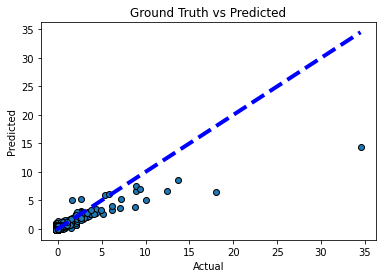

In [53]:
from sklearn.model_selection import cross_val_predict
fig, ax = plt.subplots()
ax.scatter(y_test, y_predicted, edgecolors=(0, 0, 0))
ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'b--', lw=4)
ax.set_xlabel('Actual')
ax.set_ylabel('Predicted')
ax.set_title("Ground Truth vs Predicted")
plt.show()

# Task 7: Predictions

## 7.1: Plot Raw Predictions

Let's use the `compare_predictions` helper function to compare predictions from the model when it was untrained and when it was trained.

In [54]:
preds_on_trained = regressor.predict(X_test)
print(preds_on_trained)
#compare_predictions(preds_on_untrained, preds_on_trained, y_test)

[-0.13644404 -0.09269523  0.66566617 ... -0.0021472  -0.00384606
 -0.00221247]


## 7.2: Plot Price Predictions

The plot for price predictions and raw predictions will look the same with just one difference: The x and y axis scale is changed.

In [55]:
price_on_untrained = [convert_label_value(y) for y in preds_on_untrained]
price_on_trained = [convert_label_value(y) for y in preds_on_trained]
compare_predictions(price_on_untrained, price_on_trained, price_y_test)

NameError: name 'preds_on_untrained' is not defined

In [56]:
cases = [convert_label_value(y) for y in preds_on_trained]
y_tested = [convert_label_value(y) for y in y_test]
from scipy.stats import pearsonr
corr, _ = pearsonr(cases, y_tested)
print(corr)

0.8874520714891644


In [57]:
cases = pd.DataFrame(cases)
cases.to_csv('predicted2.csv')
y_tested = pd.DataFrame(y_tested)
y_tested.to_csv('actual.csv')

In [48]:
cases[cases>0]-=1

In [40]:
y_t[y_t>0]-=1

In [28]:
model.save(r'C:\Users\Arpit\Desktop\files\coursera house pricing\weights_rmse.h5')

NameError: name 'model' is not defined

In [112]:
a=model.predict(X_test)

In [117]:
a_t = [convert_label_value(w) for w in a]

In [122]:
np.savetxt('predictedmod2.csv',a_t,delimiter=',')

In [211]:
w200=new_population[best_match_idx,:]